In [1]:
import os
os.environ["KERAS_BACKEND"] = "tensorflow"
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
# for compatible with python 3
from __future__ import print_function
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
# Seaborn, useful for graphics
import seaborn as sns

# Import Bokeh modules for interactive plotting
import bokeh.io
#import bokeh.mpl
import bokeh.plotting

In [3]:
# Magic function to make matplotlib inline; other style specs must come AFTER
%matplotlib inline

# This enables SVG graphics inline.  There is a bug, so uncomment if it works.
# %config InlineBackend.figure_formats = {'svg',}

# This enables high resolution PNGs. SVG is preferred, but has problems
# rendering vertical and horizontal lines
%config InlineBackend.figure_formats = {'png', 'retina'}
matplotlib.rcParams['figure.figsize'] = (10, 6)
plt.rc('legend', fontsize=20)
# JB's favorite Seaborn settings for notebooks
rc = {'lines.linewidth': 2, 
      'axes.labelsize': 18, 
      'axes.titlesize': 18, 
      'axes.facecolor': 'DFDFE5'}
sns.set_context('notebook', rc=rc)
sns.set_style('darkgrid', rc=rc)

# Set up Bokeh for inline viewing
bokeh.io.output_notebook()

Loading BokehJS ...

In [172]:
import pandas as pd
#!wget https://github.com/firmai/random-assets-two/blob/master/stock_price_minutes.csv.zip?raw=true
dataset = pd.read_csv('stock_price_minutes.csv')

In [19]:
import yfinance as yf

In [24]:
from yahoo_fin.stock_info import get_data

In [113]:
# Meta (META), Amazon (AMZN), Apple (AAPL), Netflix (NFLX); and Alphabet (GOOG). 
meta_day= get_data("meta", start_date="01/01/2017", end_date="12/31/2018", index_as_date = True, interval="1d")
amzn_day= get_data("AMZN", start_date="01/01/2017", end_date="12/31/2018", index_as_date = True, interval="1d")
AAPL_day= get_data("AAPL", start_date="01/01/2017", end_date="12/31/2018", index_as_date = True, interval="1d")
NFLX_day= get_data("NFLX", start_date="01/01/2017", end_date="12/31/2018", index_as_date = True, interval="1d")
GOOG_day= get_data("GOOG", start_date="01/01/2017", end_date="12/31/2018", index_as_date = True, interval="1d")

In [114]:
tag = ['META','AMZN','AAPL','NFLX','GOOG']

In [115]:
meta_day

,open,high,low,close,adjclose,volume,ticker
2017-01-03,116.029999,117.839996,115.510002,116.860001,116.860001,20663900,META
2017-01-04,117.550003,119.660004,117.290001,118.690002,118.690002,19630900,META
2017-01-05,118.860001,120.949997,118.320000,120.669998,120.669998,19492200,META
2017-01-06,120.980003,123.879997,120.029999,123.410004,123.410004,28545300,META
2017-01-09,123.550003,125.430000,123.040001,124.900002,124.900002,22880400,META
...,...,...,...,...,...,...,...
2018-12-21,133.389999,134.899994,123.419998,124.949997,124.949997,56901500,META
2018-12-24,123.099998,129.740005,123.019997,124.059998,124.059998,22066000,META
2018-12-26,126.000000,134.240005,125.889999,134.179993,134.179993,39723400,META
2018-12-27,132.440002,134.990005,129.669998,134.520004,134.520004,31202500,META


In [116]:
time_index = meta_day.reset_index(drop=False)['index']

In [123]:
ls1 = ['open','close','high','low','volume']
his = []
ls_data = [meta_day, amzn_day,AAPL_day,NFLX_day,GOOG_day]

In [124]:
for k in ls_data:
    one_stock = []
    for i in range(len(k)):
        tmp = []
        for j in ls1:
            tmp.append(k.iloc[i][j])
        one_stock.append(tmp)
    his.append(one_stock)

In [125]:
his = np.array(his)

In [126]:
his.shape

(5, 501, 5)

In [129]:
his

array([[[1.16e+02, 1.17e+02, 1.18e+02, 1.16e+02, 2.07e+07],
        [1.18e+02, 1.19e+02, 1.20e+02, 1.17e+02, 1.96e+07],
        [1.19e+02, 1.21e+02, 1.21e+02, 1.18e+02, 1.95e+07],
        ...,
        [1.26e+02, 1.34e+02, 1.34e+02, 1.26e+02, 3.97e+07],
        [1.32e+02, 1.35e+02, 1.35e+02, 1.30e+02, 3.12e+07],
        [1.35e+02, 1.33e+02, 1.36e+02, 1.32e+02, 2.26e+07]],

       [[3.79e+01, 3.77e+01, 3.79e+01, 3.74e+01, 7.04e+07],
        [3.79e+01, 3.79e+01, 3.80e+01, 3.77e+01, 5.02e+07],
        [3.81e+01, 3.90e+01, 3.91e+01, 3.80e+01, 1.17e+08],
        ...,
        [6.84e+01, 7.35e+01, 7.37e+01, 6.82e+01, 2.08e+08],
        [7.27e+01, 7.31e+01, 7.34e+01, 6.95e+01, 1.94e+08],
        [7.37e+01, 7.39e+01, 7.57e+01, 7.24e+01, 1.77e+08]],

       [[2.90e+01, 2.90e+01, 2.91e+01, 2.87e+01, 1.15e+08],
        [2.90e+01, 2.90e+01, 2.91e+01, 2.89e+01, 8.45e+07],
        [2.90e+01, 2.92e+01, 2.92e+01, 2.90e+01, 8.88e+07],
        ...,
        [3.71e+01, 3.93e+01, 3.93e+01, 3.67e+01, 2.34e+08

In [173]:
dataset.head()

,Unnamed: 0,date_index,date,time,AAPL_open,AAPL_high,AAPL_low,AAPL_close,AAPL_vol,BAC_open,...,T_open,T_high,T_low,T_close,T_vol,XOM_open,XOM_high,XOM_low,XOM_close,XOM_vol
0,0,0,20180102,173100,170.18,170.19,169.88,169.94,17654,29.80,...,39.03,39.03,39.03,39.03,0,83.82,83.84,83.77,83.77,800
1,1,1,20180102,173200,169.90,169.93,169.67,169.69,8200,29.71,...,39.03,39.03,38.97,39.00,1000,83.80,83.94,83.80,83.94,1391
2,2,2,20180102,173300,169.67,169.88,169.58,169.58,9380,29.77,...,39.00,39.03,39.00,39.02,5376,83.90,83.93,83.84,83.90,9400
3,3,3,20180102,173400,169.46,169.46,169.27,169.33,5348,29.77,...,39.02,39.02,38.97,38.97,5137,83.87,83.90,83.82,83.86,8728
4,4,4,20180102,173500,169.45,169.60,169.44,169.59,9700,29.74,...,38.97,39.01,38.97,38.98,5499,83.88,83.89,83.79,83.79,5430


In [174]:
df_time = pd.DataFrame({'year': dataset.date.astype(str).str.slice(0, 4).astype(int),
                        'month': dataset.date.astype(str).str.slice(4, 6).astype(int),
                        'day': dataset.date.astype(str).str.slice(6, 8).astype(int),
                        'hour': dataset.time.astype(str).str.slice(0, 2).astype(int),
                        'minute': dataset.time.astype(str).str.slice(2, 4).astype(int)
                       })

In [175]:
time_ref = pd.to_datetime(df_time)
time_ref = time_ref.to_frame()
time_ref.columns = ['Time']

In [176]:
time_ref.head()

,Time
0,2018-01-02 17:31:00
1,2018-01-02 17:32:00
2,2018-01-02 17:33:00
3,2018-01-02 17:34:00
4,2018-01-02 17:35:00


In [131]:
time_ref = pd.to_datetime(time_index)
time_ref = time_ref.to_frame()
time_ref.columns = ['Time']
time_ref.head()

,Time
0,2017-01-03
1,2017-01-04
2,2017-01-05
3,2017-01-06
4,2017-01-09


In [177]:
dataset = dataset.merge(time_ref, left_index=True, right_index=True, how='left')

In [178]:
dataset

,Unnamed: 0,date_index,date,time,AAPL_open,AAPL_high,AAPL_low,AAPL_close,AAPL_vol,BAC_open,...,T_high,T_low,T_close,T_vol,XOM_open,XOM_high,XOM_low,XOM_close,XOM_vol,Time
0,0,0,20180102,173100,170.18,170.19,169.88,169.94,17654,29.800,...,39.03,39.03,39.03,0,83.82,83.84,83.77,83.77,800,2018-01-02 17:31:00
1,1,1,20180102,173200,169.90,169.93,169.67,169.69,8200,29.710,...,39.03,38.97,39.00,1000,83.80,83.94,83.80,83.94,1391,2018-01-02 17:32:00
2,2,2,20180102,173300,169.67,169.88,169.58,169.58,9380,29.770,...,39.03,39.00,39.02,5376,83.90,83.93,83.84,83.90,9400,2018-01-02 17:33:00
3,3,3,20180102,173400,169.46,169.46,169.27,169.33,5348,29.770,...,39.02,38.97,38.97,5137,83.87,83.90,83.82,83.86,8728,2018-01-02 17:34:00
4,4,4,20180102,173500,169.45,169.60,169.44,169.59,9700,29.740,...,39.01,38.97,38.98,5499,83.88,83.89,83.79,83.79,5430,2018-01-02 17:35:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81096,81096,81096,20181029,211800,214.33,214.55,214.25,214.47,5700,26.810,...,29.87,29.84,29.86,1701,77.43,77.43,77.38,77.38,8900,2018-10-29 21:18:00
81097,81097,81097,20181029,211900,214.50,214.66,214.32,214.37,5710,26.810,...,29.85,29.83,29.85,2300,77.38,77.45,77.38,77.45,8200,2018-10-29 21:19:00
81098,81098,81098,20181029,212000,214.40,214.62,214.33,214.42,8100,26.850,...,29.88,29.86,29.88,1500,77.44,77.49,77.41,77.48,4600,2018-10-29 21:20:00
81099,81099,81099,20181029,212100,214.40,214.41,214.15,214.16,8213,26.865,...,29.90,29.88,29.88,6080,77.48,77.54,77.48,77.52,4200,2018-10-29 21:21:00


In [179]:
abbreviation = pd.read_csv("https://github.com/firmai/random-assets/raw/master/portfolio/symbols.txt")

In [180]:
abbreviation

,symbols
0,AAPL
1,BAC
2,BA
3,GE
4,GOOG
5,JNJ
6,KO
7,MA
8,MRK
9,MSFT


In [181]:
history = np.empty((15,len(dataset),5))

In [182]:
suffix = ["_open", "_close", "_high", "_low", "_vol"]

In [183]:
for i_n, i in enumerate(abbreviation['symbols']):
    for j_n, j in enumerate(suffix):
        history[i_n, :, j_n] = dataset[i+j]

In [184]:
history.shape

(15, 81101, 5)

In [185]:
history

array([[[1.70e+02, 1.70e+02, 1.70e+02, 1.70e+02, 1.77e+04],
        [1.70e+02, 1.70e+02, 1.70e+02, 1.70e+02, 8.20e+03],
        [1.70e+02, 1.70e+02, 1.70e+02, 1.70e+02, 9.38e+03],
        ...,
        [2.14e+02, 2.14e+02, 2.15e+02, 2.14e+02, 8.10e+03],
        [2.14e+02, 2.14e+02, 2.14e+02, 2.14e+02, 8.21e+03],
        [2.14e+02, 2.14e+02, 2.14e+02, 2.14e+02, 4.79e+03]],

       [[2.98e+01, 2.97e+01, 2.98e+01, 2.97e+01, 3.62e+04],
        [2.97e+01, 2.98e+01, 2.98e+01, 2.97e+01, 1.36e+04],
        [2.98e+01, 2.98e+01, 2.98e+01, 2.98e+01, 1.95e+04],
        ...,
        [2.69e+01, 2.69e+01, 2.69e+01, 2.68e+01, 1.07e+04],
        [2.69e+01, 2.69e+01, 2.69e+01, 2.69e+01, 8.50e+03],
        [2.69e+01, 2.69e+01, 2.69e+01, 2.69e+01, 8.85e+03]],

       [[2.96e+02, 2.96e+02, 2.96e+02, 2.96e+02, 1.00e+03],
        [2.96e+02, 2.96e+02, 2.96e+02, 2.96e+02, 1.00e+02],
        [2.96e+02, 2.96e+02, 2.96e+02, 2.96e+02, 6.00e+02],
        ...,
        [3.41e+02, 3.41e+02, 3.41e+02, 3.41e+02, 1.00e+02

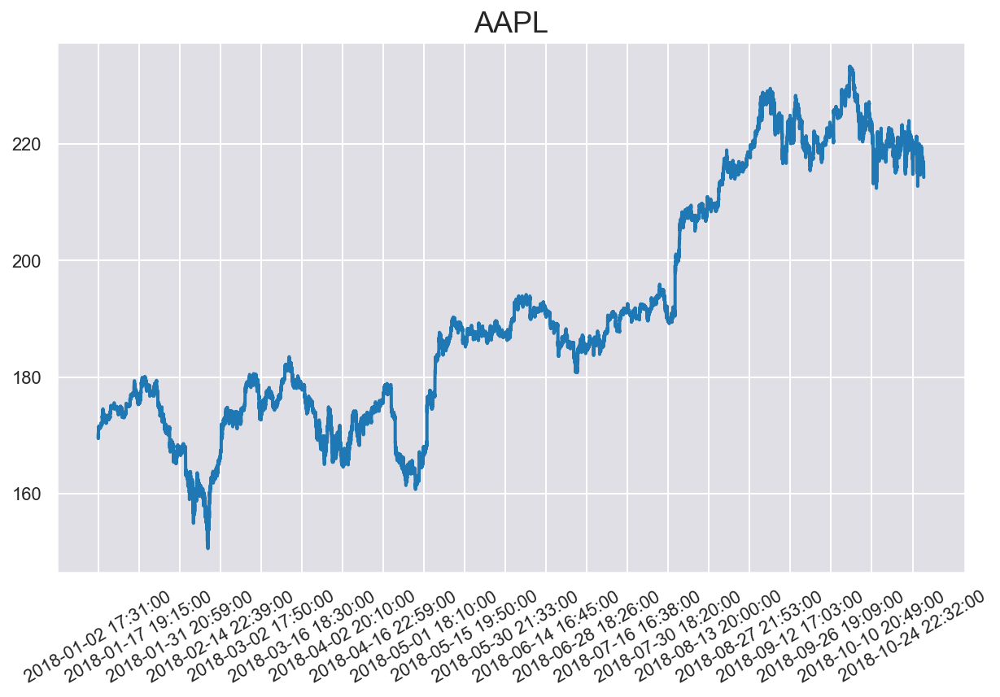

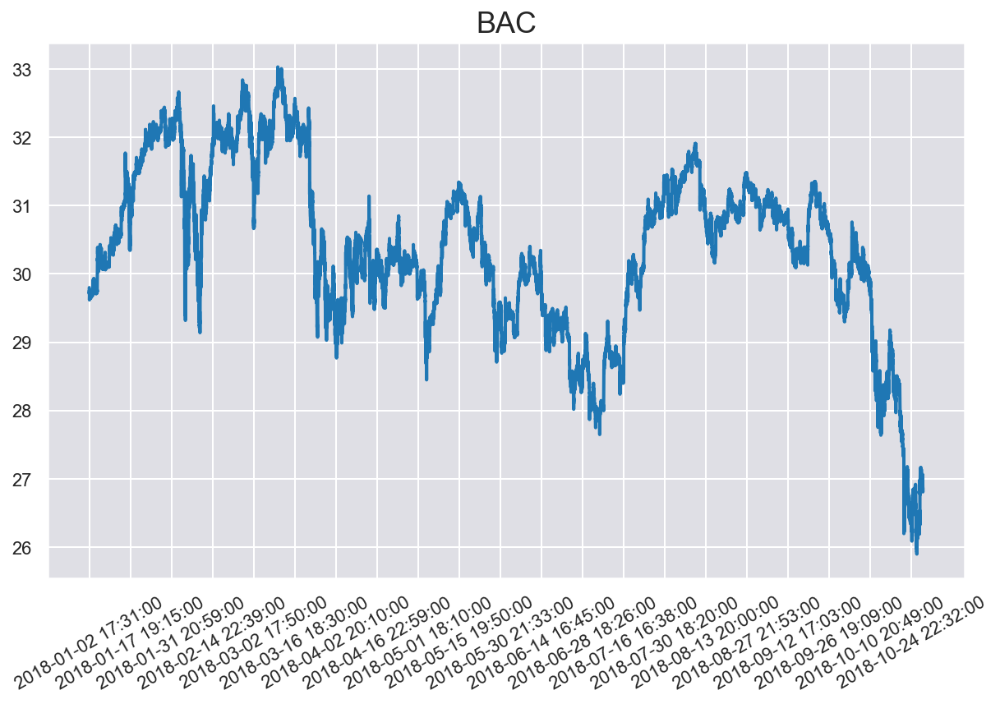

In [186]:
# visualize stocks open price from 2018-01-01 to 2018-10-29 for the first two stocks
if True:
    date = dataset.Time
    x = range(history.shape[1])
    for i in range(len(abbreviation[:2])):
        plt.figure(i)
        plt.plot(x, history[i, :, 0])  # open, cloase, high, low, volume = [0, 1, 2, 3, 4]
        plt.xticks(x[::4000], date[::4000], rotation=30)
        plt.title(abbreviation.iloc[i, 0])
        plt.show()

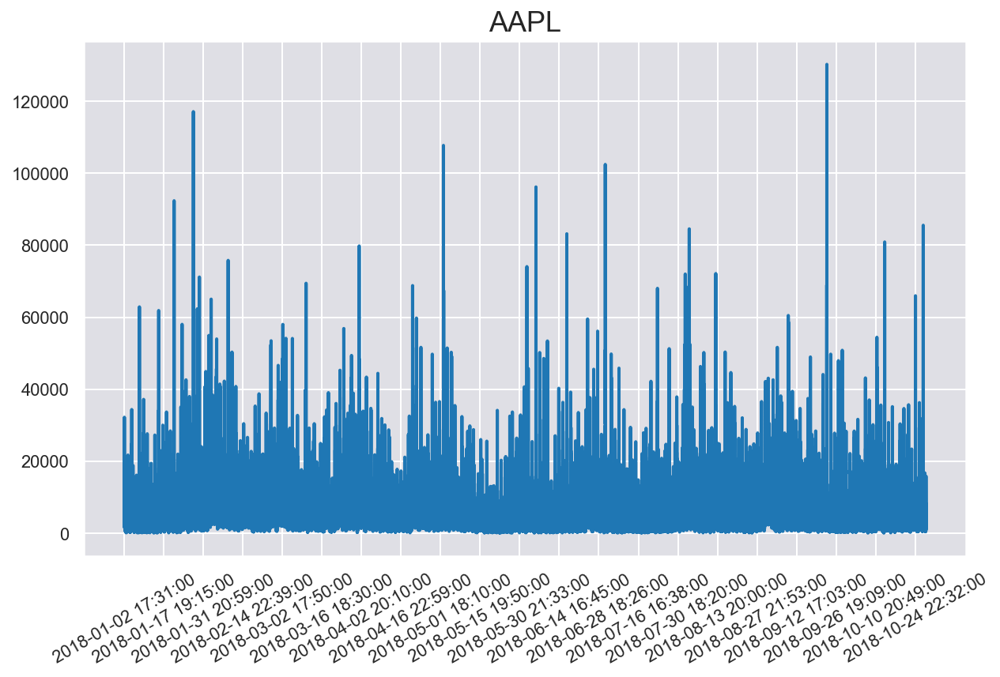

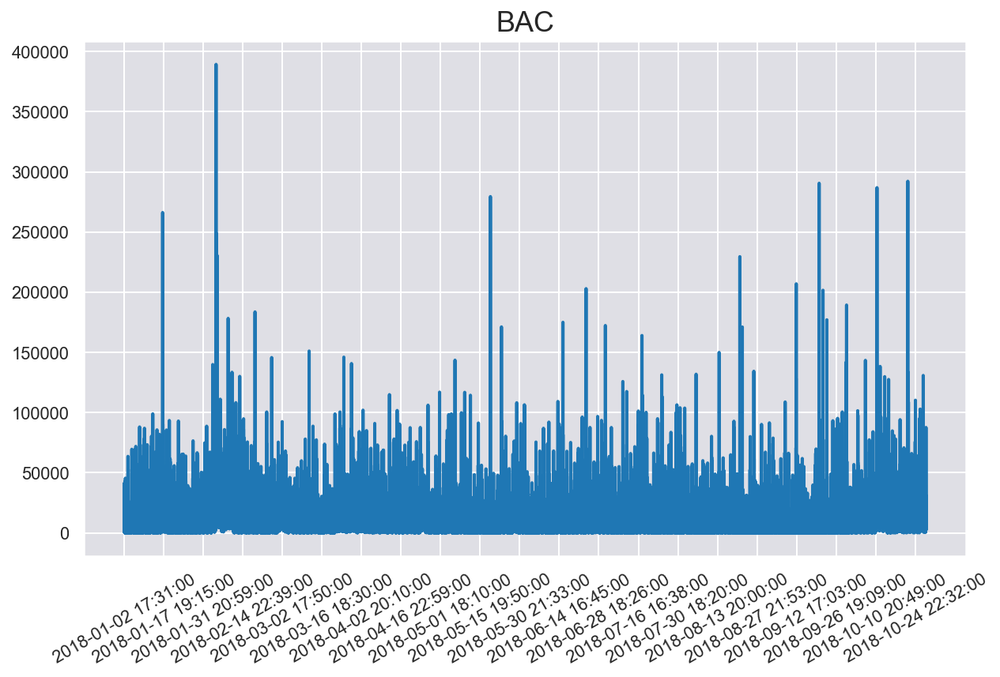

In [187]:
# visualize stocks trade volume
if True:
    date = dataset.Time
    x = range(history.shape[1])
    for i in range(len(abbreviation[:2])):
        plt.figure(i)
        plt.plot(x, history[i, :, 4])  # open, cloase, high, low, volume = [0, 1, 2, 3, 4]
        plt.xticks(x[::4000], date[::4000], rotation=30)
        plt.title(abbreviation.iloc[i, 0])
        plt.show()

In [188]:
# from model.ddpg.actor import ActorNetwork
# from model.ddpg.critic import CriticNetwork
# from model.ddpg.ddpg import DDPG
# from model.ddpg.ornstein_uhlenbeck import OrnsteinUhlenbeckActionNoise

# from stock_trading import StockActor, StockCritic, obs_normalizer, get_model_path, get_result_path, \
#                           test_model, get_variable_scope

# from environment.portfolio import PortfolioEnv

import numpy as np
import tflearn
import tensorflow as tf

In [189]:
data = {
    'Jan': dataset[(dataset.Time <= pd.Timestamp(2018, 1, 31)) & (dataset.Time >= pd.Timestamp(2018, 1, 1))],
    'Feb': dataset[(dataset.Time <= pd.Timestamp(2018, 2, 28)) & (dataset.Time >= pd.Timestamp(2018, 2, 1))],
    'Mar': dataset[(dataset.Time <= pd.Timestamp(2018, 3, 31)) & (dataset.Time >= pd.Timestamp(2018, 3, 1))],
    'Apr': dataset[(dataset.Time <= pd.Timestamp(2018, 4, 30)) & (dataset.Time >= pd.Timestamp(2018, 4, 1))],
    'May': dataset[(dataset.Time <= pd.Timestamp(2018, 5, 31)) & (dataset.Time >= pd.Timestamp(2018, 5, 1))],
    'Jun': dataset[(dataset.Time <= pd.Timestamp(2018, 6, 30)) & (dataset.Time >= pd.Timestamp(2018, 6, 1))],
    'Jul': dataset[(dataset.Time <= pd.Timestamp(2018, 7, 31)) & (dataset.Time >= pd.Timestamp(2018, 7, 1))],
    'Aug': dataset[(dataset.Time <= pd.Timestamp(2018, 8, 31)) & (dataset.Time >= pd.Timestamp(2018, 8, 1))],
    'Sep': dataset[(dataset.Time <= pd.Timestamp(2018, 9, 30)) & (dataset.Time >= pd.Timestamp(2018, 9, 1))],
    'Oct': dataset[(dataset.Time <= pd.Timestamp(2018, 10, 31)) & (dataset.Time >= pd.Timestamp(2018, 10, 1))]
    }

In [190]:
data['Jan']

,Unnamed: 0,date_index,date,time,AAPL_open,AAPL_high,AAPL_low,AAPL_close,AAPL_vol,BAC_open,...,T_high,T_low,T_close,T_vol,XOM_open,XOM_high,XOM_low,XOM_close,XOM_vol,Time
0,0,0,20180102,173100,170.18,170.190,169.880,169.940,17654,29.800,...,39.030,39.030,39.030,0,83.820,83.840,83.770,83.770,800,2018-01-02 17:31:00
1,1,1,20180102,173200,169.90,169.930,169.670,169.690,8200,29.710,...,39.030,38.970,39.000,1000,83.800,83.940,83.800,83.940,1391,2018-01-02 17:32:00
2,2,2,20180102,173300,169.67,169.880,169.580,169.580,9380,29.770,...,39.030,39.000,39.020,5376,83.900,83.930,83.840,83.900,9400,2018-01-02 17:33:00
3,3,3,20180102,173400,169.46,169.460,169.270,169.330,5348,29.770,...,39.020,38.970,38.970,5137,83.870,83.900,83.820,83.860,8728,2018-01-02 17:34:00
4,4,4,20180102,173500,169.45,169.600,169.440,169.590,9700,29.740,...,39.010,38.970,38.980,5499,83.880,83.890,83.790,83.790,5430,2018-01-02 17:35:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7786,7786,7786,20180130,235500,166.79,166.860,166.750,166.860,7304,31.975,...,37.575,37.540,37.540,9032,86.915,86.915,86.900,86.900,1600,2018-01-30 23:55:00
7787,7787,7787,20180130,235600,166.85,166.945,166.850,166.945,15359,31.965,...,37.545,37.535,37.540,3072,86.905,86.940,86.905,86.905,6384,2018-01-30 23:56:00
7788,7788,7788,20180130,235700,166.95,166.970,166.910,166.970,12028,31.965,...,37.535,37.515,37.535,6800,86.905,86.930,86.900,86.930,9222,2018-01-30 23:57:00
7789,7789,7789,20180130,235800,166.97,167.020,166.885,166.960,18020,31.960,...,37.535,37.520,37.520,5398,86.930,86.930,86.875,86.880,5800,2018-01-30 23:58:00


In [191]:
history_Jan = np.empty((15,len(data['Jan']),5))
for i_n, i in enumerate(abbreviation['symbols']):
    for j_n, j in enumerate(suffix):
        history_Jan[i_n, :, j_n] = data['Jan'][i+j]
history_Feb = np.empty((15,len(data['Feb']),5))
for i_n, i in enumerate(abbreviation['symbols']):
    for j_n, j in enumerate(suffix):
        history_Feb[i_n, :, j_n] = data['Feb'][i+j]
history_Mar = np.empty((15,len(data['Mar']),5))
for i_n, i in enumerate(abbreviation['symbols']):
    for j_n, j in enumerate(suffix):
        history_Mar[i_n, :, j_n] = data['Mar'][i+j]
history_Apr = np.empty((15,len(data['Apr']),5))
for i_n, i in enumerate(abbreviation['symbols']):
    for j_n, j in enumerate(suffix):
        history_Apr[i_n, :, j_n] = data['Apr'][i+j]
history_May = np.empty((15,len(data['May']),5))
for i_n, i in enumerate(abbreviation['symbols']):
    for j_n, j in enumerate(suffix):
        history_May[i_n, :, j_n] = data['May'][i+j]
history_Jun = np.empty((15,len(data['Jun']),5))
for i_n, i in enumerate(abbreviation['symbols']):
    for j_n, j in enumerate(suffix):
        history_Jun[i_n, :, j_n] = data['Jun'][i+j]
history_Jul = np.empty((15,len(data['Jul']),5))
for i_n, i in enumerate(abbreviation['symbols']):
    for j_n, j in enumerate(suffix):
        history_Jul[i_n, :, j_n] = data['Jul'][i+j]
history_Aug = np.empty((15,len(data['Aug']),5))
for i_n, i in enumerate(abbreviation['symbols']):
    for j_n, j in enumerate(suffix):
        history_Aug[i_n, :, j_n] = data['Aug'][i+j]
history_Sep = np.empty((15,len(data['Sep']),5))
for i_n, i in enumerate(abbreviation['symbols']):
    for j_n, j in enumerate(suffix):
        history_Sep[i_n, :, j_n] = data['Sep'][i+j]
history_Oct = np.empty((15,len(data['Oct']),5))
for i_n, i in enumerate(abbreviation['symbols']):
    for j_n, j in enumerate(suffix):
        history_Oct[i_n, :, j_n] = data['Oct'][i+j]

In [192]:
batch_size = 100
action_bound = 1.
tau = 1e-3
window_length = 30
predictor_type = 'lstm'
use_batch_norm = True
nb_classes = 15 # 要改

In [210]:
from __future__ import print_function

from pprint import pprint

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import gym
import gym.spaces


eps = 1e-20

dats = dataset.copy()

df_time = pd.DataFrame({'year': dats.date.astype(str).str.slice(0, 4).astype(int),
                        'month': dats.date.astype(str).str.slice(4, 6).astype(int),
                        'day': dats.date.astype(str).str.slice(6, 8).astype(int),
                        'hour': dats.time.astype(str).str.slice(0, 2).astype(int),
                        'minute': dats.time.astype(str).str.slice(2, 4).astype(int)
                        })
df_time = pd.to_datetime(df_time).to_frame()
df_time.columns = ['Time']

def random_shift(x, fraction):
    """ Apply a random shift to a pandas series. """
    min_x, max_x = np.min(x), np.max(x)
    m = np.random.uniform(-fraction, fraction, size=x.shape) + 1
    return np.clip(x * m, min_x, max_x)


def scale_to_start(x):
    """ Scale pandas series so that it starts at one. """
    x = (x + eps) / (x[0] + eps)
    return x


def sharpe(returns, freq=30, rfr=0):
    """ Given a set of returns, calculates naive (rfr=0) sharpe (eq 28). """
    return (np.sqrt(freq) * np.mean(returns - rfr + eps)) / np.std(returns - rfr + eps)


def max_drawdown(returns):
    """ Max drawdown. See https://www.investopedia.com/terms/m/maximum-drawdown-mdd.asp """
    peak = returns.max()
    trough = returns[returns.argmax():].min()
    return (trough - peak) / (peak + eps)


class DataGenerator(object):
    """Acts as data provider for each new episode."""

    def __init__(self, history, abbreviation, steps=120, window_length=50):
        """
        Args:
            history: (num_stocks, timestamp, 5) open, close, high, low, volume
            abbreviation: a list of length num_stocks with assets name
            steps: the total number of steps to simulate, default is 2 hours
            window_length: observation window
        """
        assert history.shape[0] == len(abbreviation), 'Number of stock is not consistent'
        import copy

        self.steps = steps + 1
        self.window_length = window_length

        # make immutable class
        self._data = history.copy()  # all data
        self.asset_names = copy.copy(abbreviation)

    def _step(self):
        # get observation matrix from history
        # the stock data were observed every 7 minutes
        self.step += 7
        obs = self.data[:, self.step:self.step + self.window_length, :].copy()
        # normalize obs with open price

        # used for compute optimal action and sanity check
        ground_truth_obs = self.data[:, self.step + self.window_length:self.step + self.window_length + 1, :].copy()

        done = self.step + 7 >= self.steps
        return obs, done, ground_truth_obs

    def _step_sim(self):
        # get observation without stepping forward
        obs = self.data[:, self.step:self.step + self.window_length, :].copy()

        # used for compute optimal action and sanity check
        ground_truth_obs = self.data[:, self.step + self.window_length:self.step + self.window_length + 1, :].copy()

        done = self.step + 7 >= self.steps
        return obs, done, ground_truth_obs

    def reset(self):
        self.step = 0

        # get data for this episode, each episode might be different.
        self.idx = np.random.randint(
            low=self.window_length, high=self._data.shape[1] - self.steps)

        # print('Start date: {}'.format(index_to_date(self.idx)))
        data = self._data[:, self.idx - self.window_length:self.idx + self.steps + 7, :]
        # apply augmentation?
        self.data = data
        return self.data[:, self.step:self.step + self.window_length, :].copy(), \
               self.data[:, self.step + self.window_length:self.step + self.window_length + 1, :].copy()


class PortfolioSim(object):
    """
    Portfolio management sim.
    Params:
    - cost e.g. 0.0025 is max in Poliniex
    Based of [Jiang 2017](https://arxiv.org/abs/1706.10059)
    """

    def __init__(self, asset_names=list(), returns_list=list(), steps=730, trading_cost=0.0025, time_cost=0.0):
        self.asset_names = asset_names
        self.returns_list = returns_list
        self.cost = trading_cost
        self.time_cost = time_cost
        self.steps = steps

    def _step(self, w1, y1):
        """
        Step.
        w1 - new action of portfolio weights - e.g. [0.1,0.9,0.0]
        y1 - price relative vector also called return
            e.g. [1.0, 0.9, 1.1]
        Numbered equations are from https://arxiv.org/abs/1706.10059
        """
        assert w1.shape == y1.shape, 'w1 and y1 must have the same shape'
        assert y1[0] == 1.0, 'y1[0] must be 1'

        w0 = self.w0
        p0 = self.p0
        n_assests = len(self.asset_names)

        dw1 = (y1 * w0) / (np.dot(y1, w0) + eps)  # (eq7) weights evolve into

        mu1 = self.cost * (np.abs(dw1[1:] - w1[1:])).sum() # (eq16) cost to change portfolio

        assert mu1 < 1.0, 'Cost is larger than current holding'

        LongPosition_value = p0 * (1 - mu1) * np.dot(y1[:n_assests+1], w0[:n_assests+1])
        ShortPosition_value = p0 * (1 - mu1) * np.dot(1-(y1[n_assests+1:]-1), w0[n_assests+1:])

        p1 = LongPosition_value + ShortPosition_value

        p1 = p1 * (1 - self.time_cost)  # we can add a cost to holding

        rho1 = p1 / p0 - 1  # rate of returns

        r1 = np.log((p1 + eps) / (p0 + eps))  # log rate of return

        # TODO use sharpe ratio for reward
        reward = r1/self.steps  # reward
        # remember for next step
        self.p0 = p1
        self.w0 = w1

        # if we run out of money, we're done (losing all the money)
        done = p1 == 0

        info = {
            "reward": reward,
            "log_return": r1,
            "portfolio_value": p1,
            "return": y1.mean(),
            "rate_of_return": rho1,
            "weights_mean": w1.mean(),
            "weights_std": w1.std(),
            "weights": np.round(w1, 4),
            "cost": mu1,
            "long_position": LongPosition_value,
            "short_position": ShortPosition_value,
            "price_change": y1

        }
        self.infos.append(info)
        return reward, info, done

    def reset(self):
        self.infos = []
        self.w0 = np.array([1.0] + [0.0] * len(self.asset_names) * 2)
        self.p0 = 1.0


class PortfolioEnv(gym.Env):
    """
    An environment for financial portfolio management.
    Financial portfolio management is the process of constant redistribution of a fund into different
    financial products.
    Based on [Jiang 2017](https://arxiv.org/abs/1706.10059)
    """

    metadata = {'render.modes': ['human', 'ansi']}

    def __init__(self,
                 history,
                 abbreviation,
                 steps=120,
                 trading_cost=0.0025,
                 time_cost=0.00,
                 window_length=50,
                 start_idx=0
                 ):
        """
        An environment for financial portfolio management.
        Params:
            steps - steps in episode
            scale - scale data and each episode (except return)
            augment - fraction to randomly shift data by
            trading_cost - cost of trade as a fraction
            time_cost - cost of holding as a fraction
            window_length - how many past observations to return
            start_idx - The number of days from '2018-01-02' of the dataset
        """
        self.window_length = window_length
        self.num_stocks = history.shape[0]
        self.start_idx = start_idx

        self.src = DataGenerator(history, abbreviation, steps=steps, window_length=window_length)

        self.sim = PortfolioSim(
            asset_names=abbreviation,
            trading_cost=trading_cost,
            time_cost=time_cost,
            steps=steps)

        # openai gym attributes
        # action will be the portfolio weights from 0 to 1 for each asset
        self.action_space = gym.spaces.Box(
            0, 1, shape=(len(self.src.asset_names)*2 + 1,), dtype=np.float32)  # include cash

        # get the observation space from the data min and max
        self.observation_space = gym.spaces.Box(low=-np.inf, high=np.inf, shape=(len(abbreviation), window_length,
                                                                                 history.shape[-1]), dtype=np.float32)
        
    def step(self, action, simulation=0):
        return self._step(action, simulation)

    def _step(self, action, simulation):
        """
        Step the env.
        Actions should be portfolio [w0...]
        - Where wn is a portfolio weight from 0 to 1. The first is cash_bias
        - cn is the portfolio conversion weights see PortioSim._step for description
        """
        np.testing.assert_almost_equal(
            action.shape,
            (len(self.sim.asset_names)*2 + 1,)
        )

        # normalise just in case
        action = np.clip(action, 0, 1)

        weights = action  # np.array([cash_bias] + list(action))  # [w0, w1...]
        weights /= (weights.sum() + eps)
        weights[0] += np.clip(1 - weights.sum(), 0, 1)  # so if weights are all zeros we normalise to [1,0...]

        assert ((action >= 0) * (action <= 1)).all(), 'all action values should be between 0 and 1. Not %s' % action
        np.testing.assert_almost_equal(
            np.sum(weights), [1.0], 3, err_msg='weights should sum to 1. action="%s"' % weights)

        if simulation == 0:
            observation, done1, ground_truth_obs = self.src._step()
        else:
            observation, done1, ground_truth_obs = self.src._step_sim()

        # concatenate observation with ones
        cash_observation = np.ones((1, self.window_length, observation.shape[2]))
        observation = np.concatenate((cash_observation, observation), axis=0)
        cash_ground_truth = np.ones((1, 1, ground_truth_obs.shape[2]))
        ground_truth_obs = np.concatenate((cash_ground_truth, ground_truth_obs), axis=0)
        # relative price vector of last observation day (close/open)
        current_open_price_vector = observation[:, -1, 0]
        last_open_price_vector = observation[:, -7, 0]

        y1 = current_open_price_vector / last_open_price_vector
        y1 = np.append(y1, y1[1:])

        reward, info, done2 = self.sim._step(weights, y1)

        # calculate return for buy and hold a bit of each asset
        if simulation == 0:
            info['market_value'] = np.cumprod([inf["return"] for inf in self.infos + [info]])[-1]
            # add dates
            info['date'] = self.start_idx + self.src.idx + self.src.step
            #info['date'] = self.src.idx
            info['steps'] = self.src.step
            info['next_obs'] = ground_truth_obs
            self.infos.append(info)

        return observation, reward, done1 or done2, info
    
    def reset(self):
        return self._reset()

    def _reset(self):
        self.infos = []
        self.sim.reset()
        observation, ground_truth_obs = self.src.reset()
        cash_observation = np.ones((1, self.window_length, observation.shape[2]))
        observation = np.concatenate((cash_observation, observation), axis=0)
        cash_ground_truth = np.ones((1, 1, ground_truth_obs.shape[2]))
        ground_truth_obs = np.concatenate((cash_ground_truth, ground_truth_obs), axis=0)
        info = {}
        info['next_obs'] = ground_truth_obs
        return observation, info

    def _render(self, mode='human', close=False):
        if close:
            return
        if mode == 'ansi':
            pprint(self.infos[-1])
        elif mode == 'human':
            self.plot()
            
    def render(self, mode='human', close=False):
        return self._render(mode='human', close=False)

    def plot(self):
        df_info = pd.DataFrame(self.infos)
        df_env_info = pd.merge(df_info, df_time, left_on='date', right_index=True)
        #df_env_info = df_info
        x = range(len(df_env_info))
        tick_f = round(len(df_env_info)/15)
        plt.figure(1)
        plt.plot(x, df_env_info['portfolio_value'], label='Portfolio value')
        plt.plot(x, df_env_info['market_value'], label='Market value')
        plt.xticks(x[::tick_f], df_env_info.Time[::tick_f], rotation=30)
        plt.legend(loc='upper right')
        plt.title('Portfolio value')
        plt.show()

In [75]:
class ActorNetwork(object):
  """
  Input to the network is the state, output is the action
  under a deterministic policy.
  The output layer activation is a tanh to keep the action
  between -action_bound and action_bound
  """

  def __init__(self, sess, state_dim, action_dim, action_bound, learning_rate, tau, batch_size):
      """
      Args:
          sess: a tensorflow session
          state_dim: a list specifies shape
          action_dim: a list specified action shape
          action_bound: whether to normalize action in the end
          learning_rate: learning rate
          tau: target network update parameter
          batch_size: use for normalization
      """
      self.sess = sess
      assert isinstance(state_dim, list), 'state_dim must be a list.'
      self.s_dim = state_dim
      assert isinstance(action_dim, list), 'action_dim must be a list.'
      self.a_dim = action_dim
      self.action_bound = action_bound
      self.learning_rate = learning_rate
      self.tau = tau
      self.batch_size = batch_size

      # Actor Network
      self.inputs, self.out, self.scaled_out = self.create_actor_network()

      self.network_params = tf.trainable_variables()

      # Target Network
      self.target_inputs, self.target_out, self.target_scaled_out = self.create_actor_network()

      self.target_network_params = tf.trainable_variables()[
                                    len(self.network_params):]

      # Op for periodically updating target network with online network
      # weights
      self.update_target_network_params = \
          [self.target_network_params[i].assign(tf.multiply(self.network_params[i], self.tau) +
                                                tf.multiply(self.target_network_params[i], 1. - self.tau))
            for i in range(len(self.target_network_params))]

      # This gradient will be provided by the critic network
      self.action_gradient = tf.placeholder(tf.float32, [None] + self.a_dim)

      # Combine the gradients here
      self.unnormalized_actor_gradients = tf.gradients(
          self.scaled_out, self.network_params, -self.action_gradient)
      self.actor_gradients = list(map(lambda x: tf.div(x, self.batch_size), self.unnormalized_actor_gradients))

      # Optimization Op
      self.optimize = tf.train.AdamOptimizer(self.learning_rate). \
          apply_gradients(zip(self.actor_gradients, self.network_params))

      self.num_trainable_vars = len(self.network_params) + len(self.target_network_params)

  def create_actor_network(self):
      raise NotImplementedError('Create actor should return (inputs, out, scaled_out)')

  def train(self, inputs, a_gradient):
      self.sess.run(self.optimize, feed_dict={
          self.inputs: inputs,
          self.action_gradient: a_gradient
      })

  def predict(self, inputs):
      return self.sess.run(self.scaled_out, feed_dict={
          self.inputs: inputs
      })

  def predict_target(self, inputs):
      return self.sess.run(self.target_scaled_out, feed_dict={
          self.target_inputs: inputs
      })

  def update_target_network(self):
      self.sess.run(self.update_target_network_params)

  def get_num_trainable_vars(self):
      return self.num_trainable_vars

In [194]:
class CriticNetwork(object):
  """
  Input to the network is the state and action, output is Q(s,a).
  The action must be obtained from the output of the Actor network.
  """

  def __init__(self, sess, state_dim, action_dim, learning_rate, tau, num_actor_vars):
      self.sess = sess
      assert isinstance(state_dim, list), 'state_dim must be a list.'
      self.s_dim = state_dim
      assert isinstance(action_dim, list), 'action_dim must be a list.'
      self.a_dim = action_dim
      self.learning_rate = learning_rate
      self.tau = tau

      # Create the critic network
      self.inputs, self.action, self.out = self.create_critic_network()

      self.network_params = tf.trainable_variables()[num_actor_vars:]

      # Target Network
      self.target_inputs, self.target_action, self.target_out = self.create_critic_network()

      self.target_network_params = tf.trainable_variables()[(len(self.network_params) + num_actor_vars):]

      # Op for periodically updating target network with online network
      # weights with regularization
      self.update_target_network_params = \
          [self.target_network_params[i].assign(tf.multiply(self.network_params[i], self.tau) \
                                                + tf.multiply(self.target_network_params[i], 1. - self.tau))
            for i in range(len(self.target_network_params))]

      # Network target (y_i)
      self.predicted_q_value = tf.placeholder(tf.float32, [None, 1])

      # Define loss and optimization Op
      self.loss = tflearn.mean_square(self.predicted_q_value, self.out)
      self.optimize = tf.train.AdamOptimizer(
          self.learning_rate).minimize(self.loss)

      # Get the gradient of the net w.r.t. the action.
      # For each action in the minibatch (i.e., for each x in xs),
      # this will sum up the gradients of each critic output in the minibatch
      # w.r.t. that action. Each output is independent of all
      # actions except for one.
      self.action_grads = tf.gradients(self.out, self.action)

  def create_critic_network(self):
      raise NotImplementedError('Create critic should return (inputs, action, out)')

  def train(self, inputs, action, predicted_q_value):
      return self.sess.run([self.out, self.optimize], feed_dict={
          self.inputs: inputs,
          self.action: action,
          self.predicted_q_value: predicted_q_value
      })

  def predict(self, inputs, action):
      return self.sess.run(self.out, feed_dict={
          self.inputs: inputs,
          self.action: action
      })

  def predict_target(self, inputs, action):
      return self.sess.run(self.target_out, feed_dict={
          self.target_inputs: inputs,
          self.target_action: action
      })

  def action_gradients(self, inputs, actions):
      return self.sess.run(self.action_grads, feed_dict={
          self.inputs: inputs,
          self.action: actions
      })

  def update_target_network(self):
      self.sess.run(self.update_target_network_params)

In [195]:
class BaseModel(object):
    def predict_single(self, observation):
        """ Predict the action of a single observation
        Args:
            observation: (num_stocks + 1, window_length, num_features).
            Feature contains (open, high, low, close)
        Returns: action to take at next timestamp. A numpy array shape (num_stocks + 1,)
        """
        raise NotImplementedError('This method must be implemented by subclass')

In [196]:
def build_summaries():
    episode_reward = tf.Variable(0.)
    tf.summary.scalar("Reward", episode_reward)
    episode_ave_max_q = tf.Variable(0.)
    tf.summary.scalar("Qmax_Value", episode_ave_max_q)

    summary_vars = [episode_reward, episode_ave_max_q]
    summary_ops = tf.summary.merge_all()

    return summary_ops, summary_vars


class DDPG(BaseModel):
    def __init__(self, env, sess, actor, critic, actor_noise, param, obs_normalizer=None, action_processor=None,
                 model_save_path='/', summary_path='/'):
        #          config_file='config/default.json',
        #          model_save_path='weights/ddpg/ddpg.ckpt', summary_path='results/ddpg/'):
        # with open(config_file) as f:
        #     self.config = json.load(f)
        # 
        self.config = param
        assert self.config != None, "Can't load params"

        np.random.seed(self.config['seed'])
        if env:
            env.seed(self.config['seed'])
        self.model_save_path = model_save_path
        self.summary_path = summary_path
        self.sess = sess
        # if env is None, then DDPG just predicts
        self.env = env
        self.actor = actor
        self.critic = critic
        self.action_take = np.zeros((3,))
        self.actor_noise = actor_noise
        self.obs_normalizer = obs_normalizer
        self.action_processor = action_processor
        self.summary_ops, self.summary_vars = build_summaries()

    def initialize(self, load_weights=True, verbose=True):
        """ Load training history from path. To be add feature to just load weights, not training states
        """
        if load_weights:
            try:
                variables = tf.global_variables()
                param_dict = {}
                saver = tf.train.Saver()
                saver.restore(self.sess, self.model_save_path)
                for var in variables:
                    var_name = var.name[:-2]
                    if verbose:
                        print('Loading {} from checkpoint. Name: {}'.format(var.name, var_name))
                    param_dict[var_name] = var
            except:
                traceback.print_exc()
                print('Build model from scratch')
                self.sess.run(tf.global_variables_initializer())
        else:
            print('Build model from scratch')
            self.sess.run(tf.global_variables_initializer())

    def train(self, save_every_episode=1, verbose=True, debug=False):
        """ Must already call intialize
        Args:
            save_every_episode:
            print_every_step:
            verbose:
            debug:
        Returns:
        """
        writer = tf.summary.FileWriter(self.summary_path, self.sess.graph)

        self.actor.update_target_network()
        self.critic.update_target_network()

        np.random.seed(self.config['seed'])
        num_episode = self.config['episode']
        print(num_episode)
        batch_size = self.config['batch size']
        gamma = self.config['gamma']
        # Initialize replay buffer
        self.buffer = ReplayBuffer(self.config['buffer size'])
        np.set_printoptions(precision=2)

        # main training loop
        for i in range(num_episode):
            if verbose and debug:
                ("Episode: " + str(i) + " Replay Buffer " + str(self.buffer.count()))

            # Reset previous_observation
            previous_observation = self.env.reset()
            if self.obs_normalizer:
                previous_observation = self.obs_normalizer(previous_observation)

            ep_reward = 0
            ep_ave_max_q = 0

            for j in range(self.config['max step']):
                # print("step: {}, observation: {}".format(j, previous_observation))
                action = self.actor.predict(np.expand_dims(previous_observation, axis=0)).squeeze(
                    axis=0)

                if self.action_processor:
                    self.action_take = self.action_processor(action)
                else:
                    self.action_take = action
                if j % 10 == 0:
                    print(action)

                observation, reward, done, info = self.env.step(self.action_take)

                ep_reward += reward

                if self.obs_normalizer:
                    observation = self.obs_normalizer(observation)

                self.buffer.add(previous_observation, action, reward, done, observation)

                # Infer other states actions pairs
                for k in range(len(action) - 1):
                    action_p = np.zeros((len(action),))
                    action_p[k+1] = 1
                    _, reward_p, _, _ = self.env.step(action_p, simulation=1)
                    if reward_p > 0 or reward_p < -0.0003:
                        self.buffer.add(previous_observation, action_p, reward_p, done, observation)

                previous_observation = observation

                if done or j == self.config['max step'] - 1:
                    break

            if self.buffer.size() >= batch_size:
                # batch update
                s_batch, a_batch, r_batch, t_batch, s2_batch = self.buffer.sample_batch(batch_size)
                # Calculate targets
                target_q = self.critic.predict_target(s2_batch, self.actor.predict_target(s2_batch))

                y_i = []
                for k in range(batch_size):
                    if t_batch[k]:
                        y_i.append(r_batch[k])
                    else:
                        y_i.append(r_batch[k] + gamma * target_q[k])

                # Update the critic given the targets
                predicted_q_value, _ = self.critic.train(
                    s_batch, a_batch, np.reshape(y_i, (batch_size, 1)))

                ep_ave_max_q += np.amax(predicted_q_value)

                # Update the actor policy using the sampled gradient
                a_outs = self.actor.predict(s_batch)
                grads = self.critic.action_gradients(s_batch, a_outs)
                self.actor.train(s_batch, grads[0])

                # Update target networks
                self.actor.update_target_network()
                self.critic.update_target_network()


            summary_str = self.sess.run(self.summary_ops, feed_dict={
                self.summary_vars[0]: ep_reward,
                self.summary_vars[1]: ep_ave_max_q / float(j)
            })

            writer.add_summary(summary_str, i)
            writer.flush()

            print('Episode: {:d}, Reward: {:.2f}, Qmax: {:.4f}'.format(i, np.exp(ep_reward), (ep_ave_max_q / float(j))))

            # save intermediate model
            if i % 100 == 0:
                intermediate_model_path = self.model_save_path + "_Episode_" + "{}".format(i)
                if not os.path.exists(intermediate_model_path):
                    os.makedirs(intermediate_model_path, exist_ok=True)

                saver = tf.train.Saver()
                saver.save(self.sess, intermediate_model_path + "/checkpoint.ckpt")

        self.save_model(verbose=True)

        print('Finish.')

    def predict(self, observation):
        """ predict the next action using actor model, only used in deploy.
            Can be used in multiple environments.
        Args:
            observation: (batch_size, num_stocks + 1, window_length)
        Returns: action array with shape (batch_size, num_stocks + 1)
        """
        if self.obs_normalizer:
            observation = self.obs_normalizer(observation)
        action = self.actor.predict(observation)
        if self.action_processor:
            action = self.action_processor(action)
        return action

    def predict_single(self, observation):
        """ Predict the action of a single observation
        Args:
            observation: (num_stocks + 1, window_length)
        Returns: a single action array with shape (num_stocks + 1,)
        """
        if self.obs_normalizer:
            observation = self.obs_normalizer(observation)
        action = self.actor.predict(np.expand_dims(observation, axis=0)).squeeze(axis=0)
        if self.action_processor:
            action = self.action_processor(action)
        return action

    def save_model(self, verbose=False):
        if not os.path.exists(self.model_save_path):
            os.makedirs(self.model_save_path, exist_ok=True)

        saver = tf.train.Saver()
        model_path = saver.save(self.sess, self.model_save_path)
        print("Model saved in %s" % model_path)

In [197]:
import numpy as np

class OrnsteinUhlenbeckActionNoise:
    def __init__(self, mu, sigma=0.3, theta=.15, dt=1e-2, x0=None):
        self.theta = theta
        self.mu = mu
        self.sigma = sigma
        self.dt = dt
        self.x0 = x0
        self.reset()

    def __call__(self):
        x = self.x_prev + self.theta * (self.mu - self.x_prev) * self.dt + \
            self.sigma * np.sqrt(self.dt) * np.random.normal(size=self.mu.shape)
        self.x_prev = x
        return x

    def reset(self):
        self.x_prev = self.x0 if self.x0 is not None else np.zeros_like(self.mu)

    def __repr__(self):
        return 'OrnsteinUhlenbeckActionNoise(mu={}, sigma={})'.format(self.mu, self.sigma)

In [198]:
from collections import deque
import random
import os
import csv
import numpy as np


class ReplayBuffer(object):
    def __init__(self, buffer_size, random_seed=123):
        """
        The right side of the deque contains the most recent experiences
        """
        self.buffer_size = buffer_size
        self.count = 0
        self.buffer = deque()
        random.seed(random_seed)

    def add(self, s, a, r, t, s2):
        experience = (s, a, r, t, s2)
        if self.count < self.buffer_size:
            self.buffer.append(experience)
            self.count += 1
        else:
            self.buffer.popleft()
            self.buffer.append(experience)

    def size(self):
        return self.count

    def sample_batch(self, batch_size):
        if self.count < batch_size:
            batch = random.sample(self.buffer, self.count)
        else:
            batch = random.sample(self.buffer, batch_size)

        s_batch = np.array([_[0] for _ in batch])
        a_batch = np.array([_[1] for _ in batch])
        r_batch = np.array([_[2] for _ in batch])
        t_batch = np.array([_[3] for _ in batch])
        s2_batch = np.array([_[4] for _ in batch])

        return s_batch, a_batch, r_batch, t_batch, s2_batch

    def clear(self):
        self.buffer.clear()
        self.count = 0

    def store(self):
        data_folder = "/buffer_data"
        if not os.path.exists(data_folder):
            os.makedirs(data_folder)

        # Write screen features
        data_path = data_folder + '/' + 'experience_replay' + '.txt'
        mode = 'a+' if os.path.exists(data_path) else 'w+'
        with open(data_path, mode, newline='') as f:
            writer = csv.writer(f)
            writer.writerows(self.buffer)

    def restore(self, data_path):
        with open(data_path, 'r') as f:
            self.buffer = [line[:-1].strip('""') for line in f]
        return self.buffer

In [199]:
import argparse
import pprint
import pandas as pd
import datetime

DEBUG = False


def get_model_path(window_length, predictor_type, use_batch_norm):
  if use_batch_norm:
      batch_norm_str = 'batch_norm'
  else:
      batch_norm_str = 'no_batch_norm'
  return 'weights/stock/{}/window_{}/{}/checkpoint.ckpt'.format(predictor_type, window_length, batch_norm_str)


def get_result_path(window_length, predictor_type, use_batch_norm):
  if use_batch_norm:
      batch_norm_str = 'batch_norm'
  else:
      batch_norm_str = 'no_batch_norm'
  return 'results/stock/{}/window_{}/{}/'.format(predictor_type, window_length, batch_norm_str)


def get_variable_scope(window_length, predictor_type, use_batch_norm):
  if use_batch_norm:
      batch_norm_str = 'batch_norm'
  else:
      batch_norm_str = 'no_batch_norm'
  return '{}_window_{}_{}'.format(predictor_type, window_length, batch_norm_str)


def stock_predictor(inputs, predictor_type, use_batch_norm):
  window_length = inputs.get_shape()[2]
  assert predictor_type in ['cnn', 'lstm'], 'type must be either cnn or lstm'
  if predictor_type == 'cnn':
      net = tflearn.conv_2d(inputs, 32, (1, 3), padding='valid')
      if use_batch_norm:
          net = tflearn.layers.normalization.batch_normalization(net)
      net = tflearn.activations.relu(net)
      net = tflearn.conv_2d(net, 32, (1, window_length - 2), padding='valid')
      if use_batch_norm:
          net = tflearn.layers.normalization.batch_normalization(net)
      net = tflearn.activations.relu(net)
      if DEBUG:
          print('After conv2d:', net.shape)
      net = tflearn.flatten(net)
      if DEBUG:
          print('Output:', net.shape)
  elif predictor_type == 'lstm':
      num_stocks = inputs.get_shape()[1]
      hidden_dim = 32
      net = tflearn.reshape(inputs, new_shape=[-1, window_length, 3])
      if DEBUG:
          print('Reshaped input:', net.shape)
      net = tflearn.lstm(net, hidden_dim)
      if DEBUG:
          print('After LSTM:', net.shape)
      net = tflearn.reshape(net, new_shape=[-1, num_stocks, hidden_dim])
      if DEBUG:
          print('After reshape:', net.shape)
      net = tflearn.flatten(net)
      if DEBUG:
          print('Output:', net.shape)
  else:
      raise NotImplementedError

  return net


class StockActor(ActorNetwork):
  def __init__(self, sess, state_dim, action_dim, action_bound, learning_rate, tau, batch_size,
                predictor_type, use_batch_norm):
      self.predictor_type = predictor_type
      self.use_batch_norm = use_batch_norm
      ActorNetwork.__init__(self, sess, state_dim, action_dim, action_bound, learning_rate, tau, batch_size)

  def create_actor_network(self):
      """
      self.s_dim: a list specifies shape
      """
      nb_classes, window_length, features = self.s_dim
      assert window_length > 2, 'This architecture only support window length larger than 2.'
      inputs = tflearn.input_data(shape=[None] + self.s_dim, name='input')

      net = stock_predictor(inputs, self.predictor_type, self.use_batch_norm)

      net = tflearn.fully_connected(net, 64)
      if self.use_batch_norm:
          net = tflearn.layers.normalization.batch_normalization(net)
      # net = tflearn.layers.normalization.batch_normalization(net)
      net = tflearn.activations.relu(net)
      net = tflearn.fully_connected(net, 64)
      if self.use_batch_norm:
          net = tflearn.layers.normalization.batch_normalization(net)
      # net = tflearn.layers.normalization.batch_normalization(net)
      net = tflearn.activations.relu(net)
      # Final layer weights are init to Uniform[-3e-3, 3e-3]
      w_init = tflearn.initializations.uniform(minval=-0.003, maxval=0.003)
      out = tflearn.fully_connected(net, self.a_dim[0], activation='softmax', weights_init=w_init)
      # Scale output to -action_bound to action_bound
      scaled_out = tf.multiply(out, self.action_bound)
      return inputs, out, scaled_out

  def train(self, inputs, a_gradient):
      window_length = self.s_dim[1]
      inputs = inputs[:, :, -window_length:, :]
      self.sess.run(self.optimize, feed_dict={
          self.inputs: inputs,
          self.action_gradient: a_gradient
      })

  def predict(self, inputs):
      window_length = self.s_dim[1]
      inputs = inputs[:, :, -window_length:, :]
      return self.sess.run(self.scaled_out, feed_dict={
          self.inputs: inputs
      })

  def predict_target(self, inputs):
      window_length = self.s_dim[1]
      inputs = inputs[:, :, -window_length:, :]
      return self.sess.run(self.target_scaled_out, feed_dict={
          self.target_inputs: inputs
      })


class StockCritic(CriticNetwork):
  def __init__(self, sess, state_dim, action_dim, learning_rate, tau, num_actor_vars,
                predictor_type, use_batch_norm):
      self.predictor_type = predictor_type
      self.use_batch_norm = use_batch_norm
      CriticNetwork.__init__(self, sess, state_dim, action_dim, learning_rate, tau, num_actor_vars)

  def create_critic_network(self):
      inputs = tflearn.input_data(shape=[None] + self.s_dim)
      action = tflearn.input_data(shape=[None] + self.a_dim)

      net = stock_predictor(inputs, self.predictor_type, self.use_batch_norm)

      # Add the action tensor in the 2nd hidden layer
      # Use two temp layers to get the corresponding weights and biases
      t1 = tflearn.fully_connected(net, 64)
      t2 = tflearn.fully_connected(action, 64)

      net = tf.add(t1, t2)
      if self.use_batch_norm:
          net = tflearn.layers.normalization.batch_normalization(net)
      net = tflearn.activations.relu(net)

      # linear layer connected to 1 output representing Q(s,a)
      # Weights are init to Uniform[-3e-3, 3e-3]
      w_init = tflearn.initializations.uniform(minval=-0.003, maxval=0.003)
      out = tflearn.fully_connected(net, 1, weights_init=w_init)
      return inputs, action, out

  def train(self, inputs, action, predicted_q_value):
      window_length = self.s_dim[1]
      inputs = inputs[:, :, -window_length:, :]
      return self.sess.run([self.out, self.optimize], feed_dict={
          self.inputs: inputs,
          self.action: action,
          self.predicted_q_value: predicted_q_value
      })

  def predict(self, inputs, action):
      window_length = self.s_dim[1]
      inputs = inputs[:, :, -window_length:, :]
      return self.sess.run(self.out, feed_dict={
          self.inputs: inputs,
          self.action: action
      })

  def predict_target(self, inputs, action):
      window_length = self.s_dim[1]
      inputs = inputs[:, :, -window_length:, :]
      return self.sess.run(self.target_out, feed_dict={
          self.target_inputs: inputs,
          self.target_action: action
      })

  def action_gradients(self, inputs, actions):
      window_length = self.s_dim[1]
      inputs = inputs[:, :, -window_length:, :]
      return self.sess.run(self.action_grads, feed_dict={
          self.inputs: inputs,
          self.action: actions
      })


def obs_normalizer(observation):
  """ Preprocess observation obtained by environment
  Args:
      observation: (nb_classes, window_length, num_features) or with info
  Returns: normalized
  """
  if isinstance(observation, tuple):
      observation = observation[0]
  # directly use close/open ratio as feature
  obs_price_ratio = (observation[:, :, 1] / observation[:, :, 0]) - 1
  obs_volume_ratio = (observation[:, :, 4] - np.mean(observation[:, :, 4]))/np.std(observation[:, :, 4])
  obs_amp = (observation[:, :, 2] - observation[:, :, 3]) / observation[:, :, 0]
  observation = np.concatenate((np.expand_dims(obs_price_ratio, axis=2),
                                np.expand_dims(obs_volume_ratio, axis=2),
                                np.expand_dims(obs_amp, axis=2)), axis=2)
  return observation


def test_model(env, model):
  observation, info = env.reset()
  done = False
  while not done:
      action = model.predict_single(observation)
      observation, reward, done, info = env.step(action)
  
  env.render()

In [200]:
from __future__ import print_function

import os
import traceback
import json

In [201]:
param = {
  "episode": 1500,
  "max step": 1000,
  "buffer size": 1000000,
  "batch size": 64,
  "tau": 0.001,
  "gamma": 0.99,
  "actor learning rate": 0.0001,
  "critic learning rate": 0.001,
  "seed": 0
}

In [202]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [333]:
param = {
  "episode": 2000,
  "max step": 1000,
  "buffer size": 1000000,
  "batch size": 128,
  "tau": 0.001,
  "gamma": 0.98,
  "actor learning rate": 0.0001 / 10,
  "critic learning rate": 0.001 / 10,
  "seed": 0
}

In [334]:
tf.reset_default_graph()
sess = tf.Session()
tflearn.config.init_training_mode()
action_dim = [nb_classes*2 + 1]
state_dim = [nb_classes + 1, window_length, 3]
variable_scope = get_variable_scope(window_length, predictor_type, use_batch_norm)

environ = PortfolioEnv(history, abbreviation)

with tf.variable_scope(variable_scope):
    actor = StockActor(sess, state_dim, action_dim, action_bound, 1e-4, tau, batch_size, predictor_type, 
                       use_batch_norm)
    critic = StockCritic(sess=sess, state_dim=state_dim, action_dim=action_dim, tau=1e-3,
                         learning_rate=1e-3, num_actor_vars=actor.get_num_trainable_vars(), 
                         predictor_type=predictor_type, use_batch_norm=use_batch_norm)
    actor_noise = OrnsteinUhlenbeckActionNoise(mu=np.zeros(action_dim))

    model_save_path = "weights/"
    summary_path = get_result_path(window_length, predictor_type, use_batch_norm)

    ddpg_model = DDPG(environ, sess, actor, critic, actor_noise, param, obs_normalizer=obs_normalizer,
                      model_save_path=model_save_path,
                      summary_path=summary_path)
    ddpg_model.initialize(load_weights=False, verbose=False)
    ddpg_model.train()

Build model from scratch
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
2000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 0, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field ty

c:\users\lenovo\appdata\local\programs\python\python39\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


Episode: 5, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 6, Reward: 1.00, Qmax: -0.0001
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 7, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03

Episode: 28, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 29, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 30, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 51, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 52, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 53, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 74, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 75, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 76, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 97, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 98, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 99, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 119, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 120, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 121, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 142, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 143, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 144, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 165, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 166, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 167, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 188, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 189, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 190, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 210, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 211, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 212, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 233, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 234, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 235, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 256, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 257, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 258, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 279, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 280, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 281, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 301, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 302, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 303, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 324, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 325, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 326, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 347, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 348, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.04]
Episode: 349, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 370, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
Episode: 371, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
Episode: 372, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.

Episode: 393, Reward: 1.00, Qmax: 0.0000
[0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
[0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
Episode: 394, Reward: 1.00, Qmax: -0.0000
[0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
[0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
Episode: 395, Reward: 1.00, Qmax: -0.0000
[0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
[0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.0

Episode: 415, Reward: 1.00, Qmax: -0.0000
[0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
[0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
Episode: 416, Reward: 1.00, Qmax: -0.0000
[0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
[0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
Episode: 417, Reward: 1.00, Qmax: -0.0000
[0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.04]
[0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.

Episode: 438, Reward: 1.00, Qmax: -0.0000
[0.02 0.04 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.02 0.03 0.04 0.03 0.03
 0.04 0.03 0.02 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.04 0.03 0.04]
[0.03 0.04 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.04 0.03 0.04]
Episode: 439, Reward: 1.00, Qmax: -0.0000
[0.02 0.04 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.02 0.03 0.04 0.03 0.03
 0.04 0.03 0.02 0.03 0.03 0.03 0.03 0.04 0.02 0.03 0.03 0.03 0.03 0.04
 0.04 0.03 0.04]
[0.03 0.04 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.02 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.04 0.03 0.04]
Episode: 440, Reward: 1.00, Qmax: -0.0000
[0.02 0.04 0.04 0.03 0.04 0.04 0.03 0.03 0.05 0.02 0.03 0.04 0.03 0.03
 0.04 0.03 0.02 0.03 0.03 0.03 0.03 0.04 0.02 0.03 0.03 0.03 0.03 0.04
 0.04 0.03 0.04]
[0.02 0.04 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.02 0.03 0.04 0.03 0.03
 0.04 0.

Episode: 461, Reward: 1.00, Qmax: -0.0000
[0.02 0.04 0.05 0.02 0.04 0.04 0.02 0.03 0.06 0.02 0.02 0.04 0.02 0.03
 0.04 0.03 0.02 0.02 0.03 0.03 0.03 0.04 0.02 0.02 0.03 0.03 0.03 0.04
 0.05 0.02 0.05]
[0.02 0.04 0.05 0.03 0.04 0.04 0.02 0.03 0.05 0.02 0.02 0.04 0.03 0.03
 0.04 0.03 0.02 0.02 0.03 0.03 0.03 0.04 0.02 0.03 0.03 0.03 0.03 0.04
 0.05 0.03 0.05]
Episode: 462, Reward: 1.00, Qmax: -0.0000
[0.02 0.04 0.06 0.02 0.04 0.04 0.02 0.03 0.06 0.02 0.02 0.04 0.02 0.02
 0.05 0.03 0.02 0.02 0.03 0.03 0.03 0.04 0.02 0.02 0.03 0.03 0.03 0.04
 0.05 0.02 0.05]
[0.02 0.04 0.06 0.02 0.04 0.04 0.02 0.03 0.06 0.02 0.02 0.04 0.02 0.02
 0.05 0.03 0.02 0.02 0.03 0.03 0.03 0.04 0.02 0.02 0.03 0.03 0.03 0.04
 0.05 0.02 0.05]
Episode: 463, Reward: 1.00, Qmax: -0.0000
[0.02 0.04 0.06 0.02 0.04 0.04 0.02 0.03 0.06 0.02 0.02 0.04 0.02 0.02
 0.05 0.03 0.02 0.02 0.03 0.03 0.03 0.04 0.02 0.02 0.03 0.03 0.03 0.04
 0.05 0.02 0.05]
[0.02 0.04 0.06 0.02 0.04 0.04 0.02 0.03 0.06 0.02 0.02 0.04 0.02 0.03
 0.05 0.

Episode: 484, Reward: 1.00, Qmax: -0.0000
[0.01 0.04 0.1  0.01 0.05 0.04 0.01 0.02 0.1  0.01 0.01 0.03 0.01 0.02
 0.06 0.02 0.01 0.01 0.02 0.02 0.02 0.05 0.01 0.01 0.02 0.02 0.03 0.05
 0.07 0.01 0.08]
[0.01 0.04 0.09 0.01 0.05 0.04 0.01 0.02 0.1  0.01 0.01 0.03 0.01 0.02
 0.06 0.03 0.01 0.01 0.02 0.02 0.02 0.05 0.01 0.01 0.02 0.02 0.03 0.05
 0.07 0.02 0.08]
Episode: 485, Reward: 1.00, Qmax: -0.0000
[0.01 0.04 0.09 0.02 0.05 0.04 0.02 0.02 0.09 0.01 0.01 0.03 0.02 0.02
 0.05 0.03 0.01 0.01 0.02 0.02 0.03 0.05 0.01 0.02 0.02 0.02 0.03 0.05
 0.07 0.02 0.08]
[0.01 0.04 0.09 0.01 0.05 0.04 0.01 0.02 0.1  0.01 0.01 0.03 0.02 0.02
 0.06 0.03 0.01 0.01 0.02 0.02 0.02 0.05 0.01 0.02 0.02 0.02 0.03 0.05
 0.07 0.02 0.08]
Episode: 486, Reward: 1.00, Qmax: -0.0000
[0.01 0.04 0.09 0.01 0.05 0.04 0.01 0.02 0.1  0.01 0.01 0.03 0.02 0.02
 0.06 0.03 0.01 0.01 0.02 0.02 0.02 0.05 0.01 0.02 0.02 0.02 0.03 0.05
 0.07 0.02 0.08]
[0.01 0.04 0.09 0.02 0.05 0.04 0.02 0.02 0.09 0.01 0.01 0.03 0.02 0.02
 0.05 0.

Episode: 506, Reward: 1.00, Qmax: -0.0000
[0.   0.02 0.2  0.   0.04 0.02 0.   0.   0.25 0.   0.   0.01 0.   0.
 0.04 0.01 0.   0.   0.01 0.01 0.01 0.03 0.   0.   0.01 0.01 0.01 0.05
 0.08 0.   0.15]
[0.   0.02 0.2  0.   0.04 0.02 0.   0.   0.25 0.   0.   0.01 0.   0.
 0.04 0.01 0.   0.   0.01 0.01 0.01 0.03 0.   0.   0.01 0.01 0.01 0.05
 0.08 0.   0.15]
Episode: 507, Reward: 1.00, Qmax: -0.0000
[0.   0.03 0.17 0.   0.04 0.02 0.01 0.01 0.21 0.   0.   0.02 0.01 0.01
 0.05 0.01 0.   0.   0.01 0.01 0.01 0.03 0.   0.01 0.01 0.01 0.01 0.06
 0.08 0.01 0.14]
[0.   0.02 0.19 0.   0.04 0.02 0.   0.   0.24 0.   0.   0.01 0.   0.01
 0.04 0.01 0.   0.   0.01 0.01 0.01 0.03 0.   0.   0.01 0.01 0.01 0.06
 0.08 0.   0.15]
Episode: 508, Reward: 1.00, Qmax: -0.0000
[0.   0.02 0.21 0.   0.04 0.02 0.   0.   0.27 0.   0.   0.01 0.   0.
 0.04 0.01 0.   0.   0.01 0.01 0.01 0.03 0.   0.   0.01 0.   0.01 0.05
 0.08 0.   0.16]
[0.   0.02 0.2  0.   0.04 0.02 0.   0.   0.25 0.   0.   0.01 0.   0.
 0.04 0.01 0.   

Episode: 526, Reward: 1.00, Qmax: -0.0000
[3.42e-05 1.95e-03 1.15e-01 1.02e-04 5.70e-03 1.73e-03 1.09e-04 1.42e-04
 6.04e-01 3.10e-05 7.52e-05 8.14e-04 9.75e-05 2.25e-04 6.34e-03 9.08e-04
 3.13e-05 5.72e-05 4.66e-04 3.45e-04 4.62e-04 3.17e-03 3.35e-05 1.55e-04
 3.33e-04 2.76e-04 6.27e-04 3.63e-02 2.08e-02 1.35e-04 2.00e-01]
[2.75e-05 1.73e-03 1.12e-01 8.39e-05 5.18e-03 1.53e-03 8.99e-05 1.18e-04
 6.14e-01 2.49e-05 6.17e-05 7.06e-04 8.04e-05 1.89e-04 5.78e-03 7.91e-04
 2.51e-05 4.66e-05 3.99e-04 2.93e-04 3.96e-04 2.85e-03 2.69e-05 1.29e-04
 2.83e-04 2.33e-04 5.41e-04 3.45e-02 1.95e-02 1.12e-04 1.98e-01]
Episode: 527, Reward: 1.00, Qmax: -0.0000
[1.21e-05 1.05e-03 9.58e-02 4.05e-05 3.43e-03 9.18e-04 4.37e-05 5.82e-05
 6.61e-01 1.09e-05 2.90e-05 4.00e-04 3.85e-05 9.78e-05 3.87e-03 4.61e-04
 1.10e-05 2.14e-05 2.19e-04 1.55e-04 2.16e-04 1.80e-03 1.18e-05 6.51e-05
 1.51e-04 1.22e-04 3.00e-04 2.90e-02 1.44e-02 5.57e-05 1.86e-01]
[1.24e-05 1.06e-03 9.60e-02 4.12e-05 3.46e-03 9.27e-04 4.43e-05 

Episode: 540, Reward: 1.00, Qmax: -0.0000
[2.88e-06 2.97e-04 3.40e-02 1.06e-05 9.96e-04 2.58e-04 1.15e-05 1.52e-05
 8.33e-01 2.49e-06 7.37e-06 1.11e-04 9.66e-06 2.81e-05 1.16e-03 1.52e-04
 2.60e-06 5.42e-06 6.56e-05 4.13e-05 6.09e-05 5.41e-04 2.77e-06 1.85e-05
 4.37e-05 3.32e-05 8.22e-05 2.52e-02 4.46e-03 1.52e-05 9.94e-02]
[3.01e-07 7.29e-05 2.01e-02 1.41e-06 3.06e-04 6.18e-05 1.56e-06 2.16e-06
 8.91e-01 2.54e-07 9.19e-07 2.26e-05 1.27e-06 4.48e-06 3.65e-04 3.30e-05
 2.67e-07 6.37e-07 1.22e-05 7.05e-06 1.12e-05 1.49e-04 2.88e-07 2.74e-06
 7.56e-06 5.45e-06 1.59e-05 1.42e-02 1.81e-03 2.16e-06 7.18e-02]
Episode: 541, Reward: 1.00, Qmax: -0.0000
[8.22e-07 1.33e-04 2.42e-02 3.44e-06 5.02e-04 1.14e-04 3.78e-06 5.12e-06
 8.73e-01 7.00e-07 2.31e-06 4.51e-05 3.11e-06 1.01e-05 5.92e-04 6.43e-05
 7.35e-07 1.65e-06 2.56e-05 1.53e-05 2.35e-05 2.58e-04 7.87e-07 6.39e-06
 1.64e-05 1.21e-05 3.26e-05 1.86e-02 2.60e-03 5.13e-06 7.93e-02]
[2.00e-07 5.48e-05 1.72e-02 9.69e-07 2.38e-04 4.63e-05 1.08e-06 

Episode: 554, Reward: 1.00, Qmax: -0.0000
[5.58e-08 1.96e-05 7.19e-03 2.97e-07 8.77e-05 1.64e-05 3.33e-07 4.68e-07
 9.54e-01 4.58e-08 1.87e-07 5.66e-06 2.61e-07 1.06e-06 1.08e-04 9.22e-06
 4.90e-08 1.27e-07 3.10e-06 1.64e-06 2.76e-06 4.29e-05 5.28e-08 6.25e-07
 1.84e-06 1.27e-06 3.92e-06 1.17e-02 5.77e-04 4.79e-07 2.64e-02]
[9.50e-07 1.22e-04 1.60e-02 3.79e-06 4.19e-04 1.05e-04 4.17e-06 5.54e-06
 9.10e-01 8.08e-07 2.59e-06 4.36e-05 3.41e-06 1.08e-05 4.98e-04 6.50e-05
 8.54e-07 1.88e-06 2.64e-05 1.56e-05 2.40e-05 2.32e-04 9.10e-07 7.02e-06
 1.71e-05 1.26e-05 3.22e-05 2.38e-02 1.99e-03 5.63e-06 4.69e-02]
Episode: 555, Reward: 1.00, Qmax: -0.0000
[1.62e-07 3.86e-05 9.53e-03 7.75e-07 1.56e-04 3.27e-05 8.62e-07 1.18e-06
 9.42e-01 1.35e-07 5.03e-07 1.22e-05 6.87e-07 2.53e-06 1.90e-04 1.92e-05
 1.44e-07 3.50e-07 6.93e-06 3.82e-06 6.21e-06 8.03e-05 1.54e-07 1.55e-06
 4.25e-06 3.00e-06 8.63e-06 1.56e-02 9.08e-04 1.21e-06 3.17e-02]
[1.40e-07 3.51e-05 9.13e-03 6.78e-07 1.44e-04 2.96e-05 7.55e-07 

Episode: 568, Reward: 1.00, Qmax: -0.0000
[4.50e-08 1.57e-05 5.39e-03 2.41e-07 6.90e-05 1.31e-05 2.71e-07 3.79e-07
 9.62e-01 3.68e-08 1.52e-07 4.56e-06 2.11e-07 8.63e-07 8.57e-05 7.61e-06
 3.95e-08 1.03e-07 2.54e-06 1.33e-06 2.25e-06 3.46e-05 4.25e-08 5.12e-07
 1.50e-06 1.03e-06 3.17e-06 1.52e-02 4.51e-04 3.91e-07 1.63e-02]
[1.30e-07 3.13e-05 7.41e-03 6.25e-07 1.25e-04 2.64e-05 6.96e-07 9.56e-07
 9.51e-01 1.07e-07 4.05e-07 9.82e-06 5.52e-07 2.06e-06 1.53e-04 1.59e-05
 1.15e-07 2.81e-07 5.67e-06 3.09e-06 5.06e-06 6.55e-05 1.23e-07 1.26e-06
 3.47e-06 2.43e-06 7.00e-06 1.95e-02 7.27e-04 9.82e-07 2.09e-02]
Episode: 569, Reward: 1.00, Qmax: -0.0000
[1.32e-08 7.04e-06 3.69e-03 8.02e-08 3.44e-05 5.80e-06 9.05e-08 1.30e-07
 9.72e-01 1.07e-08 4.87e-08 1.87e-06 6.95e-08 3.14e-07 4.35e-05 3.25e-06
 1.15e-08 3.21e-08 9.98e-07 4.98e-07 8.78e-07 1.65e-05 1.24e-08 1.79e-07
 5.69e-07 3.79e-07 1.27e-06 1.16e-02 2.58e-04 1.34e-07 1.19e-02]
[4.72e-08 1.61e-05 5.42e-03 2.52e-07 7.05e-05 1.35e-05 2.82e-07 

Episode: 582, Reward: 1.00, Qmax: -0.0000
[5.99e-09 4.14e-06 2.72e-03 3.93e-08 2.14e-05 3.38e-06 4.46e-08 6.49e-08
 9.73e-01 4.79e-09 2.34e-08 1.04e-06 3.38e-08 1.63e-07 2.74e-05 1.87e-06
 5.18e-09 1.51e-08 5.45e-07 2.63e-07 4.77e-07 1.01e-05 5.62e-09 9.12e-08
 3.03e-07 1.98e-07 6.96e-07 1.57e-02 1.75e-04 6.74e-08 8.45e-03]
[5.35e-09 3.84e-06 2.62e-03 3.55e-08 2.01e-05 3.13e-06 4.03e-08 5.87e-08
 9.74e-01 4.27e-09 2.10e-08 9.59e-07 3.05e-08 1.49e-07 2.57e-05 1.73e-06
 4.62e-09 1.36e-08 5.00e-07 2.40e-07 4.37e-07 9.40e-06 5.02e-09 8.27e-08
 2.77e-07 1.80e-07 6.39e-07 1.53e-02 1.66e-04 6.10e-08 8.22e-03]
Episode: 583, Reward: 1.00, Qmax: -0.0000
[2.85e-07 5.13e-05 8.80e-03 1.27e-06 1.89e-04 4.35e-05 1.40e-06 1.89e-06
 9.31e-01 2.38e-07 8.39e-07 1.71e-05 1.13e-06 3.93e-06 2.30e-04 2.72e-05
 2.54e-07 5.94e-07 1.03e-05 5.75e-06 9.18e-06 1.04e-04 2.71e-07 2.47e-06
 6.43e-06 4.59e-06 1.25e-05 3.66e-02 9.98e-04 1.95e-06 2.17e-02]
[5.31e-08 1.72e-05 5.30e-03 2.80e-07 7.34e-05 1.44e-05 3.13e-07 

Episode: 596, Reward: 1.00, Qmax: -0.0000
[4.69e-08 1.67e-05 5.77e-03 2.54e-07 7.24e-05 1.39e-05 2.85e-07 3.99e-07
 9.15e-01 3.83e-08 1.59e-07 4.83e-06 2.22e-07 9.14e-07 9.09e-05 8.19e-06
 4.11e-08 1.08e-07 2.70e-06 1.40e-06 2.39e-06 3.72e-05 4.43e-08 5.41e-07
 1.59e-06 1.09e-06 3.37e-06 5.88e-02 4.84e-04 4.13e-07 1.94e-02]
[2.52e-07 4.93e-05 9.37e-03 1.15e-06 1.84e-04 4.17e-05 1.27e-06 1.73e-06
 8.86e-01 2.10e-07 7.54e-07 1.62e-05 1.02e-06 3.63e-06 2.26e-04 2.60e-05
 2.24e-07 5.31e-07 9.62e-06 5.34e-06 8.60e-06 1.01e-04 2.39e-07 2.27e-06
 5.97e-06 4.25e-06 1.17e-05 7.51e-02 1.01e-03 1.78e-06 2.79e-02]
Episode: 597, Reward: 1.00, Qmax: -0.0000
[5.41e-08 1.84e-05 6.09e-03 2.89e-07 7.90e-05 1.53e-05 3.24e-07 4.54e-07
 9.07e-01 4.43e-08 1.82e-07 5.38e-06 2.53e-07 1.03e-06 9.90e-05 9.09e-06
 4.75e-08 1.23e-07 3.03e-06 1.58e-06 2.68e-06 4.08e-05 5.12e-08 6.13e-07
 1.79e-06 1.23e-06 3.76e-06 6.49e-02 5.21e-04 4.69e-07 2.07e-02]
[1.37e-07 3.35e-05 7.96e-03 6.65e-07 1.32e-04 2.81e-05 7.42e-07 

Episode: 609, Reward: 1.00, Qmax: -0.0000
[2.08e-06 2.01e-04 1.94e-02 7.75e-06 6.23e-04 1.74e-04 8.50e-06 1.11e-05
 6.84e-01 1.78e-06 5.40e-06 7.67e-05 7.00e-06 2.10e-05 7.50e-04 1.16e-04
 1.89e-06 3.98e-06 4.91e-05 2.95e-05 4.44e-05 3.76e-04 2.00e-06 1.40e-05
 3.24e-05 2.41e-05 5.83e-05 2.30e-01 2.76e-03 1.13e-05 6.16e-02]
[1.68e-06 1.76e-04 1.84e-02 6.40e-06 5.55e-04 1.51e-04 7.02e-06 9.20e-06
 6.90e-01 1.44e-06 4.43e-06 6.59e-05 5.76e-06 1.77e-05 6.70e-04 1.01e-04
 1.52e-06 3.25e-06 4.18e-05 2.49e-05 3.78e-05 3.32e-04 1.61e-06 1.17e-05
 2.74e-05 2.03e-05 4.98e-05 2.27e-01 2.53e-03 9.42e-06 5.96e-02]
Episode: 610, Reward: 1.00, Qmax: -0.0000
[2.48e-07 5.29e-05 1.14e-02 1.16e-06 2.00e-04 4.46e-05 1.29e-06 1.76e-06
 7.17e-01 2.07e-07 7.58e-07 1.70e-05 1.03e-06 3.74e-06 2.48e-04 2.79e-05
 2.20e-07 5.30e-07 1.01e-05 5.54e-06 9.02e-06 1.11e-04 2.36e-07 2.32e-06
 6.21e-06 4.39e-06 1.23e-05 2.24e-01 1.15e-03 1.81e-06 4.54e-02]
[2.22e-06 2.10e-04 1.99e-02 8.20e-06 6.45e-04 1.81e-04 8.98e-06 

Episode: 623, Reward: 1.00, Qmax: -0.0000
[3.03e-06 2.49e-04 2.16e-02 1.09e-05 7.28e-04 2.15e-04 1.19e-05 1.53e-05
 4.02e-01 2.60e-06 7.63e-06 9.79e-05 9.79e-06 2.85e-05 8.91e-04 1.51e-04
 2.75e-06 5.69e-06 6.46e-05 3.93e-05 5.87e-05 4.55e-04 2.91e-06 1.92e-05
 4.32e-05 3.25e-05 7.61e-05 5.07e-01 3.12e-03 1.57e-05 6.31e-02]
[2.90e-06 2.43e-04 2.14e-02 1.05e-05 7.12e-04 2.10e-04 1.14e-05 1.47e-05
 4.02e-01 2.50e-06 7.35e-06 9.50e-05 9.43e-06 2.76e-05 8.72e-04 1.46e-04
 2.64e-06 5.47e-06 6.27e-05 3.80e-05 5.68e-05 4.44e-04 2.79e-06 1.86e-05
 4.18e-05 3.14e-05 7.38e-05 5.07e-01 3.06e-03 1.51e-05 6.27e-02]
Episode: 624, Reward: 1.00, Qmax: -0.0000
[4.25e-06 3.05e-04 2.32e-02 1.47e-05 8.63e-04 2.65e-04 1.60e-05 2.04e-05
 3.83e-01 3.67e-06 1.04e-05 1.23e-04 1.33e-05 3.74e-05 1.05e-03 1.88e-04
 3.87e-06 7.83e-06 8.27e-05 5.10e-05 7.52e-05 5.46e-04 4.09e-06 2.56e-05
 5.60e-05 4.25e-05 9.69e-05 5.22e-01 3.53e-03 2.09e-05 6.37e-02]
[1.33e-05 6.25e-04 3.05e-02 4.06e-05 1.59e-03 5.50e-04 4.39e-05 

Episode: 637, Reward: 1.00, Qmax: -0.0000
[2.13e-06 1.72e-04 1.50e-02 7.73e-06 4.85e-04 1.48e-04 8.44e-06 1.07e-05
 1.95e-01 1.83e-06 5.41e-06 6.74e-05 6.91e-06 2.03e-05 6.08e-04 1.06e-04
 1.94e-06 4.03e-06 4.57e-05 2.76e-05 4.13e-05 3.05e-04 2.05e-06 1.37e-05
 3.05e-05 2.29e-05 5.35e-05 7.58e-01 2.10e-03 1.11e-05 2.73e-02]
[2.33e-06 1.82e-04 1.54e-02 8.38e-06 5.10e-04 1.57e-04 9.13e-06 1.16e-05
 1.96e-01 2.00e-06 5.87e-06 7.18e-05 7.49e-06 2.18e-05 6.37e-04 1.13e-04
 2.12e-06 4.38e-06 4.89e-05 2.96e-05 4.42e-05 3.21e-04 2.24e-06 1.47e-05
 3.27e-05 2.46e-05 5.71e-05 7.56e-01 2.18e-03 1.20e-05 2.78e-02]
Episode: 638, Reward: 1.00, Qmax: -0.0000
[1.42e-07 2.91e-05 6.64e-03 6.82e-07 1.03e-04 2.44e-05 7.56e-07 1.01e-06
 1.46e-01 1.18e-07 4.41e-07 9.35e-06 5.94e-07 2.20e-06 1.35e-04 1.63e-05
 1.27e-07 3.08e-07 5.86e-06 3.16e-06 5.20e-06 5.85e-05 1.35e-07 1.36e-06
 3.59e-06 2.53e-06 7.08e-06 8.33e-01 6.07e-04 1.06e-06 1.32e-02]
[2.37e-07 4.06e-05 7.72e-03 1.08e-06 1.37e-04 3.42e-05 1.19e-06 

Episode: 651, Reward: 1.00, Qmax: -0.0000
[2.52e-08 7.38e-06 2.49e-03 1.37e-07 2.76e-05 6.13e-06 1.53e-07 2.05e-07
 4.75e-02 2.06e-08 8.51e-08 2.18e-06 1.17e-07 4.79e-07 3.74e-05 4.04e-06
 2.23e-08 5.80e-08 1.36e-06 6.97e-07 1.19e-06 1.52e-05 2.38e-08 2.85e-07
 8.04e-07 5.52e-07 1.65e-06 9.46e-01 1.87e-04 2.19e-07 3.43e-03]
[7.64e-08 1.56e-05 3.62e-03 3.72e-07 5.35e-05 1.31e-05 4.12e-07 5.44e-07
 5.70e-02 6.34e-08 2.39e-07 4.99e-06 3.21e-07 1.20e-06 7.12e-05 8.86e-06
 6.81e-08 1.67e-07 3.20e-06 1.71e-06 2.83e-06 3.06e-05 7.26e-08 7.40e-07
 1.95e-06 1.37e-06 3.84e-06 9.34e-01 3.21e-04 5.78e-07 4.88e-03]
Episode: 652, Reward: 1.00, Qmax: -0.0000
[2.54e-08 7.30e-06 2.42e-03 1.37e-07 2.72e-05 6.07e-06 1.53e-07 2.05e-07
 4.44e-02 2.08e-08 8.54e-08 2.17e-06 1.17e-07 4.79e-07 3.68e-05 4.01e-06
 2.24e-08 5.83e-08 1.35e-06 6.95e-07 1.19e-06 1.50e-05 2.40e-08 2.85e-07
 8.02e-07 5.50e-07 1.64e-06 9.50e-01 1.83e-04 2.19e-07 3.25e-03]
[9.42e-08 1.77e-05 3.77e-03 4.48e-07 5.95e-05 1.49e-05 4.96e-07 

Episode: 665, Reward: 1.00, Qmax: -0.0000
[1.95e-09 1.06e-06 6.85e-04 1.30e-08 4.54e-06 8.69e-07 1.46e-08 2.00e-08
 1.29e-02 1.56e-09 7.60e-09 2.75e-07 1.08e-08 5.23e-08 6.40e-06 5.55e-07
 1.70e-09 4.96e-09 1.65e-07 7.82e-08 1.43e-07 2.35e-06 1.83e-09 2.92e-08
 9.25e-08 6.05e-08 2.04e-07 9.86e-01 3.84e-05 2.18e-08 7.46e-04]
[2.35e-09 1.21e-06 7.35e-04 1.54e-08 5.10e-06 9.92e-07 1.73e-08 2.37e-08
 1.34e-02 1.89e-09 9.06e-09 3.17e-07 1.28e-08 6.12e-08 7.18e-06 6.36e-07
 2.06e-09 5.93e-09 1.91e-07 9.13e-08 1.66e-07 2.65e-06 2.21e-09 3.44e-08
 1.08e-07 7.07e-08 2.36e-07 9.85e-01 4.23e-05 2.57e-08 7.99e-04]
Episode: 666, Reward: 1.00, Qmax: -0.0000
[1.21e-09 7.61e-07 5.65e-04 8.39e-09 3.35e-06 6.18e-07 9.46e-09 1.31e-08
 1.11e-02 9.62e-10 4.86e-09 1.91e-07 6.94e-09 3.49e-08 4.76e-06 3.91e-07
 1.05e-09 3.14e-09 1.13e-07 5.27e-08 9.78e-08 1.71e-06 1.13e-09 1.93e-08
 6.25e-08 4.05e-08 1.40e-07 9.88e-01 2.97e-05 1.43e-08 6.10e-04]
[1.39e-10 1.72e-07 2.57e-04 1.18e-09 8.84e-07 1.37e-07 1.35e-09 

Episode: 679, Reward: 1.00, Qmax: -0.0000
[1.29e-10 1.48e-07 2.03e-04 1.08e-09 7.44e-07 1.18e-07 1.23e-09 1.74e-09
 4.48e-03 1.00e-10 5.91e-10 3.25e-08 8.73e-10 5.14e-09 1.10e-06 7.21e-08
 1.10e-10 3.66e-10 1.85e-08 8.00e-09 1.58e-08 3.57e-07 1.20e-10 2.68e-09
 9.71e-09 6.01e-09 2.34e-08 9.95e-01 8.12e-06 1.92e-09 2.00e-04]
[4.98e-11 7.64e-08 1.42e-04 4.56e-10 4.12e-07 6.05e-08 5.22e-10 7.49e-10
 3.56e-03 3.83e-11 2.44e-10 1.58e-08 3.66e-10 2.32e-09 6.16e-07 3.63e-08
 4.24e-11 1.48e-10 8.80e-09 3.67e-09 7.47e-09 1.92e-07 4.62e-11 1.17e-09
 4.49e-09 2.73e-09 1.12e-08 9.96e-01 4.97e-06 8.33e-10 1.40e-04]
Episode: 680, Reward: 1.00, Qmax: -0.0000
[1.34e-10 1.51e-07 2.04e-04 1.12e-09 7.57e-07 1.21e-07 1.27e-09 1.80e-09
 4.42e-03 1.04e-10 6.13e-10 3.34e-08 9.04e-10 5.30e-09 1.11e-06 7.39e-08
 1.15e-10 3.81e-10 1.90e-08 8.24e-09 1.63e-08 3.64e-07 1.25e-10 2.77e-09
 1.00e-08 6.20e-09 2.40e-08 9.95e-01 8.21e-06 1.99e-09 2.00e-04]
[3.28e-10 2.80e-07 2.85e-04 2.51e-09 1.32e-06 2.26e-07 2.85e-09 

Episode: 693, Reward: 1.00, Qmax: -0.0000
[3.63e-11 5.85e-08 1.15e-04 3.38e-10 3.18e-07 4.63e-08 3.87e-10 5.56e-10
 2.67e-03 2.79e-11 1.80e-10 1.20e-08 2.70e-10 1.74e-09 4.78e-07 2.77e-08
 3.09e-11 1.09e-10 6.66e-09 2.76e-09 5.65e-09 1.47e-07 3.36e-11 8.77e-10
 3.39e-09 2.04e-09 8.47e-09 9.97e-01 3.91e-06 6.20e-10 1.08e-04]
[1.20e-11 2.71e-08 7.54e-05 1.24e-10 1.59e-07 2.12e-08 1.42e-10 2.08e-10
 2.03e-03 9.08e-12 6.38e-11 5.15e-09 9.78e-11 6.85e-10 2.44e-07 1.24e-08
 1.01e-11 3.77e-11 2.79e-09 1.11e-09 2.35e-09 7.13e-08 1.10e-11 3.35e-10
 1.38e-09 8.11e-10 3.59e-09 9.98e-01 2.20e-06 2.33e-10 7.07e-05]
Episode: 694, Reward: 1.00, Qmax: -0.0000
[1.84e-11 3.63e-08 8.80e-05 1.82e-10 2.07e-07 2.86e-08 2.09e-10 3.04e-10
 2.23e-03 1.40e-11 9.52e-11 7.12e-09 1.45e-10 9.81e-10 3.15e-07 1.69e-08
 1.56e-11 5.68e-11 3.90e-09 1.57e-09 3.29e-09 9.40e-08 1.70e-11 4.85e-10
 1.95e-09 1.16e-09 4.99e-09 9.98e-01 2.73e-06 3.40e-10 8.25e-05]
[3.55e-11 5.74e-08 1.13e-04 3.32e-10 3.13e-07 4.55e-08 3.79e-10 

Episode: 706, Reward: 1.00, Qmax: -0.0000
[5.92e-12 1.61e-08 5.44e-05 6.48e-11 9.90e-08 1.26e-08 7.48e-11 1.10e-10
 1.50e-03 4.46e-12 3.29e-11 2.95e-09 5.09e-11 3.75e-10 1.53e-07 7.28e-09
 4.98e-12 1.92e-11 1.58e-09 6.12e-10 1.32e-09 4.34e-08 5.45e-12 1.80e-10
 7.65e-10 4.44e-10 2.04e-09 9.98e-01 1.46e-06 1.24e-10 4.98e-05]
[1.27e-10 1.35e-07 1.74e-04 1.04e-09 6.71e-07 1.09e-07 1.19e-09 1.67e-09
 3.24e-03 9.86e-11 5.74e-10 3.03e-08 8.44e-10 4.91e-09 9.85e-07 6.71e-08
 1.09e-10 3.57e-10 1.74e-08 7.57e-09 1.49e-08 3.24e-07 1.18e-10 2.57e-09
 9.21e-09 5.71e-09 2.19e-08 9.96e-01 7.17e-06 1.85e-09 1.61e-04]
Episode: 707, Reward: 1.00, Qmax: -0.0000
[1.60e-11 3.21e-08 7.91e-05 1.60e-10 1.84e-07 2.52e-08 1.84e-10 2.66e-10
 1.91e-03 1.22e-11 8.33e-11 6.27e-09 1.27e-10 8.63e-10 2.80e-07 1.50e-08
 1.36e-11 4.96e-11 3.44e-09 1.38e-09 2.90e-09 8.33e-08 1.48e-11 4.27e-10
 1.72e-09 1.02e-09 4.40e-09 9.98e-01 2.43e-06 2.98e-10 7.25e-05]
[1.32e-10 1.39e-07 1.77e-04 1.08e-09 6.87e-07 1.12e-07 1.23e-09 

Episode: 720, Reward: 1.00, Qmax: -0.0000
[7.50e-12 1.86e-08 5.73e-05 8.00e-11 1.12e-07 1.46e-08 9.22e-11 1.35e-10
 1.46e-03 5.67e-12 4.09e-11 3.48e-09 6.30e-11 4.53e-10 1.72e-07 8.52e-09
 6.33e-12 2.40e-11 1.87e-09 7.35e-10 1.58e-09 4.96e-08 6.92e-12 2.20e-10
 9.18e-10 5.37e-10 2.41e-09 9.98e-01 1.60e-06 1.52e-10 5.16e-05]
[8.35e-11 9.96e-08 1.44e-04 7.13e-10 5.06e-07 7.96e-08 8.11e-10 1.15e-09
 2.70e-03 6.48e-11 3.88e-10 2.18e-08 5.74e-10 3.43e-09 7.48e-07 4.90e-08
 7.16e-11 2.40e-10 1.24e-08 5.33e-09 1.06e-08 2.42e-07 7.76e-11 1.78e-09
 6.51e-09 4.01e-09 1.57e-08 9.97e-01 5.62e-06 1.27e-09 1.31e-04]
Episode: 721, Reward: 1.00, Qmax: -0.0000
[5.25e-11 7.20e-08 1.20e-04 4.68e-10 3.78e-07 5.73e-08 5.33e-10 7.59e-10
 2.38e-03 4.05e-11 2.52e-10 1.53e-08 3.75e-10 2.32e-09 5.63e-07 3.49e-08
 4.49e-11 1.54e-10 8.63e-09 3.64e-09 7.35e-09 1.78e-07 4.87e-11 1.19e-09
 4.46e-09 2.72e-09 1.09e-08 9.97e-01 4.40e-06 8.45e-10 1.09e-04]
[3.34e-08 6.45e-06 1.42e-03 1.64e-07 2.15e-05 5.44e-06 1.81e-07 

Episode: 734, Reward: 1.00, Qmax: -0.0000
[1.69e-11 3.23e-08 7.63e-05 1.66e-10 1.83e-07 2.54e-08 1.91e-10 2.76e-10
 1.69e-03 1.29e-11 8.70e-11 6.38e-09 1.32e-10 8.91e-10 2.78e-07 1.52e-08
 1.43e-11 5.20e-11 3.51e-09 1.42e-09 2.97e-09 8.33e-08 1.56e-11 4.42e-10
 1.76e-09 1.05e-09 4.48e-09 9.98e-01 2.39e-06 3.09e-10 6.83e-05]
[5.87e-11 7.71e-08 1.23e-04 5.16e-10 4.00e-07 6.15e-08 5.88e-10 8.35e-10
 2.33e-03 4.54e-11 2.79e-10 1.65e-08 4.15e-10 2.54e-09 5.95e-07 3.76e-08
 5.02e-11 1.71e-10 9.36e-09 3.97e-09 7.98e-09 1.90e-07 5.45e-11 1.30e-09
 4.86e-09 2.97e-09 1.18e-08 9.97e-01 4.60e-06 9.29e-10 1.11e-04]
Episode: 735, Reward: 1.00, Qmax: -0.0000
[4.67e-12 1.32e-08 4.67e-05 5.18e-11 8.18e-08 1.03e-08 5.98e-11 8.80e-11
 1.21e-03 3.51e-12 2.62e-11 2.40e-09 4.06e-11 3.02e-10 1.27e-07 5.97e-09
 3.92e-12 1.52e-11 1.28e-09 4.94e-10 1.07e-09 3.58e-08 4.29e-12 1.45e-10
 6.19e-10 3.58e-10 1.65e-09 9.99e-01 1.22e-06 9.93e-11 4.15e-05]
[2.80e-12 9.23e-09 3.83e-05 3.26e-11 5.93e-08 7.15e-09 3.77e-11 

Episode: 748, Reward: 1.00, Qmax: -0.0000
[9.54e-11 1.08e-07 1.48e-04 8.01e-10 5.40e-07 8.63e-08 9.11e-10 1.28e-09
 2.58e-03 7.42e-11 4.38e-10 2.38e-08 6.46e-10 3.81e-09 7.96e-07 5.33e-08
 8.19e-11 2.72e-10 1.37e-08 5.90e-09 1.17e-08 2.60e-07 8.87e-11 1.99e-09
 7.19e-09 4.44e-09 1.72e-08 9.97e-01 5.89e-06 1.42e-09 1.32e-04]
[7.11e-12 1.76e-08 5.42e-05 7.59e-11 1.06e-07 1.37e-08 8.74e-11 1.28e-10
 1.31e-03 5.38e-12 3.88e-11 3.28e-09 5.97e-11 4.30e-10 1.62e-07 8.06e-09
 6.00e-12 2.28e-11 1.77e-09 6.96e-10 1.49e-09 4.68e-08 6.56e-12 2.08e-10
 8.69e-10 5.08e-10 2.28e-09 9.99e-01 1.50e-06 1.44e-10 4.80e-05]
Episode: 749, Reward: 1.00, Qmax: -0.0000
[3.86e-11 5.71e-08 1.04e-04 3.52e-10 3.05e-07 4.54e-08 4.02e-10 5.74e-10
 2.03e-03 2.97e-11 1.88e-10 1.19e-08 2.82e-10 1.78e-09 4.56e-07 2.75e-08
 3.30e-11 1.15e-10 6.70e-09 2.80e-09 5.70e-09 1.43e-07 3.58e-11 9.05e-10
 3.44e-09 2.08e-09 8.48e-09 9.98e-01 3.65e-06 6.40e-10 9.25e-05]
[2.49e-12 8.45e-09 3.63e-05 2.92e-11 5.47e-08 6.55e-09 3.39e-11 

Episode: 762, Reward: 1.00, Qmax: -0.0000
[3.39e-12 1.04e-08 4.05e-05 3.86e-11 6.59e-08 8.10e-09 4.47e-11 6.60e-11
 1.05e-03 2.54e-12 1.94e-11 1.86e-09 3.02e-11 2.30e-10 1.03e-07 4.68e-09
 2.84e-12 1.12e-11 9.87e-10 3.77e-10 8.27e-10 2.86e-08 3.11e-12 1.09e-10
 4.74e-10 2.73e-10 1.28e-09 9.99e-01 1.01e-06 7.45e-11 3.55e-05]
[2.02e-12 7.27e-09 3.32e-05 2.42e-11 4.77e-08 5.62e-09 2.81e-11 4.17e-11
 9.18e-04 1.51e-12 1.20e-11 1.25e-09 1.88e-11 1.49e-10 7.49e-08 3.22e-09
 1.69e-12 6.86e-12 6.58e-10 2.47e-10 5.49e-10 2.03e-08 1.86e-12 6.96e-11
 3.12e-10 1.77e-10 8.56e-10 9.99e-01 7.72e-07 4.73e-11 2.90e-05]
Episode: 763, Reward: 1.00, Qmax: -0.0000
[4.97e-11 6.76e-08 1.13e-04 4.42e-10 3.54e-07 5.38e-08 5.05e-10 7.17e-10
 2.10e-03 3.84e-11 2.38e-10 1.44e-08 3.55e-10 2.20e-09 5.27e-07 3.29e-08
 4.25e-11 1.46e-10 8.14e-09 3.43e-09 6.93e-09 1.67e-07 4.61e-11 1.12e-09
 4.21e-09 2.56e-09 1.03e-08 9.98e-01 4.12e-06 7.99e-10 1.00e-04]
[7.21e-12 1.76e-08 5.39e-05 7.67e-11 1.06e-07 1.38e-08 8.83e-11 

Episode: 776, Reward: 1.00, Qmax: -0.0000
[4.57e-12 1.28e-08 4.49e-05 5.06e-11 7.89e-08 9.94e-09 5.84e-11 8.58e-11
 1.10e-03 3.44e-12 2.56e-11 2.32e-09 3.96e-11 2.94e-10 1.22e-07 5.79e-09
 3.84e-12 1.49e-11 1.24e-09 4.80e-10 1.04e-09 3.45e-08 4.20e-12 1.41e-10
 6.03e-10 3.49e-10 1.60e-09 9.99e-01 1.17e-06 9.68e-11 3.92e-05]
[2.90e-11 4.64e-08 9.15e-05 2.71e-10 2.52e-07 3.67e-08 3.10e-10 4.44e-10
 1.79e-03 2.23e-11 1.44e-10 9.52e-09 2.16e-10 1.39e-09 3.78e-07 2.22e-08
 2.47e-11 8.71e-11 5.32e-09 2.20e-09 4.52e-09 1.17e-07 2.69e-11 7.03e-10
 2.71e-09 1.63e-09 6.75e-09 9.98e-01 3.09e-06 4.96e-10 8.07e-05]
Episode: 777, Reward: 1.00, Qmax: -0.0000
[1.18e-09 6.12e-07 3.78e-04 7.81e-09 2.56e-06 5.01e-07 8.77e-09 1.19e-08
 4.69e-03 9.40e-10 4.57e-09 1.60e-07 6.46e-09 3.13e-08 3.62e-06 3.27e-07
 1.03e-09 2.99e-09 9.77e-08 4.62e-08 8.47e-08 1.34e-06 1.10e-09 1.75e-08
 5.51e-08 3.59e-08 1.20e-07 9.95e-01 2.15e-05 1.30e-08 3.40e-04]
[4.45e-12 1.25e-08 4.43e-05 4.94e-11 7.73e-08 9.73e-09 5.70e-11 

Episode: 790, Reward: 1.00, Qmax: -0.0000
[3.47e-12 1.04e-08 3.98e-05 3.93e-11 6.56e-08 8.11e-09 4.54e-11 6.69e-11
 9.87e-04 2.60e-12 1.97e-11 1.87e-09 3.07e-11 2.33e-10 1.02e-07 4.70e-09
 2.91e-12 1.14e-11 9.95e-10 3.81e-10 8.34e-10 2.85e-08 3.19e-12 1.11e-10
 4.79e-10 2.76e-10 1.29e-09 9.99e-01 1.00e-06 7.57e-11 3.44e-05]
[3.78e-11 5.52e-08 9.97e-05 3.44e-10 2.94e-07 4.39e-08 3.92e-10 5.59e-10
 1.85e-03 2.91e-11 1.84e-10 1.16e-08 2.75e-10 1.73e-09 4.39e-07 2.67e-08
 3.22e-11 1.12e-10 6.51e-09 2.72e-09 5.53e-09 1.38e-07 3.50e-11 8.81e-10
 3.35e-09 2.03e-09 8.23e-09 9.98e-01 3.50e-06 6.24e-10 8.75e-05]
Episode: 791, Reward: 1.00, Qmax: -0.0000
[2.74e-12 8.85e-09 3.63e-05 3.18e-11 5.66e-08 6.87e-09 3.68e-11 5.44e-11
 9.26e-04 2.05e-12 1.59e-11 1.56e-09 2.48e-11 1.91e-10 8.84e-08 3.97e-09
 2.30e-12 9.15e-12 8.27e-10 3.14e-10 6.92e-10 2.44e-08 2.52e-12 9.02e-11
 3.96e-10 2.27e-10 1.07e-09 9.99e-01 8.85e-07 6.15e-11 3.14e-05]
[1.53e-12 5.90e-09 2.91e-05 1.87e-11 3.93e-08 4.55e-09 2.17e-11 

Episode: 803, Reward: 1.00, Qmax: -0.0000
[4.51e-12 1.24e-08 4.36e-05 4.98e-11 7.67e-08 9.70e-09 5.75e-11 8.43e-11
 1.03e-03 3.39e-12 2.52e-11 2.27e-09 3.90e-11 2.89e-10 1.19e-07 5.66e-09
 3.79e-12 1.47e-11 1.22e-09 4.71e-10 1.02e-09 3.37e-08 4.15e-12 1.39e-10
 5.92e-10 3.42e-10 1.57e-09 9.99e-01 1.14e-06 9.52e-11 3.76e-05]
[8.82e-13 3.99e-09 2.33e-05 1.13e-11 2.76e-08 3.06e-09 1.32e-11 1.98e-11
 6.69e-04 6.52e-13 5.49e-12 6.55e-10 8.73e-12 7.34e-11 4.39e-08 1.73e-09
 7.34e-13 3.09e-12 3.38e-10 1.23e-10 2.81e-10 1.15e-08 8.07e-13 3.36e-11
 1.57e-10 8.77e-11 4.42e-10 9.99e-01 4.84e-07 2.25e-11 1.99e-05]
Episode: 804, Reward: 1.00, Qmax: -0.0000
[1.25e-12 5.10e-09 2.67e-05 1.56e-11 3.44e-08 3.93e-09 1.81e-11 2.71e-11
 7.33e-04 9.31e-13 7.62e-12 8.56e-10 1.21e-11 9.86e-11 5.44e-08 2.23e-09
 1.05e-12 4.33e-12 4.45e-10 1.64e-10 3.71e-10 1.45e-08 1.15e-12 4.56e-11
 2.09e-10 1.18e-10 5.81e-10 9.99e-01 5.82e-07 3.07e-11 2.28e-05]
[3.70e-12 1.08e-08 4.04e-05 4.16e-11 6.78e-08 8.43e-09 4.80e-11 

Episode: 817, Reward: 1.00, Qmax: -0.0000
[2.65e-12 8.55e-09 3.53e-05 3.07e-11 5.47e-08 6.64e-09 3.55e-11 5.25e-11
 8.72e-04 1.98e-12 1.53e-11 1.51e-09 2.39e-11 1.85e-10 8.53e-08 3.83e-09
 2.22e-12 8.84e-12 8.00e-10 3.04e-10 6.69e-10 2.36e-08 2.44e-12 8.72e-11
 3.83e-10 2.19e-10 1.04e-09 9.99e-01 8.55e-07 5.95e-11 3.02e-05]
[4.28e-12 1.19e-08 4.24e-05 4.75e-11 7.38e-08 9.31e-09 5.48e-11 8.05e-11
 9.89e-04 3.22e-12 2.40e-11 2.18e-09 3.72e-11 2.77e-10 1.14e-07 5.43e-09
 3.61e-12 1.40e-11 1.17e-09 4.50e-10 9.79e-10 3.23e-08 3.94e-12 1.32e-10
 5.66e-10 3.27e-10 1.50e-09 9.99e-01 1.10e-06 9.09e-11 3.64e-05]
Episode: 818, Reward: 1.00, Qmax: 0.0000
[1.70e-12 6.25e-09 2.97e-05 2.05e-11 4.13e-08 4.84e-09 2.37e-11 3.53e-11
 7.72e-04 1.26e-12 1.01e-11 1.07e-09 1.59e-11 1.27e-10 6.49e-08 2.77e-09
 1.42e-12 5.77e-12 5.62e-10 2.10e-10 4.70e-10 1.76e-08 1.56e-12 5.91e-11
 2.66e-10 1.51e-10 7.32e-10 9.99e-01 6.75e-07 4.01e-11 2.53e-05]
[3.70e-12 1.08e-08 4.00e-05 4.16e-11 6.72e-08 8.38e-09 4.80e-11 7

Episode: 831, Reward: 1.00, Qmax: -0.0000
[1.39e-10 1.35e-07 1.61e-04 1.12e-09 6.54e-07 1.09e-07 1.27e-09 1.77e-09
 2.42e-03 1.09e-10 6.19e-10 3.09e-08 9.05e-10 5.15e-09 9.56e-07 6.81e-08
 1.20e-10 3.88e-10 1.80e-08 7.88e-09 1.54e-08 3.19e-07 1.29e-10 2.72e-09
 9.59e-09 5.97e-09 2.24e-08 9.97e-01 6.79e-06 1.96e-09 1.40e-04]
[2.33e-11 3.88e-08 8.07e-05 2.20e-10 2.13e-07 3.07e-08 2.52e-10 3.61e-10
 1.51e-03 1.78e-11 1.16e-10 7.89e-09 1.75e-10 1.14e-09 3.20e-07 1.85e-08
 1.98e-11 7.03e-11 4.40e-09 1.81e-09 3.73e-09 9.83e-08 2.15e-11 5.75e-10
 2.24e-09 1.34e-09 5.59e-09 9.98e-01 2.66e-06 4.04e-10 6.98e-05]
Episode: 832, Reward: 1.00, Qmax: -0.0000
[6.28e-12 1.55e-08 4.87e-05 6.72e-11 9.33e-08 1.22e-08 7.73e-11 1.13e-10
 1.06e-03 4.75e-12 3.43e-11 2.90e-09 5.28e-11 3.80e-10 1.44e-07 7.15e-09
 5.30e-12 2.01e-11 1.57e-09 6.16e-10 1.32e-09 4.14e-08 5.79e-12 1.84e-10
 7.71e-10 4.49e-10 2.02e-09 9.99e-01 1.33e-06 1.27e-10 4.17e-05]
[2.34e-11 3.87e-08 8.04e-05 2.21e-10 2.12e-07 3.07e-08 2.53e-10 

Episode: 845, Reward: 1.00, Qmax: -0.0000
[8.72e-13 3.88e-09 2.25e-05 1.12e-11 2.67e-08 2.98e-09 1.30e-11 1.95e-11
 6.11e-04 6.44e-13 5.41e-12 6.40e-10 8.60e-12 7.20e-11 4.25e-08 1.69e-09
 7.26e-13 3.05e-12 3.30e-10 1.21e-10 2.75e-10 1.12e-08 7.98e-13 3.30e-11
 1.54e-10 8.60e-11 4.32e-10 9.99e-01 4.67e-07 2.22e-11 1.90e-05]
[6.79e-12 1.63e-08 4.98e-05 7.20e-11 9.75e-08 1.28e-08 8.29e-11 1.21e-10
 1.06e-03 5.14e-12 3.69e-11 3.07e-09 5.66e-11 4.06e-10 1.50e-07 7.54e-09
 5.74e-12 2.17e-11 1.67e-09 6.55e-10 1.40e-09 4.34e-08 6.26e-12 1.97e-10
 8.20e-10 4.79e-10 2.14e-09 9.99e-01 1.38e-06 1.36e-10 4.26e-05]
Episode: 846, Reward: 1.00, Qmax: -0.0000
[5.77e-12 1.45e-08 4.67e-05 6.20e-11 8.78e-08 1.14e-08 7.15e-11 1.04e-10
 1.01e-03 4.35e-12 3.16e-11 2.71e-09 4.87e-11 3.53e-10 1.35e-07 6.69e-09
 4.86e-12 1.85e-11 1.46e-09 5.72e-10 1.23e-09 3.89e-08 5.31e-12 1.71e-10
 7.17e-10 4.17e-10 1.88e-09 9.99e-01 1.26e-06 1.18e-10 3.98e-05]
[4.38e-11 6.00e-08 1.02e-04 3.92e-10 3.14e-07 4.78e-08 4.47e-10 

Episode: 859, Reward: 1.00, Qmax: -0.0000
[1.58e-11 2.91e-08 6.80e-05 1.55e-10 1.64e-07 2.30e-08 1.77e-10 2.55e-10
 1.29e-03 1.20e-11 8.09e-11 5.81e-09 1.23e-10 8.22e-10 2.48e-07 1.38e-08
 1.34e-11 4.85e-11 3.22e-09 1.31e-09 2.72e-09 7.49e-08 1.46e-11 4.09e-10
 1.62e-09 9.64e-10 4.09e-09 9.99e-01 2.12e-06 2.86e-10 5.82e-05]
[1.01e-12 4.29e-09 2.36e-05 1.28e-11 2.92e-08 3.30e-09 1.48e-11 2.22e-11
 6.21e-04 7.51e-13 6.22e-12 7.15e-10 9.87e-12 8.16e-11 4.63e-08 1.88e-09
 8.45e-13 3.52e-12 3.71e-10 1.36e-10 3.09e-10 1.23e-08 9.28e-13 3.76e-11
 1.74e-10 9.73e-11 4.84e-10 9.99e-01 5.02e-07 2.53e-11 1.99e-05]
Episode: 860, Reward: 1.00, Qmax: -0.0000
[2.16e-12 7.29e-09 3.17e-05 2.54e-11 4.71e-08 5.65e-09 2.94e-11 4.36e-11
 7.61e-04 1.61e-12 1.26e-11 1.28e-09 1.98e-11 1.54e-10 7.37e-08 3.26e-09
 1.81e-12 7.26e-12 6.73e-10 2.54e-10 5.63e-10 2.02e-08 1.98e-12 7.26e-11
 3.22e-10 1.83e-10 8.73e-10 9.99e-01 7.48e-07 4.94e-11 2.68e-05]
[2.53e-12 8.11e-09 3.35e-05 2.93e-11 5.18e-08 6.30e-09 3.39e-11 

Episode: 873, Reward: 1.00, Qmax: -0.0000
[7.34e-13 3.40e-09 2.06e-05 9.52e-12 2.37e-08 2.61e-09 1.11e-11 1.66e-11
 5.53e-04 5.42e-13 4.60e-12 5.56e-10 7.33e-12 6.20e-11 3.77e-08 1.48e-09
 6.11e-13 2.59e-12 2.87e-10 1.04e-10 2.38e-10 9.83e-09 6.72e-13 2.83e-11
 1.33e-10 7.41e-11 3.75e-10 9.99e-01 4.19e-07 1.90e-11 1.72e-05]
[1.28e-12 5.01e-09 2.55e-05 1.57e-11 3.35e-08 3.87e-09 1.83e-11 2.72e-11
 6.43e-04 9.49e-13 7.71e-12 8.49e-10 1.22e-11 9.89e-11 5.29e-08 2.21e-09
 1.07e-12 4.39e-12 4.43e-10 1.64e-10 3.70e-10 1.42e-08 1.17e-12 4.58e-11
 2.09e-10 1.18e-10 5.77e-10 9.99e-01 5.62e-07 3.09e-11 2.14e-05]
Episode: 874, Reward: 1.00, Qmax: -0.0000
[3.21e-11 4.76e-08 8.87e-05 2.94e-10 2.55e-07 3.78e-08 3.36e-10 4.78e-10
 1.52e-03 2.47e-11 1.57e-10 9.94e-09 2.35e-10 1.49e-09 3.81e-07 2.31e-08
 2.74e-11 9.54e-11 5.60e-09 2.33e-09 4.76e-09 1.19e-07 2.97e-11 7.56e-10
 2.88e-09 1.74e-09 7.08e-09 9.98e-01 3.06e-06 5.34e-10 7.59e-05]
[1.31e-12 5.09e-09 2.58e-05 1.61e-11 3.40e-08 3.93e-09 1.87e-11 

Episode: 887, Reward: 1.00, Qmax: 0.0000
[3.68e-12 1.05e-08 3.84e-05 4.11e-11 6.52e-08 8.17e-09 4.75e-11 6.97e-11
 8.44e-04 2.77e-12 2.07e-11 1.90e-09 3.22e-11 2.41e-10 1.01e-07 4.77e-09
 3.10e-12 1.21e-11 1.02e-09 3.92e-10 8.55e-10 2.85e-08 3.39e-12 1.15e-10
 4.94e-10 2.85e-10 1.31e-09 9.99e-01 9.78e-07 7.88e-11 3.24e-05]
[2.04e-11 3.47e-08 7.45e-05 1.95e-10 1.91e-07 2.75e-08 2.23e-10 3.20e-10
 1.34e-03 1.56e-11 1.03e-10 7.04e-09 1.55e-10 1.02e-09 2.89e-07 1.66e-08
 1.74e-11 6.20e-11 3.93e-09 1.61e-09 3.33e-09 8.83e-08 1.89e-11 5.10e-10
 1.99e-09 1.19e-09 4.98e-09 9.99e-01 2.41e-06 3.58e-10 6.34e-05]
Episode: 888, Reward: 1.00, Qmax: -0.0000
[2.92e-09 1.12e-06 5.09e-04 1.77e-08 4.36e-06 9.25e-07 1.98e-08 2.64e-08
 5.11e-03 2.36e-09 1.06e-08 3.12e-07 1.48e-08 6.63e-08 6.06e-06 6.18e-07
 2.57e-09 7.09e-09 1.96e-07 9.60e-08 1.71e-07 2.35e-06 2.75e-09 3.82e-08
 1.14e-07 7.55e-08 2.37e-07 9.94e-01 3.30e-05 2.88e-08 4.48e-04]
[1.54e-12 5.69e-09 2.73e-05 1.86e-11 3.75e-08 4.40e-09 2.16e-11 3

Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[9.07e-13 3.92e-09 2.22e-05 1.15e-11 2.68e-08 3.02e-09 1.34e-11 2.00e-11
 5.71e-04 6.71e-13 5.59e-12 6.50e-10 8.88e-12 7.39e-11 4.26e-08 1.71e-09
 7.56e-13 3.16e-12 3.37e-10 1.23e-10 2.81e-10 1.12e-08 8.30e-13 3.40e-11
 1.57e-10 8.81e-11 4.40e-10 9.99e-01 4.65e-07 2.28e-11 1.85e-05]
[5.55e-13 2.78e-09 1.84e-05 7.37e-12 1.97e-08 2.13e-09 8.59e-12 1.29e-11
 5.01e-04 4.09e-13 3.54e-12 4.47e-10 5.66e-12 4.89e-11 3.16e-08 1.20e-09
 4.61e-13 1.98e-12 2.29e-10 8.24e-11 1.90e-10 8.13e-09 5.07e-13 2.22e-11
 1.06e-10 5.85e-11 3.01e-10 9.99e-01 3.59e-07 1.48e-11 1.53e-05]
Episode: 901, Reward: 1.00, Qmax: 0.0000
[1.00e-10 1.06e-07 1.38e-04 8.27e-10 5.21e-07 8.47e-08 9.39e-10 1.32e-09
 2.04e-03 7.81e-11 4.55e-10 2.37e-08 6.68e-10 3.88e-09 7.65e-07 5.29e-08
 8.62e-11 2.83e-10 1.37e-08 5.96e-09 1.17e-08 2.52e-07 9.33e-11

Episode: 914, Reward: 1.00, Qmax: 0.0000
[3.45e-11 5.00e-08 9.09e-05 3.14e-10 2.65e-07 3.97e-08 3.59e-10 5.10e-10
 1.51e-03 2.66e-11 1.68e-10 1.05e-08 2.51e-10 1.58e-09 3.97e-07 2.43e-08
 2.95e-11 1.02e-10 5.92e-09 2.48e-09 5.04e-09 1.24e-07 3.20e-11 8.05e-10
 3.05e-09 1.85e-09 7.48e-09 9.98e-01 3.16e-06 5.69e-10 7.73e-05]
[2.71e-12 8.42e-09 3.39e-05 3.11e-11 5.33e-08 6.54e-09 3.60e-11 5.30e-11
 7.56e-04 2.03e-12 1.56e-11 1.50e-09 2.43e-11 1.86e-10 8.32e-08 3.80e-09
 2.28e-12 9.01e-12 7.98e-10 3.04e-10 6.69e-10 2.31e-08 2.49e-12 8.80e-11
 3.84e-10 2.20e-10 1.03e-09 9.99e-01 8.25e-07 6.01e-11 2.83e-05]
Episode: 915, Reward: 1.00, Qmax: -0.0000
[1.05e-11 2.17e-08 5.72e-05 1.07e-10 1.25e-07 1.71e-08 1.22e-10 1.77e-10
 1.09e-03 7.99e-12 5.52e-11 4.22e-09 8.42e-11 5.81e-10 1.91e-07 1.02e-08
 8.91e-12 3.28e-11 2.32e-09 9.28e-10 1.96e-09 5.65e-08 9.71e-12 2.86e-10
 1.16e-09 6.83e-10 2.96e-09 9.99e-01 1.68e-06 1.99e-10 4.82e-05]
[1.13e-11 2.28e-08 5.87e-05 1.14e-10 1.31e-07 1.79e-08 1.30e-10 1

Episode: 928, Reward: 1.00, Qmax: -0.0000
[6.09e-13 2.95e-09 1.89e-05 8.01e-12 2.07e-08 2.26e-09 9.32e-12 1.40e-11
 4.96e-04 4.49e-13 3.85e-12 4.77e-10 6.15e-12 5.27e-11 3.31e-08 1.28e-09
 5.06e-13 2.16e-12 2.45e-10 8.86e-11 2.04e-10 8.57e-09 5.57e-13 2.40e-11
 1.13e-10 6.30e-11 3.22e-10 9.99e-01 3.73e-07 1.60e-11 1.56e-05]
[7.79e-13 3.50e-09 2.08e-05 1.00e-11 2.42e-08 2.69e-09 1.17e-11 1.75e-11
 5.31e-04 5.76e-13 4.85e-12 5.76e-10 7.71e-12 6.49e-11 3.85e-08 1.53e-09
 6.49e-13 2.73e-12 2.98e-10 1.09e-10 2.48e-10 1.01e-08 7.13e-13 2.97e-11
 1.39e-10 7.74e-11 3.90e-10 9.99e-01 4.25e-07 1.99e-11 1.72e-05]
Episode: 929, Reward: 1.00, Qmax: -0.0000
[7.15e-12 1.65e-08 4.90e-05 7.50e-11 9.77e-08 1.30e-08 8.63e-11 1.25e-10
 9.67e-04 5.41e-12 3.85e-11 3.14e-09 5.90e-11 4.19e-10 1.50e-07 7.68e-09
 6.05e-12 2.27e-11 1.71e-09 6.74e-10 1.44e-09 4.37e-08 6.60e-12 2.04e-10
 8.44e-10 4.94e-10 2.19e-09 9.99e-01 1.37e-06 1.41e-10 4.12e-05]
[2.66e-11 4.14e-08 8.15e-05 2.48e-10 2.23e-07 3.28e-08 2.83e-10 

Episode: 942, Reward: 1.00, Qmax: -0.0000
[1.27e-12 4.90e-09 2.50e-05 1.55e-11 3.27e-08 3.79e-09 1.80e-11 2.68e-11
 5.96e-04 9.40e-13 7.62e-12 8.33e-10 1.20e-11 9.74e-11 5.16e-08 2.17e-09
 1.06e-12 4.34e-12 4.36e-10 1.62e-10 3.63e-10 1.39e-08 1.16e-12 4.52e-11
 2.05e-10 1.16e-10 5.67e-10 9.99e-01 5.46e-07 3.05e-11 2.07e-05]
[4.64e-12 1.22e-08 4.12e-05 5.06e-11 7.41e-08 9.50e-09 5.84e-11 8.52e-11
 8.47e-04 3.50e-12 2.57e-11 2.25e-09 3.97e-11 2.91e-10 1.14e-07 5.59e-09
 3.91e-12 1.50e-11 1.21e-09 4.71e-10 1.02e-09 3.27e-08 4.27e-12 1.40e-10
 5.92e-10 3.43e-10 1.56e-09 9.99e-01 1.08e-06 9.63e-11 3.45e-05]
Episode: 943, Reward: 1.00, Qmax: -0.0000
[4.53e-13 2.39e-09 1.68e-05 6.12e-12 1.71e-08 1.83e-09 7.14e-12 1.08e-11
 4.51e-04 3.33e-13 2.92e-12 3.80e-10 4.69e-12 4.11e-11 2.75e-08 1.03e-09
 3.76e-13 1.63e-12 1.94e-10 6.93e-11 1.61e-10 7.03e-09 4.14e-13 1.85e-11
 8.90e-11 4.91e-11 2.55e-10 1.00e+00 3.18e-07 1.23e-11 1.38e-05]
[9.36e-12 1.99e-08 5.41e-05 9.58e-11 1.15e-07 1.56e-08 1.10e-10 

[1.19e-12 4.67e-09 2.42e-05 1.46e-11 3.13e-08 3.60e-09 1.70e-11 2.53e-11
 5.76e-04 8.80e-13 7.17e-12 7.90e-10 1.13e-11 9.21e-11 4.94e-08 2.06e-09
 9.91e-13 4.08e-12 4.13e-10 1.53e-10 3.44e-10 1.32e-08 1.09e-12 4.27e-11
 1.95e-10 1.10e-10 5.37e-10 9.99e-01 5.25e-07 2.88e-11 2.00e-05]
Episode: 956, Reward: 1.00, Qmax: -0.0000
[1.26e-12 4.87e-09 2.48e-05 1.55e-11 3.25e-08 3.76e-09 1.80e-11 2.67e-11
 5.85e-04 9.38e-13 7.60e-12 8.29e-10 1.20e-11 9.71e-11 5.13e-08 2.16e-09
 1.06e-12 4.33e-12 4.34e-10 1.61e-10 3.62e-10 1.38e-08 1.16e-12 4.51e-11
 2.05e-10 1.15e-10 5.64e-10 9.99e-01 5.42e-07 3.04e-11 2.05e-05]
[3.84e-11 5.33e-08 9.33e-05 3.45e-10 2.80e-07 4.25e-08 3.94e-10 5.59e-10
 1.49e-03 2.96e-11 1.85e-10 1.13e-08 2.76e-10 1.72e-09 4.18e-07 2.61e-08
 3.29e-11 1.13e-10 6.40e-09 2.69e-09 5.45e-09 1.32e-07 3.57e-11 8.80e-10
 3.31e-09 2.01e-09 8.07e-09 9.98e-01 3.30e-06 6.24e-10 7.92e-05]
Episode: 957, Reward: 1.00, Qmax: -0.0000
[1.07e-12 4.34e-09 2.32e-05 1.33e-11 2.93e-08 3.35e-09 1.55e-11 

Episode: 969, Reward: 1.00, Qmax: -0.0000
[3.82e-13 2.10e-09 1.55e-05 5.22e-12 1.52e-08 1.61e-09 6.10e-12 9.22e-12
 4.17e-04 2.80e-13 2.48e-12 3.31e-10 4.00e-12 3.54e-11 2.45e-08 9.01e-10
 3.16e-13 1.38e-12 1.69e-10 5.99e-11 1.40e-10 6.22e-09 3.48e-13 1.59e-11
 7.71e-11 4.24e-11 2.22e-10 1.00e+00 2.88e-07 1.06e-11 1.27e-05]
[7.72e-11 8.65e-08 1.22e-04 6.50e-10 4.33e-07 6.94e-08 7.39e-10 1.04e-09
 1.78e-03 6.00e-11 3.55e-10 1.92e-08 5.24e-10 3.10e-09 6.39e-07 4.32e-08
 6.64e-11 2.20e-10 1.11e-08 4.77e-09 9.46e-09 2.09e-07 7.18e-11 1.61e-09
 5.84e-09 3.60e-09 1.39e-08 9.98e-01 4.74e-06 1.15e-09 1.04e-04]
Episode: 970, Reward: 1.00, Qmax: -0.0000
[9.34e-13 3.94e-09 2.20e-05 1.18e-11 2.68e-08 3.04e-09 1.37e-11 2.04e-11
 5.33e-04 6.91e-13 5.73e-12 6.57e-10 9.09e-12 7.52e-11 4.25e-08 1.73e-09
 7.79e-13 3.24e-12 3.41e-10 1.25e-10 2.84e-10 1.13e-08 8.55e-13 3.46e-11
 1.60e-10 8.96e-11 4.46e-10 9.99e-01 4.61e-07 2.33e-11 1.82e-05]
[7.23e-11 8.27e-08 1.19e-04 6.12e-10 4.16e-07 6.62e-08 6.96e-10 

Episode: 983, Reward: 1.00, Qmax: -0.0000
[1.13e-12 4.50e-09 2.36e-05 1.40e-11 3.02e-08 3.47e-09 1.63e-11 2.43e-11
 5.53e-04 8.42e-13 6.87e-12 7.61e-10 1.09e-11 8.85e-11 4.77e-08 1.99e-09
 9.47e-13 3.91e-12 3.97e-10 1.47e-10 3.31e-10 1.28e-08 1.04e-12 4.10e-11
 1.87e-10 1.05e-10 5.17e-10 9.99e-01 5.09e-07 2.76e-11 1.95e-05]
[1.80e-12 6.21e-09 2.82e-05 2.14e-11 4.03e-08 4.81e-09 2.47e-11 3.66e-11
 6.26e-04 1.34e-12 1.06e-11 1.08e-09 1.66e-11 1.31e-10 6.33e-08 2.78e-09
 1.51e-12 6.08e-12 5.71e-10 2.15e-10 4.78e-10 1.73e-08 1.65e-12 6.12e-11
 2.73e-10 1.55e-10 7.41e-10 9.99e-01 6.48e-07 4.16e-11 2.33e-05]
Episode: 984, Reward: 1.00, Qmax: -0.0000
[4.39e-11 5.82e-08 9.75e-05 3.89e-10 3.03e-07 4.64e-08 4.44e-10 6.28e-10
 1.50e-03 3.39e-11 2.09e-10 1.25e-08 3.12e-10 1.92e-09 4.51e-07 2.86e-08
 3.76e-11 1.28e-10 7.09e-09 2.99e-09 6.04e-09 1.43e-07 4.08e-11 9.86e-10
 3.68e-09 2.24e-09 8.92e-09 9.98e-01 3.51e-06 7.00e-10 8.27e-05]
[6.00e-11 7.25e-08 1.10e-04 5.17e-10 3.69e-07 5.80e-08 5.88e-10 

Episode: 997, Reward: 1.00, Qmax: -0.0000
[5.73e-11 6.99e-08 1.08e-04 4.95e-10 3.57e-07 5.59e-08 5.63e-10 7.94e-10
 1.60e-03 4.43e-11 2.68e-10 1.52e-08 3.97e-10 2.40e-09 5.29e-07 3.46e-08
 4.91e-11 1.65e-10 8.72e-09 3.72e-09 7.44e-09 1.71e-07 5.32e-11 1.24e-09
 4.57e-09 2.79e-09 1.10e-08 9.98e-01 4.02e-06 8.85e-10 9.15e-05]
[7.58e-12 1.70e-08 4.91e-05 7.88e-11 9.97e-08 1.33e-08 9.06e-11 1.31e-10
 9.18e-04 5.74e-12 4.05e-11 3.24e-09 6.21e-11 4.38e-10 1.53e-07 7.93e-09
 6.41e-12 2.40e-11 1.77e-09 7.02e-10 1.49e-09 4.47e-08 6.99e-12 2.14e-10
 8.79e-10 5.15e-10 2.27e-09 9.99e-01 1.38e-06 1.48e-10 4.11e-05]
Episode: 998, Reward: 1.00, Qmax: -0.0000
[1.99e-11 3.33e-08 7.14e-05 1.89e-10 1.83e-07 2.64e-08 2.16e-10 3.09e-10
 1.19e-03 1.52e-11 9.97e-11 6.77e-09 1.50e-10 9.85e-10 2.76e-07 1.60e-08
 1.69e-11 6.02e-11 3.78e-09 1.55e-09 3.21e-09 8.45e-08 1.84e-11 4.94e-10
 1.93e-09 1.15e-09 4.80e-09 9.99e-01 2.30e-06 3.47e-10 6.01e-05]
[2.08e-11 3.44e-08 7.27e-05 1.97e-10 1.88e-07 2.72e-08 2.26e-10 

Episode: 1010, Reward: 1.00, Qmax: -0.0000
[1.26e-12 4.82e-09 2.43e-05 1.55e-11 3.21e-08 3.72e-09 1.79e-11 2.67e-11
 5.53e-04 9.39e-13 7.59e-12 8.22e-10 1.20e-11 9.67e-11 5.05e-08 2.14e-09
 1.06e-12 4.33e-12 4.31e-10 1.60e-10 3.59e-10 1.36e-08 1.16e-12 4.49e-11
 2.04e-10 1.15e-10 5.60e-10 9.99e-01 5.33e-07 3.03e-11 2.01e-05]
[1.67e-12 5.85e-09 2.72e-05 1.99e-11 3.82e-08 4.54e-09 2.30e-11 3.41e-11
 5.98e-04 1.24e-12 9.83e-12 1.02e-09 1.54e-11 1.22e-10 6.00e-08 2.62e-09
 1.39e-12 5.63e-12 5.36e-10 2.01e-10 4.48e-10 1.63e-08 1.53e-12 5.71e-11
 2.55e-10 1.45e-10 6.95e-10 9.99e-01 6.18e-07 3.87e-11 2.25e-05]
Episode: 1011, Reward: 1.00, Qmax: -0.0000
[5.18e-13 2.58e-09 1.72e-05 6.87e-12 1.82e-08 1.98e-09 8.01e-12 1.20e-11
 4.32e-04 3.81e-13 3.30e-12 4.15e-10 5.27e-12 4.56e-11 2.92e-08 1.12e-09
 4.30e-13 1.84e-12 2.13e-10 7.66e-11 1.77e-10 7.53e-09 4.73e-13 2.06e-11
 9.83e-11 5.44e-11 2.79e-10 1.00e+00 3.32e-07 1.38e-11 1.41e-05]
[3.05e-12 8.95e-09 3.44e-05 3.44e-11 5.60e-08 6.97e-09 3.98e-1

Episode: 1024, Reward: 1.00, Qmax: -0.0000
[2.42e-12 7.58e-09 3.12e-05 2.79e-11 4.82e-08 5.90e-09 3.23e-11 4.75e-11
 6.51e-04 1.81e-12 1.40e-11 1.35e-09 2.18e-11 1.67e-10 7.52e-08 3.43e-09
 2.04e-12 8.06e-12 7.18e-10 2.73e-10 6.02e-10 2.09e-08 2.23e-12 7.91e-11
 3.46e-10 1.98e-10 9.28e-10 9.99e-01 7.49e-07 5.39e-11 2.59e-05]
[4.79e-13 2.43e-09 1.66e-05 6.40e-12 1.73e-08 1.87e-09 7.46e-12 1.12e-11
 4.17e-04 3.52e-13 3.06e-12 3.90e-10 4.90e-12 4.26e-11 2.77e-08 1.05e-09
 3.98e-13 1.71e-12 2.00e-10 7.17e-11 1.66e-10 7.13e-09 4.37e-13 1.93e-11
 9.21e-11 5.09e-11 2.62e-10 1.00e+00 3.18e-07 1.28e-11 1.36e-05]
Episode: 1025, Reward: 1.00, Qmax: -0.0000
[9.32e-12 1.94e-08 5.25e-05 9.50e-11 1.12e-07 1.53e-08 1.09e-10 1.57e-10
 9.37e-04 7.08e-12 4.91e-11 3.77e-09 7.49e-11 5.19e-10 1.71e-07 9.16e-09
 7.90e-12 2.92e-11 2.07e-09 8.28e-10 1.75e-09 5.07e-08 8.61e-12 2.55e-10
 1.04e-09 6.09e-10 2.65e-09 9.99e-01 1.52e-06 1.77e-10 4.39e-05]
[4.37e-11 5.74e-08 9.59e-05 3.86e-10 2.98e-07 4.58e-08 4.40e-1

Episode: 1038, Reward: 1.00, Qmax: 0.0000
[4.24e-13 2.22e-09 1.57e-05 5.72e-12 1.59e-08 1.70e-09 6.67e-12 1.01e-11
 3.92e-04 3.11e-13 2.73e-12 3.54e-10 4.38e-12 3.84e-11 2.55e-08 9.58e-10
 3.52e-13 1.52e-12 1.81e-10 6.47e-11 1.50e-10 6.53e-09 3.87e-13 1.73e-11
 8.32e-11 4.59e-11 2.38e-10 1.00e+00 2.95e-07 1.15e-11 1.28e-05]
[3.94e-11 5.31e-08 9.13e-05 3.52e-10 2.78e-07 4.24e-08 4.01e-10 5.67e-10
 1.37e-03 3.04e-11 1.89e-10 1.13e-08 2.81e-10 1.75e-09 4.14e-07 2.61e-08
 3.37e-11 1.16e-10 6.45e-09 2.71e-09 5.49e-09 1.31e-07 3.66e-11 8.93e-10
 3.35e-09 2.03e-09 8.11e-09 9.98e-01 3.24e-06 6.34e-10 7.71e-05]
Episode: 1039, Reward: 1.00, Qmax: -0.0000
[8.56e-12 1.83e-08 5.06e-05 8.77e-11 1.06e-07 1.44e-08 1.01e-10 1.46e-10
 9.00e-04 6.49e-12 4.53e-11 3.53e-09 6.92e-11 4.82e-10 1.62e-07 8.58e-09
 7.25e-12 2.69e-11 1.94e-09 7.71e-10 1.63e-09 4.79e-08 7.89e-12 2.36e-10
 9.64e-10 5.66e-10 2.47e-09 9.99e-01 1.45e-06 1.64e-10 4.23e-05]
[4.08e-13 2.16e-09 1.54e-05 5.53e-12 1.55e-08 1.66e-09 6.45e-12

Episode: 1052, Reward: 1.00, Qmax: -0.0000
[8.49e-12 1.80e-08 4.98e-05 8.70e-11 1.05e-07 1.42e-08 1.00e-10 1.44e-10
 8.75e-04 6.44e-12 4.49e-11 3.49e-09 6.86e-11 4.78e-10 1.60e-07 8.49e-09
 7.19e-12 2.67e-11 1.92e-09 7.63e-10 1.62e-09 4.73e-08 7.84e-12 2.34e-10
 9.55e-10 5.61e-10 2.45e-09 9.99e-01 1.43e-06 1.63e-10 4.16e-05]
[1.19e-12 4.55e-09 2.32e-05 1.46e-11 3.03e-08 3.52e-09 1.69e-11 2.52e-11
 5.07e-04 8.85e-13 7.16e-12 7.77e-10 1.13e-11 9.14e-11 4.78e-08 2.03e-09
 9.96e-13 4.08e-12 4.07e-10 1.51e-10 3.40e-10 1.29e-08 1.09e-12 4.24e-11
 1.93e-10 1.08e-10 5.29e-10 9.99e-01 5.05e-07 2.86e-11 1.91e-05]
Episode: 1053, Reward: 1.00, Qmax: -0.0000
[1.01e-12 4.06e-09 2.17e-05 1.26e-11 2.73e-08 3.13e-09 1.46e-11 2.17e-11
 4.83e-04 7.49e-13 6.14e-12 6.84e-10 9.71e-12 7.95e-11 4.32e-08 1.80e-09
 8.44e-13 3.49e-12 3.58e-10 1.32e-10 2.98e-10 1.15e-08 9.26e-13 3.68e-11
 1.68e-10 9.45e-11 4.65e-10 9.99e-01 4.63e-07 2.48e-11 1.78e-05]
[1.91e-09 8.06e-07 4.12e-04 1.19e-08 3.22e-06 6.65e-07 1.34e-0

Episode: 1066, Reward: 1.00, Qmax: -0.0000
[9.20e-12 1.90e-08 5.10e-05 9.35e-11 1.10e-07 1.50e-08 1.07e-10 1.55e-10
 8.75e-04 6.99e-12 4.84e-11 3.70e-09 7.38e-11 5.10e-10 1.67e-07 8.98e-09
 7.80e-12 2.88e-11 2.04e-09 8.14e-10 1.72e-09 4.96e-08 8.49e-12 2.51e-10
 1.02e-09 5.99e-10 2.60e-09 9.99e-01 1.48e-06 1.74e-10 4.25e-05]
[4.48e-12 1.15e-08 3.86e-05 4.86e-11 6.98e-08 9.00e-09 5.61e-11 8.17e-11
 7.19e-04 3.38e-12 2.47e-11 2.14e-09 3.81e-11 2.78e-10 1.08e-07 5.31e-09
 3.78e-12 1.45e-11 1.16e-09 4.50e-10 9.71e-10 3.09e-08 4.13e-12 1.34e-10
 5.66e-10 3.28e-10 1.48e-09 9.99e-01 1.01e-06 9.23e-11 3.21e-05]
Episode: 1067, Reward: 1.00, Qmax: -0.0000
[6.24e-11 7.28e-08 1.08e-04 5.32e-10 3.68e-07 5.83e-08 6.06e-10 8.51e-10
 1.49e-03 4.84e-11 2.90e-10 1.60e-08 4.28e-10 2.56e-09 5.44e-07 3.63e-08
 5.36e-11 1.79e-10 9.21e-09 3.95e-09 7.87e-09 1.77e-07 5.80e-11 1.33e-09
 4.85e-09 2.97e-09 1.15e-08 9.98e-01 4.09e-06 9.48e-10 9.12e-05]
[5.80e-11 6.92e-08 1.05e-04 4.98e-10 3.52e-07 5.54e-08 5.67e-1

Episode: 1080, Reward: 1.00, Qmax: -0.0000
[7.71e-12 1.67e-08 4.73e-05 7.95e-11 9.77e-08 1.32e-08 9.14e-11 1.32e-10
 8.18e-04 5.84e-12 4.10e-11 3.22e-09 6.26e-11 4.39e-10 1.49e-07 7.86e-09
 6.53e-12 2.43e-11 1.77e-09 7.02e-10 1.49e-09 4.39e-08 7.11e-12 2.15e-10
 8.79e-10 5.15e-10 2.26e-09 9.99e-01 1.34e-06 1.49e-10 3.93e-05]
[1.55e-12 5.43e-09 2.52e-05 1.85e-11 3.54e-08 4.21e-09 2.15e-11 3.17e-11
 5.22e-04 1.16e-12 9.15e-12 9.43e-10 1.44e-11 1.14e-10 5.55e-08 2.44e-09
 1.30e-12 5.25e-12 4.98e-10 1.87e-10 4.16e-10 1.51e-08 1.42e-12 5.32e-11
 2.38e-10 1.35e-10 6.46e-10 9.99e-01 5.73e-07 3.60e-11 2.08e-05]
Episode: 1081, Reward: 1.00, Qmax: -0.0000
[5.49e-12 1.32e-08 4.13e-05 5.84e-11 7.86e-08 1.03e-08 6.72e-11 9.76e-11
 7.41e-04 4.15e-12 2.98e-11 2.48e-09 4.58e-11 3.30e-10 1.21e-07 6.13e-09
 4.64e-12 1.76e-11 1.35e-09 5.30e-10 1.14e-09 3.50e-08 5.06e-12 1.60e-10
 6.66e-10 3.88e-10 1.73e-09 9.99e-01 1.12e-06 1.10e-10 3.43e-05]
[1.72e-12 5.84e-09 2.63e-05 2.03e-11 3.78e-08 4.53e-09 2.35e-1

Episode: 1094, Reward: 1.00, Qmax: -0.0000
[1.15e-11 2.20e-08 5.50e-05 1.14e-10 1.25e-07 1.74e-08 1.31e-10 1.88e-10
 9.02e-04 8.73e-12 5.94e-11 4.36e-09 9.02e-11 6.13e-10 1.90e-07 1.05e-08
 9.74e-12 3.55e-11 2.41e-09 9.73e-10 2.04e-09 5.70e-08 1.06e-11 3.03e-10
 1.21e-09 7.18e-10 3.07e-09 9.99e-01 1.65e-06 2.11e-10 4.58e-05]
[1.55e-11 2.72e-08 6.19e-05 1.50e-10 1.51e-07 2.15e-08 1.72e-10 2.46e-10
 9.80e-04 1.18e-11 7.87e-11 5.49e-09 1.19e-10 7.90e-10 2.29e-07 1.31e-08
 1.32e-11 4.73e-11 3.06e-09 1.25e-09 2.59e-09 6.96e-08 1.43e-11 3.94e-10
 1.55e-09 9.23e-10 3.88e-09 9.99e-01 1.93e-06 2.76e-10 5.17e-05]
Episode: 1095, Reward: 1.00, Qmax: -0.0000
[9.43e-11 9.66e-08 1.25e-04 7.74e-10 4.74e-07 7.77e-08 8.79e-10 1.23e-09
 1.62e-03 7.35e-11 4.26e-10 2.19e-08 6.25e-10 3.62e-09 6.95e-07 4.88e-08
 8.13e-11 2.66e-10 1.27e-08 5.53e-09 1.09e-08 2.31e-07 8.78e-11 1.90e-09
 6.77e-09 4.19e-09 1.59e-08 9.98e-01 5.04e-06 1.36e-09 1.06e-04]
[2.28e-11 3.56e-08 7.18e-05 2.13e-10 1.93e-07 2.83e-08 2.44e-1

Episode: 1107, Reward: 1.00, Qmax: -0.0000
[4.32e-13 2.20e-09 1.52e-05 5.78e-12 1.57e-08 1.69e-09 6.74e-12 1.01e-11
 3.55e-04 3.17e-13 2.77e-12 3.53e-10 4.43e-12 3.86e-11 2.51e-08 9.54e-10
 3.59e-13 1.55e-12 1.81e-10 6.49e-11 1.50e-10 6.45e-09 3.94e-13 1.74e-11
 8.35e-11 4.60e-11 2.37e-10 1.00e+00 2.88e-07 1.16e-11 1.23e-05]
[7.56e-13 3.26e-09 1.89e-05 9.62e-12 2.23e-08 2.51e-09 1.12e-11 1.67e-11
 4.16e-04 5.59e-13 4.67e-12 5.42e-10 7.41e-12 6.19e-11 3.54e-08 1.44e-09
 6.31e-13 2.64e-12 2.82e-10 1.03e-10 2.34e-10 9.35e-09 6.92e-13 2.84e-11
 1.32e-10 7.36e-11 3.67e-10 1.00e+00 3.88e-07 1.90e-11 1.54e-05]
Episode: 1108, Reward: 1.00, Qmax: -0.0000
[9.19e-11 9.45e-08 1.23e-04 7.55e-10 4.64e-07 7.60e-08 8.57e-10 1.20e-09
 1.59e-03 7.16e-11 4.15e-10 2.14e-08 6.09e-10 3.53e-09 6.81e-07 4.78e-08
 7.91e-11 2.59e-10 1.24e-08 5.40e-09 1.06e-08 2.26e-07 8.55e-11 1.85e-09
 6.61e-09 4.09e-09 1.55e-08 9.98e-01 4.94e-06 1.33e-09 1.04e-04]
[3.13e-12 8.82e-09 3.29e-05 3.50e-11 5.48e-08 6.88e-09 4.04e-1

Episode: 1121, Reward: 1.00, Qmax: 0.0000
[3.11e-13 1.75e-09 1.33e-05 4.29e-12 1.27e-08 1.33e-09 5.01e-12 7.56e-12
 3.21e-04 2.28e-13 2.03e-12 2.74e-10 3.27e-12 2.92e-11 2.05e-08 7.50e-10
 2.58e-13 1.13e-12 1.40e-10 4.94e-11 1.15e-10 5.18e-09 2.83e-13 1.31e-11
 6.38e-11 3.49e-11 1.83e-10 1.00e+00 2.42e-07 8.67e-12 1.08e-05]
[1.76e-13 1.17e-09 1.07e-05 2.55e-12 8.85e-09 8.89e-10 2.99e-12 4.55e-12
 2.73e-04 1.28e-13 1.19e-12 1.77e-10 1.94e-12 1.81e-11 1.44e-08 4.94e-10
 1.45e-13 6.54e-13 8.89e-11 3.08e-11 7.33e-11 3.54e-09 1.60e-13 7.96e-12
 4.00e-11 2.17e-11 1.17e-10 1.00e+00 1.79e-07 5.23e-12 8.60e-06]
Episode: 1122, Reward: 1.00, Qmax: -0.0000
[1.14e-12 4.35e-09 2.22e-05 1.40e-11 2.90e-08 3.37e-09 1.62e-11 2.41e-11
 4.63e-04 8.48e-13 6.86e-12 7.43e-10 1.08e-11 8.75e-11 4.57e-08 1.94e-09
 9.55e-13 3.91e-12 3.90e-10 1.45e-10 3.25e-10 1.23e-08 1.05e-12 4.06e-11
 1.84e-10 1.04e-10 5.06e-10 9.99e-01 4.83e-07 2.74e-11 1.82e-05]
[4.80e-13 2.37e-09 1.58e-05 6.37e-12 1.67e-08 1.82e-09 7.42e-12

Episode: 1135, Reward: 1.00, Qmax: 0.0000
[2.17e-10 1.72e-07 1.72e-04 1.64e-09 7.97e-07 1.40e-07 1.86e-09 2.57e-09
 2.00e-03 1.70e-10 9.26e-10 4.12e-08 1.34e-09 7.27e-09 1.15e-06 8.92e-08
 1.88e-10 5.87e-10 2.44e-08 1.10e-08 2.10e-08 3.98e-07 2.02e-10 3.91e-09
 1.33e-08 8.37e-09 3.02e-08 9.98e-01 7.77e-06 2.84e-09 1.46e-04]
[2.36e-09 9.21e-07 4.37e-04 1.44e-08 3.61e-06 7.62e-07 1.61e-08 2.15e-08
 3.90e-03 1.91e-09 8.65e-09 2.57e-07 1.20e-08 5.45e-08 5.02e-06 5.11e-07
 2.08e-09 5.76e-09 1.61e-07 7.87e-08 1.40e-07 1.94e-06 2.22e-09 3.13e-08
 9.34e-08 6.19e-08 1.95e-07 9.95e-01 2.76e-05 2.35e-08 3.78e-04]
Episode: 1136, Reward: 1.00, Qmax: -0.0000
[1.40e-11 2.52e-08 5.89e-05 1.37e-10 1.41e-07 1.99e-08 1.57e-10 2.25e-10
 9.24e-04 1.07e-11 7.17e-11 5.06e-09 1.08e-10 7.24e-10 2.13e-07 1.21e-08
 1.19e-11 4.30e-11 2.82e-09 1.14e-09 2.38e-09 6.46e-08 1.30e-11 3.61e-10
 1.43e-09 8.47e-10 3.57e-09 9.99e-01 1.82e-06 2.52e-10 4.90e-05]
[8.34e-11 8.78e-08 1.18e-04 6.91e-10 4.34e-07 7.06e-08 7.84e-10

Episode: 1149, Reward: 1.00, Qmax: -0.0000
[4.00e-13 2.07e-09 1.46e-05 5.39e-12 1.48e-08 1.59e-09 6.29e-12 9.45e-12
 3.37e-04 2.94e-13 2.57e-12 3.31e-10 4.13e-12 3.61e-11 2.37e-08 8.98e-10
 3.32e-13 1.44e-12 1.70e-10 6.07e-11 1.41e-10 6.09e-09 3.65e-13 1.63e-11
 7.82e-11 4.31e-11 2.23e-10 1.00e+00 2.74e-07 1.08e-11 1.18e-05]
[8.66e-13 3.56e-09 1.98e-05 1.09e-11 2.42e-08 2.75e-09 1.26e-11 1.88e-11
 4.19e-04 6.41e-13 5.30e-12 5.98e-10 8.38e-12 6.92e-11 3.82e-08 1.58e-09
 7.23e-13 3.00e-12 3.12e-10 1.15e-10 2.60e-10 1.02e-08 7.93e-13 3.19e-11
 1.47e-10 8.22e-11 4.07e-10 1.00e+00 4.14e-07 2.14e-11 1.61e-05]
Episode: 1150, Reward: 1.00, Qmax: -0.0000
[6.05e-13 2.77e-09 1.72e-05 7.85e-12 1.92e-08 2.13e-09 9.14e-12 1.37e-11
 3.78e-04 4.46e-13 3.79e-12 4.55e-10 6.03e-12 5.11e-11 3.06e-08 1.21e-09
 5.04e-13 2.13e-12 2.35e-10 8.54e-11 1.96e-10 8.01e-09 5.53e-13 2.33e-11
 1.10e-10 6.09e-11 3.07e-10 1.00e+00 3.42e-07 1.56e-11 1.39e-05]
[2.33e-12 7.12e-09 2.91e-05 2.67e-11 4.51e-08 5.55e-09 3.08e-1

Episode: 1163, Reward: 1.00, Qmax: -0.0000
[3.20e-12 8.91e-09 3.29e-05 3.56e-11 5.51e-08 6.95e-09 4.11e-11 6.01e-11
 5.99e-04 2.40e-12 1.79e-11 1.63e-09 2.78e-11 2.08e-10 8.54e-08 4.09e-09
 2.69e-12 1.04e-11 8.74e-10 3.37e-10 7.34e-10 2.42e-08 2.94e-12 9.93e-11
 4.26e-10 2.45e-10 1.13e-09 9.99e-01 8.25e-07 6.80e-11 2.70e-05]
[9.66e-13 3.84e-09 2.05e-05 1.20e-11 2.58e-08 2.96e-09 1.39e-11 2.07e-11
 4.26e-04 7.16e-13 5.86e-12 6.49e-10 9.26e-12 7.58e-11 4.07e-08 1.71e-09
 8.07e-13 3.33e-12 3.40e-10 1.25e-10 2.83e-10 1.09e-08 8.85e-13 3.50e-11
 1.60e-10 8.99e-11 4.42e-10 1.00e+00 4.36e-07 2.36e-11 1.67e-05]
Episode: 1164, Reward: 1.00, Qmax: -0.0000
[5.04e-13 2.43e-09 1.59e-05 6.64e-12 1.71e-08 1.87e-09 7.74e-12 1.16e-11
 3.55e-04 3.71e-13 3.19e-12 3.94e-10 5.09e-12 4.38e-11 2.73e-08 1.06e-09
 4.19e-13 1.79e-12 2.03e-10 7.33e-11 1.69e-10 7.07e-09 4.60e-13 1.99e-11
 9.42e-11 5.21e-11 2.66e-10 1.00e+00 3.09e-07 1.33e-11 1.29e-05]
[1.92e-13 1.24e-09 1.09e-05 2.76e-12 9.29e-09 9.41e-10 3.23e-1

Episode: 1177, Reward: 1.00, Qmax: -0.0000
[8.53e-12 1.76e-08 4.79e-05 8.68e-11 1.02e-07 1.39e-08 9.97e-11 1.44e-10
 7.78e-04 6.47e-12 4.49e-11 3.43e-09 6.84e-11 4.74e-10 1.55e-07 8.35e-09
 7.23e-12 2.67e-11 1.89e-09 7.55e-10 1.60e-09 4.61e-08 7.87e-12 2.33e-10
 9.46e-10 5.56e-10 2.41e-09 9.99e-01 1.38e-06 1.62e-10 3.96e-05]
[1.02e-12 3.97e-09 2.09e-05 1.26e-11 2.66e-08 3.07e-09 1.46e-11 2.16e-11
 4.28e-04 7.54e-13 6.15e-12 6.74e-10 9.70e-12 7.90e-11 4.20e-08 1.77e-09
 8.50e-13 3.50e-12 3.53e-10 1.31e-10 2.94e-10 1.12e-08 9.31e-13 3.66e-11
 1.67e-10 9.37e-11 4.59e-10 1.00e+00 4.47e-07 2.47e-11 1.70e-05]
Episode: 1178, Reward: 1.00, Qmax: -0.0000
[1.34e-13 9.56e-10 9.45e-06 1.99e-12 7.36e-09 7.25e-10 2.33e-12 3.55e-12
 2.42e-04 9.69e-14 9.22e-13 1.42e-10 1.50e-12 1.43e-11 1.20e-08 4.01e-10
 1.10e-13 5.03e-13 7.12e-11 2.45e-11 5.87e-11 2.93e-09 1.22e-13 6.25e-12
 3.19e-11 1.71e-11 9.43e-11 1.00e+00 1.52e-07 4.09e-12 7.56e-06]
[3.08e-13 1.72e-09 1.31e-05 4.25e-12 1.25e-08 1.32e-09 4.96e-1

Episode: 1191, Reward: 1.00, Qmax: 0.0000
[2.13e-13 1.32e-09 1.13e-05 3.03e-12 9.85e-09 1.01e-09 3.54e-12 5.37e-12
 2.72e-04 1.55e-13 1.42e-12 2.03e-10 2.30e-12 2.11e-11 1.60e-08 5.63e-10
 1.76e-13 7.84e-13 1.03e-10 3.59e-11 8.48e-11 3.97e-09 1.94e-13 9.37e-12
 4.65e-11 2.53e-11 1.35e-10 1.00e+00 1.94e-07 6.17e-12 9.06e-06]
[3.24e-13 1.78e-09 1.33e-05 4.44e-12 1.29e-08 1.36e-09 5.18e-12 7.81e-12
 3.07e-04 2.37e-13 2.11e-12 2.80e-10 3.39e-12 3.01e-11 2.07e-08 7.65e-10
 2.69e-13 1.17e-12 1.43e-10 5.08e-11 1.18e-10 5.25e-09 2.95e-13 1.35e-11
 6.55e-11 3.59e-11 1.88e-10 1.00e+00 2.43e-07 8.95e-12 1.07e-05]
Episode: 1192, Reward: 1.00, Qmax: 0.0000
[1.16e-11 2.19e-08 5.41e-05 1.15e-10 1.24e-07 1.73e-08 1.32e-10 1.89e-10
 8.42e-04 8.84e-12 5.99e-11 4.35e-09 9.09e-11 6.15e-10 1.88e-07 1.05e-08
 9.87e-12 3.58e-11 2.41e-09 9.75e-10 2.04e-09 5.66e-08 1.07e-11 3.05e-10
 1.22e-09 7.20e-10 3.07e-09 9.99e-01 1.63e-06 2.13e-10 4.47e-05]
[2.49e-10 1.89e-07 1.80e-04 1.86e-09 8.63e-07 1.53e-07 2.10e-09 

Episode: 1204, Reward: 1.00, Qmax: -0.0000
[3.33e-12 9.08e-09 3.30e-05 3.68e-11 5.60e-08 7.09e-09 4.25e-11 6.21e-11
 5.83e-04 2.50e-12 1.86e-11 1.67e-09 2.88e-11 2.14e-10 8.66e-08 4.19e-09
 2.80e-12 1.08e-11 8.97e-10 3.47e-10 7.53e-10 2.46e-08 3.06e-12 1.03e-10
 4.38e-10 2.52e-10 1.15e-09 9.99e-01 8.33e-07 7.03e-11 2.70e-05]
[4.26e-13 2.14e-09 1.47e-05 5.69e-12 1.52e-08 1.64e-09 6.63e-12 9.96e-12
 3.26e-04 3.13e-13 2.72e-12 3.45e-10 4.36e-12 3.79e-11 2.44e-08 9.32e-10
 3.54e-13 1.52e-12 1.77e-10 6.35e-11 1.47e-10 6.27e-09 3.89e-13 1.71e-11
 8.18e-11 4.51e-11 2.32e-10 1.00e+00 2.79e-07 1.14e-11 1.18e-05]
Episode: 1205, Reward: 1.00, Qmax: -0.0000
[3.04e-13 1.69e-09 1.29e-05 4.19e-12 1.23e-08 1.29e-09 4.89e-12 7.38e-12
 2.96e-04 2.23e-13 1.99e-12 2.66e-10 3.20e-12 2.85e-11 1.98e-08 7.29e-10
 2.52e-13 1.10e-12 1.36e-10 4.81e-11 1.12e-10 5.02e-09 2.77e-13 1.28e-11
 6.21e-11 3.40e-11 1.78e-10 1.00e+00 2.34e-07 8.46e-12 1.04e-05]
[1.72e-12 5.70e-09 2.54e-05 2.02e-11 3.68e-08 4.42e-09 2.34e-1

Episode: 1218, Reward: 1.00, Qmax: 0.0000
[8.65e-13 3.52e-09 1.94e-05 1.08e-11 2.38e-08 2.71e-09 1.26e-11 1.87e-11
 3.94e-04 6.40e-13 5.28e-12 5.92e-10 8.35e-12 6.87e-11 3.76e-08 1.56e-09
 7.23e-13 2.99e-12 3.09e-10 1.14e-10 2.58e-10 1.00e-08 7.92e-13 3.17e-11
 1.46e-10 8.16e-11 4.02e-10 1.00e+00 4.06e-07 2.13e-11 1.57e-05]
[5.99e-13 2.71e-09 1.68e-05 7.74e-12 1.88e-08 2.09e-09 9.01e-12 1.35e-11
 3.55e-04 4.41e-13 3.74e-12 4.46e-10 5.95e-12 5.04e-11 2.99e-08 1.19e-09
 4.99e-13 2.11e-12 2.31e-10 8.40e-11 1.92e-10 7.84e-09 5.47e-13 2.30e-11
 1.08e-10 5.99e-11 3.02e-10 1.00e+00 3.33e-07 1.54e-11 1.35e-05]
Episode: 1219, Reward: 1.00, Qmax: -0.0000
[4.32e-12 1.09e-08 3.64e-05 4.67e-11 6.59e-08 8.52e-09 5.38e-11 7.83e-11
 6.22e-04 3.25e-12 2.37e-11 2.03e-09 3.66e-11 2.67e-10 1.01e-07 5.06e-09
 3.65e-12 1.39e-11 1.10e-09 4.30e-10 9.26e-10 2.92e-08 3.98e-12 1.29e-10
 5.41e-10 3.14e-10 1.41e-09 9.99e-01 9.54e-07 8.85e-11 2.98e-05]
[2.98e-11 4.23e-08 7.78e-05 2.70e-10 2.24e-07 3.37e-08 3.08e-10

Episode: 1232, Reward: 1.00, Qmax: -0.0000
[7.02e-11 7.68e-08 1.08e-04 5.88e-10 3.83e-07 6.17e-08 6.69e-10 9.36e-10
 1.35e-03 5.45e-11 3.22e-10 1.72e-08 4.73e-10 2.79e-09 5.64e-07 3.87e-08
 6.04e-11 2.00e-10 9.93e-09 4.28e-09 8.48e-09 1.85e-07 6.52e-11 1.46e-09
 5.26e-09 3.23e-09 1.24e-08 9.98e-01 4.17e-06 1.04e-09 9.02e-05]
[5.56e-13 2.58e-09 1.63e-05 7.23e-12 1.79e-08 1.98e-09 8.42e-12 1.26e-11
 3.44e-04 4.09e-13 3.49e-12 4.22e-10 5.56e-12 4.73e-11 2.86e-08 1.13e-09
 4.63e-13 1.96e-12 2.18e-10 7.90e-11 1.81e-10 7.46e-09 5.08e-13 2.15e-11
 1.01e-10 5.63e-11 2.85e-10 1.00e+00 3.20e-07 1.44e-11 1.31e-05]
Episode: 1233, Reward: 1.00, Qmax: -0.0000
[6.76e-13 2.95e-09 1.75e-05 8.64e-12 2.02e-08 2.27e-09 1.00e-11 1.50e-11
 3.62e-04 4.99e-13 4.18e-12 4.89e-10 6.65e-12 5.57e-11 3.22e-08 1.30e-09
 5.64e-13 2.36e-12 2.54e-10 9.27e-11 2.11e-10 8.47e-09 6.18e-13 2.55e-11
 1.19e-10 6.62e-11 3.31e-10 1.00e+00 3.54e-07 1.71e-11 1.41e-05]
[3.45e-12 9.26e-09 3.32e-05 3.80e-11 5.69e-08 7.24e-09 4.39e-1

Episode: 1246, Reward: 1.00, Qmax: 0.0000
[2.48e-13 1.46e-09 1.18e-05 3.47e-12 1.07e-08 1.11e-09 4.06e-12 6.14e-12
 2.70e-04 1.81e-13 1.64e-12 2.27e-10 2.65e-12 2.39e-11 1.73e-08 6.24e-10
 2.05e-13 9.06e-13 1.15e-10 4.05e-11 9.51e-11 4.35e-09 2.26e-13 1.07e-11
 5.24e-11 2.86e-11 1.51e-10 1.00e+00 2.07e-07 7.04e-12 9.42e-06]
[4.13e-13 2.08e-09 1.44e-05 5.52e-12 1.48e-08 1.60e-09 6.43e-12 9.66e-12
 3.12e-04 3.03e-13 2.64e-12 3.35e-10 4.23e-12 3.67e-11 2.37e-08 9.06e-10
 3.43e-13 1.48e-12 1.72e-10 6.17e-11 1.43e-10 6.10e-09 3.77e-13 1.66e-11
 7.94e-11 4.38e-11 2.25e-10 1.00e+00 2.72e-07 1.11e-11 1.15e-05]
Episode: 1247, Reward: 1.00, Qmax: -0.0000
[9.83e-12 1.93e-08 4.97e-05 9.85e-11 1.10e-07 1.52e-08 1.13e-10 1.62e-10
 7.64e-04 7.48e-12 5.12e-11 3.79e-09 7.78e-11 5.32e-10 1.67e-07 9.18e-09
 8.35e-12 3.05e-11 2.10e-09 8.44e-10 1.77e-09 5.00e-08 9.08e-12 2.63e-10
 1.06e-09 6.22e-10 2.67e-09 9.99e-01 1.46e-06 1.83e-10 4.09e-05]
[1.12e-10 1.07e-07 1.29e-04 9.00e-10 5.14e-07 8.59e-08 1.02e-09

Episode: 1260, Reward: 1.00, Qmax: -0.0000
[3.39e-13 1.81e-09 1.33e-05 4.61e-12 1.30e-08 1.39e-09 5.39e-12 8.11e-12
 2.92e-04 2.49e-13 2.20e-12 2.88e-10 3.53e-12 3.11e-11 2.09e-08 7.83e-10
 2.82e-13 1.22e-12 1.47e-10 5.24e-11 1.22e-10 5.34e-09 3.10e-13 1.40e-11
 6.76e-11 3.71e-11 1.93e-10 1.00e+00 2.44e-07 9.29e-12 1.06e-05]
[2.63e-13 1.51e-09 1.20e-05 3.65e-12 1.11e-08 1.15e-09 4.27e-12 6.45e-12
 2.71e-04 1.92e-13 1.73e-12 2.36e-10 2.79e-12 2.51e-11 1.79e-08 6.49e-10
 2.18e-13 9.57e-13 1.20e-10 4.24e-11 9.94e-11 4.50e-09 2.39e-13 1.12e-11
 5.48e-11 2.99e-11 1.58e-10 1.00e+00 2.13e-07 7.40e-12 9.59e-06]
Episode: 1261, Reward: 1.00, Qmax: -0.0000
[4.56e-12 1.13e-08 3.69e-05 4.90e-11 6.77e-08 8.82e-09 5.65e-11 8.20e-11
 6.13e-04 3.44e-12 2.49e-11 2.11e-09 3.84e-11 2.78e-10 1.04e-07 5.24e-09
 3.85e-12 1.46e-11 1.15e-09 4.48e-10 9.64e-10 3.01e-08 4.20e-12 1.35e-10
 5.64e-10 3.27e-10 1.47e-09 9.99e-01 9.74e-07 9.27e-11 3.01e-05]
[1.99e-12 6.26e-09 2.65e-05 2.30e-11 3.99e-08 4.87e-09 2.66e-1

Episode: 1274, Reward: 1.00, Qmax: -0.0000
[1.43e-13 9.84e-10 9.43e-06 2.10e-12 7.52e-09 7.48e-10 2.46e-12 3.74e-12
 2.27e-04 1.04e-13 9.76e-13 1.48e-10 1.59e-12 1.50e-11 1.22e-08 4.15e-10
 1.18e-13 5.34e-13 7.41e-11 2.56e-11 6.11e-11 3.00e-09 1.30e-13 6.58e-12
 3.33e-11 1.80e-11 9.81e-11 1.00e+00 1.54e-07 4.31e-12 7.49e-06]
[2.10e-13 1.29e-09 1.10e-05 2.98e-12 9.59e-09 9.83e-10 3.48e-12 5.28e-12
 2.53e-04 1.53e-13 1.40e-12 1.99e-10 2.27e-12 2.07e-11 1.55e-08 5.50e-10
 1.74e-13 7.72e-13 1.00e-10 3.52e-11 8.30e-11 3.87e-09 1.91e-13 9.20e-12
 4.56e-11 2.48e-11 1.32e-10 1.00e+00 1.89e-07 6.06e-12 8.74e-06]
Episode: 1275, Reward: 1.00, Qmax: 0.0000
[2.88e-11 4.10e-08 7.58e-05 2.61e-10 2.17e-07 3.27e-08 2.99e-10 4.23e-10
 1.03e-03 2.21e-11 1.40e-10 8.65e-09 2.09e-10 1.31e-09 3.25e-07 2.01e-08
 2.46e-11 8.52e-11 4.90e-09 2.05e-09 4.17e-09 1.02e-07 2.67e-11 6.69e-10
 2.54e-09 1.53e-09 6.18e-09 9.99e-01 2.59e-06 4.73e-10 6.28e-05]
[2.64e-12 7.63e-09 2.96e-05 2.98e-11 4.77e-08 5.96e-09 3.44e-11

Episode: 1288, Reward: 1.00, Qmax: -0.0000
[2.28e-12 6.90e-09 2.79e-05 2.61e-11 4.35e-08 5.37e-09 3.02e-11 4.42e-11
 4.96e-04 1.71e-12 1.31e-11 1.24e-09 2.03e-11 1.55e-10 6.77e-08 3.15e-09
 1.92e-12 7.56e-12 6.62e-10 2.53e-10 5.55e-10 1.89e-08 2.10e-12 7.36e-11
 3.20e-10 1.83e-10 8.54e-10 9.99e-01 6.71e-07 5.02e-11 2.27e-05]
[1.33e-13 9.35e-10 9.15e-06 1.96e-12 7.18e-09 7.10e-10 2.30e-12 3.51e-12
 2.21e-04 9.64e-14 9.13e-13 1.40e-10 1.49e-12 1.41e-11 1.17e-08 3.94e-10
 1.10e-13 4.99e-13 7.00e-11 2.41e-11 5.77e-11 2.85e-09 1.21e-13 6.17e-12
 3.14e-11 1.69e-11 9.27e-11 1.00e+00 1.48e-07 4.04e-12 7.26e-06]
Episode: 1289, Reward: 1.00, Qmax: -0.0000
[2.27e-13 1.36e-09 1.13e-05 3.19e-12 1.00e-08 1.04e-09 3.73e-12 5.65e-12
 2.56e-04 1.65e-13 1.50e-12 2.10e-10 2.43e-12 2.21e-11 1.62e-08 5.81e-10
 1.88e-13 8.31e-13 1.07e-10 3.74e-11 8.82e-11 4.06e-09 2.06e-13 9.83e-12
 4.85e-11 2.64e-11 1.40e-10 1.00e+00 1.96e-07 6.49e-12 8.97e-06]
[3.31e-12 8.97e-09 3.24e-05 3.66e-11 5.51e-08 7.01e-09 4.23e-1

Episode: 1301, Reward: 1.00, Qmax: -0.0000
[1.89e-12 6.03e-09 2.59e-05 2.19e-11 3.85e-08 4.69e-09 2.54e-11 3.73e-11
 4.68e-04 1.41e-12 1.09e-11 1.07e-09 1.70e-11 1.32e-10 6.01e-08 2.74e-09
 1.58e-12 6.30e-12 5.69e-10 2.16e-10 4.76e-10 1.66e-08 1.73e-12 6.23e-11
 2.74e-10 1.56e-10 7.35e-10 9.99e-01 6.05e-07 4.23e-11 2.10e-05]
[6.59e-13 2.87e-09 1.71e-05 8.42e-12 1.97e-08 2.21e-09 9.80e-12 1.46e-11
 3.46e-04 4.86e-13 4.08e-12 4.76e-10 6.48e-12 5.43e-11 3.13e-08 1.27e-09
 5.49e-13 2.30e-12 2.48e-10 9.03e-11 2.06e-10 8.25e-09 6.02e-13 2.49e-11
 1.16e-10 6.45e-11 3.23e-10 1.00e+00 3.45e-07 1.67e-11 1.37e-05]
Episode: 1302, Reward: 1.00, Qmax: -0.0000
[1.99e-10 1.59e-07 1.61e-04 1.52e-09 7.38e-07 1.29e-07 1.71e-09 2.36e-09
 1.77e-03 1.56e-10 8.52e-10 3.80e-08 1.23e-09 6.71e-09 1.07e-06 8.26e-08
 1.72e-10 5.40e-10 2.25e-08 1.01e-08 1.94e-08 3.68e-07 1.86e-10 3.60e-09
 1.23e-08 7.72e-09 2.79e-08 9.98e-01 7.21e-06 2.62e-09 1.35e-04]
[7.05e-13 3.02e-09 1.76e-05 8.96e-12 2.07e-08 2.33e-09 1.04e-1

Episode: 1315, Reward: 1.00, Qmax: -0.0000
[3.96e-13 2.00e-09 1.40e-05 5.30e-12 1.43e-08 1.54e-09 6.18e-12 9.28e-12
 2.97e-04 2.91e-13 2.53e-12 3.22e-10 4.06e-12 3.53e-11 2.28e-08 8.73e-10
 3.29e-13 1.42e-12 1.65e-10 5.93e-11 1.37e-10 5.87e-09 3.61e-13 1.60e-11
 7.64e-11 4.21e-11 2.17e-10 1.00e+00 2.63e-07 1.06e-11 1.12e-05]
[5.58e-13 2.55e-09 1.60e-05 7.24e-12 1.77e-08 1.96e-09 8.43e-12 1.26e-11
 3.28e-04 4.11e-13 3.49e-12 4.19e-10 5.56e-12 4.72e-11 2.82e-08 1.12e-09
 4.65e-13 1.97e-12 2.17e-10 7.87e-11 1.80e-10 7.38e-09 5.10e-13 2.15e-11
 1.01e-10 5.61e-11 2.83e-10 1.00e+00 3.15e-07 1.44e-11 1.28e-05]
Episode: 1316, Reward: 1.00, Qmax: -0.0000
[1.32e-13 9.26e-10 9.08e-06 1.95e-12 7.11e-09 7.04e-10 2.29e-12 3.48e-12
 2.18e-04 9.55e-14 9.05e-13 1.39e-10 1.48e-12 1.40e-11 1.16e-08 3.91e-10
 1.09e-13 4.95e-13 6.94e-11 2.39e-11 5.72e-11 2.83e-09 1.20e-13 6.13e-12
 3.11e-11 1.68e-11 9.19e-11 1.00e+00 1.47e-07 4.01e-12 7.20e-06]
[3.50e-13 1.84e-09 1.33e-05 4.74e-12 1.32e-08 1.41e-09 5.54e-1

Episode: 1329, Reward: 1.00, Qmax: -0.0000
[5.88e-12 1.34e-08 4.03e-05 6.16e-11 7.89e-08 1.05e-08 7.09e-11 1.03e-10
 6.40e-04 4.45e-12 3.16e-11 2.55e-09 4.84e-11 3.44e-10 1.21e-07 6.28e-09
 4.98e-12 1.87e-11 1.39e-09 5.51e-10 1.17e-09 3.53e-08 5.42e-12 1.68e-10
 6.92e-10 4.04e-10 1.78e-09 9.99e-01 1.10e-06 1.16e-10 3.29e-05]
[1.03e-13 7.79e-10 8.23e-06 1.56e-12 6.08e-09 5.90e-10 1.83e-12 2.80e-12
 2.01e-04 7.46e-14 7.19e-13 1.15e-10 1.18e-12 1.14e-11 9.94e-09 3.26e-10
 8.49e-14 3.91e-13 5.71e-11 1.95e-11 4.70e-11 2.40e-09 9.36e-14 4.94e-12
 2.55e-11 1.36e-11 7.58e-11 1.00e+00 1.28e-07 3.23e-12 6.51e-06]
Episode: 1330, Reward: 1.00, Qmax: -0.0000
[1.63e-12 5.40e-09 2.42e-05 1.92e-11 3.49e-08 4.20e-09 2.22e-11 3.27e-11
 4.41e-04 1.21e-12 9.51e-12 9.51e-10 1.49e-11 1.16e-10 5.45e-08 2.45e-09
 1.37e-12 5.47e-12 5.05e-10 1.91e-10 4.22e-10 1.50e-08 1.49e-12 5.47e-11
 2.42e-10 1.38e-10 6.53e-10 1.00e+00 5.56e-07 3.71e-11 1.96e-05]
[2.66e-12 7.65e-09 2.95e-05 3.00e-11 4.77e-08 5.96e-09 3.46e-1

Episode: 1343, Reward: 1.00, Qmax: 0.0000
[2.93e-11 4.11e-08 7.52e-05 2.65e-10 2.17e-07 3.28e-08 3.02e-10 4.28e-10
 9.99e-04 2.25e-11 1.42e-10 8.70e-09 2.11e-10 1.33e-09 3.24e-07 2.02e-08
 2.50e-11 8.64e-11 4.94e-09 2.07e-09 4.20e-09 1.02e-07 2.71e-11 6.77e-10
 2.56e-09 1.55e-09 6.22e-09 9.99e-01 2.58e-06 4.79e-10 6.22e-05]
[1.74e-12 5.66e-09 2.48e-05 2.03e-11 3.63e-08 4.40e-09 2.36e-11 3.46e-11
 4.46e-04 1.30e-12 1.01e-11 1.00e-09 1.58e-11 1.23e-10 5.68e-08 2.57e-09
 1.46e-12 5.82e-12 5.32e-10 2.01e-10 4.45e-10 1.57e-08 1.60e-12 5.79e-11
 2.56e-10 1.45e-10 6.87e-10 1.00e+00 5.75e-07 3.94e-11 2.01e-05]
Episode: 1344, Reward: 1.00, Qmax: -0.0000
[2.32e-13 1.37e-09 1.13e-05 3.26e-12 1.01e-08 1.05e-09 3.82e-12 5.77e-12
 2.51e-04 1.70e-13 1.54e-12 2.14e-10 2.49e-12 2.25e-11 1.64e-08 5.90e-10
 1.93e-13 8.51e-13 1.08e-10 3.81e-11 8.96e-11 4.11e-09 2.12e-13 1.00e-11
 4.94e-11 2.69e-11 1.43e-10 1.00e+00 1.97e-07 6.62e-12 8.96e-06]
[2.54e-13 1.46e-09 1.17e-05 3.54e-12 1.07e-08 1.12e-09 4.14e-12

Episode: 1357, Reward: 1.00, Qmax: -0.0000
[9.97e-11 9.71e-08 1.21e-04 8.06e-10 4.71e-07 7.82e-08 9.15e-10 1.27e-09
 1.40e-03 7.77e-11 4.45e-10 2.22e-08 6.52e-10 3.73e-09 6.89e-07 4.95e-08
 8.60e-11 2.79e-10 1.30e-08 5.68e-09 1.11e-08 2.30e-07 9.28e-11 1.97e-09
 6.95e-09 4.31e-09 1.62e-08 9.98e-01 4.93e-06 1.42e-09 1.01e-04]
[6.97e-14 5.88e-10 6.99e-06 1.09e-12 4.71e-09 4.44e-10 1.28e-12 1.97e-12
 1.76e-04 5.02e-14 4.99e-13 8.47e-11 8.21e-13 8.15e-12 7.76e-09 2.44e-10
 5.73e-14 2.69e-13 4.18e-11 1.41e-11 3.43e-11 1.84e-09 6.32e-14 3.51e-12
 1.85e-11 9.80e-12 5.57e-11 1.00e+00 1.03e-07 2.28e-12 5.51e-06]
Episode: 1358, Reward: 1.00, Qmax: -0.0000
[3.87e-13 1.96e-09 1.37e-05 5.18e-12 1.40e-08 1.50e-09 6.04e-12 9.07e-12
 2.86e-04 2.84e-13 2.48e-12 3.15e-10 3.97e-12 3.46e-11 2.23e-08 8.54e-10
 3.22e-13 1.38e-12 1.62e-10 5.80e-11 1.34e-10 5.75e-09 3.53e-13 1.56e-11
 7.48e-11 4.12e-11 2.12e-10 1.00e+00 2.57e-07 1.04e-11 1.09e-05]
[1.29e-13 9.04e-10 8.88e-06 1.90e-12 6.94e-09 6.87e-10 2.23e-1

Episode: 1371, Reward: 1.00, Qmax: -0.0000
[1.30e-12 4.59e-09 2.20e-05 1.56e-11 3.00e-08 3.56e-09 1.81e-11 2.66e-11
 4.00e-04 9.65e-13 7.68e-12 7.96e-10 1.21e-11 9.59e-11 4.71e-08 2.07e-09
 1.09e-12 4.40e-12 4.21e-10 1.57e-10 3.51e-10 1.28e-08 1.19e-12 4.48e-11
 2.01e-10 1.13e-10 5.45e-10 1.00e+00 4.89e-07 3.03e-11 1.77e-05]
[5.58e-14 5.01e-10 6.36e-06 8.90e-13 4.07e-09 3.78e-10 1.05e-12 1.61e-12
 1.62e-04 4.01e-14 4.04e-13 7.12e-11 6.69e-13 6.74e-12 6.73e-09 2.07e-10
 4.58e-14 2.17e-13 3.50e-11 1.17e-11 2.87e-11 1.58e-09 5.06e-14 2.89e-12
 1.54e-11 8.12e-12 4.66e-11 1.00e+00 9.13e-08 1.87e-12 5.00e-06]
Episode: 1372, Reward: 1.00, Qmax: -0.0000
[3.09e-11 4.24e-08 7.60e-05 2.78e-10 2.23e-07 3.39e-08 3.17e-10 4.48e-10
 9.89e-04 2.38e-11 1.49e-10 9.03e-09 2.22e-10 1.39e-09 3.33e-07 2.10e-08
 2.64e-11 9.09e-11 5.13e-09 2.15e-09 4.37e-09 1.05e-07 2.86e-11 7.08e-10
 2.67e-09 1.61e-09 6.46e-09 9.99e-01 2.63e-06 5.01e-10 6.28e-05]
[1.72e-12 5.56e-09 2.44e-05 2.00e-11 3.57e-08 4.32e-09 2.32e-1

Episode: 1385, Reward: 1.00, Qmax: 0.0000
[1.97e-13 1.21e-09 1.04e-05 2.80e-12 9.04e-09 9.26e-10 3.28e-12 4.97e-12
 2.29e-04 1.44e-13 1.32e-12 1.87e-10 2.13e-12 1.95e-11 1.46e-08 5.19e-10
 1.63e-13 7.26e-13 9.47e-11 3.31e-11 7.82e-11 3.65e-09 1.80e-13 8.67e-12
 4.30e-11 2.33e-11 1.25e-10 1.00e+00 1.78e-07 5.71e-12 8.24e-06]
[1.70e-13 1.09e-09 9.81e-06 2.45e-12 8.24e-09 8.34e-10 2.87e-12 4.36e-12
 2.20e-04 1.24e-13 1.15e-12 1.67e-10 1.86e-12 1.72e-11 1.34e-08 4.66e-10
 1.41e-13 6.31e-13 8.43e-11 2.93e-11 6.96e-11 3.31e-09 1.55e-13 7.62e-12
 3.81e-11 2.06e-11 1.11e-10 1.00e+00 1.65e-07 5.01e-12 7.77e-06]
Episode: 1386, Reward: 1.00, Qmax: -0.0000
[1.48e-13 9.90e-10 9.26e-06 2.16e-12 7.52e-09 7.53e-10 2.53e-12 3.84e-12
 2.11e-04 1.07e-13 1.01e-12 1.50e-10 1.64e-12 1.53e-11 1.22e-08 4.20e-10
 1.22e-13 5.51e-13 7.53e-11 2.61e-11 6.21e-11 3.01e-09 1.34e-13 6.74e-12
 3.39e-11 1.83e-11 9.95e-11 1.00e+00 1.53e-07 4.42e-12 7.33e-06]
[1.74e-12 5.61e-09 2.45e-05 2.03e-11 3.60e-08 4.36e-09 2.35e-11

Episode: 1399, Reward: 1.00, Qmax: -0.0000
[4.70e-13 2.23e-09 1.46e-05 6.17e-12 1.56e-08 1.71e-09 7.19e-12 1.07e-11
 2.92e-04 3.45e-13 2.96e-12 3.63e-10 4.73e-12 4.06e-11 2.49e-08 9.78e-10
 3.91e-13 1.66e-12 1.88e-10 6.78e-11 1.56e-10 6.48e-09 4.29e-13 1.84e-11
 8.72e-11 4.82e-11 2.45e-10 1.00e+00 2.82e-07 1.23e-11 1.16e-05]
[2.36e-13 1.37e-09 1.11e-05 3.30e-12 1.01e-08 1.05e-09 3.85e-12 5.82e-12
 2.39e-04 1.72e-13 1.56e-12 2.14e-10 2.51e-12 2.27e-11 1.63e-08 5.91e-10
 1.95e-13 8.61e-13 1.09e-10 3.84e-11 9.01e-11 4.10e-09 2.15e-13 1.01e-11
 4.97e-11 2.71e-11 1.43e-10 1.00e+00 1.95e-07 6.68e-12 8.81e-06]
Episode: 1400, Reward: 1.00, Qmax: -0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no

Episode: 1412, Reward: 1.00, Qmax: -0.0000
[5.41e-13 2.46e-09 1.54e-05 7.01e-12 1.71e-08 1.90e-09 8.16e-12 1.22e-11
 3.03e-04 3.98e-13 3.38e-12 4.05e-10 5.39e-12 4.57e-11 2.72e-08 1.08e-09
 4.51e-13 1.90e-12 2.10e-10 7.61e-11 1.74e-10 7.12e-09 4.94e-13 2.08e-11
 9.78e-11 5.43e-11 2.74e-10 1.00e+00 3.04e-07 1.39e-11 1.23e-05]
[6.68e-13 2.86e-09 1.67e-05 8.50e-12 1.95e-08 2.20e-09 9.89e-12 1.47e-11
 3.21e-04 4.94e-13 4.12e-12 4.76e-10 6.54e-12 5.46e-11 3.10e-08 1.27e-09
 5.58e-13 2.33e-12 2.48e-10 9.06e-11 2.06e-10 8.18e-09 6.11e-13 2.51e-11
 1.16e-10 6.48e-11 3.23e-10 1.00e+00 3.40e-07 1.68e-11 1.34e-05]
Episode: 1413, Reward: 1.00, Qmax: -0.0000
[7.12e-12 1.51e-08 4.26e-05 7.30e-11 8.79e-08 1.19e-08 8.40e-11 1.21e-10
 6.38e-04 5.39e-12 3.77e-11 2.93e-09 5.75e-11 4.02e-10 1.34e-07 7.15e-09
 6.03e-12 2.24e-11 1.61e-09 6.41e-10 1.36e-09 3.96e-08 6.57e-12 1.97e-10
 8.03e-10 4.71e-10 2.05e-09 9.99e-01 1.20e-06 1.37e-10 3.47e-05]
[2.27e-13 1.33e-09 1.09e-05 3.18e-12 9.83e-09 1.02e-09 3.72e-1

Episode: 1426, Reward: 1.00, Qmax: -0.0000
[2.30e-13 1.35e-09 1.10e-05 3.22e-12 9.92e-09 1.03e-09 3.77e-12 5.69e-12
 2.35e-04 1.68e-13 1.52e-12 2.10e-10 2.45e-12 2.22e-11 1.60e-08 5.79e-10
 1.91e-13 8.41e-13 1.07e-10 3.75e-11 8.82e-11 4.02e-09 2.10e-13 9.89e-12
 4.86e-11 2.65e-11 1.40e-10 1.00e+00 1.92e-07 6.53e-12 8.68e-06]
[3.62e-11 4.73e-08 8.03e-05 3.20e-10 2.46e-07 3.78e-08 3.65e-10 5.15e-10
 1.01e-03 2.79e-11 1.72e-10 1.02e-08 2.56e-10 1.58e-09 3.65e-07 2.34e-08
 3.10e-11 1.06e-10 5.80e-09 2.45e-09 4.94e-09 1.16e-07 3.36e-11 8.11e-10
 3.03e-09 1.84e-09 7.29e-09 9.99e-01 2.85e-06 5.75e-10 6.63e-05]
Episode: 1427, Reward: 1.00, Qmax: -0.0000
[9.58e-14 7.27e-10 7.76e-06 1.45e-12 5.69e-09 5.51e-10 1.71e-12 2.61e-12
 1.82e-04 6.93e-14 6.70e-13 1.07e-10 1.10e-12 1.06e-11 9.31e-09 3.05e-10
 7.89e-14 3.64e-13 5.33e-11 1.82e-11 4.39e-11 2.24e-09 8.70e-14 4.61e-12
 2.38e-11 1.27e-11 7.08e-11 1.00e+00 1.20e-07 3.01e-12 6.10e-06]
[1.37e-13 9.35e-10 8.93e-06 2.01e-12 7.14e-09 7.11e-10 2.36e-1

Episode: 1440, Reward: 1.00, Qmax: -0.0000
[2.35e-12 6.88e-09 2.72e-05 2.66e-11 4.31e-08 5.36e-09 3.08e-11 4.50e-11
 4.54e-04 1.76e-12 1.33e-11 1.24e-09 2.07e-11 1.57e-10 6.70e-08 3.16e-09
 1.98e-12 7.74e-12 6.67e-10 2.55e-10 5.59e-10 1.88e-08 2.16e-12 7.48e-11
 3.24e-10 1.85e-10 8.59e-10 9.99e-01 6.59e-07 5.10e-11 2.19e-05]
[8.03e-14 6.41e-10 7.21e-06 1.24e-12 5.07e-09 4.85e-10 1.45e-12 2.23e-12
 1.72e-04 5.80e-14 5.68e-13 9.35e-11 9.33e-13 9.13e-12 8.33e-09 2.68e-10
 6.61e-14 3.07e-13 4.64e-11 1.57e-11 3.81e-11 1.99e-09 7.29e-14 3.95e-12
 2.06e-11 1.10e-11 6.16e-11 1.00e+00 1.09e-07 2.57e-12 5.66e-06]
Episode: 1441, Reward: 1.00, Qmax: -0.0000
[2.51e-13 1.43e-09 1.13e-05 3.49e-12 1.05e-08 1.09e-09 4.08e-12 6.15e-12
 2.39e-04 1.84e-13 1.65e-12 2.24e-10 2.66e-12 2.39e-11 1.69e-08 6.17e-10
 2.08e-13 9.14e-13 1.14e-10 4.03e-11 9.45e-11 4.25e-09 2.29e-13 1.07e-11
 5.22e-11 2.85e-11 1.50e-10 1.00e+00 2.01e-07 7.06e-12 8.95e-06]
[3.11e-13 1.66e-09 1.23e-05 4.23e-12 1.20e-08 1.27e-09 4.94e-1

Episode: 1454, Reward: 1.00, Qmax: -0.0000
[3.18e-13 1.68e-09 1.23e-05 4.32e-12 1.21e-08 1.29e-09 5.05e-12 7.58e-12
 2.52e-04 2.33e-13 2.06e-12 2.68e-10 3.30e-12 2.91e-11 1.94e-08 7.32e-10
 2.64e-13 1.15e-12 1.37e-10 4.90e-11 1.14e-10 4.96e-09 2.90e-13 1.31e-11
 6.33e-11 3.47e-11 1.80e-10 1.00e+00 2.27e-07 8.69e-12 9.78e-06]
[2.35e-13 1.36e-09 1.10e-05 3.28e-12 9.99e-09 1.04e-09 3.83e-12 5.79e-12
 2.32e-04 1.72e-13 1.55e-12 2.13e-10 2.50e-12 2.25e-11 1.61e-08 5.86e-10
 1.95e-13 8.57e-13 1.08e-10 3.81e-11 8.94e-11 4.06e-09 2.14e-13 1.01e-11
 4.94e-11 2.69e-11 1.42e-10 1.00e+00 1.93e-07 6.64e-12 8.67e-06]
Episode: 1455, Reward: 1.00, Qmax: -0.0000
[1.27e-13 8.83e-10 8.60e-06 1.88e-12 6.76e-09 6.71e-10 2.20e-12 3.35e-12
 1.94e-04 9.22e-14 8.72e-13 1.33e-10 1.42e-12 1.34e-11 1.10e-08 3.74e-10
 1.05e-13 4.76e-13 6.65e-11 2.29e-11 5.48e-11 2.69e-09 1.16e-13 5.89e-12
 2.99e-11 1.61e-11 8.80e-11 1.00e+00 1.39e-07 3.86e-12 6.77e-06]
[4.44e-14 4.22e-10 5.69e-06 7.20e-13 3.47e-09 3.17e-10 8.49e-1

Episode: 1468, Reward: 1.00, Qmax: -0.0000
[1.51e-12 5.03e-09 2.28e-05 1.78e-11 3.25e-08 3.91e-09 2.06e-11 3.03e-11
 3.93e-04 1.12e-12 8.82e-12 8.85e-10 1.38e-11 1.08e-10 5.09e-08 2.28e-09
 1.27e-12 5.07e-12 4.70e-10 1.77e-10 3.93e-10 1.40e-08 1.38e-12 5.08e-11
 2.25e-10 1.28e-10 6.08e-10 1.00e+00 5.19e-07 3.45e-11 1.83e-05]
[2.74e-12 7.65e-09 2.88e-05 3.06e-11 4.74e-08 5.97e-09 3.53e-11 5.15e-11
 4.68e-04 2.05e-12 1.54e-11 1.40e-09 2.39e-11 1.79e-10 7.35e-08 3.53e-09
 2.30e-12 8.95e-12 7.52e-10 2.89e-10 6.31e-10 2.08e-08 2.51e-12 8.54e-11
 3.66e-10 2.10e-10 9.67e-10 9.99e-01 7.14e-07 5.84e-11 2.32e-05]
Episode: 1469, Reward: 1.00, Qmax: -0.0000
[1.06e-13 7.77e-10 7.99e-06 1.59e-12 6.02e-09 5.89e-10 1.87e-12 2.85e-12
 1.82e-04 7.68e-14 7.36e-13 1.15e-10 1.20e-12 1.15e-11 9.84e-09 3.27e-10
 8.75e-14 4.01e-13 5.76e-11 1.97e-11 4.74e-11 2.39e-09 9.64e-14 5.03e-12
 2.58e-11 1.38e-11 7.63e-11 1.00e+00 1.26e-07 3.29e-12 6.27e-06]
[2.77e-13 1.52e-09 1.16e-05 3.81e-12 1.11e-08 1.17e-09 4.45e-1

Episode: 1482, Reward: 1.00, Qmax: -0.0000
[1.36e-13 9.25e-10 8.79e-06 2.00e-12 7.04e-09 7.03e-10 2.34e-12 3.56e-12
 1.94e-04 9.90e-14 9.30e-13 1.40e-10 1.51e-12 1.42e-11 1.15e-08 3.92e-10
 1.13e-13 5.09e-13 7.01e-11 2.43e-11 5.78e-11 2.81e-09 1.24e-13 6.25e-12
 3.16e-11 1.70e-11 9.27e-11 1.00e+00 1.44e-07 4.10e-12 6.91e-06]
[4.65e-13 2.20e-09 1.43e-05 6.09e-12 1.54e-08 1.69e-09 7.10e-12 1.06e-11
 2.79e-04 3.42e-13 2.93e-12 3.58e-10 4.68e-12 4.00e-11 2.45e-08 9.64e-10
 3.87e-13 1.64e-12 1.85e-10 6.69e-11 1.54e-10 6.38e-09 4.24e-13 1.82e-11
 8.61e-11 4.76e-11 2.42e-10 1.00e+00 2.77e-07 1.21e-11 1.14e-05]
Episode: 1483, Reward: 1.00, Qmax: -0.0000
[1.36e-13 9.22e-10 8.78e-06 1.99e-12 7.02e-09 7.01e-10 2.33e-12 3.54e-12
 1.94e-04 9.84e-14 9.25e-13 1.39e-10 1.51e-12 1.42e-11 1.14e-08 3.91e-10
 1.12e-13 5.07e-13 6.98e-11 2.41e-11 5.76e-11 2.80e-09 1.23e-13 6.22e-12
 3.15e-11 1.69e-11 9.23e-11 1.00e+00 1.43e-07 4.08e-12 6.90e-06]
[1.24e-12 4.38e-09 2.10e-05 1.49e-11 2.86e-08 3.39e-09 1.73e-1

Episode: 1496, Reward: 1.00, Qmax: -0.0000
[7.44e-14 6.04e-10 6.93e-06 1.15e-12 4.80e-09 4.57e-10 1.35e-12 2.08e-12
 1.63e-04 5.37e-14 5.28e-13 8.77e-11 8.68e-13 8.53e-12 7.88e-09 2.52e-10
 6.12e-14 2.85e-13 4.35e-11 1.47e-11 3.57e-11 1.88e-09 6.75e-14 3.69e-12
 1.93e-11 1.02e-11 5.78e-11 1.00e+00 1.04e-07 2.40e-12 5.41e-06]
[9.42e-13 3.60e-09 1.88e-05 1.16e-11 2.40e-08 2.78e-09 1.34e-11 1.99e-11
 3.38e-04 6.98e-13 5.67e-12 6.14e-10 8.95e-12 7.26e-11 3.78e-08 1.61e-09
 7.88e-13 3.23e-12 3.23e-10 1.20e-10 2.69e-10 1.02e-08 8.63e-13 3.37e-11
 1.53e-10 8.59e-11 4.19e-10 1.00e+00 4.02e-07 2.27e-11 1.50e-05]
Episode: 1497, Reward: 1.00, Qmax: 0.0000
[3.30e-13 1.72e-09 1.24e-05 4.46e-12 1.23e-08 1.32e-09 5.20e-12 7.81e-12
 2.50e-04 2.42e-13 2.12e-12 2.74e-10 3.41e-12 2.99e-11 1.97e-08 7.48e-10
 2.74e-13 1.18e-12 1.41e-10 5.03e-11 1.17e-10 5.05e-09 3.01e-13 1.35e-11
 6.49e-11 3.56e-11 1.85e-10 1.00e+00 2.30e-07 8.95e-12 9.83e-06]
[1.41e-12 4.79e-09 2.21e-05 1.67e-11 3.11e-08 3.72e-09 1.94e-11

Episode: 1509, Reward: 1.00, Qmax: -0.0000
[1.18e-11 2.13e-08 5.11e-05 1.15e-10 1.19e-07 1.69e-08 1.32e-10 1.89e-10
 7.04e-04 8.97e-12 6.02e-11 4.27e-09 9.11e-11 6.11e-10 1.81e-07 1.03e-08
 1.00e-11 3.61e-11 2.38e-09 9.65e-10 2.01e-09 5.47e-08 1.09e-11 3.04e-10
 1.21e-09 7.14e-10 3.02e-09 9.99e-01 1.55e-06 2.12e-10 4.15e-05]
[3.44e-11 4.52e-08 7.77e-05 3.05e-10 2.35e-07 3.61e-08 3.48e-10 4.91e-10
 9.57e-04 2.65e-11 1.64e-10 9.71e-09 2.44e-10 1.51e-09 3.50e-07 2.25e-08
 2.95e-11 1.01e-10 5.55e-09 2.34e-09 4.72e-09 1.11e-07 3.19e-11 7.74e-10
 2.89e-09 1.75e-09 6.97e-09 9.99e-01 2.74e-06 5.49e-10 6.37e-05]
Episode: 1510, Reward: 1.00, Qmax: -0.0000
[2.48e-13 1.41e-09 1.11e-05 3.44e-12 1.03e-08 1.08e-09 4.03e-12 6.07e-12
 2.29e-04 1.81e-13 1.63e-12 2.21e-10 2.63e-12 2.36e-11 1.66e-08 6.08e-10
 2.06e-13 9.03e-13 1.12e-10 3.97e-11 9.31e-11 4.18e-09 2.26e-13 1.05e-11
 5.15e-11 2.81e-11 1.48e-10 1.00e+00 1.97e-07 6.96e-12 8.76e-06]
[2.17e-13 1.28e-09 1.05e-05 3.04e-12 9.44e-09 9.77e-10 3.56e-1

Episode: 1523, Reward: 1.00, Qmax: -0.0000
[6.37e-14 5.40e-10 6.50e-06 9.98e-13 4.33e-09 4.08e-10 1.18e-12 1.80e-12
 1.54e-04 4.58e-14 4.56e-13 7.77e-11 7.51e-13 7.47e-12 7.13e-09 2.24e-10
 5.23e-14 2.46e-13 3.84e-11 1.29e-11 3.15e-11 1.69e-09 5.77e-14 3.22e-12
 1.69e-11 8.98e-12 5.10e-11 1.00e+00 9.54e-08 2.09e-12 5.06e-06]
[3.55e-14 3.58e-10 5.17e-06 5.87e-13 2.99e-09 2.69e-10 6.94e-13 1.07e-12
 1.30e-04 2.54e-14 2.64e-13 4.97e-11 4.40e-13 4.57e-12 4.98e-09 1.46e-10
 2.91e-14 1.41e-13 2.42e-11 7.98e-12 1.98e-11 1.15e-09 3.22e-14 1.94e-12
 1.05e-11 5.51e-12 3.24e-11 1.00e+00 6.99e-08 1.25e-12 4.00e-06]
Episode: 1524, Reward: 1.00, Qmax: -0.0000
[4.86e-14 4.46e-10 5.84e-06 7.81e-13 3.65e-09 3.36e-10 9.20e-13 1.42e-12
 1.42e-04 3.49e-14 3.54e-13 6.31e-11 5.86e-13 5.95e-12 6.04e-09 1.84e-10
 3.99e-14 1.90e-13 3.10e-11 1.03e-11 2.54e-11 1.41e-09 4.40e-14 2.54e-12
 1.36e-11 7.16e-12 4.13e-11 1.00e+00 8.26e-08 1.64e-12 4.54e-06]
[7.66e-14 6.15e-10 6.99e-06 1.18e-12 4.87e-09 4.65e-10 1.39e-1

Episode: 1537, Reward: 1.00, Qmax: -0.0000
[6.85e-12 1.45e-08 4.10e-05 7.03e-11 8.43e-08 1.14e-08 8.08e-11 1.16e-10
 5.94e-04 5.19e-12 3.63e-11 2.81e-09 5.54e-11 3.87e-10 1.29e-07 6.88e-09
 5.81e-12 2.15e-11 1.55e-09 6.16e-10 1.30e-09 3.80e-08 6.31e-12 1.89e-10
 7.73e-10 4.53e-10 1.97e-09 9.99e-01 1.15e-06 1.31e-10 3.31e-05]
[1.59e-11 2.63e-08 5.71e-05 1.52e-10 1.44e-07 2.08e-08 1.74e-10 2.47e-10
 7.59e-04 1.22e-11 7.99e-11 5.37e-09 1.20e-10 7.89e-10 2.17e-07 1.28e-08
 1.36e-11 4.82e-11 3.02e-09 1.24e-09 2.56e-09 6.67e-08 1.47e-11 3.96e-10
 1.54e-09 9.19e-10 3.82e-09 9.99e-01 1.81e-06 2.78e-10 4.65e-05]
Episode: 1538, Reward: 1.00, Qmax: -0.0000
[8.99e-12 1.75e-08 4.54e-05 9.00e-11 9.99e-08 1.38e-08 1.03e-10 1.48e-10
 6.40e-04 6.83e-12 4.67e-11 3.46e-09 7.10e-11 4.86e-10 1.52e-07 8.38e-09
 7.63e-12 2.79e-11 1.91e-09 7.70e-10 1.62e-09 4.54e-08 8.29e-12 2.40e-10
 9.64e-10 5.68e-10 2.43e-09 9.99e-01 1.33e-06 1.67e-10 3.68e-05]
[2.90e-12 7.93e-09 2.92e-05 3.22e-11 4.89e-08 6.19e-09 3.72e-1

Episode: 1551, Reward: 1.00, Qmax: -0.0000
[3.07e-13 1.63e-09 1.20e-05 4.17e-12 1.17e-08 1.25e-09 4.88e-12 7.32e-12
 2.40e-04 2.25e-13 1.99e-12 2.59e-10 3.19e-12 2.82e-11 1.88e-08 7.08e-10
 2.55e-13 1.11e-12 1.33e-10 4.73e-11 1.10e-10 4.80e-09 2.80e-13 1.27e-11
 6.12e-11 3.35e-11 1.74e-10 1.00e+00 2.20e-07 8.40e-12 9.46e-06]
[2.08e-13 1.24e-09 1.03e-05 2.93e-12 9.16e-09 9.46e-10 3.43e-12 5.18e-12
 2.14e-04 1.52e-13 1.38e-12 1.92e-10 2.23e-12 2.03e-11 1.48e-08 5.33e-10
 1.73e-13 7.63e-13 9.77e-11 3.43e-11 8.08e-11 3.71e-09 1.90e-13 9.03e-12
 4.45e-11 2.42e-11 1.29e-10 1.00e+00 1.79e-07 5.95e-12 8.10e-06]
Episode: 1552, Reward: 1.00, Qmax: 0.0000
[4.40e-12 1.06e-08 3.44e-05 4.70e-11 6.37e-08 8.34e-09 5.42e-11 7.86e-11
 5.21e-04 3.32e-12 2.40e-11 2.00e-09 3.69e-11 2.66e-10 9.79e-08 4.98e-09
 3.72e-12 1.41e-11 1.09e-09 4.27e-10 9.18e-10 2.83e-08 4.05e-12 1.29e-10
 5.39e-10 3.13e-10 1.40e-09 9.99e-01 9.11e-07 8.88e-11 2.77e-05]
[1.17e-11 2.11e-08 5.05e-05 1.14e-10 1.18e-07 1.67e-08 1.31e-10

Episode: 1565, Reward: 1.00, Qmax: -0.0000
[3.62e-09 1.19e-06 4.83e-04 2.11e-08 4.50e-06 9.93e-07 2.35e-08 3.10e-08
 3.63e-03 2.94e-09 1.28e-08 3.45e-07 1.76e-08 7.66e-08 6.21e-06 6.76e-07
 3.20e-09 8.62e-09 2.19e-07 1.09e-07 1.92e-07 2.46e-06 3.42e-09 4.47e-08
 1.29e-07 8.66e-08 2.64e-07 9.95e-01 3.26e-05 3.39e-08 4.11e-04]
[7.50e-12 1.54e-08 4.23e-05 7.63e-11 8.90e-08 1.21e-08 8.77e-11 1.26e-10
 6.03e-04 5.69e-12 3.95e-11 3.01e-09 6.01e-11 4.17e-10 1.36e-07 7.34e-09
 6.36e-12 2.34e-11 1.66e-09 6.63e-10 1.40e-09 4.02e-08 6.92e-12 2.05e-10
 8.32e-10 4.88e-10 2.11e-09 9.99e-01 1.21e-06 1.42e-10 3.42e-05]
Episode: 1566, Reward: 1.00, Qmax: -0.0000
[9.20e-14 6.96e-10 7.45e-06 1.39e-12 5.44e-09 5.28e-10 1.64e-12 2.50e-12
 1.68e-04 6.65e-14 6.43e-13 1.03e-10 1.05e-12 1.02e-11 8.91e-09 2.93e-10
 7.58e-14 3.49e-13 5.12e-11 1.75e-11 4.21e-11 2.15e-09 8.36e-14 4.43e-12
 2.28e-11 1.22e-11 6.79e-11 1.00e+00 1.15e-07 2.89e-12 5.81e-06]
[3.55e-13 1.80e-09 1.27e-05 4.75e-12 1.28e-08 1.38e-09 5.55e-1

Episode: 1579, Reward: 1.00, Qmax: -0.0000
[1.85e-13 1.14e-09 9.81e-06 2.63e-12 8.48e-09 8.69e-10 3.09e-12 4.67e-12
 2.05e-04 1.35e-13 1.24e-12 1.76e-10 2.00e-12 1.84e-11 1.37e-08 4.88e-10
 1.53e-13 6.82e-13 8.90e-11 3.11e-11 7.35e-11 3.42e-09 1.69e-13 8.15e-12
 4.04e-11 2.19e-11 1.17e-10 1.00e+00 1.67e-07 5.36e-12 7.69e-06]
[1.25e-13 8.64e-10 8.41e-06 1.84e-12 6.61e-09 6.57e-10 2.16e-12 3.29e-12
 1.83e-04 9.08e-14 8.58e-13 1.30e-10 1.40e-12 1.32e-11 1.08e-08 3.67e-10
 1.03e-13 4.69e-13 6.53e-11 2.25e-11 5.38e-11 2.64e-09 1.14e-13 5.79e-12
 2.94e-11 1.58e-11 8.63e-11 1.00e+00 1.36e-07 3.79e-12 6.56e-06]
Episode: 1580, Reward: 1.00, Qmax: -0.0000
[1.70e-12 5.43e-09 2.36e-05 1.98e-11 3.47e-08 4.22e-09 2.29e-11 3.36e-11
 3.91e-04 1.27e-12 9.84e-12 9.64e-10 1.54e-11 1.19e-10 5.42e-08 2.48e-09
 1.43e-12 5.68e-12 5.13e-10 1.95e-10 4.30e-10 1.50e-08 1.56e-12 5.62e-11
 2.47e-10 1.41e-10 6.63e-10 1.00e+00 5.47e-07 3.82e-11 1.88e-05]
[6.62e-14 5.52e-10 6.55e-06 1.03e-12 4.42e-09 4.17e-10 1.22e-1

Episode: 1593, Reward: 1.00, Qmax: -0.0000
[1.54e-12 5.07e-09 2.27e-05 1.81e-11 3.26e-08 3.94e-09 2.10e-11 3.08e-11
 3.79e-04 1.15e-12 8.99e-12 8.94e-10 1.41e-11 1.10e-10 5.10e-08 2.31e-09
 1.30e-12 5.17e-12 4.75e-10 1.79e-10 3.97e-10 1.40e-08 1.42e-12 5.17e-11
 2.28e-10 1.30e-10 6.14e-10 1.00e+00 5.19e-07 3.51e-11 1.81e-05]
[2.38e-13 1.36e-09 1.08e-05 3.31e-12 9.94e-09 1.04e-09 3.87e-12 5.84e-12
 2.20e-04 1.74e-13 1.57e-12 2.13e-10 2.53e-12 2.27e-11 1.60e-08 5.87e-10
 1.98e-13 8.68e-13 1.09e-10 3.83e-11 8.98e-11 4.04e-09 2.17e-13 1.01e-11
 4.97e-11 2.71e-11 1.43e-10 1.00e+00 1.91e-07 6.70e-12 8.49e-06]
Episode: 1594, Reward: 1.00, Qmax: 0.0000
[9.20e-14 6.95e-10 7.43e-06 1.39e-12 5.43e-09 5.27e-10 1.64e-12 2.50e-12
 1.66e-04 6.65e-14 6.43e-13 1.02e-10 1.05e-12 1.02e-11 8.88e-09 2.92e-10
 7.58e-14 3.49e-13 5.11e-11 1.74e-11 4.20e-11 2.14e-09 8.36e-14 4.42e-12
 2.28e-11 1.22e-11 6.77e-11 1.00e+00 1.15e-07 2.88e-12 5.78e-06]
[9.66e-14 7.19e-10 7.58e-06 1.46e-12 5.60e-09 5.46e-10 1.71e-12

Episode: 1606, Reward: 1.00, Qmax: -0.0000
[1.15e-12 4.11e-09 2.01e-05 1.38e-11 2.70e-08 3.19e-09 1.61e-11 2.37e-11
 3.46e-04 8.53e-13 6.81e-12 7.12e-10 1.07e-11 8.55e-11 4.24e-08 1.85e-09
 9.62e-13 3.90e-12 3.76e-10 1.40e-10 3.14e-10 1.15e-08 1.05e-12 3.99e-11
 1.79e-10 1.01e-10 4.87e-10 1.00e+00 4.42e-07 2.70e-11 1.60e-05]
[1.27e-13 8.70e-10 8.41e-06 1.86e-12 6.65e-09 6.62e-10 2.19e-12 3.32e-12
 1.82e-04 9.19e-14 8.67e-13 1.31e-10 1.41e-12 1.33e-11 1.08e-08 3.69e-10
 1.05e-13 4.74e-13 6.58e-11 2.27e-11 5.42e-11 2.65e-09 1.15e-13 5.85e-12
 2.96e-11 1.59e-11 8.70e-11 1.00e+00 1.36e-07 3.83e-12 6.56e-06]
Episode: 1607, Reward: 1.00, Qmax: -0.0000
[8.28e-13 3.26e-09 1.76e-05 1.03e-11 2.19e-08 2.52e-09 1.19e-11 1.77e-11
 3.13e-04 6.13e-13 5.02e-12 5.54e-10 7.93e-12 6.49e-11 3.46e-08 1.46e-09
 6.93e-13 2.85e-12 2.90e-10 1.07e-10 2.42e-10 9.25e-09 7.58e-13 3.00e-11
 1.37e-10 7.69e-11 3.77e-10 1.00e+00 3.71e-07 2.02e-11 1.40e-05]
[1.40e-12 4.72e-09 2.17e-05 1.66e-11 3.05e-08 3.66e-09 1.92e-1

Episode: 1620, Reward: 1.00, Qmax: -0.0000
[2.16e-13 1.27e-09 1.04e-05 3.03e-12 9.33e-09 9.68e-10 3.54e-12 5.35e-12
 2.11e-04 1.58e-13 1.43e-12 1.97e-10 2.31e-12 2.09e-11 1.51e-08 5.46e-10
 1.79e-13 7.90e-13 1.00e-10 3.53e-11 8.29e-11 3.78e-09 1.97e-13 9.31e-12
 4.58e-11 2.49e-11 1.32e-10 1.00e+00 1.81e-07 6.14e-12 8.13e-06]
[1.49e-13 9.75e-10 8.94e-06 2.16e-12 7.36e-09 7.42e-10 2.53e-12 3.84e-12
 1.89e-04 1.08e-13 1.01e-12 1.48e-10 1.64e-12 1.53e-11 1.19e-08 4.16e-10
 1.23e-13 5.54e-13 7.48e-11 2.60e-11 6.17e-11 2.95e-09 1.36e-13 6.74e-12
 3.38e-11 1.83e-11 9.87e-11 1.00e+00 1.48e-07 4.42e-12 6.98e-06]
Episode: 1621, Reward: 1.00, Qmax: -0.0000
[1.22e-13 8.46e-10 8.26e-06 1.80e-12 6.48e-09 6.43e-10 2.12e-12 3.22e-12
 1.78e-04 8.86e-14 8.38e-13 1.27e-10 1.37e-12 1.29e-11 1.06e-08 3.59e-10
 1.01e-13 4.58e-13 6.38e-11 2.20e-11 5.26e-11 2.58e-09 1.11e-13 5.66e-12
 2.87e-11 1.54e-11 8.44e-11 1.00e+00 1.33e-07 3.71e-12 6.43e-06]
[2.31e-13 1.32e-09 1.06e-05 3.22e-12 9.70e-09 1.01e-09 3.76e-1

Episode: 1634, Reward: 1.00, Qmax: 0.0000
[1.99e-13 1.19e-09 1.00e-05 2.81e-12 8.84e-09 9.12e-10 3.29e-12 4.97e-12
 2.05e-04 1.45e-13 1.32e-12 1.85e-10 2.14e-12 1.95e-11 1.43e-08 5.13e-10
 1.65e-13 7.30e-13 9.39e-11 3.30e-11 7.76e-11 3.58e-09 1.81e-13 8.65e-12
 4.28e-11 2.32e-11 1.24e-10 1.00e+00 1.73e-07 5.71e-12 7.84e-06]
[6.60e-13 2.78e-09 1.61e-05 8.36e-12 1.89e-08 2.14e-09 9.73e-12 1.45e-11
 2.90e-04 4.88e-13 4.06e-12 4.65e-10 6.44e-12 5.36e-11 3.00e-08 1.23e-09
 5.51e-13 2.30e-12 2.42e-10 8.88e-11 2.02e-10 7.94e-09 6.04e-13 2.46e-11
 1.14e-10 6.35e-11 3.16e-10 1.00e+00 3.28e-07 1.65e-11 1.27e-05]
Episode: 1635, Reward: 1.00, Qmax: -0.0000
[1.94e-11 3.00e-08 6.11e-05 1.81e-10 1.62e-07 2.39e-08 2.07e-10 2.94e-10
 7.77e-04 1.49e-11 9.60e-11 6.22e-09 1.44e-10 9.28e-10 2.43e-07 1.47e-08
 1.66e-11 5.82e-11 3.51e-09 1.45e-09 2.98e-09 7.55e-08 1.80e-11 4.68e-10
 1.80e-09 1.08e-09 4.43e-09 9.99e-01 1.99e-06 3.30e-10 4.96e-05]
[1.11e-13 7.88e-10 7.91e-06 1.65e-12 6.07e-09 5.98e-10 1.93e-12

Episode: 1648, Reward: 1.00, Qmax: -0.0000
[4.23e-13 2.02e-09 1.34e-05 5.57e-12 1.42e-08 1.55e-09 6.49e-12 9.70e-12
 2.52e-04 3.11e-13 2.67e-12 3.29e-10 4.27e-12 3.67e-11 2.27e-08 8.88e-10
 3.52e-13 1.50e-12 1.70e-10 6.13e-11 1.41e-10 5.88e-09 3.86e-13 1.67e-11
 7.90e-11 4.36e-11 2.22e-10 1.00e+00 2.57e-07 1.11e-11 1.05e-05]
[5.02e-13 2.28e-09 1.44e-05 6.51e-12 1.58e-08 1.76e-09 7.58e-12 1.13e-11
 2.65e-04 3.69e-13 3.14e-12 3.76e-10 5.00e-12 4.24e-11 2.52e-08 1.01e-09
 4.18e-13 1.77e-12 1.95e-10 7.06e-11 1.62e-10 6.60e-09 4.59e-13 1.94e-11
 9.09e-11 5.04e-11 2.54e-10 1.00e+00 2.82e-07 1.29e-11 1.13e-05]
Episode: 1649, Reward: 1.00, Qmax: -0.0000
[1.77e-13 1.10e-09 9.50e-06 2.53e-12 8.17e-09 8.36e-10 2.96e-12 4.48e-12
 1.95e-04 1.29e-13 1.19e-12 1.69e-10 1.92e-12 1.76e-11 1.32e-08 4.70e-10
 1.47e-13 6.54e-13 8.55e-11 2.99e-11 7.06e-11 3.29e-09 1.62e-13 7.82e-12
 3.89e-11 2.11e-11 1.13e-10 1.00e+00 1.62e-07 5.15e-12 7.42e-06]
[1.11e-13 7.86e-10 7.89e-06 1.65e-12 6.05e-09 5.97e-10 1.93e-1

Episode: 1662, Reward: 1.00, Qmax: -0.0000
[1.34e-12 4.54e-09 2.11e-05 1.58e-11 2.94e-08 3.52e-09 1.84e-11 2.70e-11
 3.50e-04 9.94e-13 7.84e-12 7.95e-10 1.23e-11 9.68e-11 4.61e-08 2.06e-09
 1.12e-12 4.50e-12 4.22e-10 1.59e-10 3.52e-10 1.26e-08 1.22e-12 4.54e-11
 2.02e-10 1.14e-10 5.46e-10 1.00e+00 4.74e-07 3.08e-11 1.67e-05]
[9.22e-12 1.76e-08 4.50e-05 9.18e-11 1.00e-07 1.39e-08 1.05e-10 1.51e-10
 6.12e-04 7.00e-12 4.77e-11 3.49e-09 7.25e-11 4.94e-10 1.52e-07 8.46e-09
 7.83e-12 2.85e-11 1.94e-09 7.81e-10 1.64e-09 4.56e-08 8.51e-12 2.44e-10
 9.79e-10 5.77e-10 2.46e-09 9.99e-01 1.33e-06 1.70e-10 3.63e-05]
Episode: 1663, Reward: 1.00, Qmax: -0.0000
[1.34e-11 2.29e-08 5.21e-05 1.29e-10 1.27e-07 1.82e-08 1.48e-10 2.11e-10
 6.81e-04 1.02e-11 6.77e-11 4.65e-09 1.02e-10 6.77e-10 1.91e-07 1.11e-08
 1.14e-11 4.07e-11 2.60e-09 1.06e-09 2.21e-09 5.85e-08 1.24e-11 3.38e-10
 1.33e-09 7.89e-10 3.30e-09 9.99e-01 1.62e-06 2.37e-10 4.22e-05]
[5.56e-13 2.45e-09 1.49e-05 7.14e-12 1.69e-08 1.89e-09 8.32e-1

Episode: 1676, Reward: 1.00, Qmax: -0.0000
[3.93e-12 9.65e-09 3.20e-05 4.22e-11 5.81e-08 7.57e-09 4.87e-11 7.06e-11
 4.72e-04 2.96e-12 2.15e-11 1.81e-09 3.31e-11 2.40e-10 8.94e-08 4.52e-09
 3.32e-12 1.26e-11 9.87e-10 3.86e-10 8.30e-10 2.58e-08 3.62e-12 1.16e-10
 4.87e-10 2.82e-10 1.26e-09 9.99e-01 8.39e-07 7.98e-11 2.56e-05]
[8.16e-12 1.62e-08 4.29e-05 8.21e-11 9.27e-08 1.28e-08 9.44e-11 1.35e-10
 5.87e-04 6.19e-12 4.26e-11 3.18e-09 6.48e-11 4.45e-10 1.41e-07 7.74e-09
 6.93e-12 2.54e-11 1.76e-09 7.06e-10 1.49e-09 4.21e-08 7.53e-12 2.20e-10
 8.85e-10 5.21e-10 2.24e-09 9.99e-01 1.24e-06 1.53e-10 3.45e-05]
Episode: 1677, Reward: 1.00, Qmax: -0.0000
[7.29e-13 2.96e-09 1.66e-05 9.13e-12 2.00e-08 2.29e-09 1.06e-11 1.58e-11
 2.91e-04 5.39e-13 4.45e-12 4.99e-10 7.04e-12 5.81e-11 3.17e-08 1.32e-09
 6.09e-13 2.52e-12 2.61e-10 9.61e-11 2.17e-10 8.44e-09 6.67e-13 2.68e-11
 1.23e-10 6.88e-11 3.40e-10 1.00e+00 3.43e-07 1.80e-11 1.31e-05]
[1.97e-10 1.52e-07 1.51e-04 1.48e-09 7.00e-07 1.23e-07 1.68e-0

Episode: 1690, Reward: 1.00, Qmax: -0.0000
[1.97e-13 1.17e-09 9.81e-06 2.78e-12 8.68e-09 8.96e-10 3.25e-12 4.91e-12
 1.96e-04 1.44e-13 1.31e-12 1.82e-10 2.11e-12 1.92e-11 1.40e-08 5.06e-10
 1.63e-13 7.22e-13 9.26e-11 3.25e-11 7.65e-11 3.51e-09 1.80e-13 8.56e-12
 4.22e-11 2.29e-11 1.22e-10 1.00e+00 1.70e-07 5.64e-12 7.65e-06]
[6.06e-13 2.60e-09 1.54e-05 7.71e-12 1.78e-08 2.00e-09 8.99e-12 1.34e-11
 2.74e-04 4.47e-13 3.74e-12 4.33e-10 5.94e-12 4.97e-11 2.82e-08 1.15e-09
 5.06e-13 2.11e-12 2.25e-10 8.24e-11 1.88e-10 7.45e-09 5.54e-13 2.28e-11
 1.06e-10 5.89e-11 2.94e-10 1.00e+00 3.10e-07 1.53e-11 1.21e-05]
Episode: 1691, Reward: 1.00, Qmax: -0.0000
[3.43e-12 8.79e-09 3.04e-05 3.74e-11 5.34e-08 6.88e-09 4.31e-11 6.26e-11
 4.53e-04 2.58e-12 1.89e-11 1.64e-09 2.92e-11 2.14e-10 8.24e-08 4.10e-09
 2.90e-12 1.11e-11 8.87e-10 3.45e-10 7.46e-10 2.36e-08 3.16e-12 1.03e-10
 4.36e-10 2.52e-10 1.14e-09 9.99e-01 7.81e-07 7.09e-11 2.43e-05]
[9.10e-12 1.75e-08 4.47e-05 9.07e-11 9.94e-08 1.38e-08 1.04e-1

Episode: 1703, Reward: 1.00, Qmax: -0.0000
[6.49e-14 5.37e-10 6.32e-06 1.01e-12 4.28e-09 4.06e-10 1.19e-12 1.82e-12
 1.41e-04 4.67e-14 4.63e-13 7.77e-11 7.61e-13 7.53e-12 7.04e-09 2.24e-10
 5.34e-14 2.50e-13 3.85e-11 1.30e-11 3.16e-11 1.67e-09 5.89e-14 3.25e-12
 1.70e-11 9.04e-12 5.11e-11 1.00e+00 9.36e-08 2.11e-12 4.88e-06]
[1.66e-13 1.04e-09 9.16e-06 2.37e-12 7.77e-09 7.92e-10 2.78e-12 4.20e-12
 1.86e-04 1.21e-13 1.11e-12 1.60e-10 1.80e-12 1.66e-11 1.26e-08 4.45e-10
 1.37e-13 6.12e-13 8.07e-11 2.82e-11 6.66e-11 3.13e-09 1.51e-13 7.35e-12
 3.66e-11 1.98e-11 1.06e-10 1.00e+00 1.54e-07 4.84e-12 7.13e-06]
Episode: 1704, Reward: 1.00, Qmax: -0.0000
[6.35e-13 2.67e-09 1.56e-05 8.04e-12 1.82e-08 2.06e-09 9.36e-12 1.39e-11
 2.75e-04 4.68e-13 3.90e-12 4.47e-10 6.19e-12 5.16e-11 2.89e-08 1.19e-09
 5.30e-13 2.21e-12 2.33e-10 8.54e-11 1.94e-10 7.66e-09 5.80e-13 2.37e-11
 1.10e-10 6.11e-11 3.04e-10 1.00e+00 3.17e-07 1.59e-11 1.23e-05]
[2.28e-12 6.60e-09 2.59e-05 2.57e-11 4.12e-08 5.15e-09 2.98e-1

Episode: 1717, Reward: 1.00, Qmax: -0.0000
[1.06e-11 1.95e-08 4.76e-05 1.05e-10 1.10e-07 1.54e-08 1.20e-10 1.72e-10
 6.29e-04 8.11e-12 5.46e-11 3.90e-09 8.28e-11 5.57e-10 1.66e-07 9.39e-09
 9.06e-12 3.27e-11 2.17e-09 8.80e-10 1.84e-09 5.02e-08 9.83e-12 2.77e-10
 1.10e-09 6.50e-10 2.76e-09 9.99e-01 1.43e-06 1.93e-10 3.83e-05]
[6.06e-14 5.12e-10 6.16e-06 9.49e-13 4.10e-09 3.86e-10 1.12e-12 1.71e-12
 1.38e-04 4.36e-14 4.33e-13 7.37e-11 7.14e-13 7.10e-12 6.75e-09 2.13e-10
 4.98e-14 2.34e-13 3.64e-11 1.23e-11 2.99e-11 1.60e-09 5.49e-14 3.06e-12
 1.61e-11 8.53e-12 4.84e-11 1.00e+00 9.03e-08 1.98e-12 4.75e-06]
Episode: 1718, Reward: 1.00, Qmax: -0.0000
[1.27e-13 8.63e-10 8.26e-06 1.86e-12 6.57e-09 6.56e-10 2.19e-12 3.32e-12
 1.72e-04 9.23e-14 8.68e-13 1.30e-10 1.41e-12 1.33e-11 1.07e-08 3.67e-10
 1.05e-13 4.75e-13 6.55e-11 2.26e-11 5.40e-11 2.62e-09 1.16e-13 5.84e-12
 2.95e-11 1.59e-11 8.66e-11 1.00e+00 1.34e-07 3.83e-12 6.41e-06]
[2.78e-13 1.49e-09 1.12e-05 3.79e-12 1.08e-08 1.14e-09 4.43e-1

Episode: 1731, Reward: 1.00, Qmax: -0.0000
[9.75e-13 3.62e-09 1.84e-05 1.19e-11 2.40e-08 2.80e-09 1.38e-11 2.04e-11
 3.10e-04 7.23e-13 5.83e-12 6.22e-10 9.18e-12 7.40e-11 3.77e-08 1.63e-09
 8.16e-13 3.33e-12 3.27e-10 1.22e-10 2.73e-10 1.02e-08 8.92e-13 3.44e-11
 1.56e-10 8.75e-11 4.25e-10 1.00e+00 3.98e-07 2.32e-11 1.46e-05]
[1.64e-11 2.64e-08 5.63e-05 1.55e-10 1.44e-07 2.09e-08 1.77e-10 2.52e-10
 7.10e-04 1.25e-11 8.17e-11 5.43e-09 1.23e-10 8.01e-10 2.17e-07 1.29e-08
 1.40e-11 4.94e-11 3.05e-09 1.26e-09 2.59e-09 6.68e-08 1.52e-11 4.03e-10
 1.56e-09 9.33e-10 3.86e-09 9.99e-01 1.80e-06 2.83e-10 4.55e-05]
Episode: 1732, Reward: 1.00, Qmax: -0.0000
[8.39e-14 6.42e-10 6.97e-06 1.28e-12 5.03e-09 4.86e-10 1.50e-12 2.29e-12
 1.51e-04 6.06e-14 5.88e-13 9.45e-11 9.64e-13 9.34e-12 8.24e-09 2.70e-10
 6.91e-14 3.19e-13 4.70e-11 1.60e-11 3.87e-11 1.98e-09 7.62e-14 4.06e-12
 2.10e-11 1.12e-11 6.24e-11 1.00e+00 1.07e-07 2.64e-12 5.39e-06]
[3.91e-13 1.90e-09 1.28e-05 5.18e-12 1.34e-08 1.46e-09 6.04e-1

Episode: 1745, Reward: 1.00, Qmax: -0.0000
[2.69e-13 1.45e-09 1.10e-05 3.68e-12 1.05e-08 1.11e-09 4.30e-12 6.46e-12
 2.10e-04 1.97e-13 1.75e-12 2.31e-10 2.81e-12 2.50e-11 1.69e-08 6.32e-10
 2.23e-13 9.71e-13 1.18e-10 4.19e-11 9.77e-11 4.30e-09 2.45e-13 1.12e-11
 5.43e-11 2.97e-11 1.55e-10 1.00e+00 1.99e-07 7.41e-12 8.59e-06]
[1.59e-12 5.08e-09 2.22e-05 1.85e-11 3.25e-08 3.95e-09 2.15e-11 3.15e-11
 3.54e-04 1.19e-12 9.22e-12 9.03e-10 1.44e-11 1.12e-10 5.08e-08 2.33e-09
 1.34e-12 5.31e-12 4.81e-10 1.82e-10 4.03e-10 1.40e-08 1.46e-12 5.27e-11
 2.32e-10 1.32e-10 6.21e-10 1.00e+00 5.14e-07 3.58e-11 1.76e-05]
Episode: 1746, Reward: 1.00, Qmax: -0.0000
[6.16e-12 1.32e-08 3.81e-05 6.35e-11 7.72e-08 1.04e-08 7.31e-11 1.05e-10
 5.29e-04 4.66e-12 3.27e-11 2.56e-09 5.00e-11 3.51e-10 1.18e-07 6.28e-09
 5.23e-12 1.94e-11 1.41e-09 5.59e-10 1.19e-09 3.47e-08 5.68e-12 1.72e-10
 7.03e-10 4.11e-10 1.79e-09 9.99e-01 1.06e-06 1.19e-10 3.05e-05]
[6.16e-13 2.61e-09 1.53e-05 7.82e-12 1.79e-08 2.02e-09 9.11e-1

Episode: 1759, Reward: 1.00, Qmax: -0.0000
[8.07e-12 1.59e-08 4.22e-05 8.11e-11 9.13e-08 1.26e-08 9.32e-11 1.34e-10
 5.68e-04 6.12e-12 4.21e-11 3.14e-09 6.40e-11 4.40e-10 1.39e-07 7.63e-09
 6.85e-12 2.51e-11 1.74e-09 6.97e-10 1.47e-09 4.14e-08 7.44e-12 2.17e-10
 8.74e-10 5.14e-10 2.21e-09 9.99e-01 1.22e-06 1.51e-10 3.39e-05]
[7.98e-13 3.14e-09 1.70e-05 9.89e-12 2.10e-08 2.42e-09 1.15e-11 1.70e-11
 2.89e-04 5.91e-13 4.83e-12 5.33e-10 7.64e-12 6.25e-11 3.32e-08 1.40e-09
 6.67e-13 2.75e-12 2.79e-10 1.03e-10 2.33e-10 8.89e-09 7.30e-13 2.89e-11
 1.32e-10 7.39e-11 3.63e-10 1.00e+00 3.56e-07 1.94e-11 1.34e-05]
Episode: 1760, Reward: 1.00, Qmax: -0.0000
[2.26e-11 3.30e-08 6.35e-05 2.07e-10 1.76e-07 2.63e-08 2.37e-10 3.35e-10
 7.70e-04 1.74e-11 1.10e-10 6.94e-09 1.65e-10 1.05e-09 2.63e-07 1.63e-08
 1.93e-11 6.72e-11 3.93e-09 1.64e-09 3.34e-09 8.25e-08 2.09e-11 5.33e-10
 2.03e-09 1.22e-09 4.95e-09 9.99e-01 2.13e-06 3.76e-10 5.15e-05]
[7.88e-12 1.57e-08 4.17e-05 7.94e-11 8.99e-08 1.24e-08 9.13e-1

Episode: 1773, Reward: 1.00, Qmax: -0.0000
[7.46e-14 5.89e-10 6.61e-06 1.14e-12 4.65e-09 4.46e-10 1.35e-12 2.06e-12
 1.43e-04 5.38e-14 5.26e-13 8.61e-11 8.64e-13 8.45e-12 7.63e-09 2.47e-10
 6.14e-14 2.85e-13 4.28e-11 1.45e-11 3.52e-11 1.83e-09 6.77e-14 3.66e-12
 1.90e-11 1.01e-11 5.68e-11 1.00e+00 1.00e-07 2.38e-12 5.10e-06]
[1.35e-13 8.93e-10 8.34e-06 1.97e-12 6.77e-09 6.80e-10 2.31e-12 3.50e-12
 1.69e-04 9.82e-14 9.18e-13 1.36e-10 1.49e-12 1.39e-11 1.10e-08 3.81e-10
 1.12e-13 5.03e-13 6.84e-11 2.37e-11 5.64e-11 2.71e-09 1.23e-13 6.14e-12
 3.09e-11 1.67e-11 9.03e-11 1.00e+00 1.37e-07 4.03e-12 6.47e-06]
Episode: 1774, Reward: 1.00, Qmax: -0.0000
[3.05e-13 1.59e-09 1.16e-05 4.13e-12 1.14e-08 1.22e-09 4.82e-12 7.24e-12
 2.16e-04 2.24e-13 1.97e-12 2.54e-10 3.16e-12 2.78e-11 1.83e-08 6.94e-10
 2.54e-13 1.10e-12 1.30e-10 4.66e-11 1.08e-10 4.68e-09 2.79e-13 1.25e-11
 6.02e-11 3.30e-11 1.71e-10 1.00e+00 2.13e-07 8.30e-12 9.03e-06]
[4.31e-11 5.19e-08 8.16e-05 3.72e-10 2.65e-07 4.15e-08 4.24e-1

Episode: 1787, Reward: 1.00, Qmax: -0.0000
[7.11e-13 2.87e-09 1.60e-05 8.90e-12 1.94e-08 2.22e-09 1.04e-11 1.53e-11
 2.74e-04 5.26e-13 4.34e-12 4.85e-10 6.86e-12 5.66e-11 3.07e-08 1.29e-09
 5.95e-13 2.46e-12 2.54e-10 9.34e-11 2.12e-10 8.18e-09 6.51e-13 2.61e-11
 1.20e-10 6.70e-11 3.30e-10 1.00e+00 3.32e-07 1.75e-11 1.26e-05]
[6.90e-14 5.56e-10 6.38e-06 1.07e-12 4.41e-09 4.20e-10 1.25e-12 1.92e-12
 1.38e-04 4.97e-14 4.89e-13 8.09e-11 8.04e-13 7.90e-12 7.24e-09 2.33e-10
 5.68e-14 2.64e-13 4.01e-11 1.36e-11 3.30e-11 1.73e-09 6.26e-14 3.42e-12
 1.78e-11 9.47e-12 5.33e-11 1.00e+00 9.56e-08 2.22e-12 4.92e-06]
Episode: 1788, Reward: 1.00, Qmax: -0.0000
[3.36e-13 1.69e-09 1.19e-05 4.50e-12 1.21e-08 1.30e-09 5.25e-12 7.86e-12
 2.20e-04 2.46e-13 2.15e-12 2.73e-10 3.44e-12 3.00e-11 1.93e-08 7.42e-10
 2.79e-13 1.20e-12 1.40e-10 5.03e-11 1.16e-10 4.96e-09 3.06e-13 1.36e-11
 6.50e-11 3.57e-11 1.84e-10 1.00e+00 2.23e-07 9.01e-12 9.33e-06]
[8.88e-14 6.65e-10 7.07e-06 1.34e-12 5.19e-09 5.05e-10 1.58e-1

Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[5.63e-12 1.24e-08 3.65e-05 5.84e-11 7.26e-08 9.73e-09 6.73e-11 9.70e-11
 5.07e-04 4.25e-12 3.00e-11 2.38e-09 4.60e-11 3.24e-10 1.11e-07 5.86e-09
 4.77e-12 1.78e-11 1.31e-09 5.17e-10 1.10e-09 3.26e-08 5.19e-12 1.58e-10
 6.51e-10 3.80e-10 1.67e-09 9.99e-01 1.01e-06 1.09e-10 2.93e-05]
[1.15e-13 7.98e-10 7.81e-06 1.70e-12 6.11e-09 6.07e-10 2.00e-12 3.03e-12
 1.61e-04 8.36e-14 7.91e-13 1.20e-10 1.29e-12 1.22e-11 9.95e-09 3.39e-10
 9.53e-14 4.32e-13 6.03e-11 2.08e-11 4.97e-11 2.43e-09 1.05e-13 5.35e-12
 2.71e-11 1.46e-11 7.97e-11 1.00e+00 1.26e-07 3.50e-12 6.05e-06]
Episode: 1801, Reward: 1.00, Qmax: -0.0000
[1.08e-12 3.88e-09 1.90e-05 1.31e-11 2.54e-08 3.00e-09 1.52e-11 2.24e-11
 3.11e-04 8.05e-13 6.43e-12 6.72e-10 1.01e-11 8.08e-11 4.00e-08 1.75e-09
 9.08e-13 3.68e-12 3.55e-10 1.33e-10 2.96e-10 1.09e-08 9.93e-

Episode: 1814, Reward: 1.00, Qmax: -0.0000
[2.36e-12 6.70e-09 2.58e-05 2.65e-11 4.17e-08 5.23e-09 3.07e-11 4.48e-11
 3.90e-04 1.77e-12 1.33e-11 1.22e-09 2.07e-11 1.56e-10 6.47e-08 3.10e-09
 1.99e-12 7.75e-12 6.57e-10 2.52e-10 5.51e-10 1.82e-08 2.17e-12 7.43e-11
 3.20e-10 1.83e-10 8.45e-10 1.00e+00 6.33e-07 5.08e-11 2.05e-05]
[3.26e-11 4.27e-08 7.32e-05 2.89e-10 2.22e-07 3.41e-08 3.30e-10 4.65e-10
 8.47e-04 2.51e-11 1.56e-10 9.18e-09 2.31e-10 1.43e-09 3.30e-07 2.12e-08
 2.80e-11 9.54e-11 5.24e-09 2.21e-09 4.47e-09 1.05e-07 3.03e-11 7.33e-10
 2.74e-09 1.66e-09 6.59e-09 9.99e-01 2.58e-06 5.20e-10 5.96e-05]
Episode: 1815, Reward: 1.00, Qmax: -0.0000
[4.07e-14 3.83e-10 5.18e-06 6.60e-13 3.15e-09 2.89e-10 7.79e-13 1.20e-12
 1.18e-04 2.92e-14 2.98e-13 5.40e-11 4.95e-13 5.06e-12 5.22e-09 1.58e-10
 3.34e-14 1.60e-13 2.64e-11 8.78e-12 2.17e-11 1.22e-09 3.69e-14 2.16e-12
 1.16e-11 6.08e-12 3.53e-11 1.00e+00 7.21e-08 1.39e-12 3.97e-06]
[4.60e-14 4.18e-10 5.43e-06 7.36e-13 3.41e-09 3.15e-10 8.69e-1

Episode: 1828, Reward: 1.00, Qmax: -0.0000
[6.45e-13 2.68e-09 1.54e-05 8.14e-12 1.82e-08 2.07e-09 9.48e-12 1.41e-11
 2.64e-04 4.76e-13 3.96e-12 4.50e-10 6.27e-12 5.21e-11 2.88e-08 1.20e-09
 5.39e-13 2.24e-12 2.35e-10 8.61e-11 1.95e-10 7.65e-09 5.90e-13 2.40e-11
 1.11e-10 6.16e-11 3.06e-10 1.00e+00 3.15e-07 1.61e-11 1.21e-05]
[9.53e-14 6.98e-10 7.24e-06 1.43e-12 5.41e-09 5.29e-10 1.68e-12 2.56e-12
 1.51e-04 6.89e-14 6.61e-13 1.04e-10 1.08e-12 1.04e-11 8.84e-09 2.95e-10
 7.86e-14 3.60e-13 5.18e-11 1.77e-11 4.26e-11 2.14e-09 8.66e-14 4.52e-12
 2.32e-11 1.24e-11 6.86e-11 1.00e+00 1.14e-07 2.95e-12 5.60e-06]
Episode: 1829, Reward: 1.00, Qmax: -0.0000
[3.56e-13 1.77e-09 1.22e-05 4.74e-12 1.25e-08 1.36e-09 5.54e-12 8.29e-12
 2.23e-04 2.61e-13 2.27e-12 2.85e-10 3.64e-12 3.16e-11 2.00e-08 7.75e-10
 2.97e-13 1.27e-12 1.47e-10 5.28e-11 1.22e-10 5.16e-09 3.25e-13 1.43e-11
 6.82e-11 3.75e-11 1.92e-10 1.00e+00 2.30e-07 9.50e-12 9.55e-06]
[8.67e-14 6.51e-10 6.96e-06 1.31e-12 5.08e-09 4.94e-10 1.54e-1

Episode: 1842, Reward: 1.00, Qmax: -0.0000
[7.62e-14 5.95e-10 6.62e-06 1.17e-12 4.69e-09 4.51e-10 1.37e-12 2.10e-12
 1.41e-04 5.50e-14 5.36e-13 8.72e-11 8.80e-13 8.59e-12 7.68e-09 2.50e-10
 6.28e-14 2.91e-13 4.34e-11 1.47e-11 3.57e-11 1.84e-09 6.92e-14 3.72e-12
 1.93e-11 1.03e-11 5.76e-11 1.00e+00 1.01e-07 2.42e-12 5.11e-06]
[1.62e-13 1.01e-09 8.94e-06 2.32e-12 7.59e-09 7.74e-10 2.72e-12 4.11e-12
 1.76e-04 1.18e-13 1.09e-12 1.56e-10 1.76e-12 1.63e-11 1.23e-08 4.35e-10
 1.34e-13 5.99e-13 7.89e-11 2.75e-11 6.52e-11 3.05e-09 1.48e-13 7.20e-12
 3.58e-11 1.94e-11 1.04e-10 1.00e+00 1.51e-07 4.73e-12 6.94e-06]
Episode: 1843, Reward: 1.00, Qmax: -0.0000
[1.36e-13 8.92e-10 8.30e-06 1.97e-12 6.75e-09 6.79e-10 2.31e-12 3.51e-12
 1.66e-04 9.86e-14 9.21e-13 1.36e-10 1.50e-12 1.40e-11 1.10e-08 3.81e-10
 1.12e-13 5.05e-13 6.84e-11 2.37e-11 5.65e-11 2.70e-09 1.24e-13 6.16e-12
 3.10e-11 1.67e-11 9.03e-11 1.00e+00 1.37e-07 4.04e-12 6.43e-06]
[1.69e-13 1.04e-09 9.08e-06 2.41e-12 7.78e-09 7.97e-10 2.83e-1

Episode: 1856, Reward: 1.00, Qmax: -0.0000
[9.72e-14 7.06e-10 7.29e-06 1.45e-12 5.47e-09 5.36e-10 1.71e-12 2.60e-12
 1.51e-04 7.03e-14 6.73e-13 1.05e-10 1.10e-12 1.05e-11 8.93e-09 2.99e-10
 8.02e-14 3.67e-13 5.25e-11 1.80e-11 4.33e-11 2.17e-09 8.83e-14 4.60e-12
 2.36e-11 1.26e-11 6.96e-11 1.00e+00 1.14e-07 3.00e-12 5.63e-06]
[1.52e-12 4.90e-09 2.16e-05 1.78e-11 3.14e-08 3.81e-09 2.06e-11 3.02e-11
 3.38e-04 1.13e-12 8.83e-12 8.68e-10 1.38e-11 1.07e-10 4.90e-08 2.24e-09
 1.28e-12 5.09e-12 4.63e-10 1.75e-10 3.87e-10 1.35e-08 1.40e-12 5.06e-11
 2.23e-10 1.27e-10 5.98e-10 1.00e+00 4.97e-07 3.43e-11 1.71e-05]
Episode: 1857, Reward: 1.00, Qmax: 0.0000
[2.40e-14 2.63e-10 4.18e-06 4.07e-13 2.24e-09 1.97e-10 4.82e-13 7.47e-13
 9.95e-05 1.71e-14 1.82e-13 3.58e-11 3.04e-13 3.23e-12 3.74e-09 1.07e-10
 1.96e-14 9.62e-14 1.74e-11 5.66e-12 1.42e-11 8.51e-10 2.17e-14 1.36e-12
 7.50e-12 3.90e-12 2.33e-11 1.00e+00 5.41e-08 8.69e-13 3.19e-06]
[8.21e-13 3.17e-09 1.69e-05 1.01e-11 2.12e-08 2.45e-09 1.18e-11

Episode: 1870, Reward: 1.00, Qmax: -0.0000
[4.71e-14 4.23e-10 5.46e-06 7.52e-13 3.44e-09 3.19e-10 8.87e-13 1.36e-12
 1.21e-04 3.38e-14 3.42e-13 6.01e-11 5.65e-13 5.71e-12 5.68e-09 1.75e-10
 3.86e-14 1.83e-13 2.96e-11 9.88e-12 2.43e-11 1.33e-09 4.26e-14 2.44e-12
 1.30e-11 6.86e-12 3.94e-11 1.00e+00 7.75e-08 1.58e-12 4.19e-06]
[6.21e-14 5.15e-10 6.09e-06 9.68e-13 4.11e-09 3.89e-10 1.14e-12 1.75e-12
 1.31e-04 4.47e-14 4.43e-13 7.45e-11 7.29e-13 7.22e-12 6.76e-09 2.15e-10
 5.11e-14 2.39e-13 3.69e-11 1.24e-11 3.03e-11 1.61e-09 5.64e-14 3.11e-12
 1.63e-11 8.66e-12 4.90e-11 1.00e+00 9.00e-08 2.02e-12 4.69e-06]
Episode: 1871, Reward: 1.00, Qmax: -0.0000
[8.66e-13 3.30e-09 1.73e-05 1.06e-11 2.20e-08 2.55e-09 1.24e-11 1.83e-11
 2.86e-04 6.42e-13 5.21e-12 5.64e-10 8.22e-12 6.67e-11 3.46e-08 1.48e-09
 7.25e-13 2.97e-12 2.96e-10 1.10e-10 2.47e-10 9.32e-09 7.93e-13 3.09e-11
 1.41e-10 7.89e-11 3.85e-10 1.00e+00 3.68e-07 2.08e-11 1.36e-05]
[4.10e-11 4.98e-08 7.95e-05 3.55e-10 2.55e-07 3.99e-08 4.05e-1

Episode: 1884, Reward: 1.00, Qmax: -0.0000
[2.98e-12 7.86e-09 2.82e-05 3.27e-11 4.81e-08 6.14e-09 3.78e-11 5.49e-11
 4.09e-04 2.23e-12 1.65e-11 1.45e-09 2.56e-11 1.89e-10 7.43e-08 3.66e-09
 2.51e-12 9.65e-12 7.86e-10 3.05e-10 6.60e-10 2.12e-08 2.74e-12 9.07e-11
 3.86e-10 2.22e-10 1.01e-09 1.00e+00 7.11e-07 6.22e-11 2.24e-05]
[3.09e-13 1.59e-09 1.15e-05 4.16e-12 1.14e-08 1.22e-09 4.86e-12 7.29e-12
 2.09e-04 2.26e-13 1.99e-12 2.55e-10 3.18e-12 2.79e-11 1.82e-08 6.95e-10
 2.57e-13 1.11e-12 1.31e-10 4.68e-11 1.09e-10 4.67e-09 2.82e-13 1.26e-11
 6.05e-11 3.32e-11 1.72e-10 1.00e+00 2.11e-07 8.36e-12 8.94e-06]
Episode: 1885, Reward: 1.00, Qmax: -0.0000
[1.01e-11 1.85e-08 4.56e-05 9.89e-11 1.04e-07 1.46e-08 1.14e-10 1.62e-10
 5.85e-04 7.65e-12 5.16e-11 3.70e-09 7.83e-11 5.28e-10 1.58e-07 8.92e-09
 8.55e-12 3.09e-11 2.06e-09 8.33e-10 1.74e-09 4.76e-08 9.28e-12 2.62e-10
 1.04e-09 6.16e-10 2.61e-09 9.99e-01 1.36e-06 1.83e-10 3.66e-05]
[6.82e-14 5.48e-10 6.31e-06 1.05e-12 4.35e-09 4.15e-10 1.24e-1

Episode: 1898, Reward: 1.00, Qmax: -0.0000
[7.94e-14 6.09e-10 6.69e-06 1.21e-12 4.78e-09 4.62e-10 1.42e-12 2.17e-12
 1.40e-04 5.73e-14 5.57e-13 8.96e-11 9.13e-13 8.87e-12 7.83e-09 2.57e-10
 6.54e-14 3.02e-13 4.47e-11 1.52e-11 3.67e-11 1.88e-09 7.21e-14 3.85e-12
 1.99e-11 1.06e-11 5.92e-11 1.00e+00 1.02e-07 2.51e-12 5.15e-06]
[1.39e-12 4.59e-09 2.08e-05 1.63e-11 2.96e-08 3.57e-09 1.90e-11 2.78e-11
 3.26e-04 1.03e-12 8.10e-12 8.09e-10 1.27e-11 9.94e-11 4.63e-08 2.09e-09
 1.17e-12 4.66e-12 4.30e-10 1.62e-10 3.60e-10 1.27e-08 1.27e-12 4.67e-11
 2.07e-10 1.17e-10 5.56e-10 1.00e+00 4.73e-07 3.17e-11 1.64e-05]
Episode: 1899, Reward: 1.00, Qmax: -0.0000
[9.72e-13 3.55e-09 1.80e-05 1.18e-11 2.35e-08 2.75e-09 1.37e-11 2.02e-11
 2.91e-04 7.21e-13 5.80e-12 6.13e-10 9.13e-12 7.34e-11 3.69e-08 1.61e-09
 8.14e-13 3.31e-12 3.24e-10 1.21e-10 2.70e-10 9.99e-09 8.90e-13 3.42e-11
 1.54e-10 8.67e-11 4.20e-10 1.00e+00 3.89e-07 2.30e-11 1.42e-05]
[1.61e-08 3.35e-06 8.44e-04 8.13e-08 1.14e-05 2.83e-06 9.00e-0

Episode: 1911, Reward: 1.00, Qmax: -0.0000
[5.31e-14 4.59e-10 5.70e-06 8.38e-13 3.70e-09 3.47e-10 9.88e-13 1.52e-12
 1.24e-04 3.81e-14 3.82e-13 6.58e-11 6.30e-13 6.31e-12 6.10e-09 1.91e-10
 4.36e-14 2.05e-13 3.25e-11 1.09e-11 2.66e-11 1.44e-09 4.81e-14 2.71e-12
 1.43e-11 7.57e-12 4.32e-11 1.00e+00 8.23e-08 1.75e-12 4.38e-06]
[8.54e-13 3.26e-09 1.72e-05 1.05e-11 2.17e-08 2.52e-09 1.22e-11 1.80e-11
 2.81e-04 6.32e-13 5.14e-12 5.56e-10 8.11e-12 6.59e-11 3.42e-08 1.46e-09
 7.14e-13 2.93e-12 2.93e-10 1.08e-10 2.44e-10 9.20e-09 7.81e-13 3.05e-11
 1.39e-10 7.78e-11 3.80e-10 1.00e+00 3.64e-07 2.06e-11 1.35e-05]
Episode: 1912, Reward: 1.00, Qmax: -0.0000
[1.99e-13 1.16e-09 9.61e-06 2.79e-12 8.58e-09 8.90e-10 3.27e-12 4.92e-12
 1.82e-04 1.45e-13 1.32e-12 1.82e-10 2.13e-12 1.93e-11 1.38e-08 5.03e-10
 1.65e-13 7.28e-13 9.24e-11 3.25e-11 7.64e-11 3.48e-09 1.81e-13 8.58e-12
 4.22e-11 2.30e-11 1.22e-10 1.00e+00 1.67e-07 5.66e-12 7.47e-06]
[9.54e-14 6.93e-10 7.18e-06 1.43e-12 5.37e-09 5.26e-10 1.68e-1

Episode: 1925, Reward: 1.00, Qmax: -0.0000
[8.34e-13 3.19e-09 1.69e-05 1.03e-11 2.13e-08 2.47e-09 1.19e-11 1.76e-11
 2.76e-04 6.18e-13 5.03e-12 5.45e-10 7.93e-12 6.45e-11 3.35e-08 1.44e-09
 6.98e-13 2.86e-12 2.87e-10 1.06e-10 2.39e-10 9.01e-09 7.64e-13 2.99e-11
 1.36e-10 7.62e-11 3.72e-10 1.00e+00 3.58e-07 2.01e-11 1.33e-05]
[3.31e-14 3.29e-10 4.71e-06 5.45e-13 2.74e-09 2.47e-10 6.44e-13 9.94e-13
 1.07e-04 2.37e-14 2.45e-13 4.57e-11 4.08e-13 4.23e-12 4.55e-09 1.35e-10
 2.71e-14 1.31e-13 2.23e-11 7.37e-12 1.83e-11 1.05e-09 2.99e-14 1.79e-12
 9.73e-12 5.09e-12 2.99e-11 1.00e+00 6.38e-08 1.15e-12 3.61e-06]
Episode: 1926, Reward: 1.00, Qmax: -0.0000
[1.46e-13 9.35e-10 8.48e-06 2.10e-12 7.03e-09 7.12e-10 2.47e-12 3.73e-12
 1.65e-04 1.06e-13 9.84e-13 1.43e-10 1.60e-12 1.48e-11 1.14e-08 4.01e-10
 1.21e-13 5.41e-13 7.22e-11 2.51e-11 5.96e-11 2.82e-09 1.33e-13 6.55e-12
 3.28e-11 1.77e-11 9.53e-11 1.00e+00 1.41e-07 4.30e-12 6.57e-06]
[1.20e-13 8.14e-10 7.84e-06 1.76e-12 6.20e-09 6.19e-10 2.07e-1

Episode: 1939, Reward: 1.00, Qmax: -0.0000
[1.54e-13 9.71e-10 8.65e-06 2.21e-12 7.28e-09 7.41e-10 2.59e-12 3.92e-12
 1.67e-04 1.12e-13 1.04e-12 1.49e-10 1.68e-12 1.55e-11 1.18e-08 4.17e-10
 1.28e-13 5.70e-13 7.54e-11 2.63e-11 6.23e-11 2.93e-09 1.40e-13 6.87e-12
 3.43e-11 1.85e-11 9.95e-11 1.00e+00 1.45e-07 4.51e-12 6.71e-06]
[2.58e-13 1.39e-09 1.06e-05 3.52e-12 1.01e-08 1.07e-09 4.12e-12 6.19e-12
 1.94e-04 1.88e-13 1.67e-12 2.21e-10 2.69e-12 2.39e-11 1.62e-08 6.06e-10
 2.14e-13 9.30e-13 1.13e-10 4.01e-11 9.36e-11 4.12e-09 2.35e-13 1.07e-11
 5.20e-11 2.84e-11 1.48e-10 1.00e+00 1.91e-07 7.10e-12 8.24e-06]
Episode: 1940, Reward: 1.00, Qmax: -0.0000
[4.69e-13 2.13e-09 1.34e-05 6.07e-12 1.48e-08 1.64e-09 7.08e-12 1.06e-11
 2.33e-04 3.45e-13 2.93e-12 3.50e-10 4.67e-12 3.96e-11 2.35e-08 9.41e-10
 3.91e-13 1.65e-12 1.82e-10 6.59e-11 1.51e-10 6.14e-09 4.28e-13 1.81e-11
 8.49e-11 4.70e-11 2.37e-10 1.00e+00 2.63e-07 1.21e-11 1.05e-05]
[1.43e-12 4.68e-09 2.09e-05 1.68e-11 3.01e-08 3.64e-09 1.95e-1

Episode: 1953, Reward: 1.00, Qmax: -0.0000
[2.75e-14 2.88e-10 4.35e-06 4.61e-13 2.43e-09 2.16e-10 5.45e-13 8.43e-13
 1.00e-04 1.96e-14 2.06e-13 3.96e-11 3.44e-13 3.62e-12 4.04e-09 1.18e-10
 2.25e-14 1.10e-13 1.93e-11 6.32e-12 1.57e-11 9.26e-10 2.49e-14 1.53e-12
 8.36e-12 4.36e-12 2.58e-11 1.00e+00 5.76e-08 9.79e-13 3.33e-06]
[1.13e-13 7.82e-10 7.65e-06 1.67e-12 5.98e-09 5.95e-10 1.96e-12 2.98e-12
 1.52e-04 8.21e-14 7.76e-13 1.18e-10 1.27e-12 1.20e-11 9.74e-09 3.32e-10
 9.36e-14 4.24e-13 5.91e-11 2.04e-11 4.87e-11 2.38e-09 1.03e-13 5.24e-12
 2.66e-11 1.43e-11 7.81e-11 1.00e+00 1.23e-07 3.43e-12 5.92e-06]
Episode: 1954, Reward: 1.00, Qmax: -0.0000
[1.98e-13 1.16e-09 9.50e-06 2.77e-12 8.50e-09 8.83e-10 3.25e-12 4.89e-12
 1.79e-04 1.44e-13 1.31e-12 1.80e-10 2.11e-12 1.91e-11 1.37e-08 5.00e-10
 1.64e-13 7.23e-13 9.18e-11 3.23e-11 7.59e-11 3.45e-09 1.80e-13 8.53e-12
 4.20e-11 2.28e-11 1.21e-10 1.00e+00 1.65e-07 5.62e-12 7.38e-06]
[6.72e-14 5.40e-10 6.20e-06 1.04e-12 4.28e-09 4.09e-10 1.22e-1

Episode: 1967, Reward: 1.00, Qmax: -0.0000
[6.62e-14 5.33e-10 6.14e-06 1.02e-12 4.23e-09 4.03e-10 1.20e-12 1.84e-12
 1.29e-04 4.77e-14 4.69e-13 7.76e-11 7.71e-13 7.58e-12 6.94e-09 2.24e-10
 5.45e-14 2.54e-13 3.85e-11 1.30e-11 3.16e-11 1.66e-09 6.00e-14 3.28e-12
 1.71e-11 9.08e-12 5.12e-11 1.00e+00 9.18e-08 2.13e-12 4.73e-06]
[7.02e-13 2.82e-09 1.57e-05 8.77e-12 1.90e-08 2.18e-09 1.02e-11 1.51e-11
 2.59e-04 5.19e-13 4.28e-12 4.77e-10 6.77e-12 5.57e-11 3.01e-08 1.26e-09
 5.87e-13 2.43e-12 2.50e-10 9.20e-11 2.08e-10 8.02e-09 6.43e-13 2.57e-11
 1.18e-10 6.59e-11 3.25e-10 1.00e+00 3.25e-07 1.73e-11 1.23e-05]
Episode: 1968, Reward: 1.00, Qmax: -0.0000
[4.46e-14 4.04e-10 5.25e-06 7.14e-13 3.29e-09 3.04e-10 8.42e-13 1.29e-12
 1.15e-04 3.20e-14 3.24e-13 5.73e-11 5.36e-13 5.43e-12 5.44e-09 1.67e-10
 3.66e-14 1.74e-13 2.82e-11 9.40e-12 2.31e-11 1.27e-09 4.04e-14 2.32e-12
 1.24e-11 6.52e-12 3.76e-11 1.00e+00 7.44e-08 1.50e-12 4.03e-06]
[8.20e-14 6.21e-10 6.69e-06 1.24e-12 4.85e-09 4.70e-10 1.46e-1

Episode: 1981, Reward: 1.00, Qmax: -0.0000
[8.90e-13 3.34e-09 1.73e-05 1.09e-11 2.22e-08 2.59e-09 1.27e-11 1.87e-11
 2.79e-04 6.60e-13 5.34e-12 5.73e-10 8.42e-12 6.81e-11 3.49e-08 1.50e-09
 7.46e-13 3.04e-12 3.02e-10 1.12e-10 2.52e-10 9.42e-09 8.15e-13 3.16e-11
 1.43e-10 8.05e-11 3.92e-10 1.00e+00 3.70e-07 2.13e-11 1.36e-05]
[1.19e-10 1.05e-07 1.20e-04 9.33e-10 4.98e-07 8.47e-08 1.06e-09 1.46e-09
 1.18e-03 9.27e-11 5.19e-10 2.45e-08 7.56e-10 4.23e-09 7.24e-07 5.42e-08
 1.03e-10 3.27e-10 1.45e-08 6.39e-09 1.24e-08 2.46e-07 1.10e-10 2.25e-09
 7.82e-09 4.87e-09 1.79e-08 9.99e-01 5.06e-06 1.62e-09 9.84e-05]
Episode: 1982, Reward: 1.00, Qmax: -0.0000
[3.91e-13 1.87e-09 1.25e-05 5.14e-12 1.31e-08 1.44e-09 6.01e-12 8.97e-12
 2.19e-04 2.87e-13 2.47e-12 3.05e-10 3.95e-12 3.40e-11 2.10e-08 8.23e-10
 3.25e-13 1.38e-12 1.57e-10 5.67e-11 1.30e-10 5.44e-09 3.56e-13 1.54e-11
 7.32e-11 4.03e-11 2.06e-10 1.00e+00 2.39e-07 1.03e-11 9.76e-06]
[1.48e-12 4.77e-09 2.11e-05 1.73e-11 3.06e-08 3.71e-09 2.01e-1

Episode: 1995, Reward: 1.00, Qmax: -0.0000
[2.58e-13 1.39e-09 1.06e-05 3.53e-12 1.01e-08 1.07e-09 4.13e-12 6.20e-12
 1.93e-04 1.89e-13 1.68e-12 2.21e-10 2.70e-12 2.39e-11 1.62e-08 6.07e-10
 2.14e-13 9.32e-13 1.13e-10 4.02e-11 9.38e-11 4.12e-09 2.35e-13 1.07e-11
 5.21e-11 2.85e-11 1.49e-10 1.00e+00 1.91e-07 7.11e-12 8.24e-06]
[4.66e-14 4.17e-10 5.36e-06 7.44e-13 3.39e-09 3.14e-10 8.77e-13 1.35e-12
 1.16e-04 3.34e-14 3.38e-13 5.93e-11 5.59e-13 5.64e-12 5.59e-09 1.73e-10
 3.83e-14 1.81e-13 2.92e-11 9.76e-12 2.39e-11 1.31e-09 4.22e-14 2.41e-12
 1.29e-11 6.77e-12 3.89e-11 1.00e+00 7.62e-08 1.56e-12 4.11e-06]
Episode: 1996, Reward: 1.00, Qmax: -0.0000
[3.21e-13 1.62e-09 1.15e-05 4.30e-12 1.16e-08 1.25e-09 5.02e-12 7.52e-12
 2.06e-04 2.35e-13 2.05e-12 2.61e-10 3.29e-12 2.88e-11 1.85e-08 7.11e-10
 2.67e-13 1.15e-12 1.34e-10 4.81e-11 1.11e-10 4.76e-09 2.93e-13 1.30e-11
 6.22e-11 3.42e-11 1.76e-10 1.00e+00 2.14e-07 8.62e-12 8.98e-06]
[1.03e-12 3.70e-09 1.83e-05 1.25e-11 2.43e-08 2.87e-09 1.45e-1

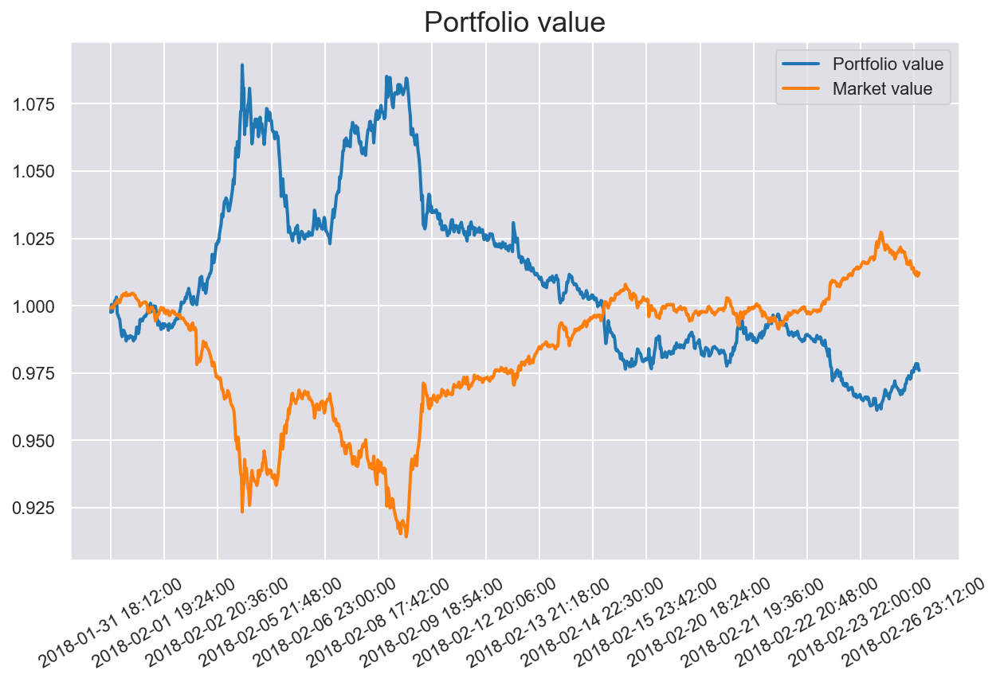

In [335]:
env_Feb = PortfolioEnv(history_Feb, abbreviation, steps=history_Feb.shape[1]-40, window_length=window_length,
                   start_idx=data['Feb'].date_index.iloc[0])
test_model(env_Feb, ddpg_model)

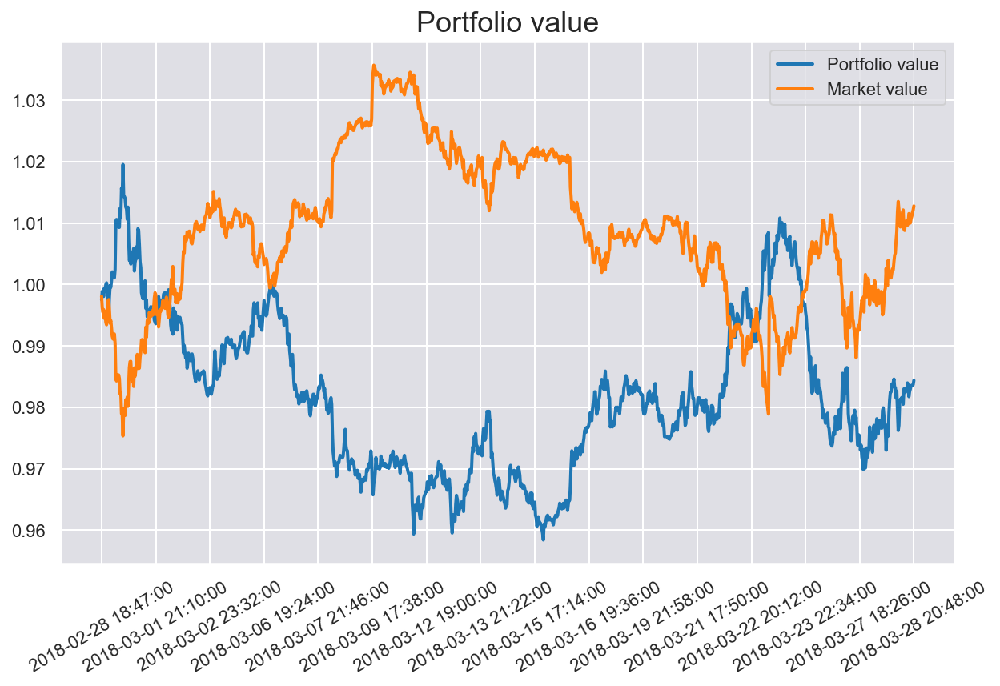

In [336]:
env_Mar = PortfolioEnv(history_Mar, abbreviation, steps=history_Mar.shape[1]-200, window_length=window_length,
                   start_idx=data['Mar'].date_index.iloc[0])
test_model(env_Mar, ddpg_model)

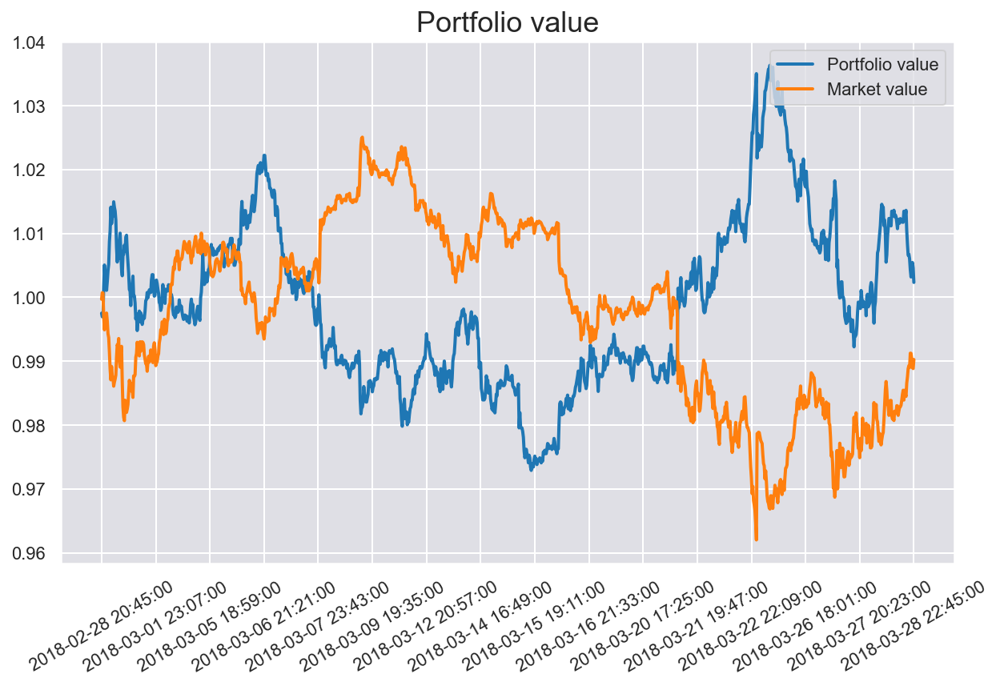

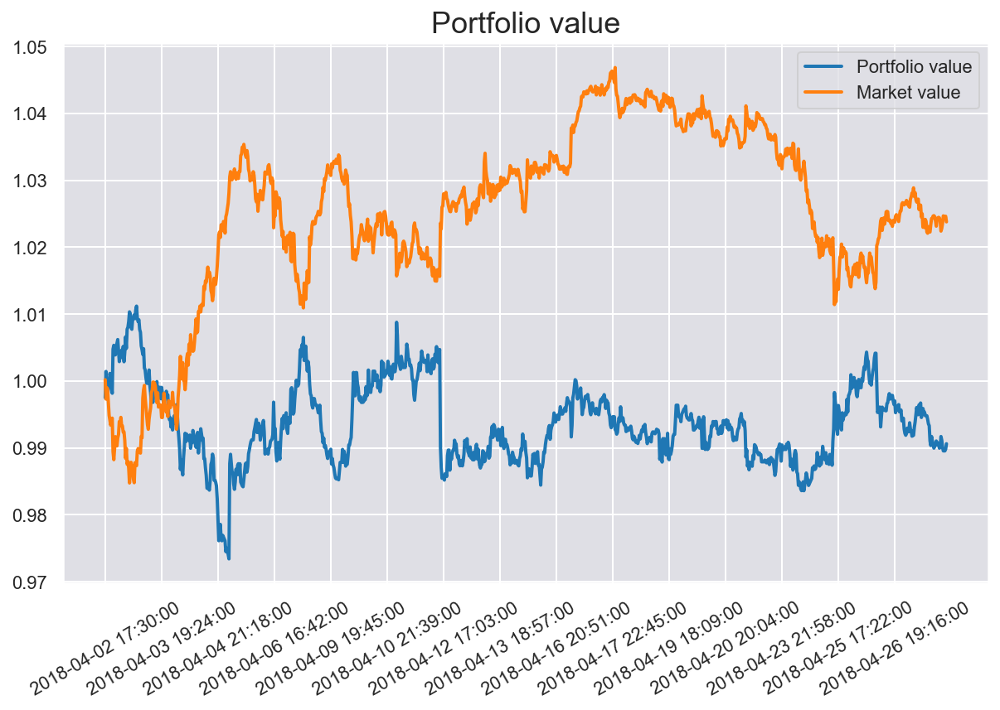

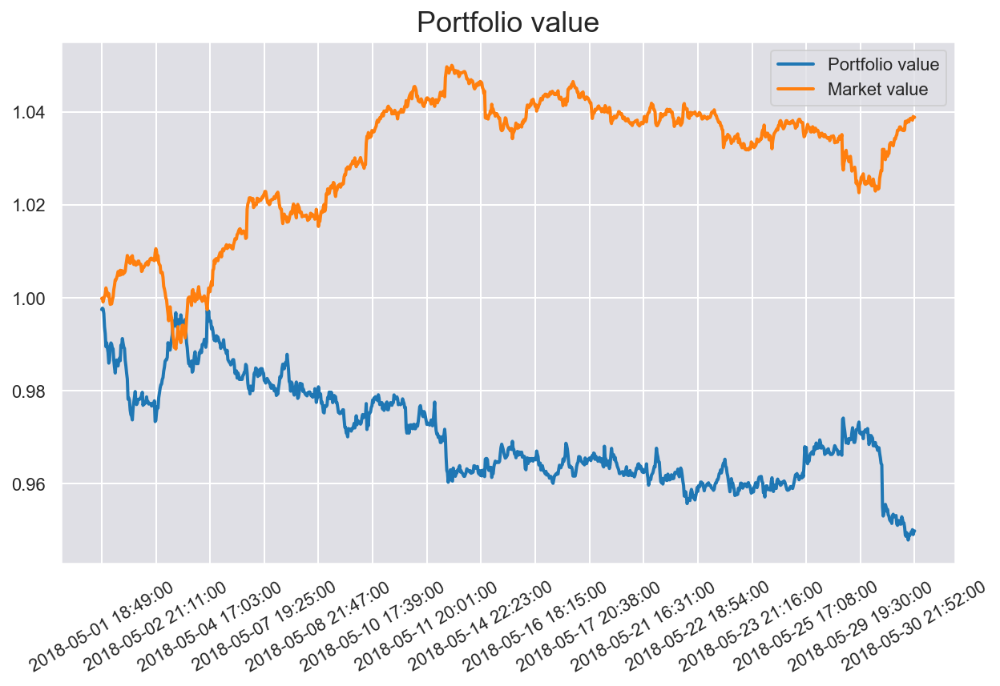

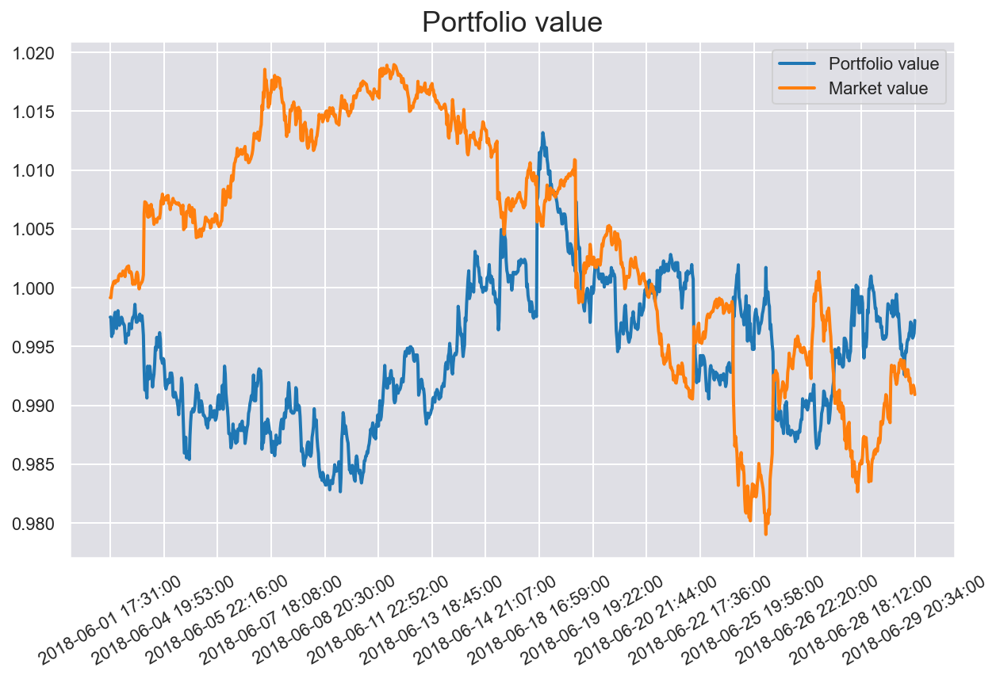

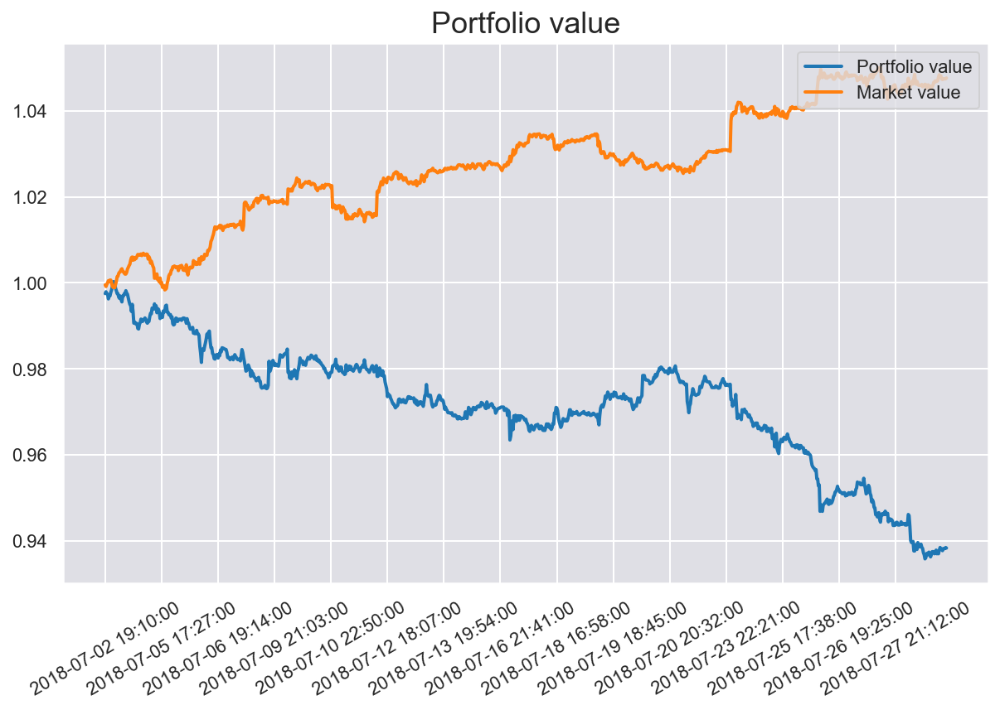

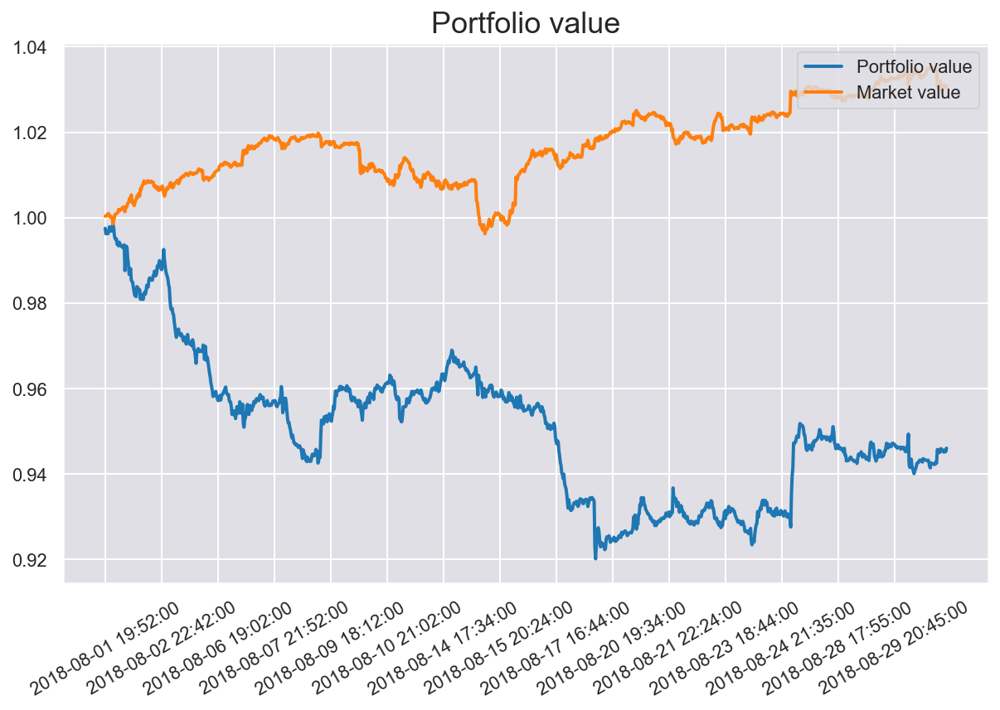

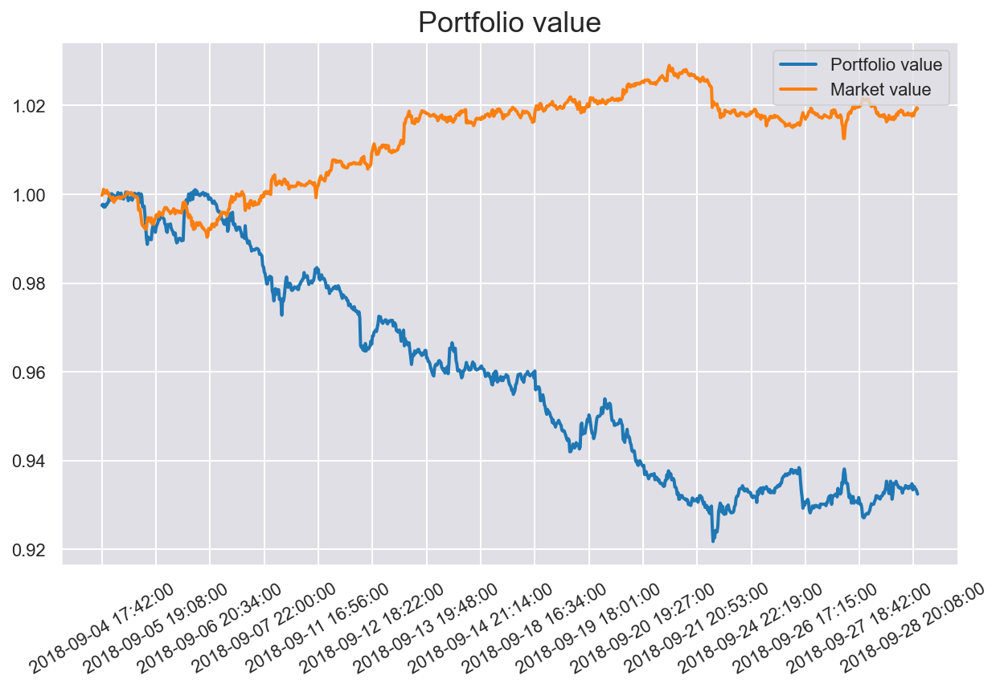

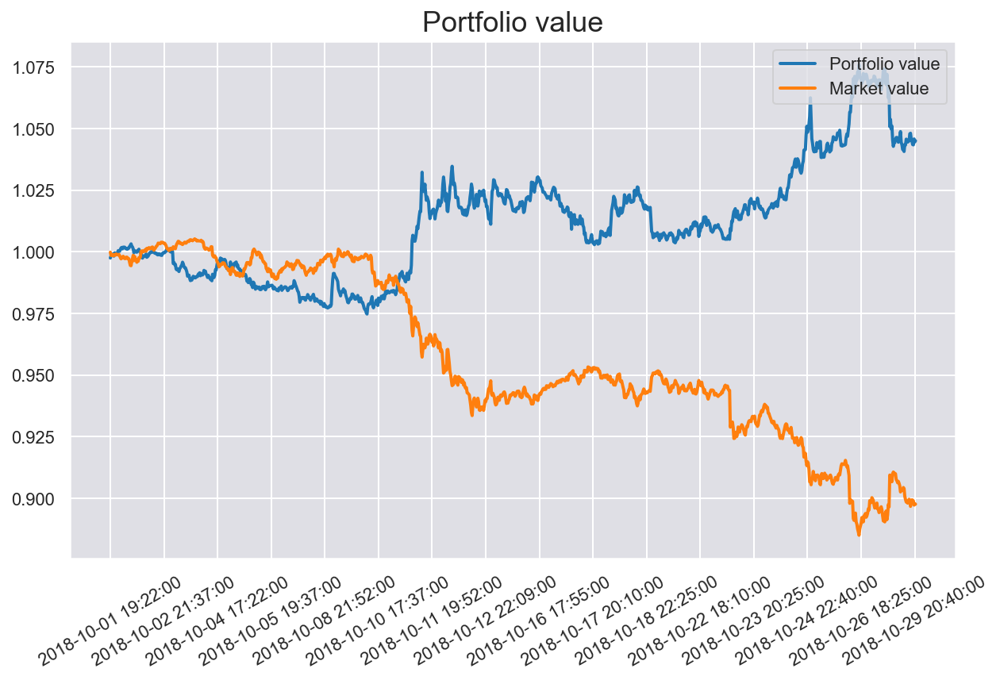

In [337]:
env_Mar = PortfolioEnv(history_Mar, abbreviation, steps=history_Mar.shape[1]-200, window_length=window_length,
                   start_idx=data['Mar'].date_index.iloc[0])
test_model(env_Mar, ddpg_model)
env_Apr = PortfolioEnv(history_Apr, abbreviation, steps=history_Apr.shape[1]-200, window_length=window_length,
                   start_idx=data['Apr'].date_index.iloc[0])
test_model(env_Apr, ddpg_model)
env_May = PortfolioEnv(history_May, abbreviation, steps=history_May.shape[1]-200, window_length=window_length,
                   start_idx=data['May'].date_index.iloc[0])
test_model(env_May, ddpg_model)
env_Jun = PortfolioEnv(history_Jun, abbreviation, steps=history_Jun.shape[1]-200, window_length=window_length,
                   start_idx=data['Jun'].date_index.iloc[0])
test_model(env_Jun, ddpg_model)
env_Jul = PortfolioEnv(history_Jul, abbreviation, steps=history_Jul.shape[1]-200, window_length=window_length,
                   start_idx=data['Jul'].date_index.iloc[0])
test_model(env_Jul, ddpg_model)
env_Aug = PortfolioEnv(history_Aug, abbreviation, steps=history_Aug.shape[1]-200, window_length=window_length,
                   start_idx=data['Aug'].date_index.iloc[0])
test_model(env_Aug, ddpg_model)
env_Sep = PortfolioEnv(history_Sep, abbreviation, steps=history_Sep.shape[1]-200, window_length=window_length,
                   start_idx=data['Sep'].date_index.iloc[0])
test_model(env_Sep, ddpg_model)
env_Oct = PortfolioEnv(history_Oct, abbreviation, steps=history_Oct.shape[1]-200, window_length=window_length,
                   start_idx=data['Oct'].date_index.iloc[0])
test_model(env_Oct, ddpg_model)

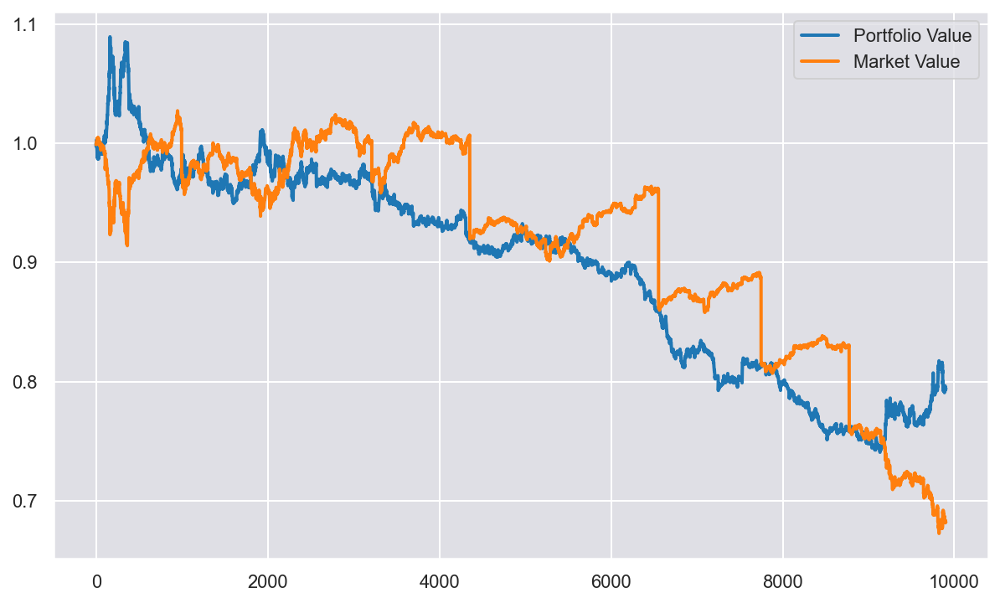

0.7939525717425391
0.6819888005896585


In [340]:
ls = []
ls2 = []
base = 1
base2 = 1
for j in [env_Feb.infos, env_Mar.infos, env_Apr.infos, env_May.infos, env_Jun.infos, env_Jul.infos, env_Aug.infos, env_Sep.infos, env_Oct.infos]:
    for i in range(len(j)):
        ls.append(base * j[i]['portfolio_value'])
        ls2.append(base * j[i]['market_value'])
    base = ls[-1] 
    base2 = ls2[-1]

plt.plot(range(len(ls)),ls)
plt.plot(range(len(ls)),ls2)
plt.legend(['Portfolio Value','Market Value'])
plt.show()

print(ls[-1])
print(ls2[-1])

# Base: Batch Size 128, eps 2000, Tau 0.001,Rev 1.146, MV 0.915

# Batch Size 128, eps 1000, Rev 0.981, MV 0.919
# Batch Size 128, eps 1500, Rev 1.012, MV 0.922
# Batch Size 128, eps 2000, Rev 1.146, MV 0.915

# Tau 0.005 Rev 1.078
# Tau 0.0002 Rev 0.971

# Batch Size 64 Rev 0.901 MV 0.897
# Batch Size 256 Rev 0.878

# gamma 0.98 Rev 1.158
# gamma 0.96 Rev 1.151

# LR 0.01 Rev 0.98

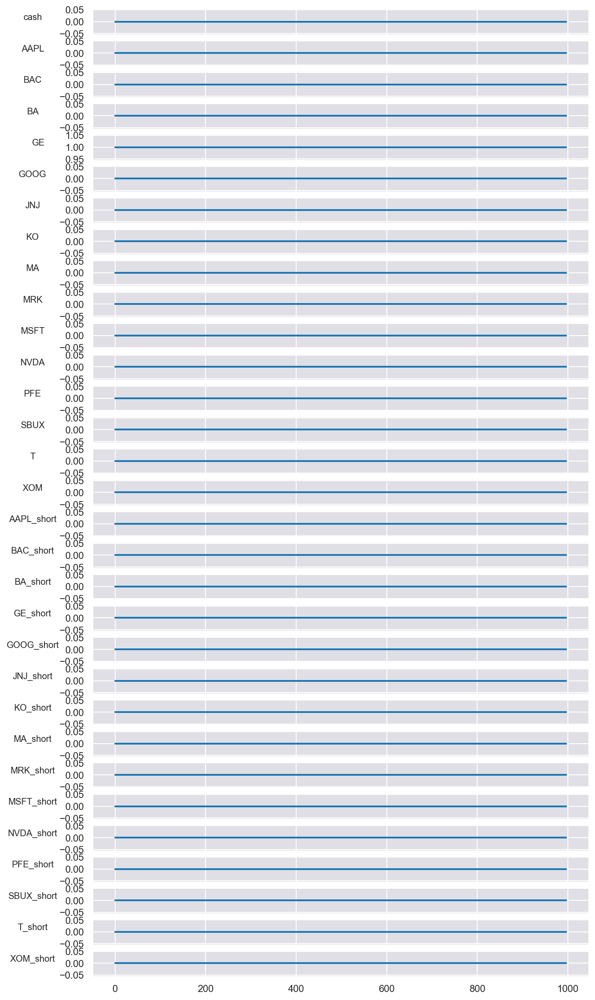

In [228]:
def plot_weights(env_infos):
    weights_change = np.empty((31,len(env_infos)))
    for i in range(len(env_infos)):
        weights_change[:, i] = env_infos[i]['weights']
    long_position = list(abbreviation.iloc[:, 0])
    short_position = []
    for i in long_position:
        short_position.append(i + '_short')
    ylabel = ['cash'] + long_position + short_position
    plt.figure(figsize=(10,20))
    for i in range(31):
        plt.subplot(31, 1, i+1)
        plt.plot(np.round(weights_change[i, :], decimals=2))
        h = plt.ylabel(ylabel[i], fontsize = 10, labelpad=30)
        h.set_rotation(0)
plot_weights(env_Feb.infos)

Build model from scratch
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
1500
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 0, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field ty

c:\users\lenovo\appdata\local\programs\python\python39\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


Episode: 2, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 3, Reward: 1.00, Qmax: 0.0001
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 4, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0

Episode: 25, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 26, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 27, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.

Episode: 48, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 49, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 50, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0

Episode: 71, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 72, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 73, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 94, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 95, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 96, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0

Episode: 116, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 117, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 118, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03

Episode: 139, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 140, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 141, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 162, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 163, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 164, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 185, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 186, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 187, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 207, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 208, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 209, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 230, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 231, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 232, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 253, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 254, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 255, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 276, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 277, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 278, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 299, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 300, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 

Episode: 321, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 322, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 323, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 344, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 345, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 346, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 367, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 368, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 369, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 390, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 391, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 392, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 412, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 413, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 414, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 435, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 436, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 437, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 

Episode: 458, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.03]
Episode: 459, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
Episode: 460, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 

Episode: 481, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
Episode: 482, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
Episode: 483, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 

Episode: 503, Reward: 1.00, Qmax: 0.0000
[0.03 0.02 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.02 0.04 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.02 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.02 0.04 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
Episode: 504, Reward: 1.00, Qmax: 0.0000
[0.03 0.02 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.02 0.04 0.03 0.04 0.03 0.04 0.02 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.02 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.02 0.04 0.03 0.04 0.03 0.04 0.02 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
Episode: 505, Reward: 1.00, Qmax: 0.0000
[0.03 0.02 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.02 0.04 0.03 0.04 0.03 0.04 0.02 0.03 0.03 0.04 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.02 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 

Episode: 526, Reward: 1.00, Qmax: 0.0000
[0.03 0.02 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.02 0.04 0.03 0.04 0.03
 0.03 0.03 0.02 0.04 0.02 0.04 0.03 0.04 0.02 0.02 0.04 0.04 0.03 0.04
 0.02 0.03 0.04]
[0.03 0.02 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.02 0.04 0.03 0.04 0.03
 0.03 0.03 0.02 0.04 0.02 0.04 0.03 0.04 0.02 0.02 0.04 0.04 0.03 0.04
 0.02 0.03 0.04]
Episode: 527, Reward: 1.00, Qmax: 0.0000
[0.03 0.02 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.02 0.04 0.03 0.04 0.03
 0.03 0.03 0.02 0.04 0.03 0.04 0.03 0.04 0.02 0.02 0.04 0.04 0.03 0.04
 0.02 0.03 0.04]
[0.03 0.02 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.02 0.04 0.03 0.04 0.03 0.04 0.02 0.02 0.04 0.04 0.03 0.04
 0.03 0.03 0.04]
Episode: 528, Reward: 1.00, Qmax: 0.0000
[0.03 0.02 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.02 0.04 0.03 0.04 0.03
 0.03 0.03 0.02 0.04 0.02 0.04 0.03 0.04 0.02 0.02 0.04 0.04 0.03 0.04
 0.02 0.03 0.04]
[0.03 0.02 0.04 0.03 0.04 0.04 0.03 0.03 0.04 0.02 0.04 0.03 0.04 0.03
 0.03 0.03 

Episode: 549, Reward: 1.00, Qmax: 0.0000
[0.03 0.01 0.05 0.02 0.05 0.04 0.03 0.02 0.05 0.02 0.06 0.03 0.04 0.03
 0.03 0.02 0.01 0.04 0.02 0.04 0.03 0.04 0.01 0.02 0.04 0.05 0.02 0.05
 0.02 0.02 0.05]
[0.03 0.01 0.05 0.02 0.05 0.05 0.03 0.02 0.05 0.02 0.06 0.02 0.04 0.03
 0.03 0.02 0.01 0.04 0.02 0.04 0.03 0.04 0.01 0.02 0.04 0.05 0.02 0.05
 0.02 0.02 0.05]
Episode: 550, Reward: 1.00, Qmax: 0.0000
[0.03 0.01 0.05 0.02 0.05 0.04 0.03 0.02 0.05 0.02 0.06 0.03 0.04 0.03
 0.03 0.02 0.01 0.04 0.02 0.04 0.03 0.04 0.01 0.02 0.04 0.05 0.02 0.05
 0.02 0.02 0.05]
[0.03 0.01 0.05 0.03 0.05 0.04 0.03 0.02 0.04 0.02 0.06 0.03 0.04 0.03
 0.03 0.02 0.01 0.04 0.02 0.04 0.03 0.04 0.02 0.02 0.04 0.04 0.03 0.05
 0.02 0.02 0.05]
Episode: 551, Reward: 1.00, Qmax: 0.0000
[0.03 0.01 0.05 0.02 0.05 0.05 0.03 0.02 0.05 0.02 0.06 0.02 0.04 0.03
 0.03 0.02 0.01 0.04 0.02 0.04 0.03 0.04 0.01 0.02 0.04 0.05 0.02 0.05
 0.02 0.02 0.05]
[0.03 0.01 0.05 0.02 0.05 0.05 0.03 0.02 0.05 0.02 0.06 0.02 0.04 0.03
 0.03 0.02 

Episode: 572, Reward: 1.00, Qmax: 0.0000
[0.02 0.   0.07 0.01 0.07 0.06 0.02 0.01 0.06 0.01 0.09 0.01 0.05 0.02
 0.02 0.01 0.01 0.04 0.01 0.06 0.02 0.05 0.01 0.01 0.03 0.05 0.02 0.07
 0.01 0.01 0.06]
[0.03 0.01 0.06 0.02 0.06 0.06 0.02 0.01 0.06 0.01 0.09 0.02 0.05 0.02
 0.03 0.01 0.01 0.04 0.01 0.05 0.02 0.05 0.01 0.01 0.03 0.05 0.02 0.07
 0.01 0.01 0.06]
Episode: 573, Reward: 1.00, Qmax: 0.0000
[0.02 0.   0.07 0.01 0.07 0.06 0.02 0.01 0.07 0.01 0.1  0.01 0.05 0.02
 0.02 0.01 0.   0.04 0.01 0.06 0.02 0.05 0.   0.01 0.03 0.05 0.02 0.08
 0.01 0.01 0.06]
[0.02 0.   0.07 0.01 0.07 0.06 0.02 0.01 0.06 0.01 0.09 0.01 0.05 0.02
 0.02 0.01 0.01 0.04 0.01 0.06 0.02 0.05 0.01 0.01 0.03 0.05 0.02 0.07
 0.01 0.01 0.06]
Episode: 574, Reward: 1.00, Qmax: 0.0000
[0.02 0.   0.07 0.01 0.07 0.06 0.02 0.01 0.07 0.01 0.1  0.01 0.05 0.02
 0.02 0.01 0.   0.03 0.01 0.06 0.02 0.05 0.   0.01 0.03 0.05 0.01 0.08
 0.01 0.01 0.06]
[0.02 0.   0.06 0.01 0.07 0.06 0.02 0.01 0.06 0.01 0.09 0.01 0.05 0.02
 0.02 0.01 

Episode: 595, Reward: 1.00, Qmax: 0.0000
[0.01 0.   0.07 0.   0.1  0.07 0.01 0.   0.09 0.   0.2  0.   0.05 0.01
 0.01 0.   0.   0.02 0.   0.07 0.01 0.04 0.   0.   0.01 0.03 0.   0.11
 0.   0.   0.08]
[0.01 0.   0.07 0.   0.1  0.07 0.01 0.   0.09 0.   0.2  0.   0.05 0.01
 0.01 0.   0.   0.02 0.   0.07 0.01 0.04 0.   0.   0.01 0.03 0.   0.12
 0.   0.   0.08]
Episode: 596, Reward: 1.00, Qmax: 0.0000
[0.01 0.   0.07 0.   0.11 0.07 0.01 0.   0.09 0.   0.21 0.   0.04 0.01
 0.01 0.   0.   0.02 0.   0.08 0.01 0.04 0.   0.   0.01 0.02 0.   0.12
 0.   0.   0.08]
[0.01 0.   0.07 0.   0.11 0.07 0.01 0.   0.09 0.   0.21 0.   0.04 0.01
 0.01 0.   0.   0.02 0.   0.08 0.01 0.04 0.   0.   0.01 0.02 0.   0.12
 0.   0.   0.08]
Episode: 597, Reward: 1.00, Qmax: 0.0000
[0.01 0.   0.07 0.   0.11 0.07 0.   0.   0.09 0.   0.22 0.   0.04 0.
 0.01 0.   0.   0.01 0.   0.08 0.   0.04 0.   0.   0.01 0.02 0.   0.12
 0.   0.   0.08]
[0.01 0.   0.07 0.   0.11 0.07 0.01 0.   0.09 0.   0.2  0.   0.05 0.01
 0.01 0.   0.

Episode: 611, Reward: 1.00, Qmax: 0.0000
[2.11e-03 6.19e-05 6.49e-02 8.30e-04 1.36e-01 5.87e-02 1.94e-03 3.96e-04
 9.65e-02 3.04e-04 3.03e-01 7.86e-04 2.58e-02 2.21e-03 2.16e-03 5.14e-04
 7.91e-05 6.92e-03 3.94e-04 8.49e-02 2.12e-03 1.83e-02 1.11e-04 1.74e-04
 4.51e-03 1.12e-02 1.60e-03 8.61e-02 3.62e-04 5.82e-04 8.58e-02]
[2.04e-03 5.82e-05 6.46e-02 7.97e-04 1.37e-01 5.84e-02 1.88e-03 3.78e-04
 9.64e-02 2.89e-04 3.06e-01 7.54e-04 2.55e-02 2.13e-03 2.09e-03 4.91e-04
 7.45e-05 6.76e-03 3.76e-04 8.48e-02 2.05e-03 1.80e-02 1.05e-04 1.65e-04
 4.39e-03 1.09e-02 1.54e-03 8.59e-02 3.45e-04 5.57e-04 8.57e-02]
Episode: 612, Reward: 1.00, Qmax: 0.0000
[2.04e-03 5.94e-05 6.47e-02 8.01e-04 1.39e-01 5.82e-02 1.87e-03 3.82e-04
 9.78e-02 2.93e-04 3.06e-01 7.58e-04 2.49e-02 2.14e-03 2.08e-03 4.96e-04
 7.60e-05 6.69e-03 3.80e-04 8.49e-02 2.05e-03 1.76e-02 1.07e-04 1.67e-04
 4.33e-03 1.07e-02 1.54e-03 8.36e-02 3.49e-04 5.60e-04 8.56e-02]
[1.89e-03 5.18e-05 6.41e-02 7.33e-04 1.39e-01 5.75e-02 1.73e-03 3.

Episode: 625, Reward: 1.00, Qmax: 0.0000
[1.07e-03 2.43e-05 5.95e-02 4.04e-04 1.73e-01 5.46e-02 9.53e-04 1.84e-04
 1.05e-01 1.38e-04 3.72e-01 3.77e-04 1.37e-02 1.17e-03 1.09e-03 2.44e-04
 3.18e-05 3.70e-03 1.82e-04 6.93e-02 1.11e-03 9.48e-03 4.61e-05 7.46e-05
 2.23e-03 5.94e-03 7.81e-04 5.18e-02 1.67e-04 2.70e-04 7.09e-02]
[9.72e-04 2.07e-05 5.86e-02 3.62e-04 1.74e-01 5.37e-02 8.68e-04 1.63e-04
 1.05e-01 1.21e-04 3.79e-01 3.38e-04 1.31e-02 1.07e-03 9.93e-04 2.16e-04
 2.72e-05 3.46e-03 1.60e-04 6.84e-02 1.01e-03 9.02e-03 3.97e-05 6.48e-05
 2.06e-03 5.60e-03 7.09e-04 5.08e-02 1.47e-04 2.41e-04 7.00e-02]
Episode: 626, Reward: 1.00, Qmax: 0.0000
[8.55e-04 1.68e-05 5.71e-02 3.13e-04 1.76e-01 5.30e-02 7.60e-04 1.38e-04
 1.04e-01 1.02e-04 3.92e-01 2.91e-04 1.20e-02 9.45e-04 8.72e-04 1.85e-04
 2.22e-05 3.10e-03 1.36e-04 6.57e-02 8.92e-04 8.20e-03 3.27e-05 5.39e-05
 1.83e-03 5.07e-03 6.19e-04 4.78e-02 1.25e-04 2.06e-04 6.71e-02]
[1.07e-03 2.52e-05 5.95e-02 4.11e-04 1.75e-01 5.54e-02 9.60e-04 1.

Episode: 639, Reward: 1.00, Qmax: 0.0000
[6.62e-04 1.34e-05 4.82e-02 2.47e-04 1.90e-01 6.09e-02 5.80e-04 1.10e-04
 1.01e-01 8.17e-05 4.53e-01 2.30e-04 7.88e-03 7.40e-04 6.75e-04 1.48e-04
 1.77e-05 2.26e-03 1.08e-04 4.64e-02 7.09e-04 5.53e-03 2.62e-05 4.30e-05
 1.36e-03 3.60e-03 4.73e-04 3.18e-02 9.97e-05 1.62e-04 4.31e-02]
[4.76e-04 7.70e-06 4.47e-02 1.69e-04 1.90e-01 5.71e-02 4.14e-04 7.18e-05
 9.77e-02 5.23e-05 4.79e-01 1.56e-04 6.56e-03 5.37e-04 4.86e-04 9.77e-05
 1.03e-05 1.75e-03 7.03e-05 4.29e-02 5.15e-04 4.50e-03 1.56e-05 2.64e-05
 1.02e-03 2.86e-03 3.35e-04 2.87e-02 6.44e-05 1.08e-04 3.97e-02]
Episode: 640, Reward: 1.00, Qmax: 0.0000
[3.85e-04 5.46e-06 4.14e-02 1.32e-04 1.86e-01 5.58e-02 3.33e-04 5.48e-05
 9.50e-02 3.94e-05 5.03e-01 1.21e-04 5.69e-03 4.35e-04 3.93e-04 7.52e-05
 7.40e-06 1.46e-03 5.35e-05 3.94e-02 4.18e-04 3.88e-03 1.14e-05 1.95e-05
 8.43e-04 2.43e-03 2.68e-04 2.63e-02 4.90e-05 8.29e-05 3.60e-02]
[4.69e-04 7.60e-06 4.35e-02 1.66e-04 1.86e-01 5.80e-02 4.07e-04 7.

Episode: 653, Reward: 1.00, Qmax: 0.0000
[1.81e-04 1.98e-06 2.14e-02 5.87e-05 9.67e-02 6.55e-02 1.52e-04 2.33e-05
 7.22e-02 1.64e-05 6.87e-01 5.36e-05 2.66e-03 2.05e-04 1.85e-04 3.26e-05
 2.74e-06 7.06e-04 2.26e-05 1.83e-02 2.05e-04 1.93e-03 4.34e-06 7.71e-06
 4.15e-04 1.19e-03 1.24e-04 1.53e-02 2.08e-05 3.57e-05 1.52e-02]
[9.29e-05 6.83e-07 1.68e-02 2.74e-05 8.67e-02 5.68e-02 7.72e-05 1.00e-05
 6.32e-02 6.84e-06 7.34e-01 2.47e-05 1.73e-03 1.07e-04 9.53e-05 1.45e-05
 9.74e-07 4.10e-04 9.67e-06 1.42e-02 1.07e-04 1.22e-03 1.61e-06 3.00e-06
 2.30e-04 7.25e-04 6.15e-05 1.17e-02 8.83e-06 1.59e-05 1.16e-02]
Episode: 654, Reward: 1.00, Qmax: 0.0000
[9.54e-05 7.28e-07 1.64e-02 2.84e-05 8.19e-02 5.87e-02 7.94e-05 1.05e-05
 6.14e-02 7.18e-06 7.40e-01 2.57e-05 1.72e-03 1.10e-04 9.79e-05 1.51e-05
 1.04e-06 4.14e-04 1.01e-05 1.37e-02 1.10e-04 1.23e-03 1.70e-06 3.17e-06
 2.34e-04 7.30e-04 6.34e-05 1.15e-02 9.25e-06 1.65e-05 1.11e-02]
[5.31e-05 2.88e-07 1.31e-02 1.45e-05 7.35e-02 5.15e-02 4.36e-05 5.

Episode: 667, Reward: 1.00, Qmax: 0.0000
[1.67e-05 6.00e-08 4.97e-03 4.17e-06 2.68e-02 6.04e-02 1.34e-05 1.33e-06
 2.26e-02 8.57e-07 8.74e-01 3.70e-06 4.21e-04 1.95e-05 1.73e-05 2.02e-06
 9.04e-08 8.67e-05 1.27e-06 3.74e-03 2.04e-05 2.99e-04 1.61e-07 3.30e-07
 4.76e-05 1.65e-04 1.06e-05 4.09e-03 1.15e-06 2.22e-06 2.78e-03]
[1.63e-05 5.79e-08 4.91e-03 4.06e-06 2.66e-02 6.01e-02 1.31e-05 1.29e-06
 2.24e-02 8.33e-07 8.74e-01 3.60e-06 4.15e-04 1.90e-05 1.69e-05 1.97e-06
 8.73e-08 8.51e-05 1.23e-06 3.70e-03 1.99e-05 2.94e-04 1.56e-07 3.20e-07
 4.66e-05 1.62e-04 1.04e-05 4.05e-03 1.12e-06 2.16e-06 2.75e-03]
Episode: 668, Reward: 1.00, Qmax: 0.0000
[3.43e-05 1.83e-07 6.76e-03 9.43e-06 3.23e-02 7.32e-02 2.80e-05 3.26e-06
 2.74e-02 2.17e-06 8.44e-01 8.44e-06 6.86e-04 3.96e-05 3.54e-05 4.82e-06
 2.67e-07 1.58e-04 3.12e-06 5.18e-03 4.12e-05 5.00e-04 4.58e-07 8.93e-07
 9.08e-05 2.88e-04 2.25e-05 5.69e-03 2.86e-06 5.26e-06 3.91e-03]
[1.59e-05 5.61e-08 4.78e-03 3.95e-06 2.58e-02 6.24e-02 1.28e-05 1.

Episode: 681, Reward: 1.00, Qmax: 0.0000
[1.18e-04 1.20e-06 1.13e-02 3.81e-05 4.37e-02 1.69e-01 9.87e-05 1.50e-05
 3.46e-02 1.05e-05 7.11e-01 3.46e-05 1.57e-03 1.34e-04 1.22e-04 2.11e-05
 1.68e-06 4.44e-04 1.44e-05 8.57e-03 1.39e-04 1.20e-03 2.68e-06 4.83e-06
 2.77e-04 7.43e-04 8.13e-05 1.02e-02 1.34e-05 2.29e-05 6.56e-03]
[8.99e-05 7.79e-07 1.00e-02 2.78e-05 4.06e-02 1.65e-01 7.45e-05 1.06e-05
 3.19e-02 7.35e-06 7.26e-01 2.52e-05 1.30e-03 1.02e-04 9.26e-05 1.51e-05
 1.10e-06 3.53e-04 1.02e-05 7.54e-03 1.06e-04 9.87e-04 1.79e-06 3.29e-06
 2.17e-04 6.00e-04 6.10e-05 9.00e-03 9.45e-06 1.64e-05 5.71e-03]
Episode: 682, Reward: 1.00, Qmax: 0.0000
[3.08e-05 1.46e-07 6.23e-03 8.24e-06 3.02e-02 1.57e-01 2.49e-05 2.78e-06
 2.30e-02 1.83e-06 7.68e-01 7.35e-06 6.29e-04 3.55e-05 3.18e-05 4.15e-06
 2.15e-07 1.44e-04 2.66e-06 4.53e-03 3.75e-05 4.59e-04 3.73e-07 7.40e-07
 8.33e-05 2.62e-04 2.00e-05 5.58e-03 2.44e-06 4.53e-06 3.30e-03]
[2.98e-05 1.39e-07 6.14e-03 7.94e-06 2.99e-02 1.57e-01 2.41e-05 2.

Episode: 695, Reward: 1.00, Qmax: 0.0000
[1.01e-04 8.70e-07 9.91e-03 3.14e-05 3.83e-02 4.17e-01 8.37e-05 1.20e-05
 2.84e-02 8.30e-06 4.78e-01 2.84e-05 1.41e-03 1.15e-04 1.05e-04 1.72e-05
 1.23e-06 3.92e-04 1.15e-05 7.47e-03 1.22e-04 1.10e-03 2.01e-06 3.70e-06
 2.46e-04 6.62e-04 6.95e-05 1.02e-02 1.07e-05 1.85e-05 5.56e-03]
[9.31e-05 7.62e-07 9.55e-03 2.86e-05 3.75e-02 4.18e-01 7.68e-05 1.08e-05
 2.77e-02 7.44e-06 4.80e-01 2.58e-05 1.33e-03 1.06e-04 9.61e-05 1.55e-05
 1.08e-06 3.65e-04 1.04e-05 7.18e-03 1.12e-04 1.04e-03 1.78e-06 3.29e-06
 2.29e-04 6.20e-04 6.36e-05 9.88e-03 9.61e-06 1.67e-05 5.33e-03]
Episode: 696, Reward: 1.00, Qmax: 0.0000
[5.87e-05 3.68e-07 7.69e-03 1.69e-05 3.23e-02 4.51e-01 4.79e-05 6.07e-06
 2.34e-02 4.08e-06 4.65e-01 1.52e-05 9.69e-04 6.70e-05 6.07e-05 8.86e-06
 5.33e-07 2.48e-04 5.79e-06 5.71e-03 7.18e-05 7.48e-04 8.99e-07 1.72e-06
 1.52e-04 4.34e-04 3.94e-05 8.07e-03 5.35e-06 9.58e-06 4.16e-03]
[5.50e-05 3.32e-07 7.47e-03 1.57e-05 3.18e-02 4.52e-01 4.49e-05 5.

Episode: 708, Reward: 1.00, Qmax: 0.0000
[5.41e-06 1.12e-08 1.46e-03 1.21e-06 7.61e-03 8.33e-01 4.22e-06 3.52e-07
 4.93e-03 2.16e-07 1.49e-01 1.05e-06 1.49e-04 6.35e-06 5.65e-06 5.59e-07
 1.78e-08 3.03e-05 3.31e-07 1.14e-03 7.26e-06 1.18e-04 3.37e-08 7.46e-08
 1.76e-05 5.91e-05 3.47e-06 1.99e-03 3.03e-07 6.00e-07 7.52e-04]
[4.64e-06 8.89e-09 1.35e-03 1.02e-06 7.19e-03 8.37e-01 3.61e-06 2.91e-07
 4.63e-03 1.78e-07 1.46e-01 8.80e-07 1.34e-04 5.47e-06 4.85e-06 4.66e-07
 1.41e-08 2.66e-05 2.74e-07 1.05e-03 6.26e-06 1.05e-04 2.71e-08 6.05e-08
 1.53e-05 5.24e-05 2.97e-06 1.85e-03 2.50e-07 5.01e-07 6.89e-04]
Episode: 709, Reward: 1.00, Qmax: 0.0000
[8.88e-06 2.46e-08 1.79e-03 2.13e-06 8.57e-03 8.36e-01 7.00e-06 6.56e-07
 5.63e-03 4.12e-07 1.42e-01 1.86e-06 2.08e-04 1.03e-05 9.25e-06 1.02e-06
 3.81e-08 4.57e-05 6.19e-07 1.42e-03 1.17e-05 1.67e-04 7.02e-08 1.50e-07
 2.73e-05 8.64e-05 5.82e-06 2.44e-03 5.69e-07 1.09e-06 9.60e-04]
[1.05e-05 3.20e-08 1.95e-03 2.58e-06 9.14e-03 8.31e-01 8.34e-06 8.

Episode: 722, Reward: 1.00, Qmax: 0.0000
[2.30e-07 1.49e-10 1.25e-04 3.94e-08 8.62e-04 9.79e-01 1.71e-07 9.20e-09
 4.53e-04 5.14e-09 1.93e-02 3.29e-08 1.08e-05 2.78e-07 2.42e-07 1.60e-08
 2.59e-10 1.74e-06 8.54e-09 1.10e-04 3.40e-07 8.71e-06 5.57e-10 1.44e-09
 9.45e-07 3.76e-06 1.41e-07 2.05e-04 7.72e-09 1.70e-08 6.68e-05]
[1.80e-07 1.04e-10 1.08e-04 3.01e-08 7.68e-04 9.80e-01 1.33e-07 6.86e-09
 4.00e-04 3.79e-09 1.81e-02 2.50e-08 8.97e-06 2.19e-07 1.89e-07 1.20e-08
 1.82e-10 1.40e-06 6.36e-09 9.47e-05 2.68e-07 7.21e-06 3.97e-10 1.04e-09
 7.57e-07 3.07e-06 1.10e-07 1.78e-04 5.74e-09 1.28e-08 5.71e-05]
Episode: 723, Reward: 1.00, Qmax: 0.0000
[6.73e-07 7.50e-10 2.26e-04 1.31e-07 1.35e-03 9.74e-01 5.11e-07 3.41e-08
 7.39e-04 1.99e-08 2.34e-02 1.11e-07 2.36e-05 8.03e-07 7.06e-07 5.69e-08
 1.25e-09 4.37e-06 3.19e-08 2.02e-04 9.65e-07 1.94e-05 2.54e-09 6.11e-09
 2.49e-06 8.92e-06 4.28e-07 3.58e-04 2.90e-08 6.04e-08 1.27e-04]
[2.68e-07 1.93e-10 1.32e-04 4.72e-08 8.84e-04 9.80e-01 2.00e-07 1.

Episode: 736, Reward: 1.00, Qmax: 0.0000
[2.99e-09 3.28e-13 6.40e-06 3.39e-10 6.93e-05 9.98e-01 2.06e-09 5.60e-11
 2.89e-05 2.71e-11 2.35e-03 2.68e-10 3.44e-07 3.81e-09 3.18e-09 1.12e-10
 6.52e-13 3.66e-08 5.10e-11 5.91e-06 5.01e-09 2.70e-07 1.70e-12 5.51e-12
 1.74e-08 9.41e-08 1.68e-09 1.22e-05 4.51e-11 1.19e-10 3.21e-06]
[2.23e-09 2.14e-13 5.37e-06 2.46e-10 6.02e-05 9.98e-01 1.54e-09 3.95e-11
 2.48e-05 1.89e-11 2.15e-03 1.93e-10 2.76e-07 2.86e-09 2.38e-09 7.95e-11
 4.30e-13 2.84e-08 3.59e-11 4.95e-06 3.78e-09 2.16e-07 1.14e-12 3.75e-12
 1.34e-08 7.41e-08 1.24e-09 1.03e-05 3.17e-11 8.45e-11 2.66e-06]
Episode: 737, Reward: 1.00, Qmax: 0.0000
[1.90e-09 1.71e-13 4.79e-06 2.06e-10 5.45e-05 9.98e-01 1.30e-09 3.27e-11
 2.23e-05 1.56e-11 1.97e-03 1.62e-10 2.43e-07 2.44e-09 2.03e-09 6.62e-11
 3.46e-13 2.46e-08 2.97e-11 4.43e-06 3.23e-09 1.90e-07 9.20e-13 3.06e-12
 1.15e-08 6.45e-08 1.06e-09 9.24e-06 2.63e-11 7.04e-11 2.37e-06]
[5.49e-09 8.09e-13 9.13e-06 6.69e-10 9.14e-05 9.97e-01 3.84e-09 1.

Episode: 750, Reward: 1.00, Qmax: 0.0000
[7.05e-10 4.42e-14 2.31e-06 7.03e-11 2.88e-05 9.99e-01 4.77e-10 1.04e-11
 1.11e-05 4.82e-12 1.06e-03 5.45e-11 1.08e-07 9.15e-10 7.53e-10 2.17e-11
 9.17e-14 1.01e-08 9.42e-12 2.18e-06 1.23e-09 8.39e-08 2.54e-13 8.85e-13
 4.60e-09 2.73e-08 3.86e-10 4.60e-06 8.29e-12 2.30e-11 1.14e-06]
[8.45e-10 5.76e-14 2.59e-06 8.61e-11 3.14e-05 9.99e-01 5.74e-10 1.30e-11
 1.23e-05 6.03e-12 1.12e-03 6.68e-11 1.24e-07 1.10e-09 9.03e-10 2.68e-11
 1.19e-13 1.18e-08 1.17e-11 2.44e-06 1.47e-09 9.65e-08 3.26e-13 1.13e-12
 5.42e-09 3.17e-08 4.66e-10 5.11e-06 1.03e-11 2.84e-11 1.28e-06]
Episode: 751, Reward: 1.00, Qmax: 0.0000
[4.28e-09 6.12e-13 6.99e-06 5.19e-10 6.99e-05 9.98e-01 2.99e-09 9.04e-11
 2.93e-05 4.47e-11 1.87e-03 4.11e-10 4.24e-07 5.42e-09 4.55e-09 1.77e-10
 1.19e-12 4.86e-08 8.25e-11 6.62e-06 7.10e-09 3.38e-07 3.03e-12 9.50e-12
 2.37e-08 1.21e-07 2.46e-09 1.31e-05 7.34e-11 1.87e-10 3.67e-06]
[5.89e-08 2.78e-11 3.52e-05 9.45e-09 2.57e-04 9.95e-01 4.31e-08 2.

Episode: 764, Reward: 1.00, Qmax: 0.0000
[6.32e-09 1.11e-12 8.58e-06 8.05e-10 8.10e-05 9.98e-01 4.45e-09 1.46e-10
 3.45e-05 7.35e-11 1.93e-03 6.42e-10 5.61e-07 7.97e-09 6.71e-09 2.81e-10
 2.14e-12 6.78e-08 1.34e-10 8.17e-06 1.04e-08 4.50e-07 5.31e-12 1.62e-11
 3.37e-08 1.65e-07 3.68e-09 1.59e-05 1.19e-10 2.97e-10 4.60e-06]
[7.35e-10 4.83e-14 2.28e-06 7.42e-11 2.79e-05 9.99e-01 4.98e-10 1.11e-11
 1.08e-05 5.15e-12 9.56e-04 5.76e-11 1.09e-07 9.53e-10 7.85e-10 2.30e-11
 1.00e-13 1.03e-08 1.00e-11 2.16e-06 1.28e-09 8.53e-08 2.75e-13 9.55e-13
 4.75e-09 2.79e-08 4.04e-10 4.53e-06 8.84e-12 2.44e-11 1.14e-06]
Episode: 765, Reward: 1.00, Qmax: 0.0000
[1.24e-09 1.05e-13 3.13e-06 1.33e-10 3.59e-05 9.99e-01 8.50e-10 2.09e-11
 1.42e-05 9.91e-12 1.12e-03 1.04e-10 1.62e-07 1.60e-09 1.33e-09 4.26e-11
 2.13e-13 1.63e-08 1.90e-11 2.98e-06 2.14e-09 1.27e-07 5.70e-13 1.92e-12
 7.65e-09 4.29e-08 6.95e-10 6.11e-06 1.68e-11 4.50e-11 1.59e-06]
[8.82e-10 6.36e-14 2.54e-06 9.11e-11 3.03e-05 9.99e-01 5.99e-10 1.

Episode: 778, Reward: 1.00, Qmax: 0.0000
[3.08e-10 1.39e-14 1.31e-06 2.85e-11 1.76e-05 9.99e-01 2.06e-10 3.97e-12
 6.54e-06 1.79e-12 6.79e-04 2.19e-11 5.57e-08 4.05e-10 3.30e-10 8.46e-12
 2.97e-14 4.81e-09 3.58e-12 1.24e-06 5.53e-10 4.31e-08 8.50e-14 3.10e-13
 2.15e-09 1.35e-08 1.66e-10 2.67e-06 3.13e-12 8.97e-12 6.37e-07]
[4.13e-10 2.13e-14 1.57e-06 3.94e-11 2.04e-05 9.99e-01 2.77e-10 5.63e-12
 7.67e-06 2.56e-12 7.49e-04 3.04e-11 6.97e-08 5.40e-10 4.42e-10 1.19e-11
 4.49e-14 6.22e-09 5.08e-12 1.49e-06 7.34e-10 5.41e-08 1.27e-13 4.54e-13
 2.80e-09 1.72e-08 2.24e-10 3.17e-06 4.45e-12 1.26e-11 7.71e-07]
Episode: 779, Reward: 1.00, Qmax: 0.0000
[1.69e-10 5.79e-15 9.00e-07 1.46e-11 1.30e-05 9.99e-01 1.11e-10 1.93e-12
 4.70e-06 8.48e-13 5.55e-04 1.11e-11 3.52e-08 2.23e-10 1.81e-10 4.19e-12
 1.26e-14 2.84e-09 1.73e-12 8.53e-07 3.07e-10 2.70e-08 3.71e-14 1.40e-13
 1.24e-09 8.18e-09 8.95e-11 1.87e-06 1.51e-12 4.45e-12 4.30e-07]
[3.94e-10 1.99e-14 1.52e-06 3.74e-11 1.99e-05 9.99e-01 2.64e-10 5.

Episode: 792, Reward: 1.00, Qmax: 0.0000
[1.89e-10 6.89e-15 9.58e-07 1.66e-11 1.36e-05 9.99e-01 1.25e-10 2.22e-12
 4.95e-06 9.80e-13 5.62e-04 1.27e-11 3.82e-08 2.49e-10 2.03e-10 4.80e-12
 1.49e-14 3.13e-09 1.99e-12 9.09e-07 3.43e-10 2.94e-08 4.37e-14 1.64e-13
 1.37e-09 8.96e-09 1.01e-10 1.99e-06 1.74e-12 5.09e-12 4.60e-07]
[7.60e-10 5.22e-14 2.26e-06 7.77e-11 2.73e-05 9.99e-01 5.16e-10 1.17e-11
 1.06e-05 5.46e-12 8.92e-04 6.02e-11 1.10e-07 9.86e-10 8.12e-10 2.42e-11
 1.08e-13 1.06e-08 1.06e-11 2.15e-06 1.33e-09 8.63e-08 2.95e-13 1.02e-12
 4.88e-09 2.84e-08 4.20e-10 4.49e-06 9.35e-12 2.56e-11 1.14e-06]
Episode: 793, Reward: 1.00, Qmax: 0.0000
[5.39e-10 3.16e-14 1.83e-06 5.30e-11 2.30e-05 9.99e-01 3.63e-10 7.77e-12
 8.75e-06 3.57e-12 7.94e-04 4.09e-11 8.48e-08 7.01e-10 5.76e-10 1.62e-11
 6.60e-14 7.82e-09 7.02e-12 1.74e-06 9.50e-10 6.61e-08 1.84e-13 6.48e-13
 3.56e-09 2.13e-08 2.95e-10 3.66e-06 6.17e-12 1.72e-11 9.08e-07]
[8.05e-10 5.68e-14 2.34e-06 8.28e-11 2.81e-05 9.99e-01 5.47e-10 1.

Episode: 805, Reward: 1.00, Qmax: 0.0000
[2.87e-10 1.27e-14 1.23e-06 2.64e-11 1.67e-05 9.99e-01 1.91e-10 3.66e-12
 6.17e-06 1.65e-12 6.34e-04 2.02e-11 5.24e-08 3.77e-10 3.07e-10 7.82e-12
 2.71e-14 4.50e-09 3.30e-12 1.17e-06 5.15e-10 4.05e-08 7.78e-14 2.84e-13
 2.00e-09 1.26e-08 1.55e-10 2.52e-06 2.89e-12 8.28e-12 6.01e-07]
[2.04e-09 2.20e-13 4.14e-06 2.32e-10 4.43e-05 9.99e-01 1.41e-09 3.83e-11
 1.79e-05 1.85e-11 1.22e-03 1.82e-10 2.33e-07 2.61e-09 2.17e-09 7.64e-11
 4.39e-13 2.50e-08 3.48e-11 3.95e-06 3.46e-09 1.85e-07 1.15e-12 3.73e-12
 1.19e-08 6.40e-08 1.16e-09 7.94e-06 3.08e-11 8.06e-11 2.15e-06]
Episode: 806, Reward: 1.00, Qmax: 0.0000
[3.87e-09 5.58e-13 6.18e-06 4.71e-10 6.12e-05 9.98e-01 2.70e-09 8.23e-11
 2.55e-05 4.06e-11 1.51e-03 3.73e-10 3.81e-07 4.91e-09 4.11e-09 1.61e-10
 1.09e-12 4.38e-08 7.51e-11 5.89e-06 6.44e-09 3.04e-07 2.76e-12 8.65e-12
 2.14e-08 1.09e-07 2.23e-09 1.16e-05 6.67e-11 1.69e-10 3.27e-06]
[1.78e-10 6.36e-15 9.20e-07 1.56e-11 1.31e-05 9.99e-01 1.18e-10 2.

Episode: 819, Reward: 1.00, Qmax: 0.0000
[6.20e-09 1.11e-12 8.24e-06 7.94e-10 7.72e-05 9.98e-01 4.37e-09 1.45e-10
 3.28e-05 7.28e-11 1.75e-03 6.33e-10 5.44e-07 7.82e-09 6.58e-09 2.78e-10
 2.13e-12 6.61e-08 1.32e-10 7.87e-06 1.02e-08 4.37e-07 5.28e-12 1.61e-11
 3.29e-08 1.61e-07 3.62e-09 1.52e-05 1.18e-10 2.93e-10 4.44e-06]
[2.08e-09 2.26e-13 4.21e-06 2.37e-10 4.48e-05 9.99e-01 1.44e-09 3.91e-11
 1.81e-05 1.89e-11 1.22e-03 1.86e-10 2.37e-07 2.66e-09 2.21e-09 7.80e-11
 4.51e-13 2.55e-08 3.56e-11 4.01e-06 3.52e-09 1.88e-07 1.18e-12 3.83e-12
 1.22e-08 6.52e-08 1.18e-09 8.06e-06 3.15e-11 8.24e-11 2.18e-06]
Episode: 820, Reward: 1.00, Qmax: 0.0000
[4.45e-09 6.86e-13 6.72e-06 5.50e-10 6.54e-05 9.98e-01 3.12e-09 9.74e-11
 2.74e-05 4.84e-11 1.57e-03 4.37e-10 4.23e-07 5.64e-09 4.73e-09 1.89e-10
 1.33e-12 4.95e-08 8.90e-11 6.41e-06 7.38e-09 3.38e-07 3.35e-12 1.04e-11
 2.44e-08 1.22e-07 2.58e-09 1.26e-05 7.92e-11 2.00e-10 3.58e-06]
[1.15e-08 2.75e-12 1.21e-05 1.58e-09 1.05e-04 9.98e-01 8.24e-09 3.

Episode: 833, Reward: 1.00, Qmax: 0.0000
[9.68e-10 7.49e-14 2.61e-06 1.02e-10 3.04e-05 9.99e-01 6.60e-10 1.57e-11
 1.19e-05 7.39e-12 9.32e-04 7.92e-11 1.32e-07 1.25e-09 1.03e-09 3.22e-11
 1.53e-13 1.30e-08 1.43e-11 2.48e-06 1.68e-09 1.04e-07 4.15e-13 1.41e-12
 6.06e-09 3.46e-08 5.39e-10 5.13e-06 1.26e-11 3.40e-11 1.32e-06]
[5.41e-10 3.21e-14 1.82e-06 5.34e-11 2.27e-05 9.99e-01 3.65e-10 7.84e-12
 8.64e-06 3.61e-12 7.65e-04 4.12e-11 8.45e-08 7.04e-10 5.78e-10 1.64e-11
 6.71e-14 7.82e-09 7.09e-12 1.72e-06 9.53e-10 6.59e-08 1.87e-13 6.56e-13
 3.57e-09 2.13e-08 2.97e-10 3.64e-06 6.23e-12 1.73e-11 9.02e-07]
Episode: 834, Reward: 1.00, Qmax: 0.0000
[1.88e-10 6.90e-15 9.44e-07 1.65e-11 1.34e-05 9.99e-01 1.24e-10 2.21e-12
 4.86e-06 9.78e-13 5.37e-04 1.26e-11 3.78e-08 2.48e-10 2.01e-10 4.79e-12
 1.49e-14 3.10e-09 1.99e-12 8.95e-07 3.41e-10 2.91e-08 4.37e-14 1.63e-13
 1.36e-09 8.88e-09 1.00e-10 1.96e-06 1.74e-12 5.07e-12 4.53e-07]
[7.30e-10 4.99e-14 2.18e-06 7.45e-11 2.63e-05 9.99e-01 4.95e-10 1.

Episode: 847, Reward: 1.00, Qmax: 0.0000
[1.18e-09 1.00e-13 2.93e-06 1.27e-10 3.33e-05 9.99e-01 8.07e-10 2.00e-11
 1.32e-05 9.47e-12 9.81e-04 9.90e-11 1.53e-07 1.52e-09 1.26e-09 4.06e-11
 2.04e-13 1.55e-08 1.82e-11 2.79e-06 2.04e-09 1.20e-07 5.47e-13 1.83e-12
 7.25e-09 4.06e-08 6.62e-10 5.73e-06 1.60e-11 4.29e-11 1.49e-06]
[1.80e-09 1.86e-13 3.82e-06 2.03e-10 4.13e-05 9.99e-01 1.24e-09 3.32e-11
 1.66e-05 1.60e-11 1.13e-03 1.59e-10 2.12e-07 2.31e-09 1.92e-09 6.65e-11
 3.73e-13 2.24e-08 3.02e-11 3.64e-06 3.07e-09 1.67e-07 9.78e-13 3.20e-12
 1.07e-08 5.77e-08 1.02e-09 7.36e-06 2.67e-11 7.02e-11 1.97e-06]
Episode: 848, Reward: 1.00, Qmax: 0.0000
[7.76e-10 5.44e-14 2.27e-06 7.97e-11 2.71e-05 9.99e-01 5.27e-10 1.21e-11
 1.05e-05 5.63e-12 8.55e-04 6.18e-11 1.11e-07 1.01e-09 8.29e-10 2.49e-11
 1.12e-13 1.07e-08 1.09e-11 2.16e-06 1.35e-09 8.72e-08 3.07e-13 1.05e-12
 4.95e-09 2.87e-08 4.30e-10 4.50e-06 9.63e-12 2.64e-11 1.14e-06]
[8.69e-10 6.41e-14 2.44e-06 9.03e-11 2.87e-05 9.99e-01 5.92e-10 1.

Episode: 861, Reward: 1.00, Qmax: 0.0000
[1.14e-10 3.38e-15 6.91e-07 9.58e-12 1.03e-05 1.00e+00 7.51e-11 1.23e-12
 3.68e-06 5.33e-13 4.45e-04 7.25e-12 2.58e-08 1.52e-10 1.23e-10 2.70e-12
 7.43e-15 2.01e-09 1.10e-12 6.55e-07 2.11e-10 1.98e-08 2.23e-14 8.57e-14
 8.65e-10 5.88e-09 6.03e-11 1.46e-06 9.58e-13 2.86e-12 3.27e-07]
[6.13e-10 3.88e-14 1.95e-06 6.14e-11 2.39e-05 9.99e-01 4.14e-10 9.13e-12
 9.17e-06 4.22e-12 7.79e-04 4.75e-11 9.26e-08 7.96e-10 6.55e-10 1.90e-11
 8.06e-14 8.71e-09 8.26e-12 1.85e-06 1.08e-09 7.24e-08 2.23e-13 7.77e-13
 3.99e-09 2.36e-08 3.38e-10 3.89e-06 7.27e-12 2.01e-11 9.73e-07]
Episode: 862, Reward: 1.00, Qmax: 0.0000
[1.38e-10 4.46e-15 7.77e-07 1.18e-11 1.14e-05 1.00e+00 9.10e-11 1.54e-12
 4.08e-06 6.74e-13 4.73e-04 8.97e-12 2.98e-08 1.83e-10 1.48e-10 3.37e-12
 9.74e-15 2.37e-09 1.38e-12 7.36e-07 2.54e-10 2.29e-08 2.89e-14 1.10e-13
 1.03e-09 6.87e-09 7.33e-11 1.63e-06 1.21e-12 3.57e-12 3.69e-07]
[1.21e-10 3.68e-15 7.16e-07 1.02e-11 1.06e-05 1.00e+00 7.96e-11 1.

Episode: 875, Reward: 1.00, Qmax: 0.0000
[4.47e-10 2.46e-14 1.60e-06 4.33e-11 2.04e-05 9.99e-01 3.01e-10 6.27e-12
 7.71e-06 2.86e-12 6.96e-04 3.34e-11 7.28e-08 5.83e-10 4.78e-10 1.32e-11
 5.16e-14 6.61e-09 5.66e-12 1.52e-06 7.92e-10 5.67e-08 1.45e-13 5.14e-13
 2.99e-09 1.81e-08 2.44e-10 3.23e-06 4.97e-12 1.39e-11 7.91e-07]
[6.57e-10 4.31e-14 2.03e-06 6.65e-11 2.47e-05 9.99e-01 4.45e-10 9.95e-12
 9.50e-06 4.62e-12 7.91e-04 5.15e-11 9.76e-08 8.54e-10 7.02e-10 2.06e-11
 8.93e-14 9.26e-09 9.01e-12 1.93e-06 1.15e-09 7.63e-08 2.46e-13 8.54e-13
 4.25e-09 2.49e-08 3.63e-10 4.05e-06 7.93e-12 2.18e-11 1.02e-06]
Episode: 876, Reward: 1.00, Qmax: 0.0000
[2.95e-10 1.34e-14 1.24e-06 2.73e-11 1.66e-05 9.99e-01 1.97e-10 3.80e-12
 6.15e-06 1.71e-12 6.06e-04 2.09e-11 5.30e-08 3.86e-10 3.16e-10 8.10e-12
 2.85e-14 4.59e-09 3.42e-12 1.18e-06 5.28e-10 4.11e-08 8.15e-14 2.97e-13
 2.05e-09 1.29e-08 1.59e-10 2.54e-06 3.00e-12 8.58e-12 6.04e-07]
[4.45e-10 2.44e-14 1.60e-06 4.31e-11 2.04e-05 9.99e-01 2.99e-10 6.

Episode: 889, Reward: 1.00, Qmax: 0.0000
[4.94e-09 8.06e-13 7.10e-06 6.19e-10 6.80e-05 9.98e-01 3.47e-09 1.11e-10
 2.86e-05 5.53e-11 1.56e-03 4.92e-10 4.55e-07 6.25e-09 5.25e-09 2.14e-10
 1.56e-12 5.40e-08 1.01e-10 6.77e-06 8.16e-09 3.65e-07 3.90e-12 1.20e-11
 2.67e-08 1.33e-07 2.87e-09 1.33e-05 9.02e-11 2.26e-10 3.79e-06]
[5.41e-09 9.25e-13 7.49e-06 6.86e-10 7.09e-05 9.98e-01 3.81e-09 1.24e-10
 3.00e-05 6.20e-11 1.60e-03 5.46e-10 4.87e-07 6.84e-09 5.75e-09 2.39e-10
 1.78e-12 5.85e-08 1.13e-10 7.14e-06 8.93e-09 3.91e-07 4.44e-12 1.36e-11
 2.90e-08 1.43e-07 3.16e-09 1.39e-05 1.01e-10 2.52e-10 4.01e-06]
Episode: 890, Reward: 1.00, Qmax: 0.0000
[4.01e-10 2.11e-14 1.49e-06 3.86e-11 1.92e-05 9.99e-01 2.70e-10 5.53e-12
 7.24e-06 2.52e-12 6.65e-04 2.97e-11 6.69e-08 5.25e-10 4.30e-10 1.17e-11
 4.45e-14 6.01e-09 4.99e-12 1.42e-06 7.14e-10 5.20e-08 1.25e-13 4.48e-13
 2.71e-09 1.66e-08 2.19e-10 3.03e-06 4.38e-12 1.23e-11 7.35e-07]
[5.79e-10 3.59e-14 1.88e-06 5.78e-11 2.31e-05 9.99e-01 3.91e-10 8.

Episode: 902, Reward: 1.00, Qmax: 0.0000
[2.32e-10 9.50e-15 1.06e-06 2.10e-11 1.46e-05 9.99e-01 1.54e-10 2.86e-12
 5.36e-06 1.28e-12 5.51e-04 1.60e-11 4.40e-08 3.05e-10 2.48e-10 6.15e-12
 2.04e-14 3.72e-09 2.58e-12 1.01e-06 4.19e-10 3.40e-08 5.90e-14 2.18e-13
 1.64e-09 1.05e-08 1.25e-10 2.19e-06 2.26e-12 6.52e-12 5.14e-07]
[6.33e-10 4.11e-14 1.98e-06 6.39e-11 2.41e-05 9.99e-01 4.29e-10 9.55e-12
 9.26e-06 4.42e-12 7.71e-04 4.94e-11 9.47e-08 8.23e-10 6.77e-10 1.98e-11
 8.51e-14 8.95e-09 8.64e-12 1.88e-06 1.11e-09 7.40e-08 2.35e-13 8.16e-13
 4.11e-09 2.41e-08 3.50e-10 3.95e-06 7.60e-12 2.09e-11 9.89e-07]
Episode: 903, Reward: 1.00, Qmax: 0.0000
[1.68e-10 5.95e-15 8.72e-07 1.47e-11 1.24e-05 9.99e-01 1.11e-10 1.95e-12
 4.50e-06 8.60e-13 4.94e-04 1.12e-11 3.44e-08 2.22e-10 1.80e-10 4.23e-12
 1.29e-14 2.80e-09 1.75e-12 8.26e-07 3.06e-10 2.65e-08 3.80e-14 1.43e-13
 1.23e-09 8.05e-09 8.95e-11 1.82e-06 1.53e-12 4.48e-12 4.17e-07]
[3.34e-10 1.62e-14 1.33e-06 3.15e-11 1.75e-05 9.99e-01 2.24e-10 4.

Episode: 916, Reward: 1.00, Qmax: 0.0000
[1.50e-08 4.07e-12 1.41e-05 2.12e-09 1.18e-04 9.98e-01 1.08e-08 4.19e-10
 5.23e-05 2.18e-10 2.24e-03 1.71e-09 1.06e-06 1.87e-08 1.59e-08 7.80e-10
 7.57e-12 1.43e-07 3.85e-10 1.35e-05 2.40e-08 8.61e-07 1.79e-11 5.18e-11
 7.35e-08 3.33e-07 8.98e-09 2.54e-05 3.45e-10 8.21e-10 7.81e-06]
[3.91e-10 2.02e-14 1.47e-06 3.73e-11 1.90e-05 9.99e-01 2.62e-10 5.33e-12
 7.14e-06 2.43e-12 6.56e-04 2.87e-11 6.57e-08 5.11e-10 4.18e-10 1.13e-11
 4.27e-14 5.87e-09 4.81e-12 1.40e-06 6.94e-10 5.10e-08 1.20e-13 4.31e-13
 2.65e-09 1.62e-08 2.12e-10 2.99e-06 4.22e-12 1.19e-11 7.24e-07]
Episode: 917, Reward: 1.00, Qmax: 0.0000
[2.55e-09 3.11e-13 4.70e-06 2.98e-10 4.86e-05 9.99e-01 1.77e-09 5.05e-11
 1.98e-05 2.46e-11 1.23e-03 2.35e-10 2.74e-07 3.26e-09 2.71e-09 9.98e-11
 6.14e-13 3.03e-08 4.60e-11 4.47e-06 4.30e-09 2.18e-07 1.58e-12 5.08e-12
 1.46e-08 7.66e-08 1.46e-09 8.95e-06 4.08e-11 1.05e-10 2.45e-06]
[5.05e-10 2.95e-14 1.72e-06 4.97e-11 2.16e-05 9.99e-01 3.40e-10 7.

Episode: 930, Reward: 1.00, Qmax: 0.0000
[7.50e-10 5.24e-14 2.20e-06 7.69e-11 2.63e-05 9.99e-01 5.09e-10 1.17e-11
 1.02e-05 5.44e-12 8.10e-04 5.97e-11 1.08e-07 9.72e-10 8.01e-10 2.41e-11
 1.08e-13 1.04e-08 1.06e-11 2.09e-06 1.31e-09 8.44e-08 2.96e-13 1.02e-12
 4.79e-09 2.78e-08 4.16e-10 4.37e-06 9.31e-12 2.54e-11 1.10e-06]
[2.63e-09 3.24e-13 4.78e-06 3.08e-10 4.93e-05 9.99e-01 1.83e-09 5.23e-11
 2.01e-05 2.55e-11 1.24e-03 2.43e-10 2.80e-07 3.35e-09 2.80e-09 1.03e-10
 6.41e-13 3.11e-08 4.76e-11 4.56e-06 4.42e-09 2.23e-07 1.65e-12 5.28e-12
 1.50e-08 7.85e-08 1.50e-09 9.11e-06 4.23e-11 1.09e-10 2.50e-06]
Episode: 931, Reward: 1.00, Qmax: 0.0000
[3.24e-09 4.42e-13 5.42e-06 3.89e-10 5.46e-05 9.99e-01 2.26e-09 6.74e-11
 2.25e-05 3.31e-11 1.32e-03 3.08e-10 3.28e-07 4.12e-09 3.44e-09 1.32e-10
 8.66e-13 3.73e-08 6.15e-11 5.17e-06 5.43e-09 2.61e-07 2.21e-12 6.97e-12
 1.82e-08 9.31e-08 1.87e-09 1.03e-05 5.46e-11 1.39e-10 2.86e-06]
[6.18e-10 3.97e-14 1.95e-06 6.22e-11 2.38e-05 9.99e-01 4.18e-10 9.

Episode: 944, Reward: 1.00, Qmax: 0.0000
[1.20e-09 1.04e-13 2.93e-06 1.29e-10 3.32e-05 9.99e-01 8.20e-10 2.05e-11
 1.31e-05 9.70e-12 9.42e-04 1.01e-10 1.54e-07 1.54e-09 1.28e-09 4.15e-11
 2.11e-13 1.56e-08 1.86e-11 2.79e-06 2.06e-09 1.21e-07 5.63e-13 1.89e-12
 7.34e-09 4.09e-08 6.72e-10 5.73e-06 1.64e-11 4.39e-11 1.49e-06]
[1.48e-09 1.42e-13 3.34e-06 1.64e-10 3.69e-05 9.99e-01 1.02e-09 2.65e-11
 1.47e-05 1.27e-11 1.01e-03 1.29e-10 1.81e-07 1.91e-09 1.58e-09 5.34e-11
 2.87e-13 1.88e-08 2.41e-11 3.18e-06 2.55e-09 1.43e-07 7.59e-13 2.51e-12
 8.92e-09 4.88e-08 8.40e-10 6.48e-06 2.13e-11 5.64e-11 1.72e-06]
Episode: 945, Reward: 1.00, Qmax: 0.0000
[1.92e-09 2.07e-13 3.94e-06 2.19e-10 4.22e-05 9.99e-01 1.33e-09 3.61e-11
 1.69e-05 1.74e-11 1.11e-03 1.72e-10 2.21e-07 2.46e-09 2.05e-09 7.20e-11
 4.13e-13 2.36e-08 3.28e-11 3.75e-06 3.27e-09 1.75e-07 1.08e-12 3.51e-12
 1.13e-08 6.06e-08 1.09e-09 7.57e-06 2.91e-11 7.60e-11 2.04e-06]
[1.52e-09 1.47e-13 3.40e-06 1.68e-10 3.75e-05 9.99e-01 1.05e-09 2.

Episode: 958, Reward: 1.00, Qmax: 0.0000
[2.15e-10 8.58e-15 1.01e-06 1.94e-11 1.41e-05 9.99e-01 1.43e-10 2.63e-12
 5.11e-06 1.17e-12 5.25e-04 1.48e-11 4.15e-08 2.84e-10 2.31e-10 5.66e-12
 1.85e-14 3.48e-09 2.36e-12 9.60e-07 3.90e-10 3.20e-08 5.36e-14 1.98e-13
 1.54e-09 9.87e-09 1.16e-10 2.10e-06 2.07e-12 5.99e-12 4.88e-07]
[1.18e-09 1.02e-13 2.90e-06 1.27e-10 3.29e-05 9.99e-01 8.07e-10 2.01e-11
 1.29e-05 9.54e-12 9.30e-04 9.93e-11 1.52e-07 1.52e-09 1.26e-09 4.08e-11
 2.07e-13 1.54e-08 1.83e-11 2.75e-06 2.03e-09 1.19e-07 5.53e-13 1.85e-12
 7.23e-09 4.03e-08 6.62e-10 5.66e-06 1.61e-11 4.31e-11 1.48e-06]
Episode: 959, Reward: 1.00, Qmax: 0.0000
[3.63e-10 1.84e-14 1.40e-06 3.46e-11 1.83e-05 9.99e-01 2.44e-10 4.92e-12
 6.80e-06 2.23e-12 6.26e-04 2.66e-11 6.18e-08 4.75e-10 3.89e-10 1.04e-11
 3.88e-14 5.49e-09 4.44e-12 1.33e-06 6.48e-10 4.80e-08 1.10e-13 3.95e-13
 2.47e-09 1.52e-08 1.98e-10 2.84e-06 3.89e-12 1.10e-11 6.86e-07]
[3.92e-10 2.05e-14 1.47e-06 3.76e-11 1.90e-05 9.99e-01 2.63e-10 5.

Episode: 972, Reward: 1.00, Qmax: 0.0000
[2.58e-10 1.12e-14 1.14e-06 2.37e-11 1.54e-05 9.99e-01 1.72e-10 3.26e-12
 5.65e-06 1.46e-12 5.57e-04 1.81e-11 4.77e-08 3.39e-10 2.77e-10 6.97e-12
 2.38e-14 4.08e-09 2.94e-12 1.08e-06 4.64e-10 3.69e-08 6.86e-14 2.51e-13
 1.81e-09 1.15e-08 1.39e-10 2.33e-06 2.57e-12 7.39e-12 5.50e-07]
[1.36e-10 4.42e-15 7.63e-07 1.17e-11 1.12e-05 1.00e+00 8.98e-11 1.52e-12
 3.98e-06 6.67e-13 4.48e-04 8.86e-12 2.93e-08 1.81e-10 1.46e-10 3.33e-12
 9.66e-15 2.33e-09 1.37e-12 7.22e-07 2.50e-10 2.25e-08 2.87e-14 1.09e-13
 1.01e-09 6.76e-09 7.23e-11 1.60e-06 1.19e-12 3.53e-12 3.62e-07]
Episode: 973, Reward: 1.00, Qmax: 0.0000
[1.25e-10 3.90e-15 7.23e-07 1.06e-11 1.07e-05 1.00e+00 8.23e-11 1.37e-12
 3.79e-06 6.00e-13 4.35e-04 8.05e-12 2.74e-08 1.66e-10 1.34e-10 3.01e-12
 8.55e-15 2.16e-09 1.23e-12 6.84e-07 2.30e-10 2.10e-08 2.55e-14 9.73e-14
 9.36e-10 6.29e-09 6.62e-11 1.52e-06 1.07e-12 3.19e-12 3.42e-07]
[2.50e-09 3.02e-13 4.62e-06 2.92e-10 4.80e-05 9.99e-01 1.73e-09 4.

Episode: 986, Reward: 1.00, Qmax: 0.0000
[9.69e-11 2.70e-15 6.16e-07 8.00e-12 9.40e-06 1.00e+00 6.34e-11 1.01e-12
 3.29e-06 4.38e-13 3.96e-04 6.05e-12 2.25e-08 1.29e-10 1.04e-10 2.24e-12
 5.96e-15 1.73e-09 9.08e-13 5.83e-07 1.79e-10 1.72e-08 1.80e-14 6.97e-14
 7.41e-10 5.09e-09 5.09e-11 1.31e-06 7.90e-13 2.37e-12 2.89e-07]
[1.90e-10 7.20e-15 9.36e-07 1.69e-11 1.32e-05 9.99e-01 1.26e-10 2.27e-12
 4.75e-06 1.01e-12 4.97e-04 1.29e-11 3.77e-08 2.51e-10 2.04e-10 4.91e-12
 1.55e-14 3.12e-09 2.04e-12 8.86e-07 3.46e-10 2.90e-08 4.54e-14 1.69e-13
 1.37e-09 8.89e-09 1.02e-10 1.94e-06 1.79e-12 5.20e-12 4.49e-07]
Episode: 987, Reward: 1.00, Qmax: 0.0000
[4.57e-10 2.56e-14 1.61e-06 4.45e-11 2.05e-05 9.99e-01 3.08e-10 6.46e-12
 7.70e-06 2.96e-12 6.71e-04 3.43e-11 7.37e-08 5.96e-10 4.89e-10 1.35e-11
 5.37e-14 6.72e-09 5.83e-12 1.53e-06 8.08e-10 5.74e-08 1.50e-13 5.32e-13
 3.05e-09 1.84e-08 2.50e-10 3.26e-06 5.12e-12 1.43e-11 7.97e-07]
[9.85e-10 7.83e-14 2.60e-06 1.04e-10 3.01e-05 9.99e-01 6.72e-10 1.

Episode: 1000, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[1.16e-10 3.50e-15 6.87e-07 9.75e-12 1.03e-05 1.00e+00 7.60e-11 1.25e-12
 3.62e-06 5.46e-13 4.18e-04 7.38e-12 2.58e-08 1.54e-10 1.24e-10 2.76e-12
 7.69e-15 2.02e-09 1.13e-12 6.50e-07 2.13e-10 1.97e-08 2.30e-14 8.82e-14
 8.71e-10 5.89e-09 6.12e-11 1.45e-06 9.80e-13 2.92e-12 3.24e-07]
[3.51e-10 1.75e-14 1.37e-06 3.33e-11 1.79e-05 9.99e-01 2.35e-10 4.72e-12
 6.64e-06 2.14e-12 6.09e-04 2.56e-11 6.01e-08 4.59e-10 3.76e-10 9.99e-12
 3.70e-14 5.33e-09 4.26e-12 1.30e-06 6.26e-10 4.67e-08 1.05e-13 3.78e-13
 2.40e-09 1.48e-08 1.91e-10 2.78e-06 3.73e-12 1.06e-11 6.70e-07]
Episode: 1001, Reward: 1.0

Episode: 1013, Reward: 1.00, Qmax: 0.0000
[3.91e-10 2.06e-14 1.46e-06 3.76e-11 1.89e-05 9.99e-01 2.63e-10 5.38e-12
 7.04e-06 2.45e-12 6.30e-04 2.89e-11 6.54e-08 5.12e-10 4.19e-10 1.13e-11
 4.33e-14 5.86e-09 4.86e-12 1.39e-06 6.96e-10 5.08e-08 1.22e-13 4.36e-13
 2.65e-09 1.62e-08 2.13e-10 2.97e-06 4.26e-12 1.20e-11 7.19e-07]
[9.19e-11 2.51e-15 5.95e-07 7.56e-12 9.14e-06 1.00e+00 6.01e-11 9.53e-13
 3.18e-06 4.12e-13 3.85e-04 5.71e-12 2.16e-08 1.22e-10 9.88e-11 2.11e-12
 5.55e-15 1.65e-09 8.54e-13 5.63e-07 1.71e-10 1.65e-08 1.68e-14 6.52e-14
 7.06e-10 4.86e-09 4.83e-11 1.26e-06 7.43e-13 2.24e-12 2.79e-07]
Episode: 1014, Reward: 1.00, Qmax: 0.0000
[4.68e-10 2.67e-14 1.63e-06 4.59e-11 2.06e-05 9.99e-01 3.15e-10 6.68e-12
 7.74e-06 3.06e-12 6.67e-04 3.53e-11 7.48e-08 6.11e-10 5.01e-10 1.40e-11
 5.60e-14 6.85e-09 6.04e-12 1.55e-06 8.29e-10 5.82e-08 1.57e-13 5.53e-13
 3.11e-09 1.87e-08 2.57e-10 3.28e-06 5.31e-12 1.48e-11 8.05e-07]
[1.68e-10 6.04e-15 8.66e-07 1.48e-11 1.24e-05 1.00e+00 1.11e-10 

Episode: 1027, Reward: 1.00, Qmax: 0.0000
[1.40e-10 4.61e-15 7.72e-07 1.20e-11 1.13e-05 1.00e+00 9.20e-11 1.57e-12
 4.00e-06 6.89e-13 4.42e-04 9.12e-12 2.97e-08 1.85e-10 1.50e-10 3.43e-12
 1.00e-14 2.38e-09 1.41e-12 7.30e-07 2.56e-10 2.28e-08 2.98e-14 1.13e-13
 1.03e-09 6.88e-09 7.41e-11 1.62e-06 1.23e-12 3.63e-12 3.66e-07]
[2.71e-09 3.41e-13 4.86e-06 3.20e-10 5.01e-05 9.99e-01 1.89e-09 5.44e-11
 2.03e-05 2.66e-11 1.21e-03 2.52e-10 2.87e-07 3.46e-09 2.89e-09 1.07e-10
 6.73e-13 3.19e-08 4.96e-11 4.63e-06 4.56e-09 2.28e-07 1.73e-12 5.52e-12
 1.54e-08 8.04e-08 1.55e-09 9.26e-06 4.40e-11 1.13e-10 2.55e-06]
Episode: 1028, Reward: 1.00, Qmax: 0.0000
[1.41e-10 4.69e-15 7.77e-07 1.22e-11 1.13e-05 1.00e+00 9.32e-11 1.60e-12
 4.02e-06 7.00e-13 4.43e-04 9.25e-12 3.00e-08 1.87e-10 1.52e-10 3.48e-12
 1.02e-14 2.40e-09 1.43e-12 7.35e-07 2.59e-10 2.30e-08 3.03e-14 1.15e-13
 1.05e-09 6.94e-09 7.51e-11 1.63e-06 1.25e-12 3.69e-12 3.69e-07]
[1.69e-09 1.73e-13 3.62e-06 1.90e-10 3.95e-05 9.99e-01 1.17e-09 

Episode: 1041, Reward: 1.00, Qmax: 0.0000
[4.91e-10 2.87e-14 1.68e-06 4.84e-11 2.12e-05 9.99e-01 3.31e-10 7.08e-12
 7.93e-06 3.25e-12 6.74e-04 3.73e-11 7.75e-08 6.40e-10 5.25e-10 1.48e-11
 6.00e-14 7.14e-09 6.40e-12 1.59e-06 8.68e-10 6.04e-08 1.67e-13 5.89e-13
 3.25e-09 1.95e-08 2.70e-10 3.38e-06 5.62e-12 1.56e-11 8.30e-07]
[1.04e-10 3.01e-15 6.43e-07 8.69e-12 9.74e-06 1.00e+00 6.83e-11 1.11e-12
 3.40e-06 4.80e-13 3.99e-04 6.57e-12 2.38e-08 1.39e-10 1.12e-10 2.44e-12
 6.63e-15 1.84e-09 9.92e-13 6.08e-07 1.92e-10 1.82e-08 1.99e-14 7.69e-14
 7.91e-10 5.39e-09 5.49e-11 1.36e-06 8.64e-13 2.59e-12 3.02e-07]
Episode: 1042, Reward: 1.00, Qmax: 0.0000
[6.48e-10 4.31e-14 1.99e-06 6.58e-11 2.43e-05 9.99e-01 4.39e-10 9.88e-12
 9.22e-06 4.58e-12 7.39e-04 5.09e-11 9.57e-08 8.42e-10 6.93e-10 2.05e-11
 8.91e-14 9.10e-09 8.94e-12 1.89e-06 1.14e-09 7.48e-08 2.45e-13 8.50e-13
 4.19e-09 2.45e-08 3.59e-10 3.97e-06 7.87e-12 2.16e-11 9.94e-07]
[4.29e-09 6.67e-13 6.43e-06 5.31e-10 6.28e-05 9.98e-01 3.00e-09 

Episode: 1055, Reward: 1.00, Qmax: 0.0000
[1.24e-09 1.10e-13 2.97e-06 1.34e-10 3.36e-05 9.99e-01 8.47e-10 2.14e-11
 1.31e-05 1.01e-11 9.16e-04 1.05e-10 1.57e-07 1.59e-09 1.32e-09 4.32e-11
 2.22e-13 1.60e-08 1.94e-11 2.82e-06 2.13e-09 1.23e-07 5.93e-13 1.98e-12
 7.54e-09 4.18e-08 6.95e-10 5.80e-06 1.71e-11 4.57e-11 1.51e-06]
[5.74e-10 3.60e-14 1.85e-06 5.75e-11 2.29e-05 9.99e-01 3.88e-10 8.53e-12
 8.62e-06 3.94e-12 7.06e-04 4.44e-11 8.72e-08 7.47e-10 6.13e-10 1.77e-11
 7.49e-14 8.18e-09 7.72e-12 1.75e-06 1.01e-09 6.81e-08 2.07e-13 7.24e-13
 3.75e-09 2.21e-08 3.16e-10 3.70e-06 6.79e-12 1.88e-11 9.18e-07]
Episode: 1056, Reward: 1.00, Qmax: 0.0000
[1.37e-10 4.48e-15 7.60e-07 1.17e-11 1.12e-05 1.00e+00 9.01e-11 1.53e-12
 3.94e-06 6.73e-13 4.35e-04 8.91e-12 2.92e-08 1.81e-10 1.47e-10 3.35e-12
 9.78e-15 2.33e-09 1.38e-12 7.20e-07 2.51e-10 2.24e-08 2.90e-14 1.10e-13
 1.01e-09 6.75e-09 7.26e-11 1.60e-06 1.20e-12 3.55e-12 3.61e-07]
[1.05e-10 3.07e-15 6.46e-07 8.80e-12 9.78e-06 1.00e+00 6.91e-11 

Episode: 1069, Reward: 1.00, Qmax: 0.0000
[3.44e-10 1.72e-14 1.34e-06 3.27e-11 1.76e-05 9.99e-01 2.31e-10 4.64e-12
 6.50e-06 2.10e-12 5.90e-04 2.51e-11 5.89e-08 4.51e-10 3.69e-10 9.82e-12
 3.64e-14 5.22e-09 4.19e-12 1.27e-06 6.15e-10 4.57e-08 1.03e-13 3.71e-13
 2.35e-09 1.45e-08 1.88e-10 2.73e-06 3.67e-12 1.04e-11 6.56e-07]
[3.71e-10 1.92e-14 1.41e-06 3.55e-11 1.83e-05 9.99e-01 2.49e-10 5.08e-12
 6.77e-06 2.31e-12 6.05e-04 2.73e-11 6.24e-08 4.85e-10 3.97e-10 1.07e-11
 4.05e-14 5.58e-09 4.58e-12 1.33e-06 6.62e-10 4.85e-08 1.14e-13 4.09e-13
 2.52e-09 1.54e-08 2.03e-10 2.85e-06 4.02e-12 1.13e-11 6.89e-07]
Episode: 1070, Reward: 1.00, Qmax: 0.0000
[2.05e-10 8.10e-15 9.75e-07 1.84e-11 1.36e-05 9.99e-01 1.36e-10 2.50e-12
 4.90e-06 1.11e-12 4.96e-04 1.41e-11 3.98e-08 2.71e-10 2.20e-10 5.38e-12
 1.74e-14 3.32e-09 2.25e-12 9.24e-07 3.72e-10 3.07e-08 5.07e-14 1.88e-13
 1.47e-09 9.44e-09 1.10e-10 2.02e-06 1.96e-12 5.69e-12 4.69e-07]
[5.39e-10 3.31e-14 1.77e-06 5.37e-11 2.21e-05 9.99e-01 3.64e-10 

Episode: 1083, Reward: 1.00, Qmax: 0.0000
[2.22e-09 2.59e-13 4.25e-06 2.57e-10 4.49e-05 9.99e-01 1.54e-09 4.32e-11
 1.80e-05 2.10e-11 1.11e-03 2.03e-10 2.44e-07 2.84e-09 2.37e-09 8.57e-11
 5.13e-13 2.67e-08 3.93e-11 4.05e-06 3.76e-09 1.94e-07 1.33e-12 4.29e-12
 1.28e-08 6.78e-08 1.27e-09 8.15e-06 3.49e-11 9.03e-11 2.21e-06]
[3.49e-10 1.76e-14 1.35e-06 3.32e-11 1.78e-05 9.99e-01 2.34e-10 4.72e-12
 6.54e-06 2.14e-12 5.91e-04 2.55e-11 5.96e-08 4.57e-10 3.74e-10 9.98e-12
 3.71e-14 5.29e-09 4.26e-12 1.28e-06 6.23e-10 4.63e-08 1.05e-13 3.78e-13
 2.38e-09 1.46e-08 1.90e-10 2.76e-06 3.73e-12 1.05e-11 6.63e-07]
Episode: 1084, Reward: 1.00, Qmax: 0.0000
[9.07e-10 7.01e-14 2.45e-06 9.53e-11 2.87e-05 9.99e-01 6.18e-10 1.48e-11
 1.10e-05 6.93e-12 8.18e-04 7.42e-11 1.24e-07 1.17e-09 9.68e-10 3.02e-11
 1.43e-13 1.22e-08 1.34e-11 2.33e-06 1.57e-09 9.70e-08 3.88e-13 1.32e-12
 5.68e-09 3.23e-08 5.06e-10 4.83e-06 1.18e-11 3.19e-11 1.24e-06]
[5.09e-09 8.57e-13 7.16e-06 6.43e-10 6.85e-05 9.98e-01 3.58e-09 

Episode: 1097, Reward: 1.00, Qmax: 0.0000
[6.48e-10 4.31e-14 1.99e-06 6.58e-11 2.43e-05 9.99e-01 4.39e-10 9.87e-12
 9.18e-06 4.58e-12 7.27e-04 5.09e-11 9.56e-08 8.42e-10 6.92e-10 2.04e-11
 8.92e-14 9.09e-09 8.94e-12 1.89e-06 1.14e-09 7.47e-08 2.45e-13 8.50e-13
 4.18e-09 2.45e-08 3.58e-10 3.97e-06 7.87e-12 2.16e-11 9.92e-07]
[3.80e-10 1.99e-14 1.43e-06 3.65e-11 1.85e-05 9.99e-01 2.55e-10 5.23e-12
 6.84e-06 2.38e-12 6.05e-04 2.81e-11 6.36e-08 4.97e-10 4.07e-10 1.10e-11
 4.19e-14 5.70e-09 4.72e-12 1.35e-06 6.77e-10 4.94e-08 1.18e-13 4.23e-13
 2.57e-09 1.57e-08 2.08e-10 2.89e-06 4.14e-12 1.17e-11 6.99e-07]
Episode: 1098, Reward: 1.00, Qmax: 0.0000
[7.52e-10 5.34e-14 2.18e-06 7.75e-11 2.62e-05 9.99e-01 5.11e-10 1.18e-11
 9.96e-06 5.50e-12 7.65e-04 6.01e-11 1.07e-07 9.75e-10 8.03e-10 2.43e-11
 1.10e-13 1.04e-08 1.07e-11 2.07e-06 1.31e-09 8.39e-08 3.00e-13 1.03e-12
 4.79e-09 2.77e-08 4.17e-10 4.33e-06 9.40e-12 2.57e-11 1.09e-06]
[1.24e-10 3.92e-15 7.14e-07 1.06e-11 1.06e-05 1.00e+00 8.18e-11 

Episode: 1110, Reward: 1.00, Qmax: 0.0000
[1.19e-10 3.67e-15 6.92e-07 1.01e-11 1.03e-05 1.00e+00 7.80e-11 1.30e-12
 3.62e-06 5.67e-13 4.06e-04 7.62e-12 2.61e-08 1.58e-10 1.27e-10 2.85e-12
 8.05e-15 2.06e-09 1.17e-12 6.55e-07 2.19e-10 2.00e-08 2.40e-14 9.19e-14
 8.90e-10 5.99e-09 6.29e-11 1.46e-06 1.02e-12 3.02e-12 3.27e-07]
[3.60e-09 5.22e-13 5.75e-06 4.40e-10 5.73e-05 9.99e-01 2.52e-09 7.70e-11
 2.34e-05 3.80e-11 1.30e-03 3.48e-10 3.54e-07 4.58e-09 3.83e-09 1.50e-10
 1.02e-12 4.08e-08 7.03e-11 5.48e-06 6.02e-09 2.82e-07 2.58e-12 8.09e-12
 2.00e-08 1.01e-07 2.09e-09 1.08e-05 6.25e-11 1.58e-10 3.04e-06]
Episode: 1111, Reward: 1.00, Qmax: 0.0000
[5.65e-10 3.55e-14 1.82e-06 5.67e-11 2.26e-05 9.99e-01 3.82e-10 8.41e-12
 8.48e-06 3.89e-12 6.90e-04 4.38e-11 8.60e-08 7.36e-10 6.04e-10 1.75e-11
 7.38e-14 8.06e-09 7.61e-12 1.73e-06 9.96e-10 6.71e-08 2.04e-13 7.13e-13
 3.69e-09 2.18e-08 3.12e-10 3.65e-06 6.69e-12 1.85e-11 9.05e-07]
[6.31e-10 4.15e-14 1.95e-06 6.39e-11 2.39e-05 9.99e-01 4.27e-10 

Episode: 1124, Reward: 1.00, Qmax: 0.0000
[2.68e-09 3.40e-13 4.78e-06 3.17e-10 4.94e-05 9.99e-01 1.86e-09 5.40e-11
 1.99e-05 2.64e-11 1.17e-03 2.50e-10 2.82e-07 3.42e-09 2.85e-09 1.07e-10
 6.70e-13 3.15e-08 4.93e-11 4.56e-06 4.52e-09 2.24e-07 1.72e-12 5.49e-12
 1.53e-08 7.92e-08 1.54e-09 9.11e-06 4.37e-11 1.12e-10 2.50e-06]
[2.58e-10 1.13e-14 1.12e-06 2.38e-11 1.53e-05 9.99e-01 1.72e-10 3.29e-12
 5.53e-06 1.47e-12 5.28e-04 1.82e-11 4.73e-08 3.39e-10 2.77e-10 7.02e-12
 2.42e-14 4.06e-09 2.96e-12 1.06e-06 4.65e-10 3.66e-08 6.95e-14 2.54e-13
 1.81e-09 1.14e-08 1.39e-10 2.31e-06 2.59e-12 7.43e-12 5.44e-07]
Episode: 1125, Reward: 1.00, Qmax: 0.0000
[4.28e-10 2.37e-14 1.53e-06 4.16e-11 1.97e-05 9.99e-01 2.88e-10 6.03e-12
 7.28e-06 2.76e-12 6.25e-04 3.21e-11 6.95e-08 5.59e-10 4.58e-10 1.27e-11
 4.97e-14 6.32e-09 5.45e-12 1.45e-06 7.60e-10 5.41e-08 1.40e-13 4.95e-13
 2.86e-09 1.73e-08 2.35e-10 3.10e-06 4.78e-12 1.34e-11 7.55e-07]
[6.22e-10 4.07e-14 1.93e-06 6.29e-11 2.37e-05 9.99e-01 4.21e-10 

Episode: 1138, Reward: 1.00, Qmax: 0.0000
[1.34e-10 4.38e-15 7.46e-07 1.15e-11 1.10e-05 1.00e+00 8.83e-11 1.50e-12
 3.85e-06 6.59e-13 4.20e-04 8.73e-12 2.87e-08 1.78e-10 1.44e-10 3.28e-12
 9.57e-15 2.29e-09 1.35e-12 7.06e-07 2.46e-10 2.20e-08 2.84e-14 1.08e-13
 9.94e-10 6.62e-09 7.12e-11 1.57e-06 1.18e-12 3.48e-12 3.54e-07]
[1.10e-10 3.27e-15 6.58e-07 9.21e-12 9.92e-06 1.00e+00 7.19e-11 1.18e-12
 3.45e-06 5.14e-13 3.92e-04 6.97e-12 2.46e-08 1.46e-10 1.18e-10 2.60e-12
 7.19e-15 1.92e-09 1.06e-12 6.23e-07 2.02e-10 1.88e-08 2.15e-14 8.28e-14
 8.27e-10 5.60e-09 5.79e-11 1.39e-06 9.23e-13 2.75e-12 3.10e-07]
Episode: 1139, Reward: 1.00, Qmax: 0.0000
[5.37e-10 3.29e-14 1.77e-06 5.34e-11 2.21e-05 9.99e-01 3.63e-10 7.89e-12
 8.26e-06 3.64e-12 6.75e-04 4.13e-11 8.28e-08 6.99e-10 5.74e-10 1.64e-11
 6.84e-14 7.71e-09 7.14e-12 1.68e-06 9.46e-10 6.46e-08 1.90e-13 6.65e-13
 3.52e-09 2.09e-08 2.95e-10 3.55e-06 6.27e-12 1.74e-11 8.77e-07]
[7.93e-11 2.05e-15 5.39e-07 6.44e-12 8.44e-06 1.00e+00 5.17e-11 

Episode: 1152, Reward: 1.00, Qmax: 0.0000
[5.57e-10 3.47e-14 1.80e-06 5.56e-11 2.25e-05 9.99e-01 3.76e-10 8.24e-12
 8.40e-06 3.80e-12 6.80e-04 4.30e-11 8.50e-08 7.24e-10 5.95e-10 1.72e-11
 7.21e-14 7.95e-09 7.45e-12 1.71e-06 9.80e-10 6.63e-08 2.00e-13 6.98e-13
 3.64e-09 2.15e-08 3.07e-10 3.62e-06 6.56e-12 1.81e-11 8.97e-07]
[1.09e-09 9.19e-14 2.73e-06 1.17e-10 3.14e-05 9.99e-01 7.45e-10 1.84e-11
 1.21e-05 8.70e-12 8.55e-04 9.12e-11 1.42e-07 1.41e-09 1.16e-09 3.74e-11
 1.87e-13 1.43e-08 1.67e-11 2.60e-06 1.88e-09 1.12e-07 5.01e-13 1.68e-12
 6.71e-09 3.76e-08 6.11e-10 5.37e-06 1.47e-11 3.95e-11 1.39e-06]
Episode: 1153, Reward: 1.00, Qmax: 0.0000
[2.12e-09 2.42e-13 4.13e-06 2.45e-10 4.39e-05 9.99e-01 1.47e-09 4.09e-11
 1.75e-05 1.98e-11 1.07e-03 1.92e-10 2.36e-07 2.71e-09 2.26e-09 8.12e-11
 4.81e-13 2.56e-08 3.72e-11 3.94e-06 3.59e-09 1.87e-07 1.25e-12 4.04e-12
 1.23e-08 6.53e-08 1.21e-09 7.94e-06 3.30e-11 8.56e-11 2.15e-06]
[2.10e-09 2.39e-13 4.11e-06 2.42e-10 4.37e-05 9.99e-01 1.46e-09 

Episode: 1166, Reward: 1.00, Qmax: 0.0000
[2.12e-10 8.55e-15 9.90e-07 1.91e-11 1.38e-05 9.99e-01 1.41e-10 2.60e-12
 4.94e-06 1.16e-12 4.87e-04 1.46e-11 4.06e-08 2.79e-10 2.27e-10 5.60e-12
 1.84e-14 3.42e-09 2.34e-12 9.39e-07 3.84e-10 3.13e-08 5.33e-14 1.97e-13
 1.51e-09 9.67e-09 1.14e-10 2.05e-06 2.05e-12 5.93e-12 4.77e-07]
[1.05e-10 3.10e-15 6.42e-07 8.82e-12 9.73e-06 1.00e+00 6.91e-11 1.13e-12
 3.37e-06 4.90e-13 3.83e-04 6.67e-12 2.38e-08 1.40e-10 1.13e-10 2.49e-12
 6.82e-15 1.85e-09 1.01e-12 6.07e-07 1.95e-10 1.82e-08 2.04e-14 7.87e-14
 7.98e-10 5.42e-09 5.56e-11 1.36e-06 8.81e-13 2.63e-12 3.02e-07]
Episode: 1167, Reward: 1.00, Qmax: 0.0000
[1.36e-10 4.49e-15 7.52e-07 1.17e-11 1.11e-05 1.00e+00 8.97e-11 1.53e-12
 3.87e-06 6.72e-13 4.18e-04 8.89e-12 2.90e-08 1.80e-10 1.46e-10 3.35e-12
 9.80e-15 2.32e-09 1.38e-12 7.12e-07 2.50e-10 2.22e-08 2.90e-14 1.10e-13
 1.01e-09 6.70e-09 7.23e-11 1.58e-06 1.20e-12 3.54e-12 3.57e-07]
[3.73e-10 1.94e-14 1.41e-06 3.57e-11 1.84e-05 9.99e-01 2.50e-10 

Episode: 1180, Reward: 1.00, Qmax: 0.0000
[3.36e-10 1.67e-14 1.32e-06 3.18e-11 1.74e-05 9.99e-01 2.25e-10 4.51e-12
 6.35e-06 2.04e-12 5.67e-04 2.44e-11 5.77e-08 4.40e-10 3.59e-10 9.54e-12
 3.52e-14 5.10e-09 4.06e-12 1.25e-06 5.99e-10 4.48e-08 1.00e-13 3.60e-13
 2.29e-09 1.42e-08 1.82e-10 2.69e-06 3.56e-12 1.01e-11 6.43e-07]
[2.61e-10 1.16e-14 1.12e-06 2.41e-11 1.53e-05 9.99e-01 1.74e-10 3.35e-12
 5.51e-06 1.50e-12 5.18e-04 1.84e-11 4.75e-08 3.43e-10 2.79e-10 7.14e-12
 2.48e-14 4.09e-09 3.01e-12 1.06e-06 4.70e-10 3.67e-08 7.11e-14 2.59e-13
 1.82e-09 1.15e-08 1.41e-10 2.31e-06 2.64e-12 7.55e-12 5.43e-07]
Episode: 1181, Reward: 1.00, Qmax: 0.0000
[2.07e-09 2.33e-13 4.07e-06 2.37e-10 4.35e-05 9.99e-01 1.43e-09 3.96e-11
 1.72e-05 1.91e-11 1.06e-03 1.87e-10 2.31e-07 2.64e-09 2.20e-09 7.87e-11
 4.63e-13 2.51e-08 3.60e-11 3.88e-06 3.50e-09 1.83e-07 1.21e-12 3.90e-12
 1.20e-08 6.39e-08 1.18e-09 7.83e-06 3.19e-11 8.30e-11 2.11e-06]
[1.93e-09 2.13e-13 3.89e-06 2.21e-10 4.19e-05 9.99e-01 1.34e-09 

Episode: 1194, Reward: 1.00, Qmax: 0.0000
[1.03e-10 3.02e-15 6.32e-07 8.63e-12 9.63e-06 1.00e+00 6.77e-11 1.10e-12
 3.32e-06 4.79e-13 3.77e-04 6.53e-12 2.34e-08 1.37e-10 1.11e-10 2.43e-12
 6.64e-15 1.82e-09 9.89e-13 5.98e-07 1.91e-10 1.79e-08 1.99e-14 7.68e-14
 7.82e-10 5.32e-09 5.45e-11 1.34e-06 8.62e-13 2.57e-12 2.97e-07]
[1.44e-10 4.88e-15 7.76e-07 1.25e-11 1.14e-05 1.00e+00 9.48e-11 1.64e-12
 3.98e-06 7.21e-13 4.22e-04 9.46e-12 3.01e-08 1.90e-10 1.54e-10 3.57e-12
 1.06e-14 2.43e-09 1.47e-12 7.35e-07 2.63e-10 2.31e-08 3.14e-14 1.19e-13
 1.06e-09 7.00e-09 7.66e-11 1.63e-06 1.29e-12 3.78e-12 3.69e-07]
Episode: 1195, Reward: 1.00, Qmax: 0.0000
[7.61e-11 1.93e-15 5.24e-07 6.16e-12 8.28e-06 1.00e+00 4.96e-11 7.65e-13
 2.81e-06 3.29e-13 3.41e-04 4.64e-12 1.86e-08 1.02e-10 8.18e-11 1.70e-12
 4.30e-15 1.39e-09 6.85e-13 4.96e-07 1.42e-10 1.41e-08 1.31e-14 5.14e-14
 5.93e-10 4.13e-09 3.98e-11 1.12e-06 5.96e-13 1.81e-12 2.44e-07]
[6.28e-11 1.46e-15 4.65e-07 4.97e-12 7.51e-06 1.00e+00 4.08e-11 

Episode: 1207, Reward: 1.00, Qmax: 0.0000
[9.09e-09 2.01e-12 1.02e-05 1.22e-09 9.12e-05 9.98e-01 6.46e-09 2.33e-10
 3.86e-05 1.19e-10 1.74e-03 9.82e-10 7.16e-07 1.14e-08 9.64e-09 4.40e-10
 3.80e-12 9.15e-08 2.14e-10 9.72e-06 1.48e-08 5.77e-07 9.21e-12 2.73e-11
 4.64e-08 2.18e-07 5.39e-09 1.86e-05 1.91e-10 4.63e-10 5.54e-06]
[1.03e-08 2.42e-12 1.10e-05 1.41e-09 9.72e-05 9.98e-01 7.35e-09 2.71e-10
 4.13e-05 1.39e-10 1.82e-03 1.13e-09 7.88e-07 1.29e-08 1.09e-08 5.10e-10
 4.55e-12 1.02e-07 2.49e-10 1.05e-05 1.67e-08 6.37e-07 1.10e-11 3.23e-11
 5.20e-08 2.42e-07 6.14e-09 2.01e-05 2.23e-10 5.37e-10 6.01e-06]
Episode: 1208, Reward: 1.00, Qmax: 0.0000
[1.13e-09 9.72e-14 2.78e-06 1.22e-10 3.19e-05 9.99e-01 7.72e-10 1.92e-11
 1.23e-05 9.12e-12 8.52e-04 9.49e-11 1.45e-07 1.45e-09 1.20e-09 3.91e-11
 1.97e-13 1.47e-08 1.75e-11 2.65e-06 1.95e-09 1.14e-07 5.28e-13 1.77e-12
 6.91e-09 3.85e-08 6.34e-10 5.46e-06 1.54e-11 4.12e-11 1.41e-06]
[1.36e-09 1.28e-13 3.13e-06 1.50e-10 3.52e-05 9.99e-01 9.35e-10 

Episode: 1221, Reward: 1.00, Qmax: 0.0000
[3.52e-10 1.79e-14 1.36e-06 3.35e-11 1.79e-05 9.99e-01 2.36e-10 4.77e-12
 6.50e-06 2.17e-12 5.73e-04 2.58e-11 5.98e-08 4.61e-10 3.77e-10 1.01e-11
 3.77e-14 5.32e-09 4.31e-12 1.29e-06 6.27e-10 4.64e-08 1.07e-13 3.83e-13
 2.39e-09 1.47e-08 1.92e-10 2.76e-06 3.78e-12 1.07e-11 6.63e-07]
[2.05e-10 8.18e-15 9.69e-07 1.85e-11 1.36e-05 1.00e+00 1.36e-10 2.51e-12
 4.83e-06 1.12e-12 4.76e-04 1.41e-11 3.96e-08 2.70e-10 2.20e-10 5.40e-12
 1.76e-14 3.31e-09 2.26e-12 9.18e-07 3.72e-10 3.05e-08 5.11e-14 1.89e-13
 1.46e-09 9.40e-09 1.10e-10 2.01e-06 1.97e-12 5.71e-12 4.66e-07]
Episode: 1222, Reward: 1.00, Qmax: 0.0000
[1.74e-09 1.83e-13 3.63e-06 1.97e-10 3.96e-05 9.99e-01 1.20e-09 3.23e-11
 1.55e-05 1.56e-11 9.84e-04 1.54e-10 2.02e-07 2.23e-09 1.85e-09 6.47e-11
 3.65e-13 2.15e-08 2.94e-11 3.46e-06 2.96e-09 1.60e-07 9.57e-13 3.13e-12
 1.03e-08 5.51e-08 9.89e-10 7.02e-06 2.60e-11 6.81e-11 1.87e-06]
[1.36e-09 1.28e-13 3.13e-06 1.50e-10 3.51e-05 9.99e-01 9.37e-10 

Episode: 1235, Reward: 1.00, Qmax: 0.0000
[1.19e-10 3.70e-15 6.91e-07 1.01e-11 1.04e-05 1.00e+00 7.81e-11 1.30e-12
 3.58e-06 5.69e-13 3.95e-04 7.64e-12 2.61e-08 1.58e-10 1.28e-10 2.86e-12
 8.10e-15 2.05e-09 1.17e-12 6.54e-07 2.19e-10 2.00e-08 2.41e-14 9.23e-14
 8.90e-10 5.98e-09 6.29e-11 1.46e-06 1.02e-12 3.03e-12 3.26e-07]
[4.59e-10 2.62e-14 1.60e-06 4.49e-11 2.05e-05 9.99e-01 3.09e-10 6.54e-12
 7.52e-06 3.00e-12 6.27e-04 3.46e-11 7.32e-08 5.98e-10 4.90e-10 1.37e-11
 5.49e-14 6.70e-09 5.91e-12 1.52e-06 8.11e-10 5.70e-08 1.53e-13 5.42e-13
 3.05e-09 1.83e-08 2.51e-10 3.23e-06 5.19e-12 1.45e-11 7.89e-07]
Episode: 1236, Reward: 1.00, Qmax: 0.0000
[3.33e-10 1.66e-14 1.31e-06 3.16e-11 1.74e-05 9.99e-01 2.23e-10 4.48e-12
 6.29e-06 2.03e-12 5.61e-04 2.42e-11 5.73e-08 4.36e-10 3.57e-10 9.48e-12
 3.50e-14 5.06e-09 4.04e-12 1.24e-06 5.96e-10 4.44e-08 9.94e-14 3.58e-13
 2.28e-09 1.40e-08 1.81e-10 2.67e-06 3.55e-12 1.00e-11 6.38e-07]
[2.70e-10 1.23e-14 1.15e-06 2.51e-11 1.56e-05 9.99e-01 1.80e-10 

Episode: 1249, Reward: 1.00, Qmax: 0.0000
[1.77e-10 6.64e-15 8.83e-07 1.57e-11 1.26e-05 1.00e+00 1.17e-10 2.11e-12
 4.45e-06 9.36e-13 4.50e-04 1.20e-11 3.53e-08 2.34e-10 1.90e-10 4.57e-12
 1.44e-14 2.92e-09 1.90e-12 8.37e-07 3.23e-10 2.72e-08 4.20e-14 1.57e-13
 1.28e-09 8.32e-09 9.51e-11 1.84e-06 1.66e-12 4.83e-12 4.22e-07]
[2.84e-10 1.32e-14 1.18e-06 2.65e-11 1.60e-05 9.99e-01 1.90e-10 3.71e-12
 5.75e-06 1.67e-12 5.28e-04 2.03e-11 5.06e-08 3.73e-10 3.04e-10 7.89e-12
 2.80e-14 4.40e-09 3.34e-12 1.12e-06 5.10e-10 3.91e-08 8.00e-14 2.90e-13
 1.97e-09 1.23e-08 1.54e-10 2.42e-06 2.93e-12 8.33e-12 5.73e-07]
Episode: 1250, Reward: 1.00, Qmax: 0.0000
[1.86e-10 7.12e-15 9.12e-07 1.66e-11 1.30e-05 1.00e+00 1.23e-10 2.23e-12
 4.57e-06 9.92e-13 4.59e-04 1.26e-11 3.67e-08 2.46e-10 2.00e-10 4.83e-12
 1.54e-14 3.04e-09 2.01e-12 8.64e-07 3.39e-10 2.83e-08 4.48e-14 1.67e-13
 1.34e-09 8.67e-09 9.99e-11 1.90e-06 1.76e-12 5.11e-12 4.36e-07]
[1.24e-10 3.95e-15 7.09e-07 1.06e-11 1.06e-05 1.00e+00 8.17e-11 

Episode: 1263, Reward: 1.00, Qmax: 0.0000
[1.25e-08 3.19e-12 1.24e-05 1.74e-09 1.07e-04 9.98e-01 8.92e-09 3.40e-10
 4.57e-05 1.76e-10 1.92e-03 1.40e-09 9.09e-07 1.56e-08 1.32e-08 6.36e-10
 5.97e-12 1.21e-07 3.13e-10 1.18e-05 2.01e-08 7.36e-07 1.42e-11 4.14e-11
 6.18e-08 2.82e-07 7.46e-09 2.24e-05 2.80e-10 6.69e-10 6.79e-06]
[1.57e-10 5.53e-15 8.19e-07 1.37e-11 1.19e-05 1.00e+00 1.03e-10 1.81e-12
 4.16e-06 8.00e-13 4.32e-04 1.04e-11 3.22e-08 2.07e-10 1.68e-10 3.94e-12
 1.20e-14 2.62e-09 1.63e-12 7.76e-07 2.86e-10 2.47e-08 3.53e-14 1.33e-13
 1.14e-09 7.51e-09 8.35e-11 1.72e-06 1.42e-12 4.17e-12 3.90e-07]
Episode: 1264, Reward: 1.00, Qmax: 0.0000
[3.47e-10 1.77e-14 1.34e-06 3.31e-11 1.77e-05 9.99e-01 2.33e-10 4.72e-12
 6.42e-06 2.14e-12 5.65e-04 2.54e-11 5.90e-08 4.55e-10 3.72e-10 9.98e-12
 3.73e-14 5.25e-09 4.26e-12 1.27e-06 6.21e-10 4.58e-08 1.06e-13 3.79e-13
 2.36e-09 1.45e-08 1.90e-10 2.73e-06 3.74e-12 1.05e-11 6.54e-07]
[1.66e-10 6.00e-15 8.50e-07 1.46e-11 1.23e-05 1.00e+00 1.10e-10 

Episode: 1277, Reward: 1.00, Qmax: 0.0000
[6.90e-09 1.36e-12 8.53e-06 9.05e-10 7.91e-05 9.98e-01 4.88e-09 1.68e-10
 3.29e-05 8.52e-11 1.56e-03 7.22e-10 5.77e-07 8.69e-09 7.32e-09 3.21e-10
 2.59e-12 7.17e-08 1.54e-10 8.14e-06 1.13e-08 4.64e-07 6.35e-12 1.91e-11
 3.60e-08 1.72e-07 4.07e-09 1.58e-05 1.38e-10 3.37e-10 4.59e-06]
[5.22e-10 3.19e-14 1.72e-06 5.19e-11 2.17e-05 9.99e-01 3.52e-10 7.67e-12
 8.01e-06 3.54e-12 6.48e-04 4.01e-11 8.05e-08 6.80e-10 5.58e-10 1.60e-11
 6.64e-14 7.49e-09 6.94e-12 1.64e-06 9.21e-10 6.27e-08 1.84e-13 6.46e-13
 3.42e-09 2.03e-08 2.88e-10 3.47e-06 6.10e-12 1.69e-11 8.53e-07]
Episode: 1278, Reward: 1.00, Qmax: 0.0000
[5.50e-10 3.44e-14 1.78e-06 5.50e-11 2.23e-05 9.99e-01 3.72e-10 8.17e-12
 8.25e-06 3.77e-12 6.60e-04 4.25e-11 8.38e-08 7.16e-10 5.88e-10 1.70e-11
 7.15e-14 7.85e-09 7.39e-12 1.69e-06 9.69e-10 6.54e-08 1.98e-13 6.92e-13
 3.59e-09 2.12e-08 3.04e-10 3.58e-06 6.50e-12 1.79e-11 8.83e-07]
[9.49e-10 7.60e-14 2.49e-06 1.01e-10 2.93e-05 9.99e-01 6.48e-10 

Episode: 1291, Reward: 1.00, Qmax: 0.0000
[2.28e-10 9.56e-15 1.03e-06 2.08e-11 1.44e-05 9.99e-01 1.52e-10 2.85e-12
 5.10e-06 1.27e-12 4.88e-04 1.59e-11 4.28e-08 3.00e-10 2.44e-10 6.11e-12
 2.05e-14 3.63e-09 2.56e-12 9.80e-07 4.12e-10 3.31e-08 5.92e-14 2.18e-13
 1.61e-09 1.03e-08 1.23e-10 2.14e-06 2.24e-12 6.46e-12 4.98e-07]
[6.70e-09 1.29e-12 8.43e-06 8.72e-10 7.86e-05 9.98e-01 4.73e-09 1.61e-10
 3.26e-05 8.16e-11 1.55e-03 6.97e-10 5.66e-07 8.43e-09 7.10e-09 3.08e-10
 2.46e-12 7.00e-08 1.48e-10 8.05e-06 1.10e-08 4.55e-07 6.05e-12 1.83e-11
 3.51e-08 1.69e-07 3.93e-09 1.56e-05 1.32e-10 3.25e-10 4.54e-06]
Episode: 1292, Reward: 1.00, Qmax: 0.0000
[1.05e-10 3.10e-15 6.37e-07 8.78e-12 9.72e-06 1.00e+00 6.87e-11 1.13e-12
 3.32e-06 4.89e-13 3.73e-04 6.64e-12 2.36e-08 1.39e-10 1.12e-10 2.48e-12
 6.81e-15 1.84e-09 1.01e-12 6.03e-07 1.94e-10 1.81e-08 2.04e-14 7.86e-14
 7.92e-10 5.37e-09 5.54e-11 1.35e-06 8.79e-13 2.62e-12 2.99e-07]
[1.68e-10 6.16e-15 8.54e-07 1.48e-11 1.23e-05 1.00e+00 1.11e-10 

Episode: 1304, Reward: 1.00, Qmax: 0.0000
[2.02e-08 6.44e-12 1.67e-05 2.97e-09 1.36e-04 9.97e-01 1.46e-08 6.07e-10
 5.93e-05 3.19e-10 2.25e-03 2.40e-09 1.31e-06 2.51e-08 2.14e-08 1.12e-09
 1.18e-11 1.84e-07 5.59e-10 1.59e-05 3.21e-08 1.07e-06 2.76e-11 7.81e-11
 9.59e-08 4.21e-07 1.22e-08 2.97e-05 5.02e-10 1.17e-09 9.30e-06]
[2.29e-08 7.72e-12 1.80e-05 3.41e-09 1.45e-04 9.97e-01 1.66e-08 7.05e-10
 6.36e-05 3.73e-10 2.35e-03 2.77e-09 1.45e-06 2.84e-08 2.42e-08 1.29e-09
 1.41e-11 2.05e-07 6.49e-10 1.72e-05 3.62e-08 1.18e-06 3.28e-11 9.21e-11
 1.08e-07 4.67e-07 1.39e-08 3.20e-05 5.84e-10 1.35e-09 1.01e-05]
Episode: 1305, Reward: 1.00, Qmax: 0.0000
[3.83e-10 2.03e-14 1.42e-06 3.68e-11 1.87e-05 9.99e-01 2.57e-10 5.29e-12
 6.77e-06 2.41e-12 5.81e-04 2.83e-11 6.36e-08 5.01e-10 4.10e-10 1.11e-11
 4.27e-14 5.72e-09 4.78e-12 1.35e-06 6.81e-10 4.94e-08 1.20e-13 4.29e-13
 2.58e-09 1.57e-08 2.09e-10 2.90e-06 4.19e-12 1.18e-11 6.99e-07]
[8.89e-11 2.44e-15 5.75e-07 7.33e-12 8.96e-06 1.00e+00 5.82e-11 

Episode: 1318, Reward: 1.00, Qmax: 0.0000
[2.19e-10 9.06e-15 1.01e-06 1.99e-11 1.41e-05 9.99e-01 1.46e-10 2.72e-12
 4.98e-06 1.22e-12 4.79e-04 1.52e-11 4.16e-08 2.89e-10 2.35e-10 5.85e-12
 1.94e-14 3.51e-09 2.45e-12 9.56e-07 3.97e-10 3.21e-08 5.62e-14 2.07e-13
 1.56e-09 9.92e-09 1.18e-10 2.09e-06 2.14e-12 6.18e-12 4.85e-07]
[5.34e-10 3.29e-14 1.75e-06 5.32e-11 2.20e-05 9.99e-01 3.60e-10 7.87e-12
 8.10e-06 3.63e-12 6.49e-04 4.11e-11 8.19e-08 6.95e-10 5.70e-10 1.64e-11
 6.84e-14 7.64e-09 7.12e-12 1.66e-06 9.40e-10 6.39e-08 1.90e-13 6.64e-13
 3.50e-09 2.07e-08 2.94e-10 3.52e-06 6.26e-12 1.73e-11 8.67e-07]
Episode: 1319, Reward: 1.00, Qmax: 0.0000
[2.88e-10 1.35e-14 1.19e-06 2.69e-11 1.61e-05 9.99e-01 1.92e-10 3.77e-12
 5.77e-06 1.70e-12 5.25e-04 2.06e-11 5.11e-08 3.78e-10 3.08e-10 8.02e-12
 2.86e-14 4.45e-09 3.40e-12 1.13e-06 5.17e-10 3.96e-08 8.17e-14 2.96e-13
 1.99e-09 1.24e-08 1.56e-10 2.44e-06 2.98e-12 8.48e-12 5.78e-07]
[9.66e-11 2.75e-15 6.06e-07 8.03e-12 9.34e-06 1.00e+00 6.32e-11 

Episode: 1332, Reward: 1.00, Qmax: 0.0000
[8.64e-10 6.63e-14 2.35e-06 9.07e-11 2.80e-05 9.99e-01 5.89e-10 1.40e-11
 1.05e-05 6.58e-12 7.62e-04 7.05e-11 1.18e-07 1.12e-09 9.22e-10 2.87e-11
 1.36e-13 1.16e-08 1.27e-11 2.24e-06 1.50e-09 9.27e-08 3.68e-13 1.25e-12
 5.42e-09 3.09e-08 4.82e-10 4.66e-06 1.12e-11 3.03e-11 1.18e-06]
[1.87e-09 2.04e-13 3.80e-06 2.14e-10 4.12e-05 9.99e-01 1.29e-09 3.54e-11
 1.61e-05 1.71e-11 9.92e-04 1.68e-10 2.13e-07 2.40e-09 1.99e-09 7.06e-11
 4.08e-13 2.29e-08 3.22e-11 3.62e-06 3.19e-09 1.69e-07 1.06e-12 3.46e-12
 1.10e-08 5.85e-08 1.07e-09 7.33e-06 2.85e-11 7.44e-11 1.96e-06]
Episode: 1333, Reward: 1.00, Qmax: 0.0000
[8.91e-10 6.93e-14 2.40e-06 9.39e-11 2.85e-05 9.99e-01 6.08e-10 1.45e-11
 1.07e-05 6.83e-12 7.72e-04 7.30e-11 1.21e-07 1.15e-09 9.51e-10 2.97e-11
 1.42e-13 1.20e-08 1.32e-11 2.29e-06 1.55e-09 9.51e-08 3.83e-13 1.30e-12
 5.58e-09 3.17e-08 4.97e-10 4.76e-06 1.16e-11 3.14e-11 1.21e-06]
[1.67e-10 6.11e-15 8.52e-07 1.47e-11 1.23e-05 1.00e+00 1.11e-10 

Episode: 1346, Reward: 1.00, Qmax: 0.0000
[2.27e-10 9.53e-15 1.03e-06 2.07e-11 1.44e-05 9.99e-01 1.51e-10 2.84e-12
 5.06e-06 1.27e-12 4.82e-04 1.58e-11 4.27e-08 2.99e-10 2.43e-10 6.09e-12
 2.04e-14 3.62e-09 2.56e-12 9.77e-07 4.10e-10 3.29e-08 5.90e-14 2.17e-13
 1.60e-09 1.02e-08 1.22e-10 2.13e-06 2.24e-12 6.44e-12 4.96e-07]
[1.54e-10 5.43e-15 8.07e-07 1.35e-11 1.18e-05 1.00e+00 1.02e-10 1.79e-12
 4.08e-06 7.88e-13 4.21e-04 1.02e-11 3.17e-08 2.04e-10 1.65e-10 3.88e-12
 1.18e-14 2.57e-09 1.61e-12 7.65e-07 2.82e-10 2.43e-08 3.47e-14 1.31e-13
 1.13e-09 7.38e-09 8.23e-11 1.69e-06 1.40e-12 4.11e-12 3.84e-07]
Episode: 1347, Reward: 1.00, Qmax: 0.0000
[9.05e-10 7.09e-14 2.42e-06 9.55e-11 2.87e-05 9.99e-01 6.17e-10 1.48e-11
 1.08e-05 6.97e-12 7.73e-04 7.43e-11 1.22e-07 1.17e-09 9.66e-10 3.03e-11
 1.45e-13 1.21e-08 1.34e-11 2.31e-06 1.57e-09 9.61e-08 3.92e-13 1.33e-12
 5.65e-09 3.21e-08 5.06e-10 4.79e-06 1.19e-11 3.20e-11 1.22e-06]
[6.95e-10 4.84e-14 2.06e-06 7.13e-11 2.51e-05 9.99e-01 4.72e-10 

Episode: 1360, Reward: 1.00, Qmax: 0.0000
[7.39e-10 5.28e-14 2.14e-06 7.63e-11 2.60e-05 9.99e-01 5.02e-10 1.16e-11
 9.66e-06 5.42e-12 7.21e-04 5.92e-11 1.05e-07 9.58e-10 7.89e-10 2.39e-11
 1.09e-13 1.02e-08 1.05e-11 2.04e-06 1.29e-09 8.22e-08 2.97e-13 1.02e-12
 4.70e-09 2.71e-08 4.11e-10 4.26e-06 9.27e-12 2.53e-11 1.07e-06]
[4.01e-10 2.17e-14 1.47e-06 3.88e-11 1.91e-05 9.99e-01 2.69e-10 5.59e-12
 6.91e-06 2.55e-12 5.85e-04 2.98e-11 6.59e-08 5.24e-10 4.29e-10 1.18e-11
 4.56e-14 5.95e-09 5.05e-12 1.39e-06 7.12e-10 5.12e-08 1.28e-13 4.57e-13
 2.69e-09 1.64e-08 2.19e-10 2.98e-06 4.43e-12 1.24e-11 7.19e-07]
Episode: 1361, Reward: 1.00, Qmax: 0.0000
[6.75e-10 4.62e-14 2.02e-06 6.89e-11 2.48e-05 9.99e-01 4.58e-10 1.04e-11
 9.20e-06 4.84e-12 7.00e-04 5.34e-11 9.80e-08 8.75e-10 7.21e-10 2.15e-11
 9.54e-14 9.38e-09 9.42e-12 1.93e-06 1.18e-09 7.67e-08 2.62e-13 9.03e-13
 4.33e-09 2.52e-08 3.74e-10 4.04e-06 8.30e-12 2.27e-11 1.01e-06]
[9.72e-10 7.87e-14 2.53e-06 1.03e-10 2.97e-05 9.99e-01 6.63e-10 

Episode: 1374, Reward: 1.00, Qmax: 0.0000
[1.32e-10 4.34e-15 7.34e-07 1.14e-11 1.09e-05 1.00e+00 8.70e-11 1.48e-12
 3.75e-06 6.51e-13 3.98e-04 8.61e-12 2.82e-08 1.75e-10 1.42e-10 3.24e-12
 9.48e-15 2.25e-09 1.33e-12 6.96e-07 2.42e-10 2.16e-08 2.81e-14 1.07e-13
 9.78e-10 6.50e-09 7.02e-11 1.55e-06 1.16e-12 3.43e-12 3.47e-07]
[1.36e-09 1.28e-13 3.13e-06 1.50e-10 3.53e-05 9.99e-01 9.37e-10 2.42e-11
 1.35e-05 1.15e-11 8.89e-04 1.18e-10 1.68e-07 1.75e-09 1.45e-09 4.87e-11
 2.59e-13 1.74e-08 2.19e-11 2.98e-06 2.34e-09 1.32e-07 6.87e-13 2.27e-12
 8.22e-09 4.51e-08 7.69e-10 6.11e-06 1.94e-11 5.14e-11 1.60e-06]
Episode: 1375, Reward: 1.00, Qmax: 0.0000
[7.26e-11 1.82e-15 5.07e-07 5.86e-12 8.10e-06 1.00e+00 4.73e-11 7.26e-13
 2.70e-06 3.11e-13 3.25e-04 4.41e-12 1.78e-08 9.69e-11 7.80e-11 1.62e-12
 4.05e-15 1.33e-09 6.50e-13 4.80e-07 1.35e-10 1.36e-08 1.24e-14 4.86e-14
 5.67e-10 3.96e-09 3.80e-11 1.09e-06 5.65e-13 1.71e-12 2.35e-07]
[9.78e-11 2.81e-15 6.09e-07 8.15e-12 9.39e-06 1.00e+00 6.41e-11 

Episode: 1388, Reward: 1.00, Qmax: 0.0000
[8.44e-11 2.27e-15 5.56e-07 6.93e-12 8.73e-06 1.00e+00 5.52e-11 8.72e-13
 2.93e-06 3.76e-13 3.41e-04 5.23e-12 2.00e-08 1.13e-10 9.08e-11 1.93e-12
 5.04e-15 1.52e-09 7.81e-13 5.27e-07 1.57e-10 1.53e-08 1.53e-14 5.94e-14
 6.51e-10 4.49e-09 4.44e-11 1.19e-06 6.79e-13 2.05e-12 2.59e-07]
[1.44e-10 4.91e-15 7.74e-07 1.25e-11 1.14e-05 1.00e+00 9.48e-11 1.64e-12
 3.93e-06 7.23e-13 4.09e-04 9.47e-12 3.00e-08 1.90e-10 1.54e-10 3.58e-12
 1.07e-14 2.42e-09 1.48e-12 7.34e-07 2.63e-10 2.31e-08 3.16e-14 1.19e-13
 1.06e-09 6.98e-09 7.66e-11 1.63e-06 1.29e-12 3.79e-12 3.67e-07]
Episode: 1389, Reward: 1.00, Qmax: 0.0000
[1.67e-09 1.73e-13 3.54e-06 1.88e-10 3.90e-05 9.99e-01 1.15e-09 3.09e-11
 1.51e-05 1.48e-11 9.48e-04 1.48e-10 1.95e-07 2.14e-09 1.78e-09 6.18e-11
 3.47e-13 2.07e-08 2.81e-11 3.37e-06 2.85e-09 1.55e-07 9.10e-13 2.98e-12
 9.89e-09 5.33e-08 9.49e-10 6.86e-06 2.49e-11 6.52e-11 1.82e-06]
[3.40e-10 1.71e-14 1.32e-06 3.23e-11 1.76e-05 9.99e-01 2.28e-10 

Episode: 1401, Reward: 1.00, Qmax: 0.0000
[7.04e-11 1.74e-15 4.98e-07 5.66e-12 7.99e-06 1.00e+00 4.58e-11 6.99e-13
 2.66e-06 3.00e-13 3.21e-04 4.26e-12 1.74e-08 9.40e-11 7.57e-11 1.56e-12
 3.88e-15 1.30e-09 6.26e-13 4.72e-07 1.31e-10 1.33e-08 1.18e-14 4.67e-14
 5.51e-10 3.86e-09 3.68e-11 1.07e-06 5.44e-13 1.65e-12 2.31e-07]
[9.85e-11 2.85e-15 6.12e-07 8.22e-12 9.43e-06 1.00e+00 6.46e-11 1.05e-12
 3.19e-06 4.55e-13 3.59e-04 6.21e-12 2.25e-08 1.31e-10 1.06e-10 2.31e-12
 6.27e-15 1.74e-09 9.40e-13 5.80e-07 1.82e-10 1.72e-08 1.89e-14 7.28e-14
 7.49e-10 5.10e-09 5.20e-11 1.30e-06 8.19e-13 2.45e-12 2.87e-07]
Episode: 1402, Reward: 1.00, Qmax: 0.0000
[1.69e-09 1.77e-13 3.57e-06 1.91e-10 3.93e-05 9.99e-01 1.17e-09 3.14e-11
 1.52e-05 1.51e-11 9.51e-04 1.50e-10 1.97e-07 2.17e-09 1.80e-09 6.28e-11
 3.54e-13 2.10e-08 2.86e-11 3.40e-06 2.89e-09 1.56e-07 9.28e-13 3.03e-12
 1.00e-08 5.38e-08 9.62e-10 6.91e-06 2.53e-11 6.62e-11 1.84e-06]
[7.26e-10 5.19e-14 2.11e-06 7.50e-11 2.56e-05 9.99e-01 4.94e-10 

Episode: 1415, Reward: 1.00, Qmax: 0.0000
[2.29e-10 9.67e-15 1.03e-06 2.09e-11 1.44e-05 9.99e-01 1.52e-10 2.87e-12
 5.07e-06 1.28e-12 4.79e-04 1.60e-11 4.29e-08 3.01e-10 2.45e-10 6.15e-12
 2.07e-14 3.64e-09 2.58e-12 9.81e-07 4.14e-10 3.31e-08 5.98e-14 2.20e-13
 1.62e-09 1.03e-08 1.24e-10 2.14e-06 2.26e-12 6.51e-12 4.98e-07]
[1.04e-10 3.09e-15 6.34e-07 8.76e-12 9.71e-06 1.00e+00 6.85e-11 1.12e-12
 3.29e-06 4.88e-13 3.65e-04 6.62e-12 2.35e-08 1.39e-10 1.12e-10 2.47e-12
 6.81e-15 1.83e-09 1.01e-12 6.01e-07 1.93e-10 1.80e-08 2.04e-14 7.85e-14
 7.89e-10 5.35e-09 5.52e-11 1.35e-06 8.77e-13 2.62e-12 2.97e-07]
Episode: 1416, Reward: 1.00, Qmax: 0.0000
[6.63e-10 4.54e-14 1.99e-06 6.78e-11 2.45e-05 9.99e-01 4.50e-10 1.02e-11
 9.04e-06 4.76e-12 6.87e-04 5.25e-11 9.63e-08 8.61e-10 7.08e-10 2.12e-11
 9.37e-14 9.22e-09 9.28e-12 1.90e-06 1.16e-09 7.53e-08 2.57e-13 8.88e-13
 4.25e-09 2.47e-08 3.68e-10 3.98e-06 8.17e-12 2.23e-11 9.93e-07]
[1.08e-09 9.17e-14 2.69e-06 1.16e-10 3.13e-05 9.99e-01 7.37e-10 

Episode: 1429, Reward: 1.00, Qmax: 0.0000
[8.51e-11 2.30e-15 5.58e-07 6.99e-12 8.77e-06 1.00e+00 5.56e-11 8.79e-13
 2.94e-06 3.79e-13 3.39e-04 5.27e-12 2.01e-08 1.13e-10 9.14e-11 1.95e-12
 5.09e-15 1.53e-09 7.87e-13 5.29e-07 1.58e-10 1.53e-08 1.54e-14 6.00e-14
 6.55e-10 4.51e-09 4.47e-11 1.19e-06 6.85e-13 2.06e-12 2.60e-07]
[6.64e-10 4.53e-14 2.00e-06 6.78e-11 2.46e-05 9.99e-01 4.50e-10 1.02e-11
 9.08e-06 4.76e-12 6.88e-04 5.25e-11 9.67e-08 8.62e-10 7.09e-10 2.11e-11
 9.36e-14 9.24e-09 9.26e-12 1.90e-06 1.16e-09 7.56e-08 2.57e-13 8.87e-13
 4.26e-09 2.48e-08 3.68e-10 4.00e-06 8.15e-12 2.23e-11 9.98e-07]
Episode: 1430, Reward: 1.00, Qmax: 0.0000
[1.91e-10 7.44e-15 9.25e-07 1.71e-11 1.32e-05 1.00e+00 1.27e-10 2.31e-12
 4.59e-06 1.03e-12 4.49e-04 1.31e-11 3.74e-08 2.52e-10 2.05e-10 4.99e-12
 1.60e-14 3.11e-09 2.08e-12 8.78e-07 3.47e-10 2.88e-08 4.67e-14 1.73e-13
 1.37e-09 8.85e-09 1.03e-10 1.93e-06 1.82e-12 5.28e-12 4.43e-07]
[5.58e-11 1.25e-15 4.30e-07 4.39e-12 7.10e-06 1.00e+00 3.62e-11 

Episode: 1443, Reward: 1.00, Qmax: 0.0000
[8.11e-11 2.15e-15 5.41e-07 6.63e-12 8.55e-06 1.00e+00 5.30e-11 8.31e-13
 2.85e-06 3.58e-13 3.32e-04 5.00e-12 1.94e-08 1.08e-10 8.71e-11 1.85e-12
 4.77e-15 1.47e-09 7.45e-13 5.13e-07 1.51e-10 1.48e-08 1.45e-14 5.65e-14
 6.27e-10 4.33e-09 4.26e-11 1.16e-06 6.48e-13 1.95e-12 2.52e-07]
[1.56e-10 5.54e-15 8.10e-07 1.36e-11 1.19e-05 1.00e+00 1.03e-10 1.81e-12
 4.08e-06 7.99e-13 4.15e-04 1.04e-11 3.18e-08 2.06e-10 1.67e-10 3.93e-12
 1.20e-14 2.59e-09 1.63e-12 7.69e-07 2.84e-10 2.45e-08 3.53e-14 1.33e-13
 1.13e-09 7.44e-09 8.31e-11 1.70e-06 1.42e-12 4.16e-12 3.85e-07]
Episode: 1444, Reward: 1.00, Qmax: 0.0000
[3.88e-10 2.08e-14 1.43e-06 3.74e-11 1.88e-05 9.99e-01 2.61e-10 5.39e-12
 6.74e-06 2.46e-12 5.69e-04 2.88e-11 6.41e-08 5.07e-10 4.15e-10 1.13e-11
 4.38e-14 5.77e-09 4.87e-12 1.36e-06 6.90e-10 4.97e-08 1.23e-13 4.39e-13
 2.61e-09 1.59e-08 2.12e-10 2.91e-06 4.27e-12 1.20e-11 7.01e-07]
[4.60e-10 2.66e-14 1.59e-06 4.52e-11 2.05e-05 9.99e-01 3.10e-10 

Episode: 1457, Reward: 1.00, Qmax: 0.0000
[3.52e-10 1.81e-14 1.35e-06 3.37e-11 1.79e-05 9.99e-01 2.36e-10 4.80e-12
 6.40e-06 2.18e-12 5.50e-04 2.59e-11 5.96e-08 4.61e-10 3.77e-10 1.01e-11
 3.82e-14 5.31e-09 4.34e-12 1.28e-06 6.28e-10 4.62e-08 1.08e-13 3.87e-13
 2.39e-09 1.47e-08 1.92e-10 2.75e-06 3.80e-12 1.07e-11 6.59e-07]
[4.24e-10 2.37e-14 1.51e-06 4.14e-11 1.97e-05 9.99e-01 2.86e-10 6.00e-12
 7.08e-06 2.75e-12 5.86e-04 3.19e-11 6.86e-08 5.54e-10 4.54e-10 1.26e-11
 4.97e-14 6.25e-09 5.42e-12 1.44e-06 7.53e-10 5.33e-08 1.39e-13 4.94e-13
 2.83e-09 1.71e-08 2.33e-10 3.07e-06 4.76e-12 1.33e-11 7.44e-07]
Episode: 1458, Reward: 1.00, Qmax: 0.0000
[7.01e-11 1.74e-15 4.94e-07 5.64e-12 7.95e-06 1.00e+00 4.57e-11 6.98e-13
 2.63e-06 2.99e-13 3.15e-04 4.24e-12 1.73e-08 9.36e-11 7.53e-11 1.56e-12
 3.88e-15 1.29e-09 6.25e-13 4.68e-07 1.31e-10 1.32e-08 1.18e-14 4.66e-14
 5.49e-10 3.84e-09 3.67e-11 1.06e-06 5.43e-13 1.65e-12 2.29e-07]
[6.22e-10 4.16e-14 1.91e-06 6.33e-11 2.37e-05 9.99e-01 4.22e-10 

Episode: 1471, Reward: 1.00, Qmax: 0.0000
[3.93e-09 6.01e-13 6.03e-06 4.86e-10 6.01e-05 9.99e-01 2.76e-09 8.59e-11
 2.40e-05 4.26e-11 1.26e-03 3.85e-10 3.76e-07 4.99e-09 4.18e-09 1.67e-10
 1.17e-12 4.39e-08 7.85e-11 5.76e-06 6.54e-09 3.00e-07 2.94e-12 9.16e-12
 2.16e-08 1.08e-07 2.28e-09 1.14e-05 6.98e-11 1.76e-10 3.19e-06]
[3.81e-10 2.04e-14 1.41e-06 3.67e-11 1.86e-05 9.99e-01 2.56e-10 5.29e-12
 6.64e-06 2.41e-12 5.60e-04 2.83e-11 6.30e-08 4.98e-10 4.07e-10 1.11e-11
 4.28e-14 5.67e-09 4.77e-12 1.34e-06 6.78e-10 4.89e-08 1.21e-13 4.30e-13
 2.57e-09 1.56e-08 2.08e-10 2.87e-06 4.19e-12 1.18e-11 6.91e-07]
Episode: 1472, Reward: 1.00, Qmax: 0.0000
[1.14e-10 3.52e-15 6.66e-07 9.65e-12 1.01e-05 1.00e+00 7.47e-11 1.25e-12
 3.42e-06 5.44e-13 3.70e-04 7.30e-12 2.50e-08 1.51e-10 1.22e-10 2.74e-12
 7.72e-15 1.97e-09 1.12e-12 6.32e-07 2.10e-10 1.92e-08 2.30e-14 8.81e-14
 8.53e-10 5.73e-09 6.03e-11 1.41e-06 9.76e-13 2.90e-12 3.14e-07]
[2.71e-10 1.24e-14 1.14e-06 2.52e-11 1.57e-05 9.99e-01 1.81e-10 

Episode: 1485, Reward: 1.00, Qmax: 0.0000
[2.17e-10 8.99e-15 9.94e-07 1.97e-11 1.40e-05 1.00e+00 1.44e-10 2.70e-12
 4.87e-06 1.21e-12 4.60e-04 1.50e-11 4.10e-08 2.86e-10 2.32e-10 5.79e-12
 1.93e-14 3.46e-09 2.43e-12 9.44e-07 3.92e-10 3.16e-08 5.58e-14 2.06e-13
 1.54e-09 9.78e-09 1.17e-10 2.06e-06 2.13e-12 6.12e-12 4.78e-07]
[1.30e-09 1.20e-13 3.03e-06 1.42e-10 3.45e-05 9.99e-01 8.92e-10 2.28e-11
 1.31e-05 1.09e-11 8.56e-04 1.11e-10 1.61e-07 1.67e-09 1.39e-09 4.61e-11
 2.43e-13 1.66e-08 2.07e-11 2.89e-06 2.23e-09 1.27e-07 6.45e-13 2.14e-12
 7.85e-09 4.32e-08 7.32e-10 5.93e-06 1.83e-11 4.87e-11 1.55e-06]
Episode: 1486, Reward: 1.00, Qmax: 0.0000
[2.17e-08 7.22e-12 1.73e-05 3.22e-09 1.41e-04 9.97e-01 1.57e-08 6.65e-10
 6.10e-05 3.51e-10 2.24e-03 2.61e-09 1.38e-06 2.70e-08 2.30e-08 1.22e-09
 1.32e-11 1.96e-07 6.13e-10 1.66e-05 3.44e-08 1.13e-06 3.07e-11 8.65e-11
 1.02e-07 4.46e-07 1.32e-08 3.09e-05 5.50e-10 1.28e-09 9.70e-06]
[6.83e-10 4.74e-14 2.03e-06 7.01e-11 2.49e-05 9.99e-01 4.64e-10 

Episode: 1499, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Model saved in weights/
Finish.


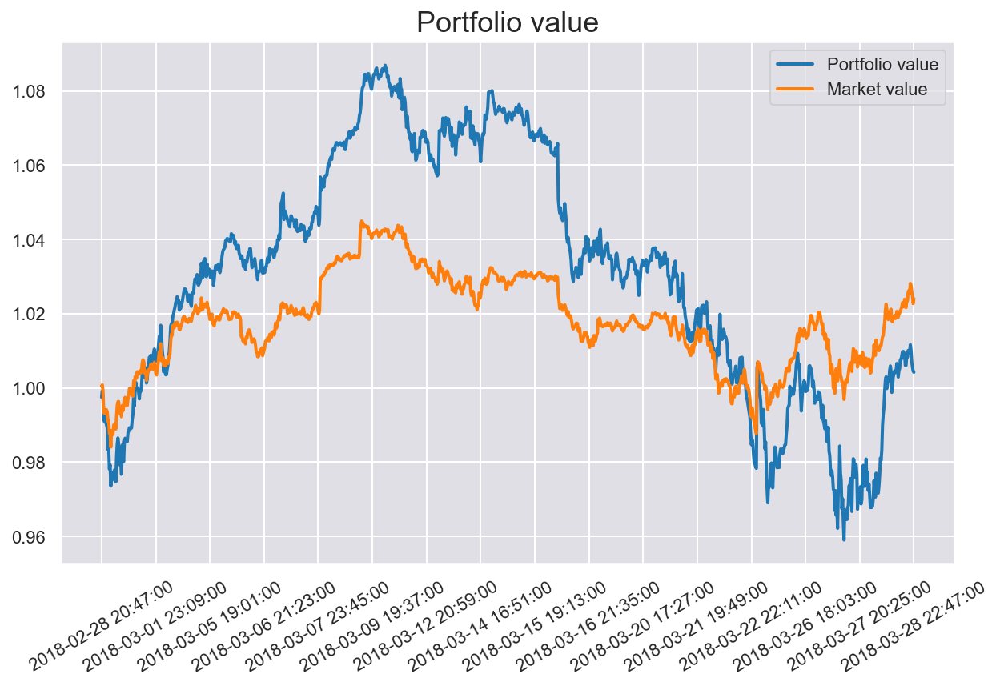

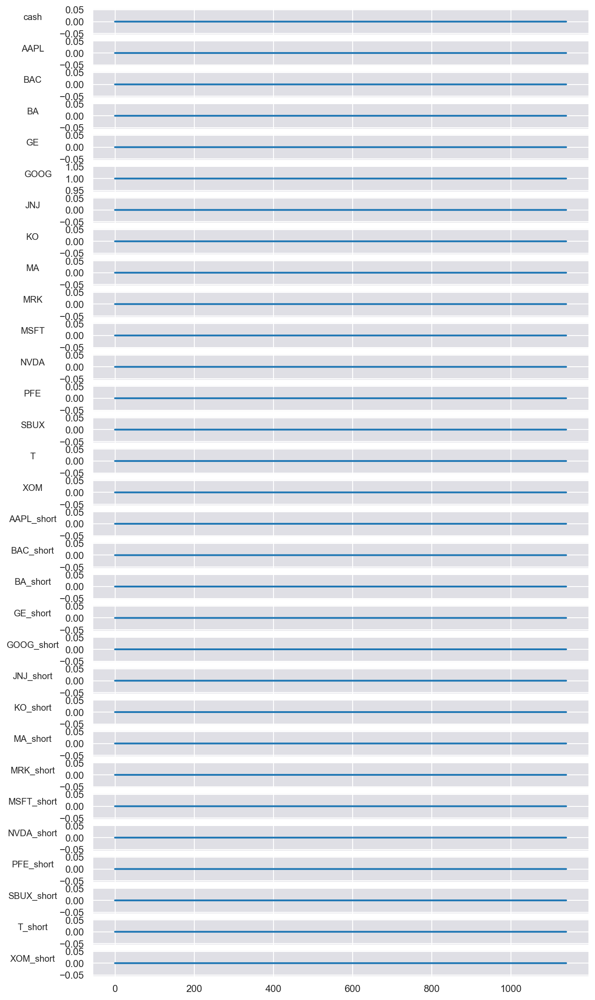

In [43]:
tf.reset_default_graph()
sess = tf.Session()
tflearn.config.init_training_mode()
action_dim = [nb_classes*2 + 1]
state_dim = [nb_classes + 1, window_length, 3]
variable_scope = get_variable_scope(window_length, predictor_type, use_batch_norm)
with tf.variable_scope(variable_scope):
    actor = StockActor(sess, state_dim, action_dim, action_bound, 1e-4, tau, batch_size, predictor_type, 
                       use_batch_norm)
    critic = StockCritic(sess=sess, state_dim=state_dim, action_dim=action_dim, tau=1e-3,
                         learning_rate=1e-3, num_actor_vars=actor.get_num_trainable_vars(), 
                         predictor_type=predictor_type, use_batch_norm=use_batch_norm)
    actor_noise = OrnsteinUhlenbeckActionNoise(mu=np.zeros(action_dim))

    model_save_path = "weights/"
    summary_path = get_result_path(window_length, predictor_type, use_batch_norm)

    ddpg_model = DDPG(environ, sess, actor, critic, actor_noise, param, obs_normalizer=obs_normalizer,
                      model_save_path=model_save_path,
                      summary_path=summary_path)
    ddpg_model.initialize(load_weights=False, verbose=False)
    ddpg_model.train()

env_Mar = PortfolioEnv(history_Mar, abbreviation, steps=history_Mar.shape[1]-200, window_length=window_length,
                   start_idx=data['Mar'].date_index.iloc[0])
test_model(env_Mar, ddpg_model)
plot_weights(env_Mar.infos)

Build model from scratch
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
1500
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 0, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field ty

c:\users\lenovo\appdata\local\programs\python\python39\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


Episode: 2, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 3, Reward: 1.00, Qmax: -0.0001
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 4, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 

Episode: 25, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 26, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 27, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 48, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 49, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 50, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 71, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 72, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 73, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 94, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 95, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 96, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 116, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 117, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 118, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 139, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 140, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 141, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03

Episode: 162, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 163, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 164, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 185, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 186, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 187, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 207, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 208, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 209, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 230, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 231, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 232, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 253, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 254, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 255, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 276, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 277, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 278, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 299, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 300, Reward: 1.00, Qmax: -0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.0

Episode: 321, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 322, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 323, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 344, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 345, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 346, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 367, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 368, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 369, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 390, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 391, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 392, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 412, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 413, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 414, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 435, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 436, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 437, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 458, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 459, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 460, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 481, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 482, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 483, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 503, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 504, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 505, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 526, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 527, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 528, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 549, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 550, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 551, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 572, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 573, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 574, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 595, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 596, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 597, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 617, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 618, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 619, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 640, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 641, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 642, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 663, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 664, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 665, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 686, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 687, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 688, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 708, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 709, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 710, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03

Episode: 731, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 732, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 733, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 754, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 755, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 756, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 777, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 778, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 779, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 800, Reward: 1.00, Qmax: -0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 801, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.0

Episode: 822, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 823, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 824, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 845, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 846, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 847, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03

Episode: 868, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 869, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 870, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 891, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 892, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 893, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 913, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 914, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 915, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 936, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 937, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 938, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03

Episode: 959, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 960, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 961, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.0

Episode: 982, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 983, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 984, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.

Episode: 1004, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.03]
Episode: 1005, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.03]
Episode: 1006, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.

Episode: 1027, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.03]
Episode: 1028, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.02 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.03]
Episode: 1029, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0

Episode: 1050, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.05 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.02 0.03 0.04 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.05 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.02 0.03 0.04 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 1051, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.05 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.02 0.03 0.04 0.03 0.04 0.04
 0.02 0.02 0.03]
[0.04 0.03 0.03 0.03 0.03 0.05 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.02 0.03 0.04 0.03 0.04 0.04
 0.02 0.02 0.03]
Episode: 1052, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.05 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.02 0.03 0.04 0.03 0.04 0.04
 0.02 0.02 0.03]
[0.04 0.02 0.03 0.03 0.03 0.05 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.

Episode: 1073, Reward: 1.00, Qmax: -0.0000
[0.05 0.02 0.03 0.03 0.03 0.06 0.03 0.03 0.02 0.03 0.03 0.03 0.04 0.02
 0.04 0.03 0.04 0.03 0.03 0.05 0.02 0.04 0.02 0.03 0.04 0.03 0.04 0.04
 0.02 0.02 0.03]
[0.05 0.02 0.03 0.03 0.03 0.06 0.03 0.03 0.02 0.03 0.03 0.03 0.04 0.02
 0.04 0.03 0.04 0.03 0.03 0.05 0.02 0.04 0.02 0.03 0.04 0.03 0.04 0.04
 0.02 0.02 0.03]
Episode: 1074, Reward: 1.00, Qmax: 0.0000
[0.05 0.02 0.03 0.03 0.03 0.06 0.03 0.03 0.02 0.03 0.03 0.03 0.04 0.02
 0.04 0.03 0.04 0.03 0.03 0.05 0.02 0.04 0.02 0.03 0.04 0.03 0.04 0.04
 0.02 0.02 0.03]
[0.05 0.02 0.03 0.03 0.03 0.06 0.03 0.03 0.02 0.03 0.03 0.03 0.04 0.02
 0.04 0.03 0.04 0.03 0.03 0.05 0.02 0.04 0.02 0.03 0.04 0.03 0.04 0.04
 0.02 0.02 0.03]
Episode: 1075, Reward: 1.00, Qmax: 0.0000
[0.05 0.02 0.03 0.03 0.03 0.06 0.03 0.03 0.02 0.03 0.03 0.03 0.04 0.02
 0.04 0.03 0.04 0.03 0.03 0.05 0.02 0.04 0.02 0.03 0.04 0.03 0.04 0.04
 0.02 0.02 0.03]
[0.05 0.02 0.03 0.03 0.03 0.05 0.03 0.03 0.02 0.03 0.03 0.03 0.04 0.02
 0.04 0

Episode: 1096, Reward: 1.00, Qmax: -0.0000
[0.06 0.01 0.03 0.03 0.03 0.09 0.03 0.03 0.02 0.02 0.02 0.03 0.05 0.02
 0.04 0.02 0.04 0.02 0.02 0.07 0.02 0.05 0.01 0.02 0.05 0.03 0.05 0.04
 0.01 0.01 0.03]
[0.06 0.01 0.03 0.03 0.03 0.09 0.03 0.02 0.02 0.02 0.02 0.03 0.05 0.02
 0.04 0.02 0.04 0.02 0.02 0.07 0.02 0.05 0.01 0.02 0.05 0.03 0.05 0.04
 0.01 0.01 0.03]
Episode: 1097, Reward: 1.00, Qmax: -0.0000
[0.06 0.02 0.03 0.03 0.03 0.08 0.03 0.03 0.02 0.02 0.02 0.03 0.05 0.02
 0.04 0.02 0.04 0.02 0.02 0.06 0.02 0.05 0.01 0.02 0.05 0.03 0.05 0.04
 0.01 0.01 0.03]
[0.06 0.01 0.03 0.03 0.03 0.09 0.03 0.03 0.02 0.02 0.02 0.03 0.05 0.02
 0.04 0.02 0.04 0.02 0.02 0.06 0.02 0.05 0.01 0.02 0.05 0.03 0.05 0.04
 0.01 0.01 0.03]
Episode: 1098, Reward: 1.00, Qmax: -0.0000
[0.06 0.02 0.03 0.03 0.03 0.08 0.03 0.03 0.02 0.02 0.02 0.03 0.05 0.02
 0.04 0.02 0.04 0.02 0.02 0.06 0.02 0.05 0.01 0.02 0.05 0.03 0.05 0.04
 0.01 0.01 0.03]
[0.06 0.01 0.03 0.03 0.03 0.09 0.03 0.02 0.02 0.02 0.02 0.03 0.05 0.02
 0.04

Episode: 1118, Reward: 1.00, Qmax: -0.0000
[0.13 0.   0.01 0.01 0.01 0.38 0.02 0.01 0.   0.   0.   0.01 0.08 0.
 0.02 0.   0.03 0.   0.   0.09 0.   0.04 0.   0.   0.06 0.01 0.04 0.02
 0.   0.   0.01]
[0.12 0.   0.01 0.01 0.02 0.27 0.03 0.01 0.   0.01 0.01 0.02 0.08 0.
 0.03 0.   0.04 0.   0.01 0.09 0.   0.05 0.   0.01 0.06 0.02 0.05 0.03
 0.   0.   0.02]
Episode: 1119, Reward: 1.00, Qmax: 0.0000
[0.13 0.   0.01 0.01 0.01 0.35 0.02 0.01 0.   0.   0.   0.01 0.09 0.
 0.02 0.   0.03 0.   0.01 0.09 0.   0.04 0.   0.   0.06 0.01 0.04 0.02
 0.   0.   0.01]
[0.12 0.   0.01 0.01 0.01 0.33 0.02 0.01 0.   0.   0.   0.01 0.09 0.
 0.03 0.   0.03 0.   0.01 0.09 0.   0.04 0.   0.   0.06 0.02 0.04 0.02
 0.   0.   0.01]
Episode: 1120, Reward: 1.00, Qmax: 0.0000
[0.12 0.   0.01 0.01 0.01 0.31 0.03 0.01 0.   0.   0.01 0.01 0.09 0.
 0.03 0.   0.04 0.   0.01 0.09 0.   0.04 0.   0.   0.06 0.02 0.05 0.02
 0.   0.   0.01]
[0.12 0.   0.01 0.01 0.02 0.27 0.03 0.01 0.   0.01 0.01 0.02 0.09 0.
 0.03 0.   0.04 0. 

Episode: 1134, Reward: 1.00, Qmax: -0.0000
[3.48e-02 3.53e-06 1.24e-04 8.15e-05 1.85e-04 8.99e-01 1.57e-03 5.12e-05
 9.34e-06 1.66e-05 2.64e-05 2.09e-04 3.86e-02 9.49e-06 8.93e-04 1.15e-05
 1.61e-03 9.88e-06 4.91e-05 9.79e-03 6.42e-06 2.30e-03 1.88e-06 1.62e-05
 6.83e-03 2.75e-04 2.63e-03 5.46e-04 2.54e-06 3.74e-06 1.67e-04]
[4.58e-02 1.16e-05 2.86e-04 1.96e-04 4.08e-04 8.59e-01 2.80e-03 1.28e-04
 2.77e-05 4.64e-05 7.08e-05 4.58e-04 5.04e-02 2.81e-05 1.70e-03 3.34e-05
 2.86e-03 2.92e-05 1.24e-04 1.47e-02 1.98e-05 3.97e-03 6.55e-06 4.56e-05
 1.06e-02 5.87e-04 4.48e-03 1.09e-03 8.59e-06 1.21e-05 3.75e-04]
Episode: 1135, Reward: 1.00, Qmax: -0.0000
[4.38e-02 1.27e-05 2.98e-04 2.06e-04 4.23e-04 8.61e-01 2.85e-03 1.36e-04
 3.01e-05 4.99e-05 7.57e-05 4.73e-04 5.09e-02 3.05e-05 1.71e-03 3.61e-05
 2.86e-03 3.17e-05 1.31e-04 1.42e-02 2.16e-05 3.95e-03 7.27e-06 4.91e-05
 1.04e-02 6.04e-04 4.44e-03 1.10e-03 9.50e-06 1.33e-05 3.89e-04]
[3.63e-02 5.79e-06 1.71e-04 1.15e-04 2.49e-04 8.89e-01 1.94e-0

Episode: 1148, Reward: 1.00, Qmax: -0.0000
[6.19e-03 1.91e-07 1.14e-05 7.06e-06 1.79e-05 9.76e-01 2.44e-04 4.15e-06
 6.00e-07 1.14e-06 1.94e-06 2.04e-05 1.34e-02 6.03e-07 1.04e-04 7.49e-07
 2.07e-04 6.28e-07 4.01e-06 1.52e-03 3.81e-07 2.99e-04 9.17e-08 1.11e-06
 1.04e-03 2.79e-05 3.49e-04 6.07e-05 1.30e-07 2.06e-07 1.59e-05]
[5.37e-03 1.23e-07 8.21e-06 5.03e-06 1.31e-05 9.80e-01 1.93e-04 2.92e-06
 3.99e-07 7.73e-07 1.33e-06 1.50e-05 1.19e-02 4.01e-07 7.98e-05 5.01e-07
 1.63e-04 4.18e-07 2.81e-06 1.26e-03 2.50e-07 2.38e-04 5.77e-08 7.54e-07
 8.53e-04 2.07e-05 2.78e-04 4.61e-05 8.25e-08 1.33e-07 1.16e-05]
Episode: 1149, Reward: 1.00, Qmax: -0.0000
[2.84e-03 2.02e-08 2.15e-06 1.25e-06 3.63e-06 9.89e-01 7.23e-05 6.85e-07
 7.51e-08 1.57e-07 2.85e-07 4.20e-06 7.06e-03 7.56e-08 2.68e-05 9.66e-08
 5.95e-05 7.88e-08 6.59e-07 5.74e-04 4.46e-08 9.00e-05 8.76e-09 1.52e-07
 3.72e-04 6.00e-06 1.07e-04 1.46e-05 1.30e-08 2.22e-08 3.15e-06]
[2.23e-03 9.70e-09 1.25e-06 7.11e-07 2.16e-06 9.91e-01 4.88e-0

Episode: 1162, Reward: 1.00, Qmax: -0.0000
[2.14e-03 2.56e-08 2.34e-06 1.39e-06 3.87e-06 9.90e-01 7.17e-05 7.74e-07
 9.17e-08 1.86e-07 3.32e-07 4.44e-06 6.31e-03 9.19e-08 2.62e-05 1.17e-07
 5.70e-05 9.57e-08 7.48e-07 4.90e-04 5.50e-08 8.39e-05 1.13e-08 1.81e-07
 3.22e-04 6.28e-06 9.92e-05 1.48e-05 1.66e-08 2.80e-08 3.38e-06]
[2.60e-03 4.45e-08 3.53e-06 2.12e-06 5.74e-06 9.88e-01 9.68e-05 1.21e-06
 1.53e-07 3.04e-07 5.33e-07 6.56e-06 7.40e-03 1.53e-07 3.66e-05 1.93e-07
 7.76e-05 1.60e-07 1.17e-06 6.24e-04 9.34e-08 1.13e-04 2.02e-08 2.96e-07
 4.15e-04 9.17e-06 1.33e-04 2.10e-05 2.94e-08 4.85e-08 5.04e-06]
Episode: 1163, Reward: 1.00, Qmax: 0.0000
[1.41e-03 8.10e-09 9.94e-07 5.69e-07 1.70e-06 9.93e-01 3.82e-05 3.07e-07
 3.16e-08 6.71e-08 1.24e-07 1.97e-06 4.52e-03 3.17e-08 1.30e-05 4.08e-08
 2.99e-05 3.30e-08 2.96e-07 2.94e-04 1.83e-08 4.49e-05 3.41e-09 6.51e-08
 1.88e-04 2.84e-06 5.37e-05 7.09e-06 5.12e-09 8.93e-09 1.47e-06]
[1.58e-03 1.12e-08 1.27e-06 7.32e-07 2.15e-06 9.93e-01 4.57e-05

Episode: 1176, Reward: 1.00, Qmax: -0.0000
[1.01e-03 4.40e-09 6.18e-07 3.48e-07 1.07e-06 9.95e-01 2.65e-05 1.84e-07
 1.79e-08 3.87e-08 7.29e-08 1.24e-06 3.80e-03 1.79e-08 8.61e-06 2.32e-08
 2.04e-05 1.87e-08 1.78e-07 2.08e-04 1.02e-08 3.06e-05 1.81e-09 3.75e-08
 1.32e-04 1.81e-06 3.68e-05 4.63e-06 2.74e-09 4.87e-09 9.22e-07]
[2.24e-03 4.07e-08 3.22e-06 1.94e-06 5.24e-06 9.89e-01 8.90e-05 1.10e-06
 1.40e-07 2.78e-07 4.87e-07 5.98e-06 7.21e-03 1.40e-07 3.32e-05 1.77e-07
 7.06e-05 1.46e-07 1.07e-06 5.55e-04 8.53e-08 1.02e-04 1.85e-08 2.70e-07
 3.71e-04 8.36e-06 1.20e-04 1.91e-05 2.68e-08 4.43e-08 4.59e-06]
Episode: 1177, Reward: 1.00, Qmax: -0.0000
[1.23e-03 7.78e-09 9.41e-07 5.39e-07 1.61e-06 9.94e-01 3.61e-05 2.91e-07
 3.03e-08 6.41e-08 1.18e-07 1.86e-06 4.49e-03 3.03e-08 1.21e-05 3.90e-08
 2.80e-05 3.16e-08 2.81e-07 2.67e-04 1.75e-08 4.15e-05 3.27e-09 6.22e-08
 1.72e-04 2.68e-06 4.97e-05 6.65e-06 4.92e-09 8.57e-09 1.39e-06]
[1.07e-03 5.30e-09 7.08e-07 4.01e-07 1.22e-06 9.94e-01 2.93e-0

Episode: 1190, Reward: 1.00, Qmax: -0.0000
[6.83e-04 1.69e-09 3.01e-07 1.65e-07 5.37e-07 9.96e-01 1.56e-05 8.50e-08
 7.36e-09 1.66e-08 3.20e-08 6.26e-07 3.07e-03 7.37e-09 4.75e-06 9.66e-09
 1.18e-05 7.68e-09 8.19e-08 1.32e-04 4.07e-09 1.79e-05 6.64e-10 1.60e-08
 8.28e-05 9.30e-07 2.18e-05 2.49e-06 1.03e-09 1.88e-09 4.58e-07]
[6.73e-04 1.63e-09 2.93e-07 1.60e-07 5.23e-07 9.96e-01 1.53e-05 8.24e-08
 7.10e-09 1.60e-08 3.10e-08 6.10e-07 3.03e-03 7.11e-09 4.64e-06 9.33e-09
 1.15e-05 7.42e-09 7.94e-08 1.30e-04 3.92e-09 1.75e-05 6.38e-10 1.55e-08
 8.14e-05 9.06e-07 2.13e-05 2.43e-06 9.89e-10 1.81e-09 4.45e-07]
Episode: 1191, Reward: 1.00, Qmax: -0.0000
[9.77e-04 4.59e-09 6.33e-07 3.57e-07 1.10e-06 9.94e-01 2.69e-05 1.90e-07
 1.86e-08 4.01e-08 7.53e-08 1.27e-06 4.11e-03 1.86e-08 8.71e-06 2.41e-08
 2.06e-05 1.94e-08 1.83e-07 2.06e-04 1.06e-08 3.08e-05 1.89e-09 3.89e-08
 1.32e-04 1.85e-06 3.70e-05 4.71e-06 2.87e-09 5.08e-09 9.43e-07]
[1.13e-03 6.89e-09 8.55e-07 4.89e-07 1.46e-06 9.94e-01 3.36e-0

Episode: 1203, Reward: 1.00, Qmax: -0.0000
[6.62e-04 1.58e-09 2.88e-07 1.57e-07 5.14e-07 9.96e-01 1.52e-05 8.08e-08
 6.93e-09 1.56e-08 3.04e-08 5.99e-07 3.47e-03 6.94e-09 4.57e-06 9.11e-09
 1.14e-05 7.24e-09 7.78e-08 1.28e-04 3.83e-09 1.73e-05 6.20e-10 1.51e-08
 8.05e-05 8.91e-07 2.11e-05 2.39e-06 9.62e-10 1.77e-09 4.38e-07]
[1.12e-03 6.84e-09 8.53e-07 4.87e-07 1.46e-06 9.93e-01 3.37e-05 2.62e-07
 2.69e-08 5.72e-08 1.06e-07 1.69e-06 5.21e-03 2.69e-08 1.11e-05 3.47e-08
 2.60e-05 2.80e-08 2.53e-07 2.45e-04 1.55e-08 3.82e-05 2.86e-09 5.55e-08
 1.59e-04 2.44e-06 4.59e-05 6.08e-06 4.31e-09 7.55e-09 1.26e-06]
Episode: 1204, Reward: 1.00, Qmax: -0.0000
[9.69e-04 4.54e-09 6.29e-07 3.55e-07 1.09e-06 9.94e-01 2.70e-05 1.89e-07
 1.84e-08 3.97e-08 7.46e-08 1.26e-06 4.71e-03 1.84e-08 8.67e-06 2.38e-08
 2.06e-05 1.92e-08 1.82e-07 2.04e-04 1.05e-08 3.06e-05 1.86e-09 3.85e-08
 1.31e-04 1.84e-06 3.69e-05 4.68e-06 2.83e-09 5.02e-09 9.37e-07]
[7.23e-04 2.02e-09 3.45e-07 1.90e-07 6.12e-07 9.95e-01 1.74e-0

Episode: 1217, Reward: 1.00, Qmax: 0.0000
[1.79e-03 2.42e-08 2.20e-06 1.30e-06 3.63e-06 9.88e-01 6.84e-05 7.30e-07
 8.68e-08 1.76e-07 3.14e-07 4.16e-06 9.25e-03 8.69e-08 2.42e-05 1.10e-07
 5.34e-05 9.05e-08 7.06e-07 4.31e-04 5.21e-08 7.64e-05 1.07e-08 1.71e-07
 2.90e-04 5.87e-06 9.11e-05 1.38e-05 1.58e-08 2.65e-08 3.17e-06]
[1.28e-03 9.53e-09 1.10e-06 6.34e-07 1.87e-06 9.91e-01 4.12e-05 3.44e-07
 3.66e-08 7.69e-08 1.41e-07 2.15e-06 7.22e-03 3.66e-08 1.37e-05 4.70e-08
 3.17e-05 3.82e-08 3.33e-07 2.85e-04 2.13e-08 4.62e-05 4.05e-09 7.47e-08
 1.88e-04 3.09e-06 5.55e-05 7.59e-06 6.05e-09 1.05e-08 1.61e-06]
Episode: 1218, Reward: 1.00, Qmax: 0.0000
[1.43e-03 1.27e-08 1.36e-06 7.91e-07 2.29e-06 9.90e-01 4.82e-05 4.34e-07
 4.77e-08 9.92e-08 1.81e-07 2.63e-06 7.96e-03 4.78e-08 1.64e-05 6.11e-08
 3.73e-05 4.98e-08 4.19e-07 3.24e-04 2.81e-08 5.39e-05 5.46e-09 9.64e-08
 2.15e-04 3.77e-06 6.48e-05 9.12e-06 8.12e-09 1.39e-08 1.99e-06]
[1.40e-03 1.21e-08 1.32e-06 7.64e-07 2.22e-06 9.90e-01 4.70e-05 

Episode: 1231, Reward: 1.00, Qmax: -0.0000
[1.06e-03 4.82e-09 6.73e-07 3.79e-07 1.17e-06 9.89e-01 2.94e-05 2.01e-07
 1.95e-08 4.23e-08 7.96e-08 1.35e-06 9.09e-03 1.96e-08 9.32e-06 2.54e-08
 2.24e-05 2.04e-08 1.94e-07 2.18e-04 1.11e-08 3.28e-05 1.98e-09 4.10e-08
 1.42e-04 1.97e-06 4.00e-05 5.02e-06 3.00e-09 5.33e-09 1.00e-06]
[1.52e-03 1.33e-08 1.43e-06 8.33e-07 2.41e-06 9.86e-01 5.11e-05 4.57e-07
 5.02e-08 1.04e-07 1.90e-07 2.77e-06 1.16e-02 5.02e-08 1.73e-05 6.43e-08
 3.94e-05 5.23e-08 4.41e-07 3.41e-04 2.95e-08 5.68e-05 5.74e-09 1.01e-07
 2.28e-04 3.97e-06 6.86e-05 9.60e-06 8.53e-09 1.47e-08 2.09e-06]
Episode: 1232, Reward: 1.00, Qmax: 0.0000
[1.16e-03 6.13e-09 8.06e-07 4.57e-07 1.39e-06 9.88e-01 3.36e-05 2.45e-07
 2.44e-08 5.24e-08 9.79e-08 1.60e-06 1.00e-02 2.45e-08 1.08e-05 3.16e-08
 2.57e-05 2.55e-08 2.36e-07 2.43e-04 1.40e-08 3.74e-05 2.54e-09 5.09e-08
 1.60e-04 2.33e-06 4.56e-05 5.86e-06 3.84e-09 6.77e-09 1.20e-06]
[1.77e-03 2.05e-08 1.97e-06 1.16e-06 3.28e-06 9.84e-01 6.45e-05

Episode: 1245, Reward: 1.00, Qmax: -0.0000
[1.12e-03 5.08e-09 7.13e-07 4.01e-07 1.24e-06 9.84e-01 3.13e-05 2.13e-07
 2.06e-08 4.47e-08 8.42e-08 1.43e-06 1.48e-02 2.07e-08 9.88e-06 2.68e-08
 2.38e-05 2.15e-08 2.05e-07 2.29e-04 1.17e-08 3.46e-05 2.08e-09 4.34e-08
 1.51e-04 2.09e-06 4.26e-05 5.31e-06 3.17e-09 5.62e-09 1.06e-06]
[1.33e-03 8.16e-09 1.01e-06 5.78e-07 1.73e-06 9.82e-01 4.04e-05 3.12e-07
 3.20e-08 6.80e-08 1.26e-07 2.00e-06 1.64e-02 3.20e-08 1.31e-05 4.13e-08
 3.09e-05 3.34e-08 3.01e-07 2.82e-04 1.85e-08 4.47e-05 3.42e-09 6.60e-08
 1.88e-04 2.89e-06 5.46e-05 7.18e-06 5.15e-09 9.00e-09 1.49e-06]
Episode: 1246, Reward: 1.00, Qmax: -0.0000
[1.22e-03 6.44e-09 8.50e-07 4.82e-07 1.46e-06 9.82e-01 3.56e-05 2.58e-07
 2.57e-08 5.52e-08 1.03e-07 1.69e-06 1.60e-02 2.57e-08 1.14e-05 3.33e-08
 2.71e-05 2.68e-08 2.49e-07 2.54e-04 1.47e-08 3.94e-05 2.67e-09 5.35e-08
 1.69e-04 2.46e-06 4.83e-05 6.18e-06 4.04e-09 7.12e-09 1.26e-06]
[9.70e-04 3.33e-09 5.22e-07 2.90e-07 9.17e-07 9.85e-01 2.49e-0

Episode: 1259, Reward: 1.00, Qmax: -0.0000
[2.83e-03 6.01e-08 4.53e-06 2.75e-06 7.34e-06 9.49e-01 1.24e-04 1.57e-06
 2.04e-07 4.02e-07 7.02e-07 8.35e-06 4.68e-02 2.04e-07 4.53e-05 2.57e-07
 9.71e-05 2.13e-07 1.52e-06 7.01e-04 1.25e-07 1.35e-04 2.75e-08 3.91e-07
 4.91e-04 1.17e-05 1.63e-04 2.62e-05 3.98e-08 6.54e-08 6.44e-06]
[2.12e-03 2.62e-08 2.45e-06 1.45e-06 4.07e-06 9.56e-01 7.93e-05 8.09e-07
 9.46e-08 1.93e-07 3.45e-07 4.66e-06 4.05e-02 9.47e-08 2.75e-05 1.20e-07
 6.15e-05 9.87e-08 7.82e-07 4.89e-04 5.65e-08 8.67e-05 1.15e-08 1.87e-07
 3.37e-04 6.61e-06 1.06e-04 1.55e-05 1.70e-08 2.86e-08 3.55e-06]
Episode: 1260, Reward: 1.00, Qmax: -0.0000
[4.29e-03 1.97e-07 1.09e-05 6.84e-06 1.70e-05 9.32e-01 2.33e-04 4.06e-06
 6.10e-07 1.14e-06 1.93e-06 1.92e-05 6.08e-02 6.11e-07 9.22e-05 7.56e-07
 1.87e-04 6.36e-07 3.94e-06 1.17e-03 3.88e-07 2.54e-04 9.50e-08 1.12e-06
 8.41e-04 2.61e-05 3.02e-04 5.54e-05 1.34e-07 2.12e-07 1.51e-05]
[3.60e-03 1.18e-07 7.48e-06 4.63e-06 1.19e-05 9.38e-01 1.78e-0

Episode: 1273, Reward: 1.00, Qmax: -0.0000
[2.93e-03 4.42e-08 3.81e-06 2.27e-06 6.26e-06 8.59e-01 1.17e-04 1.28e-06
 1.56e-07 3.14e-07 5.57e-07 7.15e-06 1.36e-01 1.56e-07 4.10e-05 1.98e-07
 9.05e-05 1.63e-07 1.24e-06 6.79e-04 9.42e-08 1.25e-04 1.98e-08 3.05e-07
 4.81e-04 1.01e-05 1.53e-04 2.32e-05 2.89e-08 4.83e-08 5.48e-06]
[3.15e-03 5.53e-08 4.49e-06 2.70e-06 7.32e-06 8.56e-01 1.31e-04 1.53e-06
 1.92e-07 3.82e-07 6.73e-07 8.35e-06 1.39e-01 1.92e-07 4.67e-05 2.42e-07
 1.02e-04 2.00e-07 1.49e-06 7.45e-04 1.17e-07 1.41e-04 2.50e-08 3.72e-07
 5.30e-04 1.17e-05 1.72e-04 2.67e-05 3.64e-08 6.03e-08 6.42e-06]
Episode: 1274, Reward: 1.00, Qmax: -0.0000
[5.96e-03 3.80e-07 1.84e-05 1.17e-05 2.82e-05 8.10e-01 3.59e-04 7.10e-06
 1.14e-06 2.09e-06 3.45e-06 3.18e-05 1.80e-01 1.14e-06 1.45e-04 1.40e-06
 2.88e-04 1.18e-06 6.91e-06 1.67e-03 7.34e-07 3.84e-04 1.88e-07 2.04e-06
 1.24e-03 4.29e-05 4.58e-04 8.84e-05 2.63e-07 4.08e-07 2.52e-05]
[3.04e-03 4.80e-08 4.06e-06 2.43e-06 6.65e-06 8.44e-01 1.23e-0

Episode: 1287, Reward: 1.00, Qmax: -0.0000
[6.62e-03 5.51e-07 2.38e-05 1.54e-05 3.62e-05 4.68e-01 4.50e-04 9.51e-06
 1.61e-06 2.90e-06 4.70e-06 4.08e-05 5.19e-01 1.60e-06 1.80e-04 1.95e-06
 3.52e-04 1.66e-06 9.37e-06 1.85e-03 1.04e-06 4.50e-04 2.77e-07 2.82e-06
 1.45e-03 5.48e-05 5.48e-04 1.10e-04 3.82e-07 5.89e-07 3.25e-05]
[6.25e-03 4.57e-07 2.08e-05 1.34e-05 3.18e-05 4.69e-01 4.09e-04 8.21e-06
 1.36e-06 2.46e-06 4.02e-06 3.59e-05 5.20e-01 1.35e-06 1.62e-04 1.64e-06
 3.19e-04 1.40e-06 8.09e-06 1.71e-03 8.73e-07 4.09e-04 2.27e-07 2.39e-06
 1.34e-03 4.84e-05 4.99e-04 9.77e-05 3.15e-07 4.90e-07 2.85e-05]
Episode: 1288, Reward: 1.00, Qmax: 0.0000
[9.54e-03 1.89e-06 5.77e-05 3.89e-05 8.43e-05 4.37e-01 8.32e-04 2.50e-05
 5.00e-06 8.53e-06 1.33e-05 9.41e-05 5.44e-01 4.98e-06 3.63e-04 5.94e-06
 6.64e-04 5.14e-06 2.47e-05 2.99e-03 3.37e-06 8.31e-04 1.01e-06 8.30e-06
 2.40e-03 1.23e-04 9.95e-04 2.30e-04 1.35e-06 2.00e-06 7.67e-05]
[7.64e-03 9.32e-07 3.46e-05 2.28e-05 5.16e-05 4.35e-01 5.82e-04

Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[2.58e-03 1.72e-07 8.26e-06 5.27e-06 1.27e-05 1.15e-01 1.86e-04 3.25e-06
 5.31e-07 9.67e-07 1.56e-06 1.44e-05 8.80e-01 5.25e-07 6.72e-05 6.30e-07
 1.36e-04 5.34e-07 3.29e-06 6.72e-04 3.30e-07 1.63e-04 8.42e-08 9.26e-07
 5.67e-04 1.96e-05 2.08e-04 3.94e-05 1.16e-07 1.85e-07 1.14e-05]
[2.11e-03 1.00e-07 5.51e-06 3.46e-06 8.58e-06 1.08e-01 1.39e-04 2.10e-06
 3.22e-07 5.98e-07 9.80e-07 9.80e-06 8.88e-01 3.18e-07 4.83e-05 3.84e-07
 1.00e-04 3.23e-07 2.13e-06 5.24e-04 1.97e-07 1.21e-04 4.77e-08 5.72e-07
 4.40e-04 1.35e-05 1.55e-04 2.78e-05 6.64e-08 1.08e-07 7.70e-06]
Episode: 1301, Reward: 1.00, Qmax: 0.0000
[1.83e-03 7.93e-08 4.54e-06 2.84e-06 7.09e-06 9.31e-02 1.19e-04 1.72e-06
 2.58e-07 4.83e-07 7.94e-07 8.12e-06 9.04e-01 2.55e-07 4.06e-05 3.08e-07
 8.49e-05 2.59e-07 1.74e-06 4.48e-04 1.57e-07 1.02e-04 3.76e-0

Episode: 1314, Reward: 1.00, Qmax: -0.0000
[2.29e-04 2.26e-09 2.42e-07 1.40e-07 4.04e-07 1.37e-02 1.14e-05 7.97e-08
 9.06e-09 1.86e-08 3.22e-08 4.74e-07 9.86e-01 8.85e-09 3.06e-06 1.08e-08
 7.35e-06 8.84e-09 8.32e-08 4.49e-05 4.93e-09 8.52e-06 9.46e-10 1.74e-08
 3.96e-05 6.93e-07 1.18e-05 1.59e-06 1.37e-09 2.50e-09 3.58e-07]
[2.28e-04 2.24e-09 2.41e-07 1.39e-07 4.03e-07 1.36e-02 1.14e-05 7.93e-08
 9.02e-09 1.85e-08 3.21e-08 4.72e-07 9.86e-01 8.81e-09 3.05e-06 1.08e-08
 7.32e-06 8.80e-09 8.28e-08 4.48e-05 4.91e-09 8.48e-06 9.41e-10 1.73e-08
 3.95e-05 6.90e-07 1.17e-05 1.58e-06 1.36e-09 2.49e-09 3.56e-07]
Episode: 1315, Reward: 1.00, Qmax: -0.0000
[2.72e-04 3.70e-09 3.48e-07 2.05e-07 5.74e-07 1.42e-02 1.49e-05 1.18e-07
 1.43e-08 2.87e-08 4.91e-08 6.71e-07 9.85e-01 1.40e-08 4.12e-06 1.70e-08
 9.64e-06 1.40e-08 1.24e-07 5.58e-05 7.92e-09 1.11e-05 1.59e-09 2.70e-08
 4.95e-05 9.71e-07 1.53e-05 2.17e-06 2.27e-09 4.08e-09 5.10e-07]
[3.35e-04 6.07e-09 5.09e-07 3.04e-07 8.28e-07 1.58e-02 1.97e-0

Episode: 1328, Reward: 1.00, Qmax: 0.0000
[9.42e-05 6.38e-10 8.11e-08 4.60e-08 1.38e-07 5.25e-03 4.59e-06 2.58e-08
 2.73e-09 5.72e-09 1.00e-08 1.63e-07 9.95e-01 2.65e-09 1.13e-06 3.25e-09
 2.83e-06 2.63e-09 2.73e-08 1.75e-05 1.43e-09 3.20e-06 2.58e-10 5.32e-09
 1.59e-05 2.42e-07 4.55e-06 5.69e-07 3.77e-10 7.12e-10 1.22e-07]
[2.75e-04 7.37e-09 5.35e-07 3.25e-07 8.57e-07 9.63e-03 1.89e-05 1.94e-07
 2.66e-08 5.12e-08 8.45e-08 9.96e-07 9.90e-01 2.59e-08 5.53e-06 3.10e-08
 1.23e-05 2.58e-08 2.04e-07 6.23e-05 1.51e-08 1.38e-05 3.31e-09 4.81e-08
 5.70e-05 1.41e-06 1.89e-05 3.00e-06 4.63e-09 8.09e-09 7.69e-07]
Episode: 1329, Reward: 1.00, Qmax: -0.0000
[6.01e-04 4.55e-08 2.16e-06 1.38e-06 3.30e-06 1.47e-02 5.37e-05 8.66e-07
 1.44e-07 2.61e-07 4.10e-07 3.79e-06 9.84e-01 1.41e-07 1.78e-05 1.66e-07
 3.65e-05 1.41e-07 9.06e-07 1.58e-04 8.67e-08 4.06e-05 2.21e-08 2.46e-07
 1.45e-04 5.20e-06 5.38e-05 1.02e-05 3.00e-08 4.93e-08 3.00e-06]
[8.89e-05 5.85e-10 7.52e-08 4.27e-08 1.28e-07 4.96e-03 4.32e-06

Episode: 1342, Reward: 1.00, Qmax: -0.0000
[2.85e-05 5.99e-11 1.24e-08 6.63e-09 2.22e-08 2.17e-03 1.07e-06 3.53e-09
 2.99e-10 6.73e-10 1.24e-09 2.67e-08 9.98e-01 2.89e-10 2.25e-07 3.59e-10
 6.21e-07 2.84e-10 3.78e-09 4.48e-06 1.46e-10 6.97e-07 2.21e-11 6.20e-10
 4.09e-06 4.13e-08 1.03e-06 1.05e-07 3.34e-11 6.80e-11 1.93e-08]
[6.28e-05 3.56e-10 4.91e-08 2.76e-08 8.43e-08 3.44e-03 3.02e-06 1.54e-08
 1.57e-09 3.33e-09 5.87e-09 1.00e-07 9.96e-01 1.52e-09 7.18e-07 1.86e-09
 1.83e-06 1.50e-09 1.64e-08 1.14e-05 8.10e-10 2.04e-06 1.42e-10 3.09e-09
 1.05e-05 1.50e-07 2.94e-06 3.56e-07 2.08e-10 3.99e-10 7.43e-08]
Episode: 1343, Reward: 1.00, Qmax: 0.0000
[9.50e-05 9.07e-10 1.01e-07 5.83e-08 1.70e-07 4.36e-03 5.20e-06 3.33e-08
 3.75e-09 7.69e-09 1.32e-08 2.00e-07 9.95e-01 3.64e-09 1.32e-06 4.41e-09
 3.22e-06 3.60e-09 3.53e-08 1.86e-05 1.99e-09 3.58e-06 3.75e-10 7.15e-09
 1.71e-05 2.94e-07 5.08e-06 6.72e-07 5.41e-10 1.01e-09 1.50e-07]
[5.96e-05 3.19e-10 4.50e-08 2.52e-08 7.75e-08 3.31e-03 2.82e-06

Episode: 1356, Reward: 1.00, Qmax: -0.0000
[2.64e-05 5.96e-11 1.20e-08 6.45e-09 2.15e-08 1.89e-03 1.03e-06 3.45e-09
 2.96e-10 6.64e-10 1.22e-09 2.58e-08 9.98e-01 2.86e-10 2.16e-07 3.54e-10
 5.94e-07 2.81e-10 3.71e-09 4.20e-06 1.44e-10 6.62e-07 2.21e-11 6.11e-10
 3.86e-06 3.99e-08 9.84e-07 1.01e-07 3.32e-11 6.76e-11 1.88e-08]
[1.19e-04 1.69e-09 1.61e-07 9.44e-08 2.65e-07 4.62e-03 7.26e-06 5.49e-08
 6.67e-09 1.33e-08 2.26e-08 3.11e-07 9.95e-01 6.48e-09 1.92e-06 7.80e-09
 4.55e-06 6.40e-09 5.83e-08 2.46e-05 3.62e-09 5.03e-06 7.21e-10 1.24e-08
 2.28e-05 4.52e-07 7.07e-06 1.00e-06 1.03e-09 1.88e-09 2.36e-07]
Episode: 1357, Reward: 1.00, Qmax: -0.0000
[1.04e-04 1.27e-09 1.28e-07 7.48e-08 2.13e-07 4.24e-03 6.11e-06 4.32e-08
 5.10e-09 1.03e-08 1.75e-08 2.50e-07 9.96e-01 4.95e-09 1.59e-06 5.97e-09
 3.80e-06 4.89e-09 4.60e-08 2.10e-05 2.74e-09 4.21e-06 5.34e-10 9.59e-09
 1.95e-05 3.66e-07 5.94e-06 8.20e-07 7.65e-10 1.41e-09 1.89e-07]
[4.87e-05 2.33e-10 3.45e-08 1.93e-08 5.98e-08 2.72e-03 2.27e-0

Episode: 1370, Reward: 1.00, Qmax: -0.0000
[2.24e-05 4.54e-11 9.59e-09 5.13e-09 1.73e-08 1.62e-03 8.55e-07 2.73e-09
 2.29e-10 5.17e-10 9.52e-10 2.08e-08 9.98e-01 2.21e-10 1.77e-07 2.74e-10
 4.92e-07 2.17e-10 2.93e-09 3.51e-06 1.11e-10 5.47e-07 1.67e-11 4.75e-10
 3.24e-06 3.22e-08 8.17e-07 8.25e-08 2.52e-11 5.16e-11 1.50e-08]
[3.58e-05 1.29e-10 2.16e-08 1.19e-08 3.78e-08 2.14e-03 1.58e-06 6.48e-09
 6.07e-10 1.32e-09 2.37e-09 4.52e-08 9.98e-01 5.87e-10 3.50e-07 7.22e-10
 9.28e-07 5.77e-10 6.95e-09 6.09e-06 3.03e-10 1.03e-06 4.97e-11 1.22e-09
 5.64e-06 6.88e-08 1.51e-06 1.69e-07 7.36e-11 1.46e-10 3.32e-08]
Episode: 1371, Reward: 1.00, Qmax: -0.0000
[8.68e-05 9.28e-10 9.93e-08 5.76e-08 1.66e-07 3.64e-03 4.99e-06 3.31e-08
 3.80e-09 7.74e-09 1.32e-08 1.96e-07 9.96e-01 3.69e-09 1.27e-06 4.46e-09
 3.08e-06 3.64e-09 3.52e-08 1.73e-05 2.02e-09 3.40e-06 3.87e-10 7.20e-09
 1.61e-05 2.87e-07 4.83e-06 6.50e-07 5.55e-10 1.03e-09 1.47e-07]
[6.33e-05 4.56e-10 5.73e-08 3.26e-08 9.75e-08 3.02e-03 3.30e-0

Episode: 1384, Reward: 1.00, Qmax: -0.0000
[3.87e-05 1.65e-10 2.57e-08 1.43e-08 4.48e-08 2.17e-03 1.79e-06 7.86e-09
 7.58e-10 1.64e-09 2.91e-09 5.35e-08 9.98e-01 7.34e-10 4.05e-07 8.99e-10
 1.06e-06 7.21e-10 8.43e-09 6.76e-06 3.82e-10 1.17e-06 6.40e-11 1.51e-09
 6.28e-06 8.10e-08 1.71e-06 1.96e-07 9.44e-11 1.86e-10 3.94e-08]
[6.47e-05 5.14e-10 6.22e-08 3.55e-08 1.05e-07 2.96e-03 3.48e-06 2.01e-08
 2.18e-09 4.54e-09 7.86e-09 1.25e-07 9.97e-01 2.12e-09 8.51e-07 2.57e-09
 2.12e-06 2.09e-09 2.15e-08 1.23e-05 1.14e-09 2.33e-06 2.09e-10 4.21e-09
 1.15e-05 1.85e-07 3.35e-06 4.27e-07 3.03e-10 5.74e-10 9.32e-08]
Episode: 1385, Reward: 1.00, Qmax: -0.0000
[2.36e-05 5.51e-11 1.10e-08 5.92e-09 1.97e-08 1.61e-03 9.41e-07 3.17e-09
 2.73e-10 6.12e-10 1.12e-09 2.37e-08 9.98e-01 2.64e-10 1.97e-07 3.26e-10
 5.42e-07 2.59e-10 3.41e-09 3.78e-06 1.33e-10 6.01e-07 2.04e-11 5.63e-10
 3.50e-06 3.66e-08 8.96e-07 9.25e-08 3.07e-11 6.25e-11 1.72e-08]
[1.85e-05 3.23e-11 7.26e-09 3.85e-09 1.32e-08 1.39e-03 6.87e-0

Episode: 1398, Reward: 1.00, Qmax: -0.0000
[5.44e-05 3.58e-10 4.68e-08 2.65e-08 7.99e-08 2.61e-03 2.80e-06 1.49e-08
 1.56e-09 3.27e-09 5.72e-09 9.49e-08 9.97e-01 1.51e-09 6.68e-07 1.84e-09
 1.69e-06 1.49e-09 1.59e-08 1.01e-05 8.05e-10 1.86e-06 1.43e-10 3.03e-09
 9.40e-06 1.42e-07 2.69e-06 3.32e-07 2.09e-10 4.00e-10 7.06e-08]
[9.08e-05 1.14e-09 1.14e-07 6.68e-08 1.90e-07 3.54e-03 5.49e-06 3.86e-08
 4.57e-09 9.23e-09 1.57e-08 2.23e-07 9.96e-01 4.44e-09 1.42e-06 5.34e-09
 3.40e-06 4.37e-09 4.12e-08 1.85e-05 2.45e-09 3.73e-06 4.78e-10 8.58e-09
 1.73e-05 3.26e-07 5.28e-06 7.30e-07 6.83e-10 1.26e-09 1.69e-07]
Episode: 1399, Reward: 1.00, Qmax: -0.0000
[1.41e-05 1.87e-11 4.71e-09 2.47e-09 8.66e-09 1.14e-03 4.92e-07 1.29e-09
 9.96e-11 2.31e-10 4.33e-10 1.05e-08 9.99e-01 9.61e-11 9.60e-08 1.20e-10
 2.76e-07 9.39e-11 1.39e-09 2.09e-06 4.69e-11 3.06e-07 6.64e-12 2.12e-10
 1.93e-06 1.65e-08 4.65e-07 4.35e-08 1.01e-11 2.13e-11 7.50e-09]
[1.88e-05 3.50e-11 7.67e-09 4.08e-09 1.39e-08 1.36e-03 7.12e-0

Episode: 1411, Reward: 1.00, Qmax: -0.0000
[5.38e-05 3.69e-10 4.75e-08 2.69e-08 8.10e-08 2.52e-03 2.81e-06 1.52e-08
 1.60e-09 3.35e-09 5.84e-09 9.60e-08 9.97e-01 1.55e-09 6.73e-07 1.88e-09
 1.69e-06 1.52e-09 1.62e-08 1.00e-05 8.28e-10 1.86e-06 1.48e-10 3.10e-09
 9.38e-06 1.43e-07 2.69e-06 3.35e-07 2.15e-10 4.13e-10 7.16e-08]
[5.17e-05 3.41e-10 4.46e-08 2.52e-08 7.62e-08 2.46e-03 2.68e-06 1.42e-08
 1.49e-09 3.12e-09 5.45e-09 9.04e-08 9.97e-01 1.44e-09 6.38e-07 1.75e-09
 1.61e-06 1.41e-09 1.52e-08 9.61e-06 7.67e-10 1.77e-06 1.37e-10 2.89e-09
 8.97e-06 1.35e-07 2.56e-06 3.17e-07 1.99e-10 3.81e-10 6.73e-08]
Episode: 1412, Reward: 1.00, Qmax: -0.0000
[2.77e-05 8.54e-11 1.52e-08 8.32e-09 2.70e-08 1.68e-03 1.19e-06 4.51e-09
 4.10e-10 9.02e-10 1.63e-09 3.23e-08 9.98e-01 3.96e-10 2.58e-07 4.87e-10
 6.93e-07 3.88e-10 4.86e-09 4.62e-06 2.02e-10 7.65e-07 3.23e-11 8.30e-10
 4.30e-06 4.95e-08 1.13e-06 1.23e-07 4.81e-11 9.65e-11 2.36e-08]
[2.88e-05 9.36e-11 1.64e-08 8.95e-09 2.89e-08 1.72e-03 1.26e-0

Episode: 1425, Reward: 1.00, Qmax: -0.0000
[7.82e-05 8.58e-10 9.13e-08 5.29e-08 1.52e-07 3.12e-03 4.60e-06 3.04e-08
 3.51e-09 7.15e-09 1.22e-08 1.80e-07 9.97e-01 3.40e-09 1.17e-06 4.11e-09
 2.82e-06 3.35e-09 3.25e-08 1.56e-05 1.87e-09 3.10e-06 3.57e-10 6.64e-09
 1.46e-05 2.64e-07 4.41e-06 5.96e-07 5.12e-10 9.54e-10 1.35e-07]
[8.02e-05 9.10e-10 9.55e-08 5.55e-08 1.59e-07 3.17e-03 4.76e-06 3.19e-08
 3.71e-09 7.53e-09 1.28e-08 1.87e-07 9.97e-01 3.60e-09 1.21e-06 4.34e-09
 2.92e-06 3.54e-09 3.41e-08 1.61e-05 1.97e-09 3.21e-06 3.80e-10 7.00e-09
 1.51e-05 2.75e-07 4.56e-06 6.19e-07 5.44e-10 1.01e-09 1.41e-07]
Episode: 1426, Reward: 1.00, Qmax: -0.0000
[3.35e-05 1.35e-10 2.17e-08 1.20e-08 3.78e-08 1.84e-03 1.55e-06 6.58e-09
 6.29e-10 1.36e-09 2.43e-09 4.52e-08 9.98e-01 6.08e-10 3.45e-07 7.44e-10
 9.08e-07 5.96e-10 7.08e-09 5.80e-06 3.15e-10 9.99e-07 5.23e-11 1.25e-09
 5.42e-06 6.86e-08 1.47e-06 1.67e-07 7.72e-11 1.53e-10 3.32e-08]
[6.65e-05 6.10e-10 6.98e-08 4.01e-08 1.18e-07 2.81e-03 3.75e-0

Episode: 1439, Reward: 1.00, Qmax: 0.0000
[2.58e-05 7.84e-11 1.41e-08 7.69e-09 2.50e-08 1.55e-03 1.11e-06 4.17e-09
 3.78e-10 8.32e-10 1.50e-09 2.99e-08 9.98e-01 3.65e-10 2.40e-07 4.49e-10
 6.46e-07 3.57e-10 4.50e-09 4.29e-06 1.86e-10 7.10e-07 2.96e-11 7.66e-10
 4.01e-06 4.59e-08 1.05e-06 1.14e-07 4.41e-11 8.87e-11 2.19e-08]
[1.30e-05 1.74e-11 4.38e-09 2.29e-09 8.04e-09 1.02e-03 4.60e-07 1.20e-09
 9.27e-11 2.15e-10 4.02e-10 9.74e-09 9.99e-01 8.94e-11 8.92e-08 1.11e-10
 2.57e-07 8.72e-11 1.30e-09 1.93e-06 4.36e-11 2.84e-07 6.16e-12 1.97e-10
 1.79e-06 1.53e-08 4.32e-07 4.04e-08 9.39e-12 1.98e-11 6.97e-09]
Episode: 1440, Reward: 1.00, Qmax: 0.0000
[2.35e-05 6.39e-11 1.20e-08 6.53e-09 2.14e-08 1.46e-03 9.89e-07 3.52e-09
 3.12e-10 6.93e-10 1.26e-09 2.57e-08 9.99e-01 3.02e-10 2.10e-07 3.71e-10
 5.70e-07 2.95e-10 3.80e-09 3.85e-06 1.53e-10 6.28e-07 2.39e-11 6.37e-10
 3.60e-06 3.96e-08 9.34e-07 9.89e-08 3.57e-11 7.24e-11 1.87e-08]
[4.83e-05 3.13e-10 4.13e-08 2.34e-08 7.06e-08 2.27e-03 2.51e-06 

Episode: 1453, Reward: 1.00, Qmax: -0.0000
[2.19e-05 5.53e-11 1.07e-08 5.80e-09 1.92e-08 1.39e-03 9.06e-07 3.12e-09
 2.73e-10 6.08e-10 1.11e-09 2.31e-08 9.99e-01 2.63e-10 1.90e-07 3.25e-10
 5.21e-07 2.58e-10 3.37e-09 3.55e-06 1.33e-10 5.73e-07 2.06e-11 5.59e-10
 3.32e-06 3.55e-08 8.55e-07 8.94e-08 3.08e-11 6.27e-11 1.68e-08]
[6.82e-05 6.74e-10 7.50e-08 4.33e-08 1.26e-07 2.79e-03 3.94e-06 2.48e-08
 2.80e-09 5.74e-09 9.83e-09 1.49e-07 9.97e-01 2.71e-09 9.82e-07 3.28e-09
 2.40e-06 2.67e-09 2.65e-08 1.34e-05 1.48e-09 2.63e-06 2.78e-10 5.32e-09
 1.26e-05 2.19e-07 3.76e-06 4.98e-07 4.00e-10 7.52e-10 1.12e-07]
Episode: 1454, Reward: 1.00, Qmax: -0.0000
[1.81e-05 3.67e-11 7.81e-09 4.17e-09 1.41e-08 1.23e-03 7.11e-07 2.22e-09
 1.86e-10 4.21e-10 7.73e-10 1.70e-08 9.99e-01 1.80e-10 1.45e-07 2.22e-10
 4.04e-07 1.76e-10 2.40e-09 2.85e-06 8.96e-11 4.45e-07 1.35e-11 3.86e-10
 2.66e-06 2.64e-08 6.69e-07 6.73e-08 2.03e-11 4.18e-11 1.23e-08]
[2.10e-05 5.09e-11 1.01e-08 5.42e-09 1.80e-08 1.35e-03 8.61e-0

Episode: 1467, Reward: 1.00, Qmax: -0.0000
[6.86e-05 6.96e-10 7.66e-08 4.43e-08 1.28e-07 2.77e-03 4.00e-06 2.54e-08
 2.88e-09 5.90e-09 1.01e-08 1.52e-07 9.97e-01 2.80e-09 9.98e-07 3.37e-09
 2.44e-06 2.75e-09 2.72e-08 1.36e-05 1.52e-09 2.66e-06 2.88e-10 5.47e-09
 1.27e-05 2.23e-07 3.81e-06 5.07e-07 4.14e-10 7.76e-10 1.14e-07]
[7.01e-05 7.36e-10 7.99e-08 4.62e-08 1.34e-07 2.80e-03 4.12e-06 2.65e-08
 3.04e-09 6.20e-09 1.06e-08 1.58e-07 9.97e-01 2.94e-09 1.03e-06 3.55e-09
 2.51e-06 2.89e-09 2.84e-08 1.39e-05 1.61e-09 2.75e-06 3.05e-10 5.75e-09
 1.31e-05 2.32e-07 3.93e-06 5.25e-07 4.38e-10 8.21e-10 1.19e-07]
Episode: 1468, Reward: 1.00, Qmax: -0.0000
[1.34e-05 1.91e-11 4.69e-09 2.46e-09 8.59e-09 1.01e-03 4.82e-07 1.29e-09
 1.01e-10 2.34e-10 4.37e-10 1.04e-08 9.99e-01 9.78e-11 9.42e-08 1.22e-10
 2.70e-07 9.54e-11 1.40e-09 2.00e-06 4.78e-11 2.98e-07 6.83e-12 2.14e-10
 1.86e-06 1.63e-08 4.52e-07 4.28e-08 1.04e-11 2.19e-11 7.45e-09]
[1.39e-05 2.09e-11 5.02e-09 2.64e-09 9.17e-09 1.04e-03 5.08e-0

Episode: 1481, Reward: 1.00, Qmax: -0.0000
[1.47e-05 2.37e-11 5.53e-09 2.92e-09 1.01e-08 1.06e-03 5.46e-07 1.54e-09
 1.24e-10 2.84e-10 5.26e-10 1.22e-08 9.99e-01 1.19e-10 1.08e-07 1.48e-10
 3.07e-07 1.16e-10 1.67e-09 2.23e-06 5.87e-11 3.38e-07 8.54e-12 2.60e-10
 2.08e-06 1.91e-08 5.12e-07 4.95e-08 1.29e-11 2.70e-11 8.75e-09]
[1.76e-05 3.57e-11 7.58e-09 4.05e-09 1.37e-08 1.19e-03 6.93e-07 2.16e-09
 1.81e-10 4.09e-10 7.50e-10 1.65e-08 9.99e-01 1.75e-10 1.41e-07 2.16e-10
 3.93e-07 1.70e-10 2.33e-09 2.76e-06 8.70e-11 4.32e-07 1.31e-11 3.75e-10
 2.58e-06 2.56e-08 6.50e-07 6.54e-08 1.97e-11 4.05e-11 1.19e-08]
Episode: 1482, Reward: 1.00, Qmax: -0.0000
[1.77e-05 3.63e-11 7.69e-09 4.11e-09 1.39e-08 1.19e-03 7.00e-07 2.19e-09
 1.84e-10 4.16e-10 7.63e-10 1.67e-08 9.99e-01 1.78e-10 1.43e-07 2.20e-10
 3.98e-07 1.73e-10 2.37e-09 2.79e-06 8.85e-11 4.37e-07 1.33e-11 3.81e-10
 2.61e-06 2.59e-08 6.58e-07 6.62e-08 2.00e-11 4.13e-11 1.21e-08]
[3.92e-05 2.04e-10 2.95e-08 1.65e-08 5.09e-08 1.95e-03 1.94e-0

Episode: 1495, Reward: 1.00, Qmax: -0.0000
[1.62e-05 2.99e-11 6.62e-09 3.52e-09 1.20e-08 1.13e-03 6.25e-07 1.87e-09
 1.54e-10 3.49e-10 6.44e-10 1.45e-08 9.99e-01 1.48e-10 1.26e-07 1.84e-10
 3.53e-07 1.45e-10 2.02e-09 2.51e-06 7.35e-11 3.89e-07 1.09e-11 3.20e-10
 2.35e-06 2.25e-08 5.86e-07 5.80e-08 1.64e-11 3.41e-11 1.04e-08]
[1.93e-05 4.37e-11 8.88e-09 4.77e-09 1.59e-08 1.25e-03 7.81e-07 2.55e-09
 2.18e-10 4.90e-10 8.96e-10 1.92e-08 9.99e-01 2.11e-10 1.61e-07 2.60e-10
 4.45e-07 2.06e-10 2.76e-09 3.08e-06 1.06e-10 4.90e-07 1.61e-11 4.50e-10
 2.88e-06 2.97e-08 7.34e-07 7.52e-08 2.42e-11 4.96e-11 1.39e-08]
Episode: 1496, Reward: 1.00, Qmax: 0.0000
[2.81e-05 1.00e-10 1.69e-08 9.28e-09 2.97e-08 1.58e-03 1.27e-06 5.08e-09
 4.73e-10 1.03e-09 1.85e-09 3.56e-08 9.98e-01 4.57e-10 2.78e-07 5.61e-10
 7.39e-07 4.48e-10 5.47e-09 4.78e-06 2.35e-10 8.11e-07 3.83e-11 9.51e-10
 4.48e-06 5.42e-08 1.20e-06 1.33e-07 5.67e-11 1.13e-10 2.61e-08]
[2.11e-05 5.32e-11 1.04e-08 5.59e-09 1.85e-08 1.32e-03 8.77e-07

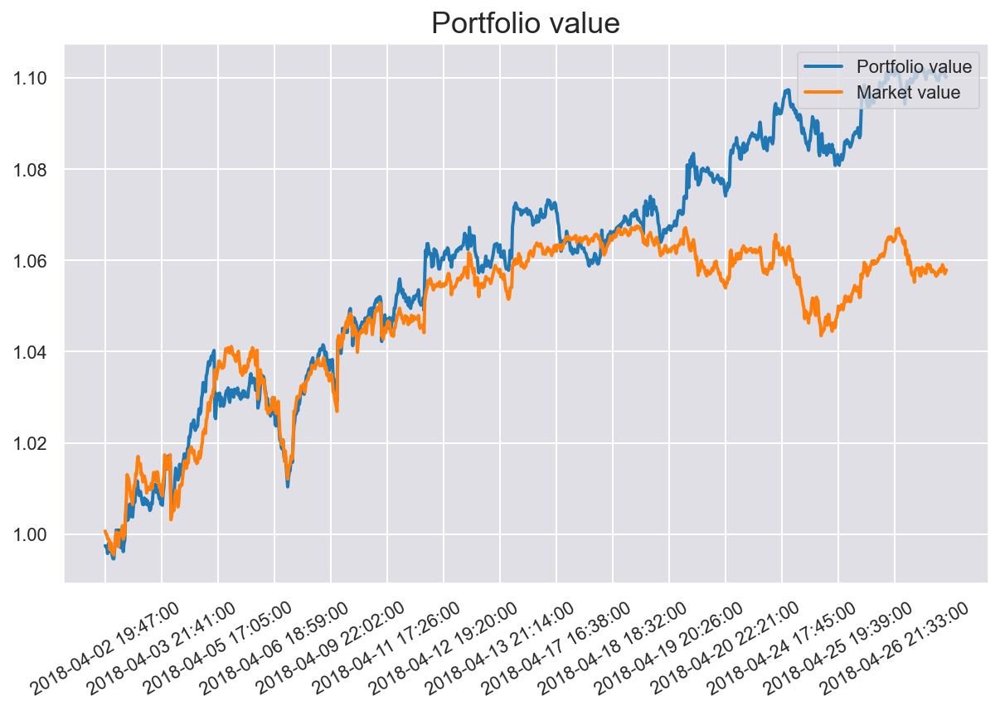

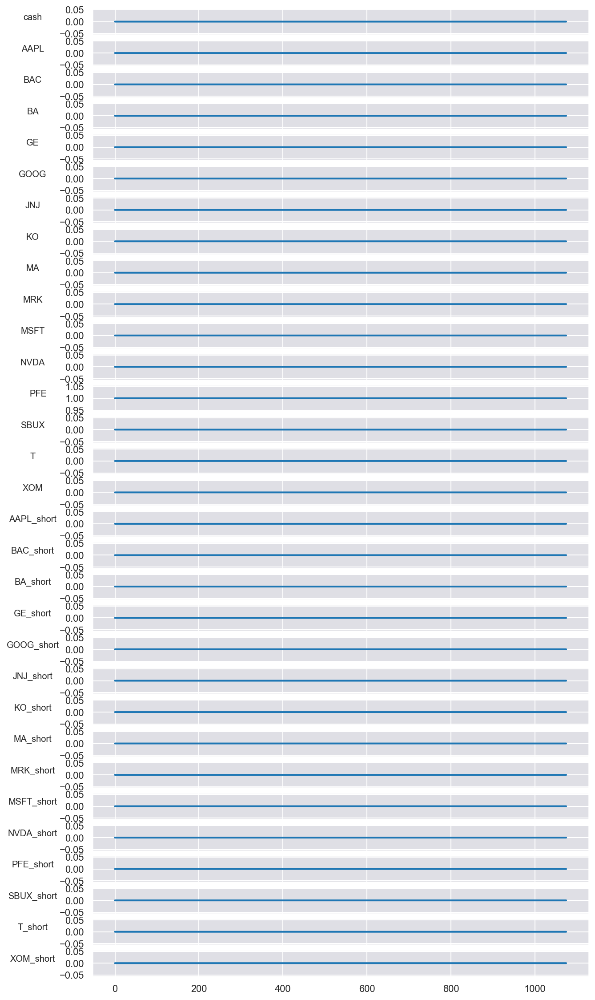

In [44]:
tf.reset_default_graph()
sess = tf.Session()
tflearn.config.init_training_mode()
action_dim = [nb_classes*2 + 1]
state_dim = [nb_classes + 1, window_length, 3]
variable_scope = get_variable_scope(window_length, predictor_type, use_batch_norm)
with tf.variable_scope(variable_scope):
    actor = StockActor(sess, state_dim, action_dim, action_bound, 1e-4, tau, batch_size, predictor_type, 
                       use_batch_norm)
    critic = StockCritic(sess=sess, state_dim=state_dim, action_dim=action_dim, tau=1e-3,
                         learning_rate=1e-3, num_actor_vars=actor.get_num_trainable_vars(), 
                         predictor_type=predictor_type, use_batch_norm=use_batch_norm)
    actor_noise = OrnsteinUhlenbeckActionNoise(mu=np.zeros(action_dim))

    model_save_path = "weights/"
    summary_path = get_result_path(window_length, predictor_type, use_batch_norm)

    ddpg_model = DDPG(environ, sess, actor, critic, actor_noise, param, obs_normalizer=obs_normalizer,
                       model_save_path=model_save_path,
                      summary_path=summary_path)
    ddpg_model.initialize(load_weights=False, verbose=False)
    ddpg_model.train()

env_Apr = PortfolioEnv(history_Apr, abbreviation, steps=history_Apr.shape[1]-200, window_length=window_length,
                   start_idx=data['Apr'].date_index.iloc[0])
test_model(env_Apr, ddpg_model)
plot_weights(env_Apr.infos)

Build model from scratch
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
1500
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 0, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field ty

c:\users\lenovo\appdata\local\programs\python\python39\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


Episode: 2, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 3, Reward: 1.00, Qmax: 0.0001
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 4, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 

Episode: 25, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 26, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 27, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.

Episode: 48, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 49, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 50, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 71, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 72, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 73, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 94, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 95, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 96, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 116, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 117, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 118, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 139, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 140, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 141, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 162, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 163, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 164, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 185, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 186, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 187, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 207, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 208, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 209, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 230, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 231, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 232, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 253, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 254, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 255, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 276, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 277, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 278, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 299, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 300, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 

Episode: 321, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 322, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 323, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 344, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 345, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 346, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 367, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 368, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 369, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 390, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 391, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 392, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 412, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 413, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 414, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 435, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 436, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 437, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 458, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.03 0.03 0.03]
Episode: 459, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.03 0.03 0.03]
Episode: 460, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 481, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
Episode: 482, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
Episode: 483, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 503, Reward: 1.00, Qmax: 0.0000
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
Episode: 504, Reward: 1.00, Qmax: 0.0000
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
Episode: 505, Reward: 1.00, Qmax: 0.0000
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 

Episode: 526, Reward: 1.00, Qmax: 0.0000
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
Episode: 527, Reward: 1.00, Qmax: 0.0000
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
Episode: 528, Reward: 1.00, Qmax: 0.0000
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 

Episode: 549, Reward: 1.00, Qmax: 0.0000
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03
 0.04 0.03 0.03]
Episode: 550, Reward: 1.00, Qmax: 0.0000
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03
 0.04 0.03 0.03]
Episode: 551, Reward: 1.00, Qmax: 0.0000
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 

Episode: 572, Reward: 1.00, Qmax: 0.0000
[0.02 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03
 0.04 0.03 0.03]
[0.02 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03
 0.04 0.03 0.03]
Episode: 573, Reward: 1.00, Qmax: 0.0000
[0.02 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03
 0.04 0.03 0.03]
Episode: 574, Reward: 1.00, Qmax: 0.0000
[0.02 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03
 0.04 0.03 0.03]
[0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 

Episode: 595, Reward: 1.00, Qmax: 0.0000
[0.02 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.02 0.03 0.04 0.02
 0.02 0.02 0.03 0.04 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.04 0.04 0.03
 0.04 0.02 0.03]
[0.02 0.04 0.03 0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.02 0.03 0.04 0.02
 0.02 0.02 0.03 0.04 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.04 0.04 0.03
 0.04 0.02 0.03]
Episode: 596, Reward: 1.00, Qmax: 0.0000
[0.02 0.04 0.03 0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.02 0.03 0.04 0.02
 0.02 0.02 0.03 0.04 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.04 0.04 0.03
 0.04 0.02 0.03]
[0.02 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.02 0.03 0.04 0.02
 0.03 0.02 0.03 0.04 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.04 0.04 0.03
 0.04 0.02 0.03]
Episode: 597, Reward: 1.00, Qmax: 0.0000
[0.02 0.04 0.02 0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.02 0.03 0.04 0.02
 0.02 0.02 0.03 0.04 0.04 0.04 0.04 0.04 0.04 0.03 0.03 0.04 0.04 0.03
 0.04 0.02 0.03]
[0.02 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.02 0.03 0.04 0.02
 0.02 0.02 

Episode: 617, Reward: 1.00, Qmax: 0.0000
[0.02 0.04 0.02 0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.02 0.02 0.04 0.02
 0.02 0.02 0.03 0.04 0.04 0.04 0.05 0.04 0.04 0.02 0.03 0.05 0.04 0.03
 0.05 0.02 0.03]
[0.02 0.04 0.02 0.03 0.03 0.03 0.04 0.04 0.04 0.02 0.02 0.02 0.05 0.02
 0.02 0.02 0.03 0.04 0.04 0.04 0.05 0.04 0.04 0.02 0.03 0.05 0.04 0.03
 0.05 0.02 0.03]
Episode: 618, Reward: 1.00, Qmax: 0.0000
[0.02 0.04 0.02 0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.02 0.02 0.04 0.02
 0.02 0.02 0.03 0.04 0.04 0.04 0.05 0.04 0.04 0.02 0.03 0.05 0.04 0.03
 0.05 0.02 0.03]
[0.02 0.04 0.02 0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.02 0.02 0.04 0.02
 0.02 0.02 0.03 0.04 0.04 0.04 0.05 0.04 0.04 0.02 0.03 0.05 0.04 0.03
 0.05 0.02 0.03]
Episode: 619, Reward: 1.00, Qmax: 0.0000
[0.02 0.04 0.02 0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.02 0.02 0.05 0.02
 0.02 0.02 0.03 0.04 0.04 0.04 0.05 0.04 0.04 0.02 0.03 0.05 0.04 0.03
 0.05 0.02 0.03]
[0.02 0.04 0.02 0.03 0.03 0.03 0.04 0.04 0.04 0.02 0.02 0.02 0.05 0.02
 0.02 0.02 

Episode: 640, Reward: 1.00, Qmax: 0.0000
[0.01 0.05 0.02 0.02 0.02 0.02 0.04 0.04 0.04 0.02 0.02 0.02 0.05 0.02
 0.02 0.02 0.04 0.04 0.05 0.04 0.06 0.05 0.04 0.02 0.02 0.06 0.05 0.02
 0.06 0.02 0.03]
[0.01 0.05 0.02 0.02 0.02 0.02 0.04 0.04 0.04 0.02 0.02 0.02 0.05 0.02
 0.02 0.02 0.04 0.04 0.05 0.04 0.06 0.04 0.04 0.02 0.02 0.06 0.04 0.03
 0.06 0.02 0.03]
Episode: 641, Reward: 1.00, Qmax: 0.0000
[0.01 0.05 0.02 0.02 0.02 0.02 0.04 0.03 0.04 0.02 0.01 0.02 0.05 0.01
 0.02 0.02 0.04 0.04 0.05 0.04 0.07 0.05 0.04 0.02 0.02 0.06 0.05 0.02
 0.06 0.02 0.02]
[0.01 0.05 0.02 0.02 0.02 0.02 0.04 0.03 0.04 0.02 0.01 0.02 0.05 0.01
 0.02 0.02 0.04 0.04 0.05 0.04 0.07 0.05 0.04 0.02 0.02 0.06 0.05 0.02
 0.06 0.02 0.02]
Episode: 642, Reward: 1.00, Qmax: 0.0000
[0.01 0.05 0.02 0.02 0.02 0.02 0.04 0.03 0.04 0.02 0.01 0.02 0.06 0.01
 0.01 0.01 0.04 0.04 0.05 0.04 0.07 0.05 0.04 0.02 0.02 0.07 0.05 0.02
 0.06 0.02 0.02]
[0.01 0.05 0.02 0.02 0.02 0.02 0.04 0.04 0.04 0.02 0.02 0.02 0.05 0.02
 0.02 0.02 

Episode: 663, Reward: 1.00, Qmax: 0.0000
[0.01 0.06 0.01 0.01 0.01 0.01 0.04 0.03 0.04 0.01 0.01 0.01 0.07 0.01
 0.01 0.01 0.03 0.04 0.06 0.04 0.1  0.05 0.04 0.01 0.01 0.09 0.05 0.02
 0.09 0.01 0.02]
[0.01 0.06 0.01 0.01 0.02 0.02 0.04 0.03 0.04 0.01 0.01 0.01 0.06 0.01
 0.01 0.01 0.04 0.04 0.06 0.04 0.09 0.05 0.04 0.01 0.01 0.08 0.05 0.02
 0.08 0.01 0.02]
Episode: 664, Reward: 1.00, Qmax: 0.0000
[0.01 0.06 0.01 0.01 0.02 0.01 0.04 0.03 0.04 0.01 0.01 0.01 0.06 0.01
 0.01 0.01 0.04 0.04 0.06 0.04 0.09 0.05 0.04 0.01 0.01 0.08 0.05 0.02
 0.08 0.01 0.02]
[0.01 0.06 0.01 0.01 0.02 0.01 0.04 0.03 0.04 0.01 0.01 0.01 0.06 0.01
 0.01 0.01 0.04 0.04 0.06 0.04 0.09 0.05 0.04 0.01 0.01 0.08 0.05 0.02
 0.08 0.01 0.02]
Episode: 665, Reward: 1.00, Qmax: 0.0000
[0.01 0.06 0.01 0.02 0.02 0.02 0.04 0.03 0.04 0.01 0.01 0.01 0.06 0.01
 0.01 0.01 0.04 0.04 0.05 0.04 0.09 0.05 0.04 0.01 0.02 0.08 0.05 0.02
 0.08 0.01 0.02]
[0.01 0.06 0.01 0.01 0.02 0.01 0.04 0.03 0.04 0.01 0.01 0.01 0.06 0.01
 0.01 0.01 

Episode: 686, Reward: 1.00, Qmax: 0.0000
[0.   0.05 0.   0.   0.   0.   0.02 0.01 0.02 0.   0.   0.   0.06 0.
 0.   0.   0.02 0.02 0.07 0.02 0.22 0.06 0.04 0.   0.   0.14 0.06 0.
 0.15 0.   0.01]
[0.   0.06 0.   0.   0.   0.   0.02 0.01 0.03 0.   0.   0.   0.06 0.
 0.   0.   0.02 0.02 0.07 0.03 0.2  0.06 0.04 0.   0.   0.13 0.06 0.01
 0.14 0.   0.01]
Episode: 687, Reward: 1.00, Qmax: 0.0000
[0.   0.05 0.   0.   0.   0.   0.02 0.01 0.03 0.   0.   0.   0.06 0.
 0.   0.   0.02 0.02 0.07 0.03 0.21 0.06 0.04 0.   0.   0.13 0.06 0.01
 0.14 0.   0.01]
[0.   0.05 0.   0.   0.   0.   0.02 0.01 0.02 0.   0.   0.   0.06 0.
 0.   0.   0.02 0.02 0.07 0.02 0.23 0.06 0.03 0.   0.   0.14 0.06 0.
 0.15 0.   0.01]
Episode: 688, Reward: 1.00, Qmax: 0.0000
[0.   0.05 0.   0.   0.   0.   0.02 0.01 0.02 0.   0.   0.   0.05 0.
 0.   0.   0.02 0.02 0.07 0.02 0.23 0.06 0.03 0.   0.   0.14 0.06 0.
 0.15 0.   0.01]
[0.   0.06 0.   0.01 0.01 0.01 0.02 0.02 0.03 0.01 0.   0.01 0.06 0.
 0.   0.   0.03 0.03 0.07 0.0

Episode: 702, Reward: 1.00, Qmax: 0.0000
[7.53e-05 2.41e-02 2.44e-04 4.47e-04 5.78e-04 6.26e-04 4.51e-03 3.08e-03
 9.16e-03 4.44e-04 1.29e-04 2.87e-04 2.67e-02 1.53e-04 2.05e-04 2.13e-04
 7.60e-03 5.94e-03 5.00e-02 7.58e-03 4.51e-01 3.86e-02 1.39e-02 3.06e-04
 4.25e-04 1.05e-01 5.38e-02 8.13e-04 1.93e-01 2.06e-04 1.57e-03]
[2.59e-05 1.83e-02 9.88e-05 1.96e-04 2.63e-04 2.88e-04 2.72e-03 1.76e-03
 6.09e-03 1.95e-04 4.76e-05 1.19e-04 2.06e-02 5.82e-05 8.12e-05 8.48e-05
 4.93e-03 3.71e-03 4.20e-02 4.90e-03 5.13e-01 3.12e-02 9.78e-03 1.28e-04
 1.85e-04 9.72e-02 4.56e-02 3.87e-04 1.95e-01 8.13e-05 8.21e-04]
Episode: 703, Reward: 1.00, Qmax: 0.0000
[2.50e-05 1.73e-02 9.54e-05 1.89e-04 2.53e-04 2.78e-04 2.59e-03 1.70e-03
 5.82e-03 1.89e-04 4.60e-05 1.15e-04 1.95e-02 5.62e-05 7.85e-05 8.18e-05
 4.71e-03 3.55e-03 4.01e-02 4.67e-03 5.27e-01 3.00e-02 9.27e-03 1.23e-04
 1.79e-04 9.24e-02 4.47e-02 3.72e-04 1.94e-01 7.85e-05 7.90e-04]
[1.82e-05 1.59e-02 7.28e-05 1.48e-04 2.00e-04 2.20e-04 2.22e-03 1.

Episode: 716, Reward: 1.00, Qmax: 0.0000
[1.45e-07 1.34e-03 1.03e-06 2.75e-06 4.19e-06 4.82e-06 1.01e-04 7.08e-05
 3.20e-04 2.86e-06 3.53e-07 1.36e-06 1.70e-03 4.81e-07 7.86e-07 8.25e-07
 2.42e-04 1.74e-04 4.73e-03 2.40e-04 8.88e-01 3.28e-03 5.83e-04 1.52e-06
 2.57e-06 1.53e-02 7.11e-03 7.06e-06 7.62e-02 7.77e-07 2.07e-05]
[2.10e-07 1.55e-03 1.42e-06 3.71e-06 5.59e-06 6.42e-06 1.25e-04 8.83e-05
 3.85e-04 3.85e-06 5.00e-07 1.87e-06 1.96e-03 6.78e-07 1.09e-06 1.15e-06
 2.93e-04 2.12e-04 5.33e-03 2.91e-04 8.80e-01 3.72e-03 6.90e-04 2.08e-06
 3.48e-06 1.68e-02 7.92e-03 9.32e-06 8.02e-02 1.08e-06 2.67e-05]
Episode: 717, Reward: 1.00, Qmax: 0.0000
[4.19e-07 1.94e-03 2.58e-06 6.42e-06 9.47e-06 1.08e-05 1.79e-04 1.31e-04
 5.18e-04 6.66e-06 9.57e-07 3.34e-06 2.42e-03 1.28e-06 2.01e-06 2.10e-06
 4.01e-04 2.98e-04 6.21e-03 4.00e-04 8.73e-01 4.42e-03 9.01e-04 3.71e-06
 6.04e-06 1.83e-02 9.08e-03 1.54e-05 8.13e-02 1.99e-06 4.16e-05]
[5.88e-07 2.22e-03 3.47e-06 8.45e-06 1.23e-05 1.40e-05 2.17e-04 1.

Episode: 730, Reward: 1.00, Qmax: 0.0000
[7.20e-10 6.46e-05 9.06e-09 3.17e-08 5.45e-08 6.54e-08 2.81e-06 2.06e-06
 1.14e-05 3.41e-08 2.27e-09 1.30e-08 8.97e-05 3.42e-09 6.44e-09 6.84e-09
 8.43e-06 5.92e-06 2.93e-04 8.59e-06 9.89e-01 1.86e-04 2.45e-05 1.51e-08
 2.92e-08 1.19e-03 4.93e-04 1.04e-07 8.37e-03 6.33e-09 4.08e-07]
[5.04e-10 5.48e-05 6.62e-09 2.36e-08 4.11e-08 4.94e-08 2.26e-06 1.65e-06
 9.42e-06 2.55e-08 1.62e-09 9.57e-09 7.66e-05 2.46e-09 4.68e-09 4.97e-09
 6.92e-06 4.83e-06 2.55e-04 7.05e-06 9.90e-01 1.61e-04 2.04e-05 1.12e-08
 2.18e-08 1.06e-03 4.34e-04 7.92e-08 7.73e-03 4.60e-09 3.18e-07]
Episode: 731, Reward: 1.00, Qmax: 0.0000
[1.87e-10 3.36e-05 2.76e-09 1.04e-08 1.85e-08 2.25e-08 1.21e-06 8.77e-07
 5.37e-06 1.13e-08 6.34e-10 4.05e-09 4.77e-05 9.78e-10 1.92e-09 2.04e-09
 3.90e-06 2.68e-06 1.67e-04 3.97e-06 9.93e-01 1.03e-04 1.20e-05 4.76e-09
 9.55e-09 7.31e-04 2.89e-04 3.68e-08 5.74e-03 1.88e-09 1.57e-07]
[2.19e-10 3.62e-05 3.17e-09 1.18e-08 2.10e-08 2.55e-08 1.33e-06 9.

Episode: 744, Reward: 1.00, Qmax: 0.0000
[7.26e-11 1.65e-05 1.16e-09 4.51e-09 8.17e-09 9.97e-09 5.75e-07 4.29e-07
 2.59e-06 4.92e-09 2.55e-10 1.72e-09 2.37e-05 3.98e-10 7.96e-10 8.50e-10
 1.89e-06 1.32e-06 8.11e-05 1.94e-06 9.97e-01 4.99e-05 5.92e-06 2.03e-09
 4.13e-09 3.48e-04 1.39e-04 1.64e-08 2.46e-03 7.83e-10 7.25e-08]
[8.56e-11 1.78e-05 1.34e-09 5.16e-09 9.32e-09 1.14e-08 6.36e-07 4.76e-07
 2.83e-06 5.63e-09 2.98e-10 1.98e-09 2.56e-05 4.64e-10 9.23e-10 9.85e-10
 2.08e-06 1.45e-06 8.67e-05 2.13e-06 9.97e-01 5.35e-05 6.45e-06 2.34e-09
 4.73e-09 3.68e-04 1.48e-04 1.86e-08 2.57e-03 9.08e-10 8.15e-08]
Episode: 745, Reward: 1.00, Qmax: 0.0000
[2.19e-10 2.75e-05 3.05e-09 1.12e-08 1.96e-08 2.37e-08 1.13e-06 8.54e-07
 4.71e-06 1.21e-08 7.23e-10 4.45e-09 3.88e-05 1.11e-09 2.14e-09 2.28e-09
 3.50e-06 2.49e-06 1.25e-04 3.60e-06 9.96e-01 7.86e-05 1.04e-05 5.21e-09
 1.03e-08 4.98e-04 2.08e-04 3.81e-08 3.18e-03 2.11e-09 1.57e-07]
[1.16e-10 2.03e-05 1.75e-09 6.63e-09 1.19e-08 1.44e-08 7.63e-07 5.

Episode: 758, Reward: 1.00, Qmax: 0.0000
[4.36e-11 1.17e-05 7.28e-10 2.90e-09 5.31e-09 6.50e-09 3.95e-07 2.97e-07
 1.81e-06 3.17e-09 1.56e-10 1.09e-09 1.70e-05 2.46e-10 4.98e-10 5.32e-10
 1.33e-06 9.22e-07 5.83e-05 1.36e-06 9.98e-01 3.56e-05 4.20e-06 1.29e-09
 2.65e-09 2.49e-04 9.86e-05 1.07e-08 1.66e-03 4.90e-10 4.87e-08]
[5.85e-11 1.35e-05 9.44e-10 3.69e-09 6.72e-09 8.20e-09 4.74e-07 3.58e-07
 2.13e-06 4.04e-09 2.07e-10 1.40e-09 1.95e-05 3.24e-10 6.49e-10 6.93e-10
 1.57e-06 1.09e-06 6.57e-05 1.61e-06 9.98e-01 4.04e-05 4.89e-06 1.66e-09
 3.38e-09 2.75e-04 1.10e-04 1.35e-08 1.80e-03 6.38e-10 6.00e-08]
Episode: 759, Reward: 1.00, Qmax: 0.0000
[7.24e-11 1.49e-05 1.14e-09 4.40e-09 7.95e-09 9.70e-09 5.40e-07 4.08e-07
 2.39e-06 4.81e-09 2.53e-10 1.69e-09 2.14e-05 3.95e-10 7.85e-10 8.38e-10
 1.77e-06 1.24e-06 7.14e-05 1.81e-06 9.98e-01 4.41e-05 5.45e-06 1.99e-09
 4.03e-09 2.95e-04 1.19e-04 1.59e-08 1.89e-03 7.72e-10 6.96e-08]
[2.94e-11 9.70e-06 5.13e-10 2.09e-09 3.87e-09 4.75e-09 3.09e-07 2.

Episode: 772, Reward: 1.00, Qmax: 0.0000
[4.00e-11 1.09e-05 6.71e-10 2.68e-09 4.91e-09 6.02e-09 3.67e-07 2.77e-07
 1.68e-06 2.93e-09 1.44e-10 1.00e-09 1.58e-05 2.27e-10 4.59e-10 4.91e-10
 1.23e-06 8.59e-07 5.39e-05 1.27e-06 9.98e-01 3.30e-05 3.91e-06 1.19e-09
 2.45e-09 2.28e-04 9.04e-05 9.95e-09 1.47e-03 4.51e-10 4.52e-08]
[9.03e-12 5.36e-06 1.81e-10 7.85e-10 1.50e-09 1.86e-09 1.46e-07 1.08e-07
 7.35e-07 8.65e-10 3.51e-11 2.77e-10 7.95e-06 5.70e-11 1.21e-10 1.30e-10
 5.30e-07 3.60e-07 2.92e-05 5.45e-07 9.99e-01 1.74e-05 1.80e-06 3.32e-10
 7.13e-10 1.35e-04 5.06e-05 3.16e-09 9.79e-04 1.18e-10 1.58e-08]
Episode: 773, Reward: 1.00, Qmax: 0.0000
[1.37e-11 6.53e-06 2.60e-10 1.10e-09 2.08e-09 2.58e-09 1.89e-07 1.40e-07
 9.25e-07 1.22e-09 5.20e-11 3.97e-10 9.61e-06 8.38e-11 1.75e-10 1.88e-10
 6.70e-07 4.58e-07 3.46e-05 6.89e-07 9.99e-01 2.07e-05 2.23e-06 4.74e-10
 1.01e-09 1.56e-04 5.94e-05 4.35e-09 1.09e-03 1.72e-10 2.12e-08]
[1.78e-11 7.40e-06 3.28e-10 1.37e-09 2.57e-09 3.17e-09 2.22e-07 1.

Episode: 786, Reward: 1.00, Qmax: 0.0000
[1.26e-11 6.19e-06 2.41e-10 1.03e-09 1.94e-09 2.40e-09 1.78e-07 1.32e-07
 8.74e-07 1.13e-09 4.80e-11 3.68e-10 9.13e-06 7.75e-11 1.62e-10 1.74e-10
 6.34e-07 4.33e-07 3.29e-05 6.51e-07 9.99e-01 1.97e-05 2.12e-06 4.40e-10
 9.35e-10 1.48e-04 5.62e-05 4.06e-09 1.02e-03 1.59e-10 1.99e-08]
[1.61e-11 6.97e-06 3.00e-10 1.26e-09 2.37e-09 2.92e-09 2.07e-07 1.54e-07
 1.00e-06 1.39e-09 6.07e-11 4.56e-10 1.02e-05 9.74e-11 2.02e-10 2.17e-10
 7.29e-07 5.00e-07 3.64e-05 7.49e-07 9.99e-01 2.19e-05 2.41e-06 5.44e-10
 1.15e-09 1.61e-04 6.19e-05 4.91e-09 1.09e-03 1.99e-10 2.36e-08]
Episode: 787, Reward: 1.00, Qmax: 0.0000
[1.12e-11 5.85e-06 2.17e-10 9.32e-10 1.77e-09 2.19e-09 1.65e-07 1.23e-07
 8.18e-07 1.03e-09 4.29e-11 3.32e-10 8.64e-06 6.94e-11 1.46e-10 1.56e-10
 5.92e-07 4.03e-07 3.13e-05 6.08e-07 9.99e-01 1.87e-05 1.99e-06 3.97e-10
 8.48e-10 1.42e-04 5.36e-05 3.71e-09 9.85e-04 1.43e-10 1.83e-08]
[1.60e-11 6.95e-06 2.99e-10 1.26e-09 2.36e-09 2.91e-09 2.07e-07 1.

Episode: 800, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[3.74e-12 3.43e-06 8.27e-11 3.77e-10 7.35e-10 9.19e-10 8.34e-08 6.11e-08
 4.41e-07 4.17e-10 1.52e-11 1.29e-10 5.15e-06 2.51e-11 5.45e-11 5.87e-11
 3.16e-07 2.11e-07 1.98e-05 3.24e-07 9.99e-01 1.16e-05 1.12e-06 1.55e-10
 3.41e-10 9.47e-05 3.45e-05 1.59e-09 7.06e-04 5.35e-11 8.39e-09]
[2.08e-11 7.81e-06 3.77e-10 1.56e-09 2.90e-09 3.57e-09 2.42e-07 1.81e-07
 1.15e-06 1.71e-09 7.74e-11 5.69e-10 1.14e-05 1.24e-10 2.55e-10 2.73e-10
 8.39e-07 5.78e-07 4.01e-05 8.62e-07 9.99e-01 2.43e-05 2.73e-06 6.78e-10
 1.42e-09 1.73e-04 6.75e-05 5.98e-09 1.13e-03 2.51e-10 2.83e-08]
Episode: 801, Reward: 1.00,

Episode: 813, Reward: 1.00, Qmax: 0.0000
[3.31e-11 9.70e-06 5.66e-10 2.28e-09 4.19e-09 5.14e-09 3.21e-07 2.42e-07
 1.48e-06 2.50e-09 1.20e-10 8.49e-10 1.41e-05 1.90e-10 3.86e-10 4.13e-10
 1.09e-06 7.55e-07 4.83e-05 1.12e-06 9.98e-01 2.95e-05 3.46e-06 1.01e-09
 2.08e-09 2.02e-04 8.04e-05 8.52e-09 1.26e-03 3.80e-10 3.91e-08]
[9.03e-12 5.21e-06 1.80e-10 7.79e-10 1.48e-09 1.84e-09 1.43e-07 1.06e-07
 7.18e-07 8.59e-10 3.51e-11 2.76e-10 7.70e-06 5.69e-11 1.20e-10 1.29e-10
 5.19e-07 3.53e-07 2.82e-05 5.33e-07 9.99e-01 1.68e-05 1.76e-06 3.30e-10
 7.08e-10 1.28e-04 4.84e-05 3.13e-09 8.81e-04 1.18e-10 1.56e-08]
Episode: 814, Reward: 1.00, Qmax: 0.0000
[7.52e-12 4.77e-06 1.53e-10 6.69e-10 1.28e-09 1.59e-09 1.28e-07 9.46e-08
 6.48e-07 7.39e-10 2.95e-11 2.35e-10 7.07e-06 4.80e-11 1.02e-10 1.10e-10
 4.68e-07 3.17e-07 2.62e-05 4.80e-07 9.99e-01 1.56e-05 1.60e-06 2.82e-10
 6.08e-10 1.20e-04 4.50e-05 2.72e-09 8.36e-04 1.00e-10 1.37e-08]
[6.60e-11 1.35e-05 1.04e-09 4.02e-09 7.28e-09 8.88e-09 4.93e-07 3.

Episode: 827, Reward: 1.00, Qmax: 0.0000
[8.05e-12 4.91e-06 1.62e-10 7.08e-10 1.35e-09 1.68e-09 1.33e-07 9.87e-08
 6.72e-07 7.81e-10 3.14e-11 2.50e-10 7.28e-06 5.11e-11 1.08e-10 1.16e-10
 4.85e-07 3.29e-07 2.68e-05 4.98e-07 9.99e-01 1.60e-05 1.65e-06 2.99e-10
 6.43e-10 1.22e-04 4.61e-05 2.86e-09 8.40e-04 1.06e-10 1.44e-08]
[1.43e-11 6.45e-06 2.69e-10 1.13e-09 2.14e-09 2.64e-09 1.90e-07 1.42e-07
 9.23e-07 1.25e-09 5.40e-11 4.09e-10 9.48e-06 8.69e-11 1.81e-10 1.94e-10
 6.72e-07 4.60e-07 3.39e-05 6.89e-07 9.99e-01 2.05e-05 2.22e-06 4.88e-10
 1.03e-09 1.49e-04 5.76e-05 4.45e-09 9.84e-04 1.78e-10 2.15e-08]
Episode: 828, Reward: 1.00, Qmax: 0.0000
[1.81e-10 2.18e-05 2.53e-09 9.24e-09 1.63e-08 1.97e-08 9.20e-07 7.07e-07
 3.81e-06 1.01e-08 5.99e-10 3.69e-09 3.08e-05 9.19e-10 1.77e-09 1.89e-09
 2.86e-06 2.04e-06 9.70e-05 2.93e-06 9.97e-01 6.15e-05 8.37e-06 4.32e-09
 8.49e-09 3.65e-04 1.56e-04 3.15e-08 1.99e-03 1.75e-09 1.30e-07]
[5.97e-10 3.87e-05 7.26e-09 2.47e-08 4.22e-08 5.06e-08 1.93e-06 1.

Episode: 841, Reward: 1.00, Qmax: 0.0000
[8.31e-11 1.50e-05 1.27e-09 4.85e-09 8.73e-09 1.06e-08 5.67e-07 4.31e-07
 2.46e-06 5.31e-09 2.86e-10 1.88e-09 2.14e-05 4.46e-10 8.80e-10 9.40e-10
 1.83e-06 1.29e-06 7.02e-05 1.88e-06 9.98e-01 4.39e-05 5.57e-06 2.21e-09
 4.45e-09 2.76e-04 1.15e-04 1.73e-08 1.59e-03 8.67e-10 7.48e-08]
[8.29e-11 1.50e-05 1.27e-09 4.85e-09 8.72e-09 1.06e-08 5.66e-07 4.31e-07
 2.46e-06 5.30e-09 2.86e-10 1.87e-09 2.14e-05 4.45e-10 8.79e-10 9.38e-10
 1.83e-06 1.29e-06 7.01e-05 1.88e-06 9.98e-01 4.39e-05 5.56e-06 2.21e-09
 4.44e-09 2.75e-04 1.15e-04 1.73e-08 1.59e-03 8.66e-10 7.47e-08]
Episode: 842, Reward: 1.00, Qmax: 0.0000
[6.33e-11 1.31e-05 1.00e-09 3.88e-09 7.02e-09 8.57e-09 4.78e-07 3.63e-07
 2.11e-06 4.24e-09 2.21e-10 1.48e-09 1.89e-05 3.46e-10 6.89e-10 7.37e-10
 1.57e-06 1.10e-06 6.26e-05 1.61e-06 9.98e-01 3.90e-05 4.83e-06 1.75e-09
 3.55e-09 2.50e-04 1.03e-04 1.40e-08 1.47e-03 6.79e-10 6.17e-08]
[1.93e-10 2.25e-05 2.68e-09 9.74e-09 1.71e-08 2.07e-08 9.57e-07 7.

Episode: 855, Reward: 1.00, Qmax: 0.0000
[1.13e-11 5.76e-06 2.19e-10 9.37e-10 1.77e-09 2.20e-09 1.64e-07 1.22e-07
 8.09e-07 1.03e-09 4.34e-11 3.35e-10 8.49e-06 7.01e-11 1.47e-10 1.58e-10
 5.88e-07 4.01e-07 3.08e-05 6.03e-07 9.99e-01 1.86e-05 1.97e-06 4.00e-10
 8.52e-10 1.35e-04 5.25e-05 3.72e-09 9.14e-04 1.44e-10 1.83e-08]
[9.38e-12 5.27e-06 1.86e-10 8.02e-10 1.53e-09 1.89e-09 1.46e-07 1.09e-07
 7.29e-07 8.85e-10 3.63e-11 2.85e-10 7.78e-06 5.89e-11 1.24e-10 1.33e-10
 5.28e-07 3.59e-07 2.85e-05 5.42e-07 9.99e-01 1.71e-05 1.78e-06 3.41e-10
 7.29e-10 1.27e-04 4.88e-05 3.22e-09 8.68e-04 1.22e-10 1.60e-08]
Episode: 856, Reward: 1.00, Qmax: 0.0000
[6.12e-12 4.29e-06 1.27e-10 5.64e-10 1.09e-09 1.35e-09 1.12e-07 8.28e-08
 5.75e-07 6.24e-10 2.43e-11 1.97e-10 6.38e-06 3.97e-11 8.47e-11 9.11e-11
 4.14e-07 2.80e-07 2.39e-05 4.25e-07 9.99e-01 1.42e-05 1.43e-06 2.36e-10
 5.12e-10 1.09e-04 4.13e-05 2.32e-09 7.71e-04 8.32e-11 1.18e-08]
[5.06e-12 3.92e-06 1.08e-10 4.82e-10 9.32e-10 1.16e-09 9.97e-08 7.

Episode: 869, Reward: 1.00, Qmax: 0.0000
[3.01e-11 9.20e-06 5.19e-10 2.10e-09 3.87e-09 4.76e-09 3.01e-07 2.27e-07
 1.40e-06 2.30e-09 1.09e-10 7.80e-10 1.34e-05 1.74e-10 3.53e-10 3.79e-10
 1.03e-06 7.11e-07 4.61e-05 1.05e-06 9.98e-01 2.84e-05 3.27e-06 9.26e-10
 1.92e-09 1.91e-04 7.70e-05 7.90e-09 1.20e-03 3.48e-10 3.64e-08]
[5.08e-11 1.18e-05 8.25e-10 3.23e-09 5.89e-09 7.20e-09 4.17e-07 3.16e-07
 1.87e-06 3.54e-09 1.80e-10 1.23e-09 1.70e-05 2.82e-10 5.66e-10 6.05e-10
 1.38e-06 9.66e-07 5.72e-05 1.42e-06 9.98e-01 3.56e-05 4.30e-06 1.45e-09
 2.96e-09 2.30e-04 9.45e-05 1.18e-08 1.39e-03 5.57e-10 5.28e-08]
Episode: 870, Reward: 1.00, Qmax: 0.0000
[6.46e-12 4.41e-06 1.34e-10 5.90e-10 1.13e-09 1.41e-09 1.16e-07 8.57e-08
 5.92e-07 6.51e-10 2.55e-11 2.06e-10 6.55e-06 4.17e-11 8.89e-11 9.55e-11
 4.27e-07 2.89e-07 2.44e-05 4.39e-07 9.99e-01 1.46e-05 1.47e-06 2.47e-10
 5.35e-10 1.11e-04 4.22e-05 2.41e-09 7.86e-04 8.73e-11 1.23e-08]
[7.20e-12 4.64e-06 1.47e-10 6.45e-10 1.24e-09 1.54e-09 1.24e-07 9.

Episode: 883, Reward: 1.00, Qmax: 0.0000
[9.16e-11 1.57e-05 1.39e-09 5.26e-09 9.44e-09 1.15e-08 6.01e-07 4.58e-07
 2.59e-06 5.75e-09 3.14e-10 2.04e-09 2.24e-05 4.88e-10 9.61e-10 1.03e-09
 1.93e-06 1.36e-06 7.29e-05 1.98e-06 9.98e-01 4.60e-05 5.84e-06 2.41e-09
 4.82e-09 2.81e-04 1.19e-04 1.86e-08 1.63e-03 9.47e-10 8.01e-08]
[7.42e-12 4.70e-06 1.51e-10 6.61e-10 1.27e-09 1.57e-09 1.26e-07 9.35e-08
 6.39e-07 7.30e-10 2.91e-11 2.32e-10 6.97e-06 4.74e-11 1.01e-10 1.08e-10
 4.62e-07 3.13e-07 2.58e-05 4.74e-07 9.99e-01 1.55e-05 1.58e-06 2.79e-10
 6.00e-10 1.16e-04 4.45e-05 2.69e-09 8.11e-04 9.89e-11 1.35e-08]
Episode: 884, Reward: 1.00, Qmax: 0.0000
[1.41e-11 6.39e-06 2.65e-10 1.12e-09 2.11e-09 2.61e-09 1.88e-07 1.40e-07
 9.13e-07 1.23e-09 5.32e-11 4.04e-10 9.39e-06 8.57e-11 1.79e-10 1.92e-10
 6.65e-07 4.55e-07 3.37e-05 6.82e-07 9.99e-01 2.05e-05 2.20e-06 4.82e-10
 1.02e-09 1.45e-04 5.73e-05 4.39e-09 9.69e-04 1.75e-10 2.13e-08]
[8.78e-12 5.09e-06 1.75e-10 7.60e-10 1.45e-09 1.80e-09 1.40e-07 1.

Episode: 897, Reward: 1.00, Qmax: 0.0000
[6.80e-12 4.49e-06 1.40e-10 6.14e-10 1.18e-09 1.47e-09 1.19e-07 8.83e-08
 6.07e-07 6.78e-10 2.68e-11 2.15e-10 6.67e-06 4.37e-11 9.30e-11 9.99e-11
 4.38e-07 2.97e-07 2.49e-05 4.50e-07 9.99e-01 1.49e-05 1.50e-06 2.58e-10
 5.58e-10 1.11e-04 4.30e-05 2.51e-09 7.81e-04 9.13e-11 1.27e-08]
[7.84e-12 4.81e-06 1.58e-10 6.92e-10 1.32e-09 1.64e-09 1.31e-07 9.67e-08
 6.57e-07 7.63e-10 3.06e-11 2.44e-10 7.13e-06 4.99e-11 1.06e-10 1.14e-10
 4.76e-07 3.23e-07 2.64e-05 4.88e-07 9.99e-01 1.59e-05 1.62e-06 2.92e-10
 6.28e-10 1.17e-04 4.55e-05 2.80e-09 8.13e-04 1.04e-10 1.41e-08]
Episode: 898, Reward: 1.00, Qmax: 0.0000
[2.84e-11 8.91e-06 4.94e-10 2.00e-09 3.70e-09 4.54e-09 2.90e-07 2.18e-07
 1.35e-06 2.19e-09 1.04e-10 7.42e-10 1.29e-05 1.65e-10 3.36e-10 3.59e-10
 9.89e-07 6.85e-07 4.49e-05 1.01e-06 9.98e-01 2.77e-05 3.17e-06 8.81e-10
 1.82e-09 1.85e-04 7.53e-05 7.54e-09 1.16e-03 3.30e-10 3.49e-08]
[2.08e-11 7.67e-06 3.75e-10 1.55e-09 2.88e-09 3.55e-09 2.39e-07 1.

Episode: 910, Reward: 1.00, Qmax: 0.0000
[1.93e-11 7.40e-06 3.50e-10 1.45e-09 2.71e-09 3.34e-09 2.28e-07 1.71e-07
 1.08e-06 1.60e-09 7.18e-11 5.30e-10 1.08e-05 1.15e-10 2.37e-10 2.54e-10
 7.93e-07 5.46e-07 3.83e-05 8.13e-07 9.99e-01 2.35e-05 2.59e-06 6.32e-10
 1.32e-09 1.61e-04 6.49e-05 5.59e-09 1.04e-03 2.33e-10 2.65e-08]
[3.44e-11 9.78e-06 5.84e-10 2.34e-09 4.31e-09 5.28e-09 3.27e-07 2.46e-07
 1.50e-06 2.57e-09 1.24e-10 8.75e-10 1.42e-05 1.97e-10 3.99e-10 4.27e-10
 1.10e-06 7.67e-07 4.86e-05 1.13e-06 9.98e-01 3.02e-05 3.50e-06 1.04e-09
 2.14e-09 1.98e-04 8.14e-05 8.74e-09 1.22e-03 3.92e-10 4.00e-08]
Episode: 911, Reward: 1.00, Qmax: 0.0000
[9.04e-12 5.15e-06 1.80e-10 7.77e-10 1.48e-09 1.84e-09 1.43e-07 1.06e-07
 7.11e-07 8.57e-10 3.51e-11 2.75e-10 7.62e-06 5.69e-11 1.20e-10 1.29e-10
 5.16e-07 3.51e-07 2.80e-05 5.29e-07 9.99e-01 1.70e-05 1.74e-06 3.30e-10
 7.06e-10 1.23e-04 4.83e-05 3.12e-09 8.43e-04 1.18e-10 1.55e-08]
[8.53e-12 5.01e-06 1.71e-10 7.41e-10 1.41e-09 1.75e-09 1.37e-07 1.

Episode: 924, Reward: 1.00, Qmax: 0.0000
[1.42e-11 6.40e-06 2.67e-10 1.13e-09 2.12e-09 2.62e-09 1.88e-07 1.41e-07
 9.14e-07 1.24e-09 5.36e-11 4.06e-10 9.39e-06 8.63e-11 1.80e-10 1.93e-10
 6.66e-07 4.56e-07 3.38e-05 6.83e-07 9.99e-01 2.07e-05 2.20e-06 4.85e-10
 1.02e-09 1.45e-04 5.78e-05 4.41e-09 9.61e-04 1.77e-10 2.14e-08]
[2.14e-11 7.82e-06 3.85e-10 1.59e-09 2.95e-09 3.64e-09 2.44e-07 1.83e-07
 1.15e-06 1.74e-09 7.94e-11 5.81e-10 1.14e-05 1.27e-10 2.61e-10 2.79e-10
 8.44e-07 5.83e-07 4.02e-05 8.67e-07 9.99e-01 2.48e-05 2.74e-06 6.92e-10
 1.45e-09 1.68e-04 6.81e-05 6.08e-09 1.08e-03 2.56e-10 2.86e-08]
Episode: 925, Reward: 1.00, Qmax: 0.0000
[3.30e-12 3.18e-06 7.37e-11 3.38e-10 6.61e-10 8.27e-10 7.63e-08 5.59e-08
 4.06e-07 3.75e-10 1.35e-11 1.15e-10 4.78e-06 2.23e-11 4.86e-11 5.23e-11
 2.91e-07 1.94e-07 1.85e-05 2.98e-07 9.99e-01 1.10e-05 1.03e-06 1.39e-10
 3.06e-10 8.63e-05 3.27e-05 1.44e-09 6.41e-04 4.77e-11 7.62e-09]
[9.96e-12 5.40e-06 1.96e-10 8.42e-10 1.60e-09 1.98e-09 1.51e-07 1.

Episode: 938, Reward: 1.00, Qmax: 0.0000
[2.47e-11 8.37e-06 4.36e-10 1.78e-09 3.31e-09 4.06e-09 2.66e-07 2.00e-07
 1.25e-06 1.96e-09 9.07e-11 6.57e-10 1.22e-05 1.44e-10 2.96e-10 3.17e-10
 9.15e-07 6.33e-07 4.27e-05 9.39e-07 9.99e-01 2.64e-05 2.95e-06 7.81e-10
 1.62e-09 1.77e-04 7.23e-05 6.77e-09 1.13e-03 2.91e-10 3.17e-08]
[4.50e-11 1.12e-05 7.41e-10 2.93e-09 5.35e-09 6.54e-09 3.87e-07 2.93e-07
 1.74e-06 3.21e-09 1.60e-10 1.10e-09 1.61e-05 2.52e-10 5.08e-10 5.43e-10
 1.29e-06 9.01e-07 5.47e-05 1.32e-06 9.98e-01 3.43e-05 4.04e-06 1.31e-09
 2.68e-09 2.19e-04 9.15e-05 1.08e-08 1.34e-03 5.00e-10 4.85e-08]
Episode: 939, Reward: 1.00, Qmax: 0.0000
[3.58e-12 3.32e-06 7.94e-11 3.63e-10 7.08e-10 8.85e-10 8.05e-08 5.91e-08
 4.26e-07 4.02e-10 1.46e-11 1.24e-10 4.98e-06 2.41e-11 5.24e-11 5.64e-11
 3.05e-07 2.05e-07 1.93e-05 3.13e-07 9.99e-01 1.15e-05 1.08e-06 1.49e-10
 3.28e-10 8.94e-05 3.41e-05 1.53e-09 6.64e-04 5.14e-11 8.10e-09]
[7.19e-12 4.64e-06 1.47e-10 6.44e-10 1.23e-09 1.53e-09 1.24e-07 9.

Episode: 952, Reward: 1.00, Qmax: 0.0000
[6.77e-11 1.36e-05 1.06e-09 4.10e-09 7.41e-09 9.03e-09 4.98e-07 3.79e-07
 2.19e-06 4.48e-09 2.36e-10 1.57e-09 1.95e-05 3.68e-10 7.32e-10 7.82e-10
 1.63e-06 1.14e-06 6.49e-05 1.67e-06 9.98e-01 4.10e-05 4.99e-06 1.86e-09
 3.75e-09 2.52e-04 1.08e-04 1.47e-08 1.50e-03 7.21e-10 6.46e-08]
[5.44e-11 1.22e-05 8.76e-10 3.42e-09 6.22e-09 7.60e-09 4.35e-07 3.30e-07
 1.94e-06 3.75e-09 1.92e-10 1.30e-09 1.76e-05 3.01e-10 6.02e-10 6.43e-10
 1.44e-06 1.01e-06 5.93e-05 1.47e-06 9.98e-01 3.74e-05 4.46e-06 1.54e-09
 3.13e-09 2.34e-04 9.90e-05 1.25e-08 1.41e-03 5.93e-10 5.54e-08]
Episode: 953, Reward: 1.00, Qmax: 0.0000
[4.65e-11 1.13e-05 7.63e-10 3.01e-09 5.49e-09 6.71e-09 3.94e-07 2.99e-07
 1.77e-06 3.29e-09 1.65e-10 1.14e-09 1.63e-05 2.60e-10 5.23e-10 5.59e-10
 1.31e-06 9.17e-07 5.55e-05 1.35e-06 9.98e-01 3.49e-05 4.10e-06 1.35e-09
 2.75e-09 2.21e-04 9.30e-05 1.10e-08 1.35e-03 5.15e-10 4.96e-08]
[5.87e-12 4.21e-06 1.23e-10 5.45e-10 1.05e-09 1.31e-09 1.09e-07 8.

Episode: 966, Reward: 1.00, Qmax: 0.0000
[3.42e-11 9.79e-06 5.82e-10 2.33e-09 4.29e-09 5.27e-09 3.26e-07 2.46e-07
 1.50e-06 2.56e-09 1.24e-10 8.71e-10 1.42e-05 1.96e-10 3.97e-10 4.25e-10
 1.10e-06 7.67e-07 4.90e-05 1.13e-06 9.98e-01 3.07e-05 3.50e-06 1.03e-09
 2.13e-09 1.98e-04 8.30e-05 8.72e-09 1.25e-03 3.91e-10 3.99e-08]
[8.14e-12 4.93e-06 1.64e-10 7.14e-10 1.36e-09 1.69e-09 1.34e-07 9.93e-08
 6.73e-07 7.88e-10 3.18e-11 2.52e-10 7.30e-06 5.16e-11 1.09e-10 1.18e-10
 4.88e-07 3.31e-07 2.72e-05 5.00e-07 9.99e-01 1.66e-05 1.66e-06 3.02e-10
 6.49e-10 1.19e-04 4.74e-05 2.89e-09 8.38e-04 1.07e-10 1.45e-08]
Episode: 967, Reward: 1.00, Qmax: 0.0000
[7.35e-12 4.69e-06 1.50e-10 6.57e-10 1.26e-09 1.56e-09 1.26e-07 9.31e-08
 6.36e-07 7.25e-10 2.89e-11 2.31e-10 6.96e-06 4.70e-11 9.99e-11 1.07e-10
 4.60e-07 3.12e-07 2.60e-05 4.72e-07 9.99e-01 1.58e-05 1.57e-06 2.77e-10
 5.96e-10 1.15e-04 4.56e-05 2.67e-09 8.15e-04 9.81e-11 1.35e-08]
[1.37e-11 6.31e-06 2.59e-10 1.09e-09 2.06e-09 2.55e-09 1.85e-07 1.

Episode: 980, Reward: 1.00, Qmax: 0.0000
[6.89e-12 4.56e-06 1.42e-10 6.23e-10 1.19e-09 1.49e-09 1.21e-07 8.95e-08
 6.14e-07 6.88e-10 2.71e-11 2.18e-10 6.77e-06 4.43e-11 9.42e-11 1.01e-10
 4.44e-07 3.01e-07 2.55e-05 4.55e-07 9.99e-01 1.55e-05 1.52e-06 2.62e-10
 5.65e-10 1.13e-04 4.47e-05 2.54e-09 8.07e-04 9.26e-11 1.29e-08]
[6.57e-12 4.46e-06 1.36e-10 5.99e-10 1.15e-09 1.43e-09 1.17e-07 8.68e-08
 5.98e-07 6.61e-10 2.59e-11 2.09e-10 6.62e-06 4.24e-11 9.03e-11 9.71e-11
 4.32e-07 2.92e-07 2.50e-05 4.43e-07 9.99e-01 1.52e-05 1.48e-06 2.51e-10
 5.44e-10 1.11e-04 4.39e-05 2.45e-09 7.96e-04 8.87e-11 1.24e-08]
Episode: 981, Reward: 1.00, Qmax: 0.0000
[9.74e-12 5.37e-06 1.92e-10 8.28e-10 1.57e-09 1.95e-09 1.50e-07 1.11e-07
 7.44e-07 9.13e-10 3.77e-11 2.94e-10 7.94e-06 6.10e-11 1.29e-10 1.38e-10
 5.40e-07 3.68e-07 2.93e-05 5.54e-07 9.99e-01 1.80e-05 1.82e-06 3.52e-10
 7.53e-10 1.27e-04 5.11e-05 3.31e-09 8.88e-04 1.26e-10 1.64e-08]
[3.04e-12 3.08e-06 6.88e-11 3.17e-10 6.21e-10 7.78e-10 7.28e-08 5.

Episode: 994, Reward: 1.00, Qmax: 0.0000
[5.53e-11 1.23e-05 8.90e-10 3.47e-09 6.31e-09 7.71e-09 4.40e-07 3.34e-07
 1.96e-06 3.80e-09 1.95e-10 1.32e-09 1.78e-05 3.06e-10 6.11e-10 6.53e-10
 1.45e-06 1.02e-06 6.00e-05 1.49e-06 9.98e-01 3.81e-05 4.50e-06 1.56e-09
 3.18e-09 2.35e-04 1.01e-04 1.26e-08 1.44e-03 6.02e-10 5.61e-08]
[1.06e-11 5.60e-06 2.07e-10 8.88e-10 1.68e-09 2.09e-09 1.58e-07 1.17e-07
 7.80e-07 9.78e-10 4.07e-11 3.16e-10 8.25e-06 6.59e-11 1.39e-10 1.49e-10
 5.67e-07 3.87e-07 3.04e-05 5.81e-07 9.99e-01 1.87e-05 1.90e-06 3.78e-10
 8.07e-10 1.31e-04 5.30e-05 3.54e-09 9.10e-04 1.36e-10 1.74e-08]
Episode: 995, Reward: 1.00, Qmax: 0.0000
[7.37e-12 4.71e-06 1.50e-10 6.58e-10 1.26e-09 1.57e-09 1.26e-07 9.34e-08
 6.37e-07 7.27e-10 2.89e-11 2.31e-10 6.98e-06 4.71e-11 1.00e-10 1.08e-10
 4.61e-07 3.13e-07 2.62e-05 4.73e-07 9.99e-01 1.60e-05 1.58e-06 2.77e-10
 5.98e-10 1.15e-04 4.60e-05 2.68e-09 8.23e-04 9.83e-11 1.35e-08]
[6.86e-12 4.55e-06 1.41e-10 6.20e-10 1.19e-09 1.48e-09 1.21e-07 8.

Episode: 1007, Reward: 1.00, Qmax: 0.0000
[2.85e-11 8.98e-06 4.95e-10 2.01e-09 3.71e-09 4.56e-09 2.92e-07 2.19e-07
 1.35e-06 2.20e-09 1.04e-10 7.44e-10 1.31e-05 1.65e-10 3.37e-10 3.61e-10
 9.95e-07 6.90e-07 4.56e-05 1.02e-06 9.98e-01 2.87e-05 3.19e-06 8.84e-10
 1.83e-09 1.85e-04 7.79e-05 7.58e-09 1.20e-03 3.31e-10 3.51e-08]
[2.07e-12 2.56e-06 4.89e-11 2.31e-10 4.56e-10 5.73e-10 5.73e-08 4.18e-08
 3.14e-07 2.56e-10 8.69e-12 7.70e-11 3.87e-06 1.45e-11 3.20e-11 3.45e-11
 2.24e-07 1.49e-07 1.55e-05 2.29e-07 9.99e-01 9.27e-06 8.12e-07 9.32e-11
 2.08e-10 7.32e-05 2.80e-05 1.00e-09 5.78e-04 3.14e-11 5.50e-09]
Episode: 1008, Reward: 1.00, Qmax: 0.0000
[2.33e-12 2.71e-06 5.43e-11 2.54e-10 5.01e-10 6.29e-10 6.16e-08 4.50e-08
 3.35e-07 2.82e-10 9.71e-12 8.52e-11 4.09e-06 1.62e-11 3.55e-11 3.83e-11
 2.39e-07 1.59e-07 1.63e-05 2.45e-07 9.99e-01 9.75e-06 8.63e-07 1.03e-10
 2.30e-10 7.63e-05 2.93e-05 1.10e-09 5.97e-04 3.49e-11 5.97e-09]
[1.25e-11 6.05e-06 2.39e-10 1.02e-09 1.92e-09 2.37e-09 1.75e-07 

Episode: 1021, Reward: 1.00, Qmax: 0.0000
[1.77e-11 7.14e-06 3.25e-10 1.35e-09 2.53e-09 3.13e-09 2.17e-07 1.62e-07
 1.04e-06 1.49e-09 6.62e-11 4.92e-10 1.05e-05 1.06e-10 2.19e-10 2.35e-10
 7.58e-07 5.22e-07 3.75e-05 7.77e-07 9.99e-01 2.34e-05 2.48e-06 5.87e-10
 1.23e-09 1.56e-04 6.45e-05 5.25e-09 1.05e-03 2.16e-10 2.50e-08]
[1.28e-11 6.12e-06 2.45e-10 1.04e-09 1.96e-09 2.42e-09 1.78e-07 1.32e-07
 8.66e-07 1.14e-09 4.88e-11 3.73e-10 9.01e-06 7.86e-11 1.64e-10 1.76e-10
 6.31e-07 4.32e-07 3.28e-05 6.47e-07 9.99e-01 2.04e-05 2.10e-06 4.45e-10
 9.44e-10 1.39e-04 5.69e-05 4.09e-09 9.56e-04 1.62e-10 1.99e-08]
Episode: 1022, Reward: 1.00, Qmax: 0.0000
[1.01e-11 5.47e-06 1.99e-10 8.55e-10 1.62e-09 2.01e-09 1.53e-07 1.14e-07
 7.59e-07 9.42e-10 3.90e-11 3.04e-10 8.07e-06 6.32e-11 1.33e-10 1.43e-10
 5.52e-07 3.76e-07 2.98e-05 5.66e-07 9.99e-01 1.84e-05 1.86e-06 3.64e-10
 7.77e-10 1.28e-04 5.19e-05 3.41e-09 8.96e-04 1.31e-10 1.69e-08]
[5.76e-12 4.18e-06 1.21e-10 5.37e-10 1.04e-09 1.29e-09 1.08e-07 

Episode: 1035, Reward: 1.00, Qmax: 0.0000
[2.00e-11 7.59e-06 3.63e-10 1.50e-09 2.80e-09 3.45e-09 2.34e-07 1.76e-07
 1.11e-06 1.65e-09 7.45e-11 5.49e-10 1.11e-05 1.19e-10 2.46e-10 2.63e-10
 8.14e-07 5.62e-07 3.95e-05 8.35e-07 9.99e-01 2.48e-05 2.65e-06 6.54e-10
 1.37e-09 1.63e-04 6.78e-05 5.78e-09 1.09e-03 2.42e-10 2.74e-08]
[4.42e-11 1.11e-05 7.29e-10 2.88e-09 5.27e-09 6.45e-09 3.83e-07 2.90e-07
 1.73e-06 3.16e-09 1.58e-10 1.09e-09 1.60e-05 2.48e-10 4.99e-10 5.34e-10
 1.28e-06 8.92e-07 5.47e-05 1.31e-06 9.98e-01 3.48e-05 4.01e-06 1.29e-09
 2.64e-09 2.16e-04 9.23e-05 1.06e-08 1.35e-03 4.92e-10 4.79e-08]
Episode: 1036, Reward: 1.00, Qmax: 0.0000
[5.07e-11 1.19e-05 8.23e-10 3.23e-09 5.88e-09 7.19e-09 4.17e-07 3.16e-07
 1.87e-06 3.54e-09 1.79e-10 1.23e-09 1.71e-05 2.82e-10 5.65e-10 6.04e-10
 1.38e-06 9.68e-07 5.79e-05 1.42e-06 9.98e-01 3.70e-05 4.31e-06 1.45e-09
 2.95e-09 2.27e-04 9.75e-05 1.18e-08 1.41e-03 5.56e-10 5.28e-08]
[4.85e-12 3.85e-06 1.04e-10 4.66e-10 9.02e-10 1.13e-09 9.73e-08 

Episode: 1049, Reward: 1.00, Qmax: 0.0000
[8.82e-11 1.55e-05 1.34e-09 5.10e-09 9.17e-09 1.12e-08 5.89e-07 4.49e-07
 2.54e-06 5.58e-09 3.03e-10 1.98e-09 2.21e-05 4.71e-10 9.29e-10 9.92e-10
 1.89e-06 1.34e-06 7.28e-05 1.94e-06 9.98e-01 4.71e-05 5.76e-06 2.33e-09
 4.68e-09 2.76e-04 1.21e-04 1.81e-08 1.64e-03 9.16e-10 7.81e-08]
[7.61e-12 4.77e-06 1.54e-10 6.76e-10 1.29e-09 1.61e-09 1.29e-07 9.53e-08
 6.48e-07 7.46e-10 2.98e-11 2.38e-10 7.08e-06 4.85e-11 1.03e-10 1.11e-10
 4.69e-07 3.19e-07 2.65e-05 4.81e-07 9.99e-01 1.64e-05 1.60e-06 2.85e-10
 6.14e-10 1.16e-04 4.64e-05 2.74e-09 8.34e-04 1.01e-10 1.38e-08]
Episode: 1050, Reward: 1.00, Qmax: 0.0000
[3.97e-11 1.05e-05 6.63e-10 2.64e-09 4.84e-09 5.92e-09 3.58e-07 2.71e-07
 1.62e-06 2.89e-09 1.42e-10 9.91e-10 1.52e-05 2.24e-10 4.53e-10 4.85e-10
 1.20e-06 8.38e-07 5.23e-05 1.23e-06 9.98e-01 3.33e-05 3.79e-06 1.17e-09
 2.41e-09 2.08e-04 8.84e-05 9.78e-09 1.32e-03 4.46e-10 4.44e-08]
[1.75e-10 2.14e-05 2.46e-09 8.97e-09 1.58e-08 1.91e-08 8.98e-07 

Episode: 1063, Reward: 1.00, Qmax: 0.0000
[8.35e-12 4.98e-06 1.68e-10 7.29e-10 1.39e-09 1.73e-09 1.36e-07 1.01e-07
 6.81e-07 8.04e-10 3.25e-11 2.57e-10 7.38e-06 5.29e-11 1.12e-10 1.20e-10
 4.94e-07 3.36e-07 2.75e-05 5.07e-07 9.99e-01 1.70e-05 1.68e-06 3.08e-10
 6.62e-10 1.19e-04 4.80e-05 2.94e-09 8.49e-04 1.10e-10 1.47e-08]
[4.73e-12 3.79e-06 1.02e-10 4.56e-10 8.84e-10 1.10e-09 9.56e-08 7.05e-08
 4.96e-07 5.05e-10 1.90e-11 1.57e-10 5.67e-06 3.12e-11 6.72e-11 7.23e-11
 3.58e-07 2.41e-07 2.17e-05 3.67e-07 9.99e-01 1.33e-05 1.25e-06 1.89e-10
 4.14e-10 9.75e-05 3.85e-05 1.90e-09 7.26e-04 6.60e-11 9.86e-09]
Episode: 1064, Reward: 1.00, Qmax: 0.0000
[1.93e-11 7.44e-06 3.51e-10 1.45e-09 2.72e-09 3.35e-09 2.29e-07 1.71e-07
 1.09e-06 1.60e-09 7.18e-11 5.31e-10 1.09e-05 1.15e-10 2.37e-10 2.54e-10
 7.95e-07 5.48e-07 3.88e-05 8.16e-07 9.99e-01 2.44e-05 2.60e-06 6.32e-10
 1.33e-09 1.60e-04 6.65e-05 5.61e-09 1.07e-03 2.33e-10 2.66e-08]
[2.50e-11 8.43e-06 4.42e-10 1.81e-09 3.35e-09 4.12e-09 2.69e-07 

Episode: 1077, Reward: 1.00, Qmax: 0.0000
[2.30e-11 8.11e-06 4.10e-10 1.68e-09 3.13e-09 3.85e-09 2.56e-07 1.92e-07
 1.20e-06 1.85e-09 8.50e-11 6.19e-10 1.18e-05 1.35e-10 2.78e-10 2.98e-10
 8.81e-07 6.09e-07 4.18e-05 9.04e-07 9.99e-01 2.65e-05 2.85e-06 7.36e-10
 1.54e-09 1.71e-04 7.15e-05 6.43e-09 1.13e-03 2.74e-10 3.02e-08]
[2.80e-11 8.93e-06 4.88e-10 1.98e-09 3.67e-09 4.50e-09 2.89e-07 2.18e-07
 1.34e-06 2.18e-09 1.02e-10 7.34e-10 1.30e-05 1.63e-10 3.32e-10 3.56e-10
 9.86e-07 6.85e-07 4.54e-05 1.01e-06 9.98e-01 2.88e-05 3.16e-06 8.72e-10
 1.81e-09 1.84e-04 7.73e-05 7.49e-09 1.19e-03 3.27e-10 3.47e-08]
Episode: 1078, Reward: 1.00, Qmax: 0.0000
[5.41e-12 4.04e-06 1.14e-10 5.09e-10 9.83e-10 1.23e-09 1.04e-07 7.67e-08
 5.34e-07 5.63e-10 2.16e-11 1.77e-10 6.04e-06 3.53e-11 7.58e-11 8.15e-11
 3.86e-07 2.61e-07 2.30e-05 3.96e-07 9.99e-01 1.42e-05 1.34e-06 2.12e-10
 4.62e-10 1.02e-04 4.06e-05 2.11e-09 7.54e-04 7.44e-11 1.08e-08]
[3.43e-12 3.25e-06 7.65e-11 3.50e-10 6.84e-10 8.55e-10 7.84e-08 

Episode: 1091, Reward: 1.00, Qmax: 0.0000
[5.91e-12 4.22e-06 1.24e-10 5.48e-10 1.06e-09 1.31e-09 1.10e-07 8.11e-08
 5.62e-07 6.06e-10 2.35e-11 1.91e-10 6.30e-06 3.84e-11 8.21e-11 8.82e-11
 4.06e-07 2.75e-07 2.39e-05 4.17e-07 9.99e-01 1.48e-05 1.40e-06 2.29e-10
 4.97e-10 1.06e-04 4.21e-05 2.26e-09 7.78e-04 8.06e-11 1.15e-08]
[4.24e-12 3.60e-06 9.22e-11 4.17e-10 8.10e-10 1.01e-09 8.94e-08 6.58e-08
 4.67e-07 4.62e-10 1.71e-11 1.43e-10 5.40e-06 2.82e-11 6.10e-11 6.56e-11
 3.36e-07 2.26e-07 2.08e-05 3.45e-07 9.99e-01 1.28e-05 1.18e-06 1.73e-10
 3.78e-10 9.39e-05 3.70e-05 1.75e-09 7.10e-04 5.98e-11 9.13e-09]
Episode: 1092, Reward: 1.00, Qmax: 0.0000
[2.86e-11 9.00e-06 4.97e-10 2.01e-09 3.72e-09 4.57e-09 2.92e-07 2.20e-07
 1.35e-06 2.21e-09 1.04e-10 7.47e-10 1.31e-05 1.66e-10 3.38e-10 3.62e-10
 9.97e-07 6.92e-07 4.58e-05 1.02e-06 9.98e-01 2.92e-05 3.19e-06 8.87e-10
 1.84e-09 1.85e-04 7.80e-05 7.60e-09 1.20e-03 3.32e-10 3.52e-08]
[3.00e-10 2.77e-05 3.95e-09 1.40e-08 2.43e-08 2.93e-08 1.25e-06 

Episode: 1104, Reward: 1.00, Qmax: 0.0000
[1.19e-11 5.92e-06 2.29e-10 9.78e-10 1.85e-09 2.29e-09 1.70e-07 1.27e-07
 8.31e-07 1.08e-09 4.55e-11 3.50e-10 8.74e-06 7.35e-11 1.54e-10 1.65e-10
 6.06e-07 4.15e-07 3.19e-05 6.22e-07 9.99e-01 2.01e-05 2.02e-06 4.18e-10
 8.89e-10 1.36e-04 5.56e-05 3.87e-09 9.51e-04 1.51e-10 1.90e-08]
[2.68e-10 2.63e-05 3.58e-09 1.28e-08 2.23e-08 2.68e-08 1.17e-06 9.07e-07
 4.71e-06 1.39e-08 8.68e-10 5.18e-09 3.70e-05 1.32e-09 2.52e-09 2.68e-09
 3.56e-06 2.57e-06 1.15e-04 3.66e-06 9.97e-01 7.66e-05 1.03e-05 6.05e-09
 1.17e-08 4.08e-04 1.87e-04 4.26e-08 2.25e-03 2.49e-09 1.71e-07]
Episode: 1105, Reward: 1.00, Qmax: 0.0000
[1.57e-10 2.03e-05 2.23e-09 8.21e-09 1.45e-08 1.76e-08 8.40e-07 6.46e-07
 3.49e-06 8.94e-09 5.23e-10 3.26e-09 2.88e-05 8.04e-10 1.56e-09 1.66e-09
 2.63e-06 1.88e-06 9.23e-05 2.69e-06 9.97e-01 6.08e-05 7.76e-06 3.82e-09
 7.54e-09 3.37e-04 1.52e-04 2.82e-08 1.94e-03 1.54e-09 1.17e-07]
[1.61e-10 2.06e-05 2.29e-09 8.40e-09 1.48e-08 1.80e-08 8.55e-07 

Episode: 1118, Reward: 1.00, Qmax: 0.0000
[1.24e-12 2.00e-06 3.11e-11 1.51e-10 3.03e-10 3.83e-10 4.18e-08 3.03e-08
 2.36e-07 1.68e-10 5.35e-12 4.94e-11 3.06e-06 9.01e-12 2.02e-11 2.18e-11
 1.67e-07 1.10e-07 1.26e-05 1.72e-07 9.99e-01 7.61e-06 6.22e-07 6.00e-11
 1.36e-10 6.07e-05 2.30e-05 6.78e-10 5.13e-04 1.98e-11 3.83e-09]
[7.44e-11 1.42e-05 1.16e-09 4.44e-09 8.00e-09 9.75e-09 5.30e-07 4.04e-07
 2.31e-06 4.85e-09 2.58e-10 1.71e-09 2.04e-05 4.03e-10 7.98e-10 8.52e-10
 1.72e-06 1.21e-06 6.80e-05 1.76e-06 9.98e-01 4.43e-05 5.26e-06 2.02e-09
 4.06e-09 2.59e-04 1.14e-04 1.59e-08 1.59e-03 7.86e-10 6.93e-08]
Episode: 1119, Reward: 1.00, Qmax: 0.0000
[4.21e-12 3.60e-06 9.17e-11 4.15e-10 8.06e-10 1.01e-09 8.92e-08 6.56e-08
 4.66e-07 4.59e-10 1.70e-11 1.43e-10 5.40e-06 2.80e-11 6.06e-11 6.52e-11
 3.36e-07 2.26e-07 2.08e-05 3.44e-07 9.99e-01 1.29e-05 1.18e-06 1.72e-10
 3.76e-10 9.37e-05 3.71e-05 1.74e-09 7.20e-04 5.95e-11 9.10e-09]
[3.01e-11 9.23e-06 5.20e-10 2.10e-09 3.88e-09 4.76e-09 3.02e-07 

Episode: 1132, Reward: 1.00, Qmax: 0.0000
[5.38e-12 4.06e-06 1.14e-10 5.08e-10 9.82e-10 1.22e-09 1.04e-07 7.68e-08
 5.35e-07 5.62e-10 2.15e-11 1.76e-10 6.07e-06 3.52e-11 7.55e-11 8.12e-11
 3.86e-07 2.61e-07 2.31e-05 3.97e-07 9.99e-01 1.44e-05 1.34e-06 2.12e-10
 4.61e-10 1.02e-04 4.10e-05 2.10e-09 7.83e-04 7.41e-11 1.08e-08]
[6.32e-11 1.32e-05 1.00e-09 3.88e-09 7.03e-09 8.58e-09 4.80e-07 3.65e-07
 2.11e-06 4.25e-09 2.21e-10 1.48e-09 1.90e-05 3.46e-10 6.89e-10 7.37e-10
 1.57e-06 1.11e-06 6.38e-05 1.61e-06 9.98e-01 4.16e-05 4.85e-06 1.75e-09
 3.55e-09 2.45e-04 1.07e-04 1.40e-08 1.55e-03 6.79e-10 6.18e-08]
Episode: 1133, Reward: 1.00, Qmax: 0.0000
[1.65e-12 2.30e-06 4.00e-11 1.91e-10 3.81e-10 4.80e-10 4.99e-08 3.63e-08
 2.77e-07 2.13e-10 7.00e-12 6.33e-11 3.51e-06 1.17e-11 2.61e-11 2.81e-11
 1.97e-07 1.31e-07 1.42e-05 2.02e-07 9.99e-01 8.67e-06 7.24e-07 7.67e-11
 1.73e-10 6.73e-05 2.59e-05 8.45e-10 5.65e-04 2.56e-11 4.69e-09]
[3.96e-12 3.50e-06 8.69e-11 3.95e-10 7.69e-10 9.60e-10 8.60e-08 

Episode: 1146, Reward: 1.00, Qmax: 0.0000
[2.63e-11 8.70e-06 4.63e-10 1.89e-09 3.50e-09 4.30e-09 2.79e-07 2.10e-07
 1.30e-06 2.07e-09 9.66e-11 6.96e-10 1.27e-05 1.54e-10 3.14e-10 3.37e-10
 9.55e-07 6.63e-07 4.46e-05 9.80e-07 9.98e-01 2.87e-05 3.08e-06 8.28e-10
 1.72e-09 1.80e-04 7.64e-05 7.15e-09 1.23e-03 3.09e-10 3.33e-08]
[3.62e-11 1.01e-05 6.12e-10 2.45e-09 4.50e-09 5.52e-09 3.40e-07 2.56e-07
 1.55e-06 2.69e-09 1.30e-10 9.16e-10 1.47e-05 2.06e-10 4.18e-10 4.47e-10
 1.14e-06 7.98e-07 5.08e-05 1.17e-06 9.98e-01 3.29e-05 3.63e-06 1.09e-09
 2.24e-09 2.01e-04 8.64e-05 9.13e-09 1.34e-03 4.11e-10 4.17e-08]
Episode: 1147, Reward: 1.00, Qmax: 0.0000
[1.77e-10 2.17e-05 2.48e-09 9.08e-09 1.60e-08 1.94e-08 9.09e-07 7.00e-07
 3.75e-06 9.89e-09 5.86e-10 3.62e-09 3.07e-05 9.00e-10 1.74e-09 1.85e-09
 2.82e-06 2.02e-06 9.77e-05 2.90e-06 9.97e-01 6.50e-05 8.29e-06 4.24e-09
 8.34e-09 3.53e-04 1.60e-04 3.10e-08 2.08e-03 1.71e-09 1.28e-07]
[7.43e-11 1.43e-05 1.16e-09 4.44e-09 8.00e-09 9.75e-09 5.31e-07 

Episode: 1160, Reward: 1.00, Qmax: 0.0000
[9.37e-11 1.60e-05 1.42e-09 5.38e-09 9.64e-09 1.17e-08 6.14e-07 4.69e-07
 2.64e-06 5.87e-09 3.21e-10 2.09e-09 2.29e-05 4.99e-10 9.82e-10 1.05e-09
 1.97e-06 1.40e-06 7.55e-05 2.02e-06 9.98e-01 4.98e-05 5.98e-06 2.46e-09
 4.93e-09 2.84e-04 1.26e-04 1.90e-08 1.77e-03 9.67e-10 8.18e-08]
[1.39e-10 1.93e-05 2.00e-09 7.43e-09 1.32e-08 1.60e-08 7.83e-07 6.01e-07
 3.28e-06 8.11e-09 4.66e-10 2.93e-09 2.75e-05 7.18e-10 1.40e-09 1.49e-09
 2.46e-06 1.76e-06 8.87e-05 2.53e-06 9.97e-01 5.89e-05 7.33e-06 3.45e-09
 6.82e-09 3.26e-04 1.46e-04 2.58e-08 1.97e-03 1.38e-09 1.08e-07]
Episode: 1161, Reward: 1.00, Qmax: 0.0000
[2.24e-11 8.07e-06 4.01e-10 1.65e-09 3.07e-09 3.78e-09 2.53e-07 1.90e-07
 1.19e-06 1.81e-09 8.28e-11 6.05e-10 1.18e-05 1.32e-10 2.72e-10 2.91e-10
 8.72e-07 6.04e-07 4.18e-05 8.95e-07 9.98e-01 2.69e-05 2.83e-06 7.20e-10
 1.50e-09 1.71e-04 7.19e-05 6.32e-09 1.19e-03 2.67e-10 2.97e-08]
[5.28e-11 1.22e-05 8.54e-10 3.35e-09 6.09e-09 7.45e-09 4.30e-07 

Episode: 1174, Reward: 1.00, Qmax: 0.0000
[1.63e-11 6.94e-06 3.03e-10 1.27e-09 2.39e-09 2.94e-09 2.08e-07 1.55e-07
 9.96e-07 1.40e-09 6.14e-11 4.60e-10 1.02e-05 9.85e-11 2.05e-10 2.19e-10
 7.29e-07 5.02e-07 3.68e-05 7.48e-07 9.99e-01 2.36e-05 2.40e-06 5.49e-10
 1.16e-09 1.53e-04 6.37e-05 4.95e-09 1.10e-03 2.01e-10 2.38e-08]
[9.02e-12 5.23e-06 1.80e-10 7.80e-10 1.49e-09 1.84e-09 1.44e-07 1.07e-07
 7.16e-07 8.60e-10 3.50e-11 2.76e-10 7.75e-06 5.69e-11 1.20e-10 1.29e-10
 5.20e-07 3.55e-07 2.88e-05 5.34e-07 9.99e-01 1.83e-05 1.76e-06 3.30e-10
 7.08e-10 1.24e-04 5.06e-05 3.14e-09 9.39e-04 1.18e-10 1.56e-08]
Episode: 1175, Reward: 1.00, Qmax: 0.0000
[1.49e-11 6.66e-06 2.80e-10 1.18e-09 2.22e-09 2.74e-09 1.97e-07 1.47e-07
 9.48e-07 1.30e-09 5.64e-11 4.26e-10 9.79e-06 9.07e-11 1.89e-10 2.02e-10
 6.93e-07 4.77e-07 3.55e-05 7.12e-07 9.99e-01 2.27e-05 2.29e-06 5.09e-10
 1.08e-09 1.48e-04 6.16e-05 4.62e-09 1.08e-03 1.86e-10 2.23e-08]
[3.25e-11 9.66e-06 5.57e-10 2.25e-09 4.14e-09 5.08e-09 3.18e-07 

Episode: 1188, Reward: 1.00, Qmax: 0.0000
[8.79e-12 5.17e-06 1.76e-10 7.64e-10 1.46e-09 1.81e-09 1.42e-07 1.05e-07
 7.07e-07 8.43e-10 3.42e-11 2.70e-10 7.68e-06 5.55e-11 1.17e-10 1.26e-10
 5.14e-07 3.50e-07 2.86e-05 5.27e-07 9.99e-01 1.82e-05 1.74e-06 3.23e-10
 6.94e-10 1.23e-04 5.04e-05 3.08e-09 9.39e-04 1.15e-10 1.54e-08]
[1.43e-11 6.52e-06 2.69e-10 1.14e-09 2.14e-09 2.65e-09 1.91e-07 1.43e-07
 9.25e-07 1.25e-09 5.41e-11 4.10e-10 9.60e-06 8.70e-11 1.81e-10 1.95e-10
 6.76e-07 4.65e-07 3.49e-05 6.94e-07 9.99e-01 2.24e-05 2.24e-06 4.90e-10
 1.04e-09 1.46e-04 6.08e-05 4.47e-09 1.07e-03 1.78e-10 2.16e-08]
Episode: 1189, Reward: 1.00, Qmax: 0.0000
[9.44e-11 1.62e-05 1.43e-09 5.42e-09 9.71e-09 1.18e-08 6.19e-07 4.73e-07
 2.66e-06 5.92e-09 3.24e-10 2.10e-09 2.31e-05 5.03e-10 9.90e-10 1.06e-09
 1.99e-06 1.41e-06 7.62e-05 2.04e-06 9.98e-01 5.05e-05 6.02e-06 2.48e-09
 4.97e-09 2.85e-04 1.27e-04 1.92e-08 1.80e-03 9.75e-10 8.24e-08]
[2.96e-10 2.79e-05 3.91e-09 1.39e-08 2.42e-08 2.91e-08 1.25e-06 

Episode: 1201, Reward: 1.00, Qmax: 0.0000
[9.99e-12 5.51e-06 1.97e-10 8.50e-10 1.61e-09 2.00e-09 1.54e-07 1.14e-07
 7.61e-07 9.37e-10 3.86e-11 3.02e-10 8.17e-06 6.26e-11 1.32e-10 1.42e-10
 5.53e-07 3.78e-07 3.02e-05 5.68e-07 9.99e-01 1.93e-05 1.87e-06 3.61e-10
 7.73e-10 1.29e-04 5.32e-05 3.40e-09 9.77e-04 1.30e-10 1.68e-08]
[6.38e-12 4.44e-06 1.33e-10 5.87e-10 1.13e-09 1.40e-09 1.16e-07 8.60e-08
 5.92e-07 6.48e-10 2.53e-11 2.05e-10 6.63e-06 4.13e-11 8.81e-11 9.47e-11
 4.28e-07 2.91e-07 2.51e-05 4.40e-07 9.99e-01 1.59e-05 1.48e-06 2.46e-10
 5.32e-10 1.10e-04 4.47e-05 2.41e-09 8.63e-04 8.65e-11 1.23e-08]
Episode: 1202, Reward: 1.00, Qmax: 0.0000
[3.65e-12 3.40e-06 8.10e-11 3.70e-10 7.22e-10 9.03e-10 8.22e-08 6.04e-08
 4.33e-07 4.10e-10 1.49e-11 1.26e-10 5.11e-06 2.46e-11 5.34e-11 5.75e-11
 3.12e-07 2.09e-07 2.00e-05 3.20e-07 9.99e-01 1.25e-05 1.10e-06 1.52e-10
 3.35e-10 8.99e-05 3.59e-05 1.56e-09 7.41e-04 5.24e-11 8.27e-09]
[7.32e-11 1.43e-05 1.14e-09 4.39e-09 7.93e-09 9.66e-09 5.29e-07 

Episode: 1215, Reward: 1.00, Qmax: 0.0000
[3.47e-10 3.01e-05 4.50e-09 1.58e-08 2.75e-08 3.30e-08 1.39e-06 1.08e-06
 5.48e-06 1.72e-08 1.11e-09 6.48e-09 4.22e-05 1.68e-09 3.18e-09 3.38e-09
 4.16e-06 3.01e-06 1.30e-04 4.27e-06 9.96e-01 8.87e-05 1.18e-05 7.57e-09
 1.46e-08 4.51e-04 2.12e-04 5.22e-08 2.61e-03 3.14e-09 2.07e-07]
[1.27e-11 6.20e-06 2.44e-10 1.04e-09 1.96e-09 2.43e-09 1.79e-07 1.33e-07
 8.71e-07 1.14e-09 4.86e-11 3.72e-10 9.15e-06 7.84e-11 1.64e-10 1.76e-10
 6.36e-07 4.36e-07 3.35e-05 6.53e-07 9.99e-01 2.16e-05 2.12e-06 4.45e-10
 9.45e-10 1.40e-04 5.88e-05 4.10e-09 1.06e-03 1.61e-10 2.00e-08]
Episode: 1216, Reward: 1.00, Qmax: 0.0000
[1.36e-10 1.93e-05 1.97e-09 7.32e-09 1.30e-08 1.58e-08 7.76e-07 5.96e-07
 3.26e-06 7.99e-09 4.57e-10 2.89e-09 2.74e-05 7.05e-10 1.37e-09 1.46e-09
 2.45e-06 1.74e-06 8.88e-05 2.51e-06 9.97e-01 5.95e-05 7.29e-06 3.39e-09
 6.72e-09 3.25e-04 1.48e-04 2.54e-08 2.03e-03 1.35e-09 1.07e-07]
[7.61e-11 1.46e-05 1.18e-09 4.54e-09 8.18e-09 9.97e-09 5.41e-07 

Episode: 1229, Reward: 1.00, Qmax: 0.0000
[5.08e-11 1.21e-05 8.29e-10 3.26e-09 5.94e-09 7.26e-09 4.23e-07 3.21e-07
 1.89e-06 3.57e-09 1.80e-10 1.23e-09 1.74e-05 2.83e-10 5.69e-10 6.08e-10
 1.40e-06 9.84e-07 5.95e-05 1.44e-06 9.98e-01 3.93e-05 4.38e-06 1.46e-09
 2.98e-09 2.30e-04 1.01e-04 1.19e-08 1.58e-03 5.60e-10 5.33e-08]
[1.26e-10 1.87e-05 1.85e-09 6.90e-09 1.23e-08 1.49e-08 7.44e-07 5.70e-07
 3.14e-06 7.53e-09 4.27e-10 2.71e-09 2.66e-05 6.59e-10 1.29e-09 1.37e-09
 2.35e-06 1.68e-06 8.66e-05 2.42e-06 9.97e-01 5.81e-05 7.03e-06 3.19e-09
 6.33e-09 3.18e-04 1.44e-04 2.41e-08 2.03e-03 1.27e-09 1.02e-07]
Episode: 1230, Reward: 1.00, Qmax: 0.0000
[1.24e-11 6.15e-06 2.38e-10 1.02e-09 1.92e-09 2.38e-09 1.76e-07 1.31e-07
 8.61e-07 1.12e-09 4.73e-11 3.64e-10 9.09e-06 7.64e-11 1.60e-10 1.72e-10
 6.28e-07 4.31e-07 3.33e-05 6.45e-07 9.99e-01 2.15e-05 2.10e-06 4.35e-10
 9.24e-10 1.40e-04 5.87e-05 4.02e-09 1.08e-03 1.57e-10 1.97e-08]
[9.78e-12 5.50e-06 1.94e-10 8.37e-10 1.59e-09 1.97e-09 1.52e-07 

Episode: 1243, Reward: 1.00, Qmax: 0.0000
[1.60e-11 6.98e-06 2.99e-10 1.26e-09 2.36e-09 2.92e-09 2.07e-07 1.55e-07
 9.96e-07 1.38e-09 6.04e-11 4.55e-10 1.03e-05 9.71e-11 2.02e-10 2.16e-10
 7.29e-07 5.02e-07 3.72e-05 7.49e-07 9.99e-01 2.42e-05 2.41e-06 5.43e-10
 1.15e-09 1.54e-04 6.52e-05 4.91e-09 1.18e-03 1.98e-10 2.36e-08]
[8.95e-12 5.28e-06 1.79e-10 7.78e-10 1.48e-09 1.84e-09 1.44e-07 1.07e-07
 7.20e-07 8.58e-10 3.48e-11 2.75e-10 7.84e-06 5.66e-11 1.20e-10 1.28e-10
 5.23e-07 3.57e-07 2.93e-05 5.37e-07 9.99e-01 1.88e-05 1.78e-06 3.29e-10
 7.07e-10 1.25e-04 5.20e-05 3.14e-09 1.00e-03 1.18e-10 1.57e-08]
Episode: 1244, Reward: 1.00, Qmax: 0.0000
[9.32e-12 5.38e-06 1.86e-10 8.04e-10 1.53e-09 1.90e-09 1.48e-07 1.10e-07
 7.36e-07 8.87e-10 3.62e-11 2.85e-10 7.98e-06 5.87e-11 1.24e-10 1.33e-10
 5.35e-07 3.65e-07 2.98e-05 5.49e-07 9.99e-01 1.92e-05 1.81e-06 3.41e-10
 7.31e-10 1.27e-04 5.28e-05 3.23e-09 1.02e-03 1.22e-10 1.61e-08]
[3.17e-11 9.68e-06 5.47e-10 2.21e-09 4.08e-09 5.01e-09 3.17e-07 

Episode: 1257, Reward: 1.00, Qmax: 0.0000
[2.51e-11 8.66e-06 4.45e-10 1.82e-09 3.38e-09 4.16e-09 2.74e-07 2.06e-07
 1.28e-06 2.00e-09 9.25e-11 6.71e-10 1.27e-05 1.47e-10 3.02e-10 3.23e-10
 9.42e-07 6.54e-07 4.49e-05 9.67e-07 9.98e-01 2.95e-05 3.05e-06 7.98e-10
 1.66e-09 1.81e-04 7.80e-05 6.94e-09 1.34e-03 2.97e-10 3.25e-08]
[1.73e-11 7.25e-06 3.21e-10 1.34e-09 2.51e-09 3.10e-09 2.18e-07 1.63e-07
 1.04e-06 1.48e-09 6.50e-11 4.86e-10 1.07e-05 1.04e-10 2.16e-10 2.32e-10
 7.62e-07 5.26e-07 3.85e-05 7.83e-07 9.98e-01 2.51e-05 2.51e-06 5.80e-10
 1.22e-09 1.58e-04 6.75e-05 5.22e-09 1.21e-03 2.13e-10 2.50e-08]
Episode: 1258, Reward: 1.00, Qmax: 0.0000
[5.68e-12 4.26e-06 1.20e-10 5.35e-10 1.03e-09 1.29e-09 1.09e-07 8.06e-08
 5.60e-07 5.91e-10 2.26e-11 1.86e-10 6.37e-06 3.71e-11 7.96e-11 8.55e-11
 4.05e-07 2.74e-07 2.44e-05 4.16e-07 9.99e-01 1.56e-05 1.41e-06 2.23e-10
 4.85e-10 1.07e-04 4.39e-05 2.21e-09 9.00e-04 7.81e-11 1.14e-08]
[3.28e-12 3.27e-06 7.38e-11 3.40e-10 6.65e-10 8.33e-10 7.76e-08 

Episode: 1271, Reward: 1.00, Qmax: 0.0000
[2.80e-11 9.14e-06 4.90e-10 1.99e-09 3.69e-09 4.54e-09 2.94e-07 2.21e-07
 1.36e-06 2.19e-09 1.02e-10 7.37e-10 1.33e-05 1.63e-10 3.33e-10 3.57e-10
 1.00e-06 6.98e-07 4.71e-05 1.03e-06 9.98e-01 3.11e-05 3.23e-06 8.76e-10
 1.82e-09 1.88e-04 8.19e-05 7.56e-09 1.40e-03 3.28e-10 3.51e-08]
[6.80e-10 4.20e-05 8.18e-09 2.77e-08 4.72e-08 5.65e-08 2.12e-06 1.66e-06
 8.04e-06 3.00e-08 2.10e-09 1.16e-08 5.84e-05 3.14e-09 5.84e-09 6.20e-09
 6.15e-06 4.51e-06 1.74e-04 6.32e-06 9.95e-01 1.21e-04 1.70e-05 1.35e-08
 2.56e-08 5.81e-04 2.82e-04 8.82e-08 3.32e-03 5.76e-09 3.34e-07]
Episode: 1272, Reward: 1.00, Qmax: 0.0000
[4.74e-11 1.18e-05 7.79e-10 3.08e-09 5.62e-09 6.88e-09 4.07e-07 3.09e-07
 1.83e-06 3.37e-09 1.69e-10 1.16e-09 1.71e-05 2.65e-10 5.34e-10 5.71e-10
 1.35e-06 9.51e-07 5.86e-05 1.39e-06 9.98e-01 3.90e-05 4.25e-06 1.38e-09
 2.82e-09 2.27e-04 1.01e-04 1.13e-08 1.62e-03 5.26e-10 5.09e-08]
[5.07e-12 4.04e-06 1.08e-10 4.87e-10 9.43e-10 1.18e-09 1.02e-07 

Episode: 1285, Reward: 1.00, Qmax: 0.0000
[3.81e-11 1.06e-05 6.43e-10 2.57e-09 4.73e-09 5.79e-09 3.56e-07 2.69e-07
 1.62e-06 2.82e-09 1.37e-10 9.63e-10 1.54e-05 2.17e-10 4.39e-10 4.70e-10
 1.20e-06 8.37e-07 5.36e-05 1.23e-06 9.98e-01 3.57e-05 3.80e-06 1.14e-09
 2.35e-09 2.11e-04 9.28e-05 9.59e-09 1.54e-03 4.32e-10 4.37e-08]
[3.37e-12 3.34e-06 7.58e-11 3.49e-10 6.82e-10 8.53e-10 7.93e-08 5.81e-08
 4.20e-07 3.86e-10 1.38e-11 1.18e-10 5.04e-06 2.29e-11 4.99e-11 5.37e-11
 3.02e-07 2.03e-07 1.98e-05 3.10e-07 9.99e-01 1.27e-05 1.08e-06 1.43e-10
 3.16e-10 8.97e-05 3.63e-05 1.48e-09 8.00e-04 4.89e-11 7.88e-09]
Episode: 1286, Reward: 1.00, Qmax: 0.0000
[1.79e-11 7.40e-06 3.30e-10 1.38e-09 2.59e-09 3.19e-09 2.23e-07 1.67e-07
 1.06e-06 1.52e-09 6.71e-11 5.01e-10 1.09e-05 1.08e-10 2.23e-10 2.39e-10
 7.79e-07 5.38e-07 3.93e-05 8.01e-07 9.98e-01 2.58e-05 2.56e-06 5.97e-10
 1.26e-09 1.62e-04 6.92e-05 5.36e-09 1.26e-03 2.19e-10 2.56e-08]
[8.32e-12 5.14e-06 1.68e-10 7.34e-10 1.40e-09 1.74e-09 1.39e-07 

Episode: 1299, Reward: 1.00, Qmax: 0.0000
[5.67e-10 3.88e-05 6.97e-09 2.39e-08 4.09e-08 4.90e-08 1.90e-06 1.48e-06
 7.30e-06 2.59e-08 1.77e-09 9.96e-09 5.40e-05 2.66e-09 4.96e-09 5.27e-09
 5.57e-06 4.07e-06 1.63e-04 5.72e-06 9.96e-01 1.14e-04 1.55e-05 1.16e-08
 2.21e-08 5.50e-04 2.66e-04 7.68e-08 3.24e-03 4.90e-09 2.95e-07]
[1.55e-10 2.09e-05 2.22e-09 8.18e-09 1.45e-08 1.76e-08 8.51e-07 6.53e-07
 3.54e-06 8.92e-09 5.17e-10 3.24e-09 2.97e-05 7.96e-10 1.55e-09 1.65e-09
 2.66e-06 1.91e-06 9.59e-05 2.74e-06 9.97e-01 6.54e-05 7.91e-06 3.80e-09
 7.52e-09 3.48e-04 1.61e-04 2.83e-08 2.28e-03 1.52e-09 1.18e-07]
Episode: 1300, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no a

Episode: 1312, Reward: 1.00, Qmax: 0.0000
[1.62e-10 2.14e-05 2.31e-09 8.49e-09 1.50e-08 1.82e-08 8.76e-07 6.73e-07
 3.64e-06 9.25e-09 5.39e-10 3.37e-09 3.04e-05 8.30e-10 1.61e-09 1.72e-09
 2.74e-06 1.96e-06 9.80e-05 2.81e-06 9.97e-01 6.70e-05 8.11e-06 3.95e-09
 7.81e-09 3.55e-04 1.65e-04 2.93e-08 2.34e-03 1.59e-09 1.22e-07]
[1.32e-10 1.94e-05 1.93e-09 7.19e-09 1.28e-08 1.55e-08 7.73e-07 5.93e-07
 3.25e-06 7.84e-09 4.46e-10 2.83e-09 2.76e-05 6.88e-10 1.34e-09 1.43e-09
 2.44e-06 1.74e-06 9.02e-05 2.51e-06 9.97e-01 6.15e-05 7.29e-06 3.32e-09
 6.61e-09 3.30e-04 1.52e-04 2.51e-08 2.22e-03 1.32e-09 1.06e-07]
Episode: 1313, Reward: 1.00, Qmax: 0.0000
[2.87e-11 9.35e-06 5.02e-10 2.04e-09 3.78e-09 4.65e-09 3.00e-07 2.26e-07
 1.39e-06 2.24e-09 1.05e-10 7.56e-10 1.37e-05 1.67e-10 3.42e-10 3.66e-10
 1.03e-06 7.14e-07 4.82e-05 1.05e-06 9.98e-01 3.21e-05 3.30e-06 8.98e-10
 1.87e-09 1.93e-04 8.44e-05 7.74e-09 1.47e-03 3.36e-10 3.59e-08]
[8.78e-12 5.30e-06 1.76e-10 7.69e-10 1.47e-09 1.82e-09 1.44e-07 

Episode: 1326, Reward: 1.00, Qmax: 0.0000
[9.30e-12 5.47e-06 1.86e-10 8.07e-10 1.54e-09 1.91e-09 1.50e-07 1.11e-07
 7.45e-07 8.89e-10 3.61e-11 2.85e-10 8.14e-06 5.87e-11 1.24e-10 1.33e-10
 5.41e-07 3.70e-07 3.06e-05 5.56e-07 9.99e-01 2.00e-05 1.84e-06 3.41e-10
 7.33e-10 1.30e-04 5.50e-05 3.25e-09 1.11e-03 1.22e-10 1.62e-08]
[2.74e-11 9.16e-06 4.81e-10 1.96e-09 3.64e-09 4.47e-09 2.92e-07 2.19e-07
 1.36e-06 2.16e-09 1.00e-10 7.25e-10 1.34e-05 1.60e-10 3.27e-10 3.50e-10
 9.99e-07 6.95e-07 4.75e-05 1.03e-06 9.98e-01 3.16e-05 3.22e-06 8.62e-10
 1.79e-09 1.90e-04 8.35e-05 7.46e-09 1.48e-03 3.21e-10 3.47e-08]
Episode: 1327, Reward: 1.00, Qmax: 0.0000
[3.90e-12 3.62e-06 8.63e-11 3.94e-10 7.69e-10 9.61e-10 8.74e-08 6.42e-08
 4.60e-07 4.36e-10 1.59e-11 1.35e-10 5.46e-06 2.62e-11 5.70e-11 6.13e-11
 3.31e-07 2.23e-07 2.14e-05 3.40e-07 9.99e-01 1.38e-05 1.17e-06 1.62e-10
 3.57e-10 9.59e-05 3.94e-05 1.67e-09 8.78e-04 5.59e-11 8.78e-09]
[5.63e-12 4.31e-06 1.19e-10 5.33e-10 1.03e-09 1.28e-09 1.10e-07 

Episode: 1340, Reward: 1.00, Qmax: 0.0000
[9.16e-11 1.63e-05 1.40e-09 5.32e-09 9.56e-09 1.16e-08 6.17e-07 4.71e-07
 2.66e-06 5.81e-09 3.15e-10 2.06e-09 2.35e-05 4.90e-10 9.67e-10 1.03e-09
 1.99e-06 1.41e-06 7.83e-05 2.04e-06 9.97e-01 5.33e-05 6.05e-06 2.43e-09
 4.88e-09 2.92e-04 1.34e-04 1.89e-08 2.07e-03 9.52e-10 8.16e-08]
[2.51e-11 8.81e-06 4.45e-10 1.83e-09 3.40e-09 4.18e-09 2.77e-07 2.08e-07
 1.29e-06 2.01e-09 9.24e-11 6.72e-10 1.29e-05 1.47e-10 3.02e-10 3.24e-10
 9.52e-07 6.61e-07 4.60e-05 9.78e-07 9.98e-01 3.07e-05 3.09e-06 7.99e-10
 1.67e-09 1.85e-04 8.14e-05 6.98e-09 1.46e-03 2.97e-10 3.27e-08]
Episode: 1341, Reward: 1.00, Qmax: 0.0000
[4.04e-11 1.11e-05 6.79e-10 2.71e-09 4.97e-09 6.09e-09 3.72e-07 2.81e-07
 1.69e-06 2.97e-09 1.45e-10 1.02e-09 1.61e-05 2.29e-10 4.64e-10 4.96e-10
 1.25e-06 8.75e-07 5.61e-05 1.28e-06 9.98e-01 3.77e-05 3.96e-06 1.20e-09
 2.48e-09 2.19e-04 9.80e-05 1.01e-08 1.66e-03 4.56e-10 4.58e-08]
[7.07e-12 4.82e-06 1.46e-10 6.44e-10 1.24e-09 1.54e-09 1.27e-07 

Episode: 1354, Reward: 1.00, Qmax: 0.0000
[3.24e-11 9.97e-06 5.58e-10 2.26e-09 4.17e-09 5.12e-09 3.25e-07 2.45e-07
 1.50e-06 2.48e-09 1.18e-10 8.39e-10 1.46e-05 1.87e-10 3.80e-10 4.07e-10
 1.10e-06 7.69e-07 5.13e-05 1.13e-06 9.98e-01 3.44e-05 3.53e-06 9.96e-10
 2.06e-09 2.03e-04 9.05e-05 8.50e-09 1.58e-03 3.74e-10 3.92e-08]
[1.73e-10 2.22e-05 2.45e-09 9.00e-09 1.59e-08 1.92e-08 9.16e-07 7.05e-07
 3.80e-06 9.80e-09 5.75e-10 3.57e-09 3.16e-05 8.84e-10 1.71e-09 1.82e-09
 2.85e-06 2.05e-06 1.02e-04 2.93e-06 9.97e-01 7.02e-05 8.44e-06 4.19e-09
 8.27e-09 3.66e-04 1.73e-04 3.09e-08 2.47e-03 1.69e-09 1.28e-07]
Episode: 1355, Reward: 1.00, Qmax: 0.0000
[1.96e-11 7.86e-06 3.59e-10 1.49e-09 2.79e-09 3.44e-09 2.38e-07 1.78e-07
 1.13e-06 1.64e-09 7.32e-11 5.44e-10 1.16e-05 1.17e-10 2.43e-10 2.60e-10
 8.30e-07 5.74e-07 4.18e-05 8.53e-07 9.98e-01 2.78e-05 2.72e-06 6.48e-10
 1.36e-09 1.70e-04 7.46e-05 5.78e-09 1.39e-03 2.38e-10 2.75e-08]
[5.16e-12 4.16e-06 1.10e-10 4.97e-10 9.62e-10 1.20e-09 1.04e-07 

Episode: 1368, Reward: 1.00, Qmax: 0.0000
[1.18e-09 5.58e-05 1.34e-08 4.40e-08 7.39e-08 8.80e-08 3.02e-06 2.38e-06
 1.11e-05 4.75e-08 3.55e-09 1.89e-08 7.70e-05 5.27e-09 9.63e-09 1.02e-08
 8.53e-06 6.32e-06 2.25e-04 8.77e-06 9.94e-01 1.60e-04 2.30e-05 2.18e-08
 4.07e-08 7.24e-04 3.65e-04 1.36e-07 4.17e-03 9.50e-09 4.99e-07]
[1.98e-10 2.38e-05 2.76e-09 1.01e-08 1.77e-08 2.14e-08 9.99e-07 7.69e-07
 4.10e-06 1.10e-08 6.54e-10 4.02e-09 3.37e-05 1.00e-09 1.93e-09 2.06e-09
 3.09e-06 2.22e-06 1.08e-04 3.18e-06 9.97e-01 7.49e-05 9.08e-06 4.71e-09
 9.26e-09 3.86e-04 1.83e-04 3.43e-08 2.59e-03 1.91e-09 1.41e-07]
Episode: 1369, Reward: 1.00, Qmax: 0.0000
[1.27e-11 6.41e-06 2.45e-10 1.05e-09 1.98e-09 2.45e-09 1.83e-07 1.36e-07
 8.92e-07 1.15e-09 4.87e-11 3.75e-10 9.51e-06 7.86e-11 1.65e-10 1.77e-10
 6.51e-07 4.47e-07 3.52e-05 6.69e-07 9.98e-01 2.33e-05 2.18e-06 4.48e-10
 9.54e-10 1.47e-04 6.37e-05 4.15e-09 1.25e-03 1.62e-10 2.03e-08]
[1.42e-11 6.75e-06 2.70e-10 1.15e-09 2.16e-09 2.67e-09 1.95e-07 

[3.70e-11 1.07e-05 6.29e-10 2.53e-09 4.65e-09 5.70e-09 3.54e-07 2.67e-07
 1.62e-06 2.77e-09 1.34e-10 9.43e-10 1.56e-05 2.12e-10 4.30e-10 4.60e-10
 1.19e-06 8.35e-07 5.46e-05 1.23e-06 9.98e-01 3.69e-05 3.80e-06 1.12e-09
 2.31e-09 2.14e-04 9.66e-05 9.45e-09 1.67e-03 4.23e-10 4.32e-08]
Episode: 1382, Reward: 1.00, Qmax: 0.0000
[3.11e-11 9.85e-06 5.39e-10 2.19e-09 4.04e-09 4.96e-09 3.18e-07 2.39e-07
 1.47e-06 2.40e-09 1.13e-10 8.10e-10 1.44e-05 1.80e-10 3.67e-10 3.93e-10
 1.08e-06 7.55e-07 5.10e-05 1.11e-06 9.98e-01 3.43e-05 3.48e-06 9.62e-10
 2.00e-09 2.02e-04 9.05e-05 8.26e-09 1.59e-03 3.61e-10 3.82e-08]
[5.64e-11 1.31e-05 9.12e-10 3.58e-09 6.50e-09 7.95e-09 4.59e-07 3.49e-07
 2.04e-06 3.91e-09 1.99e-10 1.36e-09 1.89e-05 3.13e-10 6.27e-10 6.69e-10
 1.52e-06 1.07e-06 6.50e-05 1.56e-06 9.98e-01 4.42e-05 4.73e-06 1.60e-09
 3.27e-09 2.48e-04 1.14e-04 1.31e-08 1.87e-03 6.16e-10 5.81e-08]
Episode: 1383, Reward: 1.00, Qmax: 0.0000
[8.17e-12 5.20e-06 1.66e-10 7.27e-10 1.39e-09 1.73e-09 1.39e-07 

Episode: 1395, Reward: 1.00, Qmax: 0.0000
[6.76e-12 4.76e-06 1.40e-10 6.22e-10 1.20e-09 1.49e-09 1.24e-07 9.14e-08
 6.29e-07 6.86e-10 2.67e-11 2.17e-10 7.13e-06 4.37e-11 9.34e-11 1.00e-10
 4.55e-07 3.10e-07 2.74e-05 4.68e-07 9.99e-01 1.80e-05 1.57e-06 2.60e-10
 5.65e-10 1.18e-04 5.05e-05 2.55e-09 1.07e-03 9.16e-11 1.30e-08]
[1.03e-11 5.83e-06 2.04e-10 8.83e-10 1.68e-09 2.08e-09 1.61e-07 1.20e-07
 7.96e-07 9.73e-10 4.00e-11 3.13e-10 8.67e-06 6.48e-11 1.37e-10 1.47e-10
 5.79e-07 3.97e-07 3.25e-05 5.95e-07 9.99e-01 2.16e-05 1.96e-06 3.75e-10
 8.03e-10 1.37e-04 5.95e-05 3.54e-09 1.19e-03 1.34e-10 1.76e-08]
Episode: 1396, Reward: 1.00, Qmax: 0.0000
[6.64e-11 1.42e-05 1.05e-09 4.09e-09 7.41e-09 9.05e-09 5.09e-07 3.87e-07
 2.24e-06 4.47e-09 2.33e-10 1.56e-09 2.05e-05 3.64e-10 7.26e-10 7.75e-10
 1.67e-06 1.18e-06 6.97e-05 1.71e-06 9.97e-01 4.77e-05 5.16e-06 1.85e-09
 3.75e-09 2.64e-04 1.22e-04 1.48e-08 1.96e-03 7.14e-10 6.53e-08]
[4.86e-11 1.22e-05 8.01e-10 3.17e-09 5.78e-09 7.07e-09 4.20e-07 

Episode: 1408, Reward: 1.00, Qmax: 0.0000
[2.49e-11 8.89e-06 4.43e-10 1.82e-09 3.39e-09 4.17e-09 2.78e-07 2.09e-07
 1.30e-06 2.00e-09 9.19e-11 6.69e-10 1.31e-05 1.46e-10 3.01e-10 3.22e-10
 9.56e-07 6.65e-07 4.68e-05 9.83e-07 9.98e-01 3.16e-05 3.11e-06 7.96e-10
 1.66e-09 1.88e-04 8.40e-05 6.97e-09 1.52e-03 2.96e-10 3.27e-08]
[3.14e-11 9.95e-06 5.45e-10 2.21e-09 4.08e-09 5.02e-09 3.21e-07 2.42e-07
 1.48e-06 2.43e-09 1.15e-10 8.20e-10 1.46e-05 1.82e-10 3.71e-10 3.97e-10
 1.09e-06 7.63e-07 5.16e-05 1.12e-06 9.98e-01 3.50e-05 3.51e-06 9.73e-10
 2.02e-09 2.04e-04 9.20e-05 8.35e-09 1.62e-03 3.65e-10 3.86e-08]
Episode: 1409, Reward: 1.00, Qmax: 0.0000
[6.87e-11 1.44e-05 1.09e-09 4.21e-09 7.62e-09 9.30e-09 5.21e-07 3.96e-07
 2.29e-06 4.60e-09 2.40e-10 1.61e-09 2.09e-05 3.76e-10 7.48e-10 7.99e-10
 1.70e-06 1.20e-06 7.10e-05 1.75e-06 9.97e-01 4.87e-05 5.26e-06 1.90e-09
 3.86e-09 2.68e-04 1.24e-04 1.52e-08 2.00e-03 7.36e-10 6.70e-08]
[7.32e-12 4.96e-06 1.51e-10 6.65e-10 1.28e-09 1.59e-09 1.30e-07 

Episode: 1422, Reward: 1.00, Qmax: 0.0000
[2.35e-11 8.68e-06 4.22e-10 1.74e-09 3.24e-09 3.99e-09 2.69e-07 2.02e-07
 1.26e-06 1.91e-09 8.71e-11 6.38e-10 1.28e-05 1.39e-10 2.86e-10 3.06e-10
 9.27e-07 6.44e-07 4.60e-05 9.53e-07 9.98e-01 3.11e-05 3.02e-06 7.59e-10
 1.59e-09 1.85e-04 8.27e-05 6.68e-09 1.52e-03 2.81e-10 3.14e-08]
[6.04e-12 4.54e-06 1.27e-10 5.68e-10 1.09e-09 1.36e-09 1.16e-07 8.54e-08
 5.93e-07 6.27e-10 2.41e-11 1.97e-10 6.82e-06 3.94e-11 8.45e-11 9.08e-11
 4.28e-07 2.91e-07 2.64e-05 4.41e-07 9.99e-01 1.75e-05 1.49e-06 2.37e-10
 5.15e-10 1.15e-04 4.90e-05 2.35e-09 1.06e-03 8.29e-11 1.20e-08]
Episode: 1423, Reward: 1.00, Qmax: 0.0000
[9.16e-12 5.54e-06 1.84e-10 8.01e-10 1.53e-09 1.90e-09 1.50e-07 1.11e-07
 7.48e-07 8.83e-10 3.57e-11 2.82e-10 8.26e-06 5.80e-11 1.23e-10 1.32e-10
 5.43e-07 3.71e-07 3.13e-05 5.58e-07 9.99e-01 2.08e-05 1.85e-06 3.38e-10
 7.28e-10 1.33e-04 5.76e-05 3.23e-09 1.18e-03 1.21e-10 1.62e-08]
[1.20e-11 6.29e-06 2.33e-10 9.99e-10 1.89e-09 2.34e-09 1.77e-07 

Episode: 1436, Reward: 1.00, Qmax: 0.0000
[4.08e-11 1.13e-05 6.86e-10 2.74e-09 5.03e-09 6.16e-09 3.78e-07 2.85e-07
 1.71e-06 3.00e-09 1.47e-10 1.03e-09 1.65e-05 2.32e-10 4.69e-10 5.01e-10
 1.27e-06 8.89e-07 5.77e-05 1.30e-06 9.98e-01 3.95e-05 4.02e-06 1.22e-09
 2.51e-09 2.24e-04 1.03e-04 1.02e-08 1.77e-03 4.61e-10 4.64e-08]
[7.75e-11 1.53e-05 1.21e-09 4.66e-09 8.40e-09 1.02e-08 5.62e-07 4.28e-07
 2.45e-06 5.09e-09 2.69e-10 1.79e-09 2.21e-05 4.20e-10 8.34e-10 8.90e-10
 1.82e-06 1.29e-06 7.50e-05 1.88e-06 9.97e-01 5.18e-05 5.62e-06 2.11e-09
 4.27e-09 2.81e-04 1.32e-04 1.67e-08 2.10e-03 8.21e-10 7.30e-08]
Episode: 1437, Reward: 1.00, Qmax: 0.0000
[2.29e-10 2.58e-05 3.14e-09 1.14e-08 2.00e-08 2.41e-08 1.10e-06 8.49e-07
 4.48e-06 1.24e-08 7.51e-10 4.56e-09 3.66e-05 1.15e-09 2.21e-09 2.35e-09
 3.38e-06 2.44e-06 1.17e-04 3.48e-06 9.96e-01 8.22e-05 9.88e-06 5.34e-09
 1.05e-08 4.12e-04 2.00e-04 3.85e-08 2.81e-03 2.17e-09 1.57e-07]
[1.66e-11 7.38e-06 3.11e-10 1.31e-09 2.46e-09 3.04e-09 2.17e-07 

Episode: 1450, Reward: 1.00, Qmax: 0.0000
[1.22e-11 6.37e-06 2.36e-10 1.01e-09 1.92e-09 2.38e-09 1.79e-07 1.33e-07
 8.78e-07 1.12e-09 4.67e-11 3.61e-10 9.47e-06 7.55e-11 1.59e-10 1.70e-10
 6.40e-07 4.40e-07 3.54e-05 6.58e-07 9.98e-01 2.38e-05 2.15e-06 4.32e-10
 9.22e-10 1.47e-04 6.52e-05 4.03e-09 1.31e-03 1.56e-10 1.98e-08]
[2.72e-11 9.35e-06 4.80e-10 1.97e-09 3.64e-09 4.48e-09 2.95e-07 2.21e-07
 1.37e-06 2.16e-09 1.00e-10 7.24e-10 1.37e-05 1.59e-10 3.26e-10 3.49e-10
 1.01e-06 7.03e-07 4.92e-05 1.04e-06 9.98e-01 3.35e-05 3.27e-06 8.61e-10
 1.79e-09 1.95e-04 8.88e-05 7.48e-09 1.62e-03 3.21e-10 3.49e-08]
Episode: 1451, Reward: 1.00, Qmax: 0.0000
[1.94e-10 2.38e-05 2.71e-09 9.92e-09 1.75e-08 2.11e-08 9.93e-07 7.64e-07
 4.08e-06 1.08e-08 6.41e-10 3.95e-09 3.39e-05 9.83e-10 1.90e-09 2.02e-09
 3.08e-06 2.21e-06 1.10e-04 3.16e-06 9.96e-01 7.70e-05 9.06e-06 4.63e-09
 9.12e-09 3.89e-04 1.89e-04 3.39e-08 2.71e-03 1.87e-09 1.40e-07]
[1.43e-11 6.89e-06 2.73e-10 1.16e-09 2.19e-09 2.70e-09 1.98e-07 

Episode: 1464, Reward: 1.00, Qmax: 0.0000
[1.20e-10 1.90e-05 1.78e-09 6.68e-09 1.19e-08 1.45e-08 7.39e-07 5.66e-07
 3.14e-06 7.29e-09 4.07e-10 2.61e-09 2.73e-05 6.30e-10 1.23e-09 1.32e-09
 2.35e-06 1.68e-06 9.06e-05 2.41e-06 9.97e-01 6.33e-05 7.08e-06 3.07e-09
 6.13e-09 3.30e-04 1.58e-04 2.34e-08 2.42e-03 1.22e-09 9.96e-08]
[3.67e-11 1.08e-05 6.26e-10 2.52e-09 4.63e-09 5.68e-09 3.55e-07 2.68e-07
 1.62e-06 2.76e-09 1.33e-10 9.38e-10 1.58e-05 2.10e-10 4.27e-10 4.57e-10
 1.20e-06 8.39e-07 5.58e-05 1.23e-06 9.98e-01 3.83e-05 3.83e-06 1.11e-09
 2.30e-09 2.17e-04 1.00e-04 9.43e-09 1.77e-03 4.20e-10 4.32e-08]
Episode: 1465, Reward: 1.00, Qmax: 0.0000
[1.46e-11 6.96e-06 2.77e-10 1.18e-09 2.22e-09 2.74e-09 2.01e-07 1.50e-07
 9.72e-07 1.29e-09 5.54e-11 4.22e-10 1.03e-05 8.92e-11 1.86e-10 2.00e-10
 7.10e-07 4.90e-07 3.83e-05 7.30e-07 9.98e-01 2.59e-05 2.37e-06 5.04e-10
 1.07e-09 1.57e-04 7.05e-05 4.63e-09 1.39e-03 1.83e-10 2.25e-08]
[8.42e-12 5.36e-06 1.71e-10 7.48e-10 1.43e-09 1.78e-09 1.43e-07 

Episode: 1478, Reward: 1.00, Qmax: 0.0000
[1.53e-11 7.14e-06 2.89e-10 1.22e-09 2.30e-09 2.85e-09 2.07e-07 1.54e-07
 1.00e-06 1.35e-09 5.80e-11 4.40e-10 1.06e-05 9.33e-11 1.95e-10 2.09e-10
 7.31e-07 5.04e-07 3.92e-05 7.51e-07 9.98e-01 2.66e-05 2.44e-06 5.26e-10
 1.11e-09 1.60e-04 7.24e-05 4.81e-09 1.42e-03 1.91e-10 2.33e-08]
[4.73e-11 1.22e-05 7.83e-10 3.11e-09 5.68e-09 6.95e-09 4.16e-07 3.15e-07
 1.87e-06 3.40e-09 1.69e-10 1.17e-09 1.78e-05 2.66e-10 5.37e-10 5.73e-10
 1.39e-06 9.75e-07 6.22e-05 1.43e-06 9.98e-01 4.30e-05 4.38e-06 1.38e-09
 2.84e-09 2.38e-04 1.12e-04 1.15e-08 1.91e-03 5.28e-10 5.17e-08]
Episode: 1479, Reward: 1.00, Qmax: 0.0000
[5.98e-11 1.37e-05 9.63e-10 3.77e-09 6.84e-09 8.36e-09 4.81e-07 3.65e-07
 2.13e-06 4.12e-09 2.11e-10 1.43e-09 1.98e-05 3.31e-10 6.62e-10 7.07e-10
 1.58e-06 1.12e-06 6.84e-05 1.63e-06 9.97e-01 4.75e-05 4.94e-06 1.69e-09
 3.45e-09 2.59e-04 1.22e-04 1.37e-08 2.03e-03 6.51e-10 6.10e-08]
[3.45e-11 1.05e-05 5.93e-10 2.39e-09 4.41e-09 5.41e-09 3.42e-07 

Episode: 1492, Reward: 1.00, Qmax: 0.0000
[1.46e-11 7.01e-06 2.78e-10 1.18e-09 2.23e-09 2.75e-09 2.02e-07 1.51e-07
 9.78e-07 1.30e-09 5.57e-11 4.24e-10 1.04e-05 8.97e-11 1.87e-10 2.01e-10
 7.14e-07 4.93e-07 3.87e-05 7.34e-07 9.98e-01 2.63e-05 2.39e-06 5.07e-10
 1.08e-09 1.58e-04 7.16e-05 4.66e-09 1.41e-03 1.84e-10 2.26e-08]
[3.16e-11 1.01e-05 5.48e-10 2.23e-09 4.11e-09 5.05e-09 3.24e-07 2.44e-07
 1.50e-06 2.44e-09 1.15e-10 8.24e-10 1.48e-05 1.83e-10 3.73e-10 3.99e-10
 1.10e-06 7.71e-07 5.29e-05 1.14e-06 9.98e-01 3.64e-05 3.55e-06 9.79e-10
 2.03e-09 2.07e-04 9.61e-05 8.41e-09 1.73e-03 3.67e-10 3.89e-08]
Episode: 1493, Reward: 1.00, Qmax: 0.0000
[3.14e-11 1.01e-05 5.46e-10 2.22e-09 4.10e-09 5.04e-09 3.24e-07 2.44e-07
 1.49e-06 2.43e-09 1.15e-10 8.22e-10 1.48e-05 1.82e-10 3.72e-10 3.98e-10
 1.10e-06 7.70e-07 5.29e-05 1.13e-06 9.98e-01 3.64e-05 3.55e-06 9.76e-10
 2.03e-09 2.07e-04 9.60e-05 8.39e-09 1.73e-03 3.66e-10 3.88e-08]
[6.23e-12 4.67e-06 1.31e-10 5.84e-10 1.13e-09 1.40e-09 1.19e-07 

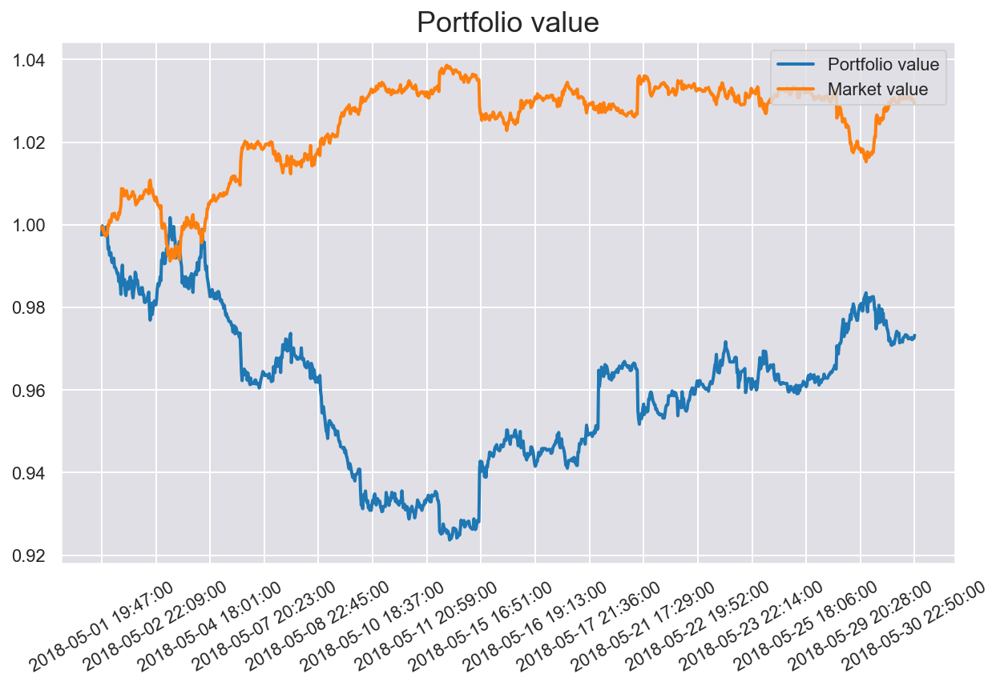

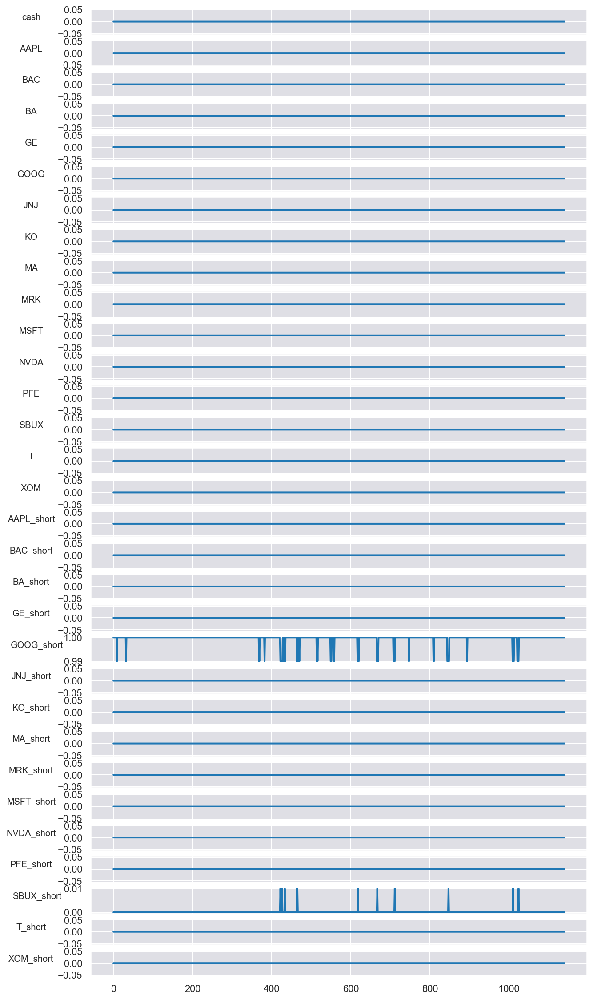

In [46]:
tf.reset_default_graph()
sess = tf.Session()
tflearn.config.init_training_mode()
action_dim = [nb_classes*2 + 1]
state_dim = [nb_classes + 1, window_length, 3]
variable_scope = get_variable_scope(window_length, predictor_type, use_batch_norm)
with tf.variable_scope(variable_scope):
    actor = StockActor(sess, state_dim, action_dim, action_bound, 1e-4, tau, batch_size, predictor_type, 
                       use_batch_norm)
    critic = StockCritic(sess=sess, state_dim=state_dim, action_dim=action_dim, tau=1e-3,
                         learning_rate=1e-3, num_actor_vars=actor.get_num_trainable_vars(), 
                         predictor_type=predictor_type, use_batch_norm=use_batch_norm)
    actor_noise = OrnsteinUhlenbeckActionNoise(mu=np.zeros(action_dim))

    model_save_path = "weights/"
    summary_path = get_result_path(window_length, predictor_type, use_batch_norm)

    ddpg_model = DDPG(environ, sess, actor, critic, actor_noise,param, obs_normalizer=obs_normalizer, model_save_path=model_save_path,
                      summary_path=summary_path)
    ddpg_model.initialize(load_weights=False, verbose=False)
    ddpg_model.train()

env_May = PortfolioEnv(history_May, abbreviation, steps=history_May.shape[1]-200, window_length=window_length,
                   start_idx=data['May'].date_index.iloc[0])
test_model(env_May, ddpg_model)
plot_weights(env_May.infos)

Build model from scratch
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
1500
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 0, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field ty

c:\users\lenovo\appdata\local\programs\python\python39\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


Episode: 2, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 3, Reward: 1.00, Qmax: 0.0001
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 4, Reward: 1.00, Qmax: 0.0001
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0

Episode: 25, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 26, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 27, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 48, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 49, Reward: 1.00, Qmax: 0.0001
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 50, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 71, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 72, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 73, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 94, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 95, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 96, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 116, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 117, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 118, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 139, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 140, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 141, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 162, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 163, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 164, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 185, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 186, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 187, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 207, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 208, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 209, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 230, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 231, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 232, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 253, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 254, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 255, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 276, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 277, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 278, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 299, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 300, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 

Episode: 321, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 322, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 323, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 344, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 345, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 346, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 367, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 368, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 369, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 390, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 391, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 392, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
Episode: 412, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
Episode: 413, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
Episode: 414, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 435, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 436, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 437, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 458, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 459, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 460, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 481, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.03
 0.03 0.03 0.02 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.03
 0.03 0.03 0.02 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 482, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.03
 0.03 0.03 0.02 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.03
 0.03 0.02 0.02 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 483, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.03
 0.03 0.03 0.02 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.04 0.03 0.03
 0.02 0.02 

Episode: 503, Reward: 1.00, Qmax: 0.0000
[0.03 0.02 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.05 0.03 0.04 0.03 0.02
 0.02 0.02 0.02 0.03 0.04 0.03 0.05 0.04 0.02 0.03 0.03 0.03 0.05 0.05
 0.03 0.03 0.03]
[0.03 0.02 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.05 0.03 0.04 0.03 0.02
 0.02 0.02 0.02 0.03 0.04 0.03 0.05 0.04 0.02 0.03 0.03 0.03 0.05 0.05
 0.03 0.03 0.03]
Episode: 504, Reward: 1.00, Qmax: 0.0000
[0.03 0.02 0.04 0.03 0.03 0.03 0.04 0.02 0.03 0.05 0.03 0.04 0.03 0.02
 0.02 0.02 0.02 0.03 0.05 0.03 0.05 0.04 0.02 0.03 0.03 0.03 0.05 0.05
 0.03 0.03 0.02]
[0.03 0.02 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.05 0.03 0.04 0.03 0.02
 0.02 0.02 0.02 0.03 0.05 0.03 0.05 0.04 0.02 0.03 0.03 0.03 0.05 0.05
 0.03 0.03 0.02]
Episode: 505, Reward: 1.00, Qmax: 0.0000
[0.03 0.02 0.04 0.03 0.03 0.03 0.04 0.02 0.03 0.05 0.03 0.04 0.03 0.02
 0.02 0.02 0.02 0.03 0.05 0.03 0.05 0.04 0.02 0.03 0.03 0.03 0.05 0.05
 0.03 0.03 0.02]
[0.03 0.02 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.05 0.03 0.04 0.03 0.02
 0.02 0.02 

Episode: 526, Reward: 1.00, Qmax: 0.0000
[0.02 0.02 0.05 0.02 0.02 0.03 0.03 0.02 0.03 0.06 0.03 0.04 0.02 0.02
 0.01 0.01 0.01 0.02 0.06 0.03 0.08 0.05 0.02 0.02 0.03 0.03 0.07 0.07
 0.03 0.03 0.02]
[0.02 0.02 0.05 0.02 0.02 0.03 0.04 0.02 0.03 0.06 0.03 0.04 0.02 0.02
 0.01 0.01 0.01 0.02 0.06 0.03 0.07 0.05 0.02 0.02 0.03 0.03 0.07 0.07
 0.03 0.03 0.02]
Episode: 527, Reward: 1.00, Qmax: 0.0000
[0.02 0.02 0.05 0.02 0.02 0.03 0.04 0.02 0.03 0.06 0.03 0.04 0.02 0.02
 0.01 0.01 0.01 0.02 0.06 0.03 0.07 0.05 0.02 0.02 0.03 0.03 0.06 0.06
 0.03 0.03 0.02]
[0.02 0.02 0.05 0.03 0.02 0.03 0.04 0.02 0.03 0.06 0.03 0.04 0.02 0.02
 0.02 0.02 0.01 0.02 0.05 0.03 0.07 0.05 0.02 0.02 0.03 0.03 0.06 0.06
 0.03 0.03 0.02]
Episode: 528, Reward: 1.00, Qmax: 0.0000
[0.02 0.02 0.05 0.02 0.02 0.03 0.03 0.02 0.03 0.07 0.03 0.04 0.02 0.01
 0.01 0.01 0.01 0.02 0.06 0.03 0.08 0.05 0.01 0.02 0.03 0.03 0.07 0.07
 0.03 0.02 0.02]
[0.02 0.02 0.05 0.02 0.02 0.03 0.03 0.02 0.03 0.07 0.03 0.04 0.02 0.01
 0.01 0.01 

Episode: 549, Reward: 1.00, Qmax: 0.0000
[0.01 0.   0.05 0.01 0.01 0.02 0.02 0.   0.01 0.12 0.01 0.05 0.01 0.
 0.   0.   0.   0.01 0.06 0.01 0.19 0.07 0.   0.01 0.01 0.01 0.13 0.14
 0.02 0.01 0.  ]
[0.   0.   0.05 0.01 0.01 0.02 0.02 0.   0.01 0.12 0.01 0.04 0.   0.
 0.   0.   0.   0.01 0.06 0.01 0.2  0.07 0.   0.01 0.01 0.01 0.13 0.14
 0.01 0.01 0.  ]
Episode: 550, Reward: 1.00, Qmax: 0.0000
[0.01 0.   0.05 0.01 0.01 0.02 0.02 0.   0.01 0.12 0.01 0.04 0.01 0.
 0.   0.   0.   0.01 0.06 0.01 0.19 0.07 0.   0.01 0.01 0.01 0.13 0.14
 0.01 0.01 0.  ]
[0.01 0.   0.05 0.01 0.01 0.03 0.02 0.   0.01 0.11 0.01 0.05 0.01 0.
 0.   0.   0.   0.01 0.06 0.02 0.18 0.07 0.   0.01 0.02 0.02 0.12 0.13
 0.02 0.01 0.  ]
Episode: 551, Reward: 1.00, Qmax: 0.0000
[0.01 0.   0.05 0.01 0.01 0.02 0.02 0.   0.01 0.12 0.01 0.04 0.   0.
 0.   0.   0.   0.01 0.06 0.01 0.2  0.07 0.   0.01 0.01 0.01 0.13 0.14
 0.01 0.01 0.  ]
[0.01 0.   0.05 0.01 0.01 0.02 0.02 0.   0.01 0.11 0.01 0.05 0.01 0.
 0.   0.   0.   0.01 0.

Episode: 568, Reward: 1.00, Qmax: 0.0000
[3.24e-04 1.17e-04 1.19e-02 5.45e-04 4.83e-04 4.26e-03 2.51e-03 2.05e-04
 8.78e-04 6.76e-02 1.43e-03 1.28e-02 3.01e-04 1.30e-04 7.47e-05 7.08e-05
 3.73e-05 4.68e-04 2.49e-02 1.56e-03 4.81e-01 4.92e-02 1.19e-04 3.98e-04
 1.84e-03 1.60e-03 1.52e-01 1.81e-01 1.69e-03 6.56e-04 1.99e-04]
[3.95e-04 1.47e-04 1.30e-02 6.53e-04 5.82e-04 4.79e-03 2.87e-03 2.54e-04
 1.04e-03 6.99e-02 1.66e-03 1.39e-02 3.68e-04 1.63e-04 9.53e-05 9.05e-05
 4.86e-05 5.64e-04 2.66e-02 1.82e-03 4.67e-01 5.14e-02 1.49e-04 4.82e-04
 2.12e-03 1.86e-03 1.53e-01 1.82e-01 1.95e-03 7.83e-04 2.47e-04]
Episode: 569, Reward: 1.00, Qmax: 0.0000
[7.03e-04 2.90e-04 1.62e-02 1.10e-03 9.98e-04 6.63e-03 4.17e-03 4.73e-04
 1.68e-03 7.39e-02 2.56e-03 1.73e-02 6.62e-04 3.18e-04 1.96e-04 1.87e-04
 1.06e-04 9.69e-04 3.10e-02 2.78e-03 4.38e-01 5.65e-02 2.92e-04 8.43e-04
 3.21e-03 2.82e-03 1.53e-01 1.78e-01 2.95e-03 1.30e-03 4.60e-04]
[5.59e-04 2.22e-04 1.46e-02 8.95e-04 8.06e-04 5.79e-03 3.57e-03 3.

Episode: 582, Reward: 1.00, Qmax: 0.0000
[1.66e-05 4.35e-06 1.48e-03 3.21e-05 2.88e-05 4.60e-04 2.08e-04 9.37e-06
 5.75e-05 1.39e-02 1.09e-04 1.75e-03 1.55e-05 5.07e-06 2.40e-06 2.23e-06
 9.51e-07 2.62e-05 4.05e-03 1.26e-04 8.57e-01 1.02e-02 4.38e-06 2.25e-05
 1.74e-04 1.23e-04 4.64e-02 6.39e-02 1.34e-04 4.17e-05 8.77e-06]
[5.01e-05 1.52e-05 2.77e-03 9.00e-05 8.19e-05 9.70e-04 4.80e-04 3.01e-05
 1.52e-04 2.05e-02 2.69e-04 3.20e-03 4.72e-05 1.73e-05 8.91e-06 8.35e-06
 3.89e-06 7.52e-05 6.78e-03 3.06e-04 8.08e-01 1.55e-02 1.52e-05 6.57e-05
 4.09e-04 2.98e-04 5.98e-02 7.96e-02 3.22e-04 1.14e-04 2.83e-05]
Episode: 583, Reward: 1.00, Qmax: 0.0000
[1.54e-05 4.04e-06 1.36e-03 2.98e-05 2.68e-05 4.27e-04 1.92e-04 8.71e-06
 5.33e-05 1.27e-02 1.01e-04 1.61e-03 1.44e-05 4.70e-06 2.23e-06 2.07e-06
 8.80e-07 2.43e-05 3.70e-03 1.17e-04 8.69e-01 9.36e-03 4.07e-06 2.10e-05
 1.63e-04 1.14e-04 4.22e-02 5.84e-02 1.24e-04 3.88e-05 8.15e-06]
[1.61e-05 4.24e-06 1.40e-03 3.10e-05 2.79e-05 4.40e-04 1.99e-04 9.

Episode: 596, Reward: 1.00, Qmax: 0.0000
[2.19e-07 3.74e-08 6.53e-05 5.16e-07 4.57e-07 1.61e-05 5.45e-06 1.04e-07
 1.07e-06 9.91e-04 2.48e-06 8.11e-05 2.02e-07 4.62e-08 1.71e-08 1.55e-08
 4.99e-09 3.91e-07 2.19e-04 3.00e-06 9.87e-01 6.73e-04 3.78e-08 3.33e-07
 4.93e-06 2.87e-06 4.51e-03 6.28e-03 3.24e-06 7.27e-07 9.45e-08]
[2.19e-07 3.73e-08 6.52e-05 5.14e-07 4.56e-07 1.61e-05 5.44e-06 1.04e-07
 1.07e-06 9.89e-04 2.48e-06 8.09e-05 2.02e-07 4.61e-08 1.70e-08 1.55e-08
 4.98e-09 3.90e-07 2.18e-04 2.99e-06 9.87e-01 6.72e-04 3.77e-08 3.33e-07
 4.91e-06 2.87e-06 4.51e-03 6.27e-03 3.23e-06 7.25e-07 9.42e-08]
Episode: 597, Reward: 1.00, Qmax: 0.0000
[1.22e-07 1.96e-08 4.40e-05 2.96e-07 2.61e-07 1.04e-05 3.38e-06 5.64e-08
 6.27e-07 7.26e-04 1.50e-06 5.50e-05 1.12e-07 2.43e-08 8.68e-09 7.86e-09
 2.43e-09 2.22e-07 1.53e-04 1.83e-06 9.90e-01 4.87e-04 1.98e-08 1.89e-07
 3.06e-06 1.75e-06 3.48e-03 4.82e-03 1.98e-06 4.22e-07 5.11e-08]
[1.92e-07 3.24e-08 5.86e-05 4.54e-07 4.02e-07 1.44e-05 4.84e-06 9.

Episode: 609, Reward: 1.00, Qmax: 0.0000
[1.13e-07 1.87e-08 3.49e-05 2.70e-07 2.40e-07 8.77e-06 2.88e-06 5.31e-08
 5.60e-07 4.95e-04 1.32e-06 4.27e-05 1.05e-07 2.32e-08 8.40e-09 7.61e-09
 2.39e-09 2.03e-07 1.16e-04 1.60e-06 9.94e-01 3.32e-04 1.89e-08 1.74e-07
 2.69e-06 1.53e-06 2.29e-03 2.69e-03 1.73e-06 3.82e-07 4.80e-08]
[1.55e-07 2.66e-08 4.29e-05 3.64e-07 3.25e-07 1.10e-05 3.72e-06 7.41e-08
 7.46e-07 5.75e-04 1.73e-06 5.22e-05 1.44e-07 3.29e-08 1.22e-08 1.10e-08
 3.55e-09 2.76e-07 1.39e-04 2.09e-06 9.93e-01 3.90e-04 2.68e-08 2.37e-07
 3.47e-06 1.99e-06 2.58e-03 3.02e-03 2.25e-06 5.13e-07 6.71e-08]
Episode: 610, Reward: 1.00, Qmax: 0.0000
[2.36e-08 3.27e-09 1.27e-05 6.12e-08 5.39e-08 2.79e-06 8.21e-07 1.03e-08
 1.36e-07 2.31e-04 3.49e-07 1.58e-05 2.16e-08 4.16e-09 1.36e-09 1.22e-09
 3.43e-10 4.47e-08 4.73e-05 4.31e-07 9.97e-01 1.49e-04 3.31e-09 3.79e-08
 7.63e-07 4.10e-07 1.24e-03 1.46e-03 4.71e-07 8.96e-08 9.22e-09]
[7.12e-08 1.12e-08 2.57e-05 1.74e-07 1.54e-07 6.23e-06 1.98e-06 3.

Episode: 623, Reward: 1.00, Qmax: 0.0000
[1.49e-08 1.99e-09 8.83e-06 3.94e-08 3.46e-08 1.92e-06 5.49e-07 6.40e-09
 8.85e-08 1.62e-04 2.31e-07 1.10e-05 1.36e-08 2.54e-09 8.15e-10 7.29e-10
 2.00e-10 2.86e-08 3.36e-05 2.87e-07 9.98e-01 1.04e-04 2.01e-09 2.42e-08
 5.15e-07 2.72e-07 9.17e-04 9.77e-04 3.13e-07 5.80e-08 5.72e-09]
[2.16e-08 3.01e-09 1.12e-05 5.59e-08 4.93e-08 2.51e-06 7.39e-07 9.44e-09
 1.24e-07 1.94e-04 3.16e-07 1.39e-05 1.98e-08 3.82e-09 1.25e-09 1.12e-09
 3.17e-10 4.08e-08 4.16e-05 3.91e-07 9.97e-01 1.26e-04 3.04e-09 3.48e-08
 6.94e-07 3.72e-07 1.06e-03 1.13e-03 4.26e-07 8.17e-08 8.46e-09]
Episode: 624, Reward: 1.00, Qmax: 0.0000
[1.91e-08 2.61e-09 1.03e-05 4.96e-08 4.37e-08 2.29e-06 6.67e-07 8.27e-09
 1.10e-07 1.82e-04 2.84e-07 1.28e-05 1.75e-08 3.33e-09 1.08e-09 9.72e-10
 2.71e-10 3.61e-08 3.86e-05 3.52e-07 9.98e-01 1.17e-04 2.64e-09 3.08e-08
 6.26e-07 3.34e-07 1.00e-03 1.06e-03 3.84e-07 7.27e-08 7.41e-09]
[1.82e-08 2.48e-09 1.00e-05 4.74e-08 4.18e-08 2.21e-06 6.43e-07 7.

Episode: 637, Reward: 1.00, Qmax: 0.0000
[4.81e-08 7.35e-09 1.85e-05 1.19e-07 1.06e-07 4.46e-06 1.39e-06 2.19e-08
 2.54e-07 2.78e-04 6.19e-07 2.26e-05 4.43e-08 9.23e-09 3.19e-09 2.88e-09
 8.59e-10 8.83e-08 6.46e-05 7.60e-07 9.97e-01 1.84e-04 7.42e-09 7.57e-08
 1.31e-06 7.23e-07 1.43e-03 1.44e-03 8.23e-07 1.71e-07 1.97e-08]
[1.20e-07 2.04e-08 3.36e-05 2.83e-07 2.53e-07 8.71e-06 2.90e-06 5.71e-08
 5.81e-07 4.34e-04 1.35e-06 4.05e-05 1.11e-07 2.53e-08 9.25e-09 8.39e-09
 2.68e-09 2.14e-07 1.09e-04 1.64e-06 9.95e-01 2.93e-04 2.05e-08 1.85e-07
 2.74e-06 1.56e-06 2.04e-03 2.05e-03 1.76e-06 4.00e-07 5.17e-08]
Episode: 638, Reward: 1.00, Qmax: 0.0000
[7.78e-08 1.25e-08 2.53e-05 1.87e-07 1.67e-07 6.33e-06 2.05e-06 3.62e-08
 3.92e-07 3.51e-04 9.31e-07 3.07e-05 7.18e-08 1.56e-08 5.57e-09 5.04e-09
 1.56e-09 1.40e-07 8.51e-05 1.14e-06 9.96e-01 2.35e-04 1.26e-08 1.21e-07
 1.93e-06 1.08e-06 1.73e-03 1.73e-03 1.23e-06 2.67e-07 3.26e-08]
[1.82e-07 3.22e-08 4.38e-05 4.18e-07 3.75e-07 1.18e-05 4.03e-06 8.

Episode: 651, Reward: 1.00, Qmax: 0.0000
[2.74e-08 3.92e-09 1.29e-05 6.98e-08 6.17e-08 2.96e-06 8.85e-07 1.21e-08
 1.53e-07 2.11e-04 3.84e-07 1.58e-05 2.51e-08 4.97e-09 1.66e-09 1.49e-09
 4.27e-10 5.12e-08 4.70e-05 4.74e-07 9.97e-01 1.38e-04 3.96e-09 4.37e-08
 8.33e-07 4.51e-07 1.20e-03 1.14e-03 5.16e-07 1.02e-07 1.09e-08]
[3.06e-08 4.44e-09 1.39e-05 7.75e-08 6.86e-08 3.20e-06 9.67e-07 1.36e-08
 1.69e-07 2.23e-04 4.22e-07 1.70e-05 2.81e-08 5.61e-09 1.88e-09 1.69e-09
 4.90e-10 5.70e-08 5.01e-05 5.20e-07 9.97e-01 1.46e-04 4.48e-09 4.87e-08
 9.10e-07 4.94e-07 1.25e-03 1.19e-03 5.65e-07 1.12e-07 1.22e-08]
Episode: 652, Reward: 1.00, Qmax: 0.0000
[2.95e-08 4.27e-09 1.36e-05 7.50e-08 6.64e-08 3.13e-06 9.41e-07 1.31e-08
 1.63e-07 2.19e-04 4.10e-07 1.66e-05 2.71e-08 5.40e-09 1.81e-09 1.63e-09
 4.69e-10 5.51e-08 4.91e-05 5.05e-07 9.97e-01 1.44e-04 4.31e-09 4.71e-08
 8.86e-07 4.80e-07 1.24e-03 1.17e-03 5.50e-07 1.09e-07 1.18e-08]
[2.98e-08 4.30e-09 1.36e-05 7.56e-08 6.68e-08 3.14e-06 9.46e-07 1.

Episode: 665, Reward: 1.00, Qmax: 0.0000
[2.11e-07 3.79e-08 4.86e-05 4.81e-07 4.32e-07 1.31e-05 4.55e-06 1.03e-07
 9.64e-07 5.73e-04 2.17e-06 5.78e-05 1.96e-07 4.66e-08 1.77e-08 1.61e-08
 5.34e-09 3.67e-07 1.52e-04 2.62e-06 9.93e-01 3.95e-04 3.82e-08 3.18e-07
 4.29e-06 2.50e-06 2.75e-03 2.50e-03 2.81e-06 6.72e-07 9.31e-08]
[4.05e-08 6.06e-09 1.67e-05 1.01e-07 8.96e-08 3.94e-06 1.21e-06 1.82e-08
 2.17e-07 2.57e-04 5.36e-07 2.03e-05 3.73e-08 7.63e-09 2.60e-09 2.35e-09
 6.92e-10 7.47e-08 5.94e-05 6.59e-07 9.97e-01 1.70e-04 6.11e-09 6.40e-08
 1.14e-06 6.27e-07 1.46e-03 1.32e-03 7.15e-07 1.46e-07 1.64e-08]
Episode: 666, Reward: 1.00, Qmax: 0.0000
[3.31e-08 4.83e-09 1.47e-05 8.35e-08 7.39e-08 3.40e-06 1.03e-06 1.47e-08
 1.81e-07 2.33e-04 4.51e-07 1.79e-05 3.04e-08 6.10e-09 2.06e-09 1.85e-09
 5.38e-10 6.15e-08 5.29e-05 5.56e-07 9.97e-01 1.54e-04 4.88e-09 5.26e-08
 9.71e-07 5.29e-07 1.36e-03 1.22e-03 6.04e-07 1.21e-07 1.32e-08]
[1.83e-08 2.50e-09 9.99e-06 4.77e-08 4.20e-08 2.21e-06 6.42e-07 7.

Episode: 679, Reward: 1.00, Qmax: 0.0000
[3.94e-08 5.86e-09 1.65e-05 9.85e-08 8.73e-08 3.87e-06 1.19e-06 1.77e-08
 2.12e-07 2.54e-04 5.24e-07 2.00e-05 3.62e-08 7.39e-09 2.52e-09 2.27e-09
 6.67e-10 7.28e-08 5.90e-05 6.45e-07 9.97e-01 1.69e-04 5.92e-09 6.23e-08
 1.12e-06 6.13e-07 1.51e-03 1.30e-03 6.99e-07 1.42e-07 1.59e-08]
[1.90e-08 2.60e-09 1.03e-05 4.93e-08 4.35e-08 2.27e-06 6.61e-07 8.23e-09
 1.10e-07 1.78e-04 2.82e-07 1.26e-05 1.74e-08 3.31e-09 1.08e-09 9.66e-10
 2.69e-10 3.59e-08 3.89e-05 3.50e-07 9.98e-01 1.16e-04 2.63e-09 3.06e-08
 6.21e-07 3.32e-07 1.14e-03 9.79e-04 3.81e-07 7.23e-08 7.36e-09]
Episode: 680, Reward: 1.00, Qmax: 0.0000
[1.40e-08 1.85e-09 8.43e-06 3.69e-08 3.25e-08 1.81e-06 5.17e-07 5.97e-09
 8.32e-08 1.53e-04 2.17e-07 1.04e-05 1.28e-08 2.36e-09 7.54e-10 6.75e-10
 1.84e-10 2.68e-08 3.26e-05 2.71e-07 9.98e-01 9.97e-05 1.87e-09 2.27e-08
 4.86e-07 2.57e-07 1.02e-03 8.69e-04 2.96e-07 5.45e-08 5.33e-09]
[2.10e-08 2.92e-09 1.10e-05 5.44e-08 4.80e-08 2.45e-06 7.19e-07 9.

Episode: 693, Reward: 1.00, Qmax: 0.0000
[1.40e-08 1.85e-09 8.48e-06 3.70e-08 3.26e-08 1.82e-06 5.19e-07 5.98e-09
 8.35e-08 1.53e-04 2.18e-07 1.04e-05 1.28e-08 2.37e-09 7.56e-10 6.76e-10
 1.85e-10 2.68e-08 3.30e-05 2.72e-07 9.98e-01 1.01e-04 1.87e-09 2.28e-08
 4.88e-07 2.58e-07 1.07e-03 8.72e-04 2.97e-07 5.46e-08 5.34e-09]
[5.03e-08 7.69e-09 1.94e-05 1.24e-07 1.10e-07 4.64e-06 1.45e-06 2.29e-08
 2.65e-07 2.86e-04 6.46e-07 2.34e-05 4.63e-08 9.66e-09 3.34e-09 3.02e-09
 9.02e-10 9.22e-08 6.85e-05 7.93e-07 9.96e-01 1.93e-04 7.77e-09 7.91e-08
 1.36e-06 7.54e-07 1.73e-03 1.44e-03 8.59e-07 1.79e-07 2.06e-08]
Episode: 694, Reward: 1.00, Qmax: 0.0000
[9.40e-09 1.19e-09 6.56e-06 2.54e-08 2.23e-08 1.36e-06 3.78e-07 3.94e-09
 5.83e-08 1.26e-04 1.56e-07 8.09e-06 8.58e-09 1.53e-09 4.76e-10 4.25e-10
 1.13e-10 1.83e-08 2.63e-05 1.95e-07 9.98e-01 8.21e-05 1.20e-09 1.55e-08
 3.54e-07 1.85e-07 9.22e-04 7.47e-04 2.13e-07 3.78e-08 3.52e-09]
[2.33e-08 3.27e-09 1.18e-05 6.01e-08 5.30e-08 2.64e-06 7.82e-07 1.

Episode: 706, Reward: 1.00, Qmax: 0.0000
[1.54e-08 2.06e-09 9.07e-06 4.06e-08 3.57e-08 1.96e-06 5.63e-07 6.63e-09
 9.13e-08 1.61e-04 2.37e-07 1.11e-05 1.41e-08 2.64e-09 8.46e-10 7.57e-10
 2.08e-10 2.95e-08 3.52e-05 2.95e-07 9.98e-01 1.06e-04 2.09e-09 2.50e-08
 5.28e-07 2.80e-07 1.15e-03 9.05e-04 3.22e-07 5.99e-08 5.92e-09]
[1.93e-08 2.65e-09 1.05e-05 5.03e-08 4.43e-08 2.31e-06 6.74e-07 8.39e-09
 1.12e-07 1.79e-04 2.87e-07 1.28e-05 1.77e-08 3.38e-09 1.10e-09 9.86e-10
 2.75e-10 3.67e-08 4.00e-05 3.57e-07 9.97e-01 1.19e-04 2.68e-09 3.12e-08
 6.33e-07 3.38e-07 1.26e-03 9.89e-04 3.89e-07 7.38e-08 7.51e-09]
Episode: 707, Reward: 1.00, Qmax: 0.0000
[2.32e-07 4.21e-08 5.23e-05 5.27e-07 4.73e-07 1.42e-05 4.93e-06 1.13e-07
 1.05e-06 6.00e-04 2.36e-06 6.18e-05 2.15e-07 5.16e-08 1.97e-08 1.79e-08
 5.97e-09 4.03e-07 1.65e-04 2.85e-06 9.93e-01 4.22e-04 4.23e-08 3.49e-07
 4.65e-06 2.72e-06 3.21e-03 2.60e-03 3.06e-06 7.35e-07 1.03e-07]
[1.50e-07 2.59e-08 3.94e-05 3.49e-07 3.12e-07 1.03e-05 3.47e-06 7.

Episode: 720, Reward: 1.00, Qmax: 0.0000
[2.14e-07 3.84e-08 5.00e-05 4.89e-07 4.39e-07 1.34e-05 4.64e-06 1.04e-07
 9.82e-07 5.80e-04 2.21e-06 5.90e-05 1.99e-07 4.73e-08 1.79e-08 1.63e-08
 5.40e-09 3.73e-07 1.60e-04 2.68e-06 9.93e-01 4.09e-04 3.87e-08 3.23e-07
 4.37e-06 2.55e-06 3.28e-03 2.55e-03 2.87e-06 6.83e-07 9.44e-08]
[1.88e-07 3.32e-08 4.59e-05 4.33e-07 3.87e-07 1.22e-05 4.18e-06 9.08e-08
 8.73e-07 5.45e-04 1.98e-06 5.43e-05 1.74e-07 4.09e-08 1.54e-08 1.40e-08
 4.59e-09 3.29e-07 1.48e-04 2.40e-06 9.93e-01 3.83e-04 3.35e-08 2.85e-07
 3.94e-06 2.28e-06 3.13e-03 2.42e-03 2.57e-06 6.06e-07 8.23e-08]
Episode: 721, Reward: 1.00, Qmax: 0.0000
[2.27e-07 4.10e-08 5.19e-05 5.17e-07 4.64e-07 1.40e-05 4.86e-06 1.11e-07
 1.03e-06 5.97e-04 2.32e-06 6.12e-05 2.10e-07 5.03e-08 1.91e-08 1.74e-08
 5.79e-09 3.94e-07 1.65e-04 2.81e-06 9.93e-01 4.22e-04 4.12e-08 3.42e-07
 4.58e-06 2.67e-06 3.37e-03 2.61e-03 3.01e-06 7.21e-07 1.00e-07]
[1.40e-07 2.40e-08 3.80e-05 3.27e-07 2.93e-07 9.83e-06 3.30e-06 6.

Episode: 734, Reward: 1.00, Qmax: 0.0000
[5.79e-08 8.95e-09 2.17e-05 1.42e-07 1.26e-07 5.20e-06 1.64e-06 2.65e-08
 3.03e-07 3.12e-04 7.33e-07 2.60e-05 5.34e-08 1.12e-08 3.91e-09 3.53e-09
 1.06e-09 1.06e-07 7.75e-05 9.00e-07 9.96e-01 2.15e-04 9.04e-09 9.08e-08
 1.54e-06 8.55e-07 2.19e-03 1.57e-03 9.73e-07 2.04e-07 2.38e-08]
[1.23e-08 1.59e-09 7.97e-06 3.28e-08 2.87e-08 1.68e-06 4.72e-07 5.19e-09
 7.45e-08 1.47e-04 1.96e-07 9.74e-06 1.12e-08 2.04e-09 6.42e-10 5.74e-10
 1.55e-10 2.37e-08 3.20e-05 2.46e-07 9.98e-01 9.78e-05 1.61e-09 2.00e-08
 4.42e-07 2.32e-07 1.24e-03 8.59e-04 2.68e-07 4.85e-08 4.63e-09]
Episode: 735, Reward: 1.00, Qmax: 0.0000
[3.23e-08 4.67e-09 1.49e-05 8.18e-08 7.23e-08 3.40e-06 1.02e-06 1.43e-08
 1.78e-07 2.35e-04 4.46e-07 1.80e-05 2.96e-08 5.90e-09 1.98e-09 1.78e-09
 5.14e-10 6.02e-08 5.56e-05 5.52e-07 9.96e-01 1.60e-04 4.71e-09 5.14e-08
 9.61e-07 5.23e-07 1.78e-03 1.25e-03 5.99e-07 1.19e-07 1.28e-08]
[5.57e-08 8.57e-09 2.12e-05 1.37e-07 1.22e-07 5.06e-06 1.59e-06 2.

Episode: 748, Reward: 1.00, Qmax: 0.0000
[4.23e-08 6.30e-09 1.78e-05 1.06e-07 9.37e-08 4.15e-06 1.28e-06 1.90e-08
 2.28e-07 2.69e-04 5.63e-07 2.14e-05 3.89e-08 7.93e-09 2.70e-09 2.44e-09
 7.16e-10 7.82e-08 6.58e-05 6.94e-07 9.96e-01 1.85e-04 6.36e-09 6.69e-08
 1.20e-06 6.58e-07 2.09e-03 1.41e-03 7.52e-07 1.53e-07 1.71e-08]
[4.63e-08 6.97e-09 1.89e-05 1.15e-07 1.02e-07 4.44e-06 1.37e-06 2.09e-08
 2.48e-07 2.81e-04 6.08e-07 2.27e-05 4.26e-08 8.77e-09 3.01e-09 2.71e-09
 8.02e-10 8.54e-08 6.93e-05 7.49e-07 9.96e-01 1.94e-04 7.04e-09 7.31e-08
 1.29e-06 7.10e-07 2.16e-03 1.46e-03 8.11e-07 1.66e-07 1.88e-08]
Episode: 749, Reward: 1.00, Qmax: 0.0000
[4.61e-08 6.93e-09 1.89e-05 1.15e-07 1.02e-07 4.42e-06 1.37e-06 2.08e-08
 2.47e-07 2.80e-04 6.06e-07 2.26e-05 4.24e-08 8.72e-09 2.99e-09 2.69e-09
 7.97e-10 8.50e-08 6.91e-05 7.46e-07 9.96e-01 1.94e-04 7.00e-09 7.27e-08
 1.28e-06 7.08e-07 2.16e-03 1.45e-03 8.08e-07 1.66e-07 1.87e-08]
[3.55e-08 5.18e-09 1.59e-05 8.97e-08 7.93e-08 3.66e-06 1.11e-06 1.

Episode: 762, Reward: 1.00, Qmax: 0.0000
[3.66e-08 5.36e-09 1.63e-05 9.24e-08 8.17e-08 3.74e-06 1.14e-06 1.64e-08
 2.01e-07 2.49e-04 4.99e-07 1.96e-05 3.37e-08 6.77e-09 2.29e-09 2.06e-09
 5.99e-10 6.81e-08 6.12e-05 6.17e-07 9.96e-01 1.72e-04 5.42e-09 5.82e-08
 1.07e-06 5.84e-07 2.05e-03 1.33e-03 6.68e-07 1.34e-07 1.47e-08]
[6.19e-08 9.62e-09 2.28e-05 1.52e-07 1.35e-07 5.49e-06 1.73e-06 2.83e-08
 3.22e-07 3.21e-04 7.78e-07 2.72e-05 5.71e-08 1.20e-08 4.21e-09 3.80e-09
 1.15e-09 1.13e-07 8.23e-05 9.56e-07 9.95e-01 2.24e-04 9.71e-09 9.69e-08
 1.63e-06 9.06e-07 2.48e-03 1.62e-03 1.03e-06 2.18e-07 2.55e-08]
Episode: 763, Reward: 1.00, Qmax: 0.0000
[3.39e-08 4.92e-09 1.55e-05 8.58e-08 7.58e-08 3.54e-06 1.07e-06 1.51e-08
 1.87e-07 2.40e-04 4.66e-07 1.86e-05 3.11e-08 6.21e-09 2.09e-09 1.88e-09
 5.43e-10 6.32e-08 5.85e-05 5.78e-07 9.96e-01 1.65e-04 4.97e-09 5.39e-08
 1.00e-06 5.47e-07 2.00e-03 1.28e-03 6.26e-07 1.25e-07 1.35e-08]
[5.17e-08 7.87e-09 2.03e-05 1.28e-07 1.13e-07 4.81e-06 1.50e-06 2.

Episode: 776, Reward: 1.00, Qmax: 0.0000
[2.51e-08 3.53e-09 1.27e-05 6.47e-08 5.71e-08 2.84e-06 8.42e-07 1.10e-08
 1.43e-07 2.06e-04 3.62e-07 1.54e-05 2.31e-08 4.48e-09 1.48e-09 1.33e-09
 3.75e-10 4.74e-08 4.97e-05 4.50e-07 9.97e-01 1.41e-04 3.57e-09 4.03e-08
 7.89e-07 4.26e-07 1.85e-03 1.13e-03 4.89e-07 9.46e-08 9.87e-09]
[6.96e-08 1.10e-08 2.46e-05 1.70e-07 1.51e-07 5.97e-06 1.90e-06 3.21e-08
 3.58e-07 3.37e-04 8.59e-07 2.93e-05 6.42e-08 1.37e-08 4.82e-09 4.36e-09
 1.33e-09 1.27e-07 8.85e-05 1.05e-06 9.95e-01 2.37e-04 1.11e-08 1.09e-07
 1.79e-06 1.00e-06 2.66e-03 1.68e-03 1.14e-06 2.43e-07 2.89e-08]
Episode: 777, Reward: 1.00, Qmax: 0.0000
[1.60e-08 2.13e-09 9.51e-06 4.21e-08 3.70e-08 2.04e-06 5.85e-07 6.85e-09
 9.49e-08 1.65e-04 2.46e-07 1.15e-05 1.46e-08 2.72e-09 8.70e-10 7.79e-10
 2.14e-10 3.06e-08 3.85e-05 3.08e-07 9.97e-01 1.12e-04 2.15e-09 2.59e-08
 5.48e-07 2.91e-07 1.57e-03 9.49e-04 3.35e-07 6.21e-08 6.12e-09]
[7.47e-08 1.19e-08 2.57e-05 1.81e-07 1.61e-07 6.29e-06 2.01e-06 3.

Episode: 790, Reward: 1.00, Qmax: 0.0000
[2.08e-07 3.70e-08 4.98e-05 4.77e-07 4.27e-07 1.33e-05 4.57e-06 1.01e-07
 9.60e-07 5.71e-04 2.17e-06 5.84e-05 1.93e-07 4.55e-08 1.72e-08 1.56e-08
 5.14e-09 3.63e-07 1.66e-04 2.63e-06 9.92e-01 4.12e-04 3.72e-08 3.14e-07
 4.29e-06 2.50e-06 4.10e-03 2.55e-03 2.82e-06 6.67e-07 9.13e-08]
[3.03e-07 5.63e-08 6.35e-05 6.81e-07 6.12e-07 1.74e-05 6.18e-06 1.50e-07
 1.35e-06 6.87e-04 2.99e-06 7.42e-05 2.82e-07 6.89e-08 2.66e-08 2.43e-08
 8.21e-09 5.22e-07 2.05e-04 3.61e-06 9.91e-01 4.99e-04 5.66e-08 4.54e-07
 5.81e-06 3.43e-06 4.69e-03 2.95e-03 3.85e-06 9.46e-07 1.36e-07]
Episode: 791, Reward: 1.00, Qmax: 0.0000
[7.03e-08 1.11e-08 2.48e-05 1.71e-07 1.52e-07 6.02e-06 1.92e-06 3.24e-08
 3.62e-07 3.38e-04 8.67e-07 2.94e-05 6.49e-08 1.39e-08 4.87e-09 4.40e-09
 1.34e-09 1.28e-07 8.99e-05 1.06e-06 9.95e-01 2.38e-04 1.12e-08 1.10e-07
 1.80e-06 1.01e-06 2.79e-03 1.68e-03 1.15e-06 2.45e-07 2.92e-08]
[1.31e-07 2.21e-08 3.70e-05 3.08e-07 2.75e-07 9.47e-06 3.16e-06 6.

Episode: 803, Reward: 1.00, Qmax: 0.0000
[1.27e-07 2.13e-08 3.62e-05 2.99e-07 2.67e-07 9.25e-06 3.08e-06 6.00e-08
 6.15e-07 4.48e-04 1.43e-06 4.27e-05 1.17e-07 2.64e-08 9.66e-09 8.76e-09
 2.79e-09 2.25e-07 1.26e-04 1.74e-06 9.93e-01 3.19e-04 2.15e-08 1.95e-07
 2.89e-06 1.65e-06 3.54e-03 2.08e-03 1.87e-06 4.23e-07 5.42e-08]
[1.41e-07 2.41e-08 3.88e-05 3.31e-07 2.96e-07 1.00e-05 3.35e-06 6.72e-08
 6.78e-07 4.72e-04 1.56e-06 4.57e-05 1.31e-07 2.98e-08 1.10e-08 9.94e-09
 3.18e-09 2.50e-07 1.34e-04 1.91e-06 9.93e-01 3.37e-04 2.42e-08 2.16e-07
 3.15e-06 1.81e-06 3.68e-03 2.17e-03 2.05e-06 4.67e-07 6.08e-08]
Episode: 804, Reward: 1.00, Qmax: 0.0000
[1.55e-07 2.67e-08 4.13e-05 3.62e-07 3.24e-07 1.07e-05 3.62e-06 7.42e-08
 7.39e-07 4.95e-04 1.70e-06 4.85e-05 1.44e-07 3.30e-08 1.22e-08 1.11e-08
 3.58e-09 2.74e-07 1.42e-04 2.07e-06 9.93e-01 3.54e-04 2.69e-08 2.37e-07
 3.40e-06 1.96e-06 3.81e-03 2.25e-03 2.22e-06 5.10e-07 6.72e-08]
[3.78e-07 7.21e-08 7.33e-05 8.41e-07 7.57e-07 2.05e-05 7.38e-06 1.

Episode: 817, Reward: 1.00, Qmax: 0.0000
[9.46e-08 1.54e-08 2.99e-05 2.27e-07 2.02e-07 7.47e-06 2.43e-06 4.42e-08
 4.73e-07 3.86e-04 1.11e-06 3.54e-05 8.74e-08 1.92e-08 6.88e-09 6.23e-09
 1.94e-09 1.70e-07 1.08e-04 1.36e-06 9.94e-01 2.73e-04 1.55e-08 1.46e-07
 2.28e-06 1.29e-06 3.25e-03 1.83e-03 1.47e-06 3.22e-07 3.99e-08]
[1.15e-07 1.92e-08 3.40e-05 2.73e-07 2.44e-07 8.63e-06 2.85e-06 5.44e-08
 5.65e-07 4.25e-04 1.32e-06 4.01e-05 1.07e-07 2.38e-08 8.66e-09 7.85e-09
 2.48e-09 2.06e-07 1.20e-04 1.61e-06 9.94e-01 3.02e-04 1.94e-08 1.77e-07
 2.68e-06 1.53e-06 3.48e-03 1.97e-03 1.73e-06 3.87e-07 4.91e-08]
Episode: 818, Reward: 1.00, Qmax: 0.0000
[3.35e-08 4.86e-09 1.53e-05 8.50e-08 7.51e-08 3.51e-06 1.06e-06 1.49e-08
 1.85e-07 2.33e-04 4.63e-07 1.83e-05 3.08e-08 6.14e-09 2.06e-09 1.85e-09
 5.36e-10 6.26e-08 5.99e-05 5.73e-07 9.96e-01 1.62e-04 4.91e-09 5.34e-08
 9.94e-07 5.42e-07 2.25e-03 1.22e-03 6.21e-07 1.24e-07 1.34e-08]
[1.09e-07 1.80e-08 3.28e-05 2.59e-07 2.31e-07 8.28e-06 2.72e-06 5.

Episode: 831, Reward: 1.00, Qmax: 0.0000
[5.29e-08 8.07e-09 2.06e-05 1.31e-07 1.16e-07 4.89e-06 1.53e-06 2.40e-08
 2.80e-07 2.89e-04 6.81e-07 2.44e-05 4.88e-08 1.01e-08 3.50e-09 3.16e-09
 9.43e-10 9.71e-08 7.79e-05 8.40e-07 9.95e-01 2.03e-04 8.15e-09 8.32e-08
 1.43e-06 7.95e-07 2.72e-03 1.45e-03 9.07e-07 1.88e-07 2.16e-08]
[2.65e-07 4.85e-08 5.81e-05 6.00e-07 5.39e-07 1.58e-05 5.54e-06 1.30e-07
 1.20e-06 6.34e-04 2.67e-06 6.77e-05 2.46e-07 5.95e-08 2.28e-08 2.08e-08
 6.96e-09 4.59e-07 1.94e-04 3.23e-06 9.91e-01 4.59e-04 4.88e-08 3.99e-07
 5.22e-06 3.06e-06 4.78e-03 2.71e-03 3.45e-06 8.36e-07 1.18e-07]
Episode: 832, Reward: 1.00, Qmax: 0.0000
[9.25e-08 1.50e-08 2.95e-05 2.22e-07 1.98e-07 7.35e-06 2.39e-06 4.31e-08
 4.63e-07 3.80e-04 1.09e-06 3.48e-05 8.54e-08 1.87e-08 6.70e-09 6.06e-09
 1.88e-09 1.66e-07 1.07e-04 1.34e-06 9.94e-01 2.69e-04 1.51e-08 1.43e-07
 2.24e-06 1.27e-06 3.31e-03 1.80e-03 1.44e-06 3.16e-07 3.89e-08]
[3.12e-08 4.48e-09 1.46e-05 7.94e-08 7.02e-08 3.33e-06 1.00e-06 1.

Episode: 845, Reward: 1.00, Qmax: 0.0000
[1.42e-08 1.87e-09 8.83e-06 3.78e-08 3.32e-08 1.88e-06 5.35e-07 6.07e-09
 8.57e-08 1.52e-04 2.24e-07 1.07e-05 1.30e-08 2.39e-09 7.61e-10 6.81e-10
 1.85e-10 2.74e-08 3.76e-05 2.81e-07 9.97e-01 1.04e-04 1.89e-09 2.32e-08
 5.00e-07 2.65e-07 1.77e-03 8.65e-04 3.06e-07 5.60e-08 5.42e-09]
[5.13e-08 7.78e-09 2.02e-05 1.27e-07 1.13e-07 4.78e-06 1.49e-06 2.32e-08
 2.72e-07 2.83e-04 6.63e-07 2.39e-05 4.72e-08 9.78e-09 3.37e-09 3.04e-09
 9.05e-10 9.42e-08 7.73e-05 8.18e-07 9.95e-01 1.99e-04 7.86e-09 8.06e-08
 1.40e-06 7.74e-07 2.77e-03 1.43e-03 8.84e-07 1.83e-07 2.09e-08]
Episode: 846, Reward: 1.00, Qmax: 0.0000
[7.68e-08 1.22e-08 2.62e-05 1.86e-07 1.66e-07 6.43e-06 2.06e-06 3.55e-08
 3.92e-07 3.45e-04 9.34e-07 3.09e-05 7.09e-08 1.53e-08 5.40e-09 4.88e-09
 1.50e-09 1.39e-07 9.72e-05 1.15e-06 9.94e-01 2.45e-04 1.23e-08 1.20e-07
 1.93e-06 1.09e-06 3.20e-03 1.67e-03 1.24e-06 2.66e-07 3.20e-08]
[2.73e-08 3.85e-09 1.34e-05 6.99e-08 6.17e-08 3.02e-06 8.99e-07 1.

Episode: 859, Reward: 1.00, Qmax: 0.0000
[9.52e-08 1.55e-08 3.02e-05 2.28e-07 2.03e-07 7.53e-06 2.45e-06 4.45e-08
 4.76e-07 3.83e-04 1.12e-06 3.56e-05 8.80e-08 1.93e-08 6.91e-09 6.26e-09
 1.95e-09 1.71e-07 1.11e-04 1.38e-06 9.94e-01 2.73e-04 1.56e-08 1.47e-07
 2.30e-06 1.30e-06 3.62e-03 1.83e-03 1.48e-06 3.25e-07 4.01e-08]
[4.42e-08 6.59e-09 1.84e-05 1.10e-07 9.78e-08 4.31e-06 1.33e-06 1.99e-08
 2.38e-07 2.64e-04 5.86e-07 2.19e-05 4.07e-08 8.30e-09 2.83e-09 2.55e-09
 7.51e-10 8.17e-08 7.21e-05 7.25e-07 9.95e-01 1.85e-04 6.65e-09 6.98e-08
 1.24e-06 6.85e-07 2.78e-03 1.36e-03 7.83e-07 1.60e-07 1.79e-08]
Episode: 860, Reward: 1.00, Qmax: 0.0000
[5.16e-08 7.83e-09 2.03e-05 1.28e-07 1.13e-07 4.82e-06 1.50e-06 2.34e-08
 2.74e-07 2.84e-04 6.68e-07 2.41e-05 4.75e-08 9.83e-09 3.39e-09 3.06e-09
 9.10e-10 9.48e-08 7.88e-05 8.25e-07 9.95e-01 2.01e-04 7.90e-09 8.12e-08
 1.41e-06 7.79e-07 2.95e-03 1.44e-03 8.91e-07 1.84e-07 2.10e-08]
[4.89e-08 7.37e-09 1.96e-05 1.21e-07 1.08e-07 4.64e-06 1.44e-06 2.

Episode: 873, Reward: 1.00, Qmax: 0.0000
[3.27e-08 4.69e-09 1.53e-05 8.31e-08 7.34e-08 3.49e-06 1.05e-06 1.45e-08
 1.82e-07 2.31e-04 4.55e-07 1.83e-05 3.00e-08 5.93e-09 1.98e-09 1.78e-09
 5.13e-10 6.11e-08 6.24e-05 5.67e-07 9.95e-01 1.62e-04 4.74e-09 5.21e-08
 9.80e-07 5.34e-07 2.78e-03 1.25e-03 6.13e-07 1.21e-07 1.30e-08]
[1.62e-07 2.80e-08 4.30e-05 3.79e-07 3.39e-07 1.12e-05 3.78e-06 7.77e-08
 7.73e-07 5.03e-04 1.77e-06 5.04e-05 1.51e-07 3.46e-08 1.28e-08 1.16e-08
 3.75e-09 2.87e-07 1.53e-04 2.16e-06 9.92e-01 3.65e-04 2.82e-08 2.48e-07
 3.55e-06 2.05e-06 4.81e-03 2.33e-03 2.32e-06 5.34e-07 7.03e-08]
Episode: 874, Reward: 1.00, Qmax: 0.0000
[1.27e-07 2.13e-08 3.68e-05 3.00e-07 2.68e-07 9.38e-06 3.11e-06 6.01e-08
 6.20e-07 4.47e-04 1.44e-06 4.32e-05 1.18e-07 2.64e-08 9.63e-09 8.73e-09
 2.77e-09 2.27e-07 1.34e-04 1.76e-06 9.92e-01 3.23e-04 2.15e-08 1.95e-07
 2.92e-06 1.67e-06 4.46e-03 2.12e-03 1.89e-06 4.25e-07 5.43e-08]
[8.96e-08 1.44e-08 2.94e-05 2.16e-07 1.92e-07 7.27e-06 2.35e-06 4.

Episode: 887, Reward: 1.00, Qmax: 0.0000
[1.25e-07 2.08e-08 3.69e-05 2.96e-07 2.64e-07 9.37e-06 3.09e-06 5.89e-08
 6.13e-07 4.53e-04 1.43e-06 4.34e-05 1.16e-07 2.58e-08 9.38e-09 8.50e-09
 2.68e-09 2.23e-07 1.37e-04 1.75e-06 9.92e-01 3.29e-04 2.10e-08 1.92e-07
 2.90e-06 1.65e-06 5.06e-03 2.21e-03 1.88e-06 4.20e-07 5.32e-08]
[3.37e-07 6.28e-08 6.98e-05 7.56e-07 6.79e-07 1.92e-05 6.83e-06 1.67e-07
 1.50e-06 7.32e-04 3.31e-06 8.10e-05 3.13e-07 7.67e-08 2.97e-08 2.71e-08
 9.19e-09 5.81e-07 2.38e-04 4.01e-06 9.88e-01 5.42e-04 6.31e-08 5.04e-07
 6.41e-06 3.79e-06 7.02e-03 3.23e-03 4.27e-06 1.05e-06 1.51e-07]
Episode: 888, Reward: 1.00, Qmax: 0.0000
[1.02e-07 1.66e-08 3.25e-05 2.45e-07 2.18e-07 8.09e-06 2.63e-06 4.77e-08
 5.11e-07 4.12e-04 1.20e-06 3.82e-05 9.44e-08 2.07e-08 7.41e-09 6.71e-09
 2.09e-09 1.84e-07 1.23e-04 1.48e-06 9.92e-01 2.98e-04 1.67e-08 1.58e-07
 2.47e-06 1.40e-06 4.79e-03 2.05e-03 1.59e-06 3.48e-07 4.30e-08]
[4.77e-08 7.12e-09 1.99e-05 1.19e-07 1.06e-07 4.66e-06 1.43e-06 2.

Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[9.40e-08 1.51e-08 3.13e-05 2.27e-07 2.02e-07 7.72e-06 2.49e-06 4.36e-08
 4.77e-07 4.06e-04 1.13e-06 3.69e-05 8.68e-08 1.88e-08 6.68e-09 6.04e-09
 1.86e-09 1.70e-07 1.21e-04 1.39e-06 9.92e-01 2.94e-04 1.52e-08 1.46e-07
 2.33e-06 1.31e-06 5.43e-03 2.08e-03 1.50e-06 3.24e-07 3.93e-08]
[1.30e-07 2.16e-08 3.86e-05 3.08e-07 2.75e-07 9.76e-06 3.22e-06 6.12e-08
 6.38e-07 4.74e-04 1.49e-06 4.53e-05 1.20e-07 2.68e-08 9.74e-09 8.83e-09
 2.79e-09 2.32e-07 1.45e-04 1.82e-06 9.91e-01 3.46e-04 2.18e-08 2.00e-07
 3.02e-06 1.72e-06 6.02e-03 2.35e-03 1.95e-06 4.37e-07 5.53e-08]
Episode: 901, Reward: 1.00, Qmax: 0.0000
[1.89e-07 3.28e-08 4.91e-05 4.39e-07 3.92e-07 1.28e-05 4.34e-06 9.06e-08
 8.95e-07 5.69e-04 2.04e-06 5.73e-05 1.75e-07 4.04e-08 1.50e-08 1.37e-08
 4.43e-09 3.33e-07 1.79e-04 2.49e-06 9.89e-01 4.18e-04 3.30e-08

Episode: 914, Reward: 1.00, Qmax: 0.0000
[2.47e-07 4.40e-08 5.92e-05 5.66e-07 5.07e-07 1.57e-05 5.42e-06 1.20e-07
 1.14e-06 6.61e-04 2.58e-06 6.87e-05 2.29e-07 5.41e-08 2.04e-08 1.86e-08
 6.14e-09 4.32e-07 2.13e-04 3.14e-06 9.87e-01 4.90e-04 4.43e-08 3.73e-07
 5.08e-06 2.96e-06 8.60e-03 3.10e-03 3.35e-06 7.94e-07 1.09e-07]
[1.06e-07 1.71e-08 3.44e-05 2.54e-07 2.26e-07 8.51e-06 2.76e-06 4.93e-08
 5.33e-07 4.40e-04 1.26e-06 4.04e-05 9.78e-08 2.13e-08 7.62e-09 6.89e-09
 2.14e-09 1.91e-07 1.33e-04 1.55e-06 9.90e-01 3.21e-04 1.73e-08 1.64e-07
 2.58e-06 1.46e-06 6.61e-03 2.25e-03 1.66e-06 3.63e-07 4.44e-08]
Episode: 915, Reward: 1.00, Qmax: 0.0000
[3.43e-07 6.34e-08 7.30e-05 7.72e-07 6.92e-07 2.00e-05 7.04e-06 1.69e-07
 1.54e-06 7.75e-04 3.40e-06 8.46e-05 3.19e-07 7.75e-08 2.99e-08 2.73e-08
 9.21e-09 5.92e-07 2.56e-04 4.13e-06 9.85e-01 5.78e-04 6.38e-08 5.13e-07
 6.60e-06 3.90e-06 9.61e-03 3.51e-03 4.39e-06 1.08e-06 1.53e-07]
[1.15e-07 1.88e-08 3.63e-05 2.75e-07 2.45e-07 9.04e-06 2.95e-06 5.

Episode: 928, Reward: 1.00, Qmax: 0.0000
[3.30e-07 6.06e-08 7.21e-05 7.46e-07 6.69e-07 1.96e-05 6.87e-06 1.62e-07
 1.49e-06 7.70e-04 3.31e-06 8.33e-05 3.07e-07 7.41e-08 2.85e-08 2.60e-08
 8.73e-09 5.72e-07 2.56e-04 4.02e-06 9.84e-01 5.77e-04 6.09e-08 4.95e-07
 6.44e-06 3.79e-06 1.08e-02 3.51e-03 4.28e-06 1.04e-06 1.47e-07]
[5.11e-07 9.86e-08 9.53e-05 1.13e-06 1.01e-06 2.68e-05 9.73e-06 2.56e-07
 2.21e-06 9.50e-04 4.78e-06 1.10e-04 4.76e-07 1.20e-07 4.74e-08 4.33e-08
 1.50e-08 8.71e-07 3.27e-04 5.78e-06 9.81e-01 7.17e-04 9.91e-08 7.57e-07
 9.13e-06 5.46e-06 1.23e-02 4.14e-03 6.14e-06 1.56e-06 2.33e-07]
Episode: 929, Reward: 1.00, Qmax: 0.0000
[8.87e-08 1.40e-08 3.12e-05 2.16e-07 1.91e-07 7.56e-06 2.41e-06 4.09e-08
 4.57e-07 4.11e-04 1.09e-06 3.66e-05 8.19e-08 1.75e-08 6.17e-09 5.57e-09
 1.70e-09 1.61e-07 1.24e-04 1.35e-06 9.90e-01 3.00e-04 1.41e-08 1.38e-07
 2.25e-06 1.27e-06 7.33e-03 2.15e-03 1.44e-06 3.09e-07 3.68e-08]
[7.84e-08 1.22e-08 2.88e-05 1.92e-07 1.70e-07 6.92e-06 2.19e-06 3.

Episode: 942, Reward: 1.00, Qmax: 0.0000
[7.86e-07 1.59e-07 1.27e-04 1.69e-06 1.53e-06 3.69e-05 1.38e-05 4.02e-07
 3.26e-06 1.18e-03 6.91e-06 1.45e-04 7.34e-07 1.92e-07 7.80e-08 7.15e-08
 2.56e-08 1.32e-06 4.22e-04 8.32e-06 9.77e-01 9.01e-04 1.60e-07 1.15e-06
 1.29e-05 7.86e-06 1.57e-02 4.91e-03 8.79e-06 2.32e-06 3.67e-07]
[3.30e-07 6.05e-08 7.29e-05 7.48e-07 6.70e-07 1.97e-05 6.91e-06 1.62e-07
 1.50e-06 7.78e-04 3.32e-06 8.41e-05 3.07e-07 7.40e-08 2.84e-08 2.59e-08
 8.69e-09 5.73e-07 2.62e-04 4.04e-06 9.82e-01 5.86e-04 6.09e-08 4.96e-07
 6.47e-06 3.81e-06 1.22e-02 3.55e-03 4.30e-06 1.04e-06 1.47e-07]
Episode: 943, Reward: 1.00, Qmax: 0.0000
[2.21e-07 3.86e-08 5.64e-05 5.11e-07 4.57e-07 1.47e-05 5.02e-06 1.06e-07
 1.04e-06 6.43e-04 2.37e-06 6.54e-05 2.05e-07 4.76e-08 1.78e-08 1.62e-08
 5.27e-09 3.89e-07 2.10e-04 2.90e-06 9.85e-01 4.80e-04 3.89e-08 3.35e-07
 4.69e-06 2.73e-06 1.09e-02 3.05e-03 3.09e-06 7.20e-07 9.62e-08]
[1.11e-07 1.79e-08 3.63e-05 2.66e-07 2.37e-07 8.94e-06 2.89e-06 5.

Episode: 956, Reward: 1.00, Qmax: 0.0000
[6.52e-07 1.29e-07 1.14e-04 1.42e-06 1.28e-06 3.25e-05 1.19e-05 3.31e-07
 2.77e-06 1.09e-03 5.93e-06 1.30e-04 6.09e-07 1.56e-07 6.26e-08 5.73e-08
 2.02e-08 1.11e-06 3.89e-04 7.16e-06 9.76e-01 8.31e-04 1.29e-07 9.62e-07
 1.12e-05 6.75e-06 1.70e-02 4.60e-03 7.57e-06 1.96e-06 3.01e-07]
[2.24e-06 5.10e-07 2.48e-04 4.56e-06 4.15e-06 7.90e-05 3.18e-05 1.21e-06
 8.38e-06 1.95e-03 1.68e-05 2.80e-04 2.10e-06 6.07e-07 2.64e-07 2.43e-07
 9.36e-08 3.62e-06 7.64e-04 1.99e-05 9.64e-01 1.53e-03 5.11e-07 3.19e-06
 2.99e-05 1.89e-05 2.39e-02 7.27e-03 2.09e-05 6.12e-06 1.10e-06]
Episode: 957, Reward: 1.00, Qmax: 0.0000
[2.02e-07 3.48e-08 5.38e-05 4.70e-07 4.20e-07 1.39e-05 4.70e-06 9.66e-08
 9.63e-07 6.22e-04 2.20e-06 6.23e-05 1.87e-07 4.30e-08 1.59e-08 1.45e-08
 4.68e-09 3.57e-07 2.05e-04 2.70e-06 9.83e-01 4.65e-04 3.51e-08 3.08e-07
 4.39e-06 2.54e-06 1.24e-02 2.97e-03 2.88e-06 6.64e-07 8.74e-08]
[7.23e-08 1.11e-08 2.80e-05 1.78e-07 1.58e-07 6.62e-06 2.07e-06 3.

Episode: 970, Reward: 1.00, Qmax: 0.0000
[5.68e-07 1.10e-07 1.05e-04 1.25e-06 1.13e-06 2.97e-05 1.08e-05 2.85e-07
 2.45e-06 1.04e-03 5.30e-06 1.20e-04 5.29e-07 1.34e-07 5.29e-08 4.83e-08
 1.68e-08 9.68e-07 3.72e-04 6.43e-06 9.73e-01 7.88e-04 1.10e-07 8.41e-07
 1.01e-05 6.05e-06 1.98e-02 4.43e-03 6.80e-06 1.73e-06 2.59e-07]
[4.21e-07 7.87e-08 8.71e-05 9.44e-07 8.47e-07 2.39e-05 8.50e-06 2.09e-07
 1.87e-06 8.99e-04 4.12e-06 9.98e-05 3.92e-07 9.61e-08 3.73e-08 3.41e-08
 1.16e-08 7.26e-07 3.16e-04 5.01e-06 9.76e-01 6.81e-04 7.92e-08 6.29e-07
 7.95e-06 4.72e-06 1.83e-02 3.96e-03 5.31e-06 1.31e-06 1.89e-07]
Episode: 971, Reward: 1.00, Qmax: 0.0000
[2.04e-07 3.51e-08 5.51e-05 4.77e-07 4.26e-07 1.42e-05 4.79e-06 9.77e-08
 9.79e-07 6.39e-04 2.24e-06 6.36e-05 1.89e-07 4.33e-08 1.61e-08 1.46e-08
 4.70e-09 3.62e-07 2.14e-04 2.75e-06 9.80e-01 4.77e-04 3.54e-08 3.12e-07
 4.47e-06 2.58e-06 1.54e-02 3.03e-03 2.93e-06 6.74e-07 8.83e-08]
[3.24e-07 5.87e-08 7.38e-05 7.37e-07 6.60e-07 1.98e-05 6.91e-06 1.

Episode: 984, Reward: 1.00, Qmax: 0.0000
[8.01e-07 1.60e-07 1.33e-04 1.73e-06 1.56e-06 3.85e-05 1.43e-05 4.08e-07
 3.36e-06 1.25e-03 7.13e-06 1.51e-04 7.48e-07 1.94e-07 7.84e-08 7.18e-08
 2.55e-08 1.35e-06 4.66e-04 8.63e-06 9.64e-01 9.52e-04 1.61e-07 1.18e-06
 1.34e-05 8.11e-06 2.75e-02 5.13e-03 9.10e-06 2.39e-06 3.72e-07]
[1.24e-06 2.61e-07 1.76e-04 2.62e-06 2.37e-06 5.27e-05 2.02e-05 6.46e-07
 4.97e-06 1.53e-03 1.03e-05 1.99e-04 1.16e-06 3.14e-07 1.31e-07 1.20e-07
 4.40e-08 2.06e-06 5.90e-04 1.24e-05 9.60e-01 1.18e-03 2.62e-07 1.80e-06
 1.89e-05 1.17e-05 3.06e-02 6.02e-03 1.30e-05 3.57e-06 5.90e-07]
Episode: 985, Reward: 1.00, Qmax: 0.0000
[5.11e-07 9.71e-08 1.00e-04 1.14e-06 1.02e-06 2.79e-05 1.00e-05 2.55e-07
 2.24e-06 1.01e-03 4.89e-06 1.15e-04 4.76e-07 1.18e-07 4.64e-08 4.23e-08
 1.46e-08 8.77e-07 3.66e-04 5.94e-06 9.68e-01 7.64e-04 9.77e-08 7.60e-07
 9.36e-06 5.59e-06 2.51e-02 4.35e-03 6.29e-06 1.58e-06 2.31e-07]
[2.55e-07 4.46e-08 6.45e-05 5.89e-07 5.26e-07 1.69e-05 5.76e-06 1.

Episode: 998, Reward: 1.00, Qmax: 0.0000
[1.98e-07 3.35e-08 5.61e-05 4.66e-07 4.15e-07 1.43e-05 4.78e-06 9.40e-08
 9.63e-07 6.61e-04 2.22e-06 6.48e-05 1.84e-07 4.14e-08 1.52e-08 1.38e-08
 4.40e-09 3.53e-07 2.29e-04 2.74e-06 9.69e-01 4.90e-04 3.37e-08 3.03e-07
 4.45e-06 2.56e-06 2.67e-02 3.14e-03 2.91e-06 6.62e-07 8.49e-08]
[2.55e-07 4.43e-08 6.58e-05 5.90e-07 5.27e-07 1.72e-05 5.83e-06 1.22e-07
 1.21e-06 7.44e-04 2.74e-06 7.58e-05 2.36e-07 5.46e-08 2.04e-08 1.85e-08
 6.02e-09 4.49e-07 2.62e-04 3.37e-06 9.67e-01 5.54e-04 4.47e-08 3.87e-07
 5.43e-06 3.16e-06 2.83e-02 3.44e-03 3.58e-06 8.34e-07 1.11e-07]
Episode: 999, Reward: 1.00, Qmax: 0.0000
[3.25e-07 5.82e-08 7.69e-05 7.44e-07 6.66e-07 2.05e-05 7.09e-06 1.58e-07
 1.50e-06 8.37e-04 3.37e-06 8.83e-05 3.02e-07 7.15e-08 2.71e-08 2.47e-08
 8.16e-09 5.69e-07 3.00e-04 4.13e-06 9.64e-01 6.26e-04 5.86e-08 4.91e-07
 6.60e-06 3.87e-06 3.07e-02 3.78e-03 4.38e-06 1.05e-06 1.43e-07]
[2.70e-07 4.73e-08 6.84e-05 6.24e-07 5.58e-07 1.79e-05 6.12e-06 1.

Episode: 1011, Reward: 1.00, Qmax: 0.0000
[4.92e-07 9.16e-08 1.02e-04 1.10e-06 9.89e-07 2.81e-05 9.97e-06 2.43e-07
 2.19e-06 1.05e-03 4.82e-06 1.17e-04 4.58e-07 1.12e-07 4.34e-08 3.96e-08
 1.35e-08 8.49e-07 3.95e-04 5.89e-06 9.45e-01 7.87e-04 9.22e-08 7.34e-07
 9.29e-06 5.52e-06 4.79e-02 4.55e-03 6.22e-06 1.54e-06 2.21e-07]
[3.19e-06 7.43e-07 3.30e-04 6.43e-06 5.85e-06 1.07e-04 4.37e-05 1.73e-06
 1.17e-05 2.49e-03 2.32e-05 3.69e-04 3.00e-06 8.81e-07 3.87e-07 3.58e-07
 1.40e-07 5.13e-06 1.07e-03 2.77e-05 9.16e-01 1.94e-03 7.44e-07 4.52e-06
 4.09e-05 2.60e-05 6.87e-02 8.92e-03 2.89e-05 8.61e-06 1.59e-06]
Episode: 1012, Reward: 1.00, Qmax: 0.0000
[7.97e-07 1.57e-07 1.38e-04 1.74e-06 1.57e-06 3.97e-05 1.46e-05 4.04e-07
 3.39e-06 1.31e-03 7.24e-06 1.57e-04 7.43e-07 1.90e-07 7.63e-08 6.98e-08
 2.46e-08 1.35e-06 5.12e-04 8.80e-06 9.37e-01 9.97e-04 1.58e-07 1.17e-06
 1.36e-05 8.24e-06 5.42e-02 5.43e-03 9.26e-06 2.40e-06 3.67e-07]
[3.51e-07 6.28e-08 8.27e-05 8.02e-07 7.18e-07 2.21e-05 7.65e-06 

Episode: 1025, Reward: 1.00, Qmax: 0.0000
[5.11e-07 9.48e-08 1.07e-04 1.15e-06 1.03e-06 2.95e-05 1.04e-05 2.52e-07
 2.29e-06 1.10e-03 5.04e-06 1.23e-04 4.75e-07 1.16e-07 4.48e-08 4.09e-08
 1.38e-08 8.83e-07 4.28e-04 6.18e-06 9.16e-01 8.24e-04 9.53e-08 7.64e-07
 9.70e-06 5.76e-06 7.63e-02 4.77e-03 6.51e-06 1.60e-06 2.29e-07]
[1.10e-06 2.23e-07 1.73e-04 2.36e-06 2.13e-06 5.08e-05 1.91e-05 5.63e-07
 4.54e-06 1.56e-03 9.57e-06 1.96e-04 1.03e-06 2.69e-07 1.10e-07 1.01e-07
 3.61e-08 1.84e-06 6.39e-04 1.16e-05 9.04e-01 1.19e-03 2.24e-07 1.61e-06
 1.78e-05 1.09e-05 8.61e-02 6.26e-03 1.22e-05 3.24e-06 5.13e-07]
Episode: 1026, Reward: 1.00, Qmax: 0.0000
[4.79e-07 8.81e-08 1.03e-04 1.08e-06 9.68e-07 2.82e-05 9.93e-06 2.36e-07
 2.16e-06 1.07e-03 4.78e-06 1.18e-04 4.45e-07 1.08e-07 4.15e-08 3.78e-08
 1.27e-08 8.30e-07 4.15e-04 5.86e-06 9.14e-01 8.00e-04 8.86e-08 7.17e-07
 9.23e-06 5.47e-06 7.84e-02 4.67e-03 6.18e-06 1.51e-06 2.13e-07]
[5.11e-07 9.47e-08 1.07e-04 1.15e-06 1.03e-06 2.95e-05 1.05e-05 

Episode: 1039, Reward: 1.00, Qmax: 0.0000
[4.77e-07 8.71e-08 1.05e-04 1.08e-06 9.67e-07 2.86e-05 1.00e-05 2.34e-07
 2.17e-06 1.10e-03 4.80e-06 1.19e-04 4.43e-07 1.07e-07 4.09e-08 3.73e-08
 1.25e-08 8.29e-07 4.35e-04 5.91e-06 8.66e-01 8.12e-04 8.76e-08 7.16e-07
 9.30e-06 5.50e-06 1.26e-01 4.68e-03 6.22e-06 1.51e-06 2.12e-07]
[7.55e-07 1.46e-07 1.39e-04 1.66e-06 1.49e-06 3.96e-05 1.44e-05 3.79e-07
 3.27e-06 1.35e-03 7.05e-06 1.58e-04 7.03e-07 1.77e-07 7.00e-08 6.40e-08
 2.22e-08 1.29e-06 5.52e-04 8.62e-06 8.58e-01 1.01e-03 1.46e-07 1.12e-06
 1.33e-05 8.03e-06 1.33e-01 5.49e-03 9.04e-06 2.31e-06 3.44e-07]
Episode: 1040, Reward: 1.00, Qmax: 0.0000
[1.60e-06 3.38e-07 2.21e-04 3.37e-06 3.05e-06 6.73e-05 2.59e-05 8.32e-07
 6.39e-06 1.90e-03 1.32e-05 2.49e-04 1.49e-06 4.05e-07 1.69e-07 1.55e-07
 5.70e-08 2.65e-06 8.16e-04 1.60e-05 8.37e-01 1.44e-03 3.38e-07 2.31e-06
 2.41e-05 1.49e-05 1.51e-01 7.12e-03 1.67e-05 4.60e-06 7.60e-07]
[1.61e-06 3.40e-07 2.22e-04 3.39e-06 3.07e-06 6.77e-05 2.60e-05 

Episode: 1053, Reward: 1.00, Qmax: 0.0000
[3.14e-06 7.18e-07 3.37e-04 6.37e-06 5.80e-06 1.10e-04 4.42e-05 1.69e-06
 1.17e-05 2.58e-03 2.33e-05 3.76e-04 2.94e-06 8.53e-07 3.71e-07 3.43e-07
 1.32e-07 5.07e-06 1.20e-03 2.80e-05 6.43e-01 1.97e-03 7.18e-07 4.46e-06
 4.12e-05 2.62e-05 3.41e-01 8.83e-03 2.91e-05 8.58e-06 1.55e-06]
[1.94e-06 4.18e-07 2.51e-04 4.05e-06 3.68e-06 7.82e-05 3.04e-05 1.02e-06
 7.63e-06 2.09e-03 1.56e-05 2.82e-04 1.82e-06 5.01e-07 2.11e-07 1.94e-07
 7.22e-08 3.20e-06 9.45e-04 1.89e-05 6.51e-01 1.58e-03 4.19e-07 2.80e-06
 2.83e-05 1.76e-05 3.36e-01 7.51e-03 1.97e-05 5.52e-06 9.32e-07]
Episode: 1054, Reward: 1.00, Qmax: 0.0000
[1.55e-06 3.24e-07 2.18e-04 3.27e-06 2.96e-06 6.67e-05 2.54e-05 8.03e-07
 6.22e-06 1.88e-03 1.29e-05 2.45e-04 1.44e-06 3.90e-07 1.61e-07 1.48e-07
 5.42e-08 2.57e-06 8.44e-04 1.57e-05 6.28e-01 1.42e-03 3.25e-07 2.25e-06
 2.37e-05 1.46e-05 3.60e-01 6.93e-03 1.64e-05 4.48e-06 7.33e-07]
[1.12e-06 2.25e-07 1.79e-04 2.41e-06 2.17e-06 5.30e-05 1.97e-05 

Episode: 1067, Reward: 1.00, Qmax: 0.0000
[6.83e-06 1.79e-06 4.78e-04 1.30e-05 1.20e-05 1.75e-04 7.59e-05 3.89e-06
 2.26e-05 3.00e-03 4.23e-05 5.26e-04 6.44e-06 2.09e-06 9.76e-07 9.08e-07
 3.81e-07 1.06e-05 1.62e-03 5.03e-05 2.60e-01 2.34e-03 1.78e-06 9.44e-06
 7.13e-05 4.72e-05 7.23e-01 9.13e-03 5.20e-05 1.71e-05 3.59e-06]
[7.98e-06 2.13e-06 5.26e-04 1.51e-05 1.39e-05 1.95e-04 8.58e-05 4.58e-06
 2.60e-05 3.23e-03 4.82e-05 5.78e-04 7.53e-06 2.48e-06 1.17e-06 1.09e-06
 4.63e-07 1.23e-05 1.75e-03 5.72e-05 2.62e-01 2.52e-03 2.12e-06 1.10e-05
 8.06e-05 5.37e-05 7.19e-01 9.66e-03 5.90e-05 1.97e-05 4.23e-06]
Episode: 1068, Reward: 1.00, Qmax: 0.0000
[1.85e-06 4.15e-07 2.07e-04 3.79e-06 3.46e-06 6.79e-05 2.67e-05 9.85e-07
 6.96e-06 1.59e-03 1.40e-05 2.31e-04 1.73e-06 4.94e-07 2.12e-07 1.96e-07
 7.46e-08 3.00e-06 8.07e-04 1.70e-05 2.17e-01 1.21e-03 4.14e-07 2.65e-06
 2.51e-05 1.58e-05 7.73e-01 5.49e-03 1.77e-05 5.11e-06 9.03e-07]
[1.37e-06 2.96e-07 1.71e-04 2.85e-06 2.60e-06 5.48e-05 2.11e-05 

Episode: 1081, Reward: 1.00, Qmax: 0.0000
[8.42e-07 1.86e-07 9.72e-05 1.74e-06 1.60e-06 3.24e-05 1.24e-05 4.45e-07
 3.20e-06 7.45e-04 6.49e-06 1.09e-04 7.85e-07 2.23e-07 9.41e-08 8.69e-08
 3.26e-08 1.37e-06 4.05e-04 7.88e-06 6.62e-02 5.66e-04 1.85e-07 1.22e-06
 1.18e-05 7.40e-06 9.29e-01 2.64e-03 8.26e-06 2.35e-06 4.08e-07]
[7.25e-07 1.58e-07 8.81e-05 1.51e-06 1.38e-06 2.90e-05 1.10e-05 3.81e-07
 2.79e-06 6.91e-04 5.72e-06 9.90e-05 6.75e-07 1.89e-07 7.92e-08 7.30e-08
 2.71e-08 1.19e-06 3.73e-04 6.95e-06 6.45e-02 5.23e-04 1.57e-07 1.05e-06
 1.04e-05 6.53e-06 9.31e-01 2.48e-03 7.29e-06 2.05e-06 3.49e-07]
Episode: 1082, Reward: 1.00, Qmax: 0.0000
[5.97e-07 1.28e-07 7.63e-05 1.26e-06 1.15e-06 2.49e-05 9.34e-06 3.11e-07
 2.33e-06 6.11e-04 4.81e-06 8.59e-05 5.56e-07 1.53e-07 6.36e-08 5.87e-08
 2.16e-08 9.82e-07 3.29e-04 5.86e-06 5.85e-02 4.61e-04 1.27e-07 8.70e-07
 8.85e-06 5.51e-06 9.38e-01 2.23e-03 6.16e-06 1.70e-06 2.85e-07]
[8.16e-07 1.81e-07 9.37e-05 1.69e-06 1.55e-06 3.13e-05 1.20e-05 

Episode: 1095, Reward: 1.00, Qmax: 0.0000
[1.28e-07 2.42e-08 2.38e-05 2.87e-07 2.61e-07 7.24e-06 2.48e-06 6.33e-08
 5.53e-07 2.21e-04 1.22e-06 2.72e-05 1.18e-07 2.96e-08 1.14e-08 1.05e-08
 3.54e-09 2.19e-07 1.19e-04 1.50e-06 2.40e-02 1.65e-04 2.42e-08 1.93e-07
 2.37e-06 1.42e-06 9.75e-01 9.08e-04 1.60e-06 3.97e-07 5.78e-08]
[1.43e-07 2.73e-08 2.56e-05 3.18e-07 2.90e-07 7.85e-06 2.71e-06 7.10e-08
 6.12e-07 2.34e-04 1.34e-06 2.93e-05 1.32e-07 3.34e-08 1.29e-08 1.19e-08
 4.05e-09 2.43e-07 1.27e-04 1.65e-06 2.46e-02 1.75e-04 2.73e-08 2.15e-07
 2.59e-06 1.55e-06 9.74e-01 9.54e-04 1.75e-06 4.40e-07 6.48e-08]
Episode: 1096, Reward: 1.00, Qmax: 0.0000
[5.23e-08 8.99e-09 1.29e-05 1.22e-07 1.11e-07 3.69e-06 1.19e-06 2.48e-08
 2.44e-07 1.36e-04 5.62e-07 1.49e-05 4.81e-08 1.11e-08 4.07e-09 3.71e-09
 1.18e-09 9.19e-08 7.08e-05 7.01e-07 1.89e-02 9.97e-05 8.99e-09 8.06e-08
 1.13e-06 6.60e-07 9.80e-01 6.04e-04 7.50e-07 1.72e-07 2.25e-08]
[3.40e-08 5.57e-09 9.69e-06 8.12e-08 7.32e-08 2.68e-06 8.37e-07 

Episode: 1108, Reward: 1.00, Qmax: 0.0000
[1.53e-07 3.01e-08 2.49e-05 3.36e-07 3.06e-07 7.84e-06 2.74e-06 7.68e-08
 6.36e-07 2.17e-04 1.37e-06 2.84e-05 1.42e-07 3.66e-08 1.44e-08 1.32e-08
 4.60e-09 2.57e-07 1.21e-04 1.68e-06 1.87e-02 1.64e-04 3.00e-08 2.28e-07
 2.63e-06 1.59e-06 9.80e-01 8.69e-04 1.79e-06 4.61e-07 7.02e-08]
[1.18e-07 2.25e-08 2.09e-05 2.62e-07 2.39e-07 6.45e-06 2.22e-06 5.84e-08
 5.01e-07 1.89e-04 1.10e-06 2.39e-05 1.09e-07 2.75e-08 1.07e-08 9.79e-09
 3.34e-09 2.00e-07 1.04e-04 1.35e-06 1.75e-02 1.41e-04 2.25e-08 1.77e-07
 2.12e-06 1.28e-06 9.81e-01 7.73e-04 1.44e-06 3.61e-07 5.34e-08]
Episode: 1109, Reward: 1.00, Qmax: 0.0000
[3.72e-08 6.30e-09 9.52e-06 8.76e-08 7.92e-08 2.72e-06 8.61e-07 1.75e-08
 1.75e-07 1.01e-04 4.05e-07 1.10e-05 3.41e-08 7.82e-09 2.83e-09 2.58e-09
 8.16e-10 6.55e-08 5.36e-05 5.06e-07 1.29e-02 7.42e-05 6.30e-09 5.76e-08
 8.26e-07 4.78e-07 9.86e-01 4.58e-04 5.44e-07 1.23e-07 1.59e-08]
[1.08e-07 2.06e-08 1.96e-05 2.42e-07 2.20e-07 6.05e-06 2.07e-06 

Episode: 1122, Reward: 1.00, Qmax: 0.0000
[2.58e-08 4.26e-09 7.16e-06 6.17e-08 5.57e-08 2.02e-06 6.26e-07 1.20e-08
 1.24e-07 7.82e-05 2.92e-07 8.34e-06 2.37e-08 5.31e-09 1.89e-09 1.72e-09
 5.35e-10 4.58e-08 4.17e-05 3.66e-07 1.02e-02 5.74e-05 4.26e-09 4.03e-08
 6.01e-07 3.45e-07 9.89e-01 3.66e-04 3.94e-07 8.72e-08 1.09e-08]
[2.30e-08 3.76e-09 6.62e-06 5.53e-08 4.99e-08 1.85e-06 5.70e-07 1.07e-08
 1.12e-07 7.35e-05 2.64e-07 7.72e-06 2.11e-08 4.69e-09 1.66e-09 1.51e-09
 4.65e-10 4.10e-08 3.90e-05 3.31e-07 9.85e-03 5.38e-05 3.75e-09 3.60e-08
 5.47e-07 3.13e-07 9.90e-01 3.47e-04 3.57e-07 7.83e-08 9.67e-09]
Episode: 1123, Reward: 1.00, Qmax: 0.0000
[3.07e-08 5.16e-09 8.03e-06 7.27e-08 6.57e-08 2.29e-06 7.20e-07 1.44e-08
 1.45e-07 8.55e-05 3.38e-07 9.33e-06 2.82e-08 6.42e-09 2.31e-09 2.11e-09
 6.62e-10 5.42e-08 4.59e-05 4.22e-07 1.05e-02 6.30e-05 5.16e-09 4.77e-08
 6.92e-07 4.00e-07 9.89e-01 3.94e-04 4.55e-07 1.02e-07 1.31e-08]
[3.36e-08 5.71e-09 8.55e-06 7.92e-08 7.17e-08 2.45e-06 7.77e-07 

Episode: 1136, Reward: 1.00, Qmax: 0.0000
[4.53e-08 7.99e-09 1.02e-05 1.05e-07 9.50e-08 3.02e-06 9.77e-07 2.17e-08
 2.06e-07 1.02e-04 4.67e-07 1.18e-05 4.16e-08 9.86e-09 3.65e-09 3.33e-09
 1.08e-09 7.87e-08 5.60e-05 5.82e-07 1.06e-02 7.57e-05 7.97e-09 6.95e-08
 9.40e-07 5.51e-07 9.89e-01 4.53e-04 6.25e-07 1.46e-07 1.97e-08]
[1.46e-07 2.90e-08 2.26e-05 3.18e-07 2.91e-07 7.25e-06 2.55e-06 7.35e-08
 5.97e-07 1.92e-04 1.28e-06 2.59e-05 1.35e-07 3.53e-08 1.40e-08 1.29e-08
 4.50e-09 2.44e-07 1.10e-04 1.57e-06 1.45e-02 1.46e-04 2.89e-08 2.17e-07
 2.45e-06 1.49e-06 9.84e-01 7.70e-04 1.67e-06 4.35e-07 6.73e-08]
Episode: 1137, Reward: 1.00, Qmax: 0.0000
[6.47e-09 9.33e-10 2.71e-06 1.65e-08 1.48e-08 6.99e-07 1.98e-07 2.84e-09
 3.48e-08 3.52e-05 8.73e-08 3.20e-06 5.88e-09 1.18e-09 3.90e-10 3.53e-10
 1.00e-10 1.20e-08 1.81e-05 1.11e-07 6.26e-03 2.53e-05 9.33e-10 1.04e-08
 1.90e-07 1.05e-07 9.93e-01 1.86e-04 1.21e-07 2.38e-08 2.56e-09]
[1.45e-08 2.28e-09 4.70e-06 3.56e-08 3.21e-08 1.28e-06 3.84e-07 

Episode: 1150, Reward: 1.00, Qmax: 0.0000
[3.90e-08 6.80e-09 9.08e-06 9.07e-08 8.23e-08 2.67e-06 8.56e-07 1.86e-08
 1.79e-07 9.18e-05 4.08e-07 1.05e-05 3.58e-08 8.42e-09 3.09e-09 2.82e-09
 9.07e-10 6.80e-08 5.06e-05 5.08e-07 9.61e-03 6.81e-05 6.79e-09 6.00e-08
 8.25e-07 4.82e-07 9.90e-01 4.13e-04 5.47e-07 1.27e-07 1.69e-08]
[1.41e-07 2.82e-08 2.18e-05 3.08e-07 2.82e-07 7.02e-06 2.46e-06 7.13e-08
 5.78e-07 1.85e-04 1.24e-06 2.50e-05 1.31e-07 3.42e-08 1.36e-08 1.25e-08
 4.37e-09 2.36e-07 1.07e-04 1.52e-06 1.36e-02 1.40e-04 2.80e-08 2.10e-07
 2.37e-06 1.44e-06 9.85e-01 7.43e-04 1.62e-06 4.21e-07 6.53e-08]
Episode: 1151, Reward: 1.00, Qmax: 0.0000
[6.98e-08 1.29e-08 1.35e-05 1.58e-07 1.44e-07 4.13e-06 1.38e-06 3.41e-08
 3.04e-07 1.26e-04 6.74e-07 1.56e-05 6.43e-08 1.59e-08 6.04e-09 5.53e-09
 1.85e-09 1.19e-07 7.09e-05 8.34e-07 1.12e-02 9.45e-05 1.29e-08 1.06e-07
 1.33e-06 7.91e-07 9.88e-01 5.39e-04 8.94e-07 2.18e-07 3.12e-08]
[1.42e-08 2.23e-09 4.56e-06 3.47e-08 3.13e-08 1.25e-06 3.74e-07 

Episode: 1164, Reward: 1.00, Qmax: 0.0000
[3.94e-08 6.91e-09 9.05e-06 9.15e-08 8.30e-08 2.67e-06 8.59e-07 1.88e-08
 1.80e-07 9.09e-05 4.10e-07 1.05e-05 3.62e-08 8.54e-09 3.15e-09 2.87e-09
 9.25e-10 6.86e-08 5.04e-05 5.10e-07 9.22e-03 6.75e-05 6.89e-09 6.06e-08
 8.28e-07 4.84e-07 9.90e-01 4.10e-04 5.49e-07 1.28e-07 1.71e-08]
[2.14e-08 3.52e-09 5.97e-06 5.13e-08 4.64e-08 1.69e-06 5.21e-07 9.96e-09
 1.03e-07 6.52e-05 2.42e-07 6.97e-06 1.96e-08 4.40e-09 1.56e-09 1.42e-09
 4.40e-10 3.80e-08 3.54e-05 3.04e-07 7.81e-03 4.79e-05 3.52e-09 3.35e-08
 5.02e-07 2.88e-07 9.92e-01 3.10e-04 3.28e-07 7.24e-08 9.04e-09]
Episode: 1165, Reward: 1.00, Qmax: 0.0000
[2.94e-08 4.99e-09 7.40e-06 6.92e-08 6.27e-08 2.14e-06 6.74e-07 1.38e-08
 1.37e-07 7.73e-05 3.18e-07 8.61e-06 2.69e-08 6.20e-09 2.24e-09 2.05e-09
 6.46e-10 5.16e-08 4.24e-05 3.97e-07 8.48e-03 5.72e-05 4.98e-09 4.55e-08
 6.50e-07 3.76e-07 9.91e-01 3.58e-04 4.28e-07 9.71e-08 1.26e-08]
[1.03e-08 1.56e-09 3.60e-06 2.54e-08 2.29e-08 9.70e-07 2.84e-07 

Episode: 1178, Reward: 1.00, Qmax: 0.0000
[1.43e-08 2.26e-09 4.47e-06 3.48e-08 3.14e-08 1.23e-06 3.71e-07 6.53e-09
 7.09e-08 5.12e-05 1.70e-07 5.24e-06 1.31e-08 2.84e-09 9.86e-10 8.96e-10
 2.71e-10 2.57e-08 2.76e-05 2.14e-07 6.62e-03 3.75e-05 2.26e-09 2.25e-08
 3.57e-07 2.03e-07 9.93e-01 2.53e-04 2.32e-07 4.95e-08 5.92e-09]
[3.17e-08 5.46e-09 7.69e-06 7.43e-08 6.74e-08 2.25e-06 7.13e-07 1.50e-08
 1.47e-07 7.91e-05 3.38e-07 8.96e-06 2.91e-08 6.77e-09 2.46e-09 2.25e-09
 7.16e-10 5.55e-08 4.38e-05 4.21e-07 8.24e-03 5.87e-05 5.44e-09 4.90e-08
 6.88e-07 4.00e-07 9.91e-01 3.64e-04 4.54e-07 1.04e-07 1.37e-08]
Episode: 1179, Reward: 1.00, Qmax: 0.0000
[1.45e-08 2.30e-09 4.50e-06 3.52e-08 3.18e-08 1.25e-06 3.74e-07 6.62e-09
 7.17e-08 5.15e-05 1.72e-07 5.28e-06 1.32e-08 2.88e-09 1.00e-09 9.10e-10
 2.75e-10 2.60e-08 2.77e-05 2.16e-07 6.62e-03 3.77e-05 2.29e-09 2.28e-08
 3.61e-07 2.05e-07 9.93e-01 2.54e-04 2.34e-07 5.01e-08 6.00e-09]
[2.06e-08 3.39e-09 5.73e-06 4.93e-08 4.46e-08 1.62e-06 5.00e-07 

Episode: 1192, Reward: 1.00, Qmax: 0.0000
[1.58e-08 2.53e-09 4.74e-06 3.82e-08 3.45e-08 1.32e-06 4.00e-07 7.24e-09
 7.74e-08 5.34e-05 1.84e-07 5.55e-06 1.44e-08 3.16e-09 1.11e-09 1.01e-09
 3.06e-10 2.82e-08 2.90e-05 2.32e-07 6.57e-03 3.92e-05 2.52e-09 2.48e-08
 3.86e-07 2.19e-07 9.93e-01 2.62e-04 2.51e-07 5.41e-08 6.56e-09]
[1.47e-08 2.34e-09 4.51e-06 3.57e-08 3.23e-08 1.25e-06 3.77e-07 6.74e-09
 7.26e-08 5.13e-05 1.73e-07 5.30e-06 1.34e-08 2.94e-09 1.02e-09 9.31e-10
 2.82e-10 2.63e-08 2.78e-05 2.18e-07 6.43e-03 3.76e-05 2.34e-09 2.32e-08
 3.64e-07 2.07e-07 9.93e-01 2.53e-04 2.36e-07 5.07e-08 6.11e-09]
Episode: 1193, Reward: 1.00, Qmax: 0.0000
[2.10e-08 3.47e-09 5.75e-06 5.01e-08 4.53e-08 1.64e-06 5.05e-07 9.76e-09
 1.00e-07 6.23e-05 2.36e-07 6.73e-06 1.92e-08 4.32e-09 1.54e-09 1.40e-09
 4.35e-10 3.72e-08 3.42e-05 2.95e-07 7.09e-03 4.60e-05 3.46e-09 3.28e-08
 4.88e-07 2.80e-07 9.92e-01 2.98e-04 3.19e-07 7.06e-08 8.87e-09]
[1.70e-08 2.76e-09 4.99e-06 4.11e-08 3.72e-08 1.40e-06 4.26e-07 

Episode: 1205, Reward: 1.00, Qmax: 0.0000
[5.11e-08 9.26e-09 1.06e-05 1.17e-07 1.06e-07 3.20e-06 1.05e-06 2.48e-08
 2.26e-07 1.01e-04 5.08e-07 1.22e-05 4.70e-08 1.14e-08 4.28e-09 3.92e-09
 1.29e-09 8.80e-08 5.74e-05 6.29e-07 9.01e-03 7.60e-05 9.24e-09 7.80e-08
 1.01e-06 5.98e-07 9.90e-01 4.50e-04 6.77e-07 1.62e-07 2.26e-08]
[3.42e-08 5.94e-09 8.02e-06 7.97e-08 7.23e-08 2.36e-06 7.54e-07 1.63e-08
 1.57e-07 8.13e-05 3.59e-07 9.34e-06 3.14e-08 7.36e-09 2.70e-09 2.46e-09
 7.89e-10 5.96e-08 4.55e-05 4.47e-07 8.06e-03 6.05e-05 5.93e-09 5.27e-08
 7.28e-07 4.25e-07 9.91e-01 3.74e-04 4.82e-07 1.11e-07 1.48e-08]
Episode: 1206, Reward: 1.00, Qmax: 0.0000
[1.33e-08 2.11e-09 4.21e-06 3.26e-08 2.94e-08 1.16e-06 3.48e-07 6.09e-09
 6.63e-08 4.85e-05 1.59e-07 4.95e-06 1.22e-08 2.64e-09 9.16e-10 8.32e-10
 2.51e-10 2.40e-08 2.63e-05 2.00e-07 6.18e-03 3.55e-05 2.10e-09 2.11e-08
 3.36e-07 1.90e-07 9.93e-01 2.43e-04 2.17e-07 4.63e-08 5.52e-09]
[1.67e-08 2.69e-09 4.90e-06 4.02e-08 3.64e-08 1.38e-06 4.17e-07 

Episode: 1219, Reward: 1.00, Qmax: 0.0000
[5.28e-08 9.61e-09 1.08e-05 1.20e-07 1.10e-07 3.28e-06 1.08e-06 2.56e-08
 2.33e-07 1.03e-04 5.22e-07 1.25e-05 4.86e-08 1.18e-08 4.45e-09 4.07e-09
 1.34e-09 9.08e-08 5.87e-05 6.47e-07 9.03e-03 7.75e-05 9.58e-09 8.05e-08
 1.04e-06 6.15e-07 9.90e-01 4.60e-04 6.96e-07 1.67e-07 2.34e-08]
[2.03e-08 3.34e-09 5.60e-06 4.85e-08 4.39e-08 1.59e-06 4.90e-07 9.43e-09
 9.72e-08 6.10e-05 2.28e-07 6.56e-06 1.86e-08 4.17e-09 1.48e-09 1.35e-09
 4.18e-10 3.59e-08 3.36e-05 2.86e-07 6.90e-03 4.51e-05 3.34e-09 3.17e-08
 4.74e-07 2.72e-07 9.93e-01 2.96e-04 3.10e-07 6.84e-08 8.56e-09]
Episode: 1220, Reward: 1.00, Qmax: 0.0000
[1.49e-08 2.38e-09 4.53e-06 3.61e-08 3.26e-08 1.26e-06 3.80e-07 6.82e-09
 7.33e-08 5.15e-05 1.75e-07 5.33e-06 1.36e-08 2.98e-09 1.04e-09 9.44e-10
 2.87e-10 2.66e-08 2.81e-05 2.20e-07 6.32e-03 3.78e-05 2.37e-09 2.34e-08
 3.67e-07 2.09e-07 9.93e-01 2.57e-04 2.38e-07 5.12e-08 6.19e-09]
[6.45e-09 9.46e-10 2.56e-06 1.63e-08 1.47e-08 6.73e-07 1.91e-07 

Episode: 1233, Reward: 1.00, Qmax: 0.0000
[2.00e-08 3.29e-09 5.54e-06 4.78e-08 4.33e-08 1.58e-06 4.84e-07 9.29e-09
 9.59e-08 6.06e-05 2.26e-07 6.49e-06 1.83e-08 4.11e-09 1.46e-09 1.33e-09
 4.11e-10 3.54e-08 3.34e-05 2.83e-07 6.82e-03 4.48e-05 3.29e-09 3.13e-08
 4.68e-07 2.68e-07 9.93e-01 2.96e-04 3.06e-07 6.74e-08 8.44e-09]
[1.02e-08 1.57e-09 3.50e-06 2.52e-08 2.27e-08 9.50e-07 2.79e-07 4.60e-09
 5.19e-08 4.19e-05 1.26e-07 4.13e-06 9.30e-09 1.97e-09 6.74e-10 6.11e-10
 1.81e-10 1.85e-08 2.26e-05 1.59e-07 5.65e-03 3.06e-05 1.57e-09 1.62e-08
 2.69e-07 1.51e-07 9.94e-01 2.18e-04 1.73e-07 3.60e-08 4.16e-09]
Episode: 1234, Reward: 1.00, Qmax: 0.0000
[2.38e-08 4.00e-09 6.25e-06 5.65e-08 5.12e-08 1.80e-06 5.59e-07 1.12e-08
 1.13e-07 6.67e-05 2.62e-07 7.31e-06 2.18e-08 4.97e-09 1.78e-09 1.63e-09
 5.09e-10 4.20e-08 3.70e-05 3.28e-07 7.16e-03 4.94e-05 3.99e-09 3.71e-08
 5.40e-07 3.12e-07 9.92e-01 3.21e-04 3.55e-07 7.94e-08 1.01e-08]
[4.35e-09 6.12e-10 1.95e-06 1.12e-08 1.01e-08 5.00e-07 1.38e-07 

Episode: 1247, Reward: 1.00, Qmax: 0.0000
[5.40e-09 7.77e-10 2.26e-06 1.38e-08 1.24e-08 5.88e-07 1.65e-07 2.37e-09
 2.90e-08 2.95e-05 7.27e-08 2.69e-06 4.90e-09 9.87e-10 3.25e-10 2.94e-10
 8.34e-11 9.97e-09 1.56e-05 9.25e-08 4.68e-03 2.14e-05 7.77e-10 8.72e-09
 1.59e-07 8.77e-08 9.95e-01 1.64e-04 1.01e-07 1.99e-08 2.14e-09]
[3.29e-08 5.71e-09 7.77e-06 7.68e-08 6.97e-08 2.29e-06 7.28e-07 1.56e-08
 1.51e-07 7.95e-05 3.46e-07 9.07e-06 3.02e-08 7.07e-09 2.59e-09 2.36e-09
 7.56e-10 5.74e-08 4.47e-05 4.31e-07 7.76e-03 5.93e-05 5.69e-09 5.08e-08
 7.04e-07 4.10e-07 9.92e-01 3.74e-04 4.65e-07 1.07e-07 1.42e-08]
Episode: 1248, Reward: 1.00, Qmax: 0.0000
[2.17e-08 3.60e-09 5.84e-06 5.16e-08 4.67e-08 1.67e-06 5.16e-07 1.01e-08
 1.03e-07 6.33e-05 2.41e-07 6.84e-06 1.98e-08 4.48e-09 1.60e-09 1.46e-09
 4.54e-10 3.83e-08 3.51e-05 3.02e-07 6.90e-03 4.68e-05 3.59e-09 3.38e-08
 4.99e-07 2.87e-07 9.93e-01 3.09e-04 3.27e-07 7.26e-08 9.18e-09]
[1.06e-08 1.64e-09 3.59e-06 2.62e-08 2.37e-08 9.80e-07 2.88e-07 

Episode: 1261, Reward: 1.00, Qmax: 0.0000
[3.84e-09 5.33e-10 1.80e-06 9.96e-09 8.93e-09 4.57e-07 1.25e-07 1.66e-09
 2.13e-08 2.48e-05 5.43e-08 2.15e-06 3.48e-09 6.80e-10 2.19e-10 1.98e-10
 5.49e-11 7.17e-09 1.30e-05 6.94e-08 4.32e-03 1.78e-05 5.33e-10 6.26e-09
 1.21e-07 6.57e-08 9.95e-01 1.43e-04 7.59e-08 1.45e-08 1.49e-09]
[6.68e-09 9.83e-10 2.63e-06 1.69e-08 1.52e-08 6.93e-07 1.97e-07 2.96e-09
 3.53e-08 3.36e-05 8.77e-08 3.12e-06 6.08e-09 1.24e-09 4.14e-10 3.75e-10
 1.08e-10 1.23e-08 1.79e-05 1.11e-07 5.05e-03 2.44e-05 9.82e-10 1.07e-08
 1.90e-07 1.05e-07 9.95e-01 1.84e-04 1.21e-07 2.43e-08 2.67e-09]
Episode: 1262, Reward: 1.00, Qmax: 0.0000
[1.23e-07 2.45e-08 1.93e-05 2.70e-07 2.47e-07 6.22e-06 2.16e-06 6.22e-08
 5.06e-07 1.66e-04 1.09e-06 2.22e-05 1.14e-07 2.98e-08 1.18e-08 1.08e-08
 3.78e-09 2.07e-07 9.74e-05 1.33e-06 1.14e-02 1.27e-04 2.44e-08 1.84e-07
 2.09e-06 1.27e-06 9.87e-01 6.99e-04 1.43e-06 3.69e-07 5.69e-08]
[1.58e-08 2.54e-09 4.74e-06 3.83e-08 3.46e-08 1.33e-06 4.00e-07 

Episode: 1275, Reward: 1.00, Qmax: 0.0000
[7.78e-09 1.16e-09 2.93e-06 1.95e-08 1.76e-08 7.80e-07 2.24e-07 3.47e-09
 4.06e-08 3.68e-05 1.00e-07 3.48e-06 7.08e-09 1.47e-09 4.92e-10 4.46e-10
 1.30e-10 1.42e-08 1.97e-05 1.27e-07 5.35e-03 2.68e-05 1.16e-09 1.25e-08
 2.16e-07 1.20e-07 9.94e-01 2.01e-04 1.38e-07 2.80e-08 3.13e-09]
[2.24e-08 3.72e-09 6.05e-06 5.33e-08 4.82e-08 1.73e-06 5.34e-07 1.04e-08
 1.07e-07 6.58e-05 2.49e-07 7.08e-06 2.05e-08 4.63e-09 1.65e-09 1.51e-09
 4.69e-10 3.96e-08 3.65e-05 3.12e-07 7.20e-03 4.88e-05 3.71e-09 3.49e-08
 5.15e-07 2.96e-07 9.92e-01 3.25e-04 3.38e-07 7.51e-08 9.49e-09]
Episode: 1276, Reward: 1.00, Qmax: 0.0000
[8.27e-09 1.24e-09 3.06e-06 2.07e-08 1.86e-08 8.17e-07 2.36e-07 3.69e-09
 4.29e-08 3.80e-05 1.06e-07 3.62e-06 7.53e-09 1.57e-09 5.28e-10 4.79e-10
 1.40e-10 1.51e-08 2.04e-05 1.34e-07 5.44e-03 2.78e-05 1.24e-09 1.32e-08
 2.27e-07 1.27e-07 9.94e-01 2.06e-04 1.45e-07 2.97e-08 3.34e-09]
[5.72e-09 8.26e-10 2.37e-06 1.46e-08 1.31e-08 6.19e-07 1.74e-07 

Episode: 1289, Reward: 1.00, Qmax: 0.0000
[3.36e-08 5.84e-09 7.96e-06 7.84e-08 7.12e-08 2.34e-06 7.44e-07 1.60e-08
 1.54e-07 8.19e-05 3.54e-07 9.29e-06 3.09e-08 7.23e-09 2.65e-09 2.42e-09
 7.73e-10 5.87e-08 4.61e-05 4.41e-07 7.96e-03 6.12e-05 5.82e-09 5.19e-08
 7.19e-07 4.19e-07 9.91e-01 3.92e-04 4.75e-07 1.10e-07 1.45e-08]
[1.36e-08 2.15e-09 4.29e-06 3.32e-08 3.00e-08 1.19e-06 3.54e-07 6.22e-09
 6.76e-08 4.99e-05 1.62e-07 5.06e-06 1.24e-08 2.70e-09 9.36e-10 8.51e-10
 2.57e-10 2.44e-08 2.73e-05 2.04e-07 6.18e-03 3.68e-05 2.15e-09 2.15e-08
 3.42e-07 1.94e-07 9.93e-01 2.60e-04 2.21e-07 4.72e-08 5.63e-09]
Episode: 1290, Reward: 1.00, Qmax: 0.0000
[1.05e-08 1.62e-09 3.60e-06 2.60e-08 2.34e-08 9.78e-07 2.87e-07 4.75e-09
 5.34e-08 4.33e-05 1.30e-07 4.25e-06 9.59e-09 2.04e-09 6.96e-10 6.32e-10
 1.87e-10 1.90e-08 2.35e-05 1.64e-07 5.75e-03 3.18e-05 1.62e-09 1.67e-08
 2.77e-07 1.55e-07 9.94e-01 2.31e-04 1.78e-07 3.71e-08 4.30e-09]
[2.92e-09 3.94e-10 1.50e-06 7.68e-09 6.87e-09 3.73e-07 1.00e-07 

Episode: 1302, Reward: 1.00, Qmax: 0.0000
[8.95e-08 1.72e-08 1.54e-05 1.99e-07 1.81e-07 4.87e-06 1.66e-06 4.45e-08
 3.77e-07 1.39e-04 8.22e-07 1.78e-05 8.27e-08 2.10e-08 8.17e-09 7.50e-09
 2.56e-09 1.51e-07 8.10e-05 1.01e-06 1.02e-02 1.06e-04 1.72e-08 1.35e-07
 1.60e-06 9.63e-07 9.89e-01 6.10e-04 1.08e-06 2.73e-07 4.07e-08]
[3.66e-08 6.41e-09 8.38e-06 8.49e-08 7.71e-08 2.48e-06 7.95e-07 1.75e-08
 1.66e-07 8.50e-05 3.80e-07 9.77e-06 3.36e-08 7.93e-09 2.92e-09 2.67e-09
 8.60e-10 6.36e-08 4.82e-05 4.72e-07 7.91e-03 6.37e-05 6.40e-09 5.63e-08
 7.67e-07 4.49e-07 9.91e-01 4.06e-04 5.09e-07 1.18e-07 1.59e-08]
Episode: 1303, Reward: 1.00, Qmax: 0.0000
[2.03e-08 3.36e-09 5.59e-06 4.86e-08 4.40e-08 1.60e-06 4.90e-07 9.47e-09
 9.73e-08 6.15e-05 2.29e-07 6.57e-06 1.86e-08 4.19e-09 1.49e-09 1.36e-09
 4.21e-10 3.60e-08 3.42e-05 2.86e-07 6.68e-03 4.56e-05 3.35e-09 3.18e-08
 4.74e-07 2.72e-07 9.93e-01 3.10e-04 3.10e-07 6.85e-08 8.60e-09]
[6.61e-09 9.73e-10 2.60e-06 1.67e-08 1.50e-08 6.85e-07 1.95e-07 

Episode: 1316, Reward: 1.00, Qmax: 0.0000
[5.47e-08 1.00e-08 1.09e-05 1.24e-07 1.13e-07 3.35e-06 1.10e-06 2.66e-08
 2.40e-07 1.05e-04 5.36e-07 1.27e-05 5.04e-08 1.23e-08 4.65e-09 4.26e-09
 1.41e-09 9.38e-08 6.05e-05 6.63e-07 8.60e-03 7.92e-05 9.99e-09 8.33e-08
 1.06e-06 6.31e-07 9.91e-01 4.83e-04 7.13e-07 1.72e-07 2.43e-08]
[1.14e-07 2.25e-08 1.81e-05 2.49e-07 2.28e-07 5.81e-06 2.01e-06 5.72e-08
 4.68e-07 1.57e-04 1.01e-06 2.08e-05 1.05e-07 2.74e-08 1.08e-08 9.91e-09
 3.44e-09 1.91e-07 9.26e-05 1.24e-06 1.06e-02 1.20e-04 2.24e-08 1.70e-07
 1.94e-06 1.18e-06 9.88e-01 6.76e-04 1.32e-06 3.41e-07 5.23e-08]
Episode: 1317, Reward: 1.00, Qmax: 0.0000
[6.11e-08 1.13e-08 1.18e-05 1.38e-07 1.26e-07 3.64e-06 1.21e-06 2.99e-08
 2.65e-07 1.11e-04 5.89e-07 1.37e-05 5.63e-08 1.39e-08 5.28e-09 4.84e-09
 1.61e-09 1.04e-07 6.46e-05 7.29e-07 8.87e-03 8.43e-05 1.13e-08 9.28e-08
 1.17e-06 6.93e-07 9.90e-01 5.08e-04 7.83e-07 1.91e-07 2.73e-08]
[4.13e-08 7.35e-09 9.02e-06 9.51e-08 8.65e-08 2.71e-06 8.73e-07 

Episode: 1330, Reward: 1.00, Qmax: 0.0000
[1.35e-08 2.14e-09 4.17e-06 3.28e-08 2.96e-08 1.16e-06 3.47e-07 6.16e-09
 6.65e-08 4.83e-05 1.59e-07 4.92e-06 1.23e-08 2.68e-09 9.33e-10 8.48e-10
 2.56e-10 2.41e-08 2.67e-05 2.00e-07 5.66e-03 3.57e-05 2.14e-09 2.12e-08
 3.35e-07 1.90e-07 9.94e-01 2.54e-04 2.17e-07 4.65e-08 5.59e-09]
[9.78e-09 1.50e-09 3.35e-06 2.42e-08 2.18e-08 9.13e-07 2.67e-07 4.41e-09
 4.97e-08 4.06e-05 1.21e-07 3.97e-06 8.92e-09 1.89e-09 6.46e-10 5.86e-10
 1.74e-10 1.77e-08 2.22e-05 1.53e-07 5.17e-03 2.98e-05 1.50e-09 1.55e-08
 2.58e-07 1.45e-07 9.95e-01 2.20e-04 1.66e-07 3.45e-08 3.99e-09]
Episode: 1331, Reward: 1.00, Qmax: 0.0000
[7.68e-08 1.46e-08 1.37e-05 1.72e-07 1.57e-07 4.31e-06 1.45e-06 3.80e-08
 3.27e-07 1.26e-04 7.17e-07 1.59e-05 7.09e-08 1.79e-08 6.89e-09 6.32e-09
 2.14e-09 1.30e-07 7.35e-05 8.84e-07 9.28e-03 9.54e-05 1.45e-08 1.16e-07
 1.40e-06 8.41e-07 9.90e-01 5.62e-04 9.48e-07 2.36e-07 3.47e-08]
[1.61e-08 2.61e-09 4.72e-06 3.89e-08 3.52e-08 1.33e-06 4.03e-07 

Episode: 1344, Reward: 1.00, Qmax: 0.0000
[4.54e-09 6.46e-10 1.97e-06 1.16e-08 1.04e-08 5.10e-07 1.42e-07 1.98e-09
 2.46e-08 2.64e-05 6.21e-08 2.36e-06 4.12e-09 8.21e-10 2.68e-10 2.42e-10
 6.83e-11 8.41e-09 1.42e-05 7.91e-08 4.07e-03 1.92e-05 6.46e-10 7.35e-09
 1.37e-07 7.50e-08 9.96e-01 1.54e-04 8.64e-08 1.68e-08 1.79e-09]
[9.18e-09 1.40e-09 3.20e-06 2.28e-08 2.05e-08 8.69e-07 2.53e-07 4.13e-09
 4.69e-08 3.90e-05 1.14e-07 3.79e-06 8.37e-09 1.77e-09 6.02e-10 5.46e-10
 1.61e-10 1.66e-08 2.14e-05 1.44e-07 4.99e-03 2.86e-05 1.40e-09 1.46e-08
 2.44e-07 1.37e-07 9.95e-01 2.13e-04 1.57e-07 3.25e-08 3.74e-09]
Episode: 1345, Reward: 1.00, Qmax: 0.0000
[2.19e-09 2.89e-10 1.20e-06 5.82e-09 5.20e-09 2.95e-07 7.77e-08 9.25e-10
 1.26e-08 1.77e-05 3.30e-08 1.44e-06 1.98e-09 3.71e-10 1.16e-10 1.05e-10
 2.81e-11 4.15e-09 9.28e-06 4.25e-08 3.30e-03 1.27e-05 2.89e-10 3.61e-09
 7.51e-08 4.02e-08 9.97e-01 1.11e-04 4.66e-08 8.53e-09 8.31e-10]
[6.20e-09 9.12e-10 2.45e-06 1.57e-08 1.41e-08 6.46e-07 1.83e-07 

Episode: 1358, Reward: 1.00, Qmax: 0.0000
[7.68e-09 1.15e-09 2.81e-06 1.92e-08 1.73e-08 7.56e-07 2.18e-07 3.43e-09
 3.97e-08 3.51e-05 9.76e-08 3.34e-06 6.99e-09 1.46e-09 4.91e-10 4.46e-10
 1.30e-10 1.40e-08 1.92e-05 1.24e-07 4.63e-03 2.57e-05 1.15e-09 1.23e-08
 2.10e-07 1.17e-07 9.95e-01 1.96e-04 1.35e-07 2.75e-08 3.10e-09]
[6.18e-09 9.09e-10 2.42e-06 1.56e-08 1.40e-08 6.42e-07 1.82e-07 2.73e-09
 3.25e-08 3.11e-05 8.08e-08 2.89e-06 5.62e-09 1.15e-09 3.83e-10 3.47e-10
 9.98e-11 1.13e-08 1.69e-05 1.03e-07 4.35e-03 2.27e-05 9.08e-10 9.93e-09
 1.76e-07 9.74e-08 9.95e-01 1.77e-04 1.12e-07 2.24e-08 2.47e-09]
Episode: 1359, Reward: 1.00, Qmax: 0.0000
[6.27e-09 9.24e-10 2.45e-06 1.58e-08 1.42e-08 6.49e-07 1.84e-07 2.78e-09
 3.30e-08 3.14e-05 8.19e-08 2.92e-06 5.70e-09 1.17e-09 3.90e-10 3.53e-10
 1.02e-10 1.15e-08 1.71e-05 1.04e-07 4.36e-03 2.29e-05 9.24e-10 1.01e-08
 1.78e-07 9.87e-08 9.95e-01 1.78e-04 1.13e-07 2.27e-08 2.51e-09]
[1.52e-08 2.46e-09 4.50e-06 3.68e-08 3.33e-08 1.27e-06 3.82e-07 

Episode: 1372, Reward: 1.00, Qmax: 0.0000
[1.11e-08 1.74e-09 3.59e-06 2.72e-08 2.46e-08 9.93e-07 2.93e-07 5.05e-09
 5.55e-08 4.25e-05 1.34e-07 4.25e-06 1.01e-08 2.18e-09 7.53e-10 6.84e-10
 2.05e-10 2.00e-08 2.36e-05 1.68e-07 4.98e-03 3.14e-05 1.74e-09 1.76e-08
 2.84e-07 1.60e-07 9.95e-01 2.30e-04 1.83e-07 3.87e-08 4.57e-09]
[1.64e-08 2.66e-09 4.69e-06 3.93e-08 3.56e-08 1.33e-06 4.03e-07 7.56e-09
 7.90e-08 5.26e-05 1.87e-07 5.52e-06 1.50e-08 3.33e-09 1.17e-09 1.07e-09
 3.28e-10 2.91e-08 2.96e-05 2.34e-07 5.57e-03 3.91e-05 2.66e-09 2.57e-08
 3.90e-07 2.23e-07 9.94e-01 2.75e-04 2.54e-07 5.55e-08 6.87e-09]
Episode: 1373, Reward: 1.00, Qmax: 0.0000
[3.13e-09 4.31e-10 1.51e-06 8.17e-09 7.33e-09 3.83e-07 1.04e-07 1.35e-09
 1.75e-08 2.12e-05 4.48e-08 1.81e-06 2.84e-09 5.51e-10 1.76e-10 1.59e-10
 4.39e-11 5.87e-09 1.13e-05 5.73e-08 3.45e-03 1.53e-05 4.31e-10 5.12e-09
 1.00e-07 5.44e-08 9.96e-01 1.29e-04 6.28e-08 1.19e-08 1.21e-09]
[2.68e-09 3.63e-10 1.36e-06 7.04e-09 6.31e-09 3.40e-07 9.11e-08 

Episode: 1386, Reward: 1.00, Qmax: 0.0000
[7.66e-09 1.16e-09 2.77e-06 1.91e-08 1.72e-08 7.48e-07 2.15e-07 3.43e-09
 3.95e-08 3.45e-05 9.68e-08 3.30e-06 6.98e-09 1.46e-09 4.93e-10 4.47e-10
 1.31e-10 1.39e-08 1.90e-05 1.23e-07 4.38e-03 2.53e-05 1.16e-09 1.22e-08
 2.09e-07 1.16e-07 9.95e-01 1.94e-04 1.34e-07 2.73e-08 3.10e-09]
[1.30e-08 2.06e-09 3.98e-06 3.15e-08 2.85e-08 1.11e-06 3.32e-07 5.93e-09
 6.38e-08 4.61e-05 1.52e-07 4.70e-06 1.18e-08 2.59e-09 9.01e-10 8.19e-10
 2.48e-10 2.32e-08 2.58e-05 1.92e-07 5.10e-03 3.41e-05 2.06e-09 2.04e-08
 3.21e-07 1.82e-07 9.95e-01 2.47e-04 2.08e-07 4.46e-08 5.38e-09]
Episode: 1387, Reward: 1.00, Qmax: 0.0000
[4.13e-08 7.40e-09 8.83e-06 9.48e-08 8.62e-08 2.67e-06 8.63e-07 1.99e-08
 1.84e-07 8.75e-05 4.16e-07 1.03e-05 3.79e-08 9.13e-09 3.40e-09 3.11e-09
 1.02e-09 7.13e-08 5.07e-05 5.16e-07 7.16e-03 6.60e-05 7.38e-09 6.32e-08
 8.34e-07 4.91e-07 9.92e-01 4.21e-04 5.56e-07 1.32e-07 1.81e-08]
[4.04e-09 5.72e-10 1.79e-06 1.04e-08 9.34e-09 4.62e-07 1.27e-07 

Episode: 1400, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[2.77e-08 4.78e-09 6.68e-06 6.49e-08 5.90e-08 1.97e-06 6.20e-07 1.31e-08
 1.28e-07 6.98e-05 2.94e-07 7.84e-06 2.55e-08 5.94e-09 2.16e-09 1.97e-09
 6.28e-10 4.85e-08 4.01e-05 3.66e-07 6.26e-03 5.24e-05 4.77e-09 4.29e-08
 6.00e-07 3.49e-07 9.93e-01 3.50e-04 3.96e-07 9.08e-08 1.20e-08]
[1.05e-08 1.64e-09 3.43e-06 2.57e-08 2.33e-08 9.46e-07 2.78e-07 4.76e-09
 5.25e-08 4.08e-05 1.27e-07 4.06e-06 9.57e-09 2.06e-09 7.08e-10 6.43e-10
 1.92e-10 1.89e-08 2.28e-05 1.60e-07 4.71e-03 3.02e-05 1.64e-09 1.66e-08
 2.70e-07 1.52e-07 9.95e-01 2.24e-04 1.74e-07 3.66e-08 4.31e-09]
Episode: 1401, Reward: 1.0

Episode: 1413, Reward: 1.00, Qmax: 0.0000
[4.42e-09 6.34e-10 1.88e-06 1.13e-08 1.02e-08 4.90e-07 1.36e-07 1.94e-09
 2.38e-08 2.51e-05 5.99e-08 2.25e-06 4.02e-09 8.06e-10 2.64e-10 2.39e-10
 6.76e-11 8.18e-09 1.36e-05 7.63e-08 3.53e-03 1.83e-05 6.34e-10 7.16e-09
 1.32e-07 7.24e-08 9.96e-01 1.50e-04 8.34e-08 1.63e-08 1.75e-09]
[6.65e-09 9.94e-10 2.48e-06 1.67e-08 1.50e-08 6.67e-07 1.90e-07 2.96e-09
 3.45e-08 3.13e-05 8.52e-08 2.96e-06 6.05e-09 1.26e-09 4.22e-10 3.82e-10
 1.11e-10 1.21e-08 1.73e-05 1.08e-07 3.97e-03 2.30e-05 9.93e-10 1.07e-08
 1.84e-07 1.03e-07 9.96e-01 1.80e-04 1.18e-07 2.39e-08 2.68e-09]
Episode: 1414, Reward: 1.00, Qmax: 0.0000
[1.01e-08 1.58e-09 3.31e-06 2.49e-08 2.25e-08 9.15e-07 2.69e-07 4.59e-09
 5.07e-08 3.95e-05 1.22e-07 3.93e-06 9.23e-09 1.99e-09 6.83e-10 6.20e-10
 1.85e-10 1.82e-08 2.21e-05 1.54e-07 4.49e-03 2.92e-05 1.58e-09 1.61e-08
 2.61e-07 1.47e-07 9.95e-01 2.19e-04 1.68e-07 3.54e-08 4.16e-09]
[5.41e-09 7.91e-10 2.16e-06 1.37e-08 1.23e-08 5.70e-07 1.61e-07 

Episode: 1427, Reward: 1.00, Qmax: 0.0000
[5.32e-09 7.81e-10 2.11e-06 1.35e-08 1.21e-08 5.59e-07 1.57e-07 2.35e-09
 2.81e-08 2.73e-05 6.99e-08 2.52e-06 4.84e-09 9.90e-10 3.28e-10 2.97e-10
 8.53e-11 9.77e-09 1.50e-05 8.87e-08 3.55e-03 2.00e-05 7.80e-10 8.58e-09
 1.53e-07 8.45e-08 9.96e-01 1.61e-04 9.71e-08 1.94e-08 2.13e-09]
[2.19e-09 2.94e-10 1.15e-06 5.79e-09 5.19e-09 2.86e-07 7.58e-08 9.32e-10
 1.25e-08 1.67e-05 3.25e-08 1.38e-06 1.98e-09 3.77e-10 1.19e-10 1.07e-10
 2.90e-11 4.13e-09 8.96e-06 4.16e-08 2.73e-03 1.21e-05 2.94e-10 3.61e-09
 7.35e-08 3.96e-08 9.97e-01 1.07e-04 4.58e-08 8.46e-09 8.38e-10]
Episode: 1428, Reward: 1.00, Qmax: 0.0000
[7.50e-09 1.14e-09 2.67e-06 1.87e-08 1.68e-08 7.24e-07 2.09e-07 3.36e-09
 3.84e-08 3.30e-05 9.40e-08 3.17e-06 6.83e-09 1.44e-09 4.86e-10 4.41e-10
 1.29e-10 1.36e-08 1.83e-05 1.19e-07 3.92e-03 2.43e-05 1.14e-09 1.20e-08
 2.02e-07 1.13e-07 9.96e-01 1.88e-04 1.30e-07 2.67e-08 3.04e-09]
[1.16e-08 1.85e-09 3.60e-06 2.83e-08 2.56e-08 1.01e-06 2.99e-07 

Episode: 1441, Reward: 1.00, Qmax: 0.0000
[3.96e-09 5.66e-10 1.70e-06 1.02e-08 9.14e-09 4.44e-07 1.23e-07 1.73e-09
 2.14e-08 2.28e-05 5.39e-08 2.04e-06 3.60e-09 7.20e-10 2.35e-10 2.13e-10
 6.00e-11 7.33e-09 1.25e-05 6.86e-08 3.11e-03 1.67e-05 5.66e-10 6.43e-09
 1.19e-07 6.53e-08 9.97e-01 1.38e-04 7.52e-08 1.47e-08 1.56e-09]
[2.63e-09 3.60e-10 1.28e-06 6.88e-09 6.17e-09 3.26e-07 8.75e-08 1.13e-09
 1.47e-08 1.82e-05 3.78e-08 1.55e-06 2.38e-09 4.61e-10 1.47e-10 1.33e-10
 3.64e-11 4.93e-09 9.85e-06 4.84e-08 2.75e-03 1.32e-05 3.60e-10 4.31e-09
 8.49e-08 4.60e-08 9.97e-01 1.15e-04 5.32e-08 1.00e-08 1.02e-09]
Episode: 1442, Reward: 1.00, Qmax: 0.0000
[3.30e-09 4.63e-10 1.50e-06 8.54e-09 7.67e-09 3.87e-07 1.06e-07 1.43e-09
 1.81e-08 2.06e-05 4.60e-08 1.80e-06 2.99e-09 5.90e-10 1.91e-10 1.72e-10
 4.80e-11 6.14e-09 1.12e-05 5.87e-08 2.94e-03 1.50e-05 4.63e-10 5.38e-09
 1.02e-07 5.58e-08 9.97e-01 1.27e-04 6.44e-08 1.24e-08 1.29e-09]
[3.95e-09 5.64e-10 1.70e-06 1.01e-08 9.11e-09 4.43e-07 1.22e-07 

Episode: 1455, Reward: 1.00, Qmax: 0.0000
[8.84e-09 1.37e-09 2.93e-06 2.18e-08 1.97e-08 8.09e-07 2.37e-07 4.00e-09
 4.44e-08 3.53e-05 1.08e-07 3.48e-06 8.06e-09 1.73e-09 5.92e-10 5.37e-10
 1.60e-10 1.59e-08 1.99e-05 1.36e-07 3.82e-03 2.61e-05 1.37e-09 1.40e-08
 2.30e-07 1.29e-07 9.96e-01 1.99e-04 1.48e-07 3.10e-08 3.63e-09]
[1.38e-08 2.24e-09 3.98e-06 3.32e-08 3.01e-08 1.13e-06 3.41e-07 6.37e-09
 6.67e-08 4.51e-05 1.58e-07 4.71e-06 1.26e-08 2.80e-09 9.85e-10 8.97e-10
 2.75e-10 2.45e-08 2.58e-05 1.98e-07 4.37e-03 3.36e-05 2.23e-09 2.17e-08
 3.31e-07 1.89e-07 9.95e-01 2.44e-04 2.16e-07 4.69e-08 5.78e-09]
Episode: 1456, Reward: 1.00, Qmax: 0.0000
[5.71e-10 6.71e-11 4.44e-07 1.61e-09 1.43e-09 1.02e-07 2.47e-08 2.29e-10
 3.62e-09 7.72e-06 1.00e-08 5.44e-07 5.12e-10 8.76e-11 2.56e-11 2.29e-11
 5.71e-12 1.12e-09 4.00e-06 1.31e-08 1.68e-03 5.47e-06 6.72e-11 9.71e-10
 2.40e-08 1.24e-08 9.98e-01 5.62e-05 1.45e-08 2.40e-09 2.05e-10]
[1.17e-08 1.86e-09 3.55e-06 2.83e-08 2.56e-08 9.98e-07 2.97e-07 

Episode: 1469, Reward: 1.00, Qmax: 0.0000
[7.38e-10 8.94e-11 5.27e-07 2.05e-09 1.83e-09 1.23e-07 3.05e-08 3.00e-10
 4.57e-09 8.82e-06 1.25e-08 6.43e-07 6.64e-10 1.16e-10 3.45e-11 3.10e-11
 7.85e-12 1.44e-09 4.62e-06 1.62e-08 1.76e-03 6.28e-06 8.95e-11 1.25e-09
 2.96e-08 1.54e-08 9.98e-01 6.28e-05 1.80e-08 3.05e-09 2.69e-10]
[4.46e-09 6.47e-10 1.82e-06 1.13e-08 1.02e-08 4.81e-07 1.34e-07 1.96e-09
 2.37e-08 2.39e-05 5.93e-08 2.18e-06 4.05e-09 8.21e-10 2.71e-10 2.45e-10
 6.98e-11 8.21e-09 1.32e-05 7.54e-08 3.04e-03 1.75e-05 6.47e-10 7.20e-09
 1.30e-07 7.18e-08 9.97e-01 1.44e-04 8.26e-08 1.63e-08 1.77e-09]
Episode: 1470, Reward: 1.00, Qmax: 0.0000
[4.19e-09 6.05e-10 1.74e-06 1.07e-08 9.63e-09 4.59e-07 1.27e-07 1.84e-09
 2.24e-08 2.31e-05 5.62e-08 2.09e-06 3.81e-09 7.69e-10 2.53e-10 2.29e-10
 6.49e-11 7.73e-09 1.28e-05 7.15e-08 2.97e-03 1.69e-05 6.05e-10 6.79e-09
 1.24e-07 6.81e-08 9.97e-01 1.40e-04 7.84e-08 1.54e-08 1.66e-09]
[3.54e-09 5.02e-10 1.55e-06 9.10e-09 8.18e-09 4.03e-07 1.11e-07 

Episode: 1483, Reward: 1.00, Qmax: 0.0000
[2.60e-09 3.58e-10 1.24e-06 6.78e-09 6.08e-09 3.18e-07 8.56e-08 1.12e-09
 1.44e-08 1.76e-05 3.70e-08 1.50e-06 2.35e-09 4.57e-10 1.46e-10 1.32e-10
 3.64e-11 4.86e-09 9.58e-06 4.74e-08 2.51e-03 1.28e-05 3.58e-10 4.25e-09
 8.31e-08 4.51e-08 9.97e-01 1.11e-04 5.21e-08 9.84e-09 1.01e-09]
[2.15e-08 3.66e-09 5.33e-06 5.05e-08 4.59e-08 1.57e-06 4.88e-07 1.01e-08
 9.96e-08 5.68e-05 2.31e-07 6.28e-06 1.97e-08 4.54e-09 1.64e-09 1.50e-09
 4.73e-10 3.76e-08 3.30e-05 2.88e-07 4.76e-03 4.26e-05 3.65e-09 3.33e-08
 4.74e-07 2.74e-07 9.95e-01 2.95e-04 3.12e-07 7.07e-08 9.20e-09]
Episode: 1484, Reward: 1.00, Qmax: 0.0000
[2.26e-09 3.08e-10 1.13e-06 5.95e-09 5.33e-09 2.86e-07 7.64e-08 9.68e-10
 1.27e-08 1.63e-05 3.29e-08 1.37e-06 2.05e-09 3.94e-10 1.25e-10 1.13e-10
 3.08e-11 4.25e-09 8.84e-06 4.21e-08 2.40e-03 1.18e-05 3.08e-10 3.72e-09
 7.42e-08 4.01e-08 9.97e-01 1.04e-04 4.64e-08 8.66e-09 8.72e-10]
[2.18e-09 2.95e-10 1.10e-06 5.73e-09 5.14e-09 2.78e-07 7.40e-08 

Episode: 1497, Reward: 1.00, Qmax: 0.0000
[6.22e-09 9.36e-10 2.26e-06 1.55e-08 1.40e-08 6.13e-07 1.75e-07 2.78e-09
 3.20e-08 2.84e-05 7.87e-08 2.70e-06 5.66e-09 1.18e-09 3.98e-10 3.61e-10
 1.05e-10 1.13e-08 1.59e-05 9.96e-08 3.20e-03 2.09e-05 9.35e-10 9.96e-09
 1.70e-07 9.49e-08 9.97e-01 1.66e-04 1.09e-07 2.22e-08 2.51e-09]
[1.67e-09 2.20e-10 9.12e-07 4.45e-09 3.99e-09 2.27e-07 5.92e-08 7.05e-10
 9.61e-09 1.36e-05 2.52e-08 1.10e-06 1.51e-09 2.83e-10 8.84e-11 7.97e-11
 2.13e-11 3.16e-09 7.36e-06 3.24e-08 2.14e-03 9.85e-06 2.20e-10 2.77e-09
 5.76e-08 3.08e-08 9.98e-01 9.02e-05 3.57e-08 6.51e-09 6.35e-10]
Episode: 1498, Reward: 1.00, Qmax: 0.0000
[7.77e-09 1.20e-09 2.63e-06 1.92e-08 1.74e-08 7.25e-07 2.11e-07 3.51e-09
 3.92e-08 3.21e-05 9.55e-08 3.14e-06 7.08e-09 1.51e-09 5.14e-10 4.67e-10
 1.38e-10 1.40e-08 1.81e-05 1.20e-07 3.42e-03 2.37e-05 1.20e-09 1.24e-08
 2.05e-07 1.15e-07 9.96e-01 1.83e-04 1.32e-07 2.73e-08 3.18e-09]
[4.03e-09 5.81e-10 1.67e-06 1.03e-08 9.25e-09 4.41e-07 1.22e-07 

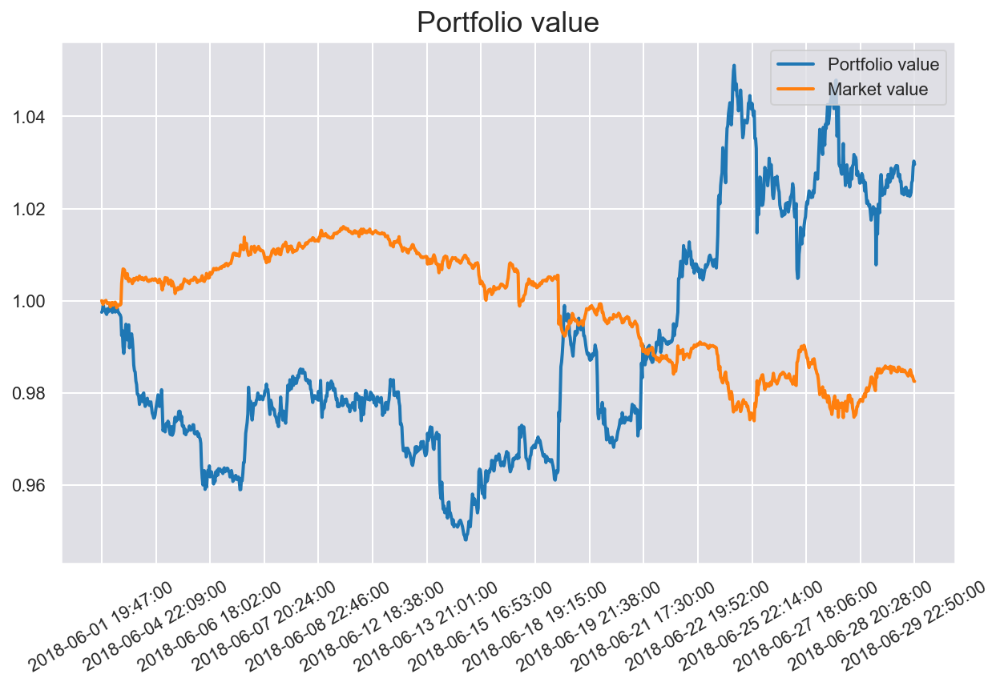

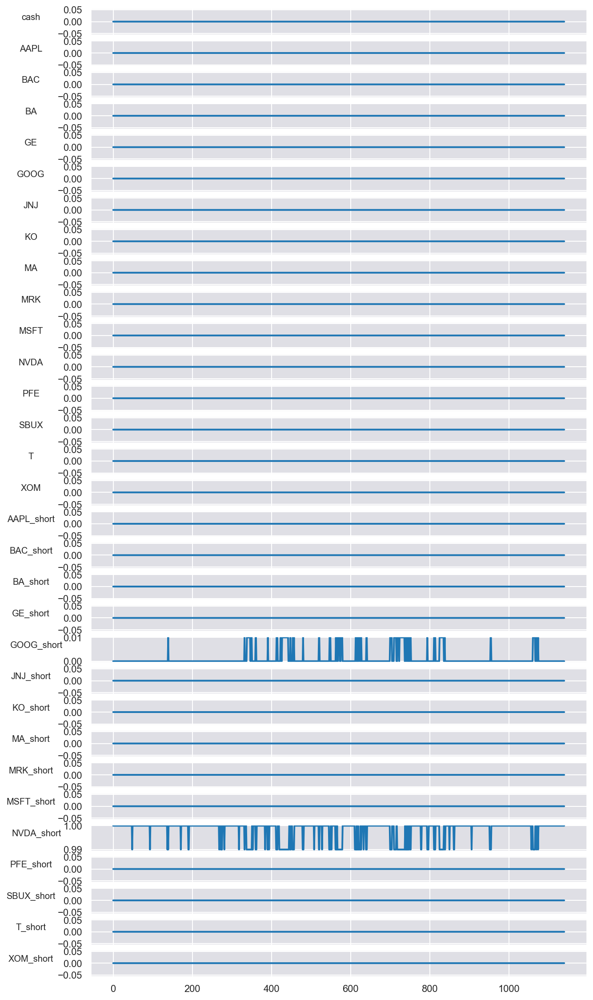

In [47]:
tf.reset_default_graph()
sess = tf.Session()
tflearn.config.init_training_mode()
action_dim = [nb_classes*2 + 1]
state_dim = [nb_classes + 1, window_length, 3]
variable_scope = get_variable_scope(window_length, predictor_type, use_batch_norm)
with tf.variable_scope(variable_scope):
    actor = StockActor(sess, state_dim, action_dim, action_bound, 1e-4, tau, batch_size, predictor_type, 
                       use_batch_norm)
    critic = StockCritic(sess=sess, state_dim=state_dim, action_dim=action_dim, tau=1e-3,
                         learning_rate=1e-3, num_actor_vars=actor.get_num_trainable_vars(), 
                         predictor_type=predictor_type, use_batch_norm=use_batch_norm)
    actor_noise = OrnsteinUhlenbeckActionNoise(mu=np.zeros(action_dim))

    model_save_path = "weights/"
    summary_path = get_result_path(window_length, predictor_type, use_batch_norm)

    ddpg_model = DDPG(environ, sess, actor, critic, actor_noise,param, obs_normalizer=obs_normalizer, model_save_path=model_save_path,
                      summary_path=summary_path)
    ddpg_model.initialize(load_weights=False, verbose=False)
    ddpg_model.train()
    
env_Jun = PortfolioEnv(history_Jun, abbreviation, steps=history_Jun.shape[1]-200, window_length=window_length,
                   start_idx=data['Jun'].date_index.iloc[0])
test_model(env_Jun, ddpg_model)
plot_weights(env_Jun.infos)

Build model from scratch
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
1500
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 0, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field ty

c:\users\lenovo\appdata\local\programs\python\python39\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


Episode: 2, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 3, Reward: 1.00, Qmax: 0.0002
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 4, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0

Episode: 25, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 26, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 27, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 48, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 49, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 50, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 71, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 72, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 73, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 94, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 95, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 96, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 116, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 117, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 118, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 139, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 140, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 141, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03

Episode: 162, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 163, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 164, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 185, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 186, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 187, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 207, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 208, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 209, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 230, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 231, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 232, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 253, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 254, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 255, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 276, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 277, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 278, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 299, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 300, Reward: 1.00, Qmax: -0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.0

Episode: 321, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 322, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 323, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 344, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 345, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 346, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 367, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 368, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 369, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03

Episode: 390, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 391, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 392, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 412, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 413, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 414, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 435, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 436, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 437, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 458, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.03]
Episode: 459, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.03]
Episode: 460, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 481, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.03]
Episode: 482, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 483, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.0

Episode: 503, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 504, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 505, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.04 0.

Episode: 526, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 527, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 528, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.

Episode: 549, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 0.04]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.02 0.04 0.04]
Episode: 550, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 0.04]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 551, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.02 0.04 0.04]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.

Episode: 572, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.02 0.03 0.02 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.02 0.04 0.04]
[0.04 0.03 0.03 0.04 0.03 0.02 0.03 0.02 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.02 0.04 0.04]
Episode: 573, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.02 0.03 0.02 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.02 0.04 0.04]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.02 0.04 0.04]
Episode: 574, Reward: 1.00, Qmax: -0.0000
[0.04 0.03 0.03 0.04 0.03 0.02 0.03 0.02 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.02 0.04 0.04]
[0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.04
 0.04 0.

Episode: 595, Reward: 1.00, Qmax: -0.0000
[0.05 0.02 0.03 0.05 0.03 0.02 0.03 0.02 0.03 0.02 0.02 0.02 0.04 0.04
 0.04 0.03 0.02 0.03 0.04 0.04 0.02 0.04 0.03 0.03 0.02 0.02 0.03 0.05
 0.02 0.04 0.04]
[0.05 0.02 0.03 0.05 0.03 0.02 0.03 0.02 0.03 0.02 0.02 0.02 0.04 0.04
 0.04 0.03 0.02 0.03 0.04 0.04 0.02 0.04 0.03 0.03 0.02 0.02 0.03 0.05
 0.02 0.04 0.04]
Episode: 596, Reward: 1.00, Qmax: -0.0000
[0.05 0.02 0.03 0.05 0.03 0.02 0.03 0.02 0.03 0.02 0.02 0.02 0.04 0.04
 0.04 0.03 0.02 0.03 0.04 0.05 0.02 0.04 0.03 0.03 0.02 0.02 0.03 0.05
 0.02 0.04 0.04]
[0.05 0.02 0.03 0.05 0.03 0.02 0.03 0.02 0.03 0.02 0.02 0.02 0.04 0.04
 0.04 0.03 0.02 0.03 0.04 0.04 0.02 0.04 0.03 0.03 0.02 0.02 0.03 0.05
 0.02 0.04 0.04]
Episode: 597, Reward: 1.00, Qmax: -0.0000
[0.05 0.02 0.03 0.05 0.03 0.02 0.03 0.02 0.03 0.02 0.02 0.02 0.05 0.04
 0.04 0.03 0.02 0.03 0.04 0.05 0.02 0.04 0.03 0.03 0.02 0.02 0.03 0.05
 0.02 0.04 0.04]
[0.05 0.02 0.03 0.05 0.03 0.02 0.03 0.02 0.03 0.02 0.02 0.02 0.04 0.04
 0.04 0.

Episode: 617, Reward: 1.00, Qmax: -0.0000
[0.05 0.02 0.03 0.05 0.03 0.02 0.03 0.02 0.03 0.02 0.02 0.02 0.05 0.04
 0.05 0.03 0.02 0.03 0.03 0.05 0.02 0.04 0.03 0.03 0.02 0.02 0.03 0.05
 0.02 0.04 0.05]
[0.06 0.02 0.03 0.05 0.03 0.02 0.03 0.02 0.03 0.02 0.02 0.02 0.05 0.04
 0.05 0.03 0.02 0.03 0.03 0.05 0.02 0.04 0.03 0.03 0.02 0.02 0.03 0.06
 0.02 0.04 0.05]
Episode: 618, Reward: 1.00, Qmax: -0.0000
[0.05 0.02 0.03 0.05 0.03 0.02 0.03 0.02 0.03 0.02 0.02 0.02 0.05 0.04
 0.05 0.03 0.02 0.03 0.03 0.05 0.02 0.04 0.03 0.03 0.02 0.02 0.03 0.05
 0.02 0.04 0.04]
[0.05 0.02 0.03 0.05 0.03 0.02 0.03 0.02 0.03 0.02 0.02 0.02 0.05 0.04
 0.05 0.03 0.02 0.03 0.03 0.05 0.02 0.04 0.03 0.03 0.02 0.02 0.03 0.05
 0.02 0.04 0.04]
Episode: 619, Reward: 1.00, Qmax: -0.0000
[0.05 0.02 0.03 0.05 0.03 0.02 0.03 0.02 0.03 0.02 0.02 0.02 0.05 0.04
 0.05 0.03 0.02 0.03 0.03 0.05 0.02 0.04 0.03 0.03 0.02 0.02 0.03 0.05
 0.02 0.04 0.05]
[0.06 0.02 0.03 0.05 0.03 0.02 0.03 0.02 0.03 0.02 0.02 0.02 0.05 0.04
 0.05 0.

Episode: 640, Reward: 1.00, Qmax: -0.0000
[0.07 0.02 0.03 0.06 0.03 0.02 0.03 0.01 0.02 0.02 0.02 0.02 0.06 0.04
 0.05 0.03 0.02 0.03 0.03 0.06 0.02 0.05 0.03 0.03 0.02 0.02 0.03 0.07
 0.01 0.04 0.05]
[0.06 0.02 0.03 0.06 0.03 0.02 0.03 0.02 0.02 0.02 0.02 0.02 0.05 0.04
 0.05 0.03 0.02 0.03 0.03 0.05 0.02 0.05 0.03 0.03 0.02 0.02 0.03 0.06
 0.01 0.04 0.05]
Episode: 641, Reward: 1.00, Qmax: -0.0000
[0.07 0.02 0.03 0.06 0.03 0.01 0.02 0.01 0.02 0.01 0.02 0.01 0.06 0.05
 0.06 0.03 0.02 0.02 0.03 0.06 0.02 0.05 0.03 0.03 0.02 0.02 0.03 0.07
 0.01 0.04 0.05]
[0.07 0.02 0.03 0.06 0.03 0.01 0.02 0.01 0.02 0.01 0.02 0.01 0.06 0.05
 0.06 0.03 0.02 0.02 0.03 0.06 0.02 0.05 0.03 0.03 0.02 0.02 0.03 0.07
 0.01 0.04 0.05]
Episode: 642, Reward: 1.00, Qmax: -0.0000
[0.08 0.02 0.02 0.07 0.03 0.01 0.02 0.01 0.02 0.01 0.01 0.01 0.06 0.05
 0.06 0.02 0.01 0.02 0.03 0.06 0.01 0.05 0.02 0.03 0.02 0.01 0.03 0.08
 0.01 0.04 0.05]
[0.07 0.02 0.03 0.06 0.03 0.01 0.03 0.01 0.02 0.02 0.02 0.02 0.06 0.04
 0.05 0.

Episode: 663, Reward: 1.00, Qmax: -0.0000
[0.1  0.01 0.02 0.09 0.03 0.01 0.02 0.01 0.01 0.01 0.01 0.01 0.08 0.05
 0.07 0.02 0.01 0.02 0.03 0.08 0.01 0.05 0.02 0.02 0.01 0.01 0.02 0.1
 0.01 0.04 0.06]
[0.1  0.01 0.02 0.09 0.03 0.01 0.02 0.01 0.01 0.01 0.01 0.01 0.08 0.05
 0.07 0.02 0.01 0.02 0.03 0.08 0.01 0.05 0.02 0.02 0.01 0.01 0.02 0.1
 0.01 0.04 0.06]
Episode: 664, Reward: 1.00, Qmax: -0.0000
[0.1  0.01 0.02 0.09 0.03 0.01 0.02 0.01 0.01 0.01 0.01 0.01 0.08 0.05
 0.07 0.02 0.01 0.02 0.03 0.08 0.01 0.05 0.02 0.02 0.01 0.01 0.02 0.1
 0.01 0.04 0.06]
[0.1  0.01 0.02 0.09 0.03 0.01 0.02 0.01 0.01 0.01 0.01 0.01 0.08 0.05
 0.07 0.02 0.01 0.02 0.03 0.08 0.01 0.05 0.02 0.02 0.01 0.01 0.02 0.1
 0.01 0.04 0.06]
Episode: 665, Reward: 1.00, Qmax: -0.0000
[0.09 0.01 0.02 0.08 0.03 0.01 0.02 0.01 0.02 0.01 0.01 0.01 0.07 0.05
 0.06 0.02 0.01 0.02 0.03 0.07 0.01 0.05 0.02 0.02 0.01 0.01 0.02 0.09
 0.01 0.04 0.06]
[0.1  0.01 0.02 0.09 0.03 0.01 0.02 0.01 0.01 0.01 0.01 0.01 0.08 0.05
 0.07 0.02 0

Episode: 686, Reward: 1.00, Qmax: -0.0000
[0.16 0.   0.01 0.12 0.02 0.   0.01 0.   0.   0.   0.   0.   0.1  0.03
 0.07 0.01 0.   0.01 0.01 0.1  0.   0.05 0.01 0.01 0.   0.   0.01 0.17
 0.   0.03 0.05]
[0.15 0.   0.01 0.12 0.02 0.   0.01 0.   0.01 0.   0.   0.   0.09 0.03
 0.07 0.01 0.   0.01 0.01 0.1  0.   0.05 0.01 0.01 0.   0.   0.01 0.16
 0.   0.03 0.05]
Episode: 687, Reward: 1.00, Qmax: -0.0000
[0.15 0.   0.01 0.12 0.02 0.   0.01 0.   0.01 0.   0.   0.   0.09 0.03
 0.07 0.01 0.   0.01 0.01 0.1  0.   0.05 0.01 0.01 0.   0.   0.01 0.16
 0.   0.03 0.05]
[0.16 0.   0.01 0.12 0.02 0.   0.01 0.   0.   0.   0.   0.   0.1  0.03
 0.07 0.01 0.   0.01 0.01 0.1  0.   0.05 0.01 0.01 0.   0.   0.01 0.17
 0.   0.03 0.05]
Episode: 688, Reward: 1.00, Qmax: -0.0000
[0.15 0.   0.01 0.12 0.02 0.   0.01 0.   0.01 0.   0.   0.   0.09 0.03
 0.07 0.01 0.   0.01 0.01 0.1  0.   0.05 0.01 0.01 0.   0.   0.01 0.16
 0.   0.03 0.05]
[0.11 0.01 0.01 0.1  0.03 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.08 0.04
 0.07 0.

Episode: 707, Reward: 1.00, Qmax: -0.0000
[1.55e-01 5.50e-04 1.44e-03 1.80e-01 1.04e-02 2.83e-04 1.64e-03 2.80e-04
 1.02e-03 3.39e-04 4.93e-04 4.25e-04 6.41e-02 1.57e-02 3.71e-02 1.44e-03
 4.09e-04 1.56e-03 3.33e-03 1.47e-01 4.67e-04 4.57e-02 1.50e-03 2.47e-03
 6.11e-04 4.75e-04 1.58e-03 2.78e-01 1.86e-04 1.97e-02 2.67e-02]
[0.15 0.   0.   0.17 0.01 0.   0.   0.   0.   0.   0.   0.   0.07 0.02
 0.04 0.   0.   0.   0.01 0.14 0.   0.05 0.   0.   0.   0.   0.   0.24
 0.   0.03 0.03]
Episode: 708, Reward: 1.00, Qmax: -0.0000
[1.51e-01 5.31e-04 1.38e-03 1.83e-01 1.02e-02 2.73e-04 1.59e-03 2.70e-04
 9.89e-04 3.27e-04 4.78e-04 4.11e-04 6.19e-02 1.54e-02 3.57e-02 1.39e-03
 3.95e-04 1.52e-03 3.20e-03 1.49e-01 4.51e-04 4.57e-02 1.45e-03 2.39e-03
 5.90e-04 4.58e-04 1.52e-03 2.83e-01 1.79e-04 1.97e-02 2.59e-02]
[1.51e-01 4.92e-04 1.30e-03 1.84e-01 9.85e-03 2.50e-04 1.49e-03 2.48e-04
 9.23e-04 3.01e-04 4.42e-04 3.79e-04 6.13e-02 1.50e-02 3.51e-02 1.30e-03
 3.64e-04 1.43e-03 3.04e-03 1.50e-01 4.16e-

Episode: 721, Reward: 1.00, Qmax: -0.0000
[9.35e-02 2.25e-04 5.92e-04 2.16e-01 6.29e-03 1.07e-04 7.12e-04 1.07e-04
 4.35e-04 1.31e-04 2.07e-04 1.70e-04 3.46e-02 9.32e-03 1.89e-02 5.94e-04
 1.61e-04 7.14e-04 1.43e-03 1.78e-01 1.83e-04 3.58e-02 6.22e-04 1.08e-03
 2.50e-04 1.87e-04 6.59e-04 3.68e-01 6.83e-05 1.67e-02 1.43e-02]
[9.40e-02 2.42e-04 6.30e-04 2.16e-01 6.52e-03 1.16e-04 7.55e-04 1.16e-04
 4.64e-04 1.42e-04 2.23e-04 1.83e-04 3.51e-02 9.61e-03 1.93e-02 6.31e-04
 1.73e-04 7.57e-04 1.50e-03 1.78e-01 1.97e-04 3.64e-02 6.60e-04 1.14e-03
 2.68e-04 2.01e-04 6.99e-04 3.65e-01 7.43e-05 1.71e-02 1.47e-02]
Episode: 722, Reward: 1.00, Qmax: -0.0000
[8.50e-02 1.29e-04 3.66e-04 2.21e-01 4.72e-03 5.79e-05 4.47e-04 5.83e-05
 2.63e-04 7.23e-05 1.19e-04 9.53e-05 2.91e-02 7.20e-03 1.52e-02 3.66e-04
 9.00e-05 4.50e-04 9.41e-04 1.79e-01 1.03e-04 3.06e-02 3.85e-04 7.00e-04
 1.45e-04 1.06e-04 4.10e-04 3.97e-01 3.57e-05 1.38e-02 1.14e-02]
[9.34e-02 3.50e-04 8.60e-04 2.12e-01 7.74e-03 1.76e-04 1.02e-03 

Episode: 735, Reward: 1.00, Qmax: -0.0000
[3.91e-02 4.00e-05 1.21e-04 2.05e-01 2.04e-03 1.63e-05 1.55e-04 1.65e-05
 8.65e-05 2.09e-05 3.70e-05 2.84e-05 1.30e-02 3.53e-03 6.44e-03 1.21e-04
 2.66e-05 1.60e-04 3.32e-04 1.63e-01 3.08e-05 1.40e-02 1.28e-04 2.46e-04
 4.50e-05 3.16e-05 1.38e-04 5.36e-01 9.54e-06 1.02e-02 5.26e-03]
[3.50e-02 2.43e-05 7.83e-05 2.02e-01 1.55e-03 9.40e-06 1.02e-04 9.55e-06
 5.48e-05 1.23e-05 2.24e-05 1.69e-05 1.09e-02 2.76e-03 5.21e-03 7.84e-05
 1.58e-05 1.05e-04 2.27e-04 1.58e-01 1.84e-05 1.19e-02 8.27e-05 1.66e-04
 2.75e-05 1.90e-05 8.96e-05 5.58e-01 5.35e-06 8.46e-03 4.21e-03]
Episode: 736, Reward: 1.00, Qmax: -0.0000
[3.62e-02 3.45e-05 1.06e-04 2.01e-01 1.84e-03 1.39e-05 1.36e-04 1.41e-05
 7.55e-05 1.79e-05 3.20e-05 2.44e-05 1.19e-02 3.24e-03 5.88e-03 1.06e-04
 2.28e-05 1.41e-04 2.94e-04 1.58e-01 2.65e-05 1.28e-02 1.12e-04 2.18e-04
 3.89e-05 2.72e-05 1.21e-04 5.52e-01 8.08e-06 9.73e-03 4.84e-03]
[3.17e-02 1.93e-05 6.36e-05 1.97e-01 1.33e-03 7.31e-06 8.30e-05 

Episode: 749, Reward: 1.00, Qmax: -0.0000
[1.57e-02 1.29e-05 4.20e-05 1.24e-01 8.09e-04 4.87e-06 5.55e-05 4.96e-06
 2.96e-05 6.41e-06 1.20e-05 8.91e-06 5.33e-03 1.70e-03 2.63e-03 4.20e-05
 8.28e-06 5.85e-05 1.21e-04 9.37e-02 9.69e-06 5.27e-03 4.41e-05 8.93e-05
 1.47e-05 1.00e-05 4.82e-05 7.40e-01 2.73e-06 7.75e-03 2.43e-03]
[1.16e-02 5.09e-06 1.84e-05 1.11e-01 4.62e-04 1.76e-06 2.49e-05 1.79e-06
 1.25e-05 2.37e-06 4.71e-06 3.40e-06 3.59e-03 1.04e-03 1.66e-03 1.83e-05
 3.14e-06 2.64e-05 5.81e-05 8.17e-02 3.72e-06 3.55e-03 1.94e-05 4.17e-05
 5.86e-06 3.85e-06 2.13e-05 7.78e-01 9.35e-07 5.41e-03 1.52e-03]
Episode: 750, Reward: 1.00, Qmax: -0.0000
[1.22e-02 6.83e-06 2.37e-05 1.09e-01 5.40e-04 2.43e-06 3.19e-05 2.48e-06
 1.64e-05 3.25e-06 6.33e-06 4.61e-06 3.93e-03 1.20e-03 1.87e-03 2.37e-05
 4.26e-06 3.38e-05 7.25e-05 8.16e-02 5.03e-06 3.86e-03 2.50e-05 5.27e-05
 7.82e-06 5.20e-06 2.74e-05 7.77e-01 1.32e-06 6.15e-03 1.73e-03]
[1.25e-02 7.42e-06 2.55e-05 1.11e-01 5.67e-04 2.66e-06 3.43e-05 

Episode: 763, Reward: 1.00, Qmax: -0.0000
[3.16e-03 7.21e-07 3.00e-06 3.90e-02 1.03e-04 2.17e-07 4.29e-06 2.23e-07
 1.98e-06 3.06e-07 6.64e-07 4.57e-07 9.43e-04 2.96e-04 4.17e-04 2.99e-06
 4.17e-07 4.61e-06 1.07e-05 2.60e-02 5.04e-07 8.43e-04 3.17e-06 7.49e-06
 8.45e-07 5.26e-07 3.56e-06 9.26e-01 1.07e-07 2.73e-03 4.26e-04]
[3.50e-03 9.31e-07 3.78e-06 4.12e-02 1.21e-04 2.87e-07 5.36e-06 2.94e-07
 2.51e-06 4.01e-07 8.58e-07 5.95e-07 1.07e-03 3.42e-04 4.79e-04 3.77e-06
 5.44e-07 5.75e-06 1.32e-05 2.77e-02 6.55e-07 9.56e-04 3.99e-06 9.27e-06
 1.09e-06 6.83e-07 4.46e-06 9.21e-01 1.43e-07 3.03e-03 4.89e-04]
Episode: 764, Reward: 1.00, Qmax: -0.0000
[3.68e-03 1.15e-06 4.54e-06 4.13e-02 1.36e-04 3.60e-07 6.41e-06 3.69e-07
 3.04e-06 5.01e-07 1.06e-06 7.40e-07 1.15e-03 3.80e-04 5.26e-04 4.53e-06
 6.77e-07 6.87e-06 1.55e-05 2.78e-02 8.12e-07 1.03e-03 4.79e-06 1.10e-05
 1.34e-06 8.46e-07 5.35e-06 9.20e-01 1.82e-07 3.29e-03 5.40e-04]
[2.29e-03 3.45e-07 1.54e-06 3.20e-02 6.32e-05 9.78e-08 2.25e-06 

Episode: 777, Reward: 1.00, Qmax: -0.0000
[1.05e-03 1.07e-07 5.17e-07 1.58e-02 2.53e-05 2.80e-08 7.76e-07 2.89e-08
 3.26e-07 4.11e-08 9.76e-08 6.43e-08 2.87e-04 8.74e-05 1.19e-04 5.15e-07
 5.80e-08 8.42e-07 2.11e-06 8.81e-03 7.14e-08 2.38e-04 5.50e-07 1.43e-06
 1.27e-07 7.51e-08 6.26e-07 9.72e-01 1.27e-08 1.22e-03 1.28e-04]
[1.50e-03 2.48e-07 1.11e-06 1.96e-02 4.39e-05 6.99e-08 1.62e-06 7.18e-08
 7.16e-07 1.00e-07 2.28e-07 1.53e-07 4.40e-04 1.42e-04 1.90e-04 1.10e-06
 1.39e-07 1.75e-06 4.20e-06 1.12e-02 1.70e-07 3.67e-04 1.17e-06 2.89e-06
 2.93e-07 1.78e-07 1.33e-06 9.65e-01 3.30e-08 1.73e-03 2.05e-04]
Episode: 778, Reward: 1.00, Qmax: -0.0000
[1.25e-03 1.67e-07 7.74e-07 1.73e-02 3.36e-05 4.57e-08 1.15e-06 4.70e-08
 4.96e-07 6.62e-08 1.53e-07 1.02e-07 3.56e-04 1.13e-04 1.51e-04 7.72e-07
 9.26e-08 1.24e-06 3.03e-06 9.70e-03 1.13e-07 2.95e-04 8.22e-07 2.07e-06
 1.99e-07 1.19e-07 9.31e-07 9.69e-01 2.12e-08 1.47e-03 1.63e-04]
[1.40e-03 2.19e-07 9.89e-07 1.85e-02 4.02e-05 6.13e-08 1.46e-06 

Episode: 791, Reward: 1.00, Qmax: -0.0000
[1.29e-03 2.52e-07 1.10e-06 1.55e-02 4.09e-05 7.22e-08 1.61e-06 7.43e-08
 7.19e-07 1.03e-07 2.32e-07 1.57e-07 3.94e-04 1.35e-04 1.74e-04 1.10e-06
 1.43e-07 1.74e-06 4.10e-06 8.06e-03 1.74e-07 3.18e-04 1.17e-06 2.84e-06
 2.98e-07 1.82e-07 1.32e-06 9.72e-01 3.45e-08 1.70e-03 1.92e-04]
[8.54e-04 9.73e-08 4.66e-07 1.20e-02 2.18e-05 2.58e-08 7.01e-07 2.66e-08
 2.96e-07 3.78e-08 8.93e-08 5.89e-08 2.42e-04 7.73e-05 1.01e-04 4.65e-07
 5.32e-08 7.60e-07 1.88e-06 5.99e-03 6.54e-08 1.93e-04 4.96e-07 1.28e-06
 1.16e-07 6.87e-08 5.64e-07 9.79e-01 1.17e-08 1.14e-03 1.12e-04]
Episode: 792, Reward: 1.00, Qmax: -0.0000
[6.98e-04 6.20e-08 3.10e-07 1.05e-02 1.61e-05 1.58e-08 4.72e-07 1.63e-08
 1.94e-07 2.34e-08 5.68e-08 3.70e-08 1.91e-04 5.92e-05 7.83e-05 3.09e-07
 3.33e-08 5.12e-07 1.30e-06 5.12e-03 4.12e-08 1.51e-04 3.30e-07 8.73e-07
 7.45e-08 4.34e-08 3.77e-07 9.82e-01 7.06e-09 9.48e-04 8.70e-05]
[9.76e-04 1.34e-07 6.22e-07 1.30e-02 2.68e-05 3.65e-08 9.27e-07 

Episode: 804, Reward: 1.00, Qmax: -0.0000
[8.63e-04 1.11e-07 5.21e-07 1.22e-02 2.31e-05 2.98e-08 7.81e-07 3.07e-08
 3.33e-07 4.35e-08 1.02e-07 6.75e-08 2.50e-04 8.18e-05 1.06e-04 5.20e-07
 6.10e-08 8.46e-07 2.07e-06 5.53e-03 7.48e-08 1.96e-04 5.54e-07 1.41e-06
 1.32e-07 7.86e-08 6.30e-07 9.79e-01 1.37e-08 1.19e-03 1.18e-04]
[9.01e-04 1.22e-07 5.69e-07 1.25e-02 2.47e-05 3.30e-08 8.49e-07 3.40e-08
 3.64e-07 4.81e-08 1.12e-07 7.45e-08 2.63e-04 8.66e-05 1.12e-04 5.67e-07
 6.74e-08 9.20e-07 2.24e-06 5.71e-03 8.25e-08 2.07e-04 6.04e-07 1.53e-06
 1.45e-07 8.67e-08 6.86e-07 9.79e-01 1.53e-08 1.24e-03 1.25e-04]
Episode: 805, Reward: 1.00, Qmax: -0.0000
[9.61e-04 1.42e-07 6.51e-07 1.30e-02 2.72e-05 3.89e-08 9.68e-07 4.00e-08
 4.19e-07 5.64e-08 1.30e-07 8.70e-08 2.83e-04 9.45e-05 1.22e-04 6.49e-07
 7.87e-08 1.05e-06 2.53e-06 5.96e-03 9.62e-08 2.23e-04 6.91e-07 1.74e-06
 1.69e-07 1.01e-07 7.84e-07 9.78e-01 1.81e-08 1.32e-03 1.36e-04]
[9.24e-04 1.30e-07 6.01e-07 1.27e-02 2.57e-05 3.53e-08 8.96e-07 

Episode: 818, Reward: 1.00, Qmax: -0.0000
[1.63e-03 4.77e-07 1.95e-06 1.92e-02 6.08e-05 1.45e-07 2.81e-06 1.49e-07
 1.30e-06 2.04e-07 4.41e-07 3.04e-07 5.29e-04 1.92e-04 2.44e-04 1.95e-06
 2.77e-07 3.02e-06 6.84e-06 8.62e-03 3.34e-07 4.23e-04 2.06e-06 4.83e-06
 5.60e-07 3.49e-07 2.32e-06 9.67e-01 7.15e-08 2.18e-03 2.70e-04]
[8.58e-04 1.10e-07 5.18e-07 1.31e-02 2.30e-05 2.96e-08 7.76e-07 3.04e-08
 3.31e-07 4.31e-08 1.01e-07 6.70e-08 2.49e-04 8.15e-05 1.06e-04 5.17e-07
 6.05e-08 8.41e-07 2.06e-06 5.38e-03 7.43e-08 1.94e-04 5.51e-07 1.40e-06
 1.31e-07 7.80e-08 6.26e-07 9.79e-01 1.36e-08 1.18e-03 1.18e-04]
Episode: 819, Reward: 1.00, Qmax: -0.0000
[1.51e-03 4.00e-07 1.67e-06 1.85e-02 5.41e-05 1.20e-07 2.41e-06 1.23e-07
 1.10e-06 1.69e-07 3.69e-07 2.54e-07 4.84e-04 1.74e-04 2.21e-04 1.66e-06
 2.31e-07 2.59e-06 5.92e-06 8.15e-03 2.79e-07 3.85e-04 1.76e-06 4.16e-06
 4.70e-07 2.91e-07 1.98e-06 9.68e-01 5.85e-08 2.03e-03 2.44e-04]
[8.56e-04 1.10e-07 5.16e-07 1.31e-02 2.29e-05 2.94e-08 7.73e-07 

Episode: 832, Reward: 1.00, Qmax: 0.0000
[7.02e-04 7.00e-08 3.45e-07 1.24e-02 1.71e-05 1.81e-08 5.23e-07 1.86e-08
 2.17e-07 2.67e-08 6.41e-08 4.20e-08 1.97e-04 6.31e-05 8.21e-05 3.44e-07
 3.78e-08 5.68e-07 1.43e-06 4.66e-03 4.67e-08 1.52e-04 3.67e-07 9.62e-07
 8.40e-08 4.91e-08 4.19e-07 9.81e-01 8.12e-09 1.03e-03 9.23e-05]
[1.36e-03 3.19e-07 1.36e-06 1.85e-02 4.67e-05 9.36e-08 1.98e-06 9.62e-08
 8.94e-07 1.33e-07 2.95e-07 2.01e-07 4.31e-04 1.53e-04 1.95e-04 1.36e-06
 1.83e-07 2.13e-06 4.94e-06 7.59e-03 2.21e-07 3.41e-04 1.44e-06 3.45e-06
 3.77e-07 2.32e-07 1.62e-06 9.69e-01 4.53e-08 1.93e-03 2.17e-04]
Episode: 833, Reward: 1.00, Qmax: -0.0000
[4.30e-04 2.29e-08 1.26e-07 9.32e-03 8.13e-06 5.40e-09 1.96e-07 5.59e-09
 7.68e-08 8.19e-09 2.09e-08 1.33e-08 1.11e-04 3.29e-05 4.35e-05 1.25e-07
 1.19e-08 2.15e-07 5.73e-07 3.24e-03 1.49e-08 8.41e-05 1.34e-07 3.76e-07
 2.79e-08 1.57e-08 1.55e-07 9.86e-01 2.30e-09 6.53e-04 4.93e-05]
[1.19e-03 2.36e-07 1.03e-06 1.71e-02 3.82e-05 6.74e-08 1.52e-06 6

Episode: 846, Reward: 1.00, Qmax: -0.0000
[1.16e-03 2.36e-07 1.03e-06 1.72e-02 3.78e-05 6.74e-08 1.51e-06 6.93e-08
 6.73e-07 9.66e-08 2.17e-07 1.47e-07 3.63e-04 1.29e-04 1.62e-04 1.03e-06
 1.33e-07 1.63e-06 3.83e-06 6.50e-03 1.62e-07 2.82e-04 1.09e-06 2.66e-06
 2.79e-07 1.70e-07 1.23e-06 9.72e-01 3.22e-08 1.86e-03 1.82e-04]
[7.44e-04 8.56e-08 4.13e-07 1.32e-02 1.93e-05 2.25e-08 6.22e-07 2.32e-08
 2.62e-07 3.31e-08 7.85e-08 5.17e-08 2.15e-04 7.12e-05 9.08e-05 4.11e-07
 4.66e-08 6.75e-07 1.67e-06 4.67e-03 5.74e-08 1.65e-04 4.39e-07 1.14e-06
 1.02e-07 6.03e-08 5.00e-07 9.79e-01 1.02e-08 1.23e-03 1.03e-04]
Episode: 847, Reward: 1.00, Qmax: -0.0000
[9.82e-04 1.62e-07 7.36e-07 1.56e-02 2.94e-05 4.50e-08 1.09e-06 4.64e-08
 4.75e-07 6.51e-08 1.49e-07 1.00e-07 2.98e-04 1.03e-04 1.31e-04 7.34e-07
 9.06e-08 1.18e-06 2.82e-06 5.71e-03 1.11e-07 2.31e-04 7.80e-07 1.94e-06
 1.93e-07 1.16e-07 8.84e-07 9.75e-01 2.11e-08 1.61e-03 1.48e-04]
[1.11e-03 2.13e-07 9.40e-07 1.67e-02 3.52e-05 6.04e-08 1.38e-06 

Episode: 860, Reward: 1.00, Qmax: -0.0000
[1.10e-03 2.28e-07 9.98e-07 1.71e-02 3.63e-05 6.53e-08 1.47e-06 6.72e-08
 6.52e-07 9.37e-08 2.10e-07 1.42e-07 3.47e-04 1.26e-04 1.55e-04 9.95e-07
 1.29e-07 1.58e-06 3.71e-06 5.80e-03 1.57e-07 2.66e-04 1.06e-06 2.58e-06
 2.70e-07 1.65e-07 1.19e-06 9.73e-01 3.12e-08 1.99e-03 1.78e-04]
[1.12e-03 2.41e-07 1.05e-06 1.74e-02 3.76e-05 6.93e-08 1.54e-06 7.13e-08
 6.86e-07 9.92e-08 2.22e-07 1.51e-07 3.57e-04 1.30e-04 1.60e-04 1.05e-06
 1.37e-07 1.66e-06 3.88e-06 5.90e-03 1.66e-07 2.74e-04 1.11e-06 2.70e-06
 2.85e-07 1.74e-07 1.25e-06 9.72e-01 3.32e-08 2.03e-03 1.83e-04]
Episode: 861, Reward: 1.00, Qmax: -0.0000
[5.19e-04 4.20e-08 2.16e-07 1.11e-02 1.17e-05 1.04e-08 3.32e-07 1.08e-08
 1.34e-07 1.56e-08 3.84e-08 2.48e-08 1.44e-04 4.67e-05 5.91e-05 2.15e-07
 2.23e-08 3.61e-07 9.28e-07 3.29e-03 2.77e-08 1.07e-04 2.30e-07 6.19e-07
 5.07e-08 2.92e-08 2.64e-07 9.84e-01 4.59e-09 1.01e-03 6.87e-05]
[7.76e-04 1.04e-07 4.91e-07 1.40e-02 2.15e-05 2.79e-08 7.36e-07 

Episode: 874, Reward: 1.00, Qmax: -0.0000
[1.51e-03 4.73e-07 1.93e-06 2.31e-02 5.89e-05 1.44e-07 2.78e-06 1.47e-07
 1.29e-06 2.02e-07 4.37e-07 3.02e-07 5.07e-04 1.95e-04 2.37e-04 1.93e-06
 2.75e-07 2.99e-06 6.74e-06 7.21e-03 3.31e-07 3.91e-04 2.04e-06 4.77e-06
 5.56e-07 3.46e-07 2.29e-06 9.64e-01 7.09e-08 2.82e-03 2.71e-04]
[9.76e-04 1.75e-07 7.86e-07 1.80e-02 3.04e-05 4.89e-08 1.16e-06 5.03e-08
 5.09e-07 7.05e-08 1.61e-07 1.08e-07 3.03e-04 1.09e-04 1.34e-04 7.83e-07
 9.79e-08 1.26e-06 2.99e-06 5.18e-03 1.19e-07 2.30e-04 8.32e-07 2.06e-06
 2.08e-07 1.25e-07 9.43e-07 9.73e-01 2.30e-08 1.90e-03 1.55e-04]
Episode: 875, Reward: 1.00, Qmax: -0.0000
[4.99e-04 3.84e-08 1.99e-07 1.24e-02 1.11e-05 9.46e-09 3.07e-07 9.77e-09
 1.24e-07 1.42e-08 3.51e-08 2.26e-08 1.38e-04 4.50e-05 5.65e-05 1.99e-07
 2.03e-08 3.35e-07 8.65e-07 3.11e-03 2.52e-08 1.02e-04 2.12e-07 5.76e-07
 4.64e-08 2.66e-08 2.44e-07 9.82e-01 4.13e-09 1.05e-03 6.63e-05]
[8.58e-04 1.30e-07 6.03e-07 1.69e-02 2.50e-05 3.56e-08 8.99e-07 

Episode: 888, Reward: 1.00, Qmax: -0.0000
[1.24e-03 2.93e-07 1.26e-06 2.45e-02 4.33e-05 8.52e-08 1.84e-06 8.76e-08
 8.25e-07 1.22e-07 2.70e-07 1.84e-07 4.02e-04 1.50e-04 1.83e-04 1.25e-06
 1.67e-07 1.98e-06 4.59e-06 6.14e-03 2.03e-07 3.06e-04 1.33e-06 3.21e-06
 3.46e-07 2.12e-07 1.50e-06 9.64e-01 4.11e-08 2.43e-03 2.12e-04]
[6.25e-04 6.11e-08 3.05e-07 1.69e-02 1.53e-05 1.56e-08 4.65e-07 1.61e-08
 1.92e-07 2.31e-08 5.60e-08 3.65e-08 1.79e-04 6.04e-05 7.51e-05 3.04e-07
 3.29e-08 5.05e-07 1.28e-06 3.64e-03 4.06e-08 1.32e-04 3.25e-07 8.58e-07
 7.35e-08 4.28e-08 3.71e-07 9.77e-01 6.96e-09 1.31e-03 8.82e-05]
Episode: 889, Reward: 1.00, Qmax: -0.0000
[5.20e-04 4.00e-08 2.08e-07 1.55e-02 1.16e-05 9.87e-09 3.21e-07 1.02e-08
 1.29e-07 1.48e-08 3.66e-08 2.36e-08 1.44e-04 4.73e-05 5.91e-05 2.07e-07
 2.12e-08 3.50e-07 9.03e-07 3.17e-03 2.63e-08 1.06e-04 2.22e-07 6.01e-07
 4.84e-08 2.78e-08 2.55e-07 9.79e-01 4.31e-09 1.11e-03 6.97e-05]
[8.68e-04 1.28e-07 5.96e-07 2.05e-02 2.50e-05 3.48e-08 8.90e-07 

Episode: 901, Reward: 1.00, Qmax: -0.0000
[7.28e-04 7.97e-08 3.91e-07 2.29e-02 1.86e-05 2.07e-08 5.91e-07 2.14e-08
 2.47e-07 3.05e-08 7.31e-08 4.80e-08 2.12e-04 7.28e-05 8.99e-05 3.89e-07
 4.32e-08 6.42e-07 1.60e-06 4.14e-03 5.33e-08 1.57e-04 4.15e-07 1.08e-06
 9.56e-08 5.61e-08 4.74e-07 9.70e-01 9.33e-09 1.54e-03 1.06e-04]
[1.13e-03 2.20e-07 9.76e-07 2.87e-02 3.64e-05 6.20e-08 1.44e-06 6.38e-08
 6.33e-07 8.92e-08 2.02e-07 1.36e-07 3.57e-04 1.31e-04 1.60e-04 9.72e-07
 1.24e-07 1.55e-06 3.67e-06 5.78e-03 1.50e-07 2.69e-04 1.03e-06 2.54e-06
 2.60e-07 1.58e-07 1.17e-06 9.61e-01 2.94e-08 2.28e-03 1.86e-04]
Episode: 902, Reward: 1.00, Qmax: -0.0000
[6.04e-04 5.18e-08 2.65e-07 2.12e-02 1.40e-05 1.30e-08 4.06e-07 1.34e-08
 1.65e-07 1.93e-08 4.74e-08 3.07e-08 1.70e-04 5.69e-05 7.06e-05 2.64e-07
 2.76e-08 4.41e-07 1.13e-06 3.59e-03 3.42e-08 1.25e-04 2.82e-07 7.56e-07
 6.24e-08 3.61e-08 3.23e-07 9.73e-01 5.72e-09 1.31e-03 8.35e-05]
[1.64e-03 5.09e-07 2.09e-06 3.51e-02 6.36e-05 1.54e-07 3.00e-06 

Episode: 915, Reward: 1.00, Qmax: -0.0000
[7.15e-04 7.13e-08 3.55e-07 2.96e-02 1.76e-05 1.82e-08 5.40e-07 1.88e-08
 2.23e-07 2.70e-08 6.53e-08 4.26e-08 2.06e-04 7.06e-05 8.68e-05 3.54e-07
 3.83e-08 5.87e-07 1.48e-06 4.05e-03 4.74e-08 1.51e-04 3.78e-07 9.97e-07
 8.56e-08 4.99e-08 4.32e-07 9.63e-01 8.15e-09 1.54e-03 1.03e-04]
[1.51e-03 4.01e-07 1.69e-06 4.21e-02 5.51e-05 1.19e-07 2.45e-06 1.22e-07
 1.11e-06 1.68e-07 3.70e-07 2.53e-07 4.99e-04 1.91e-04 2.30e-04 1.69e-06
 2.30e-07 2.64e-06 6.06e-06 7.13e-03 2.79e-07 3.77e-04 1.78e-06 4.25e-06
 4.72e-07 2.91e-07 2.01e-06 9.45e-01 5.77e-08 3.00e-03 2.68e-04]
Episode: 916, Reward: 1.00, Qmax: -0.0000
[2.22e-03 9.73e-07 3.76e-06 5.10e-02 9.88e-05 3.10e-07 5.32e-06 3.18e-07
 2.54e-06 4.31e-07 9.01e-07 6.32e-07 7.83e-04 3.18e-04 3.79e-04 3.75e-06
 5.78e-07 5.71e-06 1.25e-05 9.47e-03 6.92e-07 6.01e-04 3.96e-06 8.94e-06
 1.13e-06 7.21e-07 4.43e-06 9.30e-01 1.58e-07 4.22e-03 4.37e-04]
[6.77e-04 6.27e-08 3.17e-07 2.94e-02 1.62e-05 1.59e-08 4.83e-07 

Episode: 929, Reward: 1.00, Qmax: -0.0000
[8.72e-04 1.12e-07 5.35e-07 3.97e-02 2.38e-05 2.96e-08 8.03e-07 3.05e-08
 3.39e-07 4.34e-08 1.02e-07 6.76e-08 2.61e-04 9.35e-05 1.13e-04 5.33e-07
 6.10e-08 8.71e-07 2.15e-06 4.48e-03 7.50e-08 1.90e-04 5.67e-07 1.46e-06
 1.33e-07 7.89e-08 6.46e-07 9.52e-01 1.35e-08 2.01e-03 1.35e-04]
[8.45e-04 1.04e-07 5.00e-07 3.92e-02 2.26e-05 2.73e-08 7.53e-07 2.82e-08
 3.17e-07 4.01e-08 9.51e-08 6.27e-08 2.52e-04 8.97e-05 1.08e-04 4.98e-07
 5.65e-08 8.17e-07 2.02e-06 4.38e-03 6.96e-08 1.83e-04 5.31e-07 1.37e-06
 1.24e-07 7.32e-08 6.06e-07 9.53e-01 1.24e-08 1.96e-03 1.30e-04]
Episode: 930, Reward: 1.00, Qmax: -0.0000
[1.16e-03 2.13e-07 9.59e-07 4.59e-02 3.65e-05 5.96e-08 1.41e-06 6.14e-08
 6.20e-07 8.60e-08 1.96e-07 1.32e-07 3.64e-04 1.36e-04 1.63e-04 9.55e-07
 1.19e-07 1.53e-06 3.64e-06 5.56e-03 1.46e-07 2.68e-04 1.01e-06 2.51e-06
 2.53e-07 1.53e-07 1.15e-06 9.44e-01 2.81e-08 2.59e-03 1.94e-04]
[1.46e-03 3.63e-07 1.55e-06 5.07e-02 5.18e-05 1.06e-07 2.26e-06 

Episode: 943, Reward: 1.00, Qmax: -0.0000
[1.34e-03 2.64e-07 1.17e-06 7.04e-02 4.34e-05 7.45e-08 1.73e-06 7.67e-08
 7.61e-07 1.07e-07 2.43e-07 1.64e-07 4.27e-04 1.62e-04 1.92e-04 1.17e-06
 1.48e-07 1.87e-06 4.41e-06 6.36e-03 1.81e-07 3.13e-04 1.24e-06 3.06e-06
 3.12e-07 1.90e-07 1.41e-06 9.17e-01 3.53e-08 3.11e-03 2.29e-04]
[9.22e-04 1.09e-07 5.31e-07 6.13e-02 2.44e-05 2.86e-08 7.99e-07 2.95e-08
 3.35e-07 4.21e-08 1.00e-07 6.59e-08 2.74e-04 9.81e-05 1.18e-04 5.29e-07
 5.94e-08 8.68e-07 2.16e-06 4.79e-03 7.32e-08 1.97e-04 5.63e-07 1.46e-06
 1.31e-07 7.70e-08 6.43e-07 9.30e-01 1.30e-08 2.25e-03 1.42e-04]
Episode: 944, Reward: 1.00, Qmax: -0.0000
[2.25e-03 8.83e-07 3.49e-06 8.79e-02 9.60e-05 2.77e-07 4.96e-06 2.84e-07
 2.34e-06 3.86e-07 8.17e-07 5.70e-07 7.87e-04 3.22e-04 3.77e-04 3.48e-06
 5.21e-07 5.33e-06 1.18e-05 9.40e-03 6.25e-07 5.91e-04 3.67e-06 8.41e-06
 1.03e-06 6.51e-07 4.12e-06 8.93e-01 1.39e-07 4.87e-03 4.44e-04]
[2.98e-03 1.73e-06 6.39e-06 9.71e-02 1.49e-04 5.74e-07 8.92e-06 

Episode: 957, Reward: 1.00, Qmax: -0.0000
[2.56e-03 1.07e-06 4.20e-06 1.39e-01 1.12e-04 3.39e-07 5.95e-06 3.47e-07
 2.82e-06 4.72e-07 9.92e-07 6.94e-07 9.07e-04 3.80e-04 4.39e-04 4.19e-06
 6.34e-07 6.39e-06 1.40e-05 1.04e-02 7.61e-07 6.75e-04 4.42e-06 1.00e-05
 1.25e-06 7.93e-07 4.95e-06 8.39e-01 1.71e-07 5.95e-03 5.20e-04]
[1.50e-03 2.93e-07 1.31e-06 1.21e-01 4.84e-05 8.28e-08 1.92e-06 8.52e-08
 8.48e-07 1.19e-07 2.70e-07 1.82e-07 4.79e-04 1.84e-04 2.16e-04 1.30e-06
 1.65e-07 2.08e-06 4.92e-06 6.97e-03 2.01e-07 3.46e-04 1.38e-06 3.41e-06
 3.47e-07 2.11e-07 1.57e-06 8.65e-01 3.92e-08 3.79e-03 2.60e-04]
Episode: 958, Reward: 1.00, Qmax: 0.0000
[1.58e-03 3.35e-07 1.48e-06 1.26e-01 5.28e-05 9.57e-08 2.16e-06 9.84e-08
 9.60e-07 1.37e-07 3.08e-07 2.09e-07 5.12e-04 1.99e-04 2.32e-04 1.47e-06
 1.89e-07 2.34e-06 5.49e-06 7.24e-03 2.31e-07 3.70e-04 1.56e-06 3.82e-06
 3.96e-07 2.41e-07 1.77e-06 8.60e-01 4.56e-08 4.03e-03 2.80e-04]
[3.07e-03 1.66e-06 6.21e-06 1.49e-01 1.49e-04 5.44e-07 8.68e-06 5

Episode: 971, Reward: 1.00, Qmax: -0.0000
[1.62e-03 3.53e-07 1.56e-06 1.80e-01 5.47e-05 1.01e-07 2.28e-06 1.04e-07
 1.01e-06 1.45e-07 3.25e-07 2.20e-07 5.30e-04 2.16e-04 2.42e-04 1.55e-06
 2.00e-07 2.46e-06 5.77e-06 6.89e-03 2.43e-07 3.73e-04 1.64e-06 4.01e-06
 4.17e-07 2.54e-07 1.86e-06 8.05e-01 4.81e-08 5.13e-03 3.03e-04]
[1.98e-03 5.72e-07 2.40e-06 1.87e-01 7.47e-05 1.70e-07 3.46e-06 1.75e-07
 1.58e-06 2.41e-07 5.27e-07 3.61e-07 6.71e-04 2.81e-04 3.15e-04 2.39e-06
 3.29e-07 3.73e-06 8.50e-06 7.99e-03 3.98e-07 4.77e-04 2.52e-06 5.99e-06
 6.71e-07 4.16e-07 2.85e-06 7.95e-01 8.33e-08 6.00e-03 3.91e-04]
Episode: 972, Reward: 1.00, Qmax: -0.0000
[1.12e-03 1.43e-07 6.91e-07 1.75e-01 3.05e-05 3.77e-08 1.04e-06 3.89e-08
 4.37e-07 5.53e-08 1.31e-07 8.64e-08 3.41e-04 1.31e-04 1.48e-04 6.88e-07
 7.79e-08 1.13e-06 2.78e-06 5.19e-03 9.60e-08 2.34e-04 7.32e-07 1.89e-06
 1.71e-07 1.01e-07 8.36e-07 8.14e-01 1.72e-08 3.85e-03 1.89e-04]
[1.57e-03 3.24e-07 1.44e-06 1.87e-01 5.19e-05 9.19e-08 2.12e-06 

Episode: 985, Reward: 1.00, Qmax: -0.0000
[1.92e-03 4.90e-07 2.10e-06 3.56e-01 6.88e-05 1.43e-07 3.05e-06 1.47e-07
 1.38e-06 2.04e-07 4.51e-07 3.08e-07 6.41e-04 2.71e-04 2.98e-04 2.09e-06
 2.80e-07 3.29e-06 7.60e-06 7.56e-03 3.40e-07 4.46e-04 2.22e-06 5.33e-06
 5.77e-07 3.55e-07 2.50e-06 6.26e-01 6.92e-08 6.18e-03 3.78e-04]
[2.94e-03 1.42e-06 5.46e-06 3.63e-01 1.36e-04 4.57e-07 7.68e-06 4.68e-07
 3.69e-06 6.33e-07 1.32e-06 9.25e-07 1.07e-03 4.82e-04 5.27e-04 5.44e-06
 8.47e-07 8.24e-06 1.79e-05 1.04e-02 1.01e-06 7.64e-04 5.73e-06 1.29e-05
 1.65e-06 1.06e-06 6.41e-06 6.12e-01 2.34e-07 8.62e-03 6.56e-04]
Episode: 986, Reward: 1.00, Qmax: -0.0000
[1.89e-03 4.71e-07 2.03e-06 3.72e-01 6.71e-05 1.37e-07 2.95e-06 1.41e-07
 1.33e-06 1.95e-07 4.33e-07 2.95e-07 6.29e-04 2.65e-04 2.92e-04 2.02e-06
 2.68e-07 3.18e-06 7.36e-06 7.44e-03 3.26e-07 4.36e-04 2.14e-06 5.15e-06
 5.54e-07 3.41e-07 2.42e-06 6.11e-01 6.61e-08 6.10e-03 3.71e-04]
[2.98e-03 1.48e-06 5.66e-06 3.78e-01 1.40e-04 4.78e-07 7.96e-06 

Episode: 999, Reward: 1.00, Qmax: -0.0000
[2.12e-03 7.56e-07 3.06e-06 6.19e-01 8.67e-05 2.32e-07 4.38e-06 2.38e-07
 2.04e-06 3.26e-07 6.98e-07 4.83e-07 7.38e-04 3.30e-04 3.53e-04 3.05e-06
 4.41e-07 4.70e-06 1.05e-05 7.47e-03 5.32e-07 5.14e-04 3.22e-06 7.47e-06
 8.84e-07 5.55e-07 3.62e-06 3.63e-01 1.16e-07 6.31e-03 4.54e-04]
[1.78e-03 4.91e-07 2.08e-06 6.25e-01 6.57e-05 1.45e-07 3.01e-06 1.49e-07
 1.37e-06 2.06e-07 4.52e-07 3.10e-07 5.98e-04 2.60e-04 2.80e-04 2.07e-06
 2.82e-07 3.24e-06 7.42e-06 6.53e-03 3.41e-07 4.12e-04 2.19e-06 5.22e-06
 5.77e-07 3.57e-07 2.47e-06 3.59e-01 7.06e-08 5.49e-03 3.63e-04]
Episode: 1000, Reward: 1.00, Qmax: -0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no 

Episode: 1012, Reward: 1.00, Qmax: -0.0000
[1.49e-03 5.81e-07 2.31e-06 8.40e-01 6.35e-05 1.80e-07 3.31e-06 1.85e-07
 1.55e-06 2.53e-07 5.37e-07 3.73e-07 5.22e-04 2.42e-04 2.52e-04 2.30e-06
 3.41e-07 3.54e-06 7.83e-06 4.92e-03 4.10e-07 3.62e-04 2.43e-06 5.60e-06
 6.79e-07 4.27e-07 2.73e-06 1.48e-01 9.04e-08 4.13e-03 3.31e-04]
[8.20e-04 1.49e-07 6.74e-07 8.64e-01 2.58e-05 4.11e-08 1.00e-06 4.23e-08
 4.36e-07 5.96e-08 1.36e-07 9.15e-08 2.60e-04 1.12e-04 1.17e-04 6.71e-07
 8.29e-08 1.08e-06 2.58e-06 3.05e-03 1.01e-07 1.74e-04 7.13e-07 1.78e-06
 1.77e-07 1.06e-07 8.11e-07 1.28e-01 1.93e-08 2.53e-03 1.57e-04]
Episode: 1013, Reward: 1.00, Qmax: -0.0000
[1.22e-03 3.87e-07 1.59e-06 8.58e-01 4.79e-05 1.17e-07 2.31e-06 1.20e-07
 1.06e-06 1.65e-07 3.57e-07 2.46e-07 4.16e-04 1.89e-04 1.96e-04 1.59e-06
 2.24e-07 2.48e-06 5.58e-06 4.14e-03 2.71e-07 2.86e-04 1.68e-06 3.96e-06
 4.55e-07 2.83e-07 1.89e-06 1.32e-01 5.74e-08 3.45e-03 2.60e-04]
[6.92e-04 1.08e-07 5.01e-07 8.80e-01 2.05e-05 2.91e-08 7.53e-0

Episode: 1026, Reward: 1.00, Qmax: -0.0000
[2.31e-04 2.03e-08 1.04e-07 9.65e-01 5.51e-06 5.02e-09 1.62e-07 5.19e-09
 6.54e-08 7.56e-09 1.86e-08 1.20e-08 6.62e-05 2.73e-05 2.76e-05 1.04e-07
 1.08e-08 1.76e-07 4.47e-07 9.12e-04 1.34e-08 4.27e-05 1.11e-07 3.01e-07
 2.46e-08 1.41e-08 1.28e-07 3.30e-02 2.21e-09 7.15e-04 3.92e-05]
[4.64e-04 8.96e-08 4.00e-07 9.53e-01 1.51e-05 2.49e-08 6.01e-07 2.57e-08
 2.62e-07 3.62e-08 8.25e-08 5.54e-08 1.48e-04 6.54e-05 6.62e-05 3.99e-07
 5.02e-08 6.45e-07 1.52e-06 1.63e-03 6.12e-08 9.87e-05 4.25e-07 1.06e-06
 1.07e-07 6.41e-08 4.82e-07 4.34e-02 1.18e-08 1.30e-03 9.13e-05]
Episode: 1027, Reward: 1.00, Qmax: -0.0000
[2.10e-04 1.73e-08 8.94e-08 9.68e-01 4.88e-06 4.23e-09 1.40e-07 4.37e-09
 5.61e-08 6.39e-09 1.58e-08 1.02e-08 5.95e-05 2.44e-05 2.46e-05 8.91e-08
 9.15e-09 1.52e-07 3.88e-07 8.32e-04 1.14e-08 3.82e-05 9.54e-08 2.60e-07
 2.10e-08 1.20e-08 1.10e-07 3.01e-02 1.85e-09 6.50e-04 3.51e-05]
[2.80e-04 3.19e-08 1.56e-07 9.64e-01 7.40e-06 8.19e-09 2.41e-0

Episode: 1040, Reward: 1.00, Qmax: -0.0000
[1.09e-04 6.72e-09 3.64e-08 9.85e-01 2.27e-06 1.57e-09 5.83e-08 1.63e-09
 2.26e-08 2.41e-09 6.14e-09 3.91e-09 2.95e-05 1.19e-05 1.19e-05 3.63e-08
 3.49e-09 6.31e-08 1.66e-07 4.38e-04 4.36e-09 1.87e-05 3.90e-08 1.10e-07
 8.22e-09 4.60e-09 4.51e-08 1.39e-02 6.70e-10 3.28e-04 1.74e-05]
[1.47e-04 1.26e-08 6.44e-08 9.83e-01 3.50e-06 3.08e-09 1.01e-07 3.19e-09
 4.07e-08 4.67e-09 1.15e-08 7.44e-09 4.18e-05 1.74e-05 1.73e-05 6.42e-08
 6.67e-09 1.10e-07 2.78e-07 5.66e-04 8.27e-09 2.69e-05 6.88e-08 1.87e-07
 1.53e-08 8.72e-09 7.92e-08 1.60e-02 1.35e-09 4.28e-04 2.50e-05]
Episode: 1041, Reward: 1.00, Qmax: -0.0000
[1.06e-04 6.57e-09 3.56e-08 9.86e-01 2.22e-06 1.54e-09 5.70e-08 1.59e-09
 2.21e-08 2.36e-09 6.01e-09 3.82e-09 2.89e-05 1.17e-05 1.16e-05 3.55e-08
 3.41e-09 6.17e-08 1.62e-07 4.27e-04 4.26e-09 1.83e-05 3.81e-08 1.07e-07
 8.04e-09 4.50e-09 4.41e-08 1.34e-02 6.55e-10 3.19e-04 1.70e-05]
[8.49e-05 4.14e-09 2.34e-08 9.87e-01 1.62e-06 9.34e-10 3.79e-0

Episode: 1054, Reward: 1.00, Qmax: -0.0000
[1.67e-04 2.09e-08 9.99e-08 9.86e-01 4.64e-06 5.41e-09 1.55e-07 5.58e-09
 6.45e-08 8.06e-09 1.92e-08 1.26e-08 4.99e-05 2.17e-05 2.14e-05 9.96e-08
 1.13e-08 1.67e-07 4.08e-07 6.02e-04 1.40e-08 3.27e-05 1.07e-07 2.79e-07
 2.52e-08 1.47e-08 1.22e-07 1.30e-02 2.45e-09 4.47e-04 3.06e-05]
[4.74e-05 1.61e-09 9.65e-09 9.93e-01 7.85e-07 3.43e-10 1.60e-08 3.56e-10
 5.84e-09 5.42e-10 1.47e-09 9.05e-10 1.19e-05 4.57e-06 4.50e-06 9.61e-09
 8.02e-10 1.74e-08 4.82e-08 2.05e-04 1.01e-09 7.31e-06 1.04e-08 3.12e-08
 2.00e-09 1.08e-09 1.21e-08 6.93e-03 1.39e-10 1.47e-04 6.78e-06]
Episode: 1055, Reward: 1.00, Qmax: -0.0000
[9.90e-05 7.28e-09 3.82e-08 9.89e-01 2.23e-06 1.74e-09 6.09e-08 1.80e-09
 2.40e-08 2.66e-09 6.67e-09 4.28e-09 2.75e-05 1.14e-05 1.12e-05 3.81e-08
 3.82e-09 6.58e-08 1.69e-07 3.84e-04 4.75e-09 1.76e-05 4.09e-08 1.13e-07
 8.89e-09 5.02e-09 4.72e-08 9.86e-03 7.55e-10 2.81e-04 1.64e-05]
[7.98e-05 4.69e-09 2.56e-08 9.90e-01 1.64e-06 1.09e-09 4.13e-0

Episode: 1068, Reward: 1.00, Qmax: -0.0000
[5.72e-05 2.75e-09 1.55e-08 9.93e-01 1.09e-06 6.16e-10 2.53e-08 6.39e-10
 9.55e-09 9.59e-10 2.51e-09 1.57e-09 1.50e-05 5.98e-06 5.86e-06 1.54e-08
 1.40e-09 2.74e-08 7.34e-08 2.34e-04 1.76e-09 9.38e-06 1.66e-08 4.82e-08
 3.39e-09 1.86e-09 1.93e-08 6.41e-03 2.57e-10 1.66e-04 8.75e-06]
[4.68e-05 1.84e-09 1.07e-08 9.94e-01 8.24e-07 3.99e-10 1.77e-08 4.15e-10
 6.55e-09 6.28e-10 1.67e-09 1.04e-09 1.19e-05 4.68e-06 4.58e-06 1.07e-08
 9.24e-10 1.92e-08 5.25e-08 1.97e-04 1.16e-09 7.40e-06 1.15e-08 3.42e-08
 2.27e-09 1.24e-09 1.34e-08 5.79e-03 1.64e-10 1.39e-04 6.90e-06]
Episode: 1069, Reward: 1.00, Qmax: -0.0000
[2.23e-04 4.31e-08 1.91e-07 9.85e-01 7.37e-06 1.19e-08 2.91e-07 1.23e-08
 1.26e-07 1.74e-08 3.97e-08 2.67e-08 7.05e-05 3.20e-05 3.15e-05 1.91e-07
 2.41e-08 3.12e-07 7.29e-07 7.49e-04 2.94e-08 4.71e-05 2.04e-07 5.08e-07
 5.16e-08 3.08e-08 2.31e-07 1.28e-02 5.62e-09 5.54e-04 4.44e-05]
[3.48e-04 1.06e-07 4.36e-07 9.81e-01 1.38e-05 3.15e-08 6.48e-0

Episode: 1082, Reward: 1.00, Qmax: 0.0000
[1.03e-04 1.01e-08 5.02e-08 9.91e-01 2.61e-06 2.50e-09 7.92e-08 2.59e-09
 3.21e-08 3.78e-09 9.23e-09 6.00e-09 2.98e-05 1.27e-05 1.25e-05 5.00e-08
 5.38e-09 8.53e-08 2.13e-07 3.82e-04 6.65e-09 1.93e-05 5.37e-08 1.44e-07
 1.22e-08 7.00e-09 6.17e-08 7.78e-03 1.11e-09 2.73e-04 1.81e-05]
[5.62e-05 2.96e-09 1.64e-08 9.94e-01 1.11e-06 6.72e-10 2.67e-08 6.96e-10
 1.02e-08 1.04e-09 2.70e-09 1.70e-09 1.49e-05 6.01e-06 5.87e-06 1.63e-08
 1.52e-09 2.89e-08 7.67e-08 2.26e-04 1.90e-09 9.36e-06 1.76e-08 5.06e-08
 3.64e-09 2.01e-09 2.04e-08 5.64e-03 2.82e-10 1.58e-04 8.76e-06]
Episode: 1083, Reward: 1.00, Qmax: -0.0000
[8.50e-05 6.83e-09 3.52e-08 9.92e-01 1.99e-06 1.65e-09 5.62e-08 1.71e-09
 2.23e-08 2.52e-09 6.26e-09 4.03e-09 2.39e-05 1.00e-05 9.79e-06 3.51e-08
 3.61e-09 6.06e-08 1.54e-07 3.22e-04 4.48e-09 1.53e-05 3.77e-08 1.03e-07
 8.34e-09 4.72e-09 4.35e-08 6.97e-03 7.21e-10 2.29e-04 1.44e-05]
[1.65e-04 2.58e-08 1.18e-07 9.89e-01 5.02e-06 6.89e-09 1.83e-07

Episode: 1096, Reward: 1.00, Qmax: -0.0000
[2.31e-05 5.39e-10 3.43e-09 9.97e-01 3.32e-07 1.08e-10 5.85e-09 1.13e-10
 2.05e-09 1.75e-10 4.90e-10 2.97e-10 5.48e-06 2.06e-06 2.00e-06 3.42e-09
 2.62e-10 6.37e-09 1.82e-08 1.04e-04 3.34e-10 3.32e-06 3.72e-09 1.16e-08
 6.76e-10 3.55e-10 4.36e-09 3.22e-03 4.24e-11 7.03e-05 3.09e-06]
[1.40e-05 2.00e-10 1.39e-09 9.97e-01 1.66e-07 3.73e-11 2.43e-09 3.89e-11
 8.10e-10 6.15e-11 1.81e-10 1.07e-10 3.12e-06 1.12e-06 1.09e-06 1.38e-09
 9.42e-11 2.65e-09 7.96e-09 6.77e-05 1.21e-10 1.84e-06 1.51e-09 4.98e-09
 2.54e-10 1.30e-10 1.78e-09 2.47e-03 1.40e-11 4.51e-05 1.71e-06]
Episode: 1097, Reward: 1.00, Qmax: -0.0000
[4.55e-05 2.10e-09 1.19e-08 9.95e-01 8.58e-07 4.68e-10 1.96e-08 4.86e-10
 7.36e-09 7.32e-10 1.92e-09 1.20e-09 1.19e-05 4.74e-06 4.61e-06 1.19e-08
 1.07e-09 2.12e-08 5.69e-08 1.86e-04 1.34e-09 7.41e-06 1.28e-08 3.73e-08
 2.60e-09 1.42e-09 1.49e-08 4.62e-03 1.95e-10 1.29e-04 6.93e-06]
[2.27e-05 5.24e-10 3.34e-09 9.97e-01 3.25e-07 1.05e-10 5.70e-0

Episode: 1109, Reward: 1.00, Qmax: -0.0000
[5.71e-05 3.47e-09 1.88e-08 9.95e-01 1.20e-06 8.05e-10 3.04e-08 8.34e-10
 1.17e-08 1.24e-09 3.18e-09 2.02e-09 1.54e-05 6.33e-06 6.16e-06 1.87e-08
 1.80e-09 3.29e-08 8.58e-08 2.24e-04 2.25e-09 9.76e-06 2.02e-08 5.70e-08
 4.27e-09 2.37e-09 2.33e-08 4.94e-03 3.43e-10 1.56e-04 9.16e-06]
[1.15e-04 1.41e-08 6.75e-08 9.92e-01 3.19e-06 3.63e-09 1.06e-07 3.75e-09
 4.37e-08 5.43e-09 1.29e-08 8.51e-09 3.43e-05 1.50e-05 1.46e-05 6.73e-08
 7.65e-09 1.13e-07 2.77e-07 4.10e-04 9.40e-09 2.24e-05 7.21e-08 1.89e-07
 1.70e-08 9.88e-09 8.25e-08 7.23e-03 1.64e-09 2.93e-04 2.11e-05]
Episode: 1110, Reward: 1.00, Qmax: -0.0000
[5.53e-05 3.27e-09 1.78e-08 9.95e-01 1.15e-06 7.56e-10 2.89e-08 7.83e-10
 1.11e-08 1.17e-09 2.99e-09 1.90e-09 1.49e-05 6.09e-06 5.93e-06 1.77e-08
 1.69e-09 3.12e-08 8.16e-08 2.18e-04 2.11e-09 9.42e-06 1.91e-08 5.41e-08
 4.02e-09 2.23e-09 2.21e-08 4.84e-03 3.21e-10 1.52e-04 8.84e-06]
[1.42e-04 2.14e-08 9.89e-08 9.91e-01 4.28e-06 5.69e-09 1.53e-0

Episode: 1123, Reward: 1.00, Qmax: -0.0000
[2.41e-05 6.57e-10 4.07e-09 9.97e-01 3.69e-07 1.35e-10 6.89e-09 1.40e-10
 2.45e-09 2.16e-10 5.98e-10 3.65e-10 5.84e-06 2.23e-06 2.16e-06 4.05e-09
 3.23e-10 7.49e-09 2.11e-08 1.06e-04 4.09e-10 3.56e-06 4.40e-09 1.36e-08
 8.22e-10 4.35e-10 5.15e-09 2.91e-03 5.35e-11 7.14e-05 3.32e-06]
[1.76e-05 3.53e-10 2.31e-09 9.97e-01 2.39e-07 6.93e-11 3.97e-09 7.22e-11
 1.37e-09 1.13e-10 3.21e-10 1.93e-10 4.09e-06 1.52e-06 1.47e-06 2.30e-09
 1.70e-10 4.33e-09 1.26e-08 8.08e-05 2.17e-10 2.46e-06 2.50e-09 7.96e-09
 4.45e-10 2.31e-10 2.94e-09 2.45e-03 2.68e-11 5.40e-05 2.29e-06]
Episode: 1124, Reward: 1.00, Qmax: -0.0000
[3.33e-05 1.25e-09 7.35e-09 9.96e-01 5.80e-07 2.70e-10 1.22e-08 2.81e-10
 4.50e-09 4.27e-10 1.14e-09 7.10e-10 8.43e-06 3.31e-06 3.21e-06 7.33e-09
 6.29e-10 1.33e-08 3.63e-08 1.40e-04 7.93e-10 5.22e-06 7.93e-09 2.36e-08
 1.56e-09 8.42e-10 9.24e-09 3.47e-03 1.10e-10 9.54e-05 4.89e-06]
[1.77e-05 3.57e-10 2.33e-09 9.97e-01 2.40e-07 7.01e-11 4.01e-0

Episode: 1137, Reward: 1.00, Qmax: -0.0000
[2.31e-05 6.33e-10 3.92e-09 9.97e-01 3.55e-07 1.30e-10 6.64e-09 1.35e-10
 2.36e-09 2.08e-10 5.76e-10 3.52e-10 5.60e-06 2.14e-06 2.07e-06 3.90e-09
 3.11e-10 7.22e-09 2.03e-08 1.01e-04 3.95e-10 3.42e-06 4.24e-09 1.30e-08
 7.92e-10 4.20e-10 4.96e-09 2.70e-03 5.16e-11 6.83e-05 3.19e-06]
[1.63e-05 3.19e-10 2.09e-09 9.98e-01 2.19e-07 6.22e-11 3.61e-09 6.48e-11
 1.24e-09 1.01e-10 2.89e-10 1.74e-10 3.78e-06 1.40e-06 1.35e-06 2.08e-09
 1.53e-10 3.93e-09 1.14e-08 7.52e-05 1.96e-10 2.27e-06 2.26e-09 7.23e-09
 4.01e-10 2.08e-10 2.67e-09 2.23e-03 2.40e-11 5.01e-05 2.12e-06]
Episode: 1138, Reward: 1.00, Qmax: -0.0000
[1.92e-05 4.39e-10 2.80e-09 9.97e-01 2.74e-07 8.77e-11 4.79e-09 9.13e-11
 1.67e-09 1.42e-10 3.99e-10 2.42e-10 4.53e-06 1.70e-06 1.65e-06 2.79e-09
 2.13e-10 5.21e-09 1.49e-08 8.63e-05 2.71e-10 2.74e-06 3.03e-09 9.52e-09
 5.51e-10 2.89e-10 3.56e-09 2.43e-03 3.43e-11 5.77e-05 2.56e-06]
[1.65e-05 3.28e-10 2.15e-09 9.98e-01 2.24e-07 6.42e-11 3.70e-0

Episode: 1151, Reward: 1.00, Qmax: -0.0000
[2.58e-05 8.18e-10 4.93e-09 9.97e-01 4.20e-07 1.72e-10 8.30e-09 1.78e-10
 3.00e-09 2.73e-10 7.45e-10 4.58e-10 6.38e-06 2.47e-06 2.39e-06 4.91e-09
 4.06e-10 9.01e-09 2.50e-08 1.11e-04 5.13e-10 3.92e-06 5.33e-09 1.61e-08
 1.02e-09 5.45e-10 6.22e-09 2.76e-03 6.90e-11 7.48e-05 3.67e-06]
[1.27e-05 2.03e-10 1.38e-09 9.98e-01 1.58e-07 3.85e-11 2.41e-09 4.01e-11
 8.12e-10 6.33e-11 1.84e-10 1.10e-10 2.87e-06 1.05e-06 1.01e-06 1.37e-09
 9.64e-11 2.63e-09 7.79e-09 6.04e-05 1.24e-10 1.71e-06 1.50e-09 4.89e-09
 2.58e-10 1.32e-10 1.77e-09 1.86e-03 1.46e-11 3.98e-05 1.59e-06]
Episode: 1152, Reward: 1.00, Qmax: -0.0000
[1.41e-05 2.49e-10 1.66e-09 9.98e-01 1.82e-07 4.79e-11 2.89e-09 4.99e-11
 9.82e-10 7.83e-11 2.26e-10 1.35e-10 3.22e-06 1.18e-06 1.14e-06 1.66e-09
 1.19e-10 3.15e-09 9.23e-09 6.60e-05 1.52e-10 1.93e-06 1.80e-09 5.82e-09
 3.15e-10 1.62e-10 2.13e-09 1.97e-03 1.83e-11 4.36e-05 1.80e-06]
[1.64e-05 3.35e-10 2.18e-09 9.98e-01 2.24e-07 6.58e-11 3.75e-0

Episode: 1165, Reward: 1.00, Qmax: -0.0000
[6.15e-05 4.71e-09 2.44e-08 9.95e-01 1.42e-06 1.13e-09 3.92e-08 1.17e-09
 1.55e-08 1.73e-09 4.32e-09 2.77e-09 1.71e-05 7.20e-06 6.98e-06 2.43e-08
 2.48e-09 4.23e-08 1.08e-07 2.34e-04 3.08e-09 1.10e-05 2.62e-08 7.23e-08
 5.76e-09 3.24e-09 3.02e-08 4.32e-03 4.90e-10 1.62e-04 1.03e-05]
[1.19e-05 1.83e-10 1.25e-09 9.98e-01 1.45e-07 3.44e-11 2.18e-09 3.59e-11
 7.33e-10 5.66e-11 1.66e-10 9.85e-11 2.66e-06 9.66e-07 9.29e-07 1.24e-09
 8.64e-11 2.38e-09 7.08e-09 5.64e-05 1.11e-10 1.58e-06 1.36e-09 4.44e-09
 2.32e-10 1.19e-10 1.60e-09 1.72e-03 1.30e-11 3.70e-05 1.47e-06]
Episode: 1166, Reward: 1.00, Qmax: 0.0000
[1.51e-05 2.95e-10 1.93e-09 9.98e-01 2.03e-07 5.76e-11 3.34e-09 6.00e-11
 1.15e-09 9.38e-11 2.68e-10 1.61e-10 3.50e-06 1.30e-06 1.25e-06 1.93e-09
 1.42e-10 3.64e-09 1.06e-08 6.95e-05 1.81e-10 2.10e-06 2.10e-09 6.70e-09
 3.72e-10 1.93e-10 2.47e-09 1.96e-03 2.22e-11 4.59e-05 1.96e-06]
[1.17e-05 1.80e-10 1.23e-09 9.98e-01 1.44e-07 3.38e-11 2.15e-09

Episode: 1179, Reward: 1.00, Qmax: -0.0000
[2.11e-05 5.87e-10 3.62e-09 9.98e-01 3.27e-07 1.21e-10 6.14e-09 1.26e-10
 2.19e-09 1.94e-10 5.34e-10 3.27e-10 5.12e-06 1.96e-06 1.89e-06 3.60e-09
 2.89e-10 6.67e-09 1.87e-08 9.21e-05 3.66e-10 3.12e-06 3.91e-09 1.20e-08
 7.34e-10 3.89e-10 4.58e-09 2.29e-03 4.80e-11 6.15e-05 2.93e-06]
[2.44e-05 7.85e-10 4.72e-09 9.97e-01 4.01e-07 1.65e-10 7.95e-09 1.72e-10
 2.87e-09 2.63e-10 7.16e-10 4.41e-10 6.05e-06 2.35e-06 2.27e-06 4.71e-09
 3.90e-10 8.64e-09 2.39e-08 1.05e-04 4.93e-10 3.72e-06 5.10e-09 1.54e-08
 9.80e-10 5.24e-10 5.96e-09 2.48e-03 6.65e-11 7.02e-05 3.49e-06]
Episode: 1180, Reward: 1.00, Qmax: -0.0000
[1.16e-05 1.83e-10 1.24e-09 9.98e-01 1.43e-07 3.44e-11 2.17e-09 3.59e-11
 7.30e-10 5.67e-11 1.66e-10 9.85e-11 2.61e-06 9.50e-07 9.13e-07 1.24e-09
 8.64e-11 2.37e-09 7.02e-09 5.49e-05 1.11e-10 1.55e-06 1.35e-09 4.41e-09
 2.31e-10 1.18e-10 1.59e-09 1.63e-03 1.30e-11 3.60e-05 1.45e-06]
[3.19e-05 1.34e-09 7.69e-09 9.97e-01 5.82e-07 2.93e-10 1.28e-0

Episode: 1193, Reward: 1.00, Qmax: -0.0000
[1.34e-05 2.49e-10 1.64e-09 9.98e-01 1.77e-07 4.82e-11 2.85e-09 5.03e-11
 9.76e-10 7.88e-11 2.26e-10 1.36e-10 3.08e-06 1.14e-06 1.09e-06 1.64e-09
 1.19e-10 3.11e-09 9.07e-09 6.18e-05 1.53e-10 1.84e-06 1.79e-09 5.73e-09
 3.15e-10 1.63e-10 2.10e-09 1.71e-03 1.85e-11 4.06e-05 1.72e-06]
[1.13e-05 1.80e-10 1.22e-09 9.98e-01 1.41e-07 3.40e-11 2.13e-09 3.54e-11
 7.18e-10 5.59e-11 1.63e-10 9.70e-11 2.55e-06 9.31e-07 8.94e-07 1.21e-09
 8.51e-11 2.33e-09 6.90e-09 5.36e-05 1.09e-10 1.52e-06 1.33e-09 4.33e-09
 2.28e-10 1.17e-10 1.56e-09 1.55e-03 1.28e-11 3.50e-05 1.42e-06]
Episode: 1194, Reward: 1.00, Qmax: -0.0000
[2.14e-05 6.28e-10 3.84e-09 9.98e-01 3.39e-07 1.30e-10 6.50e-09 1.35e-10
 2.33e-09 2.08e-10 5.72e-10 3.51e-10 5.23e-06 2.02e-06 1.95e-06 3.82e-09
 3.10e-10 7.06e-09 1.97e-08 9.28e-05 3.93e-10 3.20e-06 4.15e-09 1.27e-08
 7.86e-10 4.17e-10 4.85e-09 2.22e-03 5.20e-11 6.19e-05 3.01e-06]
[3.45e-05 1.60e-09 9.03e-09 9.97e-01 6.54e-07 3.56e-10 1.49e-0

Episode: 1206, Reward: 1.00, Qmax: -0.0000
[3.55e-05 1.74e-09 9.73e-09 9.97e-01 6.89e-07 3.90e-10 1.61e-08 4.05e-10
 6.05e-09 6.10e-10 1.59e-09 1.00e-09 9.31e-06 3.77e-06 3.63e-06 9.70e-09
 8.90e-10 1.74e-08 4.61e-08 1.43e-04 1.11e-09 5.84e-06 1.05e-08 3.04e-08
 2.15e-09 1.18e-09 1.22e-08 2.89e-03 1.63e-10 9.71e-05 5.50e-06]
[2.50e-05 8.73e-10 5.17e-09 9.97e-01 4.24e-07 1.86e-10 8.69e-09 1.93e-10
 3.16e-09 2.95e-10 7.97e-10 4.93e-10 6.25e-06 2.45e-06 2.36e-06 5.15e-09
 4.36e-10 9.43e-09 2.58e-08 1.06e-04 5.50e-10 3.86e-06 5.59e-09 1.68e-08
 1.09e-09 5.84e-10 6.52e-09 2.37e-03 7.53e-11 7.08e-05 3.63e-06]
Episode: 1207, Reward: 1.00, Qmax: -0.0000
[3.72e-05 1.90e-09 1.06e-08 9.97e-01 7.33e-07 4.29e-10 1.74e-08 4.45e-10
 6.58e-09 6.69e-10 1.74e-09 1.10e-09 9.80e-06 3.98e-06 3.84e-06 1.05e-08
 9.75e-10 1.88e-08 4.97e-08 1.49e-04 1.22e-09 6.16e-06 1.14e-08 3.28e-08
 2.35e-09 1.29e-09 1.32e-08 2.96e-03 1.80e-10 1.01e-04 5.80e-06]
[3.97e-05 2.17e-09 1.19e-08 9.97e-01 8.04e-07 4.93e-10 1.95e-0

Episode: 1220, Reward: 1.00, Qmax: -0.0000
[2.06e-05 6.10e-10 3.72e-09 9.98e-01 3.28e-07 1.27e-10 6.30e-09 1.32e-10
 2.26e-09 2.03e-10 5.56e-10 3.41e-10 5.05e-06 1.95e-06 1.88e-06 3.71e-09
 3.01e-10 6.85e-09 1.91e-08 8.92e-05 3.82e-10 3.09e-06 4.03e-09 1.23e-08
 7.63e-10 4.06e-10 4.71e-09 2.07e-03 5.06e-11 5.93e-05 2.90e-06]
[1.02e-05 1.54e-10 1.05e-09 9.99e-01 1.25e-07 2.89e-11 1.85e-09 3.01e-11
 6.20e-10 4.77e-11 1.40e-10 8.30e-11 2.28e-06 8.31e-07 7.96e-07 1.05e-09
 7.27e-11 2.02e-09 6.01e-09 4.86e-05 9.35e-11 1.36e-06 1.15e-09 3.77e-09
 1.96e-10 9.98e-11 1.36e-09 1.38e-03 1.09e-11 3.15e-05 1.27e-06]
Episode: 1221, Reward: 1.00, Qmax: -0.0000
[1.01e-05 1.51e-10 1.03e-09 9.99e-01 1.23e-07 2.83e-11 1.82e-09 2.95e-11
 6.08e-10 4.67e-11 1.37e-10 8.13e-11 2.25e-06 8.20e-07 7.85e-07 1.03e-09
 7.13e-11 1.99e-09 5.91e-09 4.81e-05 9.16e-11 1.34e-06 1.13e-09 3.70e-09
 1.92e-10 9.78e-11 1.33e-09 1.37e-03 1.06e-11 3.12e-05 1.25e-06]
[9.96e-06 1.47e-10 1.01e-09 9.99e-01 1.20e-07 2.75e-11 1.78e-0

Episode: 1234, Reward: 1.00, Qmax: -0.0000
[1.79e-05 4.73e-10 2.93e-09 9.98e-01 2.72e-07 9.64e-11 5.01e-09 1.00e-10
 1.77e-09 1.55e-10 4.30e-10 2.63e-10 4.30e-06 1.65e-06 1.58e-06 2.92e-09
 2.32e-10 5.44e-09 1.53e-08 7.84e-05 2.94e-10 2.62e-06 3.18e-09 9.83e-09
 5.93e-10 3.13e-10 3.72e-09 1.85e-03 3.81e-11 5.18e-05 2.46e-06]
[7.48e-06 8.62e-11 6.17e-10 9.99e-01 8.20e-08 1.55e-11 1.10e-09 1.62e-11
 3.58e-10 2.59e-11 7.80e-11 4.57e-11 1.61e-06 5.73e-07 5.47e-07 6.15e-10
 3.99e-11 1.20e-09 3.67e-09 3.69e-05 5.16e-11 9.45e-07 6.73e-10 2.27e-09
 1.10e-10 5.52e-11 7.98e-10 1.12e-03 5.70e-12 2.37e-05 8.83e-07]
Episode: 1235, Reward: 1.00, Qmax: 0.0000
[6.61e-06 6.76e-11 4.94e-10 9.99e-01 6.91e-08 1.19e-11 8.86e-10 1.25e-11
 2.85e-10 2.00e-11 6.11e-11 3.56e-11 1.40e-06 4.92e-07 4.70e-07 4.92e-10
 3.11e-11 9.71e-10 2.99e-09 3.32e-05 4.03e-11 8.17e-07 5.39e-10 1.85e-09
 8.66e-11 4.31e-11 6.40e-10 1.04e-03 4.34e-12 2.12e-05 7.62e-07]
[1.13e-05 1.94e-10 1.30e-09 9.98e-01 1.45e-07 3.71e-11 2.27e-09

Episode: 1248, Reward: 1.00, Qmax: -0.0000
[2.06e-05 6.43e-10 3.88e-09 9.98e-01 3.35e-07 1.34e-10 6.57e-09 1.40e-10
 2.37e-09 2.15e-10 5.87e-10 3.61e-10 5.09e-06 1.98e-06 1.90e-06 3.87e-09
 3.19e-10 7.13e-09 1.98e-08 8.85e-05 4.03e-10 3.12e-06 4.20e-09 1.28e-08
 8.04e-10 4.28e-10 4.91e-09 1.96e-03 5.40e-11 5.88e-05 2.94e-06]
[8.68e-06 1.18e-10 8.21e-10 9.99e-01 1.02e-07 2.18e-11 1.45e-09 2.27e-11
 4.81e-10 3.61e-11 1.07e-10 6.32e-11 1.91e-06 6.90e-07 6.60e-07 8.18e-10
 5.53e-11 1.59e-09 4.76e-09 4.18e-05 7.12e-11 1.13e-06 8.94e-10 2.97e-09
 1.50e-10 7.61e-11 1.06e-09 1.19e-03 8.12e-12 2.69e-05 1.06e-06]
Episode: 1249, Reward: 1.00, Qmax: -0.0000
[1.09e-05 1.86e-10 1.24e-09 9.99e-01 1.40e-07 3.54e-11 2.18e-09 3.69e-11
 7.36e-10 5.82e-11 1.69e-10 1.01e-10 2.48e-06 9.14e-07 8.75e-07 1.24e-09
 8.84e-11 2.37e-09 6.97e-09 5.10e-05 1.13e-10 1.48e-06 1.35e-09 4.39e-09
 2.35e-10 1.21e-10 1.60e-09 1.35e-03 1.35e-11 3.32e-05 1.39e-06]
[1.50e-05 3.43e-10 2.18e-09 9.98e-01 2.15e-07 6.85e-11 3.76e-0

Episode: 1262, Reward: 1.00, Qmax: -0.0000
[2.99e-05 1.36e-09 7.67e-09 9.97e-01 5.63e-07 3.00e-10 1.27e-08 3.11e-10
 4.76e-09 4.71e-10 1.24e-09 7.76e-10 7.75e-06 3.12e-06 3.00e-06 7.65e-09
 6.89e-10 1.38e-08 3.68e-08 1.21e-04 8.65e-10 4.84e-06 8.28e-09 2.42e-08
 1.68e-09 9.16e-10 9.62e-09 2.37e-03 1.24e-10 8.16e-05 4.56e-06]
[7.89e-06 1.01e-10 7.07e-10 9.99e-01 9.01e-08 1.84e-11 1.26e-09 1.92e-11
 4.13e-10 3.05e-11 9.11e-11 5.36e-11 1.72e-06 6.18e-07 5.90e-07 7.05e-10
 4.69e-11 1.37e-09 4.14e-09 3.83e-05 6.05e-11 1.01e-06 7.70e-10 2.58e-09
 1.28e-10 6.47e-11 9.13e-10 1.09e-03 6.81e-12 2.46e-05 9.49e-07]
Episode: 1263, Reward: 1.00, Qmax: -0.0000
[2.36e-05 8.58e-10 5.04e-09 9.98e-01 4.08e-07 1.84e-10 8.47e-09 1.91e-10
 3.10e-09 2.91e-10 7.83e-10 4.85e-10 5.95e-06 2.35e-06 2.25e-06 5.03e-09
 4.30e-10 9.18e-09 2.51e-08 9.91e-05 5.42e-10 3.68e-06 5.45e-09 1.63e-08
 1.07e-09 5.75e-10 6.36e-09 2.06e-03 7.47e-11 6.60e-05 3.46e-06]
[1.35e-05 2.86e-10 1.84e-09 9.98e-01 1.88e-07 5.64e-11 3.19e-0

Episode: 1276, Reward: 1.00, Qmax: -0.0000
[3.69e-05 2.10e-09 1.14e-08 9.97e-01 7.61e-07 4.80e-10 1.87e-08 4.98e-10
 7.16e-09 7.46e-10 1.92e-09 1.22e-09 9.88e-06 4.06e-06 3.90e-06 1.14e-08
 1.08e-09 2.02e-08 5.29e-08 1.45e-04 1.35e-09 6.24e-06 1.23e-08 3.51e-08
 2.59e-09 1.43e-09 1.42e-08 2.62e-03 2.03e-10 9.83e-05 5.89e-06]
[2.12e-05 7.09e-10 4.22e-09 9.98e-01 3.54e-07 1.50e-10 7.13e-09 1.56e-10
 2.58e-09 2.38e-10 6.46e-10 3.99e-10 5.28e-06 2.07e-06 1.98e-06 4.21e-09
 3.53e-10 7.74e-09 2.13e-08 8.99e-05 4.46e-10 3.25e-06 4.57e-09 1.38e-08
 8.85e-10 4.73e-10 5.33e-09 1.89e-03 6.04e-11 5.96e-05 3.06e-06]
Episode: 1277, Reward: 1.00, Qmax: -0.0000
[2.67e-05 1.12e-09 6.42e-09 9.98e-01 4.89e-07 2.45e-10 1.07e-08 2.54e-10
 3.97e-09 3.86e-10 1.02e-09 6.39e-10 6.86e-06 2.74e-06 2.63e-06 6.40e-09
 5.66e-10 1.16e-08 3.12e-08 1.10e-04 7.12e-10 4.27e-06 6.94e-09 2.04e-08
 1.39e-09 7.54e-10 8.07e-09 2.16e-03 1.01e-10 7.35e-05 4.03e-06]
[2.27e-05 8.12e-10 4.78e-09 9.98e-01 3.90e-07 1.73e-10 8.05e-0

Episode: 1290, Reward: 1.00, Qmax: -0.0000
[6.07e-06 6.28e-11 4.58e-10 9.99e-01 6.39e-08 1.11e-11 8.22e-10 1.16e-11
 2.65e-10 1.87e-11 5.68e-11 3.31e-11 1.29e-06 4.54e-07 4.33e-07 4.56e-10
 2.89e-11 9.00e-10 2.77e-09 3.03e-05 3.74e-11 7.52e-07 4.99e-10 1.71e-09
 8.05e-11 4.01e-11 5.94e-10 8.96e-04 4.05e-12 1.92e-05 7.03e-07]
[4.38e-06 3.33e-11 2.56e-10 9.99e-01 4.08e-08 5.61e-12 4.67e-10 5.88e-12
 1.46e-10 9.57e-12 3.00e-11 1.72e-11 8.91e-07 3.06e-07 2.91e-07 2.55e-10
 1.50e-11 5.12e-10 1.62e-09 2.28e-05 1.95e-11 5.13e-07 2.80e-10 9.89e-10
 4.29e-11 2.10e-11 3.34e-10 7.40e-04 1.99e-12 1.43e-05 4.79e-07]
Episode: 1291, Reward: 1.00, Qmax: -0.0000
[7.19e-06 8.77e-11 6.21e-10 9.99e-01 8.07e-08 1.59e-11 1.11e-09 1.66e-11
 3.62e-10 2.65e-11 7.94e-11 4.66e-11 1.56e-06 5.59e-07 5.32e-07 6.19e-10
 4.08e-11 1.21e-09 3.66e-09 3.51e-05 5.26e-11 9.17e-07 6.77e-10 2.28e-09
 1.12e-10 5.63e-11 8.02e-10 9.87e-04 5.87e-12 2.24e-05 8.59e-07]
[1.00e-05 1.67e-10 1.12e-09 9.99e-01 1.27e-07 3.17e-11 1.97e-0

Episode: 1303, Reward: 1.00, Qmax: 0.0000
[6.79e-06 7.91e-11 5.64e-10 9.99e-01 7.49e-08 1.42e-11 1.01e-09 1.49e-11
 3.29e-10 2.38e-11 7.16e-11 4.20e-11 1.46e-06 5.22e-07 4.97e-07 5.63e-10
 3.67e-11 1.10e-09 3.35e-09 3.33e-05 4.74e-11 8.58e-07 6.16e-10 2.08e-09
 1.01e-10 5.07e-11 7.30e-10 9.44e-04 5.24e-12 2.12e-05 8.04e-07]
[6.51e-06 7.30e-11 5.24e-10 9.99e-01 7.07e-08 1.31e-11 9.38e-10 1.36e-11
 3.05e-10 2.19e-11 6.60e-11 3.86e-11 1.40e-06 4.96e-07 4.73e-07 5.22e-10
 3.37e-11 1.03e-09 3.13e-09 3.22e-05 4.36e-11 8.18e-07 5.72e-10 1.94e-09
 9.33e-11 4.67e-11 6.79e-10 9.21e-04 4.79e-12 2.04e-05 7.66e-07]
Episode: 1304, Reward: 1.00, Qmax: 0.0000
[2.51e-05 1.01e-09 5.84e-09 9.98e-01 4.52e-07 2.20e-10 9.76e-09 2.28e-10
 3.60e-09 3.47e-10 9.24e-10 5.75e-10 6.41e-06 2.56e-06 2.45e-06 5.82e-09
 5.10e-10 1.06e-08 2.86e-08 1.04e-04 6.41e-10 3.98e-06 6.31e-09 1.87e-08
 1.26e-09 6.80e-10 7.34e-09 2.03e-03 9.02e-11 6.89e-05 3.76e-06]
[1.76e-05 5.07e-10 3.10e-09 9.98e-01 2.78e-07 1.05e-10 5.27e-09 

Episode: 1317, Reward: 1.00, Qmax: -0.0000
[7.18e-06 8.89e-11 6.27e-10 9.99e-01 8.11e-08 1.61e-11 1.12e-09 1.69e-11
 3.66e-10 2.69e-11 8.05e-11 4.73e-11 1.56e-06 5.60e-07 5.33e-07 6.25e-10
 4.14e-11 1.22e-09 3.69e-09 3.49e-05 5.34e-11 9.18e-07 6.84e-10 2.30e-09
 1.13e-10 5.71e-11 8.10e-10 9.66e-04 5.97e-12 2.22e-05 8.60e-07]
[2.14e-05 7.49e-10 4.43e-09 9.98e-01 3.65e-07 1.59e-10 7.47e-09 1.66e-10
 2.72e-09 2.53e-10 6.84e-10 4.23e-10 5.36e-06 2.11e-06 2.02e-06 4.42e-09
 3.74e-10 8.10e-09 2.22e-08 9.02e-05 4.72e-10 3.31e-06 4.79e-09 1.44e-08
 9.35e-10 5.01e-10 5.59e-09 1.83e-03 6.46e-11 5.96e-05 3.12e-06]
Episode: 1318, Reward: 1.00, Qmax: 0.0000
[9.37e-06 1.49e-10 1.01e-09 9.99e-01 1.17e-07 2.81e-11 1.77e-09 2.93e-11
 5.95e-10 4.63e-11 1.35e-10 8.04e-11 2.11e-06 7.73e-07 7.37e-07 1.00e-09
 7.05e-11 1.93e-09 5.70e-09 4.40e-05 9.05e-11 1.25e-06 1.10e-09 3.58e-09
 1.89e-10 9.66e-11 1.29e-09 1.13e-03 1.06e-11 2.82e-05 1.18e-06]
[3.92e-06 2.73e-11 2.12e-10 9.99e-01 3.52e-08 4.54e-12 3.90e-10

Episode: 1331, Reward: 1.00, Qmax: -0.0000
[5.21e-05 4.24e-09 2.17e-08 9.97e-01 1.24e-06 1.03e-09 3.50e-08 1.06e-09
 1.39e-08 1.57e-09 3.90e-09 2.51e-09 1.46e-05 6.22e-06 5.98e-06 2.17e-08
 2.25e-09 3.77e-08 9.52e-08 1.95e-04 2.78e-09 9.39e-06 2.33e-08 6.40e-08
 5.20e-09 2.93e-09 2.69e-08 3.07e-03 4.48e-10 1.32e-04 8.89e-06]
[8.72e-06 1.31e-10 8.93e-10 9.99e-01 1.06e-07 2.44e-11 1.57e-09 2.55e-11
 5.26e-10 4.04e-11 1.18e-10 7.03e-11 1.94e-06 7.10e-07 6.76e-07 8.90e-10
 6.16e-11 1.72e-09 5.10e-09 4.13e-05 7.91e-11 1.15e-06 9.72e-10 3.20e-09
 1.66e-10 8.45e-11 1.15e-09 1.07e-03 9.19e-12 2.64e-05 1.08e-06]
Episode: 1332, Reward: 1.00, Qmax: -0.0000
[7.42e-06 9.51e-11 6.68e-10 9.99e-01 8.49e-08 1.74e-11 1.19e-09 1.81e-11
 3.90e-10 2.89e-11 8.62e-11 5.08e-11 1.62e-06 5.83e-07 5.55e-07 6.65e-10
 4.44e-11 1.30e-09 3.91e-09 3.59e-05 5.73e-11 9.54e-07 7.28e-10 2.43e-09
 1.21e-10 6.12e-11 8.62e-10 9.76e-04 6.45e-12 2.28e-05 8.94e-07]
[2.06e-05 6.94e-10 4.13e-09 9.98e-01 3.45e-07 1.47e-10 6.97e-0

Episode: 1345, Reward: 1.00, Qmax: -0.0000
[4.54e-06 3.67e-11 2.79e-10 9.99e-01 4.33e-08 6.25e-12 5.08e-10 6.54e-12
 1.59e-10 1.06e-11 3.32e-11 1.91e-11 9.30e-07 3.21e-07 3.05e-07 2.78e-10
 1.66e-11 5.57e-10 1.75e-09 2.34e-05 2.16e-11 5.36e-07 3.05e-10 1.07e-09
 4.73e-11 2.32e-11 3.64e-10 7.26e-04 2.23e-12 1.46e-05 5.02e-07]
[4.84e-06 4.17e-11 3.13e-10 9.99e-01 4.74e-08 7.18e-12 5.69e-10 7.51e-12
 1.80e-10 1.22e-11 3.77e-11 2.18e-11 1.00e-06 3.48e-07 3.30e-07 3.12e-10
 1.90e-11 6.24e-10 1.95e-09 2.48e-05 2.46e-11 5.79e-07 3.43e-10 1.20e-09
 5.37e-11 2.64e-11 4.08e-10 7.54e-04 2.57e-12 1.55e-05 5.42e-07]
Episode: 1346, Reward: 1.00, Qmax: -0.0000
[1.22e-05 2.52e-10 1.63e-09 9.99e-01 1.69e-07 4.95e-11 2.82e-09 5.15e-11
 9.75e-10 8.05e-11 2.29e-10 1.38e-10 2.84e-06 1.07e-06 1.02e-06 1.62e-09
 1.21e-10 3.07e-09 8.85e-09 5.52e-05 1.55e-10 1.71e-06 1.77e-09 5.62e-09
 3.18e-10 1.65e-10 2.08e-09 1.30e-03 1.91e-11 3.56e-05 1.61e-06]
[1.46e-05 3.59e-10 2.25e-09 9.98e-01 2.16e-07 7.23e-11 3.87e-0

Episode: 1359, Reward: 1.00, Qmax: -0.0000
[6.63e-06 7.74e-11 5.52e-10 9.99e-01 7.31e-08 1.39e-11 9.87e-10 1.46e-11
 3.21e-10 2.33e-11 7.01e-11 4.11e-11 1.43e-06 5.10e-07 4.85e-07 5.50e-10
 3.59e-11 1.08e-09 3.28e-09 3.25e-05 4.64e-11 8.37e-07 6.02e-10 2.03e-09
 9.90e-11 4.96e-11 7.14e-10 9.01e-04 5.13e-12 2.05e-05 7.85e-07]
[6.40e-06 7.21e-11 5.18e-10 9.99e-01 6.96e-08 1.29e-11 9.27e-10 1.35e-11
 3.01e-10 2.16e-11 6.53e-11 3.82e-11 1.37e-06 4.88e-07 4.65e-07 5.16e-10
 3.34e-11 1.01e-09 3.09e-09 3.15e-05 4.32e-11 8.04e-07 5.65e-10 1.91e-09
 9.23e-11 4.62e-11 6.70e-10 8.83e-04 4.74e-12 1.99e-05 7.53e-07]
Episode: 1360, Reward: 1.00, Qmax: -0.0000
[1.34e-05 3.04e-10 1.93e-09 9.99e-01 1.92e-07 6.04e-11 3.33e-09 6.29e-11
 1.16e-09 9.80e-11 2.76e-10 1.67e-10 3.16e-06 1.20e-06 1.14e-06 1.93e-09
 1.47e-10 3.63e-09 1.03e-08 5.98e-05 1.87e-10 1.91e-06 2.10e-09 6.59e-09
 3.82e-10 2.00e-10 2.46e-09 1.36e-03 2.36e-11 3.87e-05 1.80e-06]
[5.57e-06 5.53e-11 4.05e-10 9.99e-01 5.77e-08 9.71e-12 7.31e-1

Episode: 1373, Reward: 1.00, Qmax: -0.0000
[5.13e-06 4.70e-11 3.49e-10 9.99e-01 5.14e-08 8.15e-12 6.32e-10 8.53e-12
 2.01e-10 1.38e-11 4.25e-11 2.46e-11 1.07e-06 3.73e-07 3.55e-07 3.48e-10
 2.14e-11 6.92e-10 2.15e-09 2.60e-05 2.78e-11 6.20e-07 3.82e-10 1.32e-09
 6.03e-11 2.98e-11 4.54e-10 7.72e-04 2.94e-12 1.62e-05 5.80e-07]
[4.10e-06 3.05e-11 2.35e-10 9.99e-01 3.78e-08 5.12e-12 4.30e-10 5.36e-12
 1.34e-10 8.74e-12 2.75e-11 1.58e-11 8.30e-07 2.85e-07 2.70e-07 2.34e-10
 1.37e-11 4.71e-10 1.50e-09 2.14e-05 1.79e-11 4.77e-07 2.57e-10 9.10e-10
 3.93e-11 1.92e-11 3.07e-10 6.76e-04 1.81e-12 1.33e-05 4.46e-07]
Episode: 1374, Reward: 1.00, Qmax: -0.0000
[5.86e-06 6.10e-11 4.43e-10 9.99e-01 6.18e-08 1.08e-11 7.98e-10 1.13e-11
 2.57e-10 1.82e-11 5.52e-11 3.22e-11 1.24e-06 4.39e-07 4.17e-07 4.42e-10
 2.81e-11 8.73e-10 2.68e-09 2.92e-05 3.64e-11 7.25e-07 4.84e-10 1.66e-09
 7.82e-11 3.90e-11 5.75e-10 8.34e-04 3.94e-12 1.83e-05 6.79e-07]
[1.00e-05 1.73e-10 1.15e-09 9.99e-01 1.29e-07 3.31e-11 2.02e-0

Episode: 1387, Reward: 1.00, Qmax: -0.0000
[7.43e-06 9.67e-11 6.76e-10 9.99e-01 8.55e-08 1.77e-11 1.20e-09 1.85e-11
 3.96e-10 2.94e-11 8.76e-11 5.17e-11 1.62e-06 5.85e-07 5.57e-07 6.74e-10
 4.52e-11 1.31e-09 3.95e-09 3.58e-05 5.82e-11 9.57e-07 7.38e-10 2.46e-09
 1.23e-10 6.23e-11 8.73e-10 9.57e-04 6.58e-12 2.26e-05 8.98e-07]
[4.53e-06 3.70e-11 2.80e-10 9.99e-01 4.34e-08 6.31e-12 5.11e-10 6.60e-12
 1.60e-10 1.07e-11 3.34e-11 1.92e-11 9.29e-07 3.21e-07 3.05e-07 2.79e-10
 1.67e-11 5.60e-10 1.76e-09 2.33e-05 2.18e-11 5.36e-07 3.06e-10 1.08e-09
 4.76e-11 2.34e-11 3.65e-10 7.15e-04 2.25e-12 1.45e-05 5.01e-07]
Episode: 1388, Reward: 1.00, Qmax: -0.0000
[1.31e-05 2.93e-10 1.87e-09 9.99e-01 1.87e-07 5.81e-11 3.22e-09 6.06e-11
 1.12e-09 9.44e-11 2.66e-10 1.61e-10 3.08e-06 1.17e-06 1.11e-06 1.86e-09
 1.42e-10 3.51e-09 1.00e-08 5.87e-05 1.81e-10 1.86e-06 2.03e-09 6.39e-09
 3.69e-10 1.92e-10 2.38e-09 1.34e-03 2.27e-11 3.79e-05 1.75e-06]
[8.04e-06 1.13e-10 7.80e-10 9.99e-01 9.54e-08 2.09e-11 1.38e-0

Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[1.07e-05 1.99e-10 1.31e-09 9.99e-01 1.42e-07 3.84e-11 2.29e-09 4.01e-11
 7.80e-10 6.29e-11 1.81e-10 1.08e-10 2.46e-06 9.16e-07 8.73e-07 1.31e-09
 9.52e-11 2.49e-09 7.24e-09 4.93e-05 1.22e-10 1.47e-06 1.42e-09 4.58e-09
 2.52e-10 1.30e-10 1.68e-09 1.19e-03 1.47e-11 3.16e-05 1.39e-06]
[9.91e-06 1.70e-10 1.13e-09 9.99e-01 1.27e-07 3.25e-11 1.99e-09 3.39e-11
 6.73e-10 5.34e-11 1.54e-10 9.23e-11 2.25e-06 8.31e-07 7.91e-07 1.13e-09
 8.10e-11 2.17e-09 6.35e-09 4.60e-05 1.04e-10 1.34e-06 1.23e-09 4.00e-09
 2.16e-10 1.11e-10 1.46e-09 1.13e-03 1.24e-11 2.94e-05 1.26e-06]
Episode: 1401, Reward: 1.00, Qmax: -0.0000
[1.97e-06 7.31e-12 6.34e-11 1.00e+00 1.38e-08 1.11e-12 1.21e-10 1.16e-12
 3.50e-11 1.95e-12 6.57e-12 3.64e-12 3.63e-07 1.17e-07 1.10e-07 6.32e-11
 3.14e-12 1.33e-10 4.50e-10 1.13e-05 4.16e-12 2.02e-07 6.98e-

Episode: 1414, Reward: 1.00, Qmax: -0.0000
[4.06e-06 2.99e-11 2.31e-10 9.99e-01 3.73e-08 5.03e-12 4.23e-10 5.26e-12
 1.32e-10 8.58e-12 2.70e-11 1.55e-11 8.22e-07 2.81e-07 2.67e-07 2.30e-10
 1.35e-11 4.64e-10 1.47e-09 2.12e-05 1.76e-11 4.71e-07 2.53e-10 8.96e-10
 3.86e-11 1.88e-11 3.02e-10 6.69e-04 1.78e-12 1.31e-05 4.41e-07]
[2.83e-06 1.48e-11 1.21e-10 9.99e-01 2.27e-08 2.35e-12 2.25e-10 2.47e-12
 6.77e-11 4.08e-12 1.33e-11 7.50e-12 5.46e-07 1.81e-07 1.71e-07 1.20e-10
 6.49e-12 2.48e-10 8.13e-10 1.55e-05 8.53e-12 3.08e-07 1.33e-10 4.88e-10
 1.92e-11 9.18e-12 1.59e-10 5.41e-04 8.08e-13 9.45e-06 2.88e-07]
Episode: 1415, Reward: 1.00, Qmax: -0.0000
[1.08e-05 1.98e-10 1.31e-09 9.99e-01 1.42e-07 3.83e-11 2.28e-09 3.99e-11
 7.78e-10 6.27e-11 1.80e-10 1.08e-10 2.46e-06 9.16e-07 8.73e-07 1.30e-09
 9.49e-11 2.49e-09 7.23e-09 4.94e-05 1.21e-10 1.48e-06 1.42e-09 4.57e-09
 2.51e-10 1.29e-10 1.67e-09 1.19e-03 1.47e-11 3.16e-05 1.39e-06]
[9.23e-06 1.48e-10 9.97e-10 9.99e-01 1.15e-07 2.79e-11 1.75e-0

Episode: 1428, Reward: 1.00, Qmax: -0.0000
[6.50e-06 7.50e-11 5.35e-10 9.99e-01 7.14e-08 1.35e-11 9.58e-10 1.41e-11
 3.12e-10 2.25e-11 6.79e-11 3.98e-11 1.40e-06 4.98e-07 4.74e-07 5.34e-10
 3.48e-11 1.05e-09 3.19e-09 3.19e-05 4.49e-11 8.19e-07 5.84e-10 1.97e-09
 9.59e-11 4.81e-11 6.93e-10 8.80e-04 4.96e-12 2.01e-05 7.69e-07]
[1.24e-05 2.63e-10 1.69e-09 9.99e-01 1.73e-07 5.18e-11 2.93e-09 5.40e-11
 1.01e-09 8.43e-11 2.39e-10 1.44e-10 2.89e-06 1.09e-06 1.04e-06 1.69e-09
 1.27e-10 3.19e-09 9.15e-09 5.59e-05 1.62e-10 1.74e-06 1.84e-09 5.82e-09
 3.32e-10 1.72e-10 2.16e-09 1.29e-03 2.01e-11 3.59e-05 1.64e-06]
Episode: 1429, Reward: 1.00, Qmax: -0.0000
[4.30e-06 3.35e-11 2.56e-10 9.99e-01 4.04e-08 5.67e-12 4.67e-10 5.93e-12
 1.46e-10 9.65e-12 3.02e-11 1.74e-11 8.76e-07 3.02e-07 2.86e-07 2.55e-10
 1.51e-11 5.12e-10 1.62e-09 2.23e-05 1.97e-11 5.04e-07 2.80e-10 9.86e-10
 4.31e-11 2.11e-11 3.34e-10 6.90e-04 2.01e-12 1.38e-05 4.72e-07]
[6.67e-06 7.87e-11 5.60e-10 9.99e-01 7.39e-08 1.42e-11 1.00e-0

Episode: 1442, Reward: 1.00, Qmax: -0.0000
[1.40e-05 3.33e-10 2.10e-09 9.98e-01 2.04e-07 6.68e-11 3.61e-09 6.95e-11
 1.27e-09 1.08e-10 3.03e-10 1.84e-10 3.32e-06 1.26e-06 1.20e-06 2.09e-09
 1.62e-10 3.93e-09 1.12e-08 6.21e-05 2.06e-10 2.01e-06 2.28e-09 7.13e-09
 4.19e-10 2.19e-10 2.67e-09 1.38e-03 2.62e-11 4.00e-05 1.89e-06]
[7.73e-06 1.05e-10 7.29e-10 9.99e-01 9.04e-08 1.93e-11 1.29e-09 2.02e-11
 4.27e-10 3.21e-11 9.51e-11 5.62e-11 1.70e-06 6.14e-07 5.84e-07 7.26e-10
 4.92e-11 1.41e-09 4.23e-09 3.71e-05 6.33e-11 1.00e-06 7.94e-10 2.64e-09
 1.34e-10 6.77e-11 9.39e-10 9.70e-04 7.22e-12 2.34e-05 9.42e-07]
Episode: 1443, Reward: 1.00, Qmax: 0.0000
[5.91e-06 6.22e-11 4.51e-10 9.99e-01 6.25e-08 1.10e-11 8.10e-10 1.15e-11
 2.61e-10 1.85e-11 5.62e-11 3.28e-11 1.25e-06 4.43e-07 4.21e-07 4.49e-10
 2.86e-11 8.87e-10 2.72e-09 2.94e-05 3.71e-11 7.31e-07 4.92e-10 1.68e-09
 7.96e-11 3.97e-11 5.85e-10 8.28e-04 4.02e-12 1.84e-05 6.86e-07]
[6.16e-06 6.75e-11 4.87e-10 9.99e-01 6.62e-08 1.20e-11 8.73e-10

Episode: 1456, Reward: 1.00, Qmax: 0.0000
[2.16e-06 8.78e-12 7.49e-11 1.00e+00 1.57e-08 1.35e-12 1.42e-10 1.42e-12
 4.15e-11 2.36e-12 7.89e-12 4.40e-12 4.02e-07 1.31e-07 1.23e-07 7.46e-11
 3.79e-12 1.56e-10 5.24e-10 1.22e-05 5.01e-12 2.24e-07 8.24e-11 3.11e-10
 1.15e-11 5.41e-12 9.93e-11 4.54e-04 4.53e-13 7.37e-06 2.09e-07]
[6.47e-05 6.60e-09 3.25e-08 9.96e-01 1.68e-06 1.65e-09 5.17e-08 1.71e-09
 2.10e-08 2.50e-09 6.07e-09 3.95e-09 1.87e-05 8.11e-06 7.80e-06 3.24e-08
 3.54e-09 5.56e-08 1.37e-07 2.34e-04 4.37e-09 1.21e-05 3.48e-08 9.32e-08
 8.04e-09 4.60e-09 4.00e-08 3.38e-03 7.36e-10 1.59e-04 1.15e-05]
Episode: 1457, Reward: 1.00, Qmax: -0.0000
[6.38e-06 7.26e-11 5.19e-10 9.99e-01 6.96e-08 1.30e-11 9.30e-10 1.36e-11
 3.02e-10 2.18e-11 6.57e-11 3.85e-11 1.37e-06 4.87e-07 4.63e-07 5.18e-10
 3.36e-11 1.02e-09 3.10e-09 3.14e-05 4.35e-11 8.00e-07 5.67e-10 1.92e-09
 9.28e-11 4.65e-11 6.73e-10 8.61e-04 4.79e-12 1.96e-05 7.52e-07]
[4.59e-06 3.83e-11 2.89e-10 9.99e-01 4.43e-08 6.55e-12 5.26e-10

Episode: 1470, Reward: 1.00, Qmax: -0.0000
[2.50e-05 1.05e-09 6.00e-09 9.98e-01 4.57e-07 2.29e-10 1.00e-08 2.38e-10
 3.71e-09 3.61e-10 9.57e-10 5.98e-10 6.41e-06 2.57e-06 2.45e-06 5.98e-09
 5.30e-10 1.08e-08 2.92e-08 1.03e-04 6.65e-10 3.98e-06 6.48e-09 1.91e-08
 1.30e-09 7.05e-10 7.53e-09 1.91e-03 9.43e-11 6.74e-05 3.77e-06]
[6.98e-06 8.71e-11 6.13e-10 9.99e-01 7.90e-08 1.58e-11 1.09e-09 1.65e-11
 3.58e-10 2.64e-11 7.89e-11 4.64e-11 1.52e-06 5.44e-07 5.17e-07 6.11e-10
 4.06e-11 1.19e-09 3.60e-09 3.39e-05 5.23e-11 8.91e-07 6.69e-10 2.24e-09
 1.11e-10 5.60e-11 7.92e-10 9.01e-04 5.87e-12 2.13e-05 8.37e-07]
Episode: 1471, Reward: 1.00, Qmax: -0.0000
[6.28e-06 7.09e-11 5.08e-10 9.99e-01 6.83e-08 1.27e-11 9.10e-10 1.33e-11
 2.96e-10 2.13e-11 6.42e-11 3.76e-11 1.34e-06 4.79e-07 4.54e-07 5.06e-10
 3.28e-11 9.95e-10 3.03e-09 3.09e-05 4.24e-11 7.86e-07 5.54e-10 1.88e-09
 9.07e-11 4.54e-11 6.58e-10 8.45e-04 4.67e-12 1.93e-05 7.39e-07]
[1.25e-05 2.69e-10 1.73e-09 9.99e-01 1.75e-07 5.33e-11 2.99e-0

Episode: 1484, Reward: 1.00, Qmax: -0.0000
[5.17e-06 4.86e-11 3.60e-10 9.99e-01 5.23e-08 8.48e-12 6.50e-10 8.87e-12
 2.07e-10 1.43e-11 4.40e-11 2.55e-11 1.08e-06 3.78e-07 3.59e-07 3.58e-10
 2.22e-11 7.12e-10 2.21e-09 2.61e-05 2.89e-11 6.26e-07 3.93e-10 1.36e-09
 6.25e-11 3.09e-11 4.68e-10 7.50e-04 3.07e-12 1.62e-05 5.88e-07]
[4.18e-06 3.21e-11 2.46e-10 9.99e-01 3.90e-08 5.43e-12 4.49e-10 5.69e-12
 1.40e-10 9.26e-12 2.90e-11 1.67e-11 8.49e-07 2.92e-07 2.77e-07 2.45e-10
 1.45e-11 4.93e-10 1.56e-09 2.17e-05 1.89e-11 4.88e-07 2.69e-10 9.50e-10
 4.14e-11 2.03e-11 3.21e-10 6.62e-04 1.93e-12 1.33e-05 4.57e-07]
Episode: 1485, Reward: 1.00, Qmax: -0.0000
[5.59e-06 5.65e-11 4.13e-10 9.99e-01 5.82e-08 9.97e-12 7.44e-10 1.04e-11
 2.39e-10 1.68e-11 5.11e-11 2.98e-11 1.18e-06 4.16e-07 3.94e-07 4.11e-10
 2.60e-11 8.14e-10 2.51e-09 2.79e-05 3.37e-11 6.86e-07 4.51e-10 1.55e-09
 7.25e-11 3.61e-11 5.36e-10 7.86e-04 3.63e-12 1.73e-05 6.44e-07]
[8.52e-06 1.29e-10 8.78e-10 9.99e-01 1.04e-07 2.42e-11 1.55e-0

Episode: 1498, Reward: 1.00, Qmax: -0.0000
[1.07e-05 2.00e-10 1.31e-09 9.99e-01 1.42e-07 3.87e-11 2.29e-09 4.03e-11
 7.84e-10 6.33e-11 1.82e-10 1.09e-10 2.46e-06 9.15e-07 8.71e-07 1.31e-09
 9.58e-11 2.50e-09 7.25e-09 4.91e-05 1.23e-10 1.47e-06 1.43e-09 4.59e-09
 2.53e-10 1.31e-10 1.68e-09 1.16e-03 1.49e-11 3.12e-05 1.39e-06]
[1.03e-05 1.85e-10 1.22e-09 9.99e-01 1.34e-07 3.55e-11 2.14e-09 3.71e-11
 7.27e-10 5.83e-11 1.68e-10 1.01e-10 2.34e-06 8.69e-07 8.27e-07 1.22e-09
 8.83e-11 2.33e-09 6.78e-09 4.73e-05 1.13e-10 1.40e-06 1.33e-09 4.28e-09
 2.34e-10 1.20e-10 1.57e-09 1.13e-03 1.36e-11 3.01e-05 1.32e-06]
Episode: 1499, Reward: 1.00, Qmax: -0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no

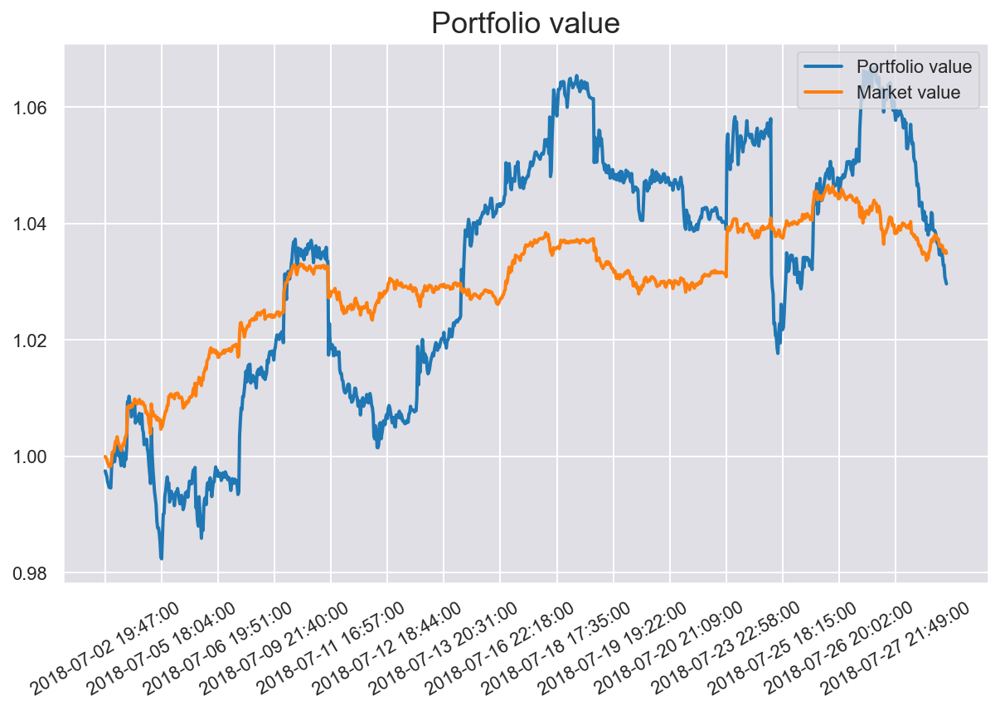

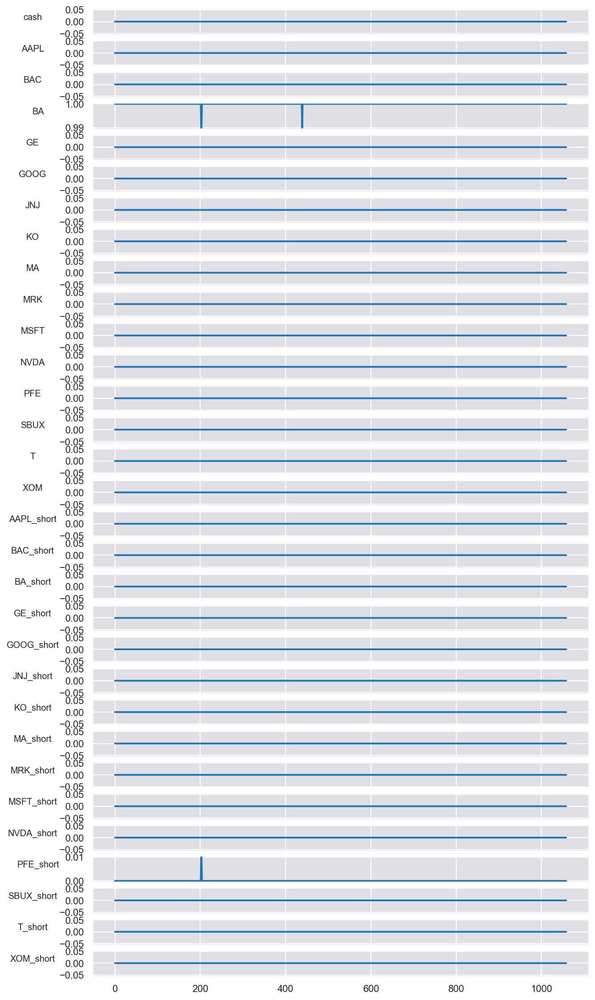

In [48]:
tf.reset_default_graph()
sess = tf.Session()
tflearn.config.init_training_mode()
action_dim = [nb_classes*2 + 1]
state_dim = [nb_classes + 1, window_length, 3]
variable_scope = get_variable_scope(window_length, predictor_type, use_batch_norm)
with tf.variable_scope(variable_scope):
    actor = StockActor(sess, state_dim, action_dim, action_bound, 1e-4, tau, batch_size, predictor_type, 
                       use_batch_norm)
    critic = StockCritic(sess=sess, state_dim=state_dim, action_dim=action_dim, tau=1e-3,
                         learning_rate=1e-3, num_actor_vars=actor.get_num_trainable_vars(), 
                         predictor_type=predictor_type, use_batch_norm=use_batch_norm)
    actor_noise = OrnsteinUhlenbeckActionNoise(mu=np.zeros(action_dim))

    model_save_path = "weights/"
    summary_path = get_result_path(window_length, predictor_type, use_batch_norm)

    ddpg_model = DDPG(environ, sess, actor, critic, actor_noise,param, obs_normalizer=obs_normalizer, model_save_path=model_save_path,
                      summary_path=summary_path)
    ddpg_model.initialize(load_weights=False, verbose=False)
    ddpg_model.train()

env_Jul = PortfolioEnv(history_Jul, abbreviation, steps=history_Jul.shape[1]-200, window_length=window_length,
                   start_idx=data['Jul'].date_index.iloc[0])
test_model(env_Jul, ddpg_model)
plot_weights(env_Jul.infos)

Build model from scratch
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
1500
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 0, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field ty

c:\users\lenovo\appdata\local\programs\python\python39\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


Episode: 2, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 3, Reward: 1.00, Qmax: 0.0001
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 4, Reward: 1.00, Qmax: 0.0001
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0

Episode: 25, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 26, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 27, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 48, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 49, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 50, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 71, Reward: 1.00, Qmax: 0.0001
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 72, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 73, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 94, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 95, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 96, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 116, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 117, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 118, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 139, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 140, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 141, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 162, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 163, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 164, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 185, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 186, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 187, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 207, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 208, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 209, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 230, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 231, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 232, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 253, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 254, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 255, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 276, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 277, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 278, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 299, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 300, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 

Episode: 321, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 322, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 323, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 344, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 345, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
Episode: 346, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 367, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
Episode: 368, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
Episode: 369, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 390, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 391, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 392, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 

Episode: 412, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 413, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 414, Reward: 1.00, Qmax: 0.0000
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 0.03 0.04 0.04 0.03 0.03 0.03 0.04 0.04 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.04 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.04 

Episode: 435, Reward: 1.00, Qmax: 0.0000
[0.05 0.02 0.03 0.02 0.03 0.05 0.03 0.02 0.03 0.04 0.02 0.03 0.03 0.04
 0.03 0.04 0.02 0.04 0.04 0.04 0.03 0.02 0.04 0.04 0.03 0.02 0.05 0.04
 0.03 0.03 0.03]
[0.05 0.02 0.03 0.02 0.03 0.04 0.03 0.02 0.03 0.04 0.02 0.03 0.03 0.04
 0.03 0.04 0.02 0.04 0.04 0.04 0.03 0.03 0.04 0.04 0.03 0.02 0.05 0.04
 0.03 0.03 0.03]
Episode: 436, Reward: 1.00, Qmax: 0.0000
[0.04 0.02 0.03 0.02 0.03 0.04 0.03 0.03 0.03 0.04 0.02 0.03 0.03 0.04
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.04 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.05 0.02 0.03 0.02 0.03 0.04 0.03 0.03 0.03 0.04 0.02 0.03 0.03 0.04
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.04 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 437, Reward: 1.00, Qmax: 0.0000
[0.05 0.02 0.03 0.02 0.03 0.04 0.03 0.02 0.03 0.04 0.02 0.03 0.03 0.04
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.04 0.03 0.02 0.05 0.04
 0.03 0.03 0.03]
[0.05 0.02 0.03 0.02 0.03 0.04 0.03 0.02 0.03 0.04 0.02 0.03 0.03 0.04
 0.03 0.04 

Episode: 458, Reward: 1.00, Qmax: 0.0000
[0.07 0.02 0.02 0.02 0.02 0.06 0.02 0.02 0.02 0.04 0.02 0.02 0.03 0.05
 0.02 0.05 0.02 0.04 0.06 0.04 0.04 0.02 0.05 0.04 0.03 0.02 0.07 0.06
 0.02 0.02 0.02]
[0.07 0.02 0.02 0.02 0.02 0.06 0.02 0.02 0.02 0.04 0.02 0.02 0.03 0.05
 0.02 0.05 0.02 0.04 0.06 0.04 0.04 0.02 0.05 0.04 0.03 0.02 0.07 0.06
 0.02 0.02 0.02]
Episode: 459, Reward: 1.00, Qmax: 0.0000
[0.07 0.01 0.02 0.02 0.02 0.06 0.02 0.02 0.02 0.04 0.01 0.02 0.02 0.05
 0.02 0.05 0.02 0.04 0.06 0.04 0.04 0.02 0.05 0.03 0.03 0.02 0.07 0.06
 0.02 0.02 0.02]
[0.07 0.01 0.02 0.01 0.02 0.07 0.02 0.02 0.02 0.04 0.01 0.02 0.02 0.05
 0.02 0.05 0.02 0.04 0.06 0.04 0.04 0.02 0.05 0.03 0.03 0.02 0.07 0.06
 0.02 0.02 0.02]
Episode: 460, Reward: 1.00, Qmax: 0.0000
[0.07 0.02 0.02 0.02 0.02 0.06 0.02 0.02 0.02 0.04 0.01 0.02 0.02 0.05
 0.02 0.05 0.02 0.04 0.06 0.04 0.04 0.02 0.05 0.03 0.03 0.02 0.07 0.06
 0.02 0.02 0.02]
[0.08 0.01 0.02 0.01 0.02 0.07 0.02 0.01 0.02 0.04 0.01 0.02 0.02 0.05
 0.02 0.05 

Episode: 481, Reward: 1.00, Qmax: 0.0000
[0.16 0.   0.   0.   0.01 0.13 0.   0.   0.   0.03 0.   0.   0.01 0.04
 0.01 0.04 0.   0.03 0.08 0.04 0.04 0.   0.04 0.02 0.01 0.   0.15 0.11
 0.01 0.01 0.  ]
[0.16 0.   0.   0.   0.01 0.13 0.   0.   0.   0.03 0.   0.   0.01 0.04
 0.01 0.04 0.   0.03 0.08 0.04 0.04 0.   0.04 0.02 0.01 0.   0.15 0.11
 0.01 0.01 0.  ]
Episode: 482, Reward: 1.00, Qmax: 0.0000
[0.17 0.   0.   0.   0.01 0.14 0.   0.   0.   0.03 0.   0.   0.01 0.04
 0.   0.04 0.   0.03 0.08 0.04 0.04 0.   0.04 0.01 0.01 0.   0.16 0.11
 0.   0.   0.  ]
[0.18 0.   0.   0.   0.   0.15 0.   0.   0.   0.03 0.   0.   0.01 0.04
 0.   0.03 0.   0.02 0.08 0.03 0.04 0.   0.04 0.01 0.01 0.   0.17 0.12
 0.   0.   0.  ]
Episode: 483, Reward: 1.00, Qmax: 0.0000
[0.19 0.   0.   0.   0.   0.15 0.   0.   0.   0.03 0.   0.   0.01 0.03
 0.   0.03 0.   0.02 0.07 0.03 0.04 0.   0.03 0.01 0.01 0.   0.18 0.12
 0.   0.   0.  ]
[0.21 0.   0.   0.   0.   0.16 0.   0.   0.   0.02 0.   0.   0.   0.03
 0.   0.03 

Episode: 499, Reward: 1.00, Qmax: 0.0000
[3.39e-01 2.63e-05 6.51e-05 2.64e-05 1.10e-04 2.35e-01 4.92e-05 4.04e-05
 5.31e-05 2.86e-03 2.43e-05 5.02e-05 2.26e-04 4.34e-03 7.19e-05 3.74e-03
 3.24e-05 2.05e-03 1.79e-02 4.95e-03 1.21e-02 3.81e-05 4.44e-03 6.68e-04
 2.88e-04 2.90e-05 2.37e-01 1.34e-01 1.05e-04 8.27e-05 6.30e-05]
[2.98e-01 1.71e-04 3.49e-04 1.71e-04 5.30e-04 2.23e-01 2.80e-04 2.40e-04
 2.98e-04 6.91e-03 1.61e-04 2.85e-04 9.31e-04 9.63e-03 3.79e-04 8.56e-03
 2.01e-04 5.33e-03 2.93e-02 1.06e-02 2.14e-02 2.29e-04 9.80e-03 2.20e-03
 1.13e-03 1.85e-04 2.25e-01 1.43e-01 5.10e-04 4.23e-04 3.41e-04]
Episode: 500, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no att

Episode: 512, Reward: 1.00, Qmax: 0.0000
[3.67e-01 6.05e-06 1.62e-05 6.03e-06 2.89e-05 3.23e-01 1.20e-05 9.83e-06
 1.30e-05 9.40e-04 5.56e-06 1.22e-05 6.24e-05 1.45e-03 1.81e-05 1.25e-03
 7.57e-06 6.55e-04 6.42e-03 1.74e-03 6.23e-03 9.05e-06 1.50e-03 2.03e-04
 8.18e-05 6.69e-06 1.43e-01 1.47e-01 2.85e-05 2.10e-05 1.56e-05]
[3.78e-01 2.66e-06 7.68e-06 2.65e-06 1.43e-05 3.29e-01 5.56e-06 4.48e-06
 6.05e-06 6.09e-04 2.42e-06 5.64e-06 3.28e-05 9.69e-04 8.61e-06 8.25e-04
 3.38e-06 4.12e-04 4.82e-03 1.18e-03 4.69e-03 4.10e-06 1.01e-03 1.16e-04
 4.39e-05 2.96e-06 1.36e-01 1.41e-01 1.41e-05 1.01e-05 7.37e-06]
Episode: 513, Reward: 1.00, Qmax: 0.0000
[3.64e-01 4.73e-06 1.29e-05 4.71e-06 2.33e-05 3.35e-01 9.52e-06 7.76e-06
 1.03e-05 8.09e-04 4.34e-06 9.64e-06 5.11e-05 1.25e-03 1.44e-05 1.08e-03
 5.93e-06 5.59e-04 5.69e-03 1.52e-03 5.67e-03 7.12e-06 1.30e-03 1.70e-04
 6.73e-05 5.23e-06 1.34e-01 1.49e-01 2.30e-05 1.68e-05 1.24e-05]
[3.55e-01 9.43e-06 2.42e-05 9.39e-06 4.20e-05 3.28e-01 1.82e-05 1.

Episode: 526, Reward: 1.00, Qmax: 0.0000
[1.80e-01 7.21e-07 2.26e-06 7.16e-07 4.42e-06 6.40e-01 1.60e-06 1.28e-06
 1.74e-06 2.28e-04 6.53e-07 1.62e-06 1.07e-05 3.69e-04 2.54e-06 3.13e-04
 9.34e-07 1.54e-04 1.85e-03 4.89e-04 2.34e-03 1.15e-06 3.88e-04 4.08e-05
 1.46e-05 8.05e-07 4.81e-02 1.25e-01 4.45e-06 3.04e-06 2.16e-06]
[1.94e-01 3.57e-06 9.74e-06 3.55e-06 1.75e-05 5.91e-01 7.20e-06 5.91e-06
 7.76e-06 5.58e-04 3.28e-06 7.26e-06 3.81e-05 8.55e-04 1.08e-05 7.39e-04
 4.48e-06 3.97e-04 3.51e-03 1.09e-03 4.29e-03 5.38e-06 8.93e-04 1.24e-04
 5.00e-05 3.94e-06 6.11e-02 1.41e-01 1.76e-05 1.26e-05 9.37e-06]
Episode: 527, Reward: 1.00, Qmax: 0.0000
[1.88e-01 7.92e-06 2.01e-05 7.86e-06 3.47e-05 5.88e-01 1.52e-05 1.26e-05
 1.63e-05 8.55e-04 7.31e-06 1.53e-05 7.12e-05 1.27e-03 2.22e-05 1.11e-03
 9.78e-06 6.27e-04 4.69e-03 1.60e-03 5.65e-03 1.16e-05 1.32e-03 2.13e-04
 9.15e-05 8.68e-06 6.43e-02 1.42e-01 3.49e-05 2.56e-05 1.94e-05]
[1.96e-01 2.08e-05 4.84e-05 2.06e-05 7.95e-05 5.51e-01 3.75e-05 3.

Episode: 540, Reward: 1.00, Qmax: 0.0000
[3.80e-02 9.86e-08 3.46e-07 9.77e-08 7.19e-07 9.23e-01 2.37e-07 1.87e-07
 2.59e-07 4.89e-05 8.85e-08 2.38e-07 1.89e-06 8.40e-05 3.89e-07 6.99e-05
 1.31e-07 3.36e-05 4.52e-04 1.21e-04 5.61e-04 1.65e-07 8.96e-05 7.88e-06
 2.63e-06 1.11e-07 9.42e-03 2.84e-02 7.39e-07 4.77e-07 3.28e-07]
[2.82e-02 2.02e-08 8.02e-08 2.00e-08 1.79e-07 9.45e-01 5.29e-08 4.08e-08
 5.84e-08 1.86e-05 1.79e-08 5.31e-08 5.19e-07 3.37e-05 9.11e-08 2.76e-05
 2.77e-08 1.23e-05 2.15e-04 5.03e-05 2.73e-04 3.55e-08 3.62e-05 2.49e-06
 7.48e-07 2.30e-08 6.08e-03 2.05e-02 1.85e-07 1.14e-07 7.57e-08]
Episode: 541, Reward: 1.00, Qmax: 0.0000
[2.47e-02 1.63e-08 6.56e-08 1.61e-08 1.48e-07 9.51e-01 4.31e-08 3.31e-08
 4.76e-08 1.59e-05 1.45e-08 4.33e-08 4.32e-07 2.90e-05 7.45e-08 2.36e-05
 2.24e-08 1.05e-05 1.87e-04 4.35e-05 2.37e-04 2.88e-08 3.12e-05 2.10e-06
 6.23e-07 1.86e-08 5.30e-03 1.80e-02 1.53e-07 9.37e-08 6.19e-08]
[2.59e-02 2.05e-08 8.12e-08 2.03e-08 1.81e-07 9.49e-01 5.36e-08 4.

Episode: 554, Reward: 1.00, Qmax: 0.0000
[2.57e-03 4.07e-11 2.49e-10 4.01e-11 7.14e-10 9.95e-01 1.44e-10 1.03e-10
 1.63e-10 2.98e-07 3.47e-11 1.44e-10 2.88e-09 6.49e-07 2.90e-10 4.98e-07
 6.16e-11 1.78e-07 7.09e-06 1.13e-06 9.12e-06 8.52e-11 7.17e-07 2.18e-08
 4.61e-09 4.79e-11 3.96e-04 1.75e-03 7.53e-10 3.94e-10 2.30e-10]
[2.52e-03 3.79e-11 2.33e-10 3.73e-11 6.70e-10 9.95e-01 1.35e-10 9.61e-11
 1.52e-10 2.85e-07 3.23e-11 1.34e-10 2.72e-09 6.21e-07 2.71e-10 4.76e-07
 5.75e-11 1.69e-07 6.83e-06 1.09e-06 8.80e-06 7.95e-11 6.86e-07 2.07e-08
 4.36e-09 4.46e-11 3.86e-04 1.72e-03 7.08e-10 3.69e-10 2.15e-10]
Episode: 555, Reward: 1.00, Qmax: 0.0000
[2.12e-03 2.27e-11 1.45e-10 2.24e-11 4.25e-10 9.96e-01 8.27e-11 5.87e-11
 9.39e-11 2.04e-07 1.93e-11 8.26e-11 1.77e-09 4.52e-07 1.69e-10 3.44e-07
 3.47e-11 1.20e-07 5.21e-06 7.99e-07 6.73e-06 4.83e-11 5.00e-07 1.40e-08
 2.87e-09 2.68e-11 3.15e-04 1.44e-03 4.50e-10 2.32e-10 1.33e-10]
[2.15e-03 2.41e-11 1.53e-10 2.38e-11 4.49e-10 9.96e-01 8.76e-11 6.

Episode: 568, Reward: 1.00, Qmax: 0.0000
[8.77e-04 3.13e-12 2.28e-11 3.08e-12 7.23e-11 9.98e-01 1.25e-11 8.68e-12
 1.43e-11 5.30e-08 2.63e-12 1.25e-11 3.34e-10 1.24e-07 2.68e-11 9.26e-08
 4.95e-12 3.02e-08 1.68e-06 2.30e-07 2.17e-06 7.04e-12 1.38e-07 3.03e-09
 5.58e-10 3.74e-12 1.22e-04 5.88e-04 7.71e-11 3.77e-11 2.09e-11]
[1.30e-03 1.36e-11 8.89e-11 1.34e-11 2.65e-10 9.98e-01 5.05e-11 3.57e-11
 5.74e-11 1.35e-07 1.16e-11 5.04e-11 1.12e-09 3.00e-07 1.04e-10 2.28e-07
 2.10e-11 7.91e-08 3.53e-06 5.39e-07 4.47e-06 2.93e-11 3.33e-07 9.03e-09
 1.82e-09 1.61e-11 2.01e-04 8.89e-04 2.81e-10 1.43e-10 8.18e-11]
Episode: 569, Reward: 1.00, Qmax: 0.0000
[5.69e-03 3.75e-09 1.60e-08 3.70e-09 3.74e-08 9.89e-01 1.03e-08 7.91e-09
 1.14e-08 4.69e-06 3.31e-09 1.04e-08 1.14e-07 8.77e-06 1.82e-08 7.08e-06
 5.24e-09 3.12e-06 5.90e-05 1.37e-05 7.03e-05 6.80e-09 9.51e-06 5.81e-07
 1.66e-07 4.28e-09 1.35e-03 4.24e-03 3.91e-08 2.33e-08 1.51e-08]
[2.94e-03 3.09e-10 1.60e-09 3.05e-10 4.15e-09 9.94e-01 9.72e-10 7.

Episode: 582, Reward: 1.00, Qmax: 0.0000
[1.22e-03 1.77e-11 1.13e-10 1.74e-11 3.30e-10 9.98e-01 6.44e-11 4.58e-11
 7.31e-11 1.54e-07 1.51e-11 6.43e-11 1.37e-09 3.39e-07 1.31e-10 2.59e-07
 2.71e-11 9.12e-08 3.84e-06 6.05e-07 4.82e-06 3.77e-11 3.76e-07 1.07e-08
 2.21e-09 2.09e-11 2.00e-04 8.52e-04 3.51e-10 1.80e-10 1.04e-10]
[2.25e-03 1.70e-10 9.13e-10 1.68e-10 2.43e-09 9.96e-01 5.50e-10 4.04e-10
 6.17e-10 6.45e-07 1.47e-10 5.50e-10 8.86e-09 1.32e-06 1.05e-09 1.03e-06
 2.51e-10 4.01e-07 1.20e-05 2.24e-06 1.47e-05 3.38e-10 1.45e-06 5.74e-08
 1.37e-08 1.98e-10 4.35e-04 1.62e-03 2.57e-09 1.40e-09 8.48e-10]
Episode: 583, Reward: 1.00, Qmax: 0.0000
[1.59e-03 4.72e-11 2.78e-10 4.65e-11 7.83e-10 9.97e-01 1.63e-10 1.17e-10
 1.84e-10 2.86e-07 4.04e-11 1.63e-10 3.07e-09 6.11e-07 3.22e-10 4.71e-07
 7.10e-11 1.73e-07 6.28e-06 1.06e-06 7.80e-06 9.74e-11 6.74e-07 2.21e-08
 4.86e-09 5.53e-11 2.79e-04 1.12e-03 8.29e-10 4.37e-10 2.57e-10]
[1.24e-03 1.87e-11 1.19e-10 1.84e-11 3.47e-10 9.98e-01 6.79e-11 4.

Episode: 596, Reward: 1.00, Qmax: 0.0000
[6.48e-04 2.09e-12 1.55e-11 2.05e-12 4.98e-11 9.99e-01 8.46e-12 5.85e-12
 9.69e-12 3.90e-08 1.75e-12 8.44e-12 2.34e-10 9.20e-08 1.82e-11 6.85e-08
 3.31e-12 2.21e-08 1.28e-06 1.73e-07 1.64e-06 4.73e-12 1.03e-07 2.17e-09
 3.92e-10 2.49e-12 9.23e-05 4.42e-04 5.33e-11 2.58e-11 1.42e-11]
[6.11e-04 1.68e-12 1.27e-11 1.65e-12 4.12e-11 9.99e-01 6.89e-12 4.75e-12
 7.90e-12 3.40e-08 1.41e-12 6.87e-12 1.96e-10 8.07e-08 1.49e-11 6.00e-08
 2.68e-12 1.92e-08 1.15e-06 1.52e-07 1.47e-06 3.84e-12 9.03e-08 1.84e-09
 3.30e-10 2.01e-12 8.56e-05 4.15e-04 4.40e-11 2.12e-11 1.16e-11]
Episode: 597, Reward: 1.00, Qmax: 0.0000
[6.55e-04 2.19e-12 1.62e-11 2.15e-12 5.20e-11 9.99e-01 8.85e-12 6.12e-12
 1.01e-11 4.02e-08 1.84e-12 8.82e-12 2.43e-10 9.46e-08 1.91e-11 7.05e-08
 3.47e-12 2.28e-08 1.31e-06 1.78e-07 1.68e-06 4.95e-12 1.06e-07 2.24e-09
 4.08e-10 2.61e-12 9.37e-05 4.47e-04 5.55e-11 2.69e-11 1.48e-11]
[2.65e-03 3.66e-10 1.85e-09 3.60e-10 4.76e-09 9.95e-01 1.13e-09 8.

Episode: 609, Reward: 1.00, Qmax: 0.0000
[6.49e-04 2.35e-12 1.73e-11 2.31e-12 5.53e-11 9.99e-01 9.47e-12 6.56e-12
 1.08e-11 4.18e-08 1.98e-12 9.44e-12 2.58e-10 9.81e-08 2.03e-11 7.32e-08
 3.72e-12 2.38e-08 1.35e-06 1.84e-07 1.72e-06 5.31e-12 1.10e-07 2.36e-09
 4.31e-10 2.81e-12 9.44e-05 4.49e-04 5.91e-11 2.87e-11 1.58e-11]
[7.37e-04 3.75e-12 2.66e-11 3.69e-12 8.34e-11 9.99e-01 1.47e-11 1.03e-11
 1.68e-11 5.61e-08 3.16e-12 1.47e-11 3.78e-10 1.30e-07 3.12e-11 9.74e-08
 5.88e-12 3.23e-08 1.70e-06 2.41e-07 2.17e-06 8.35e-12 1.45e-07 3.33e-09
 6.26e-10 4.46e-12 1.11e-04 5.13e-04 8.90e-11 4.38e-11 2.44e-11]
Episode: 610, Reward: 1.00, Qmax: 0.0000
[1.17e-03 2.01e-11 1.26e-10 1.98e-11 3.67e-10 9.98e-01 7.23e-11 5.16e-11
 8.19e-11 1.63e-07 1.71e-11 7.22e-11 1.51e-09 3.59e-07 1.46e-10 2.74e-07
 3.06e-11 9.73e-08 3.99e-06 6.38e-07 4.98e-06 4.25e-11 3.97e-07 1.16e-08
 2.42e-09 2.36e-11 1.99e-04 8.33e-04 3.89e-10 2.01e-10 1.16e-10]
[2.71e-03 4.30e-10 2.15e-09 4.24e-10 5.48e-09 9.95e-01 1.32e-09 9.

Episode: 623, Reward: 1.00, Qmax: 0.0000
[5.65e-04 1.53e-12 1.16e-11 1.50e-12 3.77e-11 9.99e-01 6.28e-12 4.33e-12
 7.20e-12 3.16e-08 1.28e-12 6.26e-12 1.80e-10 7.52e-08 1.36e-11 5.58e-08
 2.43e-12 1.78e-08 1.08e-06 1.43e-07 1.38e-06 3.49e-12 8.42e-08 1.70e-09
 3.03e-10 1.83e-12 8.04e-05 3.94e-04 4.03e-11 1.94e-11 1.06e-11]
[7.60e-04 4.49e-12 3.15e-11 4.42e-12 9.77e-11 9.99e-01 1.75e-11 1.22e-11
 1.99e-11 6.28e-08 3.79e-12 1.74e-11 4.38e-10 1.44e-07 3.68e-11 1.08e-07
 7.03e-12 3.62e-08 1.86e-06 2.66e-07 2.36e-06 9.94e-12 1.61e-07 3.80e-09
 7.23e-10 5.34e-12 1.17e-04 5.37e-04 1.04e-10 5.15e-11 2.88e-11]
Episode: 624, Reward: 1.00, Qmax: 0.0000
[7.27e-04 3.84e-12 2.72e-11 3.77e-12 8.51e-11 9.99e-01 1.51e-11 1.05e-11
 1.72e-11 5.68e-08 3.23e-12 1.50e-11 3.85e-10 1.31e-07 3.19e-11 9.84e-08
 6.02e-12 3.27e-08 1.72e-06 2.43e-07 2.18e-06 8.54e-12 1.46e-07 3.38e-09
 6.37e-10 4.57e-12 1.11e-04 5.13e-04 9.08e-11 4.47e-11 2.49e-11]
[5.64e-04 1.53e-12 1.16e-11 1.50e-12 3.77e-11 9.99e-01 6.28e-12 4.

Episode: 637, Reward: 1.00, Qmax: 0.0000
[8.12e-04 6.22e-12 4.25e-11 6.12e-12 1.30e-10 9.98e-01 2.38e-11 1.67e-11
 2.71e-11 7.67e-08 5.26e-12 2.37e-11 5.72e-10 1.74e-07 4.97e-11 1.32e-07
 9.68e-12 4.46e-08 2.17e-06 3.20e-07 2.75e-06 1.36e-11 1.94e-07 4.82e-09
 9.37e-10 7.38e-12 1.29e-04 5.79e-04 1.39e-10 6.92e-11 3.90e-11]
[6.93e-04 3.50e-12 2.50e-11 3.44e-12 7.83e-11 9.99e-01 1.38e-11 9.61e-12
 1.57e-11 5.33e-08 2.95e-12 1.37e-11 3.56e-10 1.23e-07 2.93e-11 9.24e-08
 5.50e-12 3.06e-08 1.63e-06 2.29e-07 2.07e-06 7.81e-12 1.38e-07 3.14e-09
 5.90e-10 4.17e-12 1.05e-04 4.91e-04 8.36e-11 4.11e-11 2.29e-11]
Episode: 638, Reward: 1.00, Qmax: 0.0000
[6.89e-04 3.42e-12 2.44e-11 3.36e-12 7.67e-11 9.99e-01 1.35e-11 9.39e-12
 1.54e-11 5.25e-08 2.88e-12 1.34e-11 3.49e-10 1.22e-07 2.86e-11 9.12e-08
 5.37e-12 3.01e-08 1.61e-06 2.26e-07 2.05e-06 7.63e-12 1.36e-07 3.09e-09
 5.79e-10 4.07e-12 1.05e-04 4.88e-04 8.18e-11 4.02e-11 2.24e-11]
[1.47e-03 5.43e-11 3.16e-10 5.35e-11 8.81e-10 9.97e-01 1.86e-10 1.

Episode: 651, Reward: 1.00, Qmax: 0.0000
[8.73e-04 8.72e-12 5.81e-11 8.58e-12 1.75e-10 9.98e-01 3.27e-11 2.31e-11
 3.72e-11 9.47e-08 7.39e-12 3.27e-11 7.54e-10 2.13e-07 6.77e-11 1.61e-07
 1.35e-11 5.54e-08 2.56e-06 3.87e-07 3.23e-06 1.89e-11 2.36e-07 6.17e-09
 1.23e-09 1.03e-11 1.43e-04 6.29e-04 1.86e-10 9.40e-11 5.33e-11]
[8.60e-04 8.26e-12 5.52e-11 8.13e-12 1.67e-10 9.98e-01 3.11e-11 2.20e-11
 3.54e-11 9.15e-08 7.00e-12 3.11e-11 7.22e-10 2.06e-07 6.44e-11 1.56e-07
 1.28e-11 5.35e-08 2.50e-06 3.75e-07 3.15e-06 1.80e-11 2.29e-07 5.93e-09
 1.18e-09 9.79e-12 1.40e-04 6.20e-04 1.78e-10 8.95e-11 5.07e-11]
Episode: 652, Reward: 1.00, Qmax: 0.0000
[8.40e-04 7.57e-12 5.09e-11 7.45e-12 1.54e-10 9.98e-01 2.86e-11 2.02e-11
 3.26e-11 8.66e-08 6.41e-12 2.86e-11 6.71e-10 1.96e-07 5.94e-11 1.48e-07
 1.17e-11 5.06e-08 2.39e-06 3.57e-07 3.02e-06 1.65e-11 2.17e-07 5.56e-09
 1.10e-09 8.97e-12 1.36e-04 6.04e-04 1.65e-10 8.26e-11 4.68e-11]
[1.75e-03 1.08e-10 5.95e-10 1.06e-10 1.61e-09 9.97e-01 3.55e-10 2.

Episode: 665, Reward: 1.00, Qmax: 0.0000
[1.85e-03 1.35e-10 7.32e-10 1.33e-10 1.96e-09 9.96e-01 4.39e-10 3.22e-10
 4.93e-10 5.39e-07 1.16e-10 4.39e-10 7.22e-09 1.11e-06 8.42e-10 8.68e-07
 1.99e-10 3.35e-07 1.03e-05 1.90e-06 1.26e-05 2.69e-10 1.22e-06 4.73e-08
 1.11e-08 1.57e-10 3.69e-04 1.39e-03 2.07e-09 1.13e-09 6.80e-10]
[1.15e-03 2.45e-11 1.51e-10 2.41e-11 4.36e-10 9.98e-01 8.72e-11 6.24e-11
 9.87e-11 1.83e-07 2.09e-11 8.71e-11 1.77e-09 3.98e-07 1.75e-10 3.05e-07
 3.73e-11 1.09e-07 4.33e-06 7.05e-07 5.40e-06 5.15e-11 4.40e-07 1.33e-08
 2.82e-09 2.88e-11 2.04e-04 8.47e-04 4.63e-10 2.40e-10 1.39e-10]
Episode: 666, Reward: 1.00, Qmax: 0.0000
[8.90e-04 9.64e-12 6.37e-11 9.49e-12 1.91e-10 9.98e-01 3.60e-11 2.55e-11
 4.09e-11 1.01e-07 8.18e-12 3.59e-11 8.19e-10 2.26e-07 7.43e-11 1.71e-07
 1.49e-11 5.93e-08 2.70e-06 4.10e-07 3.40e-06 2.09e-11 2.51e-07 6.66e-09
 1.33e-09 1.14e-11 1.48e-04 6.47e-04 2.04e-10 1.03e-10 5.86e-11]
[6.64e-04 3.37e-12 2.41e-11 3.32e-12 7.56e-11 9.99e-01 1.33e-11 9.

Episode: 679, Reward: 1.00, Qmax: 0.0000
[8.03e-04 6.82e-12 4.62e-11 6.71e-12 1.41e-10 9.98e-01 2.59e-11 1.82e-11
 2.95e-11 8.09e-08 5.77e-12 2.59e-11 6.15e-10 1.83e-07 5.40e-11 1.38e-07
 1.06e-11 4.71e-08 2.26e-06 3.35e-07 2.86e-06 1.49e-11 2.04e-07 5.14e-09
 1.01e-09 8.09e-12 1.30e-04 5.86e-04 1.50e-10 7.51e-11 4.24e-11]
[7.69e-04 5.83e-12 4.00e-11 5.74e-12 1.23e-10 9.99e-01 2.24e-11 1.57e-11
 2.55e-11 7.33e-08 4.93e-12 2.23e-11 5.41e-10 1.67e-07 4.68e-11 1.26e-07
 9.09e-12 4.25e-08 2.09e-06 3.06e-07 2.65e-06 1.28e-11 1.86e-07 4.58e-09
 8.88e-10 6.93e-12 1.23e-04 5.60e-04 1.31e-10 6.52e-11 3.67e-11]
Episode: 680, Reward: 1.00, Qmax: 0.0000
[5.01e-04 1.25e-12 9.61e-12 1.23e-12 3.15e-11 9.99e-01 5.19e-12 3.57e-12
 5.96e-12 2.75e-08 1.05e-12 5.17e-12 1.52e-10 6.57e-08 1.13e-11 4.86e-08
 2.00e-12 1.54e-08 9.57e-07 1.25e-07 1.23e-06 2.88e-12 7.35e-08 1.45e-09
 2.56e-10 1.50e-12 7.20e-05 3.58e-04 3.37e-11 1.61e-11 8.77e-12]
[1.54e-03 7.12e-11 4.05e-10 7.01e-11 1.12e-09 9.97e-01 2.40e-10 1.

Episode: 693, Reward: 1.00, Qmax: 0.0000
[6.20e-04 2.77e-12 2.01e-11 2.73e-12 6.36e-11 9.99e-01 1.10e-11 7.68e-12
 1.26e-11 4.55e-08 2.33e-12 1.10e-11 2.93e-10 1.06e-07 2.36e-11 7.93e-08
 4.37e-12 2.60e-08 1.43e-06 1.98e-07 1.83e-06 6.22e-12 1.18e-07 2.63e-09
 4.87e-10 3.31e-12 9.47e-05 4.52e-04 6.79e-11 3.32e-11 1.84e-11]
[7.25e-04 4.87e-12 3.38e-11 4.79e-12 1.05e-10 9.99e-01 1.88e-11 1.32e-11
 2.15e-11 6.51e-08 4.11e-12 1.88e-11 4.66e-10 1.49e-07 3.96e-11 1.12e-07
 7.61e-12 3.77e-08 1.90e-06 2.75e-07 2.41e-06 1.08e-11 1.66e-07 3.99e-09
 7.67e-10 5.79e-12 1.15e-04 5.31e-04 1.12e-10 5.53e-11 3.10e-11]
Episode: 694, Reward: 1.00, Qmax: 0.0000
[7.20e-04 4.75e-12 3.31e-11 4.67e-12 1.02e-10 9.99e-01 1.84e-11 1.29e-11
 2.10e-11 6.41e-08 4.01e-12 1.83e-11 4.56e-10 1.47e-07 3.87e-11 1.10e-07
 7.42e-12 3.71e-08 1.88e-06 2.71e-07 2.38e-06 1.05e-11 1.64e-07 3.92e-09
 7.51e-10 5.64e-12 1.14e-04 5.28e-04 1.09e-10 5.41e-11 3.03e-11]
[5.61e-04 1.94e-12 1.44e-11 1.91e-12 4.64e-11 9.99e-01 7.86e-12 5.

Episode: 706, Reward: 1.00, Qmax: 0.0000
[4.24e-04 7.47e-13 5.96e-12 7.34e-13 2.00e-11 9.99e-01 3.18e-12 2.18e-12
 3.66e-12 1.97e-08 6.23e-13 3.17e-12 9.90e-11 4.78e-08 7.04e-12 3.52e-08
 1.21e-12 1.10e-08 7.32e-07 9.24e-08 9.48e-07 1.75e-12 5.37e-08 9.88e-10
 1.69e-10 8.99e-13 5.93e-05 3.05e-04 2.14e-11 1.01e-11 5.43e-12]
[4.50e-04 9.23e-13 7.26e-12 9.08e-13 2.41e-11 9.99e-01 3.89e-12 2.67e-12
 4.47e-12 2.26e-08 7.71e-13 3.88e-12 1.18e-10 5.44e-08 8.56e-12 4.02e-08
 1.48e-12 1.26e-08 8.15e-07 1.04e-07 1.05e-06 2.14e-12 6.10e-08 1.16e-09
 2.00e-10 1.11e-12 6.39e-05 3.25e-04 2.58e-11 1.22e-11 6.61e-12]
Episode: 707, Reward: 1.00, Qmax: 0.0000
[1.36e-03 4.88e-11 2.86e-10 4.81e-11 7.99e-10 9.97e-01 1.68e-10 1.21e-10
 1.89e-10 2.81e-07 4.19e-11 1.67e-10 3.12e-09 6.00e-07 3.30e-10 4.62e-07
 7.34e-11 1.71e-07 6.09e-06 1.05e-06 7.55e-06 1.01e-10 6.61e-07 2.21e-08
 4.90e-09 5.72e-11 2.55e-04 1.03e-03 8.47e-10 4.48e-10 2.64e-10]
[1.21e-03 3.29e-11 1.98e-10 3.25e-11 5.64e-10 9.98e-01 1.15e-10 8.

Episode: 720, Reward: 1.00, Qmax: 0.0000
[2.08e-03 2.36e-10 1.22e-09 2.32e-10 3.20e-09 9.96e-01 7.44e-10 5.50e-10
 8.34e-10 7.63e-07 2.04e-10 7.44e-10 1.14e-08 1.55e-06 1.40e-09 1.21e-06
 3.44e-10 4.80e-07 1.35e-05 2.60e-06 1.64e-05 4.62e-10 1.69e-06 7.12e-08
 1.74e-08 2.73e-10 4.38e-04 1.61e-03 3.38e-09 1.86e-09 1.14e-09]
[2.55e-03 4.89e-10 2.41e-09 4.82e-10 6.10e-09 9.95e-01 1.49e-09 1.11e-09
 1.66e-09 1.21e-06 4.25e-10 1.49e-09 2.08e-08 2.40e-06 2.75e-09 1.90e-06
 7.05e-10 7.76e-07 1.95e-05 3.97e-06 2.36e-05 9.38e-10 2.63e-06 1.22e-07
 3.13e-08 5.64e-10 5.65e-04 1.98e-03 6.42e-09 3.61e-09 2.24e-09]
Episode: 721, Reward: 1.00, Qmax: 0.0000
[1.87e-03 1.61e-10 8.63e-10 1.59e-10 2.29e-09 9.96e-01 5.20e-10 3.82e-10
 5.83e-10 5.99e-07 1.39e-10 5.19e-10 8.34e-09 1.23e-06 9.91e-10 9.60e-07
 2.37e-10 3.74e-07 1.11e-05 2.08e-06 1.36e-05 3.20e-10 1.35e-06 5.37e-08
 1.28e-08 1.87e-10 3.83e-04 1.44e-03 2.42e-09 1.32e-09 8.01e-10]
[9.22e-04 1.27e-11 8.22e-11 1.25e-11 2.44e-10 9.98e-01 4.68e-11 3.

Episode: 734, Reward: 1.00, Qmax: 0.0000
[2.56e-03 5.10e-10 2.50e-09 5.03e-10 6.32e-09 9.95e-01 1.55e-09 1.16e-09
 1.73e-09 1.24e-06 4.44e-10 1.55e-09 2.15e-08 2.46e-06 2.86e-09 1.95e-06
 7.35e-10 7.95e-07 1.99e-05 4.06e-06 2.40e-05 9.77e-10 2.69e-06 1.26e-07
 3.24e-08 5.88e-10 5.71e-04 2.00e-03 6.66e-09 3.75e-09 2.33e-09]
[5.26e-04 1.74e-12 1.31e-11 1.71e-12 4.21e-11 9.99e-01 7.10e-12 4.91e-12
 8.14e-12 3.36e-08 1.46e-12 7.08e-12 1.99e-10 7.95e-08 1.53e-11 5.91e-08
 2.77e-12 1.90e-08 1.12e-06 1.50e-07 1.44e-06 3.97e-12 8.89e-08 1.85e-09
 3.34e-10 2.08e-12 7.87e-05 3.87e-04 4.51e-11 2.17e-11 1.19e-11]
Episode: 735, Reward: 1.00, Qmax: 0.0000
[7.78e-04 7.11e-12 4.80e-11 7.00e-12 1.46e-10 9.99e-01 2.70e-11 1.90e-11
 3.07e-11 8.23e-08 6.02e-12 2.69e-11 6.35e-10 1.86e-07 5.60e-11 1.41e-07
 1.10e-11 4.81e-08 2.28e-06 3.41e-07 2.89e-06 1.55e-11 2.07e-07 5.27e-09
 1.04e-09 8.44e-12 1.29e-04 5.82e-04 1.55e-10 7.79e-11 4.41e-11]
[5.29e-04 1.77e-12 1.33e-11 1.74e-12 4.28e-11 9.99e-01 7.22e-12 4.

Episode: 748, Reward: 1.00, Qmax: 0.0000
[9.62e-04 1.56e-11 9.91e-11 1.53e-11 2.91e-10 9.98e-01 5.67e-11 4.04e-11
 6.43e-11 1.35e-07 1.33e-11 5.66e-11 1.21e-09 2.98e-07 1.15e-10 2.27e-07
 2.39e-11 8.03e-08 3.39e-06 5.36e-07 4.26e-06 3.32e-11 3.31e-07 9.42e-09
 1.95e-09 1.84e-11 1.69e-04 7.32e-04 3.10e-10 1.59e-10 9.13e-11]
[1.22e-03 3.58e-11 2.14e-10 3.53e-11 6.07e-10 9.98e-01 1.25e-10 8.99e-11
 1.41e-10 2.30e-07 3.07e-11 1.25e-10 2.41e-09 4.95e-07 2.48e-10 3.80e-07
 5.41e-11 1.39e-07 5.18e-06 8.70e-07 6.44e-06 7.44e-11 5.46e-07 1.75e-08
 3.81e-09 4.21e-11 2.26e-04 9.33e-04 6.44e-10 3.38e-10 1.98e-10]
Episode: 749, Reward: 1.00, Qmax: 0.0000
[1.31e-03 4.79e-11 2.80e-10 4.72e-11 7.85e-10 9.97e-01 1.65e-10 1.19e-10
 1.86e-10 2.76e-07 4.11e-11 1.64e-10 3.06e-09 5.88e-07 3.24e-10 4.53e-07
 7.20e-11 1.68e-07 5.98e-06 1.03e-06 7.43e-06 9.87e-11 6.48e-07 2.17e-08
 4.81e-09 5.61e-11 2.50e-04 1.01e-03 8.32e-10 4.39e-10 2.59e-10]
[8.69e-04 1.07e-11 7.03e-11 1.06e-11 2.10e-10 9.98e-01 3.98e-11 2.

Episode: 762, Reward: 1.00, Qmax: 0.0000
[8.01e-04 8.18e-12 5.46e-11 8.05e-12 1.65e-10 9.98e-01 3.08e-11 2.17e-11
 3.50e-11 8.98e-08 6.93e-12 3.07e-11 7.12e-10 2.02e-07 6.37e-11 1.53e-07
 1.27e-11 5.26e-08 2.45e-06 3.69e-07 3.09e-06 1.78e-11 2.25e-07 5.84e-09
 1.16e-09 9.69e-12 1.35e-04 6.10e-04 1.76e-10 8.84e-11 5.02e-11]
[7.48e-04 6.48e-12 4.40e-11 6.38e-12 1.34e-10 9.99e-01 2.47e-11 1.74e-11
 2.81e-11 7.73e-08 5.49e-12 2.46e-11 5.87e-10 1.75e-07 5.14e-11 1.32e-07
 1.01e-11 4.50e-08 2.17e-06 3.22e-07 2.75e-06 1.42e-11 1.95e-07 4.90e-09
 9.60e-10 7.69e-12 1.24e-04 5.69e-04 1.43e-10 7.16e-11 4.04e-11]
Episode: 763, Reward: 1.00, Qmax: 0.0000
[5.46e-04 2.07e-12 1.53e-11 2.03e-12 4.90e-11 9.99e-01 8.35e-12 5.79e-12
 9.56e-12 3.75e-08 1.74e-12 8.32e-12 2.29e-10 8.81e-08 1.80e-11 6.56e-08
 3.28e-12 2.13e-08 1.22e-06 1.66e-07 1.56e-06 4.68e-12 9.84e-08 2.10e-09
 3.83e-10 2.47e-12 8.34e-05 4.10e-04 5.24e-11 2.54e-11 1.40e-11]
[5.76e-04 2.53e-12 1.84e-11 2.48e-12 5.84e-11 9.99e-01 1.01e-11 7.

Episode: 776, Reward: 1.00, Qmax: 0.0000
[3.90e-04 6.44e-13 5.19e-12 6.34e-13 1.75e-11 9.99e-01 2.76e-12 1.89e-12
 3.18e-12 1.78e-08 5.37e-13 2.75e-12 8.74e-11 4.34e-08 6.14e-12 3.19e-08
 1.04e-12 9.87e-09 6.73e-07 8.41e-08 8.73e-07 1.51e-12 4.87e-08 8.80e-10
 1.49e-10 7.76e-13 5.51e-05 2.90e-04 1.88e-11 8.81e-12 4.73e-12]
[7.35e-04 6.28e-12 4.27e-11 6.18e-12 1.30e-10 9.99e-01 2.39e-11 1.68e-11
 2.73e-11 7.56e-08 5.31e-12 2.39e-11 5.71e-10 1.72e-07 4.99e-11 1.29e-07
 9.77e-12 4.40e-08 2.13e-06 3.15e-07 2.70e-06 1.37e-11 1.91e-07 4.78e-09
 9.35e-10 7.45e-12 1.22e-04 5.61e-04 1.39e-10 6.95e-11 3.92e-11]
Episode: 777, Reward: 1.00, Qmax: 0.0000
[3.58e-04 4.78e-13 3.94e-12 4.70e-13 1.34e-11 9.99e-01 2.08e-12 1.42e-12
 2.40e-12 1.47e-08 3.98e-13 2.08e-12 6.83e-11 3.62e-08 4.66e-12 2.66e-08
 7.78e-13 8.11e-09 5.79e-07 7.07e-08 7.53e-07 1.13e-12 4.07e-08 7.05e-10
 1.18e-10 5.77e-13 4.97e-05 2.66e-04 1.44e-11 6.72e-12 3.58e-12]
[8.14e-04 9.07e-12 6.00e-11 8.92e-12 1.80e-10 9.98e-01 3.39e-11 2.

Episode: 790, Reward: 1.00, Qmax: 0.0000
[7.25e-04 6.13e-12 4.18e-11 6.03e-12 1.28e-10 9.99e-01 2.34e-11 1.64e-11
 2.66e-11 7.45e-08 5.18e-12 2.33e-11 5.60e-10 1.69e-07 4.88e-11 1.27e-07
 9.53e-12 4.33e-08 2.10e-06 3.11e-07 2.67e-06 1.34e-11 1.88e-07 4.69e-09
 9.16e-10 7.27e-12 1.21e-04 5.57e-04 1.36e-10 6.79e-11 3.83e-11]
[2.42e-03 4.53e-10 2.24e-09 4.47e-10 5.70e-09 9.95e-01 1.38e-09 1.03e-09
 1.55e-09 1.15e-06 3.95e-10 1.38e-09 1.95e-08 2.29e-06 2.56e-09 1.81e-06
 6.55e-10 7.35e-07 1.87e-05 3.78e-06 2.26e-05 8.72e-10 2.50e-06 1.16e-07
 2.94e-08 5.24e-10 5.44e-04 1.94e-03 6.01e-09 3.37e-09 2.09e-09]
Episode: 791, Reward: 1.00, Qmax: 0.0000
[5.91e-04 2.97e-12 2.14e-11 2.93e-12 6.74e-11 9.99e-01 1.18e-11 8.21e-12
 1.35e-11 4.70e-08 2.50e-12 1.17e-11 3.08e-10 1.09e-07 2.51e-11 8.16e-08
 4.69e-12 2.69e-08 1.46e-06 2.04e-07 1.86e-06 6.66e-12 1.22e-07 2.74e-09
 5.12e-10 3.55e-12 9.36e-05 4.51e-04 7.20e-11 3.53e-11 1.96e-11]
[5.43e-04 2.19e-12 1.61e-11 2.15e-12 5.14e-11 9.99e-01 8.81e-12 6.

Episode: 803, Reward: 1.00, Qmax: 0.0000
[2.33e-03 4.03e-10 2.01e-09 3.97e-10 5.13e-09 9.95e-01 1.24e-09 9.21e-10
 1.38e-09 1.07e-06 3.50e-10 1.24e-09 1.77e-08 2.13e-06 2.30e-09 1.68e-06
 5.84e-10 6.80e-07 1.76e-05 3.53e-06 2.13e-05 7.78e-10 2.33e-06 1.06e-07
 2.67e-08 4.66e-10 5.21e-04 1.88e-03 5.41e-09 3.03e-09 1.87e-09]
[1.02e-03 2.12e-11 1.32e-10 2.09e-11 3.82e-10 9.98e-01 7.59e-11 5.43e-11
 8.60e-11 1.64e-07 1.81e-11 7.58e-11 1.56e-09 3.58e-07 1.53e-10 2.74e-07
 3.23e-11 9.80e-08 3.95e-06 6.39e-07 4.94e-06 4.48e-11 3.96e-07 1.18e-08
 2.49e-09 2.50e-11 1.86e-04 8.03e-04 4.06e-10 2.10e-10 1.21e-10]
Episode: 804, Reward: 1.00, Qmax: 0.0000
[1.11e-03 2.88e-11 1.75e-10 2.84e-11 5.00e-10 9.98e-01 1.01e-10 7.29e-11
 1.15e-10 1.99e-07 2.46e-11 1.01e-10 2.01e-09 4.31e-07 2.03e-10 3.30e-07
 4.36e-11 1.20e-07 4.61e-06 7.63e-07 5.75e-06 6.02e-11 4.76e-07 1.48e-08
 3.19e-09 3.38e-11 2.07e-04 8.78e-04 5.31e-10 2.77e-10 1.61e-10]
[1.14e-03 3.11e-11 1.88e-10 3.06e-11 5.35e-10 9.98e-01 1.09e-10 7.

Episode: 817, Reward: 1.00, Qmax: 0.0000
[8.42e-04 1.09e-11 7.12e-11 1.07e-11 2.12e-10 9.98e-01 4.04e-11 2.86e-11
 4.59e-11 1.07e-07 9.27e-12 4.03e-11 9.01e-10 2.39e-07 8.29e-11 1.81e-07
 1.68e-11 6.32e-08 2.81e-06 4.34e-07 3.55e-06 2.35e-11 2.65e-07 7.20e-09
 1.46e-09 1.29e-11 1.47e-04 6.66e-04 2.26e-10 1.15e-10 6.55e-11]
[7.80e-04 8.34e-12 5.55e-11 8.21e-12 1.67e-10 9.98e-01 3.13e-11 2.21e-11
 3.56e-11 9.04e-08 7.07e-12 3.12e-11 7.22e-10 2.03e-07 6.47e-11 1.54e-07
 1.29e-11 5.30e-08 2.45e-06 3.71e-07 3.11e-06 1.81e-11 2.26e-07 5.90e-09
 1.17e-09 9.88e-12 1.34e-04 6.16e-04 1.78e-10 8.98e-11 5.10e-11]
Episode: 818, Reward: 1.00, Qmax: 0.0000
[9.29e-04 1.55e-11 9.85e-11 1.52e-11 2.89e-10 9.98e-01 5.63e-11 4.01e-11
 6.39e-11 1.34e-07 1.32e-11 5.62e-11 1.20e-09 2.96e-07 1.14e-10 2.25e-07
 2.37e-11 7.96e-08 3.36e-06 5.32e-07 4.23e-06 3.30e-11 3.28e-07 9.35e-09
 1.93e-09 1.83e-11 1.66e-04 7.38e-04 3.08e-10 1.58e-10 9.07e-11]
[1.46e-03 7.74e-11 4.37e-10 7.63e-11 1.20e-09 9.97e-01 2.59e-10 1.

Episode: 831, Reward: 1.00, Qmax: 0.0000
[1.13e-03 3.26e-11 1.96e-10 3.21e-11 5.57e-10 9.98e-01 1.14e-10 8.21e-11
 1.29e-10 2.15e-07 2.79e-11 1.14e-10 2.22e-09 4.62e-07 2.27e-10 3.55e-07
 4.93e-11 1.30e-07 4.88e-06 8.16e-07 6.09e-06 6.78e-11 5.11e-07 1.62e-08
 3.52e-09 3.83e-11 2.14e-04 9.10e-04 5.92e-10 3.09e-10 1.81e-10]
[3.62e-03 2.08e-09 9.18e-09 2.05e-09 2.18e-08 9.92e-01 5.87e-09 4.46e-09
 6.50e-09 3.02e-06 1.83e-09 5.87e-09 6.84e-08 5.71e-06 1.04e-08 4.58e-06
 2.93e-09 1.99e-06 4.01e-05 9.11e-06 4.79e-05 3.82e-09 6.19e-06 3.57e-07
 1.00e-07 2.38e-09 9.14e-04 3.02e-03 2.29e-08 1.34e-08 8.60e-09]
Episode: 832, Reward: 1.00, Qmax: 0.0000
[5.10e-04 1.93e-12 1.43e-11 1.90e-12 4.60e-11 9.99e-01 7.82e-12 5.42e-12
 8.96e-12 3.56e-08 1.62e-12 7.80e-12 2.16e-10 8.38e-08 1.68e-11 6.23e-08
 3.07e-12 2.02e-08 1.17e-06 1.58e-07 1.50e-06 4.38e-12 9.36e-08 1.98e-09
 3.61e-10 2.31e-12 7.96e-05 4.01e-04 4.92e-11 2.38e-11 1.31e-11]
[9.44e-04 1.74e-11 1.10e-10 1.71e-11 3.20e-10 9.98e-01 6.29e-11 4.

Episode: 845, Reward: 1.00, Qmax: 0.0000
[3.18e-04 3.86e-13 3.23e-12 3.79e-13 1.11e-11 9.99e-01 1.70e-12 1.15e-12
 1.96e-12 1.27e-08 3.21e-13 1.69e-12 5.70e-11 3.14e-08 3.82e-12 2.30e-08
 6.30e-13 6.97e-09 5.11e-07 6.18e-08 6.69e-07 9.19e-13 3.53e-08 5.96e-10
 9.83e-11 4.66e-13 4.46e-05 2.48e-04 1.19e-11 5.52e-12 2.93e-12]
[4.08e-04 9.45e-13 7.39e-12 9.29e-13 2.44e-11 9.99e-01 3.97e-12 2.72e-12
 4.56e-12 2.24e-08 7.90e-13 3.95e-12 1.19e-10 5.40e-08 8.70e-12 3.99e-08
 1.52e-12 1.26e-08 8.04e-07 1.04e-07 1.04e-06 2.19e-12 6.04e-08 1.16e-09
 2.02e-10 1.13e-12 6.10e-05 3.21e-04 2.62e-11 1.24e-11 6.73e-12]
Episode: 846, Reward: 1.00, Qmax: 0.0000
[6.50e-04 4.91e-12 3.40e-11 4.84e-12 1.05e-10 9.99e-01 1.90e-11 1.33e-11
 2.16e-11 6.41e-08 4.15e-12 1.89e-11 4.65e-10 1.46e-07 3.97e-11 1.10e-07
 7.67e-12 3.72e-08 1.86e-06 2.71e-07 2.37e-06 1.08e-11 1.63e-07 3.96e-09
 7.64e-10 5.84e-12 1.09e-04 5.19e-04 1.12e-10 5.55e-11 3.12e-11]
[4.87e-04 1.76e-12 1.31e-11 1.73e-12 4.23e-11 9.99e-01 7.15e-12 4.

Episode: 859, Reward: 1.00, Qmax: 0.0000
[1.94e-03 2.46e-10 1.27e-09 2.42e-10 3.31e-09 9.96e-01 7.73e-10 5.72e-10
 8.65e-10 7.74e-07 2.13e-10 7.73e-10 1.17e-08 1.56e-06 1.46e-09 1.23e-06
 3.58e-10 4.88e-07 1.35e-05 2.63e-06 1.65e-05 4.81e-10 1.71e-06 7.28e-08
 1.79e-08 2.85e-10 4.29e-04 1.62e-03 3.49e-09 1.93e-09 1.18e-09]
[9.86e-04 2.23e-11 1.38e-10 2.20e-11 3.98e-10 9.98e-01 7.95e-11 5.70e-11
 9.00e-11 1.68e-07 1.90e-11 7.93e-11 1.62e-09 3.65e-07 1.60e-10 2.79e-07
 3.39e-11 1.00e-07 3.99e-06 6.51e-07 5.01e-06 4.70e-11 4.04e-07 1.22e-08
 2.58e-09 2.62e-11 1.84e-04 8.04e-04 4.23e-10 2.19e-10 1.27e-10]
Episode: 860, Reward: 1.00, Qmax: 0.0000
[6.95e-04 6.50e-12 4.40e-11 6.40e-12 1.34e-10 9.99e-01 2.47e-11 1.74e-11
 2.81e-11 7.64e-08 5.50e-12 2.46e-11 5.85e-10 1.73e-07 5.14e-11 1.30e-07
 1.01e-11 4.46e-08 2.13e-06 3.18e-07 2.71e-06 1.42e-11 1.92e-07 4.86e-09
 9.55e-10 7.71e-12 1.19e-04 5.62e-04 1.43e-10 7.15e-11 4.04e-11]
[6.69e-04 5.67e-12 3.88e-11 5.57e-12 1.19e-10 9.99e-01 2.17e-11 1.

Episode: 873, Reward: 1.00, Qmax: 0.0000
[3.80e-04 7.65e-13 6.08e-12 7.52e-13 2.03e-11 9.99e-01 3.25e-12 2.22e-12
 3.74e-12 1.96e-08 6.39e-13 3.24e-12 1.00e-10 4.75e-08 7.17e-12 3.50e-08
 1.23e-12 1.09e-08 7.23e-07 9.18e-08 9.40e-07 1.78e-12 5.33e-08 9.91e-10
 1.71e-10 9.20e-13 5.66e-05 3.05e-04 2.18e-11 1.03e-11 5.53e-12]
[7.08e-04 7.01e-12 4.72e-11 6.90e-12 1.43e-10 9.99e-01 2.65e-11 1.87e-11
 3.02e-11 8.02e-08 5.94e-12 2.65e-11 6.23e-10 1.81e-07 5.50e-11 1.37e-07
 1.09e-11 4.68e-08 2.22e-06 3.32e-07 2.82e-06 1.53e-11 2.01e-07 5.14e-09
 1.02e-09 8.31e-12 1.23e-04 5.79e-04 1.53e-10 7.66e-11 4.33e-11]
Episode: 874, Reward: 1.00, Qmax: 0.0000
[1.08e-03 3.17e-11 1.91e-10 3.12e-11 5.43e-10 9.98e-01 1.11e-10 7.99e-11
 1.25e-10 2.10e-07 2.71e-11 1.11e-10 2.16e-09 4.52e-07 2.21e-10 3.47e-07
 4.79e-11 1.26e-07 4.77e-06 7.99e-07 5.97e-06 6.60e-11 4.99e-07 1.58e-08
 3.43e-09 3.72e-11 2.08e-04 8.99e-04 5.76e-10 3.01e-10 1.76e-10]
[7.89e-04 1.02e-11 6.71e-11 1.01e-11 2.00e-10 9.98e-01 3.80e-11 2.

Episode: 887, Reward: 1.00, Qmax: 0.0000
[1.29e-03 5.71e-11 3.29e-10 5.62e-11 9.13e-10 9.97e-01 1.94e-10 1.41e-10
 2.19e-10 3.06e-07 4.90e-11 1.94e-10 3.52e-09 6.48e-07 3.80e-10 5.01e-07
 8.55e-11 1.87e-07 6.47e-06 1.13e-06 8.04e-06 1.17e-10 7.14e-07 2.46e-08
 5.52e-09 6.68e-11 2.59e-04 1.09e-03 9.68e-10 5.14e-10 3.05e-10]
[5.88e-04 3.56e-12 2.52e-11 3.50e-12 7.88e-11 9.99e-01 1.40e-11 9.75e-12
 1.59e-11 5.23e-08 3.00e-12 1.39e-11 3.56e-10 1.21e-07 2.95e-11 9.04e-08
 5.59e-12 3.01e-08 1.58e-06 2.25e-07 2.02e-06 7.92e-12 1.34e-07 3.11e-09
 5.89e-10 4.24e-12 9.75e-05 4.85e-04 8.42e-11 4.14e-11 2.31e-11]
Episode: 888, Reward: 1.00, Qmax: 0.0000
[1.02e-03 2.50e-11 1.53e-10 2.46e-11 4.40e-10 9.98e-01 8.86e-11 6.36e-11
 1.00e-10 1.81e-07 2.14e-11 8.85e-11 1.78e-09 3.92e-07 1.78e-10 3.00e-07
 3.80e-11 1.08e-07 4.24e-06 6.97e-07 5.33e-06 5.25e-11 4.33e-07 1.33e-08
 2.83e-09 2.94e-11 1.93e-04 8.54e-04 4.68e-10 2.43e-10 1.41e-10]
[3.71e-04 7.02e-13 5.61e-12 6.90e-13 1.88e-11 9.99e-01 2.99e-12 2.

Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[4.26e-04 1.13e-12 8.73e-12 1.11e-12 2.87e-11 9.99e-01 4.71e-12 3.24e-12
 5.40e-12 2.52e-08 9.47e-13 4.69e-12 1.38e-10 6.03e-08 1.03e-11 4.46e-08
 1.81e-12 1.42e-08 8.84e-07 1.16e-07 1.15e-06 2.61e-12 6.75e-08 1.33e-09
 2.34e-10 1.36e-12 6.54e-05 3.54e-04 3.07e-11 1.47e-11 7.96e-12]
[7.53e-04 8.59e-12 5.70e-11 8.46e-12 1.72e-10 9.98e-01 3.22e-11 2.28e-11
 3.66e-11 9.15e-08 7.29e-12 3.21e-11 7.38e-10 2.05e-07 6.64e-11 1.55e-07
 1.33e-11 5.37e-08 2.47e-06 3.75e-07 3.14e-06 1.86e-11 2.28e-07 5.99e-09
 1.20e-09 1.02e-11 1.33e-04 6.35e-04 1.83e-10 9.22e-11 5.24e-11]
Episode: 901, Reward: 1.00, Qmax: 0.0000
[4.74e-04 1.65e-12 1.24e-11 1.62e-12 3.99e-11 9.99e-01 6.72e-12 4.65e-12
 7.70e-12 3.21e-08 1.38e-12 6.70e-12 1.89e-10 7.58e-08 1.45e-11 5.63e-08
 2.62e-12 1.81e-08 1.07e-06 1.44e-07 1.38e-06 3.75e-12 8.47e-08

Episode: 914, Reward: 1.00, Qmax: 0.0000
[8.57e-04 1.35e-11 8.68e-11 1.33e-11 2.56e-10 9.98e-01 4.95e-11 3.52e-11
 5.61e-11 1.22e-07 1.15e-11 4.94e-11 1.07e-09 2.71e-07 1.01e-10 2.06e-07
 2.07e-11 7.24e-08 3.12e-06 4.89e-07 3.94e-06 2.89e-11 3.00e-07 8.41e-09
 1.73e-09 1.60e-11 1.56e-04 7.34e-04 2.73e-10 1.39e-10 7.99e-11]
[7.65e-04 8.99e-12 5.95e-11 8.85e-12 1.79e-10 9.98e-01 3.36e-11 2.38e-11
 3.82e-11 9.44e-08 7.63e-12 3.35e-11 7.66e-10 2.12e-07 6.93e-11 1.60e-07
 1.39e-11 5.54e-08 2.53e-06 3.86e-07 3.22e-06 1.95e-11 2.35e-07 6.21e-09
 1.24e-09 1.06e-11 1.36e-04 6.53e-04 1.90e-10 9.61e-11 5.47e-11]
Episode: 915, Reward: 1.00, Qmax: 0.0000
[6.92e-04 6.28e-12 4.27e-11 6.18e-12 1.30e-10 9.99e-01 2.39e-11 1.68e-11
 2.72e-11 7.52e-08 5.31e-12 2.38e-11 5.70e-10 1.71e-07 4.98e-11 1.29e-07
 9.76e-12 4.38e-08 2.12e-06 3.14e-07 2.70e-06 1.37e-11 1.90e-07 4.76e-09
 9.32e-10 7.45e-12 1.20e-04 5.90e-04 1.39e-10 6.94e-11 3.92e-11]
[8.98e-04 1.60e-11 1.01e-10 1.57e-11 2.97e-10 9.98e-01 5.80e-11 4.

Episode: 928, Reward: 1.00, Qmax: 0.0000
[9.88e-04 2.27e-11 1.40e-10 2.23e-11 4.04e-10 9.98e-01 8.08e-11 5.79e-11
 9.15e-11 1.70e-07 1.94e-11 8.07e-11 1.64e-09 3.70e-07 1.62e-10 2.83e-07
 3.45e-11 1.02e-07 4.05e-06 6.60e-07 5.10e-06 4.77e-11 4.09e-07 1.24e-08
 2.62e-09 2.67e-11 1.87e-04 8.56e-04 4.30e-10 2.22e-10 1.29e-10]
[2.05e-03 3.00e-10 1.53e-09 2.96e-10 3.95e-09 9.96e-01 9.35e-10 6.93e-10
 1.05e-09 8.81e-07 2.60e-10 9.34e-10 1.38e-08 1.77e-06 1.75e-09 1.39e-06
 4.36e-10 5.58e-07 1.50e-05 2.96e-06 1.84e-05 5.84e-10 1.94e-06 8.46e-08
 2.10e-08 3.47e-10 4.64e-04 1.80e-03 4.17e-09 2.32e-09 1.42e-09]
Episode: 929, Reward: 1.00, Qmax: 0.0000
[4.48e-04 1.37e-12 1.04e-11 1.35e-12 3.39e-11 9.99e-01 5.64e-12 3.89e-12
 6.47e-12 2.85e-08 1.15e-12 5.62e-12 1.62e-10 6.78e-08 1.23e-11 5.02e-08
 2.19e-12 1.61e-08 9.76e-07 1.29e-07 1.26e-06 3.14e-12 7.58e-08 1.53e-09
 2.73e-10 1.64e-12 7.01e-05 3.82e-04 3.63e-11 1.74e-11 9.51e-12]
[3.89e-04 8.32e-13 6.57e-12 8.18e-13 2.19e-11 9.99e-01 3.52e-12 2.

Episode: 942, Reward: 1.00, Qmax: 0.0000
[7.95e-04 1.06e-11 6.90e-11 1.04e-11 2.06e-10 9.98e-01 3.91e-11 2.78e-11
 4.45e-11 1.05e-07 8.96e-12 3.91e-11 8.75e-10 2.33e-07 8.04e-11 1.77e-07
 1.63e-11 6.16e-08 2.75e-06 4.24e-07 3.49e-06 2.27e-11 2.59e-07 7.00e-09
 1.42e-09 1.25e-11 1.43e-04 6.91e-04 2.19e-10 1.11e-10 6.35e-11]
[9.59e-04 2.04e-11 1.27e-10 2.01e-11 3.69e-10 9.98e-01 7.32e-11 5.23e-11
 8.28e-11 1.59e-07 1.74e-11 7.30e-11 1.51e-09 3.48e-07 1.47e-10 2.66e-07
 3.11e-11 9.51e-08 3.85e-06 6.22e-07 4.85e-06 4.31e-11 3.85e-07 1.14e-08
 2.41e-09 2.41e-11 1.81e-04 8.36e-04 3.92e-10 2.02e-10 1.17e-10]
Episode: 943, Reward: 1.00, Qmax: 0.0000
[5.08e-04 2.16e-12 1.59e-11 2.13e-12 5.08e-11 9.99e-01 8.71e-12 6.04e-12
 9.96e-12 3.81e-08 1.82e-12 8.68e-12 2.37e-10 8.94e-08 1.87e-11 6.66e-08
 3.43e-12 2.17e-08 1.23e-06 1.69e-07 1.59e-06 4.89e-12 9.98e-08 2.15e-09
 3.95e-10 2.58e-12 8.23e-05 4.39e-04 5.44e-11 2.64e-11 1.45e-11]
[3.62e-04 6.52e-13 5.25e-12 6.41e-13 1.76e-11 9.99e-01 2.79e-12 1.

Episode: 956, Reward: 1.00, Qmax: 0.0000
[1.28e-03 5.69e-11 3.28e-10 5.60e-11 9.11e-10 9.97e-01 1.93e-10 1.40e-10
 2.18e-10 3.06e-07 4.88e-11 1.93e-10 3.51e-09 6.47e-07 3.79e-10 4.99e-07
 8.52e-11 1.87e-07 6.47e-06 1.13e-06 8.07e-06 1.16e-10 7.12e-07 2.45e-08
 5.51e-09 6.66e-11 2.59e-04 1.14e-03 9.66e-10 5.13e-10 3.04e-10]
[2.25e-03 4.20e-10 2.09e-09 4.14e-10 5.31e-09 9.95e-01 1.29e-09 9.58e-10
 1.43e-09 1.09e-06 3.65e-10 1.29e-09 1.83e-08 2.17e-06 2.38e-09 1.71e-06
 6.07e-10 6.94e-07 1.78e-05 3.60e-06 2.18e-05 8.09e-10 2.37e-06 1.08e-07
 2.75e-08 4.85e-10 5.21e-04 2.01e-03 5.60e-09 3.14e-09 1.94e-09]
Episode: 957, Reward: 1.00, Qmax: 0.0000
[1.01e-03 2.39e-11 1.47e-10 2.36e-11 4.24e-10 9.98e-01 8.50e-11 6.09e-11
 9.62e-11 1.76e-07 2.04e-11 8.49e-11 1.72e-09 3.84e-07 1.71e-10 2.94e-07
 3.64e-11 1.06e-07 4.18e-06 6.83e-07 5.26e-06 5.03e-11 4.24e-07 1.29e-08
 2.74e-09 2.81e-11 1.92e-04 8.88e-04 4.51e-10 2.34e-10 1.36e-10]
[5.31e-04 2.49e-12 1.81e-11 2.45e-12 5.76e-11 9.99e-01 9.95e-12 6.

Episode: 970, Reward: 1.00, Qmax: 0.0000
[6.62e-04 5.43e-12 3.73e-11 5.34e-12 1.15e-10 9.99e-01 2.08e-11 1.46e-11
 2.37e-11 6.86e-08 4.59e-12 2.08e-11 5.06e-10 1.56e-07 4.36e-11 1.18e-07
 8.47e-12 3.99e-08 1.97e-06 2.89e-07 2.52e-06 1.19e-11 1.74e-07 4.28e-09
 8.30e-10 6.45e-12 1.14e-04 5.90e-04 1.22e-10 6.08e-11 3.42e-11]
[1.26e-03 5.34e-11 3.10e-10 5.26e-11 8.62e-10 9.97e-01 1.82e-10 1.32e-10
 2.05e-10 2.94e-07 4.58e-11 1.82e-10 3.34e-09 6.24e-07 3.58e-10 4.82e-07
 8.01e-11 1.79e-07 6.28e-06 1.09e-06 7.85e-06 1.10e-10 6.88e-07 2.34e-08
 5.24e-09 6.25e-11 2.55e-04 1.14e-03 9.14e-10 4.84e-10 2.87e-10]
Episode: 971, Reward: 1.00, Qmax: 0.0000
[3.78e-04 7.40e-13 5.90e-12 7.27e-13 1.97e-11 9.99e-01 3.15e-12 2.15e-12
 3.62e-12 1.93e-08 6.17e-13 3.14e-12 9.77e-11 4.69e-08 6.96e-12 3.45e-08
 1.19e-12 1.07e-08 7.17e-07 9.08e-08 9.38e-07 1.73e-12 5.25e-08 9.71e-10
 1.66e-10 8.90e-13 5.70e-05 3.34e-04 2.12e-11 9.97e-12 5.37e-12]
[4.30e-04 1.17e-12 9.03e-12 1.15e-12 2.96e-11 9.99e-01 4.87e-12 3.

Episode: 984, Reward: 1.00, Qmax: 0.0000
[1.29e-03 5.62e-11 3.25e-10 5.54e-11 9.03e-10 9.97e-01 1.91e-10 1.39e-10
 2.16e-10 3.05e-07 4.83e-11 1.91e-10 3.49e-09 6.47e-07 3.75e-10 4.99e-07
 8.42e-11 1.86e-07 6.48e-06 1.13e-06 8.08e-06 1.15e-10 7.12e-07 2.44e-08
 5.47e-09 6.58e-11 2.61e-04 1.18e-03 9.57e-10 5.07e-10 3.01e-10]
[8.96e-04 1.55e-11 9.89e-11 1.53e-11 2.90e-10 9.98e-01 5.66e-11 4.03e-11
 6.41e-11 1.34e-07 1.32e-11 5.64e-11 1.21e-09 2.97e-07 1.15e-10 2.26e-07
 2.38e-11 7.99e-08 3.37e-06 5.34e-07 4.27e-06 3.31e-11 3.29e-07 9.38e-09
 1.94e-09 1.83e-11 1.67e-04 8.14e-04 3.09e-10 1.58e-10 9.10e-11]
Episode: 985, Reward: 1.00, Qmax: 0.0000
[6.94e-04 6.30e-12 4.28e-11 6.20e-12 1.31e-10 9.99e-01 2.40e-11 1.69e-11
 2.73e-11 7.57e-08 5.33e-12 2.39e-11 5.73e-10 1.72e-07 5.00e-11 1.29e-07
 9.80e-12 4.41e-08 2.13e-06 3.16e-07 2.73e-06 1.38e-11 1.91e-07 4.79e-09
 9.37e-10 7.48e-12 1.21e-04 6.30e-04 1.39e-10 6.97e-11 3.93e-11]
[8.51e-04 1.30e-11 8.36e-11 1.28e-11 2.47e-10 9.98e-01 4.76e-11 3.

Episode: 998, Reward: 1.00, Qmax: 0.0000
[3.55e-04 5.79e-13 4.70e-12 5.69e-13 1.59e-11 9.99e-01 2.50e-12 1.70e-12
 2.88e-12 1.66e-08 4.82e-13 2.49e-12 8.00e-11 4.06e-08 5.56e-12 2.98e-08
 9.39e-13 9.19e-09 6.37e-07 7.91e-08 8.36e-07 1.36e-12 4.56e-08 8.12e-10
 1.37e-10 6.98e-13 5.29e-05 3.24e-04 1.71e-11 8.00e-12 4.28e-12]
[4.49e-04 1.33e-12 1.02e-11 1.31e-12 3.31e-11 9.99e-01 5.49e-12 3.78e-12
 6.30e-12 2.82e-08 1.11e-12 5.47e-12 1.59e-10 6.72e-08 1.19e-11 4.98e-08
 2.12e-12 1.59e-08 9.72e-07 1.28e-07 1.26e-06 3.05e-12 7.51e-08 1.51e-09
 2.68e-10 1.59e-12 7.08e-05 4.11e-04 3.55e-11 1.70e-11 9.26e-12]
Episode: 999, Reward: 1.00, Qmax: 0.0000
[4.63e-04 1.50e-12 1.13e-11 1.47e-12 3.68e-11 9.99e-01 6.15e-12 4.24e-12
 7.05e-12 3.04e-08 1.25e-12 6.13e-12 1.75e-10 7.21e-08 1.33e-11 5.35e-08
 2.39e-12 1.71e-08 1.03e-06 1.37e-07 1.34e-06 3.42e-12 8.06e-08 1.64e-09
 2.94e-10 1.79e-12 7.37e-05 4.26e-04 3.94e-11 1.89e-11 1.03e-11]
[3.96e-04 8.63e-13 6.80e-12 8.48e-13 2.26e-11 9.99e-01 3.64e-12 2.

Episode: 1011, Reward: 1.00, Qmax: 0.0000
[9.39e-04 1.82e-11 1.15e-10 1.80e-11 3.34e-10 9.98e-01 6.58e-11 4.70e-11
 7.46e-11 1.49e-07 1.55e-11 6.57e-11 1.38e-09 3.28e-07 1.33e-10 2.50e-07
 2.79e-11 8.89e-08 3.67e-06 5.87e-07 4.65e-06 3.87e-11 3.63e-07 1.06e-08
 2.21e-09 2.15e-11 1.78e-04 8.84e-04 3.56e-10 1.83e-10 1.06e-10]
[3.30e-03 1.58e-09 7.12e-09 1.56e-09 1.71e-08 9.93e-01 4.52e-09 3.43e-09
 5.01e-09 2.55e-06 1.38e-09 4.52e-09 5.46e-08 4.86e-06 8.08e-09 3.89e-06
 2.23e-09 1.67e-06 3.52e-05 7.82e-06 4.24e-05 2.92e-09 5.28e-06 2.92e-07
 8.04e-08 1.81e-09 8.43e-04 3.13e-03 1.80e-08 1.05e-08 6.66e-09]
Episode: 1012, Reward: 1.00, Qmax: 0.0000
[7.08e-04 6.73e-12 4.56e-11 6.63e-12 1.39e-10 9.98e-01 2.56e-11 1.80e-11
 2.91e-11 7.91e-08 5.70e-12 2.55e-11 6.05e-10 1.79e-07 5.32e-11 1.35e-07
 1.05e-11 4.61e-08 2.21e-06 3.29e-07 2.83e-06 1.47e-11 1.99e-07 5.03e-09
 9.89e-10 7.99e-12 1.25e-04 6.66e-04 1.48e-10 7.40e-11 4.18e-11]
[3.82e-04 7.53e-13 6.00e-12 7.41e-13 2.01e-11 9.99e-01 3.21e-12 

Episode: 1025, Reward: 1.00, Qmax: 0.0000
[8.81e-04 1.44e-11 9.21e-11 1.42e-11 2.71e-10 9.98e-01 5.25e-11 3.74e-11
 5.96e-11 1.29e-07 1.22e-11 5.24e-11 1.13e-09 2.85e-07 1.07e-10 2.16e-07
 2.21e-11 7.62e-08 3.26e-06 5.13e-07 4.15e-06 3.07e-11 3.15e-07 8.88e-09
 1.83e-09 1.70e-11 1.64e-04 8.44e-04 2.89e-10 1.47e-10 8.47e-11]
[6.67e-04 5.38e-12 3.71e-11 5.30e-12 1.14e-10 9.99e-01 2.07e-11 1.45e-11
 2.36e-11 6.88e-08 4.55e-12 2.06e-11 5.04e-10 1.57e-07 4.33e-11 1.18e-07
 8.40e-12 3.99e-08 1.98e-06 2.90e-07 2.55e-06 1.18e-11 1.74e-07 4.27e-09
 8.27e-10 6.39e-12 1.17e-04 6.39e-04 1.22e-10 6.05e-11 3.40e-11]
Episode: 1026, Reward: 1.00, Qmax: 0.0000
[3.93e-04 8.22e-13 6.51e-12 8.08e-13 2.17e-11 9.99e-01 3.48e-12 2.38e-12
 4.00e-12 2.08e-08 6.86e-13 3.47e-12 1.07e-10 5.04e-08 7.68e-12 3.71e-08
 1.32e-12 1.16e-08 7.65e-07 9.74e-08 1.00e-06 1.91e-12 5.65e-08 1.06e-09
 1.82e-10 9.88e-13 6.05e-05 3.76e-04 2.33e-11 1.10e-11 5.93e-12]
[8.30e-04 1.16e-11 7.55e-11 1.14e-11 2.24e-10 9.98e-01 4.29e-11 

Episode: 1039, Reward: 1.00, Qmax: 0.0000
[3.95e-04 8.28e-13 6.56e-12 8.14e-13 2.18e-11 9.99e-01 3.51e-12 2.40e-12
 4.03e-12 2.09e-08 6.91e-13 3.49e-12 1.08e-10 5.07e-08 7.73e-12 3.73e-08
 1.33e-12 1.17e-08 7.70e-07 9.80e-08 1.01e-06 1.93e-12 5.68e-08 1.06e-09
 1.83e-10 9.95e-13 6.09e-05 3.85e-04 2.34e-11 1.11e-11 5.97e-12]
[4.18e-04 1.02e-12 7.93e-12 1.00e-12 2.62e-11 9.99e-01 4.26e-12 2.93e-12
 4.90e-12 2.39e-08 8.51e-13 4.25e-12 1.28e-10 5.74e-08 9.35e-12 4.24e-08
 1.63e-12 1.34e-08 8.55e-07 1.10e-07 1.12e-06 2.35e-12 6.43e-08 1.24e-09
 2.16e-10 1.22e-12 6.55e-05 4.08e-04 2.81e-11 1.33e-11 7.23e-12]
Episode: 1040, Reward: 1.00, Qmax: 0.0000
[4.62e-04 1.45e-12 1.10e-11 1.42e-12 3.58e-11 9.99e-01 5.96e-12 4.11e-12
 6.83e-12 2.99e-08 1.21e-12 5.94e-12 1.71e-10 7.11e-08 1.29e-11 5.27e-08
 2.31e-12 1.69e-08 1.02e-06 1.36e-07 1.33e-06 3.31e-12 7.95e-08 1.61e-09
 2.87e-10 1.73e-12 7.41e-05 4.52e-04 3.83e-11 1.84e-11 1.00e-11]
[8.74e-04 1.39e-11 8.95e-11 1.37e-11 2.64e-10 9.98e-01 5.10e-11 

Episode: 1053, Reward: 1.00, Qmax: 0.0000
[6.14e-04 3.97e-12 2.80e-11 3.91e-12 8.72e-11 9.99e-01 1.55e-11 1.08e-11
 1.77e-11 5.69e-08 3.35e-12 1.55e-11 3.93e-10 1.31e-07 3.28e-11 9.82e-08
 6.23e-12 3.28e-08 1.71e-06 2.44e-07 2.20e-06 8.82e-12 1.46e-07 3.42e-09
 6.48e-10 4.73e-12 1.06e-04 6.10e-04 9.31e-11 4.59e-11 2.56e-11]
[1.48e-03 8.92e-11 4.99e-10 8.79e-11 1.36e-09 9.97e-01 2.97e-10 2.16e-10
 3.34e-10 4.12e-07 7.68e-11 2.96e-10 5.12e-09 8.61e-07 5.75e-10 6.68e-07
 1.33e-10 2.54e-07 8.27e-06 1.48e-06 1.03e-05 1.80e-10 9.47e-07 3.46e-08
 7.96e-09 1.04e-10 3.14e-04 1.47e-03 1.44e-09 7.72e-10 4.62e-10]
Episode: 1054, Reward: 1.00, Qmax: 0.0000
[1.05e-03 2.70e-11 1.65e-10 2.66e-11 4.73e-10 9.98e-01 9.54e-11 6.85e-11
 1.08e-10 1.92e-07 2.30e-11 9.52e-11 1.91e-09 4.16e-07 1.91e-10 3.19e-07
 4.09e-11 1.15e-07 4.50e-06 7.40e-07 5.69e-06 5.65e-11 4.60e-07 1.42e-08
 3.03e-09 3.17e-11 2.06e-04 1.05e-03 5.02e-10 2.61e-10 1.52e-10]
[5.04e-04 1.97e-12 1.46e-11 1.93e-12 4.69e-11 9.99e-01 7.97e-12 

Episode: 1067, Reward: 1.00, Qmax: 0.0000
[1.56e-03 1.09e-10 6.03e-10 1.08e-10 1.63e-09 9.97e-01 3.60e-10 2.63e-10
 4.04e-10 4.69e-07 9.43e-11 3.59e-10 6.06e-09 9.73e-07 6.93e-10 7.57e-07
 1.62e-10 2.90e-07 9.17e-06 1.67e-06 1.14e-05 2.20e-10 1.07e-06 4.02e-08
 9.38e-09 1.27e-10 3.37e-04 1.57e-03 1.72e-09 9.30e-10 5.59e-10]
[6.22e-04 4.19e-12 2.94e-11 4.12e-12 9.14e-11 9.99e-01 1.63e-11 1.14e-11
 1.86e-11 5.89e-08 3.53e-12 1.63e-11 4.10e-10 1.35e-07 3.44e-11 1.02e-07
 6.56e-12 3.40e-08 1.76e-06 2.52e-07 2.27e-06 9.28e-12 1.51e-07 3.56e-09
 6.77e-10 4.98e-12 1.08e-04 6.29e-04 9.76e-11 4.82e-11 2.69e-11]
Episode: 1068, Reward: 1.00, Qmax: 0.0000
[5.44e-04 2.62e-12 1.91e-11 2.58e-12 6.04e-11 9.99e-01 1.05e-11 7.28e-12
 1.20e-11 4.37e-08 2.21e-12 1.04e-11 2.79e-10 1.02e-07 2.24e-11 7.60e-08
 4.14e-12 2.49e-08 1.38e-06 1.92e-07 1.80e-06 5.90e-12 1.14e-07 2.51e-09
 4.64e-10 3.13e-12 9.15e-05 5.51e-04 6.46e-11 3.15e-11 1.74e-11]
[4.77e-04 1.65e-12 1.24e-11 1.63e-12 4.02e-11 9.99e-01 6.76e-12 

Episode: 1081, Reward: 1.00, Qmax: 0.0000
[1.62e-03 1.27e-10 6.94e-10 1.26e-10 1.86e-09 9.96e-01 4.16e-10 3.05e-10
 4.67e-10 5.17e-07 1.10e-10 4.15e-10 6.87e-09 1.07e-06 7.98e-10 8.33e-07
 1.88e-10 3.21e-07 9.92e-06 1.83e-06 1.23e-05 2.55e-10 1.17e-06 4.51e-08
 1.06e-08 1.48e-10 3.56e-04 1.66e-03 1.97e-09 1.07e-09 6.44e-10]
[1.14e-03 3.72e-11 2.22e-10 3.66e-11 6.28e-10 9.97e-01 1.29e-10 9.32e-11
 1.46e-10 2.36e-07 3.18e-11 1.29e-10 2.49e-09 5.07e-07 2.57e-10 3.89e-07
 5.61e-11 1.43e-07 5.31e-06 8.94e-07 6.69e-06 7.72e-11 5.59e-07 1.80e-08
 3.93e-09 4.36e-11 2.31e-04 1.17e-03 6.66e-10 3.49e-10 2.05e-10]
Episode: 1082, Reward: 1.00, Qmax: 0.0000
[1.22e-03 4.75e-11 2.79e-10 4.68e-11 7.80e-10 9.97e-01 1.63e-10 1.18e-10
 1.84e-10 2.75e-07 4.08e-11 1.63e-10 3.05e-09 5.87e-07 3.22e-10 4.52e-07
 7.15e-11 1.68e-07 6.00e-06 1.03e-06 7.55e-06 9.80e-11 6.47e-07 2.16e-08
 4.79e-09 5.57e-11 2.51e-04 1.25e-03 8.27e-10 4.37e-10 2.58e-10]
[8.32e-04 1.21e-11 7.84e-11 1.19e-11 2.33e-10 9.98e-01 4.45e-11 

Episode: 1095, Reward: 1.00, Qmax: 0.0000
[6.60e-04 5.50e-12 3.78e-11 5.41e-12 1.16e-10 9.99e-01 2.11e-11 1.48e-11
 2.41e-11 6.97e-08 4.65e-12 2.11e-11 5.13e-10 1.59e-07 4.42e-11 1.20e-07
 8.57e-12 4.05e-08 2.01e-06 2.94e-07 2.59e-06 1.21e-11 1.77e-07 4.34e-09
 8.42e-10 6.53e-12 1.18e-04 6.85e-04 1.24e-10 6.16e-11 3.47e-11]
[7.26e-04 7.72e-12 5.18e-11 7.60e-12 1.57e-10 9.98e-01 2.91e-11 2.06e-11
 3.31e-11 8.65e-08 6.54e-12 2.91e-11 6.79e-10 1.95e-07 6.04e-11 1.47e-07
 1.20e-11 5.06e-08 2.38e-06 3.58e-07 3.06e-06 1.68e-11 2.17e-07 5.59e-09
 1.11e-09 9.15e-12 1.33e-04 7.54e-04 1.67e-10 8.39e-11 4.75e-11]
Episode: 1096, Reward: 1.00, Qmax: 0.0000
[4.48e-04 1.39e-12 1.06e-11 1.36e-12 3.44e-11 9.99e-01 5.72e-12 3.95e-12
 6.56e-12 2.91e-08 1.16e-12 5.70e-12 1.65e-10 6.92e-08 1.24e-11 5.13e-08
 2.21e-12 1.64e-08 1.00e-06 1.32e-07 1.31e-06 3.18e-12 7.74e-08 1.56e-09
 2.78e-10 1.66e-12 7.29e-05 4.66e-04 3.69e-11 1.77e-11 9.65e-12]
[3.95e-04 8.91e-13 7.01e-12 8.76e-13 2.33e-11 9.99e-01 3.76e-12 

Episode: 1108, Reward: 1.00, Qmax: 0.0000
[6.02e-04 4.09e-12 2.87e-11 4.02e-12 8.93e-11 9.99e-01 1.59e-11 1.12e-11
 1.82e-11 5.77e-08 3.45e-12 1.59e-11 4.02e-10 1.33e-07 3.36e-11 9.96e-08
 6.41e-12 3.33e-08 1.73e-06 2.47e-07 2.23e-06 9.07e-12 1.48e-07 3.48e-09
 6.62e-10 4.86e-12 1.06e-04 6.30e-04 9.54e-11 4.71e-11 2.63e-11]
[1.26e-03 5.57e-11 3.22e-10 5.48e-11 8.95e-10 9.97e-01 1.90e-10 1.37e-10
 2.14e-10 3.03e-07 4.78e-11 1.89e-10 3.46e-09 6.44e-07 3.72e-10 4.97e-07
 8.34e-11 1.85e-07 6.47e-06 1.12e-06 8.13e-06 1.14e-10 7.09e-07 2.43e-08
 5.43e-09 6.51e-11 2.63e-04 1.31e-03 9.49e-10 5.03e-10 2.98e-10]
Episode: 1109, Reward: 1.00, Qmax: 0.0000
[9.18e-04 1.84e-11 1.15e-10 1.81e-11 3.36e-10 9.98e-01 6.62e-11 4.73e-11
 7.50e-11 1.50e-07 1.57e-11 6.61e-11 1.39e-09 3.29e-07 1.34e-10 2.51e-07
 2.80e-11 8.93e-08 3.69e-06 5.90e-07 4.69e-06 3.89e-11 3.64e-07 1.06e-08
 2.22e-09 2.16e-11 1.78e-04 9.59e-04 3.58e-10 1.84e-10 1.06e-10]
[1.35e-03 7.26e-11 4.12e-10 7.15e-11 1.13e-09 9.97e-01 2.44e-10 

Episode: 1122, Reward: 1.00, Qmax: 0.0000
[3.95e-04 9.52e-13 7.46e-12 9.37e-13 2.47e-11 9.99e-01 4.00e-12 2.75e-12
 4.60e-12 2.28e-08 7.96e-13 3.99e-12 1.21e-10 5.49e-08 8.79e-12 4.05e-08
 1.53e-12 1.28e-08 8.23e-07 1.06e-07 1.08e-06 2.21e-12 6.15e-08 1.18e-09
 2.05e-10 1.14e-12 6.33e-05 4.19e-04 2.65e-11 1.26e-11 6.80e-12]
[3.60e-04 6.84e-13 5.49e-12 6.73e-13 1.84e-11 9.99e-01 2.93e-12 2.00e-12
 3.37e-12 1.85e-08 5.71e-13 2.92e-12 9.18e-11 4.50e-08 6.48e-12 3.31e-08
 1.11e-12 1.03e-08 6.96e-07 8.74e-08 9.17e-07 1.60e-12 5.04e-08 9.20e-10
 1.57e-10 8.24e-13 5.64e-05 3.82e-04 1.98e-11 9.31e-12 5.00e-12]
Episode: 1123, Reward: 1.00, Qmax: 0.0000
[4.53e-04 1.55e-12 1.17e-11 1.53e-12 3.80e-11 9.99e-01 6.36e-12 4.39e-12
 7.29e-12 3.11e-08 1.30e-12 6.34e-12 1.80e-10 7.38e-08 1.38e-11 5.47e-08
 2.47e-12 1.76e-08 1.05e-06 1.41e-07 1.38e-06 3.54e-12 8.24e-08 1.69e-09
 3.03e-10 1.86e-12 7.51e-05 4.81e-04 4.07e-11 1.96e-11 1.07e-11]
[6.08e-04 4.34e-12 3.04e-11 4.27e-12 9.42e-11 9.99e-01 1.69e-11 

Episode: 1136, Reward: 1.00, Qmax: 0.0000
[6.71e-04 6.16e-12 4.20e-11 6.07e-12 1.28e-10 9.98e-01 2.35e-11 1.66e-11
 2.68e-11 7.49e-08 5.21e-12 2.35e-11 5.63e-10 1.70e-07 4.91e-11 1.28e-07
 9.59e-12 4.36e-08 2.13e-06 3.14e-07 2.73e-06 1.35e-11 1.89e-07 4.73e-09
 9.22e-10 7.32e-12 1.22e-04 7.17e-04 1.37e-10 6.84e-11 3.86e-11]
[9.27e-04 1.93e-11 1.21e-10 1.90e-11 3.51e-10 9.98e-01 6.93e-11 4.95e-11
 7.85e-11 1.55e-07 1.64e-11 6.92e-11 1.44e-09 3.40e-07 1.40e-10 2.59e-07
 2.94e-11 9.24e-08 3.79e-06 6.08e-07 4.81e-06 4.08e-11 3.76e-07 1.10e-08
 2.31e-09 2.27e-11 1.82e-04 9.87e-04 3.73e-10 1.92e-10 1.11e-10]
Episode: 1137, Reward: 1.00, Qmax: 0.0000
[4.90e-04 2.04e-12 1.51e-11 2.01e-12 4.84e-11 9.99e-01 8.25e-12 5.72e-12
 9.45e-12 3.71e-08 1.72e-12 8.23e-12 2.27e-10 8.73e-08 1.77e-11 6.49e-08
 3.24e-12 2.11e-08 1.21e-06 1.65e-07 1.58e-06 4.63e-12 9.74e-08 2.08e-09
 3.79e-10 2.44e-12 8.29e-05 5.26e-04 5.18e-11 2.51e-11 1.38e-11]
[3.85e-04 8.69e-13 6.85e-12 8.54e-13 2.28e-11 9.99e-01 3.67e-12 

Episode: 1150, Reward: 1.00, Qmax: 0.0000
[7.42e-04 8.80e-12 5.85e-11 8.66e-12 1.76e-10 9.98e-01 3.30e-11 2.33e-11
 3.75e-11 9.41e-08 7.47e-12 3.29e-11 7.56e-10 2.11e-07 6.81e-11 1.60e-07
 1.36e-11 5.52e-08 2.55e-06 3.86e-07 3.27e-06 1.91e-11 2.35e-07 6.16e-09
 1.23e-09 1.04e-11 1.39e-04 8.02e-04 1.87e-10 9.45e-11 5.37e-11]
[1.63e-03 1.46e-10 7.84e-10 1.43e-10 2.09e-09 9.96e-01 4.72e-10 3.46e-10
 5.29e-10 5.59e-07 1.26e-10 4.71e-10 7.65e-09 1.15e-06 9.01e-10 8.96e-07
 2.15e-10 3.48e-07 1.05e-05 1.96e-06 1.31e-05 2.90e-10 1.26e-06 4.95e-08
 1.18e-08 1.69e-10 3.67e-04 1.75e-03 2.21e-09 1.20e-09 7.28e-10]
Episode: 1151, Reward: 1.00, Qmax: 0.0000
[2.52e-03 6.62e-10 3.19e-09 6.53e-10 7.97e-09 9.94e-01 1.99e-09 1.49e-09
 2.21e-09 1.47e-06 5.78e-10 1.99e-09 2.67e-08 2.89e-06 3.64e-09 2.29e-06
 9.51e-10 9.47e-07 2.28e-05 4.75e-06 2.79e-05 1.26e-09 3.15e-06 1.54e-07
 4.00e-08 7.64e-10 6.28e-04 2.69e-03 8.39e-09 4.76e-09 2.98e-09]
[4.11e-04 1.10e-12 8.52e-12 1.08e-12 2.80e-11 9.99e-01 4.59e-12 

Episode: 1164, Reward: 1.00, Qmax: 0.0000
[8.51e-04 1.44e-11 9.23e-11 1.42e-11 2.72e-10 9.98e-01 5.27e-11 3.75e-11
 5.98e-11 1.29e-07 1.23e-11 5.26e-11 1.14e-09 2.85e-07 1.07e-10 2.17e-07
 2.21e-11 7.64e-08 3.28e-06 5.15e-07 4.18e-06 3.08e-11 3.16e-07 8.90e-09
 1.83e-09 1.70e-11 1.65e-04 9.31e-04 2.89e-10 1.48e-10 8.50e-11]
[1.13e-03 3.88e-11 2.31e-10 3.83e-11 6.52e-10 9.97e-01 1.35e-10 9.72e-11
 1.52e-10 2.42e-07 3.33e-11 1.35e-10 2.58e-09 5.19e-07 2.67e-10 3.99e-07
 5.86e-11 1.47e-07 5.41e-06 9.15e-07 6.83e-06 8.05e-11 5.73e-07 1.86e-08
 4.07e-09 4.56e-11 2.33e-04 1.23e-03 6.92e-10 3.63e-10 2.13e-10]
Episode: 1165, Reward: 1.00, Qmax: 0.0000
[1.25e-03 5.58e-11 3.23e-10 5.49e-11 8.97e-10 9.97e-01 1.90e-10 1.38e-10
 2.14e-10 3.04e-07 4.79e-11 1.90e-10 3.47e-09 6.46e-07 3.73e-10 4.98e-07
 8.36e-11 1.86e-07 6.50e-06 1.13e-06 8.17e-06 1.14e-10 7.11e-07 2.43e-08
 5.44e-09 6.53e-11 2.64e-04 1.36e-03 9.52e-10 5.04e-10 2.99e-10]
[3.92e-04 9.40e-13 7.38e-12 9.25e-13 2.44e-11 9.99e-01 3.96e-12 

Episode: 1178, Reward: 1.00, Qmax: 0.0000
[4.58e-04 1.64e-12 1.24e-11 1.62e-12 4.00e-11 9.99e-01 6.72e-12 4.64e-12
 7.70e-12 3.23e-08 1.38e-12 6.70e-12 1.89e-10 7.66e-08 1.45e-11 5.69e-08
 2.62e-12 1.83e-08 1.09e-06 1.46e-07 1.43e-06 3.75e-12 8.56e-08 1.77e-09
 3.18e-10 1.97e-12 7.71e-05 5.12e-04 4.28e-11 2.06e-11 1.13e-11]
[9.46e-04 2.14e-11 1.33e-10 2.10e-11 3.84e-10 9.98e-01 7.65e-11 5.47e-11
 8.65e-11 1.65e-07 1.82e-11 7.63e-11 1.57e-09 3.61e-07 1.54e-10 2.75e-07
 3.25e-11 9.87e-08 3.99e-06 6.46e-07 5.08e-06 4.51e-11 3.99e-07 1.19e-08
 2.51e-09 2.51e-11 1.88e-04 1.05e-03 4.09e-10 2.11e-10 1.22e-10]
Episode: 1179, Reward: 1.00, Qmax: 0.0000
[6.54e-04 5.75e-12 3.94e-11 5.66e-12 1.21e-10 9.98e-01 2.20e-11 1.55e-11
 2.51e-11 7.18e-08 4.86e-12 2.20e-11 5.32e-10 1.64e-07 4.60e-11 1.23e-07
 8.96e-12 4.17e-08 2.06e-06 3.02e-07 2.65e-06 1.26e-11 1.82e-07 4.49e-09
 8.73e-10 6.83e-12 1.19e-04 7.27e-04 1.29e-10 6.42e-11 3.62e-11]
[1.59e-03 1.34e-10 7.29e-10 1.32e-10 1.95e-09 9.96e-01 4.38e-10 

Episode: 1192, Reward: 1.00, Qmax: 0.0000
[4.39e-04 1.44e-12 1.09e-11 1.41e-12 3.55e-11 9.99e-01 5.91e-12 4.08e-12
 6.78e-12 2.97e-08 1.20e-12 5.89e-12 1.69e-10 7.06e-08 1.28e-11 5.23e-08
 2.29e-12 1.68e-08 1.02e-06 1.35e-07 1.33e-06 3.29e-12 7.90e-08 1.60e-09
 2.85e-10 1.72e-12 7.34e-05 4.93e-04 3.80e-11 1.82e-11 9.96e-12]
[8.39e-04 1.43e-11 9.14e-11 1.40e-11 2.69e-10 9.98e-01 5.22e-11 3.71e-11
 5.91e-11 1.28e-07 1.21e-11 5.20e-11 1.13e-09 2.83e-07 1.06e-10 2.15e-07
 2.19e-11 7.57e-08 3.25e-06 5.11e-07 4.15e-06 3.05e-11 3.13e-07 8.81e-09
 1.81e-09 1.68e-11 1.63e-04 9.35e-04 2.87e-10 1.46e-10 8.41e-11]
Episode: 1193, Reward: 1.00, Qmax: 0.0000
[7.28e-04 8.64e-12 5.74e-11 8.50e-12 1.73e-10 9.98e-01 3.24e-11 2.29e-11
 3.68e-11 9.28e-08 7.32e-12 3.23e-11 7.44e-10 2.09e-07 6.69e-11 1.58e-07
 1.34e-11 5.44e-08 2.52e-06 3.82e-07 3.24e-06 1.87e-11 2.31e-07 6.07e-09
 1.21e-09 1.02e-11 1.37e-04 8.13e-04 1.84e-10 9.28e-11 5.28e-11]
[4.54e-04 1.64e-12 1.24e-11 1.62e-12 4.00e-11 9.99e-01 6.72e-12 

Episode: 1205, Reward: 1.00, Qmax: 0.0000
[9.20e-04 2.01e-11 1.26e-10 1.98e-11 3.65e-10 9.98e-01 7.23e-11 5.17e-11
 8.19e-11 1.59e-07 1.72e-11 7.22e-11 1.50e-09 3.48e-07 1.46e-10 2.65e-07
 3.07e-11 9.49e-08 3.87e-06 6.23e-07 4.92e-06 4.26e-11 3.84e-07 1.14e-08
 2.39e-09 2.37e-11 1.84e-04 1.03e-03 3.88e-10 2.00e-10 1.16e-10]
[8.43e-04 1.48e-11 9.44e-11 1.45e-11 2.78e-10 9.98e-01 5.39e-11 3.84e-11
 6.11e-11 1.31e-07 1.26e-11 5.38e-11 1.16e-09 2.89e-07 1.10e-10 2.19e-07
 2.26e-11 7.74e-08 3.31e-06 5.21e-07 4.22e-06 3.15e-11 3.19e-07 9.04e-09
 1.86e-09 1.74e-11 1.65e-04 9.45e-04 2.95e-10 1.51e-10 8.69e-11]
Episode: 1206, Reward: 1.00, Qmax: 0.0000
[1.02e-03 2.89e-11 1.76e-10 2.85e-11 5.03e-10 9.98e-01 1.02e-10 7.33e-11
 1.15e-10 2.00e-07 2.47e-11 1.02e-10 2.02e-09 4.32e-07 2.04e-10 3.31e-07
 4.39e-11 1.20e-07 4.64e-06 7.68e-07 5.89e-06 6.05e-11 4.77e-07 1.49e-08
 3.20e-09 3.40e-11 2.08e-04 1.14e-03 5.34e-10 2.78e-10 1.62e-10]
[1.25e-03 5.95e-11 3.42e-10 5.86e-11 9.49e-10 9.97e-01 2.02e-10 

Episode: 1219, Reward: 1.00, Qmax: 0.0000
[8.41e-04 1.47e-11 9.42e-11 1.45e-11 2.77e-10 9.98e-01 5.38e-11 3.83e-11
 6.10e-11 1.30e-07 1.25e-11 5.37e-11 1.16e-09 2.89e-07 1.10e-10 2.19e-07
 2.26e-11 7.74e-08 3.31e-06 5.21e-07 4.22e-06 3.15e-11 3.19e-07 9.04e-09
 1.86e-09 1.74e-11 1.65e-04 9.51e-04 2.95e-10 1.51e-10 8.67e-11]
[6.26e-04 5.25e-12 3.62e-11 5.17e-12 1.11e-10 9.99e-01 2.02e-11 1.42e-11
 2.30e-11 6.75e-08 4.44e-12 2.01e-11 4.93e-10 1.54e-07 4.23e-11 1.16e-07
 8.19e-12 3.92e-08 1.96e-06 2.85e-07 2.53e-06 1.16e-11 1.71e-07 4.19e-09
 8.09e-10 6.24e-12 1.15e-04 7.12e-04 1.19e-10 5.91e-11 3.32e-11]
Episode: 1220, Reward: 1.00, Qmax: 0.0000
[8.81e-04 1.74e-11 1.10e-10 1.71e-11 3.21e-10 9.98e-01 6.30e-11 4.49e-11
 7.14e-11 1.45e-07 1.48e-11 6.29e-11 1.33e-09 3.19e-07 1.28e-10 2.43e-07
 2.66e-11 8.63e-08 3.60e-06 5.73e-07 4.59e-06 3.70e-11 3.53e-07 1.02e-08
 2.13e-09 2.05e-11 1.75e-04 9.96e-04 3.41e-10 1.75e-10 1.01e-10]
[3.94e-04 1.03e-12 8.00e-12 1.01e-12 2.64e-11 9.99e-01 4.30e-12 

Episode: 1233, Reward: 1.00, Qmax: 0.0000
[6.90e-04 7.53e-12 5.06e-11 7.41e-12 1.53e-10 9.98e-01 2.85e-11 2.01e-11
 3.24e-11 8.49e-08 6.38e-12 2.84e-11 6.64e-10 1.92e-07 5.90e-11 1.44e-07
 1.17e-11 4.96e-08 2.35e-06 3.52e-07 3.02e-06 1.64e-11 2.13e-07 5.47e-09
 1.08e-09 8.93e-12 1.30e-04 7.95e-04 1.63e-10 8.20e-11 4.64e-11]
[3.94e-04 1.04e-12 8.10e-12 1.02e-12 2.67e-11 9.99e-01 4.36e-12 2.99e-12
 5.00e-12 2.41e-08 8.71e-13 4.34e-12 1.30e-10 5.80e-08 9.54e-12 4.28e-08
 1.67e-12 1.35e-08 8.62e-07 1.12e-07 1.14e-06 2.41e-12 6.49e-08 1.26e-09
 2.20e-10 1.25e-12 6.53e-05 4.58e-04 2.86e-11 1.36e-11 7.39e-12]
Episode: 1234, Reward: 1.00, Qmax: 0.0000
[1.02e-03 2.91e-11 1.77e-10 2.87e-11 5.05e-10 9.98e-01 1.02e-10 7.36e-11
 1.16e-10 2.01e-07 2.49e-11 1.02e-10 2.03e-09 4.35e-07 2.05e-10 3.33e-07
 4.41e-11 1.21e-07 4.66e-06 7.72e-07 5.92e-06 6.08e-11 4.80e-07 1.50e-08
 3.22e-09 3.42e-11 2.09e-04 1.16e-03 5.37e-10 2.80e-10 1.63e-10]
[5.79e-04 4.00e-12 2.81e-11 3.93e-12 8.76e-11 9.99e-01 1.56e-11 

Episode: 1247, Reward: 1.00, Qmax: 0.0000
[8.27e-04 1.41e-11 9.05e-11 1.39e-11 2.67e-10 9.98e-01 5.16e-11 3.67e-11
 5.86e-11 1.27e-07 1.20e-11 5.15e-11 1.12e-09 2.81e-07 1.05e-10 2.13e-07
 2.17e-11 7.52e-08 3.24e-06 5.08e-07 4.14e-06 3.02e-11 3.11e-07 8.74e-09
 1.80e-09 1.67e-11 1.63e-04 9.61e-04 2.84e-10 1.45e-10 8.33e-11]
[1.88e-03 2.53e-10 1.31e-09 2.49e-10 3.40e-09 9.95e-01 7.95e-10 5.88e-10
 8.90e-10 7.94e-07 2.19e-10 7.95e-10 1.21e-08 1.61e-06 1.50e-09 1.26e-06
 3.69e-10 5.01e-07 1.40e-05 2.71e-06 1.73e-05 4.95e-10 1.76e-06 7.48e-08
 1.84e-08 2.93e-10 4.47e-04 2.14e-03 3.59e-09 1.98e-09 1.21e-09]
Episode: 1248, Reward: 1.00, Qmax: 0.0000
[8.32e-04 1.46e-11 9.32e-11 1.44e-11 2.74e-10 9.98e-01 5.32e-11 3.79e-11
 6.04e-11 1.29e-07 1.24e-11 5.31e-11 1.15e-09 2.86e-07 1.08e-10 2.17e-07
 2.24e-11 7.67e-08 3.28e-06 5.17e-07 4.20e-06 3.11e-11 3.16e-07 8.94e-09
 1.84e-09 1.72e-11 1.64e-04 9.69e-04 2.92e-10 1.49e-10 8.58e-11]
[5.39e-04 3.14e-12 2.25e-11 3.09e-12 7.07e-11 9.99e-01 1.24e-11 

Episode: 1261, Reward: 1.00, Qmax: 0.0000
[5.12e-04 2.61e-12 1.90e-11 2.57e-12 6.02e-11 9.99e-01 1.04e-11 7.25e-12
 1.19e-11 4.34e-08 2.20e-12 1.04e-11 2.78e-10 1.01e-07 2.23e-11 7.56e-08
 4.12e-12 2.48e-08 1.38e-06 1.91e-07 1.80e-06 5.87e-12 1.13e-07 2.49e-09
 4.62e-10 3.12e-12 9.06e-05 6.09e-04 6.44e-11 3.14e-11 1.74e-11]
[1.11e-03 3.97e-11 2.36e-10 3.91e-11 6.65e-10 9.97e-01 1.38e-10 9.93e-11
 1.55e-10 2.45e-07 3.40e-11 1.37e-10 2.62e-09 5.26e-07 2.73e-10 4.05e-07
 5.99e-11 1.49e-07 5.48e-06 9.27e-07 6.93e-06 8.23e-11 5.80e-07 1.89e-08
 4.14e-09 4.66e-11 2.35e-04 1.30e-03 7.06e-10 3.71e-10 2.18e-10]
Episode: 1262, Reward: 1.00, Qmax: 0.0000
[1.33e-03 7.56e-11 4.28e-10 7.45e-11 1.17e-09 9.97e-01 2.53e-10 1.84e-10
 2.85e-10 3.68e-07 6.50e-11 2.53e-10 4.45e-09 7.74e-07 4.93e-10 5.99e-07
 1.13e-10 2.26e-07 7.56e-06 1.34e-06 9.51e-06 1.53e-10 8.51e-07 3.04e-08
 6.94e-09 8.83e-11 2.93e-04 1.55e-03 1.24e-09 6.64e-10 3.96e-10]
[7.49e-04 1.00e-11 6.59e-11 9.86e-12 1.97e-10 9.98e-01 3.73e-11 

Episode: 1275, Reward: 1.00, Qmax: 0.0000
[1.07e-03 3.48e-11 2.09e-10 3.43e-11 5.93e-10 9.97e-01 1.22e-10 8.76e-11
 1.37e-10 2.26e-07 2.98e-11 1.21e-10 2.35e-09 4.86e-07 2.42e-10 3.73e-07
 5.26e-11 1.37e-07 5.13e-06 8.59e-07 6.50e-06 7.25e-11 5.37e-07 1.72e-08
 3.73e-09 4.09e-11 2.25e-04 1.26e-03 6.29e-10 3.29e-10 1.93e-10]
[1.27e-03 6.38e-11 3.66e-10 6.29e-11 1.01e-09 9.97e-01 2.16e-10 1.57e-10
 2.43e-10 3.32e-07 5.49e-11 2.16e-10 3.88e-09 7.01e-07 4.22e-10 5.41e-07
 9.55e-11 2.03e-07 6.96e-06 1.22e-06 8.77e-06 1.30e-10 7.71e-07 2.69e-08
 6.07e-09 7.46e-11 2.77e-04 1.49e-03 1.07e-09 5.70e-10 3.39e-10]
Episode: 1276, Reward: 1.00, Qmax: 0.0000
[1.72e-03 1.89e-10 1.00e-09 1.86e-10 2.64e-09 9.96e-01 6.05e-10 4.46e-10
 6.78e-10 6.61e-07 1.64e-10 6.04e-10 9.50e-09 1.35e-06 1.15e-09 1.05e-06
 2.78e-10 4.14e-07 1.21e-05 2.29e-06 1.50e-05 3.74e-10 1.48e-06 6.03e-08
 1.46e-08 2.20e-10 4.04e-04 2.01e-03 2.79e-09 1.53e-09 9.29e-10]
[1.05e-03 3.30e-11 1.98e-10 3.25e-11 5.64e-10 9.97e-01 1.15e-10 

Episode: 1289, Reward: 1.00, Qmax: 0.0000
[2.05e-03 3.50e-10 1.77e-09 3.45e-10 4.53e-09 9.95e-01 1.08e-09 8.05e-10
 1.21e-09 9.78e-07 3.04e-10 1.08e-09 1.58e-08 1.96e-06 2.02e-09 1.54e-06
 5.08e-10 6.21e-07 1.65e-05 3.27e-06 2.04e-05 6.78e-10 2.14e-06 9.52e-08
 2.39e-08 4.05e-10 5.02e-04 2.40e-03 4.79e-09 2.67e-09 1.64e-09]
[6.49e-04 6.14e-12 4.19e-11 6.04e-12 1.28e-10 9.98e-01 2.34e-11 1.65e-11
 2.67e-11 7.48e-08 5.20e-12 2.34e-11 5.62e-10 1.70e-07 4.89e-11 1.28e-07
 9.56e-12 4.35e-08 2.13e-06 3.14e-07 2.75e-06 1.35e-11 1.89e-07 4.71e-09
 9.20e-10 7.29e-12 1.22e-04 7.85e-04 1.37e-10 6.81e-11 3.84e-11]
Episode: 1290, Reward: 1.00, Qmax: 0.0000
[3.93e-04 1.04e-12 8.13e-12 1.03e-12 2.68e-11 9.99e-01 4.37e-12 3.00e-12
 5.02e-12 2.42e-08 8.74e-13 4.36e-12 1.30e-10 5.82e-08 9.58e-12 4.30e-08
 1.68e-12 1.36e-08 8.67e-07 1.12e-07 1.14e-06 2.42e-12 6.52e-08 1.26e-09
 2.21e-10 1.25e-12 6.60e-05 4.81e-04 2.87e-11 1.37e-11 7.41e-12]
[3.30e-04 5.65e-13 4.60e-12 5.55e-13 1.56e-11 9.99e-01 2.44e-12 

Episode: 1302, Reward: 1.00, Qmax: 0.0000
[8.67e-04 1.71e-11 1.08e-10 1.69e-11 3.17e-10 9.98e-01 6.20e-11 4.42e-11
 7.03e-11 1.44e-07 1.46e-11 6.19e-11 1.31e-09 3.16e-07 1.26e-10 2.41e-07
 2.62e-11 8.55e-08 3.58e-06 5.69e-07 4.58e-06 3.64e-11 3.50e-07 1.01e-08
 2.10e-09 2.02e-11 1.76e-04 1.05e-03 3.37e-10 1.73e-10 9.97e-11]
[4.97e-04 2.40e-12 1.76e-11 2.36e-12 5.60e-11 9.99e-01 9.64e-12 6.69e-12
 1.10e-11 4.12e-08 2.02e-12 9.61e-12 2.59e-10 9.66e-08 2.06e-11 7.20e-08
 3.80e-12 2.35e-08 1.33e-06 1.82e-07 1.73e-06 5.42e-12 1.08e-07 2.35e-09
 4.32e-10 2.87e-12 8.86e-05 6.12e-04 5.99e-11 2.91e-11 1.61e-11]
Episode: 1303, Reward: 1.00, Qmax: 0.0000
[6.50e-04 6.20e-12 4.23e-11 6.11e-12 1.29e-10 9.98e-01 2.37e-11 1.67e-11
 2.70e-11 7.53e-08 5.25e-12 2.36e-11 5.67e-10 1.71e-07 4.94e-11 1.29e-07
 9.65e-12 4.38e-08 2.14e-06 3.16e-07 2.77e-06 1.36e-11 1.90e-07 4.75e-09
 9.28e-10 7.36e-12 1.23e-04 7.95e-04 1.38e-10 6.88e-11 3.88e-11]
[6.70e-04 6.91e-12 4.68e-11 6.81e-12 1.42e-10 9.98e-01 2.62e-11 

Episode: 1316, Reward: 1.00, Qmax: 0.0000
[1.00e-03 2.90e-11 1.76e-10 2.85e-11 5.03e-10 9.98e-01 1.02e-10 7.34e-11
 1.15e-10 2.01e-07 2.48e-11 1.02e-10 2.02e-09 4.34e-07 2.04e-10 3.32e-07
 4.39e-11 1.21e-07 4.66e-06 7.72e-07 5.93e-06 6.06e-11 4.79e-07 1.49e-08
 3.21e-09 3.41e-11 2.11e-04 1.22e-03 5.35e-10 2.79e-10 1.62e-10]
[3.07e-03 1.50e-09 6.78e-09 1.48e-09 1.63e-08 9.92e-01 4.29e-09 3.25e-09
 4.76e-09 2.46e-06 1.31e-09 4.30e-09 5.23e-08 4.71e-06 7.69e-09 3.77e-06
 2.12e-09 1.61e-06 3.44e-05 7.60e-06 4.18e-05 2.77e-09 5.12e-06 2.81e-07
 7.69e-08 1.71e-09 8.34e-04 3.62e-03 1.72e-08 9.97e-09 6.34e-09]
Episode: 1317, Reward: 1.00, Qmax: 0.0000
[6.01e-04 4.80e-12 3.34e-11 4.72e-12 1.03e-10 9.99e-01 1.86e-11 1.30e-11
 2.12e-11 6.40e-08 4.06e-12 1.85e-11 4.59e-10 1.47e-07 3.90e-11 1.10e-07
 7.50e-12 3.71e-08 1.88e-06 2.72e-07 2.44e-06 1.06e-11 1.63e-07 3.93e-09
 7.55e-10 5.71e-12 1.13e-04 7.44e-04 1.10e-10 5.45e-11 3.06e-11]
[1.18e-03 5.11e-11 2.98e-10 5.03e-11 8.30e-10 9.97e-01 1.75e-10 

Episode: 1330, Reward: 1.00, Qmax: 0.0000
[6.88e-04 7.91e-12 5.29e-11 7.78e-12 1.60e-10 9.98e-01 2.98e-11 2.10e-11
 3.39e-11 8.76e-08 6.70e-12 2.97e-11 6.92e-10 1.98e-07 6.17e-11 1.49e-07
 1.23e-11 5.13e-08 2.41e-06 3.63e-07 3.12e-06 1.72e-11 2.19e-07 5.67e-09
 1.13e-09 9.37e-12 1.34e-04 8.54e-04 1.71e-10 8.57e-11 4.86e-11]
[6.99e-04 8.23e-12 5.50e-11 8.10e-12 1.66e-10 9.98e-01 3.10e-11 2.19e-11
 3.52e-11 9.02e-08 6.98e-12 3.09e-11 7.16e-10 2.03e-07 6.41e-11 1.53e-07
 1.28e-11 5.29e-08 2.47e-06 3.72e-07 3.18e-06 1.79e-11 2.26e-07 5.87e-09
 1.17e-09 9.76e-12 1.36e-04 8.66e-04 1.77e-10 8.89e-11 5.05e-11]
Episode: 1331, Reward: 1.00, Qmax: 0.0000
[1.27e-03 6.87e-11 3.91e-10 6.77e-11 1.08e-09 9.97e-01 2.32e-10 1.68e-10
 2.61e-10 3.47e-07 5.91e-11 2.31e-10 4.12e-09 7.31e-07 4.51e-10 5.65e-07
 1.03e-10 2.13e-07 7.22e-06 1.27e-06 9.10e-06 1.40e-10 8.04e-07 2.84e-08
 6.43e-09 8.03e-11 2.84e-04 1.55e-03 1.14e-09 6.09e-10 3.62e-10]
[4.31e-04 1.53e-12 1.15e-11 1.50e-12 3.75e-11 9.99e-01 6.27e-12 

Episode: 1344, Reward: 1.00, Qmax: 0.0000
[5.15e-04 2.83e-12 2.04e-11 2.78e-12 6.46e-11 9.99e-01 1.13e-11 7.83e-12
 1.29e-11 4.57e-08 2.38e-12 1.12e-11 2.97e-10 1.07e-07 2.40e-11 7.95e-08
 4.46e-12 2.62e-08 1.44e-06 2.00e-07 1.88e-06 6.35e-12 1.19e-07 2.65e-09
 4.93e-10 3.38e-12 9.39e-05 6.54e-04 6.91e-11 3.38e-11 1.87e-11]
[3.74e-04 9.24e-13 7.26e-12 9.09e-13 2.41e-11 9.99e-01 3.89e-12 2.67e-12
 4.47e-12 2.24e-08 7.72e-13 3.88e-12 1.18e-10 5.41e-08 8.55e-12 3.99e-08
 1.49e-12 1.25e-08 8.15e-07 1.05e-07 1.08e-06 2.14e-12 6.05e-08 1.15e-09
 2.00e-10 1.11e-12 6.34e-05 4.80e-04 2.58e-11 1.22e-11 6.61e-12]
Episode: 1345, Reward: 1.00, Qmax: 0.0000
[3.35e-04 6.30e-13 5.09e-12 6.20e-13 1.72e-11 9.99e-01 2.71e-12 1.85e-12
 3.12e-12 1.76e-08 5.25e-13 2.70e-12 8.59e-11 4.29e-08 6.01e-12 3.15e-08
 1.02e-12 9.75e-09 6.72e-07 8.37e-08 8.93e-07 1.48e-12 4.81e-08 8.66e-10
 1.47e-10 7.59e-13 5.55e-05 4.33e-04 1.84e-11 8.64e-12 4.63e-12]
[3.79e-04 9.71e-13 7.60e-12 9.55e-13 2.51e-11 9.99e-01 4.08e-12 

Episode: 1358, Reward: 1.00, Qmax: 0.0000
[4.83e-04 2.24e-12 1.65e-11 2.20e-12 5.25e-11 9.99e-01 9.00e-12 6.25e-12
 1.03e-11 3.94e-08 1.88e-12 8.97e-12 2.44e-10 9.26e-08 1.93e-11 6.89e-08
 3.54e-12 2.25e-08 1.28e-06 1.75e-07 1.68e-06 5.05e-12 1.03e-07 2.23e-09
 4.08e-10 2.67e-12 8.70e-05 6.25e-04 5.62e-11 2.73e-11 1.50e-11]
[7.08e-04 8.64e-12 5.74e-11 8.50e-12 1.73e-10 9.98e-01 3.24e-11 2.29e-11
 3.68e-11 9.30e-08 7.32e-12 3.23e-11 7.45e-10 2.09e-07 6.69e-11 1.58e-07
 1.34e-11 5.45e-08 2.53e-06 3.83e-07 3.27e-06 1.87e-11 2.32e-07 6.07e-09
 1.21e-09 1.02e-11 1.39e-04 9.05e-04 1.84e-10 9.29e-11 5.28e-11]
Episode: 1359, Reward: 1.00, Qmax: 0.0000
[4.00e-04 1.16e-12 8.94e-12 1.14e-12 2.94e-11 9.99e-01 4.82e-12 3.32e-12
 5.53e-12 2.59e-08 9.69e-13 4.80e-12 1.42e-10 6.22e-08 1.05e-11 4.59e-08
 1.85e-12 1.46e-08 9.17e-07 1.19e-07 1.21e-06 2.67e-12 6.95e-08 1.36e-09
 2.40e-10 1.39e-12 6.91e-05 5.22e-04 3.15e-11 1.50e-11 8.16e-12]
[3.93e-04 1.09e-12 8.44e-12 1.07e-12 2.78e-11 9.99e-01 4.54e-12 

Episode: 1372, Reward: 1.00, Qmax: 0.0000
[1.00e-03 2.88e-11 1.75e-10 2.84e-11 5.02e-10 9.97e-01 1.02e-10 7.30e-11
 1.15e-10 2.01e-07 2.46e-11 1.01e-10 2.02e-09 4.36e-07 2.03e-10 3.33e-07
 4.37e-11 1.21e-07 4.69e-06 7.74e-07 5.97e-06 6.03e-11 4.81e-07 1.49e-08
 3.21e-09 3.39e-11 2.14e-04 1.28e-03 5.33e-10 2.78e-10 1.62e-10]
[6.47e-04 6.18e-12 4.22e-11 6.08e-12 1.29e-10 9.98e-01 2.36e-11 1.66e-11
 2.69e-11 7.53e-08 5.23e-12 2.35e-11 5.66e-10 1.71e-07 4.92e-11 1.29e-07
 9.62e-12 4.39e-08 2.15e-06 3.16e-07 2.78e-06 1.35e-11 1.90e-07 4.74e-09
 9.26e-10 7.33e-12 1.25e-04 8.41e-04 1.37e-10 6.86e-11 3.87e-11]
Episode: 1373, Reward: 1.00, Qmax: 0.0000
[3.74e-04 8.99e-13 7.08e-12 8.84e-13 2.35e-11 9.99e-01 3.79e-12 2.60e-12
 4.36e-12 2.21e-08 7.51e-13 3.78e-12 1.15e-10 5.34e-08 8.34e-12 3.94e-08
 1.45e-12 1.24e-08 8.09e-07 1.03e-07 1.07e-06 2.09e-12 5.98e-08 1.13e-09
 1.96e-10 1.08e-12 6.36e-05 4.96e-04 2.52e-11 1.19e-11 6.45e-12]
[5.06e-04 2.60e-12 1.89e-11 2.56e-12 6.00e-11 9.99e-01 1.04e-11 

Episode: 1386, Reward: 1.00, Qmax: 0.0000
[5.66e-04 3.82e-12 2.70e-11 3.76e-12 8.43e-11 9.99e-01 1.50e-11 1.05e-11
 1.71e-11 5.56e-08 3.22e-12 1.49e-11 3.81e-10 1.28e-07 3.16e-11 9.61e-08
 5.99e-12 3.20e-08 1.69e-06 2.40e-07 2.20e-06 8.49e-12 1.43e-07 3.32e-09
 6.29e-10 4.55e-12 1.06e-04 7.48e-04 9.01e-11 4.44e-11 2.47e-11]
[1.08e-03 3.74e-11 2.23e-10 3.69e-11 6.32e-10 9.97e-01 1.30e-10 9.39e-11
 1.47e-10 2.37e-07 3.21e-11 1.30e-10 2.50e-09 5.10e-07 2.59e-10 3.91e-07
 5.65e-11 1.44e-07 5.36e-06 9.01e-07 6.81e-06 7.77e-11 5.62e-07 1.81e-08
 3.96e-09 4.40e-11 2.34e-04 1.40e-03 6.71e-10 3.52e-10 2.06e-10]
Episode: 1387, Reward: 1.00, Qmax: 0.0000
[9.93e-04 2.74e-11 1.67e-10 2.69e-11 4.80e-10 9.97e-01 9.68e-11 6.94e-11
 1.09e-10 1.95e-07 2.34e-11 9.66e-11 1.93e-09 4.23e-07 1.94e-10 3.24e-07
 4.15e-11 1.17e-07 4.58e-06 7.52e-07 5.84e-06 5.73e-11 4.67e-07 1.44e-08
 3.08e-09 3.22e-11 2.11e-04 1.28e-03 5.09e-10 2.65e-10 1.54e-10]
[4.87e-04 2.26e-12 1.66e-11 2.22e-12 5.30e-11 9.99e-01 9.08e-12 

Episode: 1400, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[7.98e-04 1.28e-11 8.31e-11 1.26e-11 2.46e-10 9.98e-01 4.73e-11 3.36e-11
 5.36e-11 1.20e-07 1.09e-11 4.71e-11 1.04e-09 2.67e-07 9.66e-11 2.03e-07
 1.97e-11 7.12e-08 3.12e-06 4.85e-07 4.02e-06 2.75e-11 2.96e-07 8.19e-09
 1.67e-09 1.52e-11 1.62e-04 1.05e-03 2.62e-10 1.33e-10 7.64e-11]
[8.79e-04 1.82e-11 1.15e-10 1.79e-11 3.34e-10 9.98e-01 6.57e-11 4.69e-11
 7.44e-11 1.50e-07 1.55e-11 6.56e-11 1.38e-09 3.29e-07 1.33e-10 2.51e-07
 2.78e-11 8.93e-08 3.71e-06 5.92e-07 4.76e-06 3.86e-11 3.64e-07 1.06e-08
 2.21e-09 2.14e-11 1.82e-04 1.15e-03 3.56e-10 1.83e-10 1.06e-10]
Episode: 1401, Reward: 1.0

Episode: 1413, Reward: 1.00, Qmax: 0.0000
[4.11e-04 1.27e-12 9.77e-12 1.25e-12 3.20e-11 9.99e-01 5.28e-12 3.63e-12
 6.05e-12 2.76e-08 1.07e-12 5.26e-12 1.54e-10 6.60e-08 1.15e-11 4.88e-08
 2.04e-12 1.55e-08 9.66e-07 1.27e-07 1.28e-06 2.93e-12 7.37e-08 1.47e-09
 2.59e-10 1.53e-12 7.20e-05 5.57e-04 3.42e-11 1.64e-11 8.91e-12]
[7.66e-04 1.14e-11 7.43e-11 1.12e-11 2.21e-10 9.98e-01 4.22e-11 2.99e-11
 4.79e-11 1.11e-07 9.69e-12 4.21e-11 9.38e-10 2.48e-07 8.65e-11 1.88e-07
 1.76e-11 6.56e-08 2.93e-06 4.51e-07 3.78e-06 2.45e-11 2.75e-07 7.48e-09
 1.52e-09 1.35e-11 1.54e-04 1.01e-03 2.36e-10 1.20e-10 6.84e-11]
Episode: 1414, Reward: 1.00, Qmax: 0.0000
[5.87e-04 4.43e-12 3.10e-11 4.36e-12 9.60e-11 9.99e-01 1.72e-11 1.20e-11
 1.96e-11 6.11e-08 3.74e-12 1.72e-11 4.30e-10 1.40e-07 3.62e-11 1.05e-07
 6.93e-12 3.53e-08 1.82e-06 2.61e-07 2.37e-06 9.80e-12 1.56e-07 3.71e-09
 7.09e-10 5.27e-12 1.11e-04 7.84e-04 1.03e-10 5.07e-11 2.84e-11]
[3.98e-04 1.13e-12 8.72e-12 1.11e-12 2.87e-11 9.99e-01 4.70e-12 

Episode: 1427, Reward: 1.00, Qmax: 0.0000
[7.04e-04 8.63e-12 5.74e-11 8.49e-12 1.73e-10 9.98e-01 3.24e-11 2.29e-11
 3.68e-11 9.31e-08 7.32e-12 3.23e-11 7.45e-10 2.09e-07 6.69e-11 1.58e-07
 1.34e-11 5.46e-08 2.54e-06 3.84e-07 3.29e-06 1.87e-11 2.32e-07 6.08e-09
 1.21e-09 1.02e-11 1.40e-04 9.42e-04 1.84e-10 9.29e-11 5.28e-11]
[4.40e-04 1.64e-12 1.24e-11 1.61e-12 4.00e-11 9.99e-01 6.72e-12 4.64e-12
 7.70e-12 3.24e-08 1.38e-12 6.69e-12 1.90e-10 7.69e-08 1.45e-11 5.70e-08
 2.61e-12 1.84e-08 1.10e-06 1.47e-07 1.45e-06 3.75e-12 8.59e-08 1.77e-09
 3.18e-10 1.97e-12 7.86e-05 5.99e-04 4.28e-11 2.06e-11 1.13e-11]
Episode: 1428, Reward: 1.00, Qmax: 0.0000
[1.12e-03 4.38e-11 2.58e-10 4.31e-11 7.26e-10 9.97e-01 1.51e-10 1.09e-10
 1.71e-10 2.62e-07 3.75e-11 1.51e-10 2.85e-09 5.60e-07 2.99e-10 4.30e-07
 6.59e-11 1.59e-07 5.79e-06 9.85e-07 7.36e-06 9.05e-11 6.17e-07 2.04e-08
 4.49e-09 5.14e-11 2.47e-04 1.47e-03 7.70e-10 4.05e-10 2.39e-10]
[8.34e-04 1.55e-11 9.87e-11 1.53e-11 2.90e-10 9.98e-01 5.64e-11 

Episode: 1441, Reward: 1.00, Qmax: 0.0000
[6.54e-04 6.71e-12 4.55e-11 6.60e-12 1.38e-10 9.98e-01 2.55e-11 1.80e-11
 2.90e-11 7.93e-08 5.68e-12 2.54e-11 6.05e-10 1.80e-07 5.31e-11 1.35e-07
 1.04e-11 4.62e-08 2.24e-06 3.32e-07 2.91e-06 1.47e-11 2.00e-07 5.04e-09
 9.89e-10 7.96e-12 1.28e-04 8.87e-04 1.48e-10 7.39e-11 4.17e-11]
[3.68e-04 8.86e-13 6.99e-12 8.71e-13 2.32e-11 9.99e-01 3.74e-12 2.57e-12
 4.30e-12 2.19e-08 7.40e-13 3.73e-12 1.14e-10 5.30e-08 8.24e-12 3.90e-08
 1.43e-12 1.22e-08 8.04e-07 1.03e-07 1.07e-06 2.06e-12 5.93e-08 1.12e-09
 1.94e-10 1.06e-12 6.34e-05 5.11e-04 2.49e-11 1.18e-11 6.37e-12]
Episode: 1442, Reward: 1.00, Qmax: 0.0000
[6.55e-04 6.68e-12 4.53e-11 6.58e-12 1.38e-10 9.98e-01 2.54e-11 1.79e-11
 2.89e-11 7.93e-08 5.66e-12 2.54e-11 6.04e-10 1.80e-07 5.29e-11 1.35e-07
 1.04e-11 4.62e-08 2.24e-06 3.31e-07 2.91e-06 1.46e-11 2.00e-07 5.03e-09
 9.87e-10 7.93e-12 1.28e-04 8.88e-04 1.47e-10 7.37e-11 4.16e-11]
[4.47e-04 1.75e-12 1.31e-11 1.73e-12 4.24e-11 9.99e-01 7.15e-12 

Episode: 1455, Reward: 1.00, Qmax: 0.0000
[5.70e-04 4.10e-12 2.88e-11 4.03e-12 8.97e-11 9.99e-01 1.60e-11 1.12e-11
 1.82e-11 5.82e-08 3.46e-12 1.59e-11 4.04e-10 1.34e-07 3.37e-11 1.00e-07
 6.42e-12 3.36e-08 1.75e-06 2.50e-07 2.29e-06 9.09e-12 1.49e-07 3.50e-09
 6.66e-10 4.88e-12 1.09e-04 7.86e-04 9.58e-11 4.73e-11 2.64e-11]
[6.65e-04 7.06e-12 4.77e-11 6.95e-12 1.45e-10 9.98e-01 2.68e-11 1.89e-11
 3.05e-11 8.22e-08 5.97e-12 2.67e-11 6.32e-10 1.86e-07 5.57e-11 1.40e-07
 1.10e-11 4.80e-08 2.31e-06 3.43e-07 2.99e-06 1.54e-11 2.07e-07 5.25e-09
 1.03e-09 8.37e-12 1.31e-04 9.11e-04 1.55e-10 7.74e-11 4.38e-11]
Episode: 1456, Reward: 1.00, Qmax: 0.0000
[3.72e-04 9.23e-13 7.26e-12 9.08e-13 2.41e-11 9.99e-01 3.89e-12 2.67e-12
 4.47e-12 2.25e-08 7.71e-13 3.88e-12 1.18e-10 5.44e-08 8.56e-12 4.01e-08
 1.48e-12 1.26e-08 8.24e-07 1.05e-07 1.09e-06 2.14e-12 6.09e-08 1.16e-09
 2.00e-10 1.11e-12 6.46e-05 5.24e-04 2.58e-11 1.22e-11 6.61e-12]
[2.28e-03 5.40e-10 2.64e-09 5.32e-10 6.66e-09 9.94e-01 1.64e-09 

Episode: 1469, Reward: 1.00, Qmax: 0.0000
[4.88e-04 2.41e-12 1.76e-11 2.37e-12 5.61e-11 9.99e-01 9.66e-12 6.71e-12
 1.11e-11 4.15e-08 2.03e-12 9.63e-12 2.60e-10 9.72e-08 2.07e-11 7.24e-08
 3.81e-12 2.37e-08 1.34e-06 1.84e-07 1.76e-06 5.43e-12 1.08e-07 2.36e-09
 4.34e-10 2.88e-12 9.03e-05 6.84e-04 6.01e-11 2.92e-11 1.61e-11]
[6.53e-04 6.66e-12 4.52e-11 6.55e-12 1.38e-10 9.98e-01 2.53e-11 1.78e-11
 2.88e-11 7.92e-08 5.63e-12 2.53e-11 6.02e-10 1.80e-07 5.28e-11 1.35e-07
 1.04e-11 4.62e-08 2.24e-06 3.31e-07 2.91e-06 1.46e-11 2.00e-07 5.03e-09
 9.85e-10 7.90e-12 1.29e-04 9.03e-04 1.47e-10 7.35e-11 4.15e-11]
Episode: 1470, Reward: 1.00, Qmax: 0.0000
[1.07e-03 3.76e-11 2.25e-10 3.71e-11 6.35e-10 9.97e-01 1.31e-10 9.44e-11
 1.48e-10 2.38e-07 3.22e-11 1.31e-10 2.51e-09 5.11e-07 2.60e-10 3.92e-07
 5.68e-11 1.44e-07 5.37e-06 9.03e-07 6.84e-06 7.81e-11 5.63e-07 1.82e-08
 3.97e-09 4.42e-11 2.35e-04 1.44e-03 6.74e-10 3.54e-10 2.07e-10]
[8.18e-04 1.49e-11 9.55e-11 1.47e-11 2.81e-10 9.98e-01 5.45e-11 

Episode: 1483, Reward: 1.00, Qmax: 0.0000
[3.99e-04 1.19e-12 9.20e-12 1.17e-12 3.02e-11 9.99e-01 4.96e-12 3.42e-12
 5.70e-12 2.65e-08 9.98e-13 4.95e-12 1.46e-10 6.36e-08 1.08e-11 4.70e-08
 1.91e-12 1.49e-08 9.38e-07 1.22e-07 1.24e-06 2.75e-12 7.11e-08 1.40e-09
 2.46e-10 1.43e-12 7.08e-05 5.68e-04 3.24e-11 1.54e-11 8.40e-12]
[8.85e-04 1.96e-11 1.23e-10 1.93e-11 3.57e-10 9.98e-01 7.04e-11 5.03e-11
 7.98e-11 1.57e-07 1.67e-11 7.03e-11 1.47e-09 3.45e-07 1.42e-10 2.63e-07
 2.99e-11 9.38e-08 3.87e-06 6.19e-07 4.96e-06 4.14e-11 3.81e-07 1.12e-08
 2.35e-09 2.31e-11 1.87e-04 1.22e-03 3.79e-10 1.95e-10 1.13e-10]
Episode: 1484, Reward: 1.00, Qmax: 0.0000
[3.67e-04 9.01e-13 7.10e-12 8.86e-13 2.36e-11 9.99e-01 3.80e-12 2.61e-12
 4.37e-12 2.22e-08 7.53e-13 3.79e-12 1.16e-10 5.36e-08 8.37e-12 3.94e-08
 1.45e-12 1.24e-08 8.12e-07 1.04e-07 1.08e-06 2.09e-12 5.99e-08 1.13e-09
 1.96e-10 1.08e-12 6.40e-05 5.26e-04 2.53e-11 1.20e-11 6.47e-12]
[3.44e-04 7.19e-13 5.76e-12 7.07e-13 1.93e-11 9.99e-01 3.07e-12 

Episode: 1497, Reward: 1.00, Qmax: 0.0000
[1.34e-03 8.41e-11 4.73e-10 8.29e-11 1.29e-09 9.96e-01 2.81e-10 2.04e-10
 3.16e-10 3.98e-07 7.24e-11 2.80e-10 4.88e-09 8.34e-07 5.45e-10 6.46e-07
 1.25e-10 2.45e-07 8.10e-06 1.44e-06 1.02e-05 1.70e-10 9.17e-07 3.32e-08
 7.60e-09 9.82e-11 3.13e-04 1.82e-03 1.37e-09 7.34e-10 4.38e-10]
[1.48e-03 1.19e-10 6.52e-10 1.17e-10 1.75e-09 9.96e-01 3.90e-10 2.86e-10
 4.38e-10 4.95e-07 1.03e-10 3.90e-10 6.50e-09 1.03e-06 7.50e-10 7.97e-07
 1.76e-10 3.07e-07 9.63e-06 1.76e-06 1.21e-05 2.39e-10 1.13e-06 4.28e-08
 1.00e-08 1.39e-10 3.51e-04 2.00e-03 1.86e-09 1.01e-09 6.05e-10]
Episode: 1498, Reward: 1.00, Qmax: 0.0000
[9.60e-04 2.62e-11 1.61e-10 2.58e-11 4.62e-10 9.97e-01 9.30e-11 6.67e-11
 1.05e-10 1.89e-07 2.24e-11 9.28e-11 1.87e-09 4.11e-07 1.86e-10 3.14e-07
 3.98e-11 1.14e-07 4.48e-06 7.33e-07 5.73e-06 5.50e-11 4.54e-07 1.39e-08
 2.97e-09 3.08e-11 2.08e-04 1.33e-03 4.91e-10 2.55e-10 1.48e-10]
[1.26e-03 6.79e-11 3.88e-10 6.69e-11 1.07e-09 9.97e-01 2.29e-10 

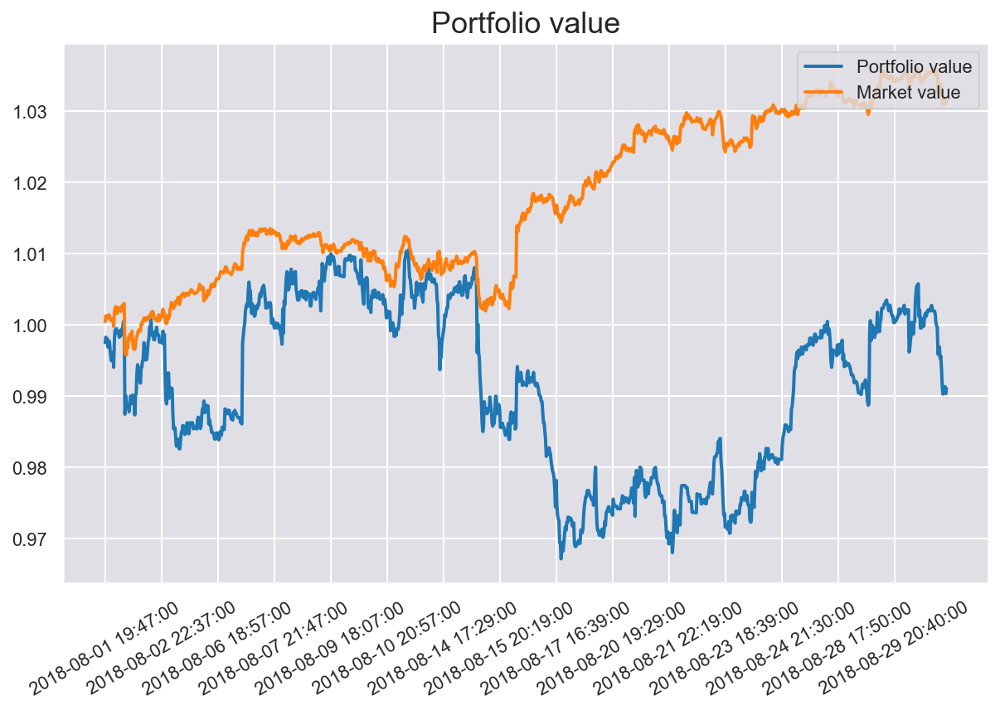

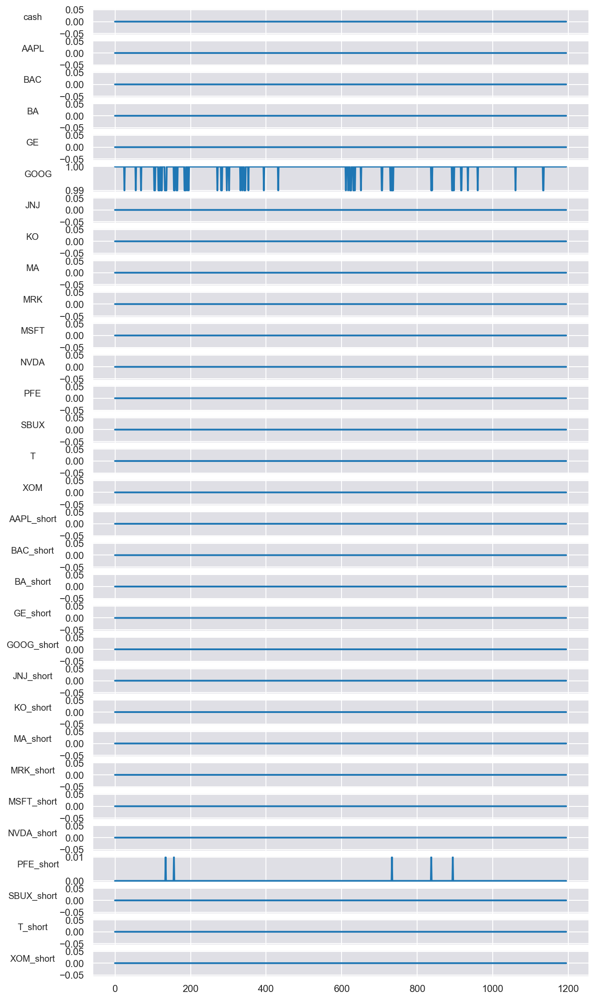

In [49]:
tf.reset_default_graph()
sess = tf.Session()
tflearn.config.init_training_mode()
action_dim = [nb_classes*2 + 1]
state_dim = [nb_classes + 1, window_length, 3]
variable_scope = get_variable_scope(window_length, predictor_type, use_batch_norm)
with tf.variable_scope(variable_scope):
    actor = StockActor(sess, state_dim, action_dim, action_bound, 1e-4, tau, batch_size, predictor_type, 
                       use_batch_norm)
    critic = StockCritic(sess=sess, state_dim=state_dim, action_dim=action_dim, tau=1e-3,
                         learning_rate=1e-3, num_actor_vars=actor.get_num_trainable_vars(), 
                         predictor_type=predictor_type, use_batch_norm=use_batch_norm)
    actor_noise = OrnsteinUhlenbeckActionNoise(mu=np.zeros(action_dim))

    model_save_path = "weights/"
    summary_path = get_result_path(window_length, predictor_type, use_batch_norm)

    ddpg_model = DDPG(environ, sess, actor, critic, actor_noise,param, obs_normalizer=obs_normalizer, model_save_path=model_save_path,
                      summary_path=summary_path)
    ddpg_model.initialize(load_weights=False, verbose=False)
    ddpg_model.train()

env_Aug = PortfolioEnv(history_Aug, abbreviation, steps=history_Aug.shape[1]-200, window_length=window_length,
                   start_idx=data['Aug'].date_index.iloc[0])
test_model(env_Aug, ddpg_model)
plot_weights(env_Aug.infos)

Build model from scratch
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
1500
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 0, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field ty

c:\users\lenovo\appdata\local\programs\python\python39\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


Episode: 2, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 3, Reward: 1.00, Qmax: 0.0002
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 4, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 

Episode: 25, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 26, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 27, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.

Episode: 48, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 49, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 50, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 71, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 72, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 73, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.

Episode: 94, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 95, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 96, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.

Episode: 116, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 117, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 118, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 139, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 140, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 141, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 162, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 163, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 164, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 185, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 186, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 187, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 207, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 208, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 209, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 230, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 231, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 232, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 253, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 254, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 255, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 276, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 277, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 278, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 299, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 300, Reward: 1.00, Qmax: -0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.0

Episode: 321, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 322, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 323, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 344, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 345, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 346, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 367, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 368, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 369, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 390, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 391, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 392, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03

Episode: 412, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 413, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 414, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 435, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 436, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 437, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 458, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 459, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 460, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03

Episode: 481, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 482, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 483, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 503, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 504, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 505, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 526, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 527, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.04]
Episode: 528, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 549, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 550, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 551, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 572, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 573, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 574, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03

Episode: 595, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 596, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 597, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.

Episode: 617, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 618, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 619, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03
 0.03 0.0

Episode: 640, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 641, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
Episode: 642, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.0

Episode: 663, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.02 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.02 0.04]
Episode: 664, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.02 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.02 0.04]
Episode: 665, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.

Episode: 686, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.02 0.03 0.04 0.02
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.02 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.02
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.02 0.04]
Episode: 687, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.02
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.02 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.02
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.02 0.04]
Episode: 688, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.02
 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.04 0.03 0.03 0.03 0.04 0.03 0.04
 0.03 0.02 0.04]
[0.03 0.03 0.03 0.04 0.04 0.04 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.03
 0.03 0.

Episode: 708, Reward: 1.00, Qmax: 0.0000
[0.02 0.03 0.02 0.05 0.04 0.05 0.05 0.02 0.05 0.02 0.02 0.03 0.04 0.02
 0.02 0.03 0.03 0.03 0.03 0.05 0.02 0.05 0.03 0.03 0.02 0.04 0.03 0.05
 0.02 0.02 0.05]
[0.02 0.03 0.02 0.05 0.04 0.05 0.05 0.02 0.05 0.02 0.02 0.03 0.04 0.02
 0.02 0.03 0.03 0.03 0.03 0.05 0.02 0.05 0.03 0.02 0.02 0.04 0.03 0.05
 0.02 0.02 0.05]
Episode: 709, Reward: 1.00, Qmax: -0.0000
[0.03 0.03 0.02 0.05 0.04 0.05 0.04 0.02 0.04 0.02 0.02 0.03 0.04 0.02
 0.02 0.03 0.03 0.03 0.03 0.05 0.03 0.05 0.03 0.03 0.03 0.04 0.03 0.05
 0.02 0.02 0.04]
[0.02 0.03 0.02 0.05 0.04 0.05 0.04 0.02 0.05 0.02 0.02 0.03 0.04 0.02
 0.02 0.03 0.03 0.03 0.03 0.05 0.02 0.05 0.03 0.03 0.03 0.04 0.03 0.05
 0.02 0.02 0.04]
Episode: 710, Reward: 1.00, Qmax: -0.0000
[0.02 0.03 0.02 0.05 0.04 0.05 0.05 0.02 0.05 0.02 0.02 0.03 0.04 0.02
 0.02 0.03 0.03 0.03 0.03 0.05 0.02 0.05 0.03 0.03 0.02 0.04 0.03 0.05
 0.02 0.02 0.05]
[0.02 0.03 0.02 0.05 0.04 0.05 0.04 0.02 0.05 0.02 0.02 0.03 0.04 0.02
 0.02 0.0

Episode: 731, Reward: 1.00, Qmax: -0.0000
[0.02 0.02 0.01 0.07 0.05 0.07 0.06 0.01 0.06 0.01 0.02 0.03 0.05 0.01
 0.01 0.02 0.02 0.02 0.02 0.07 0.02 0.07 0.02 0.02 0.02 0.04 0.02 0.08
 0.01 0.01 0.06]
[0.02 0.02 0.01 0.06 0.05 0.07 0.06 0.01 0.06 0.01 0.02 0.03 0.05 0.01
 0.01 0.02 0.02 0.02 0.02 0.07 0.02 0.07 0.02 0.02 0.02 0.04 0.02 0.08
 0.01 0.01 0.06]
Episode: 732, Reward: 1.00, Qmax: -0.0000
[0.02 0.02 0.01 0.06 0.05 0.06 0.06 0.01 0.06 0.01 0.02 0.03 0.05 0.01
 0.01 0.02 0.02 0.02 0.02 0.07 0.02 0.07 0.02 0.02 0.02 0.04 0.02 0.07
 0.01 0.01 0.05]
[0.02 0.02 0.01 0.06 0.05 0.06 0.06 0.01 0.06 0.01 0.02 0.03 0.05 0.01
 0.01 0.02 0.02 0.02 0.02 0.07 0.02 0.07 0.02 0.02 0.02 0.04 0.02 0.07
 0.01 0.01 0.05]
Episode: 733, Reward: 1.00, Qmax: 0.0000
[0.01 0.02 0.01 0.07 0.05 0.07 0.06 0.01 0.06 0.01 0.01 0.03 0.05 0.01
 0.01 0.02 0.02 0.02 0.02 0.07 0.02 0.07 0.02 0.02 0.02 0.04 0.02 0.08
 0.01 0.01 0.06]
[0.02 0.02 0.01 0.07 0.05 0.07 0.06 0.01 0.06 0.01 0.01 0.03 0.05 0.01
 0.01 0.0

Episode: 754, Reward: 1.00, Qmax: -0.0000
[0.01 0.01 0.   0.09 0.04 0.07 0.08 0.   0.09 0.   0.01 0.02 0.06 0.
 0.   0.01 0.01 0.01 0.01 0.1  0.01 0.11 0.01 0.01 0.01 0.04 0.01 0.15
 0.   0.   0.05]
[0.01 0.01 0.   0.09 0.04 0.07 0.08 0.   0.09 0.   0.01 0.02 0.06 0.
 0.   0.01 0.01 0.01 0.01 0.1  0.01 0.11 0.01 0.01 0.01 0.04 0.01 0.15
 0.   0.   0.05]
Episode: 755, Reward: 1.00, Qmax: -0.0000
[0.   0.   0.   0.1  0.04 0.07 0.09 0.   0.09 0.   0.   0.01 0.06 0.
 0.   0.   0.   0.01 0.01 0.11 0.   0.12 0.   0.01 0.   0.04 0.   0.17
 0.   0.   0.05]
[0.   0.   0.   0.1  0.04 0.07 0.08 0.   0.09 0.   0.   0.02 0.06 0.
 0.   0.   0.   0.01 0.01 0.1  0.   0.12 0.01 0.01 0.   0.04 0.01 0.16
 0.   0.   0.05]
Episode: 756, Reward: 1.00, Qmax: -0.0000
[0.   0.01 0.   0.1  0.04 0.07 0.08 0.   0.09 0.   0.   0.02 0.06 0.
 0.   0.   0.   0.01 0.01 0.1  0.   0.12 0.01 0.01 0.   0.04 0.01 0.16
 0.   0.   0.05]
[0.   0.01 0.   0.1  0.04 0.07 0.08 0.   0.09 0.   0.01 0.02 0.06 0.
 0.   0.01 0.01 0.01

Episode: 771, Reward: 1.00, Qmax: -0.0000
[2.41e-04 3.33e-04 1.07e-04 9.72e-02 9.19e-03 2.64e-02 6.05e-02 2.03e-05
 6.59e-02 1.29e-04 3.98e-04 2.69e-03 6.03e-02 8.71e-05 1.11e-04 3.43e-04
 2.73e-04 5.19e-04 8.07e-04 9.78e-02 3.17e-04 1.12e-01 3.75e-04 6.72e-04
 2.35e-04 1.30e-02 3.68e-04 4.31e-01 1.11e-04 8.78e-05 1.78e-02]
[2.96e-04 4.05e-04 1.35e-04 9.85e-02 1.00e-02 2.79e-02 6.22e-02 2.69e-05
 6.76e-02 1.62e-04 4.80e-04 3.06e-03 6.20e-02 1.10e-04 1.40e-04 4.15e-04
 3.34e-04 6.21e-04 9.52e-04 9.91e-02 3.85e-04 1.13e-01 4.53e-04 7.97e-04
 2.88e-04 1.41e-02 4.45e-04 4.17e-01 1.39e-04 1.11e-04 1.90e-02]
Episode: 772, Reward: 1.00, Qmax: 0.0000
[4.00e-04 5.36e-04 1.90e-04 9.76e-02 1.11e-02 2.90e-02 6.25e-02 4.12e-05
 6.77e-02 2.25e-04 6.37e-04 3.65e-03 6.66e-02 1.56e-04 1.96e-04 5.51e-04
 4.47e-04 8.08e-04 1.21e-03 9.75e-02 5.15e-04 1.10e-01 5.94e-04 1.02e-03
 3.87e-04 1.54e-02 5.85e-04 4.09e-01 1.95e-04 1.58e-04 2.03e-02]
[2.48e-04 3.40e-04 1.11e-04 9.45e-02 8.99e-03 2.55e-02 5.85e-02 2

Episode: 785, Reward: 1.00, Qmax: -0.0000
[1.34e-05 1.93e-05 4.45e-06 2.43e-02 1.11e-03 4.05e-03 1.26e-02 5.11e-07
 1.41e-02 5.99e-06 3.01e-05 3.02e-04 4.78e-02 3.49e-06 4.64e-06 2.09e-05
 1.50e-05 3.72e-05 6.23e-05 2.34e-02 2.01e-05 2.73e-02 2.20e-05 5.50e-05
 1.23e-05 1.93e-03 2.15e-05 8.40e-01 4.78e-06 3.74e-06 2.60e-03]
[1.59e-05 2.27e-05 5.37e-06 2.55e-02 1.22e-03 4.38e-03 1.34e-02 6.38e-07
 1.49e-02 7.18e-06 3.52e-05 3.41e-04 4.96e-02 4.22e-06 5.59e-06 2.45e-05
 1.78e-05 4.33e-05 7.20e-05 2.46e-02 2.36e-05 2.86e-02 2.58e-05 6.36e-05
 1.46e-05 2.11e-03 2.52e-05 8.32e-01 5.76e-06 4.52e-06 2.83e-03]
Episode: 786, Reward: 1.00, Qmax: 0.0000
[4.80e-06 7.10e-06 1.44e-06 1.65e-02 5.76e-04 2.36e-03 8.12e-03 1.35e-07
 9.11e-03 1.99e-06 1.17e-05 1.43e-04 3.75e-02 1.11e-06 1.50e-06 7.74e-06
 5.40e-06 1.46e-05 2.55e-05 1.59e-02 7.46e-06 1.87e-02 8.19e-06 2.24e-05
 4.36e-06 1.06e-03 7.98e-06 8.88e-01 1.56e-06 1.19e-06 1.46e-03]
[6.01e-06 8.83e-06 1.84e-06 1.77e-02 6.58e-04 2.62e-03 8.80e-03 1

Episode: 799, Reward: 1.00, Qmax: -0.0000
[1.08e-06 1.61e-06 2.93e-07 4.30e-03 1.51e-04 6.36e-04 2.21e-03 2.35e-08
 2.41e-03 4.25e-07 2.96e-06 3.88e-05 1.74e-02 2.24e-07 3.06e-07 1.79e-06
 1.21e-06 3.56e-06 6.34e-06 4.18e-03 1.76e-06 5.08e-03 1.86e-06 5.76e-06
 9.62e-07 2.84e-04 1.81e-06 9.63e-01 3.24e-07 2.49e-07 3.78e-04]
[1.83e-07 2.86e-07 4.16e-08 2.15e-03 4.83e-05 2.47e-04 1.02e-03 2.39e-09
 1.12e-03 6.34e-08 5.70e-07 1.04e-05 1.05e-02 3.08e-08 4.37e-08 3.23e-07
 2.06e-07 7.02e-07 1.35e-06 2.08e-03 3.16e-07 2.59e-03 3.38e-07 1.21e-06
 1.60e-07 9.95e-05 3.27e-07 9.80e-01 4.67e-08 3.47e-08 1.37e-04]
Episode: 800, Reward: 1.00, Qmax: -0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no a

Episode: 812, Reward: 1.00, Qmax: 0.0000
[2.72e-08 4.41e-08 5.27e-09 6.80e-04 1.19e-05 6.96e-05 3.17e-04 2.26e-10
 3.43e-04 8.48e-09 9.74e-08 2.31e-06 4.39e-03 3.81e-09 5.55e-09 5.07e-08
 3.08e-08 1.20e-07 2.44e-07 6.60e-04 4.99e-08 8.57e-04 5.30e-08 2.22e-07
 2.34e-08 2.60e-05 5.10e-08 9.93e-01 6.03e-09 4.37e-09 3.62e-05]
[4.13e-08 6.63e-08 8.33e-09 8.10e-04 1.56e-05 8.76e-05 3.85e-04 3.86e-10
 4.15e-04 1.33e-08 1.44e-07 3.15e-06 5.00e-03 6.07e-09 8.78e-09 7.59e-08
 4.67e-08 1.76e-07 3.52e-07 7.87e-04 7.48e-08 1.02e-03 7.92e-08 3.20e-07
 3.57e-08 3.34e-05 7.64e-08 9.91e-01 9.51e-09 6.95e-09 4.62e-05]
Episode: 813, Reward: 1.00, Qmax: -0.0000
[5.89e-08 9.36e-08 1.23e-08 9.25e-04 1.95e-05 1.05e-04 4.47e-04 6.08e-10
 4.81e-04 1.94e-08 1.99e-07 4.09e-06 5.54e-03 9.01e-09 1.29e-08 1.07e-07
 6.64e-08 2.43e-07 4.79e-07 9.00e-04 1.05e-07 1.15e-03 1.11e-07 4.36e-07
 5.09e-08 4.11e-05 1.07e-07 9.90e-01 1.40e-08 1.03e-08 5.64e-05]
[5.35e-08 8.52e-08 1.11e-08 8.89e-04 1.83e-05 1.00e-04 4.28e-04 5

Episode: 826, Reward: 1.00, Qmax: -0.0000
[9.36e-08 1.46e-07 2.05e-08 1.01e-03 2.52e-05 1.27e-04 5.05e-04 1.12e-09
 5.38e-04 3.19e-08 3.06e-07 5.63e-06 6.45e-03 1.52e-08 2.16e-08 1.66e-07
 1.05e-07 3.69e-07 7.10e-07 9.86e-04 1.64e-07 1.25e-03 1.73e-07 6.51e-07
 8.12e-08 5.15e-05 1.67e-07 9.89e-01 2.33e-08 1.73e-08 6.96e-05]
[2.99e-08 4.82e-08 5.89e-09 6.20e-04 1.19e-05 6.77e-05 2.97e-04 2.62e-10
 3.17e-04 9.46e-09 1.06e-07 2.40e-06 4.54e-03 4.28e-09 6.21e-09 5.54e-08
 3.38e-08 1.30e-07 2.62e-07 6.06e-04 5.47e-08 7.83e-04 5.77e-08 2.39e-07
 2.57e-08 2.57e-05 5.56e-08 9.93e-01 6.75e-09 4.92e-09 3.55e-05]
Episode: 827, Reward: 1.00, Qmax: 0.0000
[1.44e-08 2.37e-08 2.65e-09 4.52e-04 7.39e-06 4.51e-05 2.10e-04 1.03e-10
 2.25e-04 4.35e-09 5.41e-08 1.39e-06 3.65e-03 1.90e-09 2.80e-09 2.74e-08
 1.64e-08 6.65e-08 1.38e-07 4.42e-04 2.70e-08 5.77e-04 2.86e-08 1.26e-07
 1.23e-08 1.65e-05 2.75e-08 9.94e-01 3.06e-09 2.20e-09 2.30e-05]
[3.15e-08 5.06e-08 6.23e-09 6.30e-04 1.23e-05 6.95e-05 3.03e-04 2

Episode: 840, Reward: 1.00, Qmax: -0.0000
[1.49e-07 2.30e-07 3.43e-08 1.18e-03 3.38e-05 1.62e-04 6.09e-04 2.04e-09
 6.45e-04 5.26e-08 4.70e-07 7.93e-06 8.12e-03 2.56e-08 3.60e-08 2.61e-07
 1.67e-07 5.65e-07 1.06e-06 1.16e-03 2.58e-07 1.47e-03 2.70e-07 9.79e-07
 1.30e-07 6.73e-05 2.61e-07 9.86e-01 3.87e-08 2.91e-08 9.00e-05]
[2.62e-08 4.22e-08 5.09e-09 5.62e-04 1.08e-05 6.14e-05 2.69e-04 2.22e-10
 2.86e-04 8.21e-09 9.40e-08 2.16e-06 4.80e-03 3.70e-09 5.37e-09 4.86e-08
 2.96e-08 1.15e-07 2.32e-07 5.51e-04 4.80e-08 7.14e-04 5.06e-08 2.12e-07
 2.25e-08 2.33e-05 4.88e-08 9.93e-01 5.85e-09 4.26e-09 3.20e-05]
Episode: 841, Reward: 1.00, Qmax: -0.0000
[1.01e-07 1.58e-07 2.24e-08 1.00e-03 2.61e-05 1.30e-04 5.07e-04 1.24e-09
 5.37e-04 3.47e-08 3.28e-07 5.93e-06 7.25e-03 1.66e-08 2.35e-08 1.79e-07
 1.13e-07 3.96e-07 7.58e-07 9.84e-04 1.77e-07 1.25e-03 1.86e-07 6.96e-07
 8.79e-08 5.31e-05 1.80e-07 9.88e-01 2.54e-08 1.89e-08 7.14e-05]
[2.26e-07 3.44e-07 5.39e-08 1.41e-03 4.42e-05 2.03e-04 7.38e-04 

Episode: 854, Reward: 1.00, Qmax: -0.0000
[4.76e-08 7.56e-08 9.82e-09 7.08e-04 1.58e-05 8.46e-05 3.51e-04 4.77e-10
 3.71e-04 1.55e-08 1.63e-07 3.36e-06 5.57e-03 7.20e-09 1.03e-08 8.64e-08
 5.36e-08 1.98e-07 3.90e-07 6.95e-04 8.54e-08 8.99e-04 8.99e-08 3.58e-07
 4.10e-08 3.31e-05 8.67e-08 9.91e-01 1.12e-08 8.25e-09 4.51e-05]
[3.54e-08 5.67e-08 7.10e-09 6.23e-04 1.30e-05 7.18e-05 3.06e-04 3.27e-10
 3.23e-04 1.13e-08 1.24e-07 2.69e-06 5.09e-03 5.18e-09 7.48e-09 6.50e-08
 3.99e-08 1.51e-07 3.01e-07 6.12e-04 6.42e-08 7.95e-04 6.76e-08 2.76e-07
 3.05e-08 2.76e-05 6.52e-08 9.92e-01 8.12e-09 5.95e-09 3.78e-05]
Episode: 855, Reward: 1.00, Qmax: -0.0000
[1.49e-08 2.44e-08 2.76e-09 4.29e-04 7.37e-06 4.43e-05 2.03e-04 1.09e-10
 2.15e-04 4.51e-09 5.57e-08 1.41e-06 3.89e-03 1.98e-09 2.91e-09 2.82e-08
 1.69e-08 6.83e-08 1.41e-07 4.21e-04 2.78e-08 5.54e-04 2.94e-08 1.29e-07
 1.27e-08 1.63e-05 2.83e-08 9.94e-01 3.18e-09 2.29e-09 2.26e-05]
[1.08e-08 1.79e-08 1.94e-09 3.74e-04 5.98e-06 3.71e-05 1.75e-04 

Episode: 868, Reward: 1.00, Qmax: -0.0000
[3.45e-08 5.52e-08 6.90e-09 6.14e-04 1.28e-05 7.06e-05 3.02e-04 3.17e-10
 3.17e-04 1.10e-08 1.21e-07 2.64e-06 5.23e-03 5.03e-09 7.26e-09 6.33e-08
 3.89e-08 1.47e-07 2.94e-07 6.03e-04 6.26e-08 7.90e-04 6.59e-08 2.70e-07
 2.97e-08 2.71e-05 6.36e-08 9.92e-01 7.89e-09 5.78e-09 3.71e-05]
[3.26e-08 5.23e-08 6.50e-09 5.99e-04 1.23e-05 6.84e-05 2.94e-04 2.95e-10
 3.09e-04 1.04e-08 1.15e-07 2.53e-06 5.14e-03 4.73e-09 6.84e-09 6.01e-08
 3.68e-08 1.40e-07 2.81e-07 5.88e-04 5.93e-08 7.72e-04 6.25e-08 2.57e-07
 2.81e-08 2.62e-05 6.03e-08 9.92e-01 7.44e-09 5.44e-09 3.59e-05]
Episode: 869, Reward: 1.00, Qmax: -0.0000
[5.28e-08 8.37e-08 1.10e-08 7.37e-04 1.69e-05 8.95e-05 3.69e-04 5.45e-10
 3.87e-04 1.74e-08 1.80e-07 3.63e-06 5.97e-03 8.08e-09 1.16e-08 9.56e-08
 5.94e-08 2.18e-07 4.28e-07 7.24e-04 9.45e-08 9.44e-04 9.94e-08 3.92e-07
 4.56e-08 3.52e-05 9.59e-08 9.91e-01 1.25e-08 9.26e-09 4.78e-05]
[8.58e-08 1.34e-07 1.87e-08 9.08e-04 2.33e-05 1.17e-04 4.63e-04 

Episode: 882, Reward: 1.00, Qmax: -0.0000
[1.64e-08 2.68e-08 3.06e-09 4.46e-04 7.84e-06 4.66e-05 2.14e-04 1.23e-10
 2.23e-04 4.99e-09 6.09e-08 1.51e-06 3.97e-03 2.20e-09 3.23e-09 3.09e-08
 1.86e-08 7.45e-08 1.54e-07 4.36e-04 3.05e-08 5.90e-04 3.22e-08 1.40e-07
 1.40e-08 1.72e-05 3.10e-08 9.94e-01 3.52e-09 2.54e-09 2.38e-05]
[5.91e-09 9.93e-09 1.00e-09 2.88e-04 4.02e-06 2.64e-05 1.32e-04 3.36e-11
 1.38e-04 1.69e-09 2.37e-08 7.05e-07 2.91e-03 7.10e-10 1.06e-09 1.16e-08
 6.74e-09 2.93e-08 6.29e-08 2.81e-04 1.14e-08 3.87e-04 1.21e-08 5.73e-08
 5.02e-09 9.22e-06 1.16e-08 9.96e-01 1.17e-09 8.27e-10 1.30e-05]
Episode: 883, Reward: 1.00, Qmax: -0.0000
[1.40e-07 2.16e-07 3.20e-08 1.12e-03 3.20e-05 1.54e-04 5.85e-04 1.89e-09
 6.08e-04 4.91e-08 4.43e-07 7.51e-06 7.56e-03 2.39e-08 3.35e-08 2.45e-07
 1.56e-07 5.31e-07 1.00e-06 1.10e-03 2.42e-07 1.43e-03 2.53e-07 9.22e-07
 1.22e-07 6.36e-05 2.45e-07 9.87e-01 3.61e-08 2.71e-08 8.49e-05]
[3.24e-08 5.19e-08 6.44e-09 5.98e-04 1.23e-05 6.81e-05 2.94e-04 

Episode: 896, Reward: 1.00, Qmax: -0.0000
[9.32e-09 1.54e-08 1.65e-09 3.48e-04 5.39e-06 3.39e-05 1.65e-04 6.01e-11
 1.70e-04 2.74e-09 3.61e-08 9.87e-07 2.80e-03 1.18e-09 1.74e-09 1.79e-08
 1.06e-08 4.44e-08 9.35e-08 3.37e-04 1.77e-08 4.76e-04 1.87e-08 8.53e-08
 7.94e-09 1.21e-05 1.80e-08 9.96e-01 1.91e-09 1.37e-09 1.68e-05]
[1.43e-08 2.34e-08 2.63e-09 4.19e-04 7.13e-06 4.30e-05 2.01e-04 1.03e-10
 2.08e-04 4.31e-09 5.35e-08 1.36e-06 3.21e-03 1.89e-09 2.78e-09 2.70e-08
 1.62e-08 6.56e-08 1.36e-07 4.06e-04 2.67e-08 5.68e-04 2.82e-08 1.24e-07
 1.22e-08 1.57e-05 2.72e-08 9.95e-01 3.04e-09 2.19e-09 2.17e-05]
Episode: 897, Reward: 1.00, Qmax: -0.0000
[7.96e-09 1.32e-08 1.39e-09 3.25e-04 4.85e-06 3.10e-05 1.53e-04 4.91e-11
 1.58e-04 2.31e-09 3.12e-08 8.77e-07 2.63e-03 9.89e-10 1.47e-09 1.54e-08
 9.05e-09 3.84e-08 8.14e-08 3.14e-04 1.52e-08 4.46e-04 1.61e-08 7.42e-08
 6.77e-09 1.10e-05 1.55e-08 9.96e-01 1.61e-09 1.15e-09 1.53e-05]
[9.52e-09 1.58e-08 1.69e-09 3.51e-04 5.46e-06 3.42e-05 1.66e-04 

Episode: 909, Reward: 1.00, Qmax: -0.0000
[6.78e-08 1.07e-07 1.45e-08 8.17e-04 1.98e-05 1.02e-04 4.19e-04 7.53e-10
 4.28e-04 2.27e-08 2.26e-07 4.35e-06 4.85e-03 1.07e-08 1.52e-08 1.22e-07
 7.62e-08 2.73e-07 5.31e-07 7.89e-04 1.20e-07 1.10e-03 1.26e-07 4.88e-07
 5.87e-08 4.04e-05 1.22e-07 9.91e-01 1.65e-08 1.22e-08 5.46e-05]
[3.79e-08 6.05e-08 7.66e-09 6.36e-04 1.35e-05 7.38e-05 3.19e-04 3.59e-10
 3.26e-04 1.22e-08 1.32e-07 2.81e-06 4.03e-03 5.60e-09 8.06e-09 6.93e-08
 4.27e-08 1.60e-07 3.19e-07 6.14e-04 6.85e-08 8.63e-04 7.21e-08 2.92e-07
 3.26e-08 2.83e-05 6.95e-08 9.93e-01 8.75e-09 6.42e-09 3.86e-05]
Episode: 910, Reward: 1.00, Qmax: -0.0000
[2.86e-08 4.60e-08 5.63e-09 5.64e-04 1.12e-05 6.32e-05 2.80e-04 2.51e-10
 2.86e-04 9.04e-09 1.02e-07 2.28e-06 3.69e-03 4.09e-09 5.93e-09 5.28e-08
 3.23e-08 1.24e-07 2.49e-07 5.44e-04 5.22e-08 7.70e-04 5.50e-08 2.28e-07
 2.46e-08 2.39e-05 5.30e-08 9.94e-01 6.45e-09 4.71e-09 3.27e-05]
[3.34e-08 5.35e-08 6.67e-09 6.03e-04 1.24e-05 6.88e-05 3.01e-04 

Episode: 923, Reward: 1.00, Qmax: -0.0000
[1.08e-08 1.79e-08 1.95e-09 3.68e-04 5.92e-06 3.66e-05 1.77e-04 7.31e-11
 1.80e-04 3.22e-09 4.14e-08 1.10e-06 2.52e-03 1.40e-09 2.06e-09 2.07e-08
 1.23e-08 5.09e-08 1.06e-07 3.53e-04 2.05e-08 5.17e-04 2.16e-08 9.72e-08
 9.25e-09 1.31e-05 2.08e-08 9.96e-01 2.25e-09 1.62e-09 1.82e-05]
[2.28e-08 3.69e-08 4.41e-09 5.07e-04 9.66e-06 5.55e-05 2.51e-04 1.89e-10
 2.56e-04 7.12e-09 8.26e-08 1.92e-06 3.21e-03 3.19e-09 4.64e-09 4.25e-08
 2.58e-08 1.01e-07 2.05e-07 4.87e-04 4.20e-08 7.03e-04 4.43e-08 1.87e-07
 1.96e-08 2.07e-05 4.27e-08 9.94e-01 5.06e-09 3.68e-09 2.84e-05]
Episode: 924, Reward: 1.00, Qmax: 0.0000
[1.96e-08 3.18e-08 3.72e-09 4.74e-04 8.73e-06 5.09e-05 2.34e-04 1.55e-10
 2.38e-04 6.05e-09 7.16e-08 1.71e-06 3.03e-03 2.69e-09 3.93e-09 3.67e-08
 2.21e-08 8.75e-08 1.79e-07 4.55e-04 3.62e-08 6.59e-04 3.82e-08 1.63e-07
 1.68e-08 1.88e-05 3.68e-08 9.95e-01 4.28e-09 3.11e-09 2.59e-05]
[5.63e-08 8.90e-08 1.18e-08 7.48e-04 1.75e-05 9.17e-05 3.84e-04 5

Episode: 937, Reward: 1.00, Qmax: 0.0000
[7.11e-09 1.19e-08 1.23e-09 3.00e-04 4.45e-06 2.86e-05 1.44e-04 4.30e-11
 1.46e-04 2.06e-09 2.80e-08 7.99e-07 1.95e-03 8.77e-10 1.30e-09 1.38e-08
 8.09e-09 3.46e-08 7.35e-08 2.86e-04 1.36e-08 4.26e-04 1.44e-08 6.70e-08
 6.05e-09 1.00e-05 1.39e-08 9.97e-01 1.43e-09 1.02e-09 1.39e-05]
[9.97e-09 1.65e-08 1.78e-09 3.47e-04 5.56e-06 3.46e-05 1.68e-04 6.61e-11
 1.71e-04 2.95e-09 3.83e-08 1.03e-06 2.17e-03 1.28e-09 1.88e-09 1.91e-08
 1.13e-08 4.71e-08 9.87e-08 3.31e-04 1.89e-08 4.90e-04 2.00e-08 9.02e-08
 8.51e-09 1.23e-05 1.92e-08 9.96e-01 2.07e-09 1.48e-09 1.70e-05]
Episode: 938, Reward: 1.00, Qmax: -0.0000
[2.25e-08 3.63e-08 4.34e-09 4.91e-04 9.47e-06 5.43e-05 2.46e-04 1.86e-10
 2.50e-04 7.01e-09 8.13e-08 1.89e-06 2.82e-03 3.14e-09 4.57e-09 4.18e-08
 2.54e-08 9.90e-08 2.01e-07 4.70e-04 4.13e-08 6.84e-04 4.36e-08 1.84e-07
 1.93e-08 2.02e-05 4.20e-08 9.95e-01 4.98e-09 3.62e-09 2.76e-05]
[2.24e-08 3.62e-08 4.32e-09 4.90e-04 9.45e-06 5.42e-05 2.46e-04 1

Episode: 951, Reward: 1.00, Qmax: 0.0000
[7.32e-08 1.15e-07 1.58e-08 8.01e-04 2.05e-05 1.04e-04 4.26e-04 8.41e-10
 4.30e-04 2.47e-08 2.42e-07 4.55e-06 3.70e-03 1.17e-08 1.66e-08 1.31e-07
 8.22e-08 2.92e-07 5.65e-07 7.66e-04 1.29e-07 1.10e-03 1.36e-07 5.19e-07
 6.34e-08 4.13e-05 1.31e-07 9.93e-01 1.80e-08 1.34e-08 5.51e-05]
[1.13e-08 1.85e-08 2.04e-09 3.56e-04 5.96e-06 3.65e-05 1.76e-04 7.76e-11
 1.78e-04 3.36e-09 4.28e-08 1.12e-06 1.96e-03 1.46e-09 2.15e-09 2.14e-08
 1.28e-08 5.25e-08 1.09e-07 3.38e-04 2.12e-08 5.06e-04 2.24e-08 1.00e-07
 9.61e-09 1.31e-05 2.15e-08 9.96e-01 2.36e-09 1.69e-09 1.80e-05]
Episode: 952, Reward: 1.00, Qmax: 0.0000
[2.64e-08 4.25e-08 5.19e-09 5.13e-04 1.04e-05 5.87e-05 2.63e-04 2.30e-10
 2.65e-04 8.35e-09 9.43e-08 2.11e-06 2.59e-03 3.77e-09 5.46e-09 4.88e-08
 2.98e-08 1.15e-07 2.31e-07 4.89e-04 4.82e-08 7.19e-04 5.08e-08 2.12e-07
 2.27e-08 2.20e-05 4.90e-08 9.95e-01 5.95e-09 4.34e-09 2.99e-05]
[6.62e-08 1.04e-07 1.42e-08 7.64e-04 1.91e-05 9.81e-05 4.05e-04 7.

Episode: 965, Reward: 1.00, Qmax: -0.0000
[2.75e-08 4.42e-08 5.44e-09 5.11e-04 1.06e-05 5.95e-05 2.66e-04 2.44e-10
 2.66e-04 8.74e-09 9.79e-08 2.17e-06 2.27e-03 3.96e-09 5.72e-09 5.08e-08
 3.10e-08 1.19e-07 2.39e-07 4.84e-04 5.02e-08 7.24e-04 5.29e-08 2.19e-07
 2.37e-08 2.23e-05 5.10e-08 9.95e-01 6.24e-09 4.56e-09 3.02e-05]
[4.14e-09 7.00e-09 6.86e-10 2.24e-04 3.06e-06 2.06e-05 1.09e-04 2.19e-11
 1.09e-04 1.16e-09 1.70e-08 5.24e-07 1.17e-03 4.84e-10 7.25e-10 8.16e-09
 4.72e-09 2.10e-08 4.54e-08 2.11e-04 8.06e-09 3.30e-04 8.55e-09 4.14e-08
 3.51e-09 6.98e-06 8.21e-09 9.98e-01 8.00e-10 5.65e-10 9.73e-06]
Episode: 966, Reward: 1.00, Qmax: -0.0000
[2.74e-08 4.41e-08 5.42e-09 5.10e-04 1.06e-05 5.95e-05 2.66e-04 2.43e-10
 2.66e-04 8.71e-09 9.76e-08 2.16e-06 2.25e-03 3.95e-09 5.71e-09 5.06e-08
 3.10e-08 1.19e-07 2.38e-07 4.83e-04 5.00e-08 7.24e-04 5.27e-08 2.18e-07
 2.36e-08 2.23e-05 5.08e-08 9.95e-01 6.22e-09 4.54e-09 3.02e-05]
[6.19e-09 1.03e-08 1.06e-09 2.67e-04 3.98e-06 2.58e-05 1.32e-04 

Episode: 979, Reward: 1.00, Qmax: -0.0000
[5.79e-08 9.12e-08 1.23e-08 7.03e-04 1.73e-05 9.01e-05 3.79e-04 6.28e-10
 3.77e-04 1.93e-08 1.94e-07 3.78e-06 2.70e-03 9.04e-09 1.29e-08 1.04e-07
 6.50e-08 2.35e-07 4.57e-07 6.63e-04 1.03e-07 1.00e-03 1.08e-07 4.21e-07
 5.00e-08 3.51e-05 1.04e-07 9.94e-01 1.40e-08 1.03e-08 4.69e-05]
[5.95e-08 9.37e-08 1.26e-08 7.12e-04 1.77e-05 9.15e-05 3.84e-04 6.51e-10
 3.82e-04 1.99e-08 2.00e-07 3.86e-06 2.73e-03 9.33e-09 1.33e-08 1.07e-07
 6.69e-08 2.41e-07 4.69e-07 6.71e-04 1.06e-07 1.01e-03 1.11e-07 4.31e-07
 5.15e-08 3.57e-05 1.07e-07 9.94e-01 1.44e-08 1.07e-08 4.77e-05]
Episode: 980, Reward: 1.00, Qmax: 0.0000
[5.17e-09 8.68e-09 8.74e-10 2.45e-04 3.53e-06 2.33e-05 1.21e-04 2.91e-11
 1.20e-04 1.47e-09 2.08e-08 6.18e-07 1.14e-03 6.19e-10 9.23e-10 1.01e-08
 5.89e-09 2.56e-08 5.51e-08 2.29e-04 9.98e-09 3.67e-04 1.06e-08 5.03e-08
 4.39e-09 7.95e-06 1.02e-08 9.98e-01 1.02e-09 7.22e-10 1.10e-05]
[4.89e-09 8.22e-09 8.23e-10 2.39e-04 3.40e-06 2.26e-05 1.18e-04 2

Episode: 993, Reward: 1.00, Qmax: -0.0000
[7.37e-09 1.23e-08 1.29e-09 2.87e-04 4.46e-06 2.84e-05 1.45e-04 4.58e-11
 1.43e-04 2.15e-09 2.89e-08 8.06e-07 1.21e-03 9.19e-10 1.36e-09 1.42e-08
 8.38e-09 3.55e-08 7.52e-08 2.67e-04 1.41e-08 4.35e-04 1.49e-08 6.87e-08
 6.28e-09 9.86e-06 1.43e-08 9.97e-01 1.50e-09 1.07e-09 1.36e-05]
[4.46e-08 7.07e-08 9.22e-09 6.28e-04 1.46e-05 7.78e-05 3.38e-04 4.51e-10
 3.33e-04 1.46e-08 1.53e-07 3.10e-06 2.30e-03 6.77e-09 9.70e-09 8.09e-08
 5.01e-08 1.85e-07 3.64e-07 5.88e-04 7.99e-08 9.14e-04 8.40e-08 3.34e-07
 3.85e-08 2.98e-05 8.11e-08 9.95e-01 1.05e-08 7.76e-09 3.99e-05]
Episode: 994, Reward: 1.00, Qmax: -0.0000
[4.91e-08 7.77e-08 1.03e-08 6.56e-04 1.56e-05 8.22e-05 3.54e-04 5.10e-10
 3.49e-04 1.62e-08 1.67e-07 3.34e-06 2.37e-03 7.53e-09 1.08e-08 8.88e-08
 5.52e-08 2.02e-07 3.96e-07 6.13e-04 8.77e-08 9.54e-04 9.22e-08 3.64e-07
 4.24e-08 3.16e-05 8.90e-08 9.95e-01 1.17e-08 8.63e-09 4.23e-05]
[8.76e-09 1.45e-08 1.56e-09 3.09e-04 5.00e-06 3.13e-05 1.57e-04 

Episode: 1006, Reward: 1.00, Qmax: 0.0000
[1.08e-07 1.68e-07 2.43e-08 9.27e-04 2.62e-05 1.28e-04 5.18e-04 1.40e-09
 5.08e-04 3.76e-08 3.47e-07 6.04e-06 2.99e-03 1.81e-08 2.56e-08 1.90e-07
 1.21e-07 4.16e-07 7.92e-07 8.64e-04 1.88e-07 1.34e-03 1.97e-07 7.29e-07
 9.41e-08 5.14e-05 1.91e-07 9.93e-01 2.75e-08 2.06e-08 6.79e-05]
[2.94e-08 4.71e-08 5.85e-09 5.26e-04 1.11e-05 6.18e-05 2.81e-04 2.66e-10
 2.75e-04 9.38e-09 1.04e-07 2.27e-06 1.87e-03 4.26e-09 6.16e-09 5.41e-08
 3.32e-08 1.26e-07 2.53e-07 4.88e-04 5.35e-08 7.86e-04 5.63e-08 2.32e-07
 2.53e-08 2.31e-05 5.43e-08 9.96e-01 6.70e-09 4.90e-09 3.11e-05]
Episode: 1007, Reward: 1.00, Qmax: -0.0000
[1.20e-08 1.97e-08 2.19e-09 3.55e-04 6.14e-06 3.74e-05 1.84e-04 8.50e-11
 1.79e-04 3.61e-09 4.53e-08 1.16e-06 1.34e-03 1.58e-09 2.31e-09 2.28e-08
 1.36e-08 5.54e-08 1.15e-07 3.28e-04 2.25e-08 5.43e-04 2.38e-08 1.05e-07
 1.02e-08 1.33e-05 2.29e-08 9.97e-01 2.54e-09 1.83e-09 1.81e-05]
[6.59e-09 1.10e-08 1.14e-09 2.74e-04 4.15e-06 2.68e-05 1.39e-04

Episode: 1020, Reward: 1.00, Qmax: -0.0000
[7.08e-09 1.18e-08 1.23e-09 2.81e-04 4.33e-06 2.78e-05 1.45e-04 4.35e-11
 1.40e-04 2.06e-09 2.78e-08 7.80e-07 1.03e-03 8.79e-10 1.30e-09 1.37e-08
 8.05e-09 3.42e-08 7.25e-08 2.57e-04 1.35e-08 4.42e-04 1.43e-08 6.62e-08
 6.03e-09 9.55e-06 1.38e-08 9.98e-01 1.43e-09 1.02e-09 1.32e-05]
[1.33e-07 2.05e-07 3.06e-08 1.01e-03 3.00e-05 1.44e-04 5.74e-04 1.82e-09
 5.59e-04 4.70e-08 4.21e-07 7.04e-06 3.02e-03 2.29e-08 3.21e-08 2.33e-07
 1.49e-07 5.03e-07 9.49e-07 9.36e-04 2.30e-07 1.48e-03 2.41e-07 8.75e-07
 1.16e-07 5.81e-05 2.33e-07 9.92e-01 3.46e-08 2.60e-08 7.64e-05]
Episode: 1021, Reward: 1.00, Qmax: 0.0000
[1.07e-08 1.76e-08 1.94e-09 3.37e-04 5.69e-06 3.50e-05 1.76e-04 7.36e-11
 1.70e-04 3.19e-09 4.07e-08 1.06e-06 1.20e-03 1.39e-09 2.04e-09 2.04e-08
 1.21e-08 4.99e-08 1.04e-07 3.08e-04 2.01e-08 5.24e-04 2.13e-08 9.52e-08
 9.13e-09 1.23e-05 2.05e-08 9.97e-01 2.24e-09 1.61e-09 1.68e-05]
[1.47e-08 2.40e-08 2.74e-09 3.87e-04 7.02e-06 4.19e-05 2.04e-04

Episode: 1034, Reward: 1.00, Qmax: -0.0000
[3.87e-08 6.16e-08 7.90e-09 5.88e-04 1.32e-05 7.19e-05 3.23e-04 3.78e-10
 3.11e-04 1.26e-08 1.34e-07 2.78e-06 1.81e-03 5.79e-09 8.31e-09 7.05e-08
 4.35e-08 1.62e-07 3.21e-07 5.37e-04 6.96e-08 8.98e-04 7.33e-08 2.95e-07
 3.34e-08 2.71e-05 7.07e-08 9.95e-01 9.03e-09 6.65e-09 3.62e-05]
[2.94e-08 4.72e-08 5.86e-09 5.22e-04 1.11e-05 6.17e-05 2.85e-04 2.67e-10
 2.74e-04 9.40e-09 1.04e-07 2.27e-06 1.64e-03 4.27e-09 6.17e-09 5.41e-08
 3.32e-08 1.26e-07 2.52e-07 4.77e-04 5.35e-08 8.03e-04 5.63e-08 2.32e-07
 2.53e-08 2.29e-05 5.43e-08 9.96e-01 6.72e-09 4.92e-09 3.08e-05]
Episode: 1035, Reward: 1.00, Qmax: -0.0000
[8.86e-09 1.47e-08 1.58e-09 3.09e-04 5.02e-06 3.15e-05 1.62e-04 5.80e-11
 1.55e-04 2.62e-09 3.42e-08 9.21e-07 1.05e-03 1.13e-09 1.66e-09 1.70e-08
 1.01e-08 4.20e-08 8.82e-08 2.80e-04 1.68e-08 4.91e-04 1.78e-08 8.07e-08
 7.56e-09 1.09e-05 1.71e-08 9.97e-01 1.83e-09 1.31e-09 1.50e-05]
[1.63e-08 2.66e-08 3.07e-09 4.04e-04 7.50e-06 4.43e-05 2.16e-0

Episode: 1048, Reward: 1.00, Qmax: -0.0000
[5.87e-08 9.23e-08 1.25e-08 7.04e-04 1.74e-05 9.08e-05 3.96e-04 6.42e-10
 3.79e-04 1.96e-08 1.97e-07 3.80e-06 2.00e-03 9.20e-09 1.31e-08 1.05e-07
 6.59e-08 2.37e-07 4.62e-07 6.41e-04 1.04e-07 1.08e-03 1.09e-07 4.25e-07
 5.08e-08 3.49e-05 1.06e-07 9.95e-01 1.42e-08 1.05e-08 4.63e-05]
[5.08e-08 8.03e-08 1.07e-08 6.62e-04 1.59e-05 8.38e-05 3.71e-04 5.35e-10
 3.54e-04 1.68e-08 1.72e-07 3.41e-06 1.89e-03 7.84e-09 1.12e-08 9.17e-08
 5.71e-08 2.08e-07 4.07e-07 6.01e-04 9.06e-08 1.02e-03 9.53e-08 3.75e-07
 4.39e-08 3.19e-05 9.20e-08 9.95e-01 1.21e-08 8.98e-09 4.25e-05]
Episode: 1049, Reward: 1.00, Qmax: -0.0000
[5.64e-08 8.88e-08 1.19e-08 6.93e-04 1.70e-05 8.90e-05 3.90e-04 6.10e-10
 3.73e-04 1.88e-08 1.90e-07 3.69e-06 1.96e-03 8.79e-09 1.25e-08 1.01e-07
 6.33e-08 2.29e-07 4.46e-07 6.30e-04 1.00e-07 1.07e-03 1.05e-07 4.10e-07
 4.87e-08 3.41e-05 1.02e-07 9.95e-01 1.36e-08 1.01e-08 4.53e-05]
[4.87e-09 8.19e-09 8.21e-10 2.38e-04 3.38e-06 2.25e-05 1.23e-0

Episode: 1062, Reward: 1.00, Qmax: -0.0000
[5.33e-08 8.41e-08 1.12e-08 6.76e-04 1.64e-05 8.62e-05 3.83e-04 5.68e-10
 3.63e-04 1.77e-08 1.80e-07 3.53e-06 1.84e-03 8.27e-09 1.18e-08 9.60e-08
 5.99e-08 2.17e-07 4.25e-07 6.11e-04 9.49e-08 1.06e-03 9.98e-08 3.91e-07
 4.61e-08 3.28e-05 9.63e-08 9.95e-01 1.28e-08 9.47e-09 4.36e-05]
[1.41e-08 2.30e-08 2.61e-09 3.79e-04 6.81e-06 4.09e-05 2.05e-04 1.04e-10
 1.94e-04 4.28e-09 5.24e-08 1.30e-06 1.12e-03 1.88e-09 2.76e-09 2.65e-08
 1.59e-08 6.41e-08 1.32e-07 3.39e-04 2.62e-08 6.12e-04 2.77e-08 1.21e-07
 1.20e-08 1.45e-05 2.67e-08 9.97e-01 3.02e-09 2.18e-09 1.96e-05]
Episode: 1063, Reward: 1.00, Qmax: -0.0000
[7.17e-09 1.19e-08 1.25e-09 2.82e-04 4.37e-06 2.81e-05 1.50e-04 4.44e-11
 1.41e-04 2.09e-09 2.81e-08 7.86e-07 8.67e-04 8.92e-10 1.32e-09 1.39e-08
 8.15e-09 3.46e-08 7.32e-08 2.52e-04 1.37e-08 4.65e-04 1.45e-08 6.69e-08
 6.11e-09 9.55e-06 1.39e-08 9.98e-01 1.45e-09 1.04e-09 1.31e-05]
[4.95e-09 8.32e-09 8.35e-10 2.40e-04 3.42e-06 2.28e-05 1.26e-0

Episode: 1076, Reward: 1.00, Qmax: -0.0000
[2.66e-08 4.28e-08 5.26e-09 4.99e-04 1.04e-05 5.85e-05 2.79e-04 2.36e-10
 2.62e-04 8.46e-09 9.48e-08 2.10e-06 1.35e-03 3.83e-09 5.54e-09 4.92e-08
 3.01e-08 1.15e-07 2.31e-07 4.45e-04 4.86e-08 8.03e-04 5.12e-08 2.12e-07
 2.29e-08 2.14e-05 4.94e-08 9.96e-01 6.04e-09 4.41e-09 2.87e-05]
[2.24e-08 3.62e-08 4.36e-09 4.63e-04 9.25e-06 5.32e-05 2.57e-04 1.89e-10
 2.42e-04 7.04e-09 8.08e-08 1.84e-06 1.27e-03 3.16e-09 4.59e-09 4.16e-08
 2.53e-08 9.83e-08 1.99e-07 4.13e-04 4.11e-08 7.49e-04 4.34e-08 1.82e-07
 1.93e-08 1.92e-05 4.18e-08 9.96e-01 5.01e-09 3.65e-09 2.59e-05]
Episode: 1077, Reward: 1.00, Qmax: 0.0000
[1.63e-08 2.65e-08 3.07e-09 4.03e-04 7.50e-06 4.45e-05 2.22e-04 1.26e-10
 2.08e-04 5.01e-09 6.01e-08 1.45e-06 1.12e-03 2.22e-09 3.24e-09 3.06e-08
 1.84e-08 7.33e-08 1.50e-07 3.58e-04 3.02e-08 6.58e-04 3.19e-08 1.38e-07
 1.40e-08 1.58e-05 3.07e-08 9.97e-01 3.54e-09 2.57e-09 2.14e-05]
[2.14e-08 3.45e-08 4.13e-09 4.54e-04 8.96e-06 5.17e-05 2.52e-04

Episode: 1090, Reward: 1.00, Qmax: -0.0000
[1.02e-08 1.68e-08 1.84e-09 3.30e-04 5.52e-06 3.43e-05 1.80e-04 6.96e-11
 1.68e-04 3.04e-09 3.90e-08 1.02e-06 8.96e-04 1.32e-09 1.95e-09 1.95e-08
 1.16e-08 4.78e-08 9.98e-08 2.90e-04 1.93e-08 5.55e-04 2.04e-08 9.13e-08
 8.72e-09 1.18e-05 1.96e-08 9.98e-01 2.13e-09 1.53e-09 1.61e-05]
[1.94e-08 3.14e-08 3.71e-09 4.37e-04 8.41e-06 4.91e-05 2.43e-04 1.57e-10
 2.27e-04 6.02e-09 7.05e-08 1.65e-06 1.14e-03 2.69e-09 3.91e-09 3.61e-08
 2.19e-08 8.59e-08 1.75e-07 3.85e-04 3.57e-08 7.21e-04 3.77e-08 1.60e-07
 1.66e-08 1.75e-05 3.63e-08 9.97e-01 4.27e-09 3.10e-09 2.36e-05]
Episode: 1091, Reward: 1.00, Qmax: -0.0000
[9.83e-09 1.62e-08 1.77e-09 3.25e-04 5.38e-06 3.36e-05 1.77e-04 6.62e-11
 1.65e-04 2.92e-09 3.76e-08 9.94e-07 8.81e-04 1.27e-09 1.87e-09 1.88e-08
 1.12e-08 4.61e-08 9.65e-08 2.85e-04 1.85e-08 5.48e-04 1.96e-08 8.83e-08
 8.39e-09 1.16e-05 1.89e-08 9.98e-01 2.05e-09 1.47e-09 1.57e-05]
[4.84e-09 8.14e-09 8.15e-10 2.39e-04 3.37e-06 2.26e-05 1.27e-0

Episode: 1103, Reward: 1.00, Qmax: 0.0000
[1.16e-07 1.79e-07 2.63e-08 9.58e-04 2.74e-05 1.34e-04 5.68e-04 1.53e-09
 5.30e-04 4.05e-08 3.70e-07 6.33e-06 2.18e-03 1.96e-08 2.75e-08 2.03e-07
 1.30e-07 4.43e-07 8.39e-07 8.48e-04 2.01e-07 1.53e-03 2.11e-07 7.73e-07
 1.01e-07 5.28e-05 2.04e-07 9.93e-01 2.97e-08 2.23e-08 6.91e-05]
[2.69e-08 4.32e-08 5.31e-09 5.08e-04 1.05e-05 5.93e-05 2.88e-04 2.38e-10
 2.66e-04 8.53e-09 9.56e-08 2.12e-06 1.25e-03 3.87e-09 5.59e-09 4.96e-08
 3.03e-08 1.16e-07 2.33e-07 4.45e-04 4.90e-08 8.47e-04 5.17e-08 2.14e-07
 2.31e-08 2.15e-05 4.98e-08 9.96e-01 6.09e-09 4.45e-09 2.88e-05]
Episode: 1104, Reward: 1.00, Qmax: -0.0000
[1.16e-08 1.91e-08 2.13e-09 3.53e-04 6.03e-06 3.71e-05 1.95e-04 8.20e-11
 1.79e-04 3.50e-09 4.40e-08 1.13e-06 9.03e-04 1.53e-09 2.24e-09 2.21e-08
 1.32e-08 5.39e-08 1.12e-07 3.07e-04 2.18e-08 6.04e-04 2.31e-08 1.02e-07
 9.94e-09 1.28e-05 2.22e-08 9.97e-01 2.46e-09 1.77e-09 1.74e-05]
[2.00e-07 3.05e-07 4.77e-08 1.22e-03 3.93e-05 1.82e-04 7.35e-04

Episode: 1117, Reward: 1.00, Qmax: -0.0000
[3.83e-09 6.48e-09 6.30e-10 2.21e-04 2.91e-06 2.01e-05 1.18e-04 1.99e-11
 1.07e-04 1.07e-09 1.57e-08 4.92e-07 5.81e-04 4.44e-10 6.66e-10 7.56e-09
 4.37e-09 1.95e-08 4.23e-08 1.88e-04 7.47e-09 3.99e-04 7.93e-09 3.86e-08
 3.24e-09 6.49e-06 7.61e-09 9.98e-01 7.36e-10 5.19e-10 8.95e-06]
[4.49e-09 7.57e-09 7.50e-10 2.36e-04 3.23e-06 2.19e-05 1.27e-04 2.44e-11
 1.16e-04 1.27e-09 1.82e-08 5.54e-07 6.17e-04 5.30e-10 7.93e-10 8.82e-09
 5.12e-09 2.25e-08 4.86e-08 2.02e-04 8.71e-09 4.25e-04 9.24e-09 4.44e-08
 3.81e-09 7.16e-06 8.87e-09 9.98e-01 8.74e-10 6.18e-10 9.85e-06]
Episode: 1118, Reward: 1.00, Qmax: 0.0000
[2.39e-09 4.09e-09 3.76e-10 1.80e-04 2.13e-06 1.54e-05 9.50e-05 1.09e-11
 8.60e-05 6.47e-10 1.02e-08 3.45e-07 4.84e-04 2.63e-10 3.98e-10 4.80e-09
 2.73e-09 1.26e-08 2.80e-08 1.53e-04 4.74e-09 3.30e-04 5.04e-09 2.55e-08
 2.02e-09 4.86e-06 4.83e-09 9.99e-01 4.41e-10 3.08e-10 6.74e-06]
[2.87e-08 4.62e-08 5.71e-09 5.30e-04 1.10e-05 6.19e-05 3.02e-04

Episode: 1131, Reward: 1.00, Qmax: -0.0000
[8.50e-08 1.33e-07 1.87e-08 8.58e-04 2.25e-05 1.14e-04 5.07e-04 1.02e-09
 4.66e-04 2.90e-08 2.77e-07 5.04e-06 1.89e-03 1.38e-08 1.96e-08 1.51e-07
 9.53e-08 3.34e-07 6.40e-07 7.45e-04 1.49e-07 1.43e-03 1.56e-07 5.90e-07
 7.37e-08 4.39e-05 1.51e-07 9.94e-01 2.12e-08 1.58e-08 5.76e-05]
[1.35e-08 2.21e-08 2.50e-09 3.86e-04 6.70e-06 4.08e-05 2.16e-04 9.86e-11
 1.96e-04 4.09e-09 5.05e-08 1.27e-06 9.33e-04 1.80e-09 2.63e-09 2.55e-08
 1.53e-08 6.18e-08 1.28e-07 3.30e-04 2.52e-08 6.82e-04 2.66e-08 1.17e-07
 1.15e-08 1.41e-05 2.56e-08 9.97e-01 2.88e-09 2.08e-09 1.91e-05]
Episode: 1132, Reward: 1.00, Qmax: -0.0000
[4.62e-09 7.78e-09 7.73e-10 2.43e-04 3.31e-06 2.24e-05 1.31e-04 2.52e-11
 1.18e-04 1.31e-09 1.87e-08 5.68e-07 6.17e-04 5.47e-10 8.17e-10 9.07e-09
 5.27e-09 2.31e-08 4.99e-08 2.05e-04 8.96e-09 4.44e-04 9.50e-09 4.56e-08
 3.92e-09 7.31e-06 9.12e-09 9.98e-01 9.01e-10 6.37e-10 1.00e-05]
[2.23e-08 3.60e-08 4.31e-09 4.80e-04 9.31e-06 5.40e-05 2.72e-0

Episode: 1145, Reward: 1.00, Qmax: -0.0000
[8.57e-09 1.42e-08 1.52e-09 3.18e-04 4.98e-06 3.18e-05 1.76e-04 5.53e-11
 1.59e-04 2.52e-09 3.32e-08 9.03e-07 7.67e-04 1.08e-09 1.60e-09 1.65e-08
 9.74e-09 4.08e-08 8.58e-08 2.69e-04 1.63e-08 5.77e-04 1.72e-08 7.85e-08
 7.31e-09 1.07e-05 1.66e-08 9.98e-01 1.76e-09 1.26e-09 1.45e-05]
[1.07e-08 1.76e-08 1.93e-09 3.51e-04 5.75e-06 3.59e-05 1.95e-04 7.32e-11
 1.77e-04 3.19e-09 4.07e-08 1.07e-06 8.35e-04 1.39e-09 2.04e-09 2.04e-08
 1.21e-08 4.99e-08 1.04e-07 2.97e-04 2.01e-08 6.31e-04 2.13e-08 9.52e-08
 9.12e-09 1.23e-05 2.05e-08 9.97e-01 2.23e-09 1.60e-09 1.66e-05]
Episode: 1146, Reward: 1.00, Qmax: 0.0000
[3.73e-08 5.95e-08 7.59e-09 6.03e-04 1.31e-05 7.22e-05 3.49e-04 3.60e-10
 3.18e-04 1.21e-08 1.30e-07 2.72e-06 1.35e-03 5.56e-09 7.99e-09 6.82e-08
 4.21e-08 1.57e-07 3.12e-07 5.16e-04 6.73e-08 1.04e-03 7.09e-08 2.86e-07
 3.22e-08 2.65e-05 6.84e-08 9.96e-01 8.68e-09 6.38e-09 3.52e-05]
[4.43e-08 7.03e-08 9.16e-09 6.49e-04 1.47e-05 7.95e-05 3.78e-04

Episode: 1159, Reward: 1.00, Qmax: 0.0000
[5.56e-08 8.77e-08 1.17e-08 7.22e-04 1.71e-05 9.05e-05 4.25e-04 5.96e-10
 3.86e-04 1.85e-08 1.87e-07 3.67e-06 1.56e-03 8.64e-09 1.23e-08 1.00e-07
 6.25e-08 2.26e-07 4.42e-07 6.16e-04 9.89e-08 1.24e-03 1.04e-07 4.06e-07
 4.81e-08 3.39e-05 1.00e-07 9.95e-01 1.34e-08 9.88e-09 4.47e-05]
[1.43e-08 2.34e-08 2.66e-09 4.02e-04 7.00e-06 4.25e-05 2.27e-04 1.06e-10
 2.04e-04 4.35e-09 5.34e-08 1.33e-06 9.26e-04 1.92e-09 2.81e-09 2.70e-08
 1.62e-08 6.53e-08 1.35e-07 3.38e-04 2.67e-08 7.24e-04 2.82e-08 1.23e-07
 1.23e-08 1.47e-05 2.72e-08 9.97e-01 3.07e-09 2.22e-09 1.98e-05]
Episode: 1160, Reward: 1.00, Qmax: 0.0000
[4.51e-08 7.16e-08 9.33e-09 6.60e-04 1.49e-05 8.06e-05 3.86e-04 4.56e-10
 3.50e-04 1.48e-08 1.54e-07 3.14e-06 1.44e-03 6.85e-09 9.82e-09 8.18e-08
 5.08e-08 1.87e-07 3.68e-07 5.62e-04 8.08e-08 1.15e-03 8.51e-08 3.38e-07
 3.89e-08 2.98e-05 8.21e-08 9.95e-01 1.06e-08 7.85e-09 3.94e-05]
[5.56e-08 8.78e-08 1.17e-08 7.23e-04 1.71e-05 9.06e-05 4.25e-04 

Episode: 1173, Reward: 1.00, Qmax: -0.0000
[3.92e-09 6.63e-09 6.45e-10 2.33e-04 2.99e-06 2.07e-05 1.27e-04 2.04e-11
 1.12e-04 1.09e-09 1.61e-08 5.04e-07 5.61e-04 4.54e-10 6.82e-10 7.74e-09
 4.47e-09 1.99e-08 4.33e-08 1.92e-04 7.65e-09 4.44e-04 8.12e-09 3.95e-08
 3.32e-09 6.66e-06 7.79e-09 9.98e-01 7.52e-10 5.30e-10 9.12e-06]
[7.10e-09 1.18e-08 1.24e-09 3.01e-04 4.43e-06 2.89e-05 1.67e-04 4.34e-11
 1.48e-04 2.06e-09 2.79e-08 7.87e-07 7.06e-04 8.79e-10 1.30e-09 1.37e-08
 8.08e-09 3.44e-08 7.29e-08 2.50e-04 1.36e-08 5.63e-04 1.44e-08 6.66e-08
 6.05e-09 9.60e-06 1.38e-08 9.98e-01 1.43e-09 1.02e-09 1.30e-05]
Episode: 1174, Reward: 1.00, Qmax: -0.0000
[1.81e-08 2.95e-08 3.44e-09 4.53e-04 8.21e-06 4.88e-05 2.58e-04 1.43e-10
 2.31e-04 5.59e-09 6.65e-08 1.59e-06 1.01e-03 2.49e-09 3.63e-09 3.40e-08
 2.05e-08 8.11e-08 1.66e-07 3.78e-04 3.36e-08 8.20e-04 3.54e-08 1.52e-07
 1.55e-08 1.71e-05 3.41e-08 9.97e-01 3.96e-09 2.87e-09 2.29e-05]
[7.76e-09 1.29e-08 1.36e-09 3.13e-04 4.70e-06 3.04e-05 1.74e-0

Episode: 1187, Reward: 1.00, Qmax: -0.0000
[6.14e-09 1.03e-08 1.05e-09 2.87e-04 4.04e-06 2.69e-05 1.59e-04 3.60e-11
 1.40e-04 1.76e-09 2.44e-08 7.08e-07 6.63e-04 7.47e-10 1.11e-09 1.20e-08
 6.99e-09 3.01e-08 6.43e-08 2.36e-04 1.18e-08 5.48e-04 1.25e-08 5.87e-08
 5.22e-09 8.81e-06 1.20e-08 9.98e-01 1.22e-09 8.69e-10 1.20e-05]
[7.18e-09 1.20e-08 1.25e-09 3.07e-04 4.48e-06 2.93e-05 1.71e-04 4.39e-11
 1.51e-04 2.08e-09 2.82e-08 7.96e-07 7.04e-04 8.88e-10 1.32e-09 1.39e-08
 8.16e-09 3.47e-08 7.37e-08 2.52e-04 1.37e-08 5.83e-04 1.45e-08 6.73e-08
 6.11e-09 9.70e-06 1.40e-08 9.98e-01 1.45e-09 1.03e-09 1.32e-05]
Episode: 1188, Reward: 1.00, Qmax: -0.0000
[1.04e-08 1.72e-08 1.88e-09 3.62e-04 5.73e-06 3.61e-05 2.03e-04 7.06e-11
 1.80e-04 3.10e-09 3.99e-08 1.05e-06 8.13e-04 1.35e-09 1.99e-09 1.99e-08
 1.19e-08 4.90e-08 1.02e-07 2.98e-04 1.97e-08 6.77e-04 2.08e-08 9.36e-08
 8.91e-09 1.22e-05 2.00e-08 9.97e-01 2.17e-09 1.56e-09 1.65e-05]
[1.46e-08 2.38e-08 2.71e-09 4.17e-04 7.14e-06 4.35e-05 2.37e-0

Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[2.13e-08 3.45e-08 4.10e-09 4.93e-04 9.16e-06 5.38e-05 2.85e-04 1.75e-10
 2.53e-04 6.63e-09 7.71e-08 1.80e-06 1.05e-03 2.97e-09 4.32e-09 3.97e-08
 2.40e-08 9.40e-08 1.91e-07 4.07e-04 3.92e-08 9.11e-04 4.13e-08 1.75e-07
 1.83e-08 1.89e-05 3.98e-08 9.96e-01 4.71e-09 3.42e-09 2.52e-05]
[5.43e-09 9.11e-09 9.20e-10 2.74e-04 3.73e-06 2.51e-05 1.52e-04 3.07e-11
 1.33e-04 1.55e-09 2.18e-08 6.46e-07 6.19e-04 6.51e-10 9.72e-10 1.06e-08
 6.18e-09 2.69e-08 5.77e-08 2.22e-04 1.05e-08 5.30e-04 1.11e-08 5.27e-08
 4.61e-09 8.17e-06 1.07e-08 9.98e-01 1.07e-09 7.58e-10 1.11e-05]
Episode: 1201, Reward: 1.00, Qmax: -0.0000
[1.42e-08 2.32e-08 2.63e-09 4.14e-04 7.02e-06 4.29e-05 2.37e-04 1.04e-10
 2.09e-04 4.30e-09 5.29e-08 1.33e-06 8.96e-04 1.89e-09 2.77e-09 2.68e-08
 1.61e-08 6.48e-08 1.34e-07 3.40e-04 2.64e-08 7.76e-04 2.80e-

Episode: 1214, Reward: 1.00, Qmax: 0.0000
[5.07e-09 8.53e-09 8.53e-10 2.66e-04 3.57e-06 2.43e-05 1.49e-04 2.81e-11
 1.30e-04 1.44e-09 2.04e-08 6.14e-07 5.89e-04 6.03e-10 9.02e-10 9.93e-09
 5.78e-09 2.53e-08 5.43e-08 2.15e-04 9.81e-09 5.23e-04 1.04e-08 4.96e-08
 4.30e-09 7.83e-06 9.99e-09 9.98e-01 9.93e-10 7.03e-10 1.07e-05]
[4.66e-09 7.86e-09 7.79e-10 2.57e-04 3.38e-06 2.32e-05 1.43e-04 2.53e-11
 1.25e-04 1.32e-09 1.89e-08 5.77e-07 5.70e-04 5.50e-10 8.24e-10 9.17e-09
 5.32e-09 2.34e-08 5.05e-08 2.07e-04 9.05e-09 5.06e-04 9.61e-09 4.61e-08
 3.96e-09 7.44e-06 9.22e-09 9.98e-01 9.07e-10 6.41e-10 1.01e-05]
Episode: 1215, Reward: 1.00, Qmax: 0.0000
[9.61e-08 1.50e-07 2.13e-08 9.45e-04 2.47e-05 1.25e-04 5.76e-04 1.19e-09
 5.14e-04 3.30e-08 3.11e-07 5.56e-06 1.84e-03 1.58e-08 2.24e-08 1.70e-07
 1.08e-07 3.74e-07 7.15e-07 7.89e-04 1.68e-07 1.67e-03 1.76e-07 6.59e-07
 8.34e-08 4.78e-05 1.70e-07 9.93e-01 2.41e-08 1.80e-08 6.22e-05]
[1.80e-08 2.92e-08 3.40e-09 4.60e-04 8.21e-06 4.91e-05 2.67e-04 

Episode: 1228, Reward: 1.00, Qmax: -0.0000
[1.78e-08 2.90e-08 3.37e-09 4.60e-04 8.18e-06 4.91e-05 2.69e-04 1.39e-10
 2.35e-04 5.47e-09 6.53e-08 1.57e-06 9.44e-04 2.43e-09 3.55e-09 3.34e-08
 2.01e-08 7.98e-08 1.63e-07 3.74e-04 3.30e-08 8.75e-04 3.48e-08 1.50e-07
 1.52e-08 1.70e-05 3.35e-08 9.97e-01 3.87e-09 2.80e-09 2.26e-05]
[7.29e-09 1.21e-08 1.27e-09 3.13e-04 4.55e-06 2.98e-05 1.78e-04 4.46e-11
 1.55e-04 2.11e-09 2.86e-08 8.07e-07 6.66e-04 9.02e-10 1.34e-09 1.41e-08
 8.29e-09 3.52e-08 7.47e-08 2.52e-04 1.39e-08 6.15e-04 1.48e-08 6.83e-08
 6.20e-09 9.80e-06 1.42e-08 9.98e-01 1.47e-09 1.05e-09 1.32e-05]
Episode: 1229, Reward: 1.00, Qmax: 0.0000
[5.40e-08 8.54e-08 1.13e-08 7.42e-04 1.70e-05 9.10e-05 4.48e-04 5.70e-10
 3.96e-04 1.79e-08 1.83e-07 3.62e-06 1.45e-03 8.34e-09 1.19e-08 9.75e-08
 6.07e-08 2.21e-07 4.32e-07 6.11e-04 9.63e-08 1.36e-03 1.01e-07 3.97e-07
 4.67e-08 3.36e-05 9.78e-08 9.95e-01 1.29e-08 9.54e-09 4.41e-05]
[7.50e-08 1.18e-07 1.62e-08 8.55e-04 2.11e-05 1.09e-04 5.21e-04

Episode: 1242, Reward: 1.00, Qmax: -0.0000
[1.16e-07 1.80e-07 2.63e-08 1.04e-03 2.81e-05 1.40e-04 6.46e-04 1.51e-09
 5.70e-04 4.05e-08 3.72e-07 6.43e-06 1.93e-03 1.96e-08 2.76e-08 2.04e-07
 1.30e-07 4.46e-07 8.47e-07 8.58e-04 2.02e-07 1.86e-03 2.12e-07 7.81e-07
 1.01e-07 5.39e-05 2.05e-07 9.93e-01 2.97e-08 2.22e-08 6.98e-05]
[2.41e-08 3.89e-08 4.68e-09 5.27e-04 9.99e-06 5.82e-05 3.14e-04 2.04e-10
 2.73e-04 7.55e-09 8.64e-08 1.97e-06 1.05e-03 3.40e-09 4.93e-09 4.47e-08
 2.72e-08 1.05e-07 2.13e-07 4.27e-04 4.41e-08 1.00e-03 4.66e-08 1.95e-07
 2.07e-08 2.05e-05 4.49e-08 9.96e-01 5.37e-09 3.91e-09 2.71e-05]
Episode: 1243, Reward: 1.00, Qmax: -0.0000
[1.51e-08 2.47e-08 2.82e-09 4.32e-04 7.37e-06 4.50e-05 2.54e-04 1.13e-10
 2.20e-04 4.60e-09 5.62e-08 1.40e-06 8.73e-04 2.03e-09 2.97e-09 2.85e-08
 1.71e-08 6.88e-08 1.42e-07 3.48e-04 2.82e-08 8.37e-04 2.98e-08 1.30e-07
 1.29e-08 1.54e-05 2.87e-08 9.97e-01 3.25e-09 2.34e-09 2.05e-05]
[8.73e-09 1.45e-08 1.55e-09 3.41e-04 5.14e-06 3.32e-05 1.97e-0

Episode: 1256, Reward: 1.00, Qmax: -0.0000
[1.63e-08 2.67e-08 3.07e-09 4.49e-04 7.77e-06 4.71e-05 2.67e-04 1.24e-10
 2.30e-04 5.00e-09 6.04e-08 1.48e-06 8.81e-04 2.21e-09 3.23e-09 3.08e-08
 1.85e-08 7.39e-08 1.52e-07 3.59e-04 3.04e-08 8.76e-04 3.21e-08 1.39e-07
 1.40e-08 1.61e-05 3.09e-08 9.97e-01 3.53e-09 2.55e-09 2.15e-05]
[1.21e-08 1.99e-08 2.21e-09 3.94e-04 6.38e-06 3.99e-05 2.33e-04 8.51e-11
 2.00e-04 3.63e-09 4.58e-08 1.18e-06 7.84e-04 1.59e-09 2.33e-09 2.31e-08
 1.38e-08 5.62e-08 1.17e-07 3.14e-04 2.28e-08 7.79e-04 2.41e-08 1.07e-07
 1.04e-08 1.34e-05 2.32e-08 9.97e-01 2.55e-09 1.84e-09 1.79e-05]
Episode: 1257, Reward: 1.00, Qmax: -0.0000
[1.58e-08 2.58e-08 2.95e-09 4.42e-04 7.59e-06 4.62e-05 2.63e-04 1.19e-10
 2.26e-04 4.81e-09 5.84e-08 1.44e-06 8.68e-04 2.12e-09 3.11e-09 2.97e-08
 1.79e-08 7.15e-08 1.47e-07 3.53e-04 2.93e-08 8.65e-04 3.10e-08 1.35e-07
 1.35e-08 1.58e-05 2.99e-08 9.97e-01 3.40e-09 2.45e-09 2.10e-05]
[2.45e-08 3.96e-08 4.79e-09 5.35e-04 1.02e-05 5.92e-05 3.22e-0

Episode: 1270, Reward: 1.00, Qmax: -0.0000
[5.75e-09 9.65e-09 9.79e-10 2.88e-04 3.92e-06 2.65e-05 1.68e-04 3.29e-11
 1.43e-04 1.64e-09 2.30e-08 6.78e-07 5.73e-04 6.93e-10 1.03e-09 1.12e-08
 6.55e-09 2.84e-08 6.08e-08 2.25e-04 1.11e-08 5.96e-04 1.18e-08 5.56e-08
 4.89e-09 8.51e-06 1.13e-08 9.98e-01 1.14e-09 8.06e-10 1.15e-05]
[3.21e-08 5.15e-08 6.42e-09 6.03e-04 1.21e-05 6.89e-05 3.69e-04 2.94e-10
 3.18e-04 1.03e-08 1.13e-07 2.46e-06 1.12e-03 4.68e-09 6.76e-09 5.91e-08
 3.62e-08 1.37e-07 2.75e-07 4.82e-04 5.84e-08 1.17e-03 6.15e-08 2.52e-07
 2.77e-08 2.45e-05 5.94e-08 9.96e-01 7.35e-09 5.38e-09 3.22e-05]
Episode: 1271, Reward: 1.00, Qmax: -0.0000
[1.77e-08 2.89e-08 3.36e-09 4.68e-04 8.23e-06 4.96e-05 2.82e-04 1.38e-10
 2.41e-04 5.45e-09 6.52e-08 1.58e-06 8.90e-04 2.42e-09 3.54e-09 3.33e-08
 2.01e-08 7.97e-08 1.63e-07 3.71e-04 3.29e-08 9.28e-04 3.48e-08 1.50e-07
 1.52e-08 1.70e-05 3.35e-08 9.97e-01 3.86e-09 2.79e-09 2.26e-05]
[2.58e-07 3.91e-07 6.27e-08 1.47e-03 4.77e-05 2.19e-04 9.55e-0

Episode: 1284, Reward: 1.00, Qmax: -0.0000
[6.30e-08 9.93e-08 1.34e-08 8.10e-04 1.89e-05 1.01e-04 5.10e-04 6.92e-10
 4.38e-04 2.11e-08 2.11e-07 4.07e-06 1.44e-03 9.89e-09 1.41e-08 1.13e-07
 7.08e-08 2.55e-07 4.96e-07 6.49e-04 1.12e-07 1.55e-03 1.18e-07 4.56e-07
 5.46e-08 3.71e-05 1.14e-07 9.94e-01 1.53e-08 1.13e-08 4.82e-05]
[3.31e-08 5.30e-08 6.63e-09 6.15e-04 1.24e-05 7.05e-05 3.80e-04 3.05e-10
 3.25e-04 1.06e-08 1.16e-07 2.52e-06 1.12e-03 4.83e-09 6.98e-09 6.08e-08
 3.73e-08 1.41e-07 2.82e-07 4.88e-04 6.01e-08 1.21e-03 6.33e-08 2.59e-07
 2.85e-08 2.50e-05 6.11e-08 9.96e-01 7.58e-09 5.55e-09 3.28e-05]
Episode: 1285, Reward: 1.00, Qmax: -0.0000
[4.52e-08 7.18e-08 9.32e-09 7.04e-04 1.52e-05 8.38e-05 4.39e-04 4.52e-10
 3.76e-04 1.47e-08 1.55e-07 3.18e-06 1.26e-03 6.83e-09 9.80e-09 8.21e-08
 5.09e-08 1.88e-07 3.70e-07 5.61e-04 8.11e-08 1.37e-03 8.54e-08 3.40e-07
 3.90e-08 3.02e-05 8.24e-08 9.95e-01 1.06e-08 7.82e-09 3.95e-05]
[5.87e-09 9.85e-09 1.00e-09 2.93e-04 3.99e-06 2.70e-05 1.73e-0

Episode: 1298, Reward: 1.00, Qmax: -0.0000
[2.73e-07 4.14e-07 6.66e-08 1.53e-03 4.97e-05 2.28e-04 1.01e-03 4.46e-09
 8.74e-04 1.00e-07 8.18e-07 1.22e-05 2.52e-03 5.03e-08 6.98e-08 4.66e-07
 3.04e-07 9.75e-07 1.79e-06 1.24e-03 4.60e-07 2.81e-03 4.82e-07 1.65e-06
 2.39e-07 9.13e-05 4.67e-07 9.90e-01 7.47e-08 5.68e-08 1.16e-04]
[5.49e-08 8.68e-08 1.15e-08 7.70e-04 1.73e-05 9.37e-05 4.86e-04 5.79e-10
 4.15e-04 1.82e-08 1.86e-07 3.68e-06 1.34e-03 8.47e-09 1.21e-08 9.91e-08
 6.17e-08 2.24e-07 4.39e-07 6.10e-04 9.79e-08 1.51e-03 1.03e-07 4.04e-07
 4.74e-08 3.41e-05 9.95e-08 9.95e-01 1.31e-08 9.69e-09 4.44e-05]
Episode: 1299, Reward: 1.00, Qmax: -0.0000
[2.42e-07 3.68e-07 5.84e-08 1.46e-03 4.60e-05 2.14e-04 9.56e-04 3.82e-09
 8.28e-04 8.82e-08 7.32e-07 1.12e-05 2.41e-03 4.40e-08 6.12e-08 4.15e-07
 2.70e-07 8.74e-07 1.61e-06 1.18e-03 4.10e-07 2.69e-03 4.29e-07 1.49e-06
 2.11e-07 8.49e-05 4.16e-07 9.90e-01 6.55e-08 4.97e-08 1.08e-04]
[1.11e-07 1.73e-07 2.49e-08 1.04e-03 2.76e-05 1.39e-04 6.72e-0

Episode: 1311, Reward: 1.00, Qmax: -0.0000
[1.94e-08 3.15e-08 3.69e-09 4.97e-04 8.80e-06 5.29e-05 3.09e-04 1.53e-10
 2.58e-04 5.98e-09 7.08e-08 1.69e-06 8.81e-04 2.66e-09 3.89e-09 3.63e-08
 2.19e-08 8.65e-08 1.77e-07 3.85e-04 3.58e-08 1.04e-03 3.79e-08 1.62e-07
 1.66e-08 1.80e-05 3.65e-08 9.97e-01 4.24e-09 3.07e-09 2.38e-05]
[9.10e-08 1.42e-07 2.00e-08 9.63e-04 2.43e-05 1.25e-04 6.22e-04 1.10e-09
 5.30e-04 3.11e-08 2.96e-07 5.38e-06 1.62e-03 1.48e-08 2.10e-08 1.62e-07
 1.02e-07 3.57e-07 6.85e-07 7.63e-04 1.59e-07 1.89e-03 1.68e-07 6.31e-07
 7.90e-08 4.66e-05 1.62e-07 9.93e-01 2.27e-08 1.69e-08 6.01e-05]
Episode: 1312, Reward: 1.00, Qmax: -0.0000
[1.03e-07 1.60e-07 2.28e-08 1.02e-03 2.63e-05 1.34e-04 6.58e-04 1.28e-09
 5.61e-04 3.53e-08 3.31e-07 5.89e-06 1.70e-03 1.69e-08 2.40e-08 1.81e-07
 1.15e-07 3.98e-07 7.60e-07 8.06e-04 1.79e-07 1.99e-03 1.88e-07 7.01e-07
 8.90e-08 5.02e-05 1.82e-07 9.93e-01 2.58e-08 1.93e-08 6.47e-05]
[7.28e-08 1.14e-07 1.57e-08 8.77e-04 2.10e-05 1.10e-04 5.64e-0

Episode: 1325, Reward: 1.00, Qmax: 0.0000
[9.38e-08 1.46e-07 2.07e-08 9.85e-04 2.49e-05 1.28e-04 6.45e-04 1.14e-09
 5.45e-04 3.21e-08 3.05e-07 5.52e-06 1.62e-03 1.53e-08 2.18e-08 1.66e-07
 1.05e-07 3.67e-07 7.04e-07 7.74e-04 1.64e-07 1.97e-03 1.73e-07 6.49e-07
 8.14e-08 4.77e-05 1.67e-07 9.93e-01 2.34e-08 1.75e-08 6.14e-05]
[1.62e-07 2.49e-07 3.76e-08 1.24e-03 3.56e-05 1.73e-04 8.25e-04 2.29e-09
 7.01e-04 5.75e-08 5.06e-07 8.30e-06 2.01e-03 2.82e-08 3.95e-08 2.82e-07
 1.81e-07 6.06e-07 1.14e-06 9.85e-04 2.78e-07 2.43e-03 2.92e-07 1.05e-06
 1.41e-07 6.66e-05 2.83e-07 9.91e-01 4.24e-08 3.19e-08 8.51e-05]
Episode: 1326, Reward: 1.00, Qmax: -0.0000
[7.00e-09 1.17e-08 1.21e-09 3.25e-04 4.53e-06 3.03e-05 2.00e-04 4.19e-11
 1.64e-04 2.02e-09 2.76e-08 7.91e-07 5.79e-04 8.60e-10 1.28e-09 1.36e-08
 7.97e-09 3.41e-08 7.25e-08 2.45e-04 1.34e-08 7.29e-04 1.42e-08 6.63e-08
 5.96e-09 9.69e-06 1.37e-08 9.98e-01 1.40e-09 9.98e-10 1.29e-05]
[2.03e-08 3.29e-08 3.87e-09 5.12e-04 9.11e-06 5.47e-05 3.23e-04

Episode: 1339, Reward: 1.00, Qmax: -0.0000
[3.89e-08 6.22e-08 7.90e-09 6.81e-04 1.40e-05 7.89e-05 4.42e-04 3.72e-10
 3.66e-04 1.26e-08 1.35e-07 2.86e-06 1.12e-03 5.77e-09 8.32e-09 7.12e-08
 4.39e-08 1.64e-07 3.26e-07 5.24e-04 7.03e-08 1.45e-03 7.41e-08 3.00e-07
 3.36e-08 2.78e-05 7.15e-08 9.95e-01 9.02e-09 6.62e-09 3.62e-05]
[1.56e-08 2.55e-08 2.90e-09 4.61e-04 7.69e-06 4.75e-05 2.93e-04 1.16e-10
 2.40e-04 4.74e-09 5.79e-08 1.44e-06 7.82e-04 2.09e-09 3.06e-09 2.94e-08
 1.77e-08 7.10e-08 1.46e-07 3.49e-04 2.91e-08 1.02e-03 3.07e-08 1.34e-07
 1.33e-08 1.59e-05 2.96e-08 9.97e-01 3.34e-09 2.41e-09 2.09e-05]
Episode: 1340, Reward: 1.00, Qmax: -0.0000
[3.15e-08 5.06e-08 6.27e-09 6.22e-04 1.22e-05 7.02e-05 4.03e-04 2.84e-10
 3.33e-04 1.00e-08 1.11e-07 2.44e-06 1.03e-03 4.57e-09 6.61e-09 5.81e-08
 3.56e-08 1.35e-07 2.71e-07 4.77e-04 5.74e-08 1.34e-03 6.05e-08 2.49e-07
 2.71e-08 2.44e-05 5.84e-08 9.96e-01 7.18e-09 5.24e-09 3.19e-05]
[3.25e-08 5.22e-08 6.49e-09 6.31e-04 1.25e-05 7.14e-05 4.08e-0

Episode: 1353, Reward: 1.00, Qmax: 0.0000
[4.46e-08 7.10e-08 9.16e-09 7.28e-04 1.54e-05 8.56e-05 4.81e-04 4.41e-10
 3.95e-04 1.45e-08 1.53e-07 3.17e-06 1.17e-03 6.71e-09 9.64e-09 8.12e-08
 5.02e-08 1.86e-07 3.68e-07 5.56e-04 8.02e-08 1.56e-03 8.45e-08 3.38e-07
 3.85e-08 3.03e-05 8.16e-08 9.95e-01 1.04e-08 7.68e-09 3.93e-05]
[1.67e-07 2.57e-07 3.89e-08 1.28e-03 3.66e-05 1.78e-04 8.70e-04 2.37e-09
 7.27e-04 5.93e-08 5.21e-07 8.52e-06 1.97e-03 2.91e-08 4.08e-08 2.91e-07
 1.87e-07 6.24e-07 1.17e-06 9.97e-04 2.87e-07 2.59e-03 3.01e-07 1.08e-06
 1.46e-07 6.82e-05 2.92e-07 9.91e-01 4.38e-08 3.30e-08 8.67e-05]
Episode: 1354, Reward: 1.00, Qmax: -0.0000
[6.38e-08 1.01e-07 1.36e-08 8.49e-04 1.95e-05 1.05e-04 5.66e-04 6.95e-10
 4.67e-04 2.13e-08 2.13e-07 4.15e-06 1.35e-03 9.98e-09 1.43e-08 1.15e-07
 7.17e-08 2.58e-07 5.03e-07 6.52e-04 1.13e-07 1.80e-03 1.19e-07 4.63e-07
 5.52e-08 3.78e-05 1.15e-07 9.94e-01 1.54e-08 1.14e-08 4.87e-05]
[9.24e-08 1.44e-07 2.03e-08 9.94e-04 2.48e-05 1.28e-04 6.68e-04

Episode: 1367, Reward: 1.00, Qmax: -0.0000
[7.27e-08 1.14e-07 1.56e-08 9.08e-04 2.13e-05 1.13e-04 6.15e-04 8.20e-10
 5.03e-04 2.44e-08 2.41e-07 4.59e-06 1.40e-03 1.15e-08 1.64e-08 1.30e-07
 8.17e-08 2.91e-07 5.65e-07 6.92e-04 1.29e-07 1.95e-03 1.35e-07 5.20e-07
 6.30e-08 4.11e-05 1.31e-07 9.94e-01 1.77e-08 1.32e-08 5.28e-05]
[4.47e-09 7.57e-09 7.39e-10 2.77e-04 3.43e-06 2.42e-05 1.76e-04 2.35e-11
 1.39e-04 1.25e-09 1.82e-08 5.69e-07 4.62e-04 5.20e-10 7.82e-10 8.83e-09
 5.10e-09 2.26e-08 4.91e-08 2.01e-04 8.71e-09 6.77e-04 9.26e-09 4.48e-08
 3.79e-09 7.42e-06 8.89e-09 9.98e-01 8.60e-10 6.06e-10 9.91e-06]
Episode: 1368, Reward: 1.00, Qmax: -0.0000
[4.93e-07 7.37e-07 1.27e-07 2.05e-03 7.47e-05 3.26e-04 1.45e-03 9.38e-09
 1.22e-03 1.88e-07 1.42e-06 1.92e-05 2.99e-03 9.66e-08 1.33e-07 8.26e-07
 5.48e-07 1.68e-06 3.02e-06 1.61e-03 8.15e-07 4.02e-03 8.52e-07 2.79e-06
 4.33e-07 1.33e-04 8.27e-07 9.86e-01 1.41e-07 1.09e-07 1.66e-04]
[1.04e-07 1.62e-07 2.31e-08 1.06e-03 2.69e-05 1.38e-04 7.22e-0

Episode: 1381, Reward: 1.00, Qmax: -0.0000
[1.48e-08 2.43e-08 2.74e-09 4.67e-04 7.57e-06 4.74e-05 3.11e-04 1.08e-10
 2.46e-04 4.48e-09 5.53e-08 1.40e-06 7.31e-04 1.97e-09 2.89e-09 2.81e-08
 1.68e-08 6.80e-08 1.40e-07 3.42e-04 2.77e-08 1.11e-03 2.93e-08 1.29e-07
 1.27e-08 1.55e-05 2.82e-08 9.97e-01 3.16e-09 2.27e-09 2.04e-05]
[3.63e-08 5.81e-08 7.30e-09 6.83e-04 1.36e-05 7.78e-05 4.64e-04 3.37e-10
 3.71e-04 1.16e-08 1.27e-07 2.73e-06 1.04e-03 5.32e-09 7.68e-09 6.66e-08
 4.09e-08 1.54e-07 3.07e-07 5.09e-04 6.57e-08 1.56e-03 6.94e-08 2.82e-07
 3.12e-08 2.69e-05 6.69e-08 9.95e-01 8.33e-09 6.10e-09 3.48e-05]
Episode: 1382, Reward: 1.00, Qmax: -0.0000
[4.01e-08 6.41e-08 8.15e-09 7.13e-04 1.45e-05 8.23e-05 4.86e-04 3.84e-10
 3.89e-04 1.30e-08 1.39e-07 2.95e-06 1.09e-03 5.95e-09 8.58e-09 7.35e-08
 4.53e-08 1.69e-07 3.36e-07 5.32e-04 7.25e-08 1.62e-03 7.65e-08 3.09e-07
 3.46e-08 2.86e-05 7.38e-08 9.95e-01 9.30e-09 6.82e-09 3.70e-05]
[6.56e-08 1.04e-07 1.40e-08 8.78e-04 2.00e-05 1.08e-04 6.05e-0

Episode: 1395, Reward: 1.00, Qmax: -0.0000
[7.31e-09 1.22e-08 1.26e-09 3.49e-04 4.79e-06 3.24e-05 2.34e-04 4.37e-11
 1.81e-04 2.11e-09 2.88e-08 8.27e-07 5.38e-04 8.97e-10 1.34e-09 1.42e-08
 8.33e-09 3.56e-08 7.57e-08 2.50e-04 1.40e-08 8.95e-04 1.49e-08 6.92e-08
 6.22e-09 1.01e-05 1.43e-08 9.97e-01 1.46e-09 1.04e-09 1.33e-05]
[1.45e-08 2.38e-08 2.67e-09 4.67e-04 7.50e-06 4.73e-05 3.17e-04 1.05e-10
 2.47e-04 4.37e-09 5.43e-08 1.38e-06 7.08e-04 1.92e-09 2.82e-09 2.75e-08
 1.65e-08 6.67e-08 1.38e-07 3.38e-04 2.72e-08 1.16e-03 2.88e-08 1.26e-07
 1.24e-08 1.54e-05 2.77e-08 9.97e-01 3.08e-09 2.22e-09 2.01e-05]
Episode: 1396, Reward: 1.00, Qmax: 0.0000
[6.58e-08 1.04e-07 1.40e-08 8.89e-04 2.02e-05 1.09e-04 6.24e-04 7.19e-10
 4.97e-04 2.19e-08 2.20e-07 4.28e-06 1.30e-03 1.03e-08 1.47e-08 1.18e-07
 7.41e-08 2.67e-07 5.19e-07 6.61e-04 1.17e-07 2.04e-03 1.23e-07 4.78e-07
 5.70e-08 3.89e-05 1.19e-07 9.94e-01 1.59e-08 1.18e-08 4.99e-05]
[3.49e-08 5.61e-08 7.00e-09 6.79e-04 1.33e-05 7.69e-05 4.70e-04

Episode: 1408, Reward: 1.00, Qmax: 0.0000
[1.88e-08 3.08e-08 3.56e-09 5.31e-04 8.97e-06 5.52e-05 3.69e-04 1.45e-10
 2.85e-04 5.78e-09 6.92e-08 1.69e-06 7.76e-04 2.56e-09 3.75e-09 3.55e-08
 2.14e-08 8.49e-08 1.74e-07 3.81e-04 3.50e-08 1.34e-03 3.70e-08 1.59e-07
 1.62e-08 1.81e-05 3.57e-08 9.96e-01 4.09e-09 2.95e-09 2.36e-05]
[2.97e-08 4.79e-08 5.86e-09 6.44e-04 1.21e-05 7.10e-05 4.51e-04 2.60e-10
 3.51e-04 9.38e-09 1.05e-07 2.37e-06 9.31e-04 4.25e-09 6.17e-09 5.50e-08
 3.36e-08 1.29e-07 2.59e-07 4.67e-04 5.43e-08 1.59e-03 5.73e-08 2.38e-07
 2.56e-08 2.40e-05 5.53e-08 9.95e-01 6.70e-09 4.88e-09 3.10e-05]
Episode: 1409, Reward: 1.00, Qmax: -0.0000
[9.40e-08 1.47e-07 2.06e-08 1.05e-03 2.57e-05 1.34e-04 7.53e-04 1.13e-09
 5.95e-04 3.20e-08 3.06e-07 5.60e-06 1.48e-03 1.53e-08 2.17e-08 1.67e-07
 1.06e-07 3.70e-07 7.10e-07 7.77e-04 1.65e-07 2.45e-03 1.74e-07 6.54e-07
 8.16e-08 4.85e-05 1.68e-07 9.93e-01 2.34e-08 1.74e-08 6.19e-05]
[2.14e-08 3.49e-08 4.10e-09 5.62e-04 9.77e-06 5.95e-05 3.92e-04

Episode: 1422, Reward: 1.00, Qmax: -0.0000
[1.86e-08 3.03e-08 3.49e-09 5.40e-04 8.96e-06 5.56e-05 3.81e-04 1.42e-10
 2.90e-04 5.67e-09 6.83e-08 1.67e-06 7.69e-04 2.51e-09 3.68e-09 3.50e-08
 2.10e-08 8.38e-08 1.72e-07 3.82e-04 3.45e-08 1.42e-03 3.65e-08 1.57e-07
 1.59e-08 1.81e-05 3.52e-08 9.96e-01 4.01e-09 2.90e-09 2.35e-05]
[9.41e-09 1.57e-08 1.66e-09 4.05e-04 5.75e-06 3.82e-05 2.83e-04 5.97e-11
 2.13e-04 2.75e-09 3.64e-08 1.01e-06 5.86e-04 1.18e-09 1.75e-09 1.82e-08
 1.07e-08 4.50e-08 9.49e-08 2.83e-04 1.79e-08 1.11e-03 1.90e-08 8.67e-08
 8.02e-09 1.19e-05 1.83e-08 9.97e-01 1.92e-09 1.37e-09 1.57e-05]
Episode: 1423, Reward: 1.00, Qmax: -0.0000
[1.03e-08 1.71e-08 1.84e-09 4.22e-04 6.11e-06 4.03e-05 2.95e-04 6.71e-11
 2.22e-04 3.03e-09 3.97e-08 1.08e-06 6.08e-04 1.31e-09 1.94e-09 1.98e-08
 1.17e-08 4.90e-08 1.03e-07 2.95e-04 1.96e-08 1.15e-03 2.08e-08 9.41e-08
 8.80e-09 1.26e-05 2.00e-08 9.97e-01 2.12e-09 1.51e-09 1.66e-05]
[1.40e-08 2.30e-08 2.56e-09 4.80e-04 7.45e-06 4.76e-05 3.38e-0

Episode: 1436, Reward: 1.00, Qmax: -0.0000
[3.62e-08 5.81e-08 7.24e-09 7.38e-04 1.40e-05 8.15e-05 5.34e-04 3.30e-10
 4.05e-04 1.15e-08 1.27e-07 2.78e-06 1.02e-03 5.27e-09 7.63e-09 6.67e-08
 4.09e-08 1.55e-07 3.09e-07 5.21e-04 6.58e-08 1.94e-03 6.95e-08 2.84e-07
 3.12e-08 2.75e-05 6.70e-08 9.95e-01 8.27e-09 6.04e-09 3.54e-05]
[5.70e-08 9.04e-08 1.19e-08 8.93e-04 1.88e-05 1.05e-04 6.51e-04 5.89e-10
 4.97e-04 1.87e-08 1.93e-07 3.90e-06 1.22e-03 8.72e-09 1.25e-08 1.03e-07
 6.42e-08 2.35e-07 4.60e-07 6.37e-04 1.02e-07 2.29e-03 1.07e-07 4.23e-07
 4.93e-08 3.63e-05 1.04e-07 9.94e-01 1.35e-08 9.96e-09 4.64e-05]
Episode: 1437, Reward: 1.00, Qmax: -0.0000
[1.72e-07 2.66e-07 4.00e-08 1.43e-03 3.89e-05 1.92e-04 1.06e-03 2.42e-09
 8.25e-04 6.10e-08 5.37e-07 8.91e-06 1.90e-03 2.98e-08 4.20e-08 3.01e-07
 1.93e-07 6.46e-07 1.21e-06 1.04e-03 2.97e-07 3.44e-03 3.12e-07 1.12e-06
 1.50e-07 7.16e-05 3.02e-07 9.90e-01 4.50e-08 3.38e-08 9.01e-05]
[1.66e-08 2.73e-08 3.09e-09 5.34e-04 8.44e-06 5.32e-05 3.81e-0

Episode: 1450, Reward: 1.00, Qmax: 0.0000
[1.84e-08 3.01e-08 3.44e-09 5.76e-04 9.10e-06 5.71e-05 4.15e-04 1.38e-10
 3.06e-04 5.59e-09 6.77e-08 1.69e-06 7.87e-04 2.47e-09 3.63e-09 3.47e-08
 2.08e-08 8.33e-08 1.71e-07 3.94e-04 3.42e-08 1.63e-03 3.62e-08 1.57e-07
 1.57e-08 1.84e-05 3.49e-08 9.96e-01 3.95e-09 2.84e-09 2.38e-05]
[3.21e-08 5.18e-08 6.34e-09 7.28e-04 1.31e-05 7.76e-05 5.29e-04 2.82e-10
 3.95e-04 1.01e-08 1.14e-07 2.56e-06 9.84e-04 4.60e-09 6.68e-09 5.95e-08
 3.63e-08 1.39e-07 2.80e-07 5.04e-04 5.87e-08 1.99e-03 6.20e-08 2.56e-07
 2.76e-08 2.59e-05 5.98e-08 9.95e-01 7.25e-09 5.28e-09 3.33e-05]
Episode: 1451, Reward: 1.00, Qmax: 0.0000
[1.64e-07 2.54e-07 3.79e-08 1.44e-03 3.80e-05 1.90e-04 1.08e-03 2.26e-09
 8.28e-04 5.78e-08 5.15e-07 8.65e-06 1.89e-03 2.82e-08 3.98e-08 2.87e-07
 1.84e-07 6.20e-07 1.17e-06 1.03e-03 2.83e-07 3.59e-03 2.98e-07 1.07e-06
 1.43e-07 7.02e-05 2.88e-07 9.90e-01 4.26e-08 3.20e-08 8.83e-05]
[4.23e-08 6.77e-08 8.57e-09 8.19e-04 1.57e-05 9.04e-05 5.99e-04 

Episode: 1464, Reward: 1.00, Qmax: -0.0000
[1.27e-07 1.98e-07 2.86e-08 1.33e-03 3.25e-05 1.67e-04 9.99e-04 1.62e-09
 7.55e-04 4.40e-08 4.07e-07 7.19e-06 1.72e-03 2.12e-08 3.00e-08 2.25e-07
 1.43e-07 4.91e-07 9.35e-07 9.34e-04 2.22e-07 3.43e-03 2.33e-07 8.60e-07
 1.11e-07 6.05e-05 2.26e-07 9.90e-01 3.22e-08 2.41e-08 7.63e-05]
[4.27e-08 6.85e-08 8.66e-09 8.43e-04 1.59e-05 9.20e-05 6.23e-04 4.03e-10
 4.61e-04 1.37e-08 1.48e-07 3.18e-06 1.11e-03 6.30e-09 9.12e-09 7.84e-08
 4.83e-08 1.81e-07 3.60e-07 5.79e-04 7.73e-08 2.33e-03 8.17e-08 3.30e-07
 3.69e-08 3.11e-05 7.89e-08 9.94e-01 9.86e-09 7.21e-09 3.97e-05]
Episode: 1465, Reward: 1.00, Qmax: 0.0000
[2.71e-08 4.39e-08 5.25e-09 6.98e-04 1.18e-05 7.17e-05 5.13e-04 2.25e-10
 3.76e-04 8.44e-09 9.71e-08 2.27e-06 9.27e-04 3.79e-09 5.54e-09 5.05e-08
 3.06e-08 1.19e-07 2.41e-07 4.74e-04 4.98e-08 1.99e-03 5.27e-08 2.21e-07
 2.33e-08 2.36e-05 5.08e-08 9.95e-01 6.01e-09 4.36e-09 3.03e-05]
[1.89e-08 3.10e-08 3.55e-09 6.01e-04 9.39e-06 5.90e-05 4.39e-04

Episode: 1478, Reward: 1.00, Qmax: -0.0000
[2.94e-08 4.77e-08 5.75e-09 7.41e-04 1.26e-05 7.61e-05 5.52e-04 2.50e-10
 4.01e-04 9.22e-09 1.05e-07 2.43e-06 9.67e-04 4.16e-09 6.06e-09 5.48e-08
 3.33e-08 1.29e-07 2.61e-07 4.98e-04 5.40e-08 2.15e-03 5.72e-08 2.39e-07
 2.53e-08 2.50e-05 5.51e-08 9.95e-01 6.57e-09 4.77e-09 3.20e-05]
[4.64e-08 7.42e-08 9.45e-09 8.95e-04 1.70e-05 9.76e-05 6.72e-04 4.45e-10
 4.92e-04 1.50e-08 1.60e-07 3.40e-06 1.16e-03 6.89e-09 9.95e-09 8.49e-08
 5.24e-08 1.95e-07 3.88e-07 6.07e-04 8.37e-08 2.52e-03 8.85e-08 3.55e-07
 4.00e-08 3.30e-05 8.54e-08 9.93e-01 1.08e-08 7.87e-09 4.19e-05]
Episode: 1479, Reward: 1.00, Qmax: -0.0000
[5.55e-08 8.84e-08 1.15e-08 9.66e-04 1.91e-05 1.08e-04 7.28e-04 5.61e-10
 5.34e-04 1.81e-08 1.89e-07 3.89e-06 1.24e-03 8.42e-09 1.21e-08 1.01e-07
 6.26e-08 2.30e-07 4.54e-07 6.57e-04 9.96e-08 2.70e-03 1.05e-07 4.17e-07
 4.80e-08 3.68e-05 1.02e-07 9.93e-01 1.31e-08 9.61e-09 4.67e-05]
[5.37e-08 8.55e-08 1.11e-08 9.52e-04 1.87e-05 1.06e-04 7.17e-0

Episode: 1492, Reward: 1.00, Qmax: -0.0000
[2.44e-08 3.98e-08 4.68e-09 7.06e-04 1.13e-05 6.98e-05 5.34e-04 1.96e-10
 3.80e-04 7.54e-09 8.85e-08 2.12e-06 9.03e-04 3.37e-09 4.93e-09 4.58e-08
 2.77e-08 1.09e-07 2.22e-07 4.64e-04 4.52e-08 2.14e-03 4.78e-08 2.03e-07
 2.10e-08 2.25e-05 4.61e-08 9.95e-01 5.35e-09 3.87e-09 2.88e-05]
[4.19e-08 6.72e-08 8.44e-09 8.83e-04 1.60e-05 9.37e-05 6.73e-04 3.89e-10
 4.84e-04 1.34e-08 1.46e-07 3.17e-06 1.12e-03 6.14e-09 8.89e-09 7.70e-08
 4.73e-08 1.78e-07 3.55e-07 5.87e-04 7.60e-08 2.58e-03 8.03e-08 3.26e-07
 3.61e-08 3.13e-05 7.75e-08 9.93e-01 9.61e-09 7.02e-09 3.97e-05]
Episode: 1493, Reward: 1.00, Qmax: -0.0000
[5.13e-08 8.19e-08 1.05e-08 9.62e-04 1.83e-05 1.05e-04 7.37e-04 5.04e-10
 5.31e-04 1.66e-08 1.76e-07 3.69e-06 1.21e-03 7.69e-09 1.11e-08 9.37e-08
 5.79e-08 2.15e-07 4.25e-07 6.42e-04 9.24e-08 2.79e-03 9.76e-08 3.89e-07
 4.43e-08 3.54e-05 9.43e-08 9.93e-01 1.20e-08 8.78e-09 4.48e-05]
[1.61e-08 2.66e-08 2.97e-09 5.96e-04 8.63e-06 5.57e-05 4.49e-0

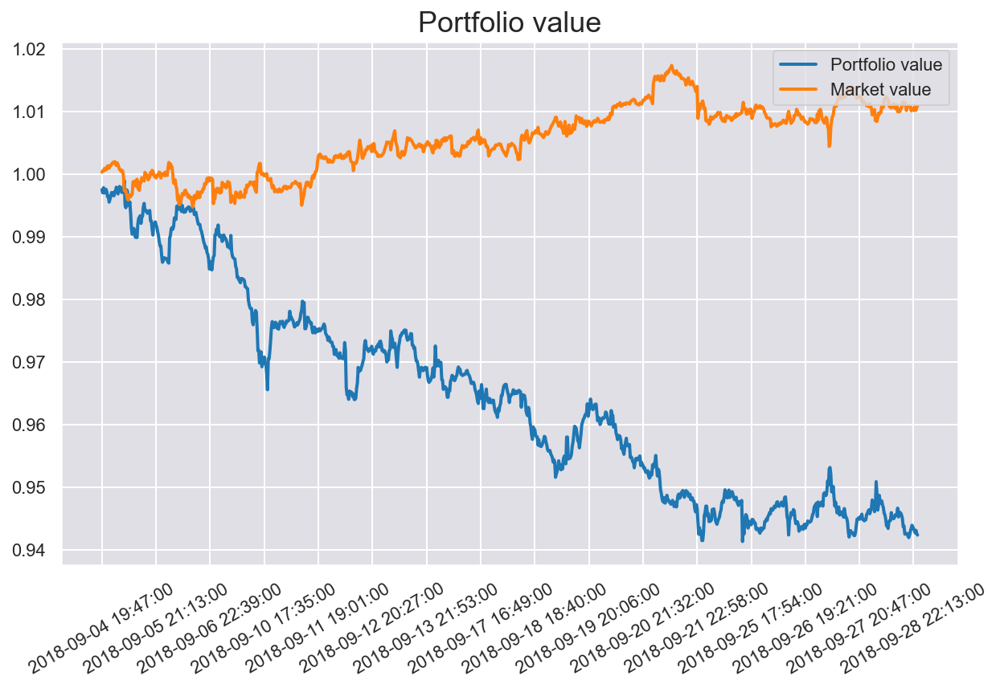

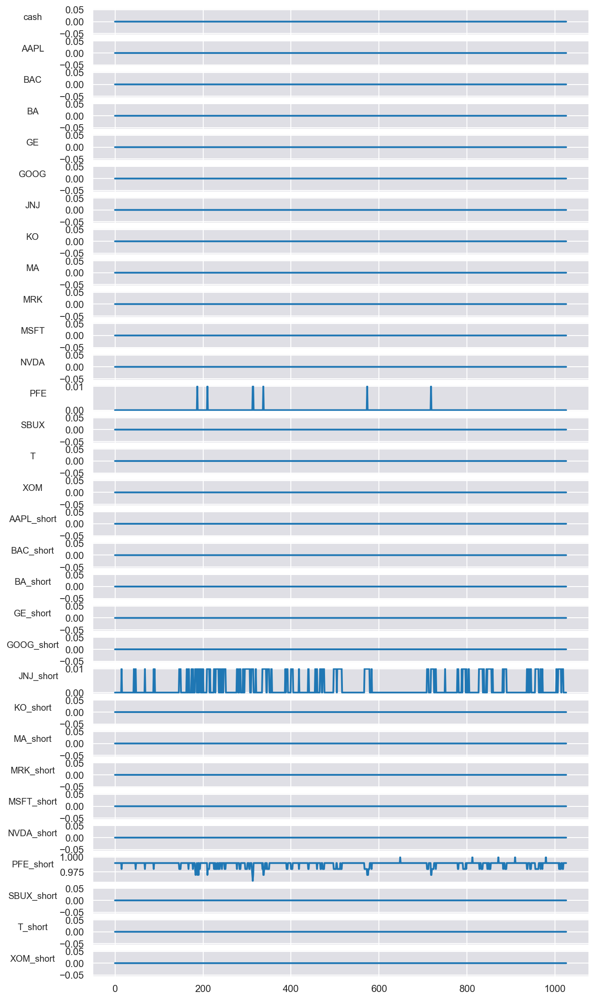

In [50]:
tf.reset_default_graph()
sess = tf.Session()
tflearn.config.init_training_mode()
action_dim = [nb_classes*2 + 1]
state_dim = [nb_classes + 1, window_length, 3]
variable_scope = get_variable_scope(window_length, predictor_type, use_batch_norm)
with tf.variable_scope(variable_scope):
    actor = StockActor(sess, state_dim, action_dim, action_bound, 1e-4, tau, batch_size, predictor_type, 
                       use_batch_norm)
    critic = StockCritic(sess=sess, state_dim=state_dim, action_dim=action_dim, tau=1e-3,
                         learning_rate=1e-3, num_actor_vars=actor.get_num_trainable_vars(), 
                         predictor_type=predictor_type, use_batch_norm=use_batch_norm)
    actor_noise = OrnsteinUhlenbeckActionNoise(mu=np.zeros(action_dim))

    model_save_path = "weights/"
    summary_path = get_result_path(window_length, predictor_type, use_batch_norm)

    ddpg_model = DDPG(environ, sess, actor, critic, actor_noise,param, obs_normalizer=obs_normalizer, model_save_path=model_save_path,
                      summary_path=summary_path)
    ddpg_model.initialize(load_weights=False, verbose=False)
    ddpg_model.train()

env_Sep = PortfolioEnv(history_Sep, abbreviation, steps=history_Sep.shape[1]-200, window_length=window_length,
                   start_idx=data['Sep'].date_index.iloc[0])
test_model(env_Sep, ddpg_model)
plot_weights(env_Sep.infos)

Build model from scratch
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
1500
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 0, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field ty

c:\users\lenovo\appdata\local\programs\python\python39\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


Episode: 2, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 3, Reward: 1.00, Qmax: 0.0002
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 4, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0

Episode: 25, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 26, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 27, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 48, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 49, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 50, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 71, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 72, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 73, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 94, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 95, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 96, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.0

Episode: 116, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 117, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 118, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 139, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 140, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 141, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 162, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 163, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 164, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 185, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 186, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 187, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 207, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 208, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 209, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 230, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 231, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 232, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 253, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 254, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 255, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 276, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 277, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 278, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 299, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 300, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 

Episode: 321, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 322, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 323, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 344, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 345, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 346, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 367, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 368, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 369, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 390, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 391, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 392, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 412, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 413, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 414, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 435, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 436, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 437, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 458, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
Episode: 459, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03
 0.03 0.03 0.03]
Episode: 460, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 

Episode: 481, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 482, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 483, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.03 0.03
 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.03 

Episode: 503, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.03 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 504, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
Episode: 505, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.03 0.03 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.03]
[0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.03 

Episode: 526, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.04]
Episode: 527, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.04]
Episode: 528, Reward: 1.00, Qmax: 0.0000
[0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.04]
[0.03 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.04 

Episode: 549, Reward: 1.00, Qmax: 0.0000
[0.02 0.02 0.03 0.03 0.03 0.03 0.04 0.03 0.02 0.04 0.03 0.03 0.04 0.02
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.02 0.03 0.04]
[0.02 0.02 0.03 0.03 0.03 0.03 0.04 0.03 0.02 0.04 0.03 0.03 0.04 0.02
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.04 0.02 0.03 0.03 0.03 0.04 0.04
 0.02 0.03 0.04]
Episode: 550, Reward: 1.00, Qmax: 0.0000
[0.02 0.02 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.02
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.02 0.03 0.04]
[0.02 0.03 0.03 0.03 0.03 0.03 0.04 0.03 0.03 0.04 0.03 0.03 0.04 0.03
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.04 0.03 0.03 0.03 0.03 0.04 0.04
 0.03 0.03 0.04]
Episode: 551, Reward: 1.00, Qmax: 0.0000
[0.02 0.02 0.03 0.03 0.03 0.03 0.04 0.03 0.02 0.04 0.02 0.03 0.04 0.02
 0.03 0.04 0.03 0.04 0.04 0.04 0.03 0.04 0.02 0.03 0.03 0.03 0.04 0.04
 0.02 0.03 0.04]
[0.02 0.02 0.03 0.03 0.03 0.03 0.04 0.03 0.02 0.04 0.03 0.03 0.04 0.02
 0.03 0.04 

Episode: 572, Reward: 1.00, Qmax: 0.0000
[0.01 0.02 0.03 0.02 0.02 0.03 0.04 0.03 0.02 0.05 0.02 0.02 0.05 0.02
 0.02 0.04 0.03 0.04 0.06 0.05 0.02 0.05 0.02 0.03 0.02 0.03 0.05 0.05
 0.02 0.02 0.05]
[0.02 0.02 0.03 0.02 0.03 0.03 0.04 0.03 0.02 0.05 0.02 0.02 0.05 0.02
 0.02 0.04 0.03 0.04 0.05 0.05 0.02 0.05 0.02 0.03 0.02 0.03 0.05 0.05
 0.02 0.02 0.04]
Episode: 573, Reward: 1.00, Qmax: 0.0000
[0.01 0.02 0.03 0.02 0.02 0.03 0.05 0.03 0.02 0.05 0.02 0.02 0.05 0.02
 0.02 0.04 0.03 0.04 0.06 0.05 0.02 0.05 0.02 0.03 0.02 0.03 0.06 0.06
 0.02 0.02 0.05]
[0.02 0.02 0.03 0.02 0.03 0.03 0.04 0.03 0.02 0.05 0.02 0.02 0.05 0.02
 0.02 0.04 0.03 0.04 0.05 0.05 0.02 0.05 0.02 0.03 0.02 0.03 0.05 0.05
 0.02 0.02 0.04]
Episode: 574, Reward: 1.00, Qmax: 0.0000
[0.01 0.02 0.03 0.02 0.02 0.03 0.05 0.03 0.02 0.05 0.02 0.02 0.05 0.02
 0.02 0.04 0.03 0.04 0.06 0.05 0.02 0.05 0.02 0.03 0.02 0.03 0.06 0.06
 0.02 0.02 0.05]
[0.02 0.02 0.03 0.02 0.03 0.03 0.04 0.03 0.02 0.05 0.02 0.02 0.05 0.02
 0.02 0.04 

Episode: 595, Reward: 1.00, Qmax: 0.0000
[0.   0.   0.01 0.01 0.01 0.03 0.05 0.01 0.   0.06 0.01 0.01 0.08 0.
 0.01 0.04 0.01 0.04 0.11 0.09 0.01 0.08 0.01 0.02 0.01 0.01 0.1  0.11
 0.   0.01 0.06]
[0.   0.   0.01 0.01 0.01 0.03 0.05 0.01 0.   0.06 0.01 0.01 0.08 0.
 0.01 0.04 0.01 0.04 0.11 0.09 0.01 0.08 0.01 0.02 0.01 0.01 0.1  0.11
 0.   0.01 0.06]
Episode: 596, Reward: 1.00, Qmax: 0.0000
[0.   0.   0.01 0.01 0.01 0.03 0.05 0.01 0.   0.05 0.   0.01 0.08 0.
 0.   0.04 0.01 0.04 0.12 0.09 0.01 0.08 0.   0.02 0.01 0.01 0.1  0.11
 0.   0.01 0.06]
[0.   0.   0.01 0.01 0.01 0.03 0.05 0.01 0.   0.05 0.   0.01 0.08 0.
 0.01 0.04 0.01 0.04 0.12 0.09 0.01 0.08 0.   0.02 0.01 0.01 0.1  0.11
 0.   0.01 0.06]
Episode: 597, Reward: 1.00, Qmax: 0.0000
[0.   0.   0.01 0.01 0.01 0.02 0.05 0.01 0.   0.05 0.   0.01 0.09 0.
 0.   0.04 0.01 0.04 0.12 0.09 0.01 0.09 0.   0.01 0.01 0.01 0.11 0.12
 0.   0.   0.06]
[0.   0.   0.01 0.01 0.01 0.03 0.05 0.01 0.   0.05 0.   0.01 0.08 0.
 0.01 0.04 0.01 0.04 0.

Episode: 616, Reward: 1.00, Qmax: 0.0000
[0.   0.   0.   0.   0.   0.01 0.02 0.   0.   0.03 0.   0.   0.1  0.
 0.   0.02 0.   0.02 0.2  0.12 0.   0.09 0.   0.   0.   0.   0.14 0.18
 0.   0.   0.03]
[1.26e-04 2.52e-04 1.61e-03 7.78e-04 1.09e-03 9.66e-03 1.81e-02 2.08e-03
 3.30e-04 2.18e-02 4.02e-04 9.18e-04 9.81e-02 2.68e-04 4.78e-04 1.41e-02
 1.22e-03 1.37e-02 2.23e-01 1.20e-01 8.38e-04 9.22e-02 3.83e-04 2.71e-03
 1.05e-03 2.08e-03 1.46e-01 1.97e-01 2.75e-04 4.85e-04 2.86e-02]
Episode: 617, Reward: 1.00, Qmax: 0.0000
[9.64e-05 1.98e-04 1.34e-03 6.35e-04 8.97e-04 8.64e-03 1.63e-02 1.76e-03
 2.61e-04 1.98e-02 3.21e-04 7.53e-04 9.66e-02 2.11e-04 3.84e-04 1.26e-02
 1.01e-03 1.22e-02 2.33e-01 1.20e-01 6.86e-04 9.00e-02 3.05e-04 2.30e-03
 8.68e-04 1.75e-03 1.46e-01 2.04e-01 2.17e-04 3.90e-04 2.63e-02]
[6.05e-05 1.30e-04 1.00e-03 4.51e-04 6.51e-04 7.28e-03 1.43e-02 1.33e-03
 1.75e-04 1.75e-02 2.18e-04 5.41e-04 9.51e-02 1.39e-04 2.64e-04 1.09e-02
 7.38e-04 1.05e-02 2.43e-01 1.20e-01 4.89e-04 8

Episode: 630, Reward: 1.00, Qmax: 0.0000
[3.38e-05 7.48e-05 5.91e-04 2.66e-04 3.88e-04 4.57e-03 7.92e-03 7.90e-04
 1.01e-04 9.76e-03 1.27e-04 3.21e-04 7.03e-02 8.03e-05 1.55e-04 6.10e-03
 4.38e-04 6.02e-03 3.34e-01 1.10e-01 2.90e-04 6.24e-02 1.20e-04 1.04e-03
 3.71e-04 7.80e-04 1.10e-01 2.60e-01 8.29e-05 1.58e-04 1.34e-02]
[8.68e-05 1.76e-04 1.10e-03 5.43e-04 7.56e-04 6.75e-03 1.10e-02 1.42e-03
 2.30e-04 1.33e-02 2.81e-04 6.39e-04 7.65e-02 1.87e-04 3.34e-04 8.75e-03
 8.45e-04 8.65e-03 3.05e-01 1.14e-01 5.86e-04 6.89e-02 2.67e-04 1.82e-03
 7.26e-04 1.41e-03 1.14e-01 2.44e-01 1.92e-04 3.40e-04 1.76e-02]
Episode: 631, Reward: 1.00, Qmax: 0.0000
[5.99e-05 1.25e-04 8.55e-04 4.09e-04 5.79e-04 5.71e-03 9.48e-03 1.12e-03
 1.66e-04 1.15e-02 2.05e-04 4.85e-04 7.25e-02 1.34e-04 2.46e-04 7.44e-03
 6.49e-04 7.36e-03 3.23e-01 1.11e-01 4.42e-04 6.47e-02 1.95e-04 1.45e-03
 5.54e-04 1.11e-03 1.09e-01 2.53e-01 1.38e-04 2.51e-04 1.54e-02]
[1.30e-04 2.53e-04 1.42e-03 7.33e-04 1.00e-03 7.85e-03 1.24e-02 1.

Episode: 644, Reward: 1.00, Qmax: 0.0000
[5.91e-06 1.50e-05 1.64e-04 6.58e-05 1.02e-04 1.73e-03 2.93e-03 2.28e-04
 2.15e-05 3.71e-03 2.78e-05 8.16e-05 3.97e-02 1.63e-05 3.51e-05 2.21e-03
 1.16e-04 2.19e-03 4.80e-01 7.13e-02 7.27e-05 3.23e-02 2.62e-05 3.11e-04
 9.60e-05 2.25e-04 5.88e-02 2.98e-01 1.70e-05 3.60e-05 5.25e-03]
[1.97e-05 4.50e-05 3.75e-04 1.67e-04 2.45e-04 3.01e-03 4.82e-03 5.01e-04
 6.17e-05 5.94e-03 7.77e-05 2.02e-04 4.84e-02 4.84e-05 9.53e-05 3.75e-03
 2.77e-04 3.73e-03 4.40e-01 8.13e-02 1.82e-04 4.04e-02 7.36e-05 6.62e-04
 2.33e-04 4.95e-04 6.85e-02 2.88e-01 5.01e-05 9.76e-05 8.07e-03]
Episode: 645, Reward: 1.00, Qmax: 0.0000
[7.84e-07 2.36e-06 4.05e-05 1.37e-05 2.29e-05 6.63e-04 1.22e-03 5.96e-05
 3.62e-06 1.61e-03 4.90e-06 1.76e-05 2.68e-02 2.61e-06 6.51e-06 8.72e-04
 2.67e-05 8.65e-04 5.45e-01 5.36e-02 1.54e-05 2.10e-02 4.59e-06 8.59e-05
 2.14e-05 5.85e-05 4.24e-02 3.03e-01 2.74e-06 6.70e-06 2.43e-03]
[1.16e-06 3.37e-06 5.30e-05 1.85e-05 3.05e-05 7.96e-04 1.44e-03 7.

Episode: 658, Reward: 1.00, Qmax: 0.0000
[2.45e-06 6.57e-06 8.20e-05 3.13e-05 4.96e-05 9.46e-04 1.56e-03 1.15e-04
 9.60e-06 1.96e-03 1.26e-05 3.93e-05 2.14e-02 7.18e-06 1.62e-05 1.16e-03
 5.70e-05 1.16e-03 6.09e-01 3.92e-02 3.47e-05 1.78e-02 1.19e-05 1.59e-04
 4.66e-05 1.13e-04 3.01e-02 2.72e-01 7.49e-06 1.66e-05 2.80e-03]
[6.54e-07 1.96e-06 3.24e-05 1.11e-05 1.85e-05 4.91e-04 8.49e-04 4.70e-05
 2.99e-06 1.10e-03 4.04e-06 1.43e-05 1.57e-02 2.16e-06 5.34e-06 6.16e-04
 2.15e-05 6.15e-04 6.47e-01 3.07e-02 1.25e-05 1.28e-02 3.79e-06 6.72e-05
 1.73e-05 4.63e-05 2.29e-02 2.65e-01 2.27e-06 5.51e-06 1.63e-03]
Episode: 659, Reward: 1.00, Qmax: 0.0000
[5.42e-07 1.65e-06 2.82e-05 9.55e-06 1.60e-05 4.41e-04 7.65e-04 4.11e-05
 2.53e-06 9.91e-04 3.43e-06 1.23e-05 1.45e-02 1.82e-06 4.55e-06 5.53e-04
 1.86e-05 5.52e-04 6.58e-01 2.86e-02 1.07e-05 1.18e-02 3.21e-06 5.90e-05
 1.49e-05 4.05e-05 2.12e-02 2.61e-01 1.91e-06 4.69e-06 1.48e-03]
[9.38e-07 2.72e-06 4.15e-05 1.47e-05 2.41e-05 5.81e-04 9.87e-04 5.

Episode: 672, Reward: 1.00, Qmax: 0.0000
[7.34e-07 2.15e-06 3.32e-05 1.17e-05 1.93e-05 4.59e-04 7.60e-04 4.76e-05
 3.25e-06 9.64e-04 4.37e-06 1.50e-05 1.19e-02 2.37e-06 5.72e-06 5.59e-04
 2.23e-05 5.61e-04 6.85e-01 2.22e-02 1.31e-05 1.02e-02 4.09e-06 6.73e-05
 1.80e-05 4.69e-05 1.63e-02 2.50e-01 2.48e-06 5.91e-06 1.42e-03]
[1.43e-07 4.76e-07 1.03e-05 3.20e-06 5.60e-06 1.97e-04 3.47e-04 1.54e-05
 7.58e-07 4.52e-04 1.06e-06 4.23e-06 7.61e-03 5.31e-07 1.43e-06 2.45e-04
 6.58e-06 2.46e-04 7.24e-01 1.54e-02 3.62e-06 6.41e-03 9.84e-07 2.27e-05
 5.19e-06 1.52e-05 1.09e-02 2.33e-01 5.59e-07 1.49e-06 6.99e-04]
Episode: 673, Reward: 1.00, Qmax: 0.0000
[8.68e-08 3.01e-07 7.21e-06 2.15e-06 3.84e-06 1.52e-04 2.70e-04 1.09e-05
 4.87e-07 3.56e-04 6.85e-07 2.87e-06 6.54e-03 3.37e-07 9.42e-07 1.89e-04
 4.53e-06 1.90e-04 7.36e-01 1.35e-02 2.45e-06 5.49e-03 6.38e-07 1.63e-05
 3.55e-06 1.07e-05 9.41e-03 2.28e-01 3.56e-07 9.76e-07 5.58e-04]
[3.93e-07 1.21e-06 2.12e-05 7.12e-06 1.20e-05 3.31e-04 5.59e-04 3.

Episode: 686, Reward: 1.00, Qmax: 0.0000
[1.84e-07 5.97e-07 1.20e-05 3.84e-06 6.63e-06 2.12e-04 3.60e-04 1.78e-05
 9.41e-07 4.64e-04 1.30e-06 5.04e-06 7.05e-03 6.64e-07 1.75e-06 2.58e-04
 7.77e-06 2.60e-04 7.06e-01 1.37e-02 4.33e-06 6.13e-03 1.21e-06 2.60e-05
 6.16e-06 1.75e-05 9.62e-03 2.55e-01 6.99e-07 1.82e-06 7.14e-04]
[2.88e-07 9.02e-07 1.66e-05 5.48e-06 9.31e-06 2.67e-04 4.48e-04 2.42e-05
 1.40e-06 5.72e-04 1.92e-06 7.14e-06 8.00e-03 1.00e-06 2.56e-06 3.23e-04
 1.09e-05 3.27e-04 6.96e-01 1.52e-02 6.16e-06 6.99e-03 1.79e-06 3.50e-05
 8.66e-06 2.39e-05 1.08e-02 2.60e-01 1.05e-06 2.65e-06 8.69e-04]
Episode: 687, Reward: 1.00, Qmax: 0.0000
[3.94e-07 1.20e-06 2.07e-05 7.03e-06 1.18e-05 3.14e-04 5.20e-04 3.01e-05
 1.85e-06 6.61e-04 2.52e-06 9.10e-06 8.70e-03 1.33e-06 3.34e-06 3.79e-04
 1.37e-05 3.83e-04 6.88e-01 1.63e-02 7.89e-06 7.63e-03 2.36e-06 4.31e-05
 1.10e-05 2.96e-05 1.17e-02 2.64e-01 1.40e-06 3.46e-06 9.94e-04]
[5.35e-08 1.92e-07 4.96e-06 1.44e-06 2.60e-06 1.11e-04 1.96e-04 7.

Episode: 700, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[1.04e-06 2.94e-06 4.11e-05 1.51e-05 2.44e-05 5.08e-04 8.01e-04 5.80e-05
 4.39e-06 9.96e-04 5.84e-06 1.92e-05 1.08e-02 3.23e-06 7.57e-06 5.97e-04
 2.82e-05 6.06e-04 6.19e-01 1.91e-02 1.68e-05 9.69e-03 5.48e-06 8.11e-05
 2.28e-05 5.72e-05 1.38e-02 3.22e-01 3.38e-06 7.82e-06 1.46e-03]
[3.64e-07 1.12e-06 1.94e-05 6.55e-06 1.10e-05 2.94e-04 4.80e-04 2.81e-05
 1.72e-06 6.07e-04 2.34e-06 8.49e-06 8.00e-03 1.24e-06 3.11e-06 3.49e-04
 1.28e-05 3.55e-04 6.41e-01 1.48e-02 7.35e-06 7.12e-03 2.19e-06 4.03e-05
 1.03e-05 2.77e-05 1.04e-02 3.16e-01 1.30e-06 3.22e-06 9.20e-04]
Episode: 701, Reward: 1.00,

Episode: 713, Reward: 1.00, Qmax: 0.0000
[7.34e-08 2.55e-07 6.08e-06 1.82e-06 3.24e-06 1.24e-04 2.10e-04 9.16e-06
 4.13e-07 2.72e-04 5.81e-07 2.43e-06 4.74e-03 2.86e-07 7.98e-07 1.48e-04
 3.83e-06 1.51e-04 5.16e-01 9.22e-03 2.07e-06 4.27e-03 5.40e-07 1.36e-05
 3.00e-06 9.00e-06 6.24e-03 4.58e-01 3.02e-07 8.28e-07 4.34e-04]
[3.56e-08 1.31e-07 3.62e-06 1.02e-06 1.87e-06 8.50e-05 1.47e-04 5.56e-06
 2.17e-07 1.93e-04 3.10e-07 1.39e-06 3.84e-03 1.47e-07 4.32e-07 1.02e-04
 2.23e-06 1.04e-04 5.20e-01 7.70e-03 1.17e-06 3.44e-03 2.87e-07 8.41e-06
 1.73e-06 5.45e-06 5.12e-03 4.59e-01 1.56e-07 4.49e-07 3.14e-04]
Episode: 714, Reward: 1.00, Qmax: 0.0000
[9.04e-08 3.09e-07 7.04e-06 2.15e-06 3.79e-06 1.38e-04 2.32e-04 1.06e-05
 4.97e-07 2.98e-04 6.95e-07 2.85e-06 4.99e-03 3.45e-07 9.50e-07 1.64e-04
 4.47e-06 1.67e-04 4.96e-01 9.60e-03 2.43e-06 4.52e-03 6.47e-07 1.56e-05
 3.51e-06 1.04e-05 6.55e-03 4.77e-01 3.64e-07 9.86e-07 4.72e-04]
[6.06e-08 2.14e-07 5.29e-06 1.56e-06 2.80e-06 1.12e-04 1.90e-04 8.

Episode: 727, Reward: 1.00, Qmax: 0.0000
[1.02e-08 4.04e-08 1.35e-06 3.55e-07 6.73e-07 3.76e-05 6.63e-05 2.12e-06
 6.88e-08 8.77e-05 1.00e-07 4.89e-07 2.06e-03 4.58e-08 1.43e-07 4.53e-05
 8.07e-07 4.64e-05 2.14e-01 4.01e-03 4.09e-07 1.92e-03 9.27e-08 3.28e-06
 6.18e-07 2.08e-06 2.74e-03 7.75e-01 4.86e-08 1.49e-07 1.47e-04]
[8.27e-08 2.79e-07 6.17e-06 1.90e-06 3.34e-06 1.16e-04 1.92e-04 9.20e-06
 4.47e-07 2.46e-04 6.24e-07 2.52e-06 3.97e-03 3.12e-07 8.50e-07 1.37e-04
 3.93e-06 1.40e-04 2.38e-01 7.15e-03 2.16e-06 3.74e-03 5.81e-07 1.36e-05
 3.09e-06 9.05e-06 5.10e-03 7.41e-01 3.29e-07 8.82e-07 3.88e-04]
Episode: 728, Reward: 1.00, Qmax: 0.0000
[2.60e-07 8.02e-07 1.40e-05 4.73e-06 7.96e-06 2.11e-04 3.37e-04 2.03e-05
 1.24e-06 4.24e-04 1.69e-06 6.14e-06 5.53e-03 8.88e-07 2.24e-06 2.47e-04
 9.28e-06 2.53e-04 2.35e-01 9.48e-03 5.31e-06 5.27e-03 1.58e-06 2.91e-05
 7.42e-06 2.00e-05 6.98e-03 7.36e-01 9.34e-07 2.32e-06 6.45e-04]
[1.27e-07 4.14e-07 8.36e-06 2.67e-06 4.61e-06 1.44e-04 2.35e-04 1.

Episode: 741, Reward: 1.00, Qmax: 0.0000
[1.26e-09 5.55e-09 2.41e-07 5.74e-08 1.14e-07 8.46e-06 1.52e-05 3.90e-07
 9.85e-09 2.05e-05 1.48e-08 8.12e-08 5.62e-04 6.35e-09 2.16e-08 1.02e-05
 1.38e-07 1.05e-05 4.28e-02 1.02e-03 6.69e-08 5.88e-04 1.36e-08 6.21e-07
 1.04e-07 3.83e-07 7.91e-04 9.54e-01 6.79e-09 2.26e-08 3.55e-05]
[1.51e-09 6.54e-09 2.75e-07 6.63e-08 1.31e-07 9.35e-06 1.67e-05 4.43e-07
 1.16e-08 2.25e-05 1.73e-08 9.36e-08 5.99e-04 7.49e-09 2.52e-08 1.13e-05
 1.58e-07 1.16e-05 4.39e-02 1.08e-03 7.72e-08 6.27e-04 1.59e-08 7.03e-07
 1.20e-07 4.36e-07 8.41e-04 9.53e-01 7.99e-09 2.64e-08 3.88e-05]
Episode: 742, Reward: 1.00, Qmax: 0.0000
[7.07e-08 2.31e-07 4.70e-06 1.50e-06 2.59e-06 8.03e-05 1.29e-04 6.91e-06
 3.66e-07 1.64e-04 5.07e-07 1.97e-06 2.29e-03 2.58e-07 6.83e-07 9.43e-05
 3.03e-06 9.65e-05 7.08e-02 3.67e-03 1.69e-06 2.40e-03 4.72e-07 1.01e-05
 2.40e-06 6.82e-06 3.02e-03 9.17e-01 2.72e-07 7.10e-07 2.54e-04]
[4.10e-08 1.40e-07 3.14e-06 9.62e-07 1.69e-06 5.91e-05 9.67e-05 4.

Episode: 755, Reward: 1.00, Qmax: 0.0000
[3.20e-10 1.49e-09 7.48e-08 1.69e-08 3.45e-08 2.98e-06 5.39e-06 1.23e-07
 2.72e-09 7.34e-06 4.15e-09 2.43e-08 2.11e-04 1.72e-09 6.14e-09 3.61e-06
 4.19e-08 3.71e-06 1.26e-02 3.62e-04 1.98e-08 2.43e-04 3.80e-09 1.99e-07
 3.14e-08 1.21e-07 3.15e-04 9.86e-01 1.85e-09 6.45e-09 1.29e-05]
[2.73e-09 1.09e-08 3.73e-07 9.74e-08 1.85e-07 1.03e-05 1.77e-05 5.84e-07
 1.87e-08 2.34e-05 2.75e-08 1.35e-07 4.81e-04 1.24e-08 3.91e-08 1.23e-05
 2.22e-07 1.26e-05 1.92e-02 7.85e-04 1.12e-07 5.47e-04 2.53e-08 9.04e-07
 1.70e-07 5.77e-07 6.90e-04 9.78e-01 1.32e-08 4.09e-08 3.88e-05]
Episode: 756, Reward: 1.00, Qmax: 0.0000
[6.11e-10 2.72e-09 1.21e-07 2.85e-08 5.70e-08 4.29e-06 7.62e-06 1.95e-07
 4.85e-09 1.03e-05 7.32e-09 4.06e-08 2.65e-04 3.12e-09 1.07e-08 5.17e-06
 6.89e-08 5.31e-06 1.37e-02 4.46e-04 3.33e-08 3.05e-04 6.71e-09 3.12e-07
 5.20e-08 1.93e-07 3.91e-04 9.85e-01 3.34e-09 1.12e-08 1.78e-05]
[5.90e-09 2.24e-08 6.61e-07 1.83e-07 3.38e-07 1.60e-05 2.68e-05 1.

Episode: 769, Reward: 1.00, Qmax: 0.0000
[1.71e-09 7.00e-09 2.49e-07 6.40e-08 1.23e-07 7.14e-06 1.22e-05 3.92e-07
 1.21e-08 1.62e-05 1.78e-08 8.93e-08 3.35e-04 7.96e-09 2.54e-08 8.53e-06
 1.47e-07 8.76e-06 1.20e-02 5.34e-04 7.40e-08 3.96e-04 1.64e-08 6.09e-07
 1.13e-07 3.87e-07 4.94e-04 9.86e-01 8.49e-09 2.66e-08 2.71e-05]
[4.99e-10 2.22e-09 9.83e-08 2.33e-08 4.64e-08 3.47e-06 6.13e-06 1.59e-07
 3.96e-09 8.27e-06 5.98e-09 3.31e-08 2.05e-04 2.55e-09 8.73e-09 4.18e-06
 5.61e-08 4.29e-06 9.21e-03 3.37e-04 2.72e-08 2.45e-04 5.48e-09 2.54e-07
 4.24e-08 1.57e-07 3.10e-04 9.90e-01 2.73e-09 9.16e-09 1.42e-05]
Episode: 770, Reward: 1.00, Qmax: -0.0000
[1.22e-10 5.98e-10 3.39e-08 7.31e-09 1.53e-08 1.51e-06 2.77e-06 5.66e-08
 1.11e-09 3.81e-06 1.72e-09 1.07e-08 1.17e-04 6.93e-10 2.57e-09 1.84e-06
 1.86e-08 1.89e-06 6.68e-03 1.98e-04 8.62e-09 1.41e-04 1.57e-09 9.30e-08
 1.39e-08 5.59e-08 1.81e-04 9.93e-01 7.45e-10 2.71e-09 6.80e-06]
[3.52e-11 1.88e-10 1.33e-08 2.64e-09 5.73e-09 7.31e-07 1.38e-06 2

Episode: 783, Reward: 1.00, Qmax: 0.0000
[5.25e-10 2.32e-09 1.00e-07 2.40e-08 4.76e-08 3.47e-06 6.09e-06 1.62e-07
 4.12e-09 8.21e-06 6.21e-09 3.40e-08 2.00e-04 2.66e-09 9.03e-09 4.17e-06
 5.74e-08 4.28e-06 8.27e-03 3.24e-04 2.79e-08 2.39e-04 5.69e-09 2.57e-07
 4.35e-08 1.60e-07 3.01e-04 9.91e-01 2.84e-09 9.48e-09 1.41e-05]
[4.39e-11 2.30e-10 1.54e-08 3.12e-09 6.72e-09 8.07e-07 1.51e-06 2.63e-08
 4.38e-10 2.10e-06 6.91e-10 4.62e-09 7.42e-05 2.68e-10 1.05e-09 9.86e-07
 8.25e-09 1.02e-06 4.75e-03 1.27e-04 3.70e-09 9.08e-05 6.28e-10 4.40e-08
 6.08e-09 2.60e-08 1.17e-04 9.95e-01 2.89e-10 1.11e-09 3.84e-06]
Episode: 784, Reward: 1.00, Qmax: 0.0000
[6.92e-11 3.51e-10 2.17e-08 4.53e-09 9.62e-09 1.05e-06 1.94e-06 3.67e-08
 6.61e-10 2.69e-06 1.03e-09 6.66e-09 8.88e-05 4.08e-10 1.56e-09 1.28e-06
 1.18e-08 1.32e-06 5.23e-03 1.51e-04 5.36e-09 1.08e-04 9.41e-10 6.08e-08
 8.72e-09 3.62e-08 1.39e-04 9.94e-01 4.40e-10 1.65e-09 4.87e-06]
[4.56e-11 2.38e-10 1.59e-08 3.21e-09 6.92e-09 8.24e-07 1.54e-06 2.

Episode: 797, Reward: 1.00, Qmax: 0.0000
[3.16e-10 1.44e-09 6.80e-08 1.57e-08 3.17e-08 2.55e-06 4.53e-06 1.11e-07
 2.60e-09 6.14e-06 3.95e-09 2.25e-08 1.62e-04 1.66e-09 5.80e-09 3.07e-06
 3.84e-08 3.16e-06 7.11e-03 2.66e-04 1.84e-08 1.94e-04 3.62e-09 1.78e-07
 2.90e-08 1.10e-07 2.45e-04 9.92e-01 1.78e-09 6.10e-09 1.07e-05]
[2.27e-11 1.24e-10 9.35e-09 1.81e-09 3.98e-09 5.44e-07 1.03e-06 1.62e-08
 2.41e-10 1.45e-06 3.85e-10 2.71e-09 5.68e-05 1.46e-10 5.94e-10 6.66e-07
 4.91e-09 6.87e-07 3.93e-03 9.87e-05 2.16e-09 6.95e-05 3.49e-10 2.74e-08
 3.59e-09 1.59e-08 9.02e-05 9.96e-01 1.58e-10 6.27e-10 2.69e-06]
Episode: 798, Reward: 1.00, Qmax: 0.0000
[2.20e-10 1.03e-09 5.18e-08 1.17e-08 2.39e-08 2.06e-06 3.69e-06 8.51e-08
 1.87e-09 5.03e-06 2.87e-09 1.68e-08 1.40e-04 1.19e-09 4.24e-09 2.49e-06
 2.89e-08 2.56e-06 6.54e-03 2.32e-04 1.37e-08 1.69e-04 2.62e-09 1.38e-07
 2.17e-08 8.41e-08 2.14e-04 9.93e-01 1.27e-09 4.46e-09 8.84e-06]
[5.85e-10 2.56e-09 1.08e-07 2.61e-08 5.16e-08 3.66e-06 6.41e-06 1.

Episode: 810, Reward: 1.00, Qmax: 0.0000
[4.53e-11 2.36e-10 1.57e-08 3.18e-09 6.84e-09 8.10e-07 1.51e-06 2.66e-08
 4.49e-10 2.10e-06 7.08e-10 4.71e-09 7.45e-05 2.75e-10 1.08e-09 9.87e-07
 8.39e-09 1.02e-06 4.45e-03 1.27e-04 3.77e-09 9.03e-05 6.43e-10 4.45e-08
 6.19e-09 2.63e-08 1.16e-04 9.95e-01 2.97e-10 1.14e-09 3.83e-06]
[7.90e-11 3.96e-10 2.38e-08 5.02e-09 1.06e-08 1.12e-06 2.06e-06 4.00e-08
 7.42e-10 2.84e-06 1.16e-09 7.36e-09 9.28e-05 4.60e-10 1.74e-09 1.36e-06
 1.30e-08 1.40e-06 5.04e-03 1.57e-04 5.93e-09 1.12e-04 1.05e-09 6.61e-08
 9.61e-09 3.95e-08 1.44e-04 9.94e-01 4.96e-10 1.84e-09 5.12e-06]
Episode: 811, Reward: 1.00, Qmax: 0.0000
[1.80e-11 1.00e-10 7.81e-09 1.49e-09 3.30e-09 4.71e-07 8.94e-07 1.35e-08
 1.95e-10 1.26e-06 3.13e-10 2.24e-09 5.15e-05 1.17e-10 4.84e-10 5.77e-07
 4.08e-09 5.95e-07 3.60e-03 8.97e-05 1.78e-09 6.29e-05 2.83e-10 2.31e-08
 2.97e-09 1.34e-08 8.19e-05 9.96e-01 1.27e-10 5.12e-10 2.36e-06]
[2.95e-11 1.59e-10 1.13e-08 2.24e-09 4.88e-09 6.29e-07 1.18e-06 1.

Episode: 824, Reward: 1.00, Qmax: 0.0000
[6.34e-10 2.75e-09 1.14e-07 2.77e-08 5.47e-08 3.81e-06 6.63e-06 1.83e-07
 4.87e-09 8.90e-06 7.30e-09 3.93e-08 2.14e-04 3.15e-09 1.06e-08 4.55e-06
 6.59e-08 4.68e-06 7.97e-03 3.45e-04 3.23e-08 2.53e-04 6.70e-09 2.90e-07
 5.01e-08 1.81e-07 3.17e-04 9.91e-01 3.37e-09 1.11e-08 1.52e-05]
[4.28e-11 2.24e-10 1.50e-08 3.03e-09 6.52e-09 7.81e-07 1.45e-06 2.55e-08
 4.26e-10 2.02e-06 6.71e-10 4.48e-09 7.32e-05 2.61e-10 1.02e-09 9.51e-07
 8.00e-09 9.80e-07 4.32e-03 1.25e-04 3.59e-09 8.84e-05 6.10e-10 4.26e-08
 5.90e-09 2.51e-08 1.14e-04 9.95e-01 2.81e-10 1.08e-09 3.70e-06]
Episode: 825, Reward: 1.00, Qmax: 0.0000
[8.31e-10 3.54e-09 1.40e-07 3.46e-08 6.77e-08 4.46e-06 7.72e-06 2.24e-07
 6.21e-09 1.03e-05 9.27e-09 4.88e-08 2.39e-04 4.04e-09 1.34e-08 5.33e-06
 8.13e-08 5.48e-06 8.47e-03 3.82e-04 4.02e-08 2.82e-04 8.51e-09 3.52e-07
 6.20e-08 2.21e-07 3.52e-04 9.90e-01 4.32e-09 1.40e-08 1.75e-05]
[3.07e-10 1.40e-09 6.62e-08 1.53e-08 3.09e-08 2.49e-06 4.41e-06 1.

Episode: 838, Reward: 1.00, Qmax: 0.0000
[1.95e-11 1.08e-10 8.28e-09 1.59e-09 3.51e-09 4.92e-07 9.31e-07 1.43e-08
 2.10e-10 1.31e-06 3.35e-10 2.38e-09 5.42e-05 1.26e-10 5.18e-10 6.02e-07
 4.33e-09 6.21e-07 3.57e-03 9.37e-05 1.90e-09 6.52e-05 3.04e-10 2.44e-08
 3.16e-09 1.41e-08 8.47e-05 9.96e-01 1.37e-10 5.48e-10 2.45e-06]
[3.49e-11 1.85e-10 1.28e-08 2.56e-09 5.54e-09 6.92e-07 1.29e-06 2.19e-08
 3.54e-10 1.80e-06 5.60e-10 3.80e-09 6.83e-05 2.16e-10 8.57e-10 8.43e-07
 6.81e-09 8.69e-07 4.07e-03 1.16e-04 3.04e-09 8.18e-05 5.09e-10 3.68e-08
 5.01e-09 2.16e-08 1.05e-04 9.96e-01 2.33e-10 9.04e-10 3.32e-06]
Episode: 839, Reward: 1.00, Qmax: 0.0000
[1.36e-10 6.55e-10 3.57e-08 7.81e-09 1.62e-08 1.54e-06 2.78e-06 5.93e-08
 1.21e-09 3.81e-06 1.86e-09 1.13e-08 1.17e-04 7.58e-10 2.78e-09 1.86e-06
 1.97e-08 1.91e-06 5.55e-03 1.94e-04 9.19e-09 1.39e-04 1.70e-09 9.69e-08
 1.47e-08 5.86e-08 1.77e-04 9.94e-01 8.15e-10 2.93e-09 6.77e-06]
[3.18e-10 1.45e-09 6.80e-08 1.57e-08 3.17e-08 2.54e-06 4.49e-06 1.

Episode: 852, Reward: 1.00, Qmax: -0.0000
[1.89e-11 1.05e-10 8.04e-09 1.54e-09 3.41e-09 4.80e-07 9.06e-07 1.39e-08
 2.03e-10 1.28e-06 3.25e-10 2.32e-09 5.35e-05 1.22e-10 5.03e-10 5.86e-07
 4.21e-09 6.05e-07 3.42e-03 9.18e-05 1.84e-09 6.38e-05 2.95e-10 2.37e-08
 3.07e-09 1.37e-08 8.28e-05 9.96e-01 1.33e-10 5.32e-10 2.39e-06]
[1.44e-11 8.10e-11 6.54e-09 1.23e-09 2.75e-09 4.08e-07 7.76e-07 1.14e-08
 1.59e-10 1.10e-06 2.55e-10 1.86e-09 4.80e-05 9.51e-11 3.97e-10 5.00e-07
 3.40e-09 5.16e-07 3.21e-03 8.28e-05 1.47e-09 5.73e-05 2.31e-10 1.95e-08
 2.47e-09 1.12e-08 7.46e-05 9.97e-01 1.03e-10 4.20e-10 2.07e-06]
Episode: 853, Reward: 1.00, Qmax: -0.0000
[6.42e-10 2.78e-09 1.15e-07 2.79e-08 5.50e-08 3.81e-06 6.62e-06 1.84e-07
 4.91e-09 8.89e-06 7.36e-09 3.95e-08 2.18e-04 3.18e-09 1.07e-08 4.55e-06
 6.62e-08 4.68e-06 7.67e-03 3.46e-04 3.25e-08 2.53e-04 6.75e-09 2.91e-07
 5.03e-08 1.82e-07 3.17e-04 9.91e-01 3.40e-09 1.12e-08 1.51e-05]
[1.21e-09 5.01e-09 1.85e-07 4.70e-08 9.08e-08 5.53e-06 9.45e-06 

Episode: 866, Reward: 1.00, Qmax: 0.0000
[1.23e-10 5.99e-10 3.31e-08 7.21e-09 1.50e-08 1.45e-06 2.61e-06 5.50e-08
 1.11e-09 3.59e-06 1.71e-09 1.05e-08 1.15e-04 6.93e-10 2.55e-09 1.75e-06
 1.82e-08 1.80e-06 5.26e-03 1.88e-04 8.49e-09 1.34e-04 1.56e-09 9.00e-08
 1.36e-08 5.44e-08 1.70e-04 9.94e-01 7.46e-10 2.69e-09 6.38e-06]
[2.44e-10 1.13e-09 5.54e-08 1.26e-08 2.56e-08 2.16e-06 3.83e-06 9.06e-08
 2.05e-09 5.22e-06 3.13e-09 1.81e-08 1.51e-04 1.30e-09 4.61e-09 2.59e-06
 3.11e-08 2.67e-06 6.15e-03 2.43e-04 1.48e-08 1.74e-04 2.86e-09 1.46e-07
 2.34e-08 8.96e-08 2.20e-04 9.93e-01 1.40e-09 4.85e-09 9.12e-06]
Episode: 867, Reward: 1.00, Qmax: 0.0000
[3.74e-10 1.68e-09 7.65e-08 1.79e-08 3.60e-08 2.78e-06 4.88e-06 1.24e-07
 3.01e-09 6.61e-06 4.57e-09 2.56e-08 1.79e-04 1.93e-09 6.68e-09 3.33e-06
 4.34e-08 3.43e-06 6.79e-03 2.86e-04 2.09e-08 2.06e-04 4.18e-09 1.98e-07
 3.28e-08 1.23e-07 2.59e-04 9.92e-01 2.07e-09 7.01e-09 1.14e-05]
[3.11e-11 1.66e-10 1.17e-08 2.32e-09 5.05e-09 6.44e-07 1.20e-06 2.

Episode: 880, Reward: 1.00, Qmax: 0.0000
[3.31e-10 1.50e-09 6.99e-08 1.62e-08 3.27e-08 2.60e-06 4.58e-06 1.14e-07
 2.70e-09 6.21e-06 4.10e-09 2.32e-08 1.75e-04 1.73e-09 6.02e-09 3.11e-06
 3.96e-08 3.20e-06 6.66e-03 2.78e-04 1.90e-08 1.99e-04 3.76e-09 1.82e-07
 2.98e-08 1.12e-07 2.50e-04 9.92e-01 1.85e-09 6.32e-09 1.08e-05]
[2.21e-10 1.03e-09 5.15e-08 1.16e-08 2.38e-08 2.05e-06 3.64e-06 8.45e-08
 1.87e-09 4.96e-06 2.87e-09 1.68e-08 1.49e-04 1.19e-09 4.23e-09 2.46e-06
 2.88e-08 2.53e-06 6.06e-03 2.39e-04 1.36e-08 1.70e-04 2.62e-09 1.37e-07
 2.16e-08 8.35e-08 2.14e-04 9.93e-01 1.27e-09 4.45e-09 8.70e-06]
Episode: 881, Reward: 1.00, Qmax: 0.0000
[3.60e-11 1.90e-10 1.31e-08 2.62e-09 5.67e-09 7.05e-07 1.31e-06 2.24e-08
 3.64e-10 1.83e-06 5.75e-10 3.89e-09 7.27e-05 2.22e-10 8.79e-10 8.56e-07
 6.97e-09 8.83e-07 4.00e-03 1.21e-04 3.11e-09 8.36e-05 5.23e-10 3.76e-08
 5.13e-09 2.21e-08 1.07e-04 9.96e-01 2.40e-10 9.27e-10 3.36e-06]
[2.42e-10 1.12e-09 5.52e-08 1.26e-08 2.56e-08 2.16e-06 3.83e-06 9.

Episode: 894, Reward: 1.00, Qmax: 0.0000
[2.27e-10 1.06e-09 5.25e-08 1.19e-08 2.42e-08 2.08e-06 3.68e-06 8.61e-08
 1.92e-09 5.02e-06 2.93e-09 1.71e-08 1.52e-04 1.22e-09 4.33e-09 2.49e-06
 2.94e-08 2.56e-06 5.99e-03 2.42e-04 1.39e-08 1.72e-04 2.68e-09 1.39e-07
 2.21e-08 8.50e-08 2.16e-04 9.93e-01 1.31e-09 4.55e-09 8.79e-06]
[5.88e-11 3.00e-10 1.89e-08 3.92e-09 8.34e-09 9.38e-07 1.72e-06 3.20e-08
 5.67e-10 2.39e-06 8.88e-10 5.77e-09 8.92e-05 3.49e-10 1.34e-09 1.13e-06
 1.02e-08 1.17e-06 4.39e-03 1.46e-04 4.64e-09 1.01e-04 8.08e-10 5.31e-08
 7.56e-09 3.16e-08 1.29e-04 9.95e-01 3.77e-10 1.42e-09 4.33e-06]
Episode: 895, Reward: 1.00, Qmax: 0.0000
[1.53e-10 7.33e-10 3.90e-08 8.61e-09 1.78e-08 1.65e-06 2.95e-06 6.45e-08
 1.35e-09 4.04e-06 2.07e-09 1.25e-08 1.31e-04 8.47e-10 3.08e-09 1.98e-06
 2.16e-08 2.04e-06 5.46e-03 2.09e-04 1.01e-08 1.47e-04 1.89e-09 1.05e-07
 1.62e-08 6.38e-08 1.86e-04 9.94e-01 9.11e-10 3.25e-09 7.15e-06]
[3.87e-11 2.03e-10 1.38e-08 2.78e-09 5.99e-09 7.33e-07 1.36e-06 2.

Episode: 907, Reward: 1.00, Qmax: 0.0000
[2.93e-10 1.34e-09 6.34e-08 1.46e-08 2.96e-08 2.40e-06 4.22e-06 1.03e-07
 2.41e-09 5.74e-06 3.67e-09 2.10e-08 1.69e-04 1.54e-09 5.39e-09 2.87e-06
 3.58e-08 2.95e-06 6.18e-03 2.65e-04 1.71e-08 1.88e-04 3.36e-09 1.66e-07
 2.70e-08 1.02e-07 2.36e-04 9.93e-01 1.65e-09 5.67e-09 9.97e-06]
[3.08e-11 1.65e-10 1.16e-08 2.30e-09 5.00e-09 6.37e-07 1.19e-06 1.98e-08
 3.16e-10 1.66e-06 5.00e-10 3.42e-09 6.92e-05 1.92e-10 7.67e-10 7.74e-07
 6.14e-09 7.99e-07 3.67e-03 1.14e-04 2.73e-09 7.80e-05 4.55e-10 3.34e-08
 4.52e-09 1.96e-08 1.00e-04 9.96e-01 2.08e-10 8.09e-10 3.06e-06]
Episode: 908, Reward: 1.00, Qmax: -0.0000
[3.24e-11 1.72e-10 1.20e-08 2.39e-09 5.19e-09 6.55e-07 1.22e-06 2.05e-08
 3.30e-10 1.70e-06 5.22e-10 3.56e-09 7.04e-05 2.01e-10 7.99e-10 7.95e-07
 6.38e-09 8.20e-07 3.70e-03 1.16e-04 2.84e-09 7.94e-05 4.75e-10 3.45e-08
 4.69e-09 2.03e-08 1.02e-04 9.96e-01 2.17e-10 8.44e-10 3.13e-06]
[2.45e-11 1.33e-10 9.75e-09 1.90e-09 4.17e-09 5.57e-07 1.04e-06 1

Episode: 921, Reward: 1.00, Qmax: 0.0000
[7.64e-11 3.82e-10 2.29e-08 4.83e-09 1.02e-08 1.08e-06 1.96e-06 3.84e-08
 7.15e-10 2.71e-06 1.12e-09 7.08e-09 9.89e-05 4.44e-10 1.68e-09 1.30e-06
 1.24e-08 1.34e-06 4.39e-03 1.58e-04 5.71e-09 1.10e-04 1.02e-09 6.34e-08
 9.24e-09 3.79e-08 1.40e-04 9.95e-01 4.78e-10 1.77e-09 4.88e-06]
[2.12e-10 9.87e-10 4.94e-08 1.12e-08 2.28e-08 1.97e-06 3.49e-06 8.10e-08
 1.80e-09 4.76e-06 2.75e-09 1.61e-08 1.48e-04 1.14e-09 4.06e-09 2.36e-06
 2.76e-08 2.43e-06 5.57e-03 2.33e-04 1.31e-08 1.64e-04 2.51e-09 1.31e-07
 2.07e-08 8.01e-08 2.06e-04 9.94e-01 1.22e-09 4.27e-09 8.34e-06]
Episode: 922, Reward: 1.00, Qmax: 0.0000
[6.45e-11 3.27e-10 2.01e-08 4.20e-09 8.91e-09 9.77e-07 1.78e-06 3.39e-08
 6.14e-10 2.47e-06 9.60e-10 6.18e-09 9.25e-05 3.80e-10 1.45e-09 1.18e-06
 1.09e-08 1.22e-06 4.22e-03 1.49e-04 4.97e-09 1.03e-04 8.74e-10 5.62e-08
 8.08e-09 3.35e-08 1.31e-04 9.95e-01 4.09e-10 1.53e-09 4.46e-06]
[2.08e-11 1.14e-10 8.56e-09 1.66e-09 3.64e-09 5.02e-07 9.39e-07 1.

Episode: 935, Reward: 1.00, Qmax: 0.0000
[6.25e-10 2.70e-09 1.11e-07 2.71e-08 5.34e-08 3.70e-06 6.39e-06 1.79e-07
 4.78e-09 8.58e-06 7.16e-09 3.84e-08 2.27e-04 3.09e-09 1.04e-08 4.40e-06
 6.43e-08 4.53e-06 6.98e-03 3.48e-04 3.16e-08 2.49e-04 6.57e-09 2.82e-07
 4.89e-08 1.77e-07 3.10e-04 9.92e-01 3.31e-09 1.09e-08 1.46e-05]
[2.11e-10 9.82e-10 4.90e-08 1.11e-08 2.26e-08 1.95e-06 3.45e-06 8.04e-08
 1.79e-09 4.70e-06 2.73e-09 1.60e-08 1.48e-04 1.13e-09 4.03e-09 2.33e-06
 2.74e-08 2.40e-06 5.41e-03 2.31e-04 1.30e-08 1.62e-04 2.50e-09 1.30e-07
 2.06e-08 7.95e-08 2.04e-04 9.94e-01 1.22e-09 4.24e-09 8.24e-06]
Episode: 936, Reward: 1.00, Qmax: -0.0000
[6.10e-11 3.10e-10 1.92e-08 4.00e-09 8.50e-09 9.41e-07 1.71e-06 3.24e-08
 5.83e-10 2.38e-06 9.13e-10 5.89e-09 9.05e-05 3.60e-10 1.38e-09 1.14e-06
 1.04e-08 1.17e-06 4.04e-03 1.45e-04 4.74e-09 1.00e-04 8.31e-10 5.37e-08
 7.71e-09 3.20e-08 1.28e-04 9.95e-01 3.88e-10 1.45e-09 4.30e-06]
[2.25e-11 1.22e-10 9.06e-09 1.76e-09 3.87e-09 5.23e-07 9.75e-07 1

Episode: 949, Reward: 1.00, Qmax: -0.0000
[5.45e-10 2.38e-09 9.99e-08 2.41e-08 4.77e-08 3.39e-06 5.85e-06 1.61e-07
 4.21e-09 7.87e-06 6.33e-09 3.42e-08 2.14e-04 2.72e-09 9.17e-09 4.03e-06
 5.74e-08 4.14e-06 6.51e-03 3.27e-04 2.81e-08 2.32e-04 5.80e-09 2.54e-07
 4.37e-08 1.59e-07 2.91e-04 9.92e-01 2.91e-09 9.63e-09 1.34e-05]
[7.80e-11 3.89e-10 2.30e-08 4.88e-09 1.03e-08 1.08e-06 1.95e-06 3.86e-08
 7.26e-10 2.70e-06 1.13e-09 7.15e-09 9.91e-05 4.51e-10 1.70e-09 1.30e-06
 1.25e-08 1.34e-06 4.12e-03 1.57e-04 5.76e-09 1.09e-04 1.03e-09 6.36e-08
 9.33e-09 3.81e-08 1.39e-04 9.95e-01 4.86e-10 1.79e-09 4.84e-06]
Episode: 950, Reward: 1.00, Qmax: 0.0000
[8.99e-11 4.44e-10 2.56e-08 5.48e-09 1.15e-08 1.17e-06 2.11e-06 4.28e-08
 8.25e-10 2.91e-06 1.28e-09 8.01e-09 1.05e-04 5.14e-10 1.92e-09 1.41e-06
 1.40e-08 1.45e-06 4.25e-03 1.66e-04 6.47e-09 1.15e-04 1.17e-09 7.03e-08
 1.04e-08 4.23e-08 1.46e-04 9.95e-01 5.53e-10 2.03e-09 5.21e-06]
[3.27e-11 1.73e-10 1.19e-08 2.39e-09 5.17e-09 6.45e-07 1.19e-06 2

Episode: 963, Reward: 1.00, Qmax: 0.0000
[4.43e-11 2.30e-10 1.50e-08 3.07e-09 6.57e-09 7.74e-07 1.41e-06 2.55e-08
 4.36e-10 1.97e-06 6.86e-10 4.53e-09 8.02e-05 2.68e-10 1.04e-09 9.33e-07
 8.06e-09 9.61e-07 3.59e-03 1.29e-04 3.64e-09 8.71e-05 6.24e-10 4.25e-08
 5.95e-09 2.52e-08 1.12e-04 9.96e-01 2.89e-10 1.10e-09 3.59e-06]
[1.09e-10 5.29e-10 2.96e-08 6.40e-09 1.33e-08 1.31e-06 2.35e-06 4.92e-08
 9.79e-10 3.23e-06 1.52e-09 9.33e-09 1.14e-04 6.12e-10 2.26e-09 1.57e-06
 1.62e-08 1.62e-06 4.44e-03 1.80e-04 7.54e-09 1.24e-04 1.38e-09 8.05e-08
 1.21e-08 4.86e-08 1.58e-04 9.95e-01 6.59e-10 2.38e-09 5.76e-06]
Episode: 964, Reward: 1.00, Qmax: 0.0000
[1.38e-10 6.63e-10 3.55e-08 7.82e-09 1.62e-08 1.51e-06 2.69e-06 5.87e-08
 1.22e-09 3.69e-06 1.88e-09 1.13e-08 1.26e-04 7.67e-10 2.80e-09 1.81e-06
 1.96e-08 1.87e-06 4.70e-03 1.98e-04 9.20e-09 1.36e-04 1.72e-09 9.57e-08
 1.47e-08 5.81e-08 1.74e-04 9.95e-01 8.24e-10 2.94e-09 6.54e-06]
[5.33e-10 2.33e-09 9.82e-08 2.37e-08 4.69e-08 3.35e-06 5.77e-06 1.

Episode: 977, Reward: 1.00, Qmax: 0.0000
[2.28e-10 1.06e-09 5.18e-08 1.18e-08 2.40e-08 2.03e-06 3.58e-06 8.47e-08
 1.92e-09 4.87e-06 2.92e-09 1.70e-08 1.55e-04 1.22e-09 4.31e-09 2.43e-06
 2.90e-08 2.50e-06 5.23e-03 2.41e-04 1.38e-08 1.67e-04 2.67e-09 1.37e-07
 2.19e-08 8.38e-08 2.12e-04 9.94e-01 1.31e-09 4.53e-09 8.51e-06]
[1.42e-11 7.95e-11 6.35e-09 1.20e-09 2.67e-09 3.95e-07 7.41e-07 1.10e-08
 1.56e-10 1.05e-06 2.50e-10 1.81e-09 5.16e-05 9.32e-11 3.88e-10 4.79e-07
 3.30e-09 4.95e-07 2.71e-03 8.47e-05 1.43e-09 5.60e-05 2.26e-10 1.88e-08
 2.41e-09 1.09e-08 7.32e-05 9.97e-01 1.01e-10 4.10e-10 1.97e-06]
Episode: 978, Reward: 1.00, Qmax: 0.0000
[7.12e-10 3.05e-09 1.22e-07 3.00e-08 5.89e-08 3.97e-06 6.79e-06 1.95e-07
 5.36e-09 9.10e-06 8.01e-09 4.24e-08 2.43e-04 3.48e-09 1.16e-08 4.70e-06
 7.07e-08 4.83e-06 6.82e-03 3.69e-04 3.49e-08 2.60e-04 7.35e-09 3.07e-07
 5.39e-08 1.93e-07 3.26e-04 9.92e-01 3.73e-09 1.21e-08 1.54e-05]
[1.37e-10 6.56e-10 3.51e-08 7.74e-09 1.60e-08 1.50e-06 2.67e-06 5.

Episode: 991, Reward: 1.00, Qmax: 0.0000
[8.74e-11 4.32e-10 2.50e-08 5.35e-09 1.12e-08 1.15e-06 2.07e-06 4.18e-08
 8.04e-10 2.86e-06 1.25e-09 7.82e-09 1.07e-04 5.01e-10 1.88e-09 1.38e-06
 1.37e-08 1.42e-06 4.12e-03 1.69e-04 6.31e-09 1.15e-04 1.14e-09 6.88e-08
 1.02e-08 4.14e-08 1.47e-04 9.95e-01 5.39e-10 1.98e-09 5.11e-06]
[5.35e-10 2.33e-09 9.83e-08 2.37e-08 4.70e-08 3.35e-06 5.76e-06 1.58e-07
 4.14e-09 7.76e-06 6.22e-09 3.37e-08 2.19e-04 2.67e-09 9.01e-09 3.97e-06
 5.65e-08 4.08e-06 6.32e-03 3.34e-04 2.77e-08 2.34e-04 5.70e-09 2.50e-07
 4.30e-08 1.56e-07 2.93e-04 9.93e-01 2.86e-09 9.47e-09 1.33e-05]
Episode: 992, Reward: 1.00, Qmax: 0.0000
[3.55e-11 1.87e-10 1.27e-08 2.55e-09 5.51e-09 6.78e-07 1.24e-06 2.16e-08
 3.57e-10 1.74e-06 5.64e-10 3.79e-09 7.51e-05 2.18e-10 8.59e-10 8.17e-07
 6.76e-09 8.42e-07 3.32e-03 1.21e-04 3.03e-09 8.08e-05 5.12e-10 3.62e-08
 4.99e-09 2.14e-08 1.04e-04 9.96e-01 2.35e-10 9.07e-10 3.18e-06]
[4.05e-11 2.11e-10 1.40e-08 2.84e-09 6.11e-09 7.32e-07 1.34e-06 2.

Episode: 1004, Reward: 1.00, Qmax: 0.0000
[1.48e-10 7.06e-10 3.73e-08 8.26e-09 1.70e-08 1.58e-06 2.80e-06 6.17e-08
 1.29e-09 3.84e-06 1.99e-09 1.20e-08 1.34e-04 8.15e-10 2.96e-09 1.89e-06
 2.07e-08 1.94e-06 4.70e-03 2.10e-04 9.71e-09 1.43e-04 1.82e-09 1.00e-07
 1.55e-08 6.10e-08 1.82e-04 9.95e-01 8.76e-10 3.12e-09 6.78e-06]
[6.30e-11 3.19e-10 1.96e-08 4.10e-09 8.68e-09 9.54e-07 1.73e-06 3.30e-08
 5.99e-10 2.39e-06 9.37e-10 6.02e-09 9.60e-05 3.70e-10 1.41e-09 1.15e-06
 1.06e-08 1.18e-06 3.84e-03 1.52e-04 4.84e-09 1.02e-04 8.53e-10 5.46e-08
 7.87e-09 3.26e-08 1.31e-04 9.96e-01 3.99e-10 1.49e-09 4.33e-06]
Episode: 1005, Reward: 1.00, Qmax: -0.0000
[1.82e-11 1.00e-10 7.68e-09 1.48e-09 3.26e-09 4.59e-07 8.56e-07 1.33e-08
 1.95e-10 1.21e-06 3.12e-10 2.22e-09 5.90e-05 1.18e-10 4.82e-10 5.56e-07
 4.02e-09 5.74e-07 2.86e-03 9.58e-05 1.76e-09 6.30e-05 2.83e-10 2.26e-08
 2.94e-09 1.31e-08 8.20e-05 9.97e-01 1.27e-10 5.10e-10 2.25e-06]
[1.30e-10 6.24e-10 3.38e-08 7.41e-09 1.54e-08 1.46e-06 2.60e-06

Episode: 1018, Reward: 1.00, Qmax: 0.0000
[1.61e-10 7.63e-10 3.99e-08 8.86e-09 1.82e-08 1.67e-06 2.95e-06 6.58e-08
 1.40e-09 4.05e-06 2.15e-09 1.28e-08 1.43e-04 8.81e-10 3.19e-09 1.99e-06
 2.22e-08 2.05e-06 4.88e-03 2.22e-04 1.04e-08 1.51e-04 1.96e-09 1.07e-07
 1.66e-08 6.51e-08 1.91e-04 9.94e-01 9.47e-10 3.35e-09 7.14e-06]
[1.22e-10 5.92e-10 3.25e-08 7.09e-09 1.47e-08 1.42e-06 2.53e-06 5.39e-08
 1.09e-09 3.48e-06 1.69e-09 1.03e-08 1.28e-04 6.84e-10 2.52e-09 1.70e-06
 1.79e-08 1.75e-06 4.58e-03 2.00e-04 8.34e-09 1.36e-04 1.54e-09 8.81e-08
 1.34e-08 5.33e-08 1.72e-04 9.95e-01 7.36e-10 2.65e-09 6.19e-06]
Episode: 1019, Reward: 1.00, Qmax: 0.0000
[4.20e-11 2.19e-10 1.45e-08 2.94e-09 6.32e-09 7.57e-07 1.38e-06 2.46e-08
 4.16e-10 1.93e-06 6.55e-10 4.35e-09 8.43e-05 2.55e-10 9.97e-10 9.12e-07
 7.75e-09 9.40e-07 3.56e-03 1.34e-04 3.49e-09 8.93e-05 5.96e-10 4.11e-08
 5.72e-09 2.43e-08 1.15e-04 9.96e-01 2.75e-10 1.05e-09 3.52e-06]
[2.81e-10 1.28e-09 6.08e-08 1.40e-08 2.84e-08 2.32e-06 4.05e-06 

Episode: 1032, Reward: 1.00, Qmax: 0.0000
[2.35e-10 1.09e-09 5.33e-08 1.21e-08 2.47e-08 2.10e-06 3.68e-06 8.72e-08
 1.97e-09 5.01e-06 3.01e-09 1.75e-08 1.69e-04 1.25e-09 4.43e-09 2.50e-06
 2.99e-08 2.57e-06 5.40e-03 2.61e-04 1.42e-08 1.78e-04 2.75e-09 1.41e-07
 2.25e-08 8.62e-08 2.24e-04 9.94e-01 1.34e-09 4.66e-09 8.75e-06]
[2.41e-10 1.11e-09 5.44e-08 1.24e-08 2.52e-08 2.13e-06 3.74e-06 8.90e-08
 2.02e-09 5.09e-06 3.08e-09 1.78e-08 1.71e-04 1.28e-09 4.54e-09 2.54e-06
 3.05e-08 2.61e-06 5.44e-03 2.64e-04 1.45e-08 1.79e-04 2.82e-09 1.43e-07
 2.30e-08 8.79e-08 2.26e-04 9.94e-01 1.38e-09 4.78e-09 8.89e-06]
Episode: 1033, Reward: 1.00, Qmax: 0.0000
[8.37e-11 4.16e-10 2.44e-08 5.19e-09 1.09e-08 1.14e-06 2.05e-06 4.09e-08
 7.76e-10 2.84e-06 1.21e-09 7.60e-09 1.13e-04 4.82e-10 1.81e-09 1.37e-06
 1.33e-08 1.41e-06 4.25e-03 1.78e-04 6.13e-09 1.19e-04 1.10e-09 6.74e-08
 9.92e-09 4.04e-08 1.52e-04 9.95e-01 5.19e-10 1.91e-09 5.10e-06]
[6.25e-11 3.17e-10 1.96e-08 4.09e-09 8.67e-09 9.62e-07 1.74e-06 

Episode: 1046, Reward: 1.00, Qmax: 0.0000
[1.66e-11 9.25e-11 7.27e-09 1.38e-09 3.06e-09 4.47e-07 8.36e-07 1.26e-08
 1.80e-10 1.18e-06 2.89e-10 2.08e-09 6.32e-05 1.08e-10 4.48e-10 5.42e-07
 3.79e-09 5.59e-07 3.02e-03 1.02e-04 1.65e-09 6.57e-05 2.62e-10 2.15e-08
 2.76e-09 1.24e-08 8.48e-05 9.97e-01 1.17e-10 4.74e-10 2.22e-06]
[2.59e-11 1.40e-10 1.02e-08 1.99e-09 4.36e-09 5.81e-07 1.07e-06 1.75e-08
 2.70e-10 1.51e-06 4.29e-10 2.97e-09 7.52e-05 1.64e-10 6.60e-10 7.02e-07
 5.37e-09 7.24e-07 3.35e-03 1.21e-04 2.37e-09 7.80e-05 3.90e-10 2.95e-08
 3.93e-09 1.73e-08 1.00e-04 9.96e-01 1.77e-10 6.97e-10 2.80e-06]
Episode: 1047, Reward: 1.00, Qmax: 0.0000
[4.08e-11 2.14e-10 1.43e-08 2.89e-09 6.23e-09 7.60e-07 1.39e-06 2.44e-08
 4.07e-10 1.94e-06 6.41e-10 4.29e-09 9.01e-05 2.49e-10 9.77e-10 9.15e-07
 7.65e-09 9.44e-07 3.74e-03 1.43e-04 3.44e-09 9.34e-05 5.83e-10 4.08e-08
 5.64e-09 2.41e-08 1.19e-04 9.96e-01 2.69e-10 1.03e-09 3.56e-06]
[5.53e-11 2.84e-10 1.80e-08 3.72e-09 7.93e-09 9.09e-07 1.65e-06 

Episode: 1060, Reward: 1.00, Qmax: 0.0000
[1.99e-08 6.81e-08 1.54e-06 4.71e-07 8.31e-07 2.92e-05 4.63e-05 2.29e-06
 1.10e-07 5.94e-05 1.54e-07 6.30e-07 1.04e-03 7.62e-08 2.10e-07 3.39e-05
 9.75e-07 3.48e-05 1.64e-02 1.47e-03 5.34e-07 1.06e-03 1.43e-07 3.38e-06
 7.71e-07 2.27e-06 1.27e-03 9.79e-01 8.06e-08 2.18e-07 9.27e-05]
[6.43e-09 2.38e-08 6.56e-07 1.86e-07 3.41e-07 1.51e-05 2.45e-05 1.00e-06
 3.94e-08 3.19e-05 5.67e-08 2.53e-07 6.73e-04 2.68e-08 7.86e-08 1.76e-05
 4.03e-07 1.81e-05 1.26e-02 9.70e-04 2.13e-07 6.85e-04 5.24e-08 1.51e-06
 3.14e-07 9.91e-07 8.29e-04 9.84e-01 2.85e-08 8.21e-08 5.13e-05]
Episode: 1061, Reward: 1.00, Qmax: 0.0000
[1.16e-10 5.68e-10 3.19e-08 6.89e-09 1.44e-08 1.43e-06 2.55e-06 5.30e-08
 1.05e-09 3.52e-06 1.63e-09 1.00e-08 1.43e-04 6.57e-10 2.43e-09 1.71e-06
 1.75e-08 1.76e-06 5.02e-03 2.22e-04 8.12e-09 1.46e-04 1.48e-09 8.69e-08
 1.31e-08 5.24e-08 1.84e-04 9.94e-01 7.07e-10 2.56e-09 6.28e-06]
[5.02e-11 2.60e-10 1.69e-08 3.45e-09 7.40e-09 8.73e-07 1.59e-06 

Episode: 1074, Reward: 1.00, Qmax: 0.0000
[2.84e-10 1.30e-09 6.28e-08 1.44e-08 2.92e-08 2.44e-06 4.27e-06 1.03e-07
 2.36e-09 5.82e-06 3.59e-09 2.07e-08 2.10e-04 1.50e-09 5.29e-09 2.91e-06
 3.54e-08 2.99e-06 6.37e-03 3.20e-04 1.69e-08 2.12e-04 3.29e-09 1.65e-07
 2.66e-08 1.01e-07 2.64e-04 9.93e-01 1.61e-09 5.56e-09 1.02e-05]
[3.35e-11 1.78e-10 1.25e-08 2.49e-09 5.41e-09 6.97e-07 1.28e-06 2.15e-08
 3.42e-10 1.80e-06 5.42e-10 3.70e-09 9.23e-05 2.08e-10 8.31e-10 8.41e-07
 6.66e-09 8.68e-07 3.90e-03 1.47e-04 2.96e-09 9.29e-05 4.93e-10 3.62e-08
 4.89e-09 2.12e-08 1.19e-04 9.96e-01 2.25e-10 8.77e-10 3.32e-06]
Episode: 1075, Reward: 1.00, Qmax: 0.0000
[6.62e-10 2.87e-09 1.19e-07 2.89e-08 5.70e-08 4.02e-06 6.89e-06 1.91e-07
 5.08e-09 9.28e-06 7.61e-09 4.09e-08 2.92e-04 3.29e-09 1.10e-08 4.76e-06
 6.86e-08 4.89e-06 7.76e-03 4.38e-04 3.36e-08 2.94e-04 6.98e-09 3.02e-07
 5.22e-08 1.89e-07 3.64e-04 9.91e-01 3.52e-09 1.16e-08 1.58e-05]
[6.86e-10 2.97e-09 1.22e-07 2.98e-08 5.86e-08 4.10e-06 7.03e-06 

Episode: 1088, Reward: 1.00, Qmax: 0.0000
[7.86e-11 3.96e-10 2.41e-08 5.05e-09 1.07e-08 1.17e-06 2.11e-06 4.05e-08
 7.42e-10 2.93e-06 1.16e-09 7.40e-09 1.35e-04 4.59e-10 1.75e-09 1.40e-06
 1.31e-08 1.44e-06 4.95e-03 2.10e-04 5.96e-09 1.34e-04 1.05e-09 6.70e-08
 9.68e-09 3.99e-08 1.69e-04 9.94e-01 4.95e-10 1.84e-09 5.28e-06]
[4.18e-10 1.88e-09 8.49e-08 1.99e-08 3.99e-08 3.11e-06 5.40e-06 1.38e-07
 3.36e-09 7.33e-06 5.08e-09 2.84e-08 2.57e-04 2.15e-09 7.43e-09 3.70e-06
 4.82e-08 3.80e-06 7.25e-03 3.87e-04 2.33e-08 2.55e-04 4.66e-09 2.20e-07
 3.64e-08 1.36e-07 3.16e-04 9.92e-01 2.31e-09 7.80e-09 1.27e-05]
Episode: 1089, Reward: 1.00, Qmax: 0.0000
[9.83e-11 4.87e-10 2.85e-08 6.07e-09 1.27e-08 1.33e-06 2.39e-06 4.77e-08
 9.08e-10 3.31e-06 1.41e-09 8.87e-09 1.48e-04 5.65e-10 2.12e-09 1.60e-06
 1.56e-08 1.65e-06 5.23e-03 2.29e-04 7.16e-09 1.47e-04 1.29e-09 7.86e-08
 1.16e-08 4.71e-08 1.84e-04 9.94e-01 6.08e-10 2.23e-09 5.95e-06]
[3.61e-11 1.92e-10 1.34e-08 2.66e-09 5.78e-09 7.40e-07 1.36e-06 

Episode: 1101, Reward: 1.00, Qmax: -0.0000
[1.09e-09 4.60e-09 1.76e-07 4.41e-08 8.57e-08 5.53e-06 9.38e-06 2.80e-07
 8.03e-09 1.26e-05 1.19e-08 6.19e-08 3.88e-04 5.25e-09 1.71e-08 6.53e-06
 1.03e-07 6.71e-06 9.33e-03 5.73e-04 5.11e-08 3.80e-04 1.10e-08 4.39e-07
 7.85e-08 2.77e-07 4.66e-04 9.89e-01 5.60e-09 1.80e-08 2.12e-05]
[7.45e-11 3.77e-10 2.33e-08 4.85e-09 1.03e-08 1.15e-06 2.07e-06 3.92e-08
 7.09e-10 2.88e-06 1.11e-09 7.13e-09 1.40e-04 4.38e-10 1.67e-09 1.38e-06
 1.26e-08 1.42e-06 5.09e-03 2.17e-04 5.74e-09 1.36e-04 1.01e-09 6.51e-08
 9.33e-09 3.87e-08 1.72e-04 9.94e-01 4.72e-10 1.76e-09 5.22e-06]
Episode: 1102, Reward: 1.00, Qmax: 0.0000
[1.15e-10 5.65e-10 3.23e-08 6.93e-09 1.45e-08 1.48e-06 2.65e-06 5.39e-08
 1.05e-09 3.66e-06 1.63e-09 1.01e-08 1.65e-04 6.54e-10 2.44e-09 1.77e-06
 1.77e-08 1.83e-06 5.62e-03 2.54e-04 8.17e-09 1.61e-04 1.48e-09 8.86e-08
 1.32e-08 5.32e-08 2.02e-04 9.94e-01 7.04e-10 2.57e-09 6.55e-06]
[1.56e-09 6.41e-09 2.31e-07 5.91e-08 1.14e-07 6.81e-06 1.15e-05

Episode: 1115, Reward: 1.00, Qmax: -0.0000
[7.99e-09 2.93e-08 7.91e-07 2.26e-07 4.12e-07 1.78e-05 2.89e-05 1.20e-06
 4.84e-08 3.76e-05 6.94e-08 3.07e-07 8.56e-04 3.30e-08 9.60e-08 2.08e-05
 4.87e-07 2.13e-05 1.49e-02 1.21e-03 2.58e-07 8.28e-04 6.41e-08 1.81e-06
 3.80e-07 1.19e-06 9.95e-04 9.81e-01 3.50e-08 1.00e-07 6.02e-05]
[7.34e-11 3.73e-10 2.32e-08 4.82e-09 1.02e-08 1.15e-06 2.08e-06 3.91e-08
 7.01e-10 2.90e-06 1.10e-09 7.07e-09 1.46e-04 4.33e-10 1.66e-09 1.38e-06
 1.25e-08 1.42e-06 5.21e-03 2.24e-04 5.70e-09 1.39e-04 9.98e-10 6.48e-08
 9.27e-09 3.85e-08 1.76e-04 9.94e-01 4.66e-10 1.75e-09 5.24e-06]
Episode: 1116, Reward: 1.00, Qmax: 0.0000
[1.40e-10 6.79e-10 3.77e-08 8.17e-09 1.70e-08 1.68e-06 2.98e-06 6.26e-08
 1.25e-09 4.12e-06 1.94e-09 1.19e-08 1.86e-04 7.86e-10 2.90e-09 2.00e-06
 2.07e-08 2.07e-06 6.03e-03 2.83e-04 9.63e-09 1.78e-04 1.77e-09 1.03e-07
 1.54e-08 6.18e-08 2.23e-04 9.93e-01 8.44e-10 3.05e-09 7.33e-06]
[1.47e-09 6.08e-09 2.22e-07 5.65e-08 1.09e-07 6.65e-06 1.12e-05

Episode: 1129, Reward: 1.00, Qmax: 0.0000
[5.04e-10 2.24e-09 9.95e-08 2.35e-08 4.70e-08 3.60e-06 6.21e-06 1.61e-07
 4.00e-09 8.43e-06 6.04e-09 3.35e-08 3.18e-04 2.57e-09 8.82e-09 4.27e-06
 5.68e-08 4.39e-06 8.34e-03 4.68e-04 2.75e-08 3.00e-04 5.54e-09 2.57e-07
 4.29e-08 1.59e-07 3.71e-04 9.90e-01 2.75e-09 9.26e-09 1.45e-05]
[2.28e-10 1.07e-09 5.48e-08 1.23e-08 2.51e-08 2.26e-06 3.98e-06 9.01e-08
 1.95e-09 5.46e-06 2.99e-09 1.77e-08 2.36e-04 1.24e-09 4.43e-09 2.70e-06
 3.05e-08 2.78e-06 6.99e-03 3.52e-04 1.44e-08 2.22e-04 2.74e-09 1.46e-07
 2.29e-08 8.90e-08 2.77e-04 9.92e-01 1.33e-09 4.66e-09 9.61e-06]
Episode: 1130, Reward: 1.00, Qmax: 0.0000
[5.45e-10 2.41e-09 1.06e-07 2.51e-08 5.00e-08 3.77e-06 6.50e-06 1.71e-07
 4.30e-09 8.82e-06 6.48e-09 3.57e-08 3.30e-04 2.77e-09 9.44e-09 4.47e-06
 6.04e-08 4.60e-06 8.53e-03 4.83e-04 2.93e-08 3.10e-04 5.94e-09 2.72e-07
 4.57e-08 1.68e-07 3.83e-04 9.90e-01 2.96e-09 9.91e-09 1.52e-05]
[4.06e-10 1.84e-09 8.47e-08 1.97e-08 3.97e-08 3.18e-06 5.51e-06 

Episode: 1143, Reward: 1.00, Qmax: -0.0000
[1.48e-09 6.14e-09 2.27e-07 5.75e-08 1.11e-07 6.88e-06 1.16e-05 3.58e-07
 1.06e-08 1.55e-05 1.58e-08 8.03e-08 5.10e-04 6.99e-09 2.26e-08 8.11e-06
 1.33e-07 8.34e-06 1.12e-02 7.28e-04 6.65e-08 4.71e-04 1.45e-08 5.59e-07
 1.02e-07 3.54e-07 5.74e-04 9.86e-01 7.46e-09 2.36e-08 2.60e-05]
[1.87e-10 8.94e-10 4.77e-08 1.05e-08 2.17e-08 2.06e-06 3.64e-06 7.90e-08
 1.64e-09 5.02e-06 2.53e-09 1.52e-08 2.36e-04 1.03e-09 3.76e-09 2.46e-06
 2.65e-08 2.53e-06 7.12e-03 3.49e-04 1.24e-08 2.16e-04 2.31e-09 1.29e-07
 1.97e-08 7.79e-08 2.69e-04 9.92e-01 1.11e-09 3.95e-09 8.89e-06]
Episode: 1144, Reward: 1.00, Qmax: -0.0000
[2.18e-10 1.03e-09 5.36e-08 1.19e-08 2.45e-08 2.26e-06 3.97e-06 8.85e-08
 1.89e-09 5.47e-06 2.90e-09 1.72e-08 2.51e-04 1.19e-09 4.30e-09 2.69e-06
 2.98e-08 2.77e-06 7.39e-03 3.70e-04 1.40e-08 2.30e-04 2.65e-09 1.44e-07
 2.23e-08 8.73e-08 2.85e-04 9.91e-01 1.28e-09 4.52e-09 9.64e-06]
[1.11e-09 4.70e-09 1.83e-07 4.54e-08 8.85e-08 5.83e-06 9.89e-0

Episode: 1157, Reward: 1.00, Qmax: 0.0000
[3.76e-08 1.25e-07 2.60e-06 8.20e-07 1.43e-06 4.61e-05 7.20e-05 3.83e-06
 1.98e-07 9.22e-05 2.76e-07 1.09e-06 1.82e-03 1.39e-07 3.72e-07 5.33e-05
 1.67e-06 5.46e-05 2.41e-02 2.43e-03 9.27e-07 1.66e-03 2.56e-07 5.60e-06
 1.32e-06 3.79e-06 1.95e-03 9.68e-01 1.47e-07 3.87e-07 1.42e-04]
[6.54e-10 2.88e-09 1.24e-07 2.97e-08 5.89e-08 4.39e-06 7.54e-06 2.00e-07
 5.11e-09 1.02e-05 7.69e-09 4.21e-08 4.12e-04 3.30e-09 1.12e-08 5.20e-06
 7.12e-08 5.35e-06 1.02e-02 5.90e-04 3.46e-08 3.67e-04 7.05e-09 3.19e-07
 5.38e-08 1.98e-07 4.50e-04 9.88e-01 3.53e-09 1.17e-08 1.76e-05]
Episode: 1158, Reward: 1.00, Qmax: 0.0000
[1.42e-09 5.93e-09 2.23e-07 5.62e-08 1.09e-07 6.91e-06 1.17e-05 3.54e-07
 1.03e-08 1.57e-05 1.53e-08 7.86e-08 5.53e-04 6.77e-09 2.20e-08 8.15e-06
 1.31e-07 8.38e-06 1.21e-02 7.81e-04 6.51e-08 4.94e-04 1.41e-08 5.54e-07
 9.97e-08 3.49e-07 6.01e-04 9.85e-01 7.22e-09 2.30e-08 2.63e-05]
[1.50e-09 6.22e-09 2.32e-07 5.86e-08 1.13e-07 7.12e-06 1.20e-05 

Episode: 1171, Reward: 1.00, Qmax: 0.0000
[1.56e-10 7.59e-10 4.28e-08 9.23e-09 1.92e-08 1.95e-06 3.47e-06 7.13e-08
 1.41e-09 4.81e-06 2.17e-09 1.34e-08 2.69e-04 8.79e-10 3.26e-09 2.33e-06
 2.35e-08 2.40e-06 7.97e-03 3.88e-04 1.09e-08 2.30e-04 1.98e-09 1.17e-07
 1.75e-08 7.02e-08 2.83e-04 9.91e-01 9.44e-10 3.42e-09 8.59e-06]
[4.16e-10 1.89e-09 8.95e-08 2.06e-08 4.17e-08 3.45e-06 5.99e-06 1.46e-07
 3.41e-09 8.20e-06 5.18e-09 2.95e-08 3.84e-04 2.18e-09 7.62e-09 4.10e-06
 5.05e-08 4.22e-06 9.82e-03 5.46e-04 2.42e-08 3.30e-04 4.74e-09 2.35e-07
 3.80e-08 1.44e-07 4.03e-04 9.88e-01 2.33e-09 7.99e-09 1.43e-05]
Episode: 1172, Reward: 1.00, Qmax: 0.0000
[3.79e-10 1.74e-09 8.36e-08 1.92e-08 3.88e-08 3.27e-06 5.70e-06 1.37e-07
 3.14e-09 7.82e-06 4.78e-09 2.74e-08 3.73e-04 2.00e-09 7.04e-09 3.89e-06
 4.71e-08 4.01e-06 9.66e-03 5.31e-04 2.24e-08 3.21e-04 4.37e-09 2.20e-07
 3.54e-08 1.35e-07 3.91e-04 9.89e-01 2.14e-09 7.39e-09 1.36e-05]
[5.76e-10 2.56e-09 1.14e-07 2.70e-08 5.38e-08 4.17e-06 7.19e-06 

Episode: 1185, Reward: 1.00, Qmax: 0.0000
[4.58e-09 1.77e-08 5.45e-07 1.48e-07 2.76e-07 1.40e-05 2.30e-05 8.43e-07
 2.98e-08 3.05e-05 4.33e-08 2.03e-07 9.79e-04 2.00e-08 6.08e-08 1.64e-05
 3.29e-07 1.69e-05 1.68e-02 1.32e-03 1.70e-07 8.35e-04 3.99e-08 1.29e-06
 2.54e-07 8.32e-07 9.86e-04 9.79e-01 2.13e-08 6.35e-08 4.98e-05]
[2.02e-09 8.26e-09 2.95e-07 7.58e-08 1.45e-07 8.75e-06 1.47e-05 4.65e-07
 1.43e-08 1.96e-05 2.10e-08 1.06e-07 7.31e-04 9.40e-09 3.00e-08 1.03e-05
 1.74e-07 1.06e-05 1.42e-02 9.95e-04 8.77e-08 6.19e-04 1.93e-08 7.25e-07
 1.33e-07 4.59e-07 7.37e-04 9.83e-01 1.00e-08 3.14e-08 3.27e-05]
Episode: 1186, Reward: 1.00, Qmax: 0.0000
[1.66e-09 6.87e-09 2.55e-07 6.44e-08 1.24e-07 7.81e-06 1.31e-05 4.03e-07
 1.19e-08 1.76e-05 1.76e-08 9.00e-08 6.85e-04 7.82e-09 2.53e-08 9.20e-06
 1.49e-07 9.46e-06 1.36e-02 9.33e-04 7.46e-08 5.77e-04 1.62e-08 6.30e-07
 1.14e-07 3.97e-07 6.88e-04 9.83e-01 8.34e-09 2.64e-08 2.96e-05]
[4.01e-10 1.84e-09 8.78e-08 2.02e-08 4.08e-08 3.43e-06 5.97e-06 

Episode: 1199, Reward: 1.00, Qmax: 0.0000
[7.07e-10 3.12e-09 1.35e-07 3.22e-08 6.41e-08 4.84e-06 8.30e-06 2.19e-07
 5.54e-09 1.13e-05 8.33e-09 4.57e-08 5.47e-04 3.57e-09 1.21e-08 5.72e-06
 7.75e-08 5.90e-06 1.19e-02 7.36e-04 3.76e-08 4.41e-04 7.64e-09 3.48e-07
 5.85e-08 2.15e-07 5.24e-04 9.86e-01 3.82e-09 1.27e-08 1.94e-05]
[5.87e-10 2.62e-09 1.18e-07 2.77e-08 5.54e-08 4.35e-06 7.49e-06 1.91e-07
 4.68e-09 1.02e-05 7.07e-09 3.94e-08 5.12e-04 3.01e-09 1.03e-08 5.15e-06
 6.71e-08 5.31e-06 1.14e-02 6.91e-04 3.23e-08 4.12e-04 6.48e-09 3.06e-07
 5.06e-08 1.88e-07 4.91e-04 9.86e-01 3.22e-09 1.08e-08 1.77e-05]
Episode: 1200, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no a

Episode: 1212, Reward: 1.00, Qmax: 0.0000
[4.55e-09 1.76e-08 5.52e-07 1.49e-07 2.79e-07 1.45e-05 2.38e-05 8.55e-07
 2.98e-08 3.16e-05 4.33e-08 2.05e-07 1.16e-03 2.00e-08 6.10e-08 1.69e-05
 3.33e-07 1.74e-05 1.84e-02 1.48e-03 1.71e-07 9.15e-04 4.00e-08 1.31e-06
 2.57e-07 8.44e-07 1.06e-03 9.77e-01 2.12e-08 6.37e-08 5.16e-05]
[9.32e-10 4.04e-09 1.68e-07 4.08e-08 8.04e-08 5.80e-06 9.88e-06 2.70e-07
 7.14e-09 1.34e-05 1.07e-08 5.76e-08 6.67e-04 4.62e-09 1.55e-08 6.85e-06
 9.71e-08 7.05e-06 1.33e-02 8.67e-04 4.74e-08 5.15e-04 9.82e-09 4.29e-07
 7.35e-08 2.67e-07 6.05e-04 9.84e-01 4.94e-09 1.63e-08 2.29e-05]
Episode: 1213, Reward: 1.00, Qmax: 0.0000
[3.84e-10 1.77e-09 8.69e-08 1.98e-08 4.02e-08 3.48e-06 6.07e-06 1.42e-07
 3.21e-09 8.36e-06 4.89e-09 2.83e-08 4.95e-04 2.04e-09 7.22e-09 4.14e-06
 4.88e-08 4.27e-06 1.12e-02 6.48e-04 2.31e-08 3.76e-04 4.48e-09 2.30e-07
 3.66e-08 1.40e-07 4.45e-04 9.87e-01 2.19e-09 7.58e-09 1.46e-05]
[5.85e-09 2.23e-08 6.67e-07 1.83e-07 3.40e-07 1.68e-05 2.74e-05 

Episode: 1226, Reward: 1.00, Qmax: 0.0000
[1.29e-08 4.66e-08 1.23e-06 3.54e-07 6.42e-07 2.74e-05 4.40e-05 1.86e-06
 7.67e-08 5.77e-05 1.09e-07 4.78e-07 1.97e-03 5.24e-08 1.51e-07 3.19e-05
 7.61e-07 3.28e-05 2.54e-02 2.40e-03 4.04e-07 1.47e-03 1.01e-07 2.80e-06
 5.93e-07 1.84e-06 1.67e-03 9.67e-01 5.55e-08 1.58e-07 9.20e-05]
[2.12e-09 8.72e-09 3.19e-07 8.11e-08 1.56e-07 9.73e-06 1.63e-05 5.04e-07
 1.51e-08 2.19e-05 2.23e-08 1.13e-07 1.07e-03 9.93e-09 3.19e-08 1.14e-05
 1.88e-07 1.18e-05 1.78e-02 1.33e-03 9.38e-08 7.76e-04 2.05e-08 7.88e-07
 1.43e-07 4.97e-07 8.88e-04 9.78e-01 1.06e-08 3.34e-08 3.67e-05]
Episode: 1227, Reward: 1.00, Qmax: 0.0000
[6.37e-10 2.86e-09 1.30e-07 3.04e-08 6.10e-08 4.89e-06 8.43e-06 2.11e-07
 5.12e-09 1.16e-05 7.73e-09 4.33e-08 7.22e-04 3.28e-09 1.13e-08 5.79e-06
 7.40e-08 5.98e-06 1.42e-02 9.04e-04 3.55e-08 5.11e-04 7.09e-09 3.39e-07
 5.56e-08 2.08e-07 5.88e-04 9.83e-01 3.51e-09 1.19e-08 2.00e-05]
[5.47e-09 2.11e-08 6.50e-07 1.76e-07 3.29e-07 1.68e-05 2.76e-05 

Episode: 1240, Reward: 1.00, Qmax: 0.0000
[1.23e-08 4.51e-08 1.22e-06 3.48e-07 6.34e-07 2.81e-05 4.52e-05 1.86e-06
 7.44e-08 5.95e-05 1.06e-07 4.71e-07 2.43e-03 5.07e-08 1.48e-07 3.26e-05
 7.53e-07 3.36e-05 2.90e-02 2.81e-03 3.98e-07 1.65e-03 9.85e-08 2.81e-06
 5.85e-07 1.83e-06 1.82e-03 9.62e-01 5.37e-08 1.54e-07 9.54e-05]
[3.10e-08 1.06e-07 2.43e-06 7.38e-07 1.30e-06 4.75e-05 7.47e-05 3.62e-06
 1.71e-07 9.70e-05 2.40e-07 9.84e-07 3.27e-03 1.19e-07 3.27e-07 5.49e-05
 1.54e-06 5.64e-05 3.44e-02 3.76e-03 8.38e-07 2.27e-03 2.23e-07 5.35e-06
 1.21e-06 3.57e-06 2.49e-03 9.53e-01 1.25e-07 3.40e-07 1.52e-04]
Episode: 1241, Reward: 1.00, Qmax: 0.0000
[2.90e-09 1.18e-08 4.17e-07 1.07e-07 2.05e-07 1.24e-05 2.06e-05 6.56e-07
 2.03e-08 2.77e-05 2.98e-08 1.49e-07 1.55e-03 1.34e-08 4.26e-08 1.45e-05
 2.47e-07 1.49e-05 2.24e-02 1.80e-03 1.24e-07 1.01e-03 2.75e-08 1.02e-06
 1.88e-07 6.46e-07 1.12e-03 9.72e-01 1.43e-08 4.45e-08 4.62e-05]
[3.66e-09 1.46e-08 4.96e-07 1.30e-07 2.46e-07 1.41e-05 2.34e-05 

Episode: 1254, Reward: 1.00, Qmax: 0.0000
[1.90e-08 6.78e-08 1.73e-06 5.05e-07 9.10e-07 3.79e-05 6.03e-05 2.62e-06
 1.11e-07 7.92e-05 1.58e-07 6.79e-07 3.63e-03 7.62e-08 2.18e-07 4.38e-05
 1.08e-06 4.51e-05 3.61e-02 3.90e-03 5.75e-07 2.20e-03 1.46e-07 3.93e-06
 8.40e-07 2.58e-06 2.35e-03 9.51e-01 8.06e-08 2.26e-07 1.26e-04]
[9.23e-08 2.94e-07 5.61e-06 1.83e-06 3.12e-06 9.26e-05 1.42e-04 8.17e-06
 4.60e-07 1.82e-04 6.34e-07 2.39e-06 5.89e-03 3.27e-07 8.48e-07 1.06e-04
 3.65e-06 1.09e-04 4.76e-02 6.29e-03 2.06e-06 3.73e-03 5.91e-07 1.18e-05
 2.90e-06 8.06e-06 3.97e-03 9.32e-01 3.44e-07 8.80e-07 2.77e-04]
Episode: 1255, Reward: 1.00, Qmax: 0.0000
[1.10e-08 4.08e-08 1.16e-06 3.24e-07 5.95e-07 2.79e-05 4.50e-05 1.77e-06
 6.79e-08 5.96e-05 9.74e-08 4.40e-07 3.14e-03 4.60e-08 1.36e-07 3.24e-05
 7.08e-07 3.34e-05 3.31e-02 3.36e-03 3.71e-07 1.85e-03 9.02e-08 2.69e-06
 5.48e-07 1.74e-06 1.98e-03 9.56e-01 4.88e-08 1.42e-07 9.63e-05]
[3.84e-08 1.31e-07 2.93e-06 8.97e-07 1.58e-06 5.66e-05 8.86e-05 

Episode: 1268, Reward: 1.00, Qmax: 0.0000
[4.45e-08 1.51e-07 3.39e-06 1.04e-06 1.83e-06 6.60e-05 1.03e-04 5.04e-06
 2.42e-07 1.34e-04 3.39e-07 1.38e-06 7.07e-03 1.69e-07 4.62e-07 7.59e-05
 2.16e-06 7.82e-05 5.07e-02 6.71e-03 1.18e-06 3.56e-03 3.16e-07 7.46e-06
 1.69e-06 4.97e-06 3.65e-03 9.28e-01 1.78e-07 4.80e-07 2.10e-04]
[1.12e-07 3.55e-07 6.70e-06 2.19e-06 3.73e-06 1.10e-04 1.69e-04 9.74e-06
 5.54e-07 2.17e-04 7.61e-07 2.86e-06 9.13e-03 3.94e-07 1.02e-06 1.26e-04
 4.37e-06 1.30e-04 5.87e-02 8.69e-03 2.46e-06 4.78e-03 7.10e-07 1.41e-05
 3.47e-06 9.60e-06 4.89e-03 9.13e-01 4.14e-07 1.06e-06 3.30e-04]
Episode: 1269, Reward: 1.00, Qmax: 0.0000
[4.65e-08 1.57e-07 3.51e-06 1.08e-06 1.89e-06 6.80e-05 1.06e-04 5.22e-06
 2.52e-07 1.38e-04 3.53e-07 1.43e-06 7.43e-03 1.76e-07 4.80e-07 7.81e-05
 2.23e-06 8.05e-05 5.19e-02 6.97e-03 1.22e-06 3.68e-03 3.28e-07 7.71e-06
 1.75e-06 5.14e-06 3.74e-03 9.26e-01 1.86e-07 4.99e-07 2.16e-04]
[2.09e-08 7.52e-08 1.95e-06 5.64e-07 1.02e-06 4.36e-05 6.92e-05 

Episode: 1282, Reward: 1.00, Qmax: 0.0000
[9.90e-08 3.22e-07 6.46e-06 2.06e-06 3.55e-06 1.15e-04 1.75e-04 9.47e-06
 5.06e-07 2.28e-04 7.00e-07 2.70e-06 1.66e-02 3.58e-07 9.43e-07 1.31e-04
 4.18e-06 1.35e-04 7.46e-02 1.29e-02 2.32e-06 6.22e-03 6.52e-07 1.38e-05
 3.30e-06 9.32e-06 5.87e-03 8.83e-01 3.76e-07 9.78e-07 3.51e-04]
[4.87e-08 1.67e-07 3.84e-06 1.16e-06 2.06e-06 7.77e-05 1.21e-04 5.73e-06
 2.68e-07 1.59e-04 3.76e-07 1.55e-06 1.41e-02 1.87e-07 5.15e-07 8.89e-05
 2.43e-06 9.18e-05 6.78e-02 1.08e-02 1.32e-06 5.05e-03 3.50e-07 8.51e-06
 1.90e-06 5.63e-06 4.75e-03 8.97e-01 1.97e-07 5.34e-07 2.50e-04]
Episode: 1283, Reward: 1.00, Qmax: 0.0000
[9.83e-07 2.69e-06 3.47e-05 1.31e-05 2.08e-05 4.03e-04 5.83e-04 4.82e-05
 3.95e-06 7.31e-04 5.22e-06 1.65e-05 2.93e-02 2.94e-06 6.72e-06 4.54e-04
 2.41e-05 4.66e-04 1.02e-01 2.33e-02 1.45e-05 1.24e-02 4.91e-06 6.68e-05
 1.96e-05 4.75e-05 1.17e-02 8.17e-01 3.07e-06 6.93e-06 1.05e-03]
[1.72e-06 4.51e-06 5.22e-05 2.06e-05 3.20e-05 5.45e-04 7.77e-04 

Episode: 1296, Reward: 1.00, Qmax: 0.0000
[4.86e-06 1.19e-05 1.16e-04 4.87e-05 7.35e-05 1.05e-03 1.45e-03 1.55e-04
 1.67e-05 1.78e-03 2.14e-05 5.97e-05 8.19e-02 1.29e-05 2.68e-05 1.16e-03
 8.40e-05 1.19e-03 1.54e-01 5.63e-02 5.33e-05 2.75e-02 2.02e-05 2.08e-04
 6.94e-05 1.53e-04 2.29e-02 6.47e-01 1.34e-05 2.75e-05 2.48e-03]
[2.80e-06 7.17e-06 7.83e-05 3.15e-05 4.85e-05 7.91e-04 1.11e-03 1.06e-04
 1.03e-05 1.37e-03 1.33e-05 3.90e-05 7.66e-02 7.79e-06 1.68e-05 8.75e-04
 5.57e-05 9.01e-04 1.49e-01 5.16e-02 3.46e-05 2.44e-02 1.25e-05 1.45e-04
 4.57e-05 1.05e-04 2.01e-02 6.71e-01 8.10e-06 1.73e-05 1.95e-03]
Episode: 1297, Reward: 1.00, Qmax: 0.0000
[9.05e-06 2.11e-05 1.81e-04 7.99e-05 1.18e-04 1.45e-03 1.97e-03 2.39e-04
 2.91e-05 2.40e-03 3.68e-05 9.67e-05 9.31e-02 2.27e-05 4.53e-05 1.60e-03
 1.34e-04 1.64e-03 1.62e-01 6.48e-02 8.69e-05 3.26e-02 3.48e-05 3.16e-04
 1.11e-04 2.36e-04 2.70e-02 6.06e-01 2.35e-05 4.65e-05 3.28e-03]
[4.69e-06 1.15e-05 1.14e-04 4.75e-05 7.17e-05 1.04e-03 1.43e-03 

Episode: 1309, Reward: 1.00, Qmax: 0.0000
[6.21e-06 1.50e-05 1.42e-04 6.04e-05 9.04e-05 1.33e-03 1.75e-03 1.90e-04
 2.10e-05 2.16e-03 2.67e-05 7.35e-05 1.71e-01 1.62e-05 3.33e-05 1.40e-03
 1.04e-04 1.45e-03 1.76e-01 1.08e-01 6.59e-05 4.37e-02 2.53e-05 2.54e-04
 8.54e-05 1.86e-04 3.03e-02 4.58e-01 1.68e-05 3.42e-05 3.04e-03]
[3.88e-05 8.03e-05 5.11e-04 2.53e-04 3.52e-04 3.21e-03 4.05e-03 6.48e-04
 1.06e-04 4.83e-03 1.29e-04 2.97e-04 1.75e-01 8.54e-05 1.54e-04 3.38e-03
 3.95e-04 3.47e-03 1.80e-01 1.20e-01 2.71e-04 5.71e-02 1.23e-04 8.28e-04
 3.36e-04 6.39e-04 4.23e-02 3.95e-01 8.80e-05 1.58e-04 6.38e-03]
Episode: 1310, Reward: 1.00, Qmax: 0.0000
[2.35e-05 5.07e-05 3.61e-04 1.71e-04 2.43e-04 2.54e-03 3.22e-03 4.63e-04
 6.78e-05 3.88e-03 8.39e-05 2.03e-04 1.82e-01 5.41e-05 1.01e-04 2.66e-03
 2.74e-04 2.74e-03 1.79e-01 1.21e-01 1.84e-04 5.47e-02 7.98e-05 5.99e-04
 2.31e-04 4.56e-04 3.91e-02 3.99e-01 5.59e-05 1.04e-04 5.23e-03]
[9.93e-06 2.30e-05 1.98e-04 8.71e-05 1.28e-04 1.68e-03 2.17e-03 

Episode: 1323, Reward: 1.00, Qmax: 0.0000
[4.12e-05 8.38e-05 5.21e-04 2.59e-04 3.60e-04 3.60e-03 4.09e-03 6.49e-04
 1.09e-04 4.80e-03 1.33e-04 3.04e-04 2.86e-01 8.88e-05 1.59e-04 3.31e-03
 4.00e-04 3.44e-03 1.46e-01 1.93e-01 2.77e-04 8.47e-02 1.27e-04 8.18e-04
 3.43e-04 6.44e-04 4.56e-02 2.13e-01 9.15e-05 1.62e-04 6.75e-03]
[5.48e-05 1.09e-04 6.35e-04 3.23e-04 4.44e-04 4.10e-03 4.64e-03 7.85e-04
 1.41e-04 5.42e-03 1.70e-04 3.77e-04 2.80e-01 1.15e-04 2.02e-04 3.79e-03
 4.92e-04 3.94e-03 1.46e-01 1.92e-01 3.45e-04 8.66e-02 1.63e-04 9.82e-04
 4.24e-04 7.79e-04 4.76e-02 2.11e-01 1.18e-04 2.06e-04 7.53e-03]
Episode: 1324, Reward: 1.00, Qmax: 0.0000
[3.54e-05 7.29e-05 4.67e-04 2.29e-04 3.21e-04 3.38e-03 3.80e-03 5.83e-04
 9.55e-05 4.47e-03 1.17e-04 2.70e-04 2.97e-01 7.73e-05 1.40e-04 3.05e-03
 3.57e-04 3.18e-03 1.41e-01 1.99e-01 2.46e-04 8.58e-02 1.11e-04 7.37e-04
 3.06e-04 5.79e-04 4.43e-02 2.04e-01 7.97e-05 1.43e-04 6.37e-03]
[4.44e-05 8.96e-05 5.47e-04 2.74e-04 3.79e-04 3.75e-03 4.21e-03 

Episode: 1338, Reward: 1.00, Qmax: 0.0000
[3.37e-05 6.76e-05 4.20e-04 2.08e-04 2.93e-04 3.40e-03 3.29e-03 5.03e-04
 8.79e-05 3.71e-03 1.07e-04 2.46e-04 3.82e-01 7.15e-05 1.28e-04 2.45e-03
 3.13e-04 2.61e-03 8.82e-02 2.57e-01 2.22e-04 1.05e-01 1.03e-04 6.14e-04
 2.78e-04 5.11e-04 3.54e-02 1.07e-01 7.38e-05 1.31e-04 5.95e-03]
[4.13e-05 8.15e-05 4.85e-04 2.44e-04 3.42e-04 3.74e-03 3.62e-03 5.78e-04
 1.05e-04 4.07e-03 1.28e-04 2.88e-04 3.75e-01 8.61e-05 1.51e-04 2.71e-03
 3.64e-04 2.89e-03 8.98e-02 2.55e-01 2.61e-04 1.06e-01 1.22e-04 7.04e-04
 3.24e-04 5.87e-04 3.69e-02 1.08e-01 8.89e-05 1.55e-04 6.46e-03]
Episode: 1339, Reward: 1.00, Qmax: 0.0000
[6.21e-05 1.18e-04 6.43e-04 3.35e-04 4.61e-04 4.49e-03 4.34e-03 7.58e-04
 1.51e-04 4.83e-03 1.81e-04 3.92e-04 3.66e-01 1.25e-04 2.13e-04 3.27e-03
 4.89e-04 3.48e-03 8.98e-02 2.54e-01 3.56e-04 1.10e-01 1.74e-04 9.12e-04
 4.38e-04 7.69e-04 3.89e-02 1.06e-01 1.28e-04 2.17e-04 7.54e-03]
[4.13e-05 8.13e-05 4.82e-04 2.43e-04 3.40e-04 3.73e-03 3.58e-03 

Episode: 1352, Reward: 1.00, Qmax: 0.0000
[9.84e-07 2.47e-06 2.88e-05 1.12e-05 1.81e-05 5.23e-04 4.36e-04 3.49e-05
 3.53e-06 4.82e-04 4.60e-06 1.42e-05 5.52e-01 2.67e-06 5.83e-06 2.63e-04
 1.86e-05 2.94e-04 2.63e-02 3.14e-01 1.22e-05 6.40e-02 4.36e-06 4.37e-05
 1.67e-05 3.66e-05 8.40e-03 3.24e-02 2.80e-06 6.04e-06 1.05e-03]
[1.54e-06 3.74e-06 4.01e-05 1.61e-05 2.56e-05 6.55e-04 5.51e-04 4.82e-05
 5.28e-06 6.07e-04 6.81e-06 2.02e-05 5.41e-01 4.04e-06 8.57e-06 3.38e-04
 2.62e-05 3.77e-04 2.88e-02 3.14e-01 1.75e-05 6.78e-02 6.47e-06 5.98e-05
 2.36e-05 5.04e-05 9.54e-03 3.51e-02 4.22e-06 8.86e-06 1.28e-03]
Episode: 1353, Reward: 1.00, Qmax: 0.0000
[1.99e-06 4.73e-06 4.78e-05 1.96e-05 3.09e-05 7.34e-04 6.17e-04 5.72e-05
 6.62e-06 6.76e-04 8.50e-06 2.46e-05 5.39e-01 5.09e-06 1.06e-05 3.82e-04
 3.16e-05 4.24e-04 2.88e-02 3.15e-01 2.13e-05 6.79e-02 8.08e-06 7.06e-05
 2.86e-05 5.98e-05 9.83e-03 3.49e-02 5.32e-06 1.10e-05 1.41e-03]
[3.52e-06 8.04e-06 7.28e-05 3.11e-05 4.80e-05 9.78e-04 8.32e-04 

Episode: 1366, Reward: 1.00, Qmax: 0.0000
[8.01e-09 2.72e-08 7.18e-07 2.03e-07 3.91e-07 3.45e-05 2.55e-05 9.03e-07
 4.39e-08 2.81e-05 6.22e-08 2.82e-07 7.04e-01 3.02e-08 8.59e-08 1.23e-05
 3.89e-07 1.45e-05 4.57e-03 2.67e-01 2.29e-07 1.68e-02 5.84e-08 1.18e-06
 3.48e-07 9.73e-07 1.03e-03 6.03e-03 3.23e-08 9.02e-08 8.41e-05]
[1.93e-08 6.18e-08 1.39e-06 4.18e-07 7.79e-07 5.51e-05 4.14e-05 1.73e-06
 9.75e-08 4.55e-05 1.36e-07 5.71e-07 6.90e-01 6.84e-08 1.84e-07 2.08e-05
 7.76e-07 2.42e-05 5.75e-03 2.75e-01 4.69e-07 1.98e-02 1.28e-07 2.23e-06
 6.98e-07 1.86e-06 1.39e-03 7.48e-03 7.27e-08 1.93e-07 1.29e-04]
Episode: 1367, Reward: 1.00, Qmax: 0.0000
[1.03e-08 3.42e-08 8.60e-07 2.48e-07 4.73e-07 3.90e-05 2.89e-05 1.08e-06
 5.50e-08 3.18e-05 7.74e-08 3.43e-07 7.05e-01 3.80e-08 1.06e-07 1.41e-05
 4.70e-07 1.65e-05 4.73e-03 2.66e-01 2.79e-07 1.69e-02 7.27e-08 1.40e-06
 4.22e-07 1.16e-06 1.09e-03 6.21e-03 4.05e-08 1.12e-07 9.36e-05]
[3.97e-10 1.65e-09 7.49e-08 1.72e-08 3.69e-08 6.86e-06 4.77e-06 

Episode: 1380, Reward: 1.00, Qmax: 0.0000
[1.33e-09 5.00e-09 1.74e-07 4.43e-08 9.04e-08 1.16e-05 8.18e-06 2.21e-07
 8.43e-09 9.03e-06 1.23e-08 6.33e-08 7.78e-01 5.62e-09 1.75e-08 3.68e-06
 8.88e-08 4.39e-06 2.01e-03 2.10e-01 5.04e-08 7.46e-03 1.15e-08 2.94e-07
 7.96e-08 2.41e-07 4.06e-04 2.72e-03 6.04e-09 1.84e-08 3.00e-05]
[4.16e-11 1.97e-10 1.27e-08 2.54e-09 5.88e-09 1.76e-06 1.16e-06 1.68e-08
 3.63e-10 1.30e-06 5.65e-10 3.87e-09 8.19e-01 2.25e-10 8.55e-10 4.53e-07
 5.73e-09 5.58e-07 7.45e-04 1.75e-01 2.97e-09 3.49e-03 5.23e-10 2.34e-08
 5.07e-09 1.86e-08 1.14e-04 1.06e-03 2.45e-10 9.11e-10 5.36e-06]
Episode: 1381, Reward: 1.00, Qmax: 0.0000
[3.42e-11 1.64e-10 1.09e-08 2.16e-09 5.02e-09 1.57e-06 1.03e-06 1.45e-08
 3.04e-10 1.16e-06 4.74e-10 3.30e-09 8.24e-01 1.88e-10 7.20e-10 4.00e-07
 4.89e-09 4.93e-07 6.91e-04 1.71e-01 2.52e-09 3.24e-03 4.38e-10 2.01e-08
 4.33e-09 1.60e-08 1.04e-04 9.90e-04 2.04e-10 7.67e-10 4.82e-06]
[4.18e-10 1.70e-09 7.23e-08 1.70e-08 3.62e-08 6.14e-06 4.23e-06 

Episode: 1394, Reward: 1.00, Qmax: 0.0000
[6.68e-10 2.60e-09 9.98e-08 2.45e-08 5.10e-08 7.47e-06 5.18e-06 1.28e-07
 4.46e-09 5.72e-06 6.57e-09 3.54e-08 8.17e-01 2.93e-09 9.41e-09 2.27e-06
 4.99e-08 2.72e-06 1.40e-03 1.74e-01 2.80e-08 4.99e-03 6.13e-09 1.70e-07
 4.48e-08 1.40e-07 2.76e-04 1.92e-03 3.16e-09 9.96e-09 1.97e-05]
[1.29e-09 4.80e-09 1.64e-07 4.20e-08 8.56e-08 1.07e-05 7.51e-06 2.08e-07
 8.08e-09 8.27e-06 1.18e-08 6.01e-08 8.09e-01 5.39e-09 1.67e-08 3.37e-06
 8.39e-08 4.03e-06 1.70e-03 1.81e-01 4.79e-08 5.81e-03 1.10e-08 2.75e-07
 7.55e-08 2.27e-07 3.52e-04 2.30e-03 5.80e-09 1.76e-08 2.74e-05]
Episode: 1395, Reward: 1.00, Qmax: -0.0000
[2.75e-11 1.32e-10 8.88e-09 1.75e-09 4.09e-09 1.30e-06 8.43e-07 1.18e-08
 2.46e-10 9.44e-07 3.84e-10 2.69e-09 8.55e-01 1.52e-10 5.83e-10 3.25e-07
 3.97e-09 4.01e-07 5.42e-04 1.42e-01 2.05e-09 2.33e-03 3.55e-10 1.64e-08
 3.53e-09 1.31e-08 8.29e-05 7.77e-04 1.65e-10 6.22e-10 3.96e-06]
[8.17e-11 3.65e-10 2.03e-08 4.31e-09 9.68e-09 2.36e-06 1.57e-06

Episode: 1407, Reward: 1.00, Qmax: 0.0000
[6.32e-11 2.87e-10 1.65e-08 3.46e-09 7.84e-09 2.01e-06 1.33e-06 2.17e-08
 5.22e-10 1.48e-06 8.02e-10 5.23e-09 8.48e-01 3.28e-10 1.20e-09 5.29e-07
 7.62e-09 6.49e-07 6.60e-04 1.48e-01 4.02e-09 2.60e-03 7.44e-10 2.98e-08
 6.79e-09 2.40e-08 1.09e-04 9.32e-04 3.56e-10 1.28e-09 5.89e-06]
[7.14e-12 3.73e-11 3.16e-09 5.70e-10 1.40e-09 6.06e-07 3.83e-07 4.25e-09
 7.19e-11 4.31e-07 1.15e-10 8.95e-10 8.69e-01 4.32e-11 1.79e-10 1.40e-07
 1.35e-09 1.75e-07 3.43e-04 1.28e-01 6.72e-10 1.54e-03 1.06e-10 6.00e-09
 1.19e-09 4.75e-09 4.78e-05 5.01e-04 4.73e-11 1.92e-10 1.96e-06]
Episode: 1408, Reward: 1.00, Qmax: 0.0000
[1.02e-10 4.49e-10 2.38e-08 5.14e-09 1.14e-08 2.61e-06 1.74e-06 3.10e-08
 8.06e-10 1.94e-06 1.23e-09 7.70e-09 8.42e-01 5.11e-10 1.82e-09 7.08e-07
 1.11e-08 8.64e-07 7.58e-04 1.53e-01 5.95e-09 2.90e-03 1.14e-09 4.23e-08
 9.94e-09 3.42e-08 1.30e-04 1.06e-03 5.54e-10 1.93e-09 7.48e-06]
[7.05e-11 3.17e-10 1.79e-08 3.79e-09 8.54e-09 2.13e-06 1.41e-06 

Episode: 1421, Reward: 1.00, Qmax: 0.0000
[1.24e-11 6.26e-11 4.80e-09 9.00e-10 2.16e-09 8.19e-07 5.24e-07 6.42e-09
 1.19e-10 5.88e-07 1.88e-10 1.40e-09 8.45e-01 7.22e-11 2.90e-10 1.96e-07
 2.09e-09 2.43e-07 3.95e-04 1.52e-01 1.06e-09 1.67e-03 1.74e-10 8.99e-09
 1.85e-09 7.15e-09 5.81e-05 5.71e-04 7.89e-11 3.10e-10 2.58e-06]
[9.01e-11 3.99e-10 2.16e-08 4.63e-09 1.04e-08 2.43e-06 1.62e-06 2.82e-08
 7.19e-10 1.80e-06 1.10e-09 6.95e-09 8.25e-01 4.55e-10 1.63e-09 6.53e-07
 1.01e-08 7.98e-07 7.14e-04 1.70e-01 5.37e-09 2.69e-03 1.02e-09 3.85e-08
 8.98e-09 3.11e-08 1.23e-04 1.00e-03 4.93e-10 1.73e-09 7.00e-06]
Episode: 1422, Reward: 1.00, Qmax: 0.0000
[3.79e-11 1.77e-10 1.12e-08 2.26e-09 5.22e-09 1.51e-06 9.87e-07 1.48e-08
 3.27e-10 1.10e-06 5.08e-10 3.45e-09 8.32e-01 2.03e-10 7.66e-10 3.85e-07
 5.06e-09 4.74e-07 5.50e-04 1.65e-01 2.64e-09 2.18e-03 4.70e-10 2.04e-08
 4.50e-09 1.64e-08 8.84e-05 7.82e-04 2.21e-10 8.16e-10 4.52e-06]
[4.63e-12 2.49e-11 2.27e-09 3.99e-10 9.91e-10 4.77e-07 2.99e-07 

Episode: 1435, Reward: 1.00, Qmax: 0.0000
[2.53e-10 1.05e-09 4.76e-08 1.09e-08 2.36e-08 4.35e-06 2.95e-06 6.15e-08
 1.84e-09 3.27e-06 2.77e-09 1.61e-08 7.43e-01 1.19e-09 4.03e-09 1.24e-06
 2.30e-08 1.50e-06 9.79e-04 2.51e-01 1.26e-08 3.49e-03 2.57e-09 8.29e-08
 2.06e-08 6.76e-08 1.84e-04 1.35e-03 1.29e-09 4.27e-09 1.20e-05]
[2.13e-10 8.93e-10 4.17e-08 9.48e-09 2.06e-08 3.96e-06 2.68e-06 5.40e-08
 1.57e-09 2.96e-06 2.37e-09 1.40e-08 7.45e-01 1.01e-09 3.46e-09 1.12e-06
 2.01e-08 1.36e-06 9.31e-04 2.49e-01 1.09e-08 3.35e-03 2.20e-09 7.30e-08
 1.80e-08 5.95e-08 1.73e-04 1.29e-03 1.10e-09 3.68e-09 1.10e-05]
Episode: 1436, Reward: 1.00, Qmax: -0.0000
[5.37e-11 2.47e-10 1.47e-08 3.04e-09 6.94e-09 1.87e-06 1.23e-06 1.94e-08
 4.51e-10 1.37e-06 6.96e-10 4.61e-09 7.50e-01 2.82e-10 1.04e-09 4.86e-07
 6.74e-09 5.96e-07 6.21e-04 2.46e-01 3.54e-09 2.43e-03 6.45e-10 2.67e-08
 6.01e-09 2.15e-08 1.04e-04 8.77e-04 3.07e-10 1.11e-09 5.52e-06]
[1.03e-10 4.53e-10 2.41e-08 5.21e-09 1.16e-08 2.67e-06 1.78e-06

Episode: 1449, Reward: 1.00, Qmax: -0.0000
[1.50e-11 7.50e-11 5.64e-09 1.07e-09 2.54e-09 9.39e-07 6.01e-07 7.52e-09
 1.42e-10 6.75e-07 2.24e-10 1.65e-09 5.18e-01 8.64e-11 3.45e-10 2.26e-07
 2.46e-09 2.80e-07 4.24e-04 4.79e-01 1.25e-09 1.82e-03 2.07e-10 1.05e-08
 2.18e-09 8.37e-09 6.47e-05 6.09e-04 9.45e-11 3.68e-10 2.94e-06]
[9.21e-11 4.09e-10 2.22e-08 4.76e-09 1.06e-08 2.52e-06 1.67e-06 2.90e-08
 7.37e-10 1.86e-06 1.13e-09 7.14e-09 5.15e-01 4.66e-10 1.67e-09 6.75e-07
 1.04e-08 8.26e-07 7.20e-04 4.80e-01 5.52e-09 2.77e-03 1.05e-09 3.97e-08
 9.24e-09 3.21e-08 1.27e-04 1.01e-03 5.06e-10 1.78e-09 7.25e-06]
Episode: 1450, Reward: 1.00, Qmax: 0.0000
[9.53e-12 4.91e-11 3.99e-09 7.32e-10 1.77e-09 7.30e-07 4.63e-07 5.35e-09
 9.40e-11 5.20e-07 1.50e-10 1.14e-09 4.90e-01 5.67e-11 2.32e-10 1.71e-07
 1.72e-09 2.13e-07 3.67e-04 5.08e-01 8.61e-10 1.62e-03 1.38e-10 7.53e-09
 1.52e-09 5.97e-09 5.42e-05 5.30e-04 6.21e-11 2.48e-10 2.33e-06]
[2.90e-11 1.39e-10 9.24e-09 1.83e-09 4.27e-09 1.34e-06 8.66e-07

Episode: 1463, Reward: 1.00, Qmax: 0.0000
[1.99e-11 9.49e-11 6.27e-09 1.25e-09 2.90e-09 8.98e-07 5.82e-07 8.30e-09
 1.76e-10 6.51e-07 2.75e-10 1.91e-09 1.77e-01 1.09e-10 4.17e-10 2.25e-07
 2.81e-09 2.77e-07 3.33e-04 8.20e-01 1.46e-09 1.40e-03 2.54e-10 1.15e-08
 2.50e-09 9.21e-09 5.44e-05 4.71e-04 1.19e-10 4.44e-10 2.71e-06]
[1.13e-11 5.60e-11 4.08e-09 7.81e-10 1.85e-09 6.57e-07 4.20e-07 5.43e-09
 1.06e-10 4.71e-07 1.66e-10 1.21e-09 1.72e-01 6.45e-11 2.55e-10 1.59e-07
 1.80e-09 1.97e-07 2.79e-04 8.26e-01 9.16e-10 1.21e-03 1.54e-10 7.58e-09
 1.59e-09 6.05e-09 4.37e-05 3.98e-04 7.05e-11 2.72e-10 2.03e-06]
Episode: 1464, Reward: 1.00, Qmax: 0.0000
[5.67e-11 2.52e-10 1.38e-08 2.95e-09 6.60e-09 1.58e-06 1.04e-06 1.80e-08
 4.56e-10 1.16e-06 6.97e-10 4.43e-09 1.72e-01 2.88e-10 1.04e-09 4.21e-07
 6.42e-09 5.15e-07 4.47e-04 8.25e-01 3.42e-09 1.77e-03 6.47e-10 2.46e-08
 5.73e-09 1.99e-08 7.94e-05 6.23e-04 3.13e-10 1.10e-09 4.54e-06]
[8.35e-12 4.20e-11 3.20e-09 6.01e-10 1.44e-09 5.42e-07 3.45e-07 

Episode: 1477, Reward: 1.00, Qmax: -0.0000
[5.34e-12 2.66e-11 1.98e-09 3.76e-10 8.95e-10 3.26e-07 2.07e-07 2.63e-09
 5.04e-11 2.32e-07 7.95e-11 5.83e-10 5.33e-02 3.07e-11 1.22e-10 7.78e-08
 8.66e-10 9.66e-08 1.41e-04 9.46e-01 4.41e-10 6.29e-04 7.35e-11 3.68e-09
 7.69e-10 2.94e-09 2.20e-05 2.01e-04 3.36e-11 1.30e-10 1.01e-06]
[9.08e-13 5.05e-12 5.04e-10 8.55e-11 2.16e-10 1.18e-07 7.25e-08 6.85e-10
 1.00e-11 8.20e-08 1.63e-11 1.37e-10 4.41e-02 5.88e-12 2.57e-11 2.55e-08
 2.08e-10 3.21e-08 7.73e-05 9.55e-01 1.02e-10 3.84e-04 1.50e-11 9.77e-10
 1.84e-10 7.69e-10 1.06e-05 1.13e-04 6.48e-12 2.76e-11 3.95e-07]
Episode: 1478, Reward: 1.00, Qmax: 0.0000
[8.12e-13 4.54e-12 4.59e-10 7.74e-11 1.96e-10 1.09e-07 6.68e-08 6.23e-10
 9.00e-12 7.56e-08 1.47e-11 1.24e-10 4.10e-02 5.28e-12 2.32e-11 2.34e-08
 1.89e-10 2.95e-08 7.26e-05 9.58e-01 9.20e-11 3.62e-04 1.35e-11 8.90e-10
 1.67e-10 7.00e-10 9.93e-06 1.07e-04 5.82e-12 2.49e-11 3.66e-07]
[3.56e-12 1.81e-11 1.43e-09 2.66e-10 6.42e-10 2.55e-07 1.60e-07

Episode: 1491, Reward: 1.00, Qmax: 0.0000
[8.27e-12 3.93e-11 2.55e-09 5.11e-10 1.19e-09 3.60e-07 2.31e-07 3.37e-09
 7.29e-11 2.58e-07 1.14e-10 7.82e-10 3.16e-02 4.51e-11 1.72e-10 8.96e-08
 1.15e-09 1.10e-07 1.29e-04 9.68e-01 5.97e-10 5.56e-04 1.05e-10 4.66e-09
 1.02e-09 3.75e-09 2.13e-05 1.82e-04 4.92e-11 1.83e-10 1.07e-06]
[4.43e-12 2.19e-11 1.57e-09 3.03e-10 7.18e-10 2.51e-07 1.59e-07 2.09e-09
 4.12e-11 1.78e-07 6.49e-11 4.69e-10 2.91e-02 2.52e-11 9.91e-11 6.03e-08
 6.94e-10 7.47e-08 1.03e-04 9.70e-01 3.55e-10 4.64e-04 6.00e-11 2.91e-09
 6.18e-10 2.33e-09 1.64e-05 1.47e-04 2.76e-11 1.06e-10 7.69e-07]
Episode: 1492, Reward: 1.00, Qmax: 0.0000
[6.34e-13 3.52e-12 3.47e-10 5.91e-11 1.49e-10 8.08e-08 4.92e-08 4.71e-10
 6.96e-12 5.56e-08 1.13e-11 9.46e-11 2.18e-02 4.09e-12 1.78e-11 1.74e-08
 1.44e-10 2.18e-08 5.17e-05 9.78e-01 7.03e-11 2.59e-04 1.04e-11 6.71e-10
 1.27e-10 5.30e-10 7.15e-06 7.57e-05 4.51e-12 1.92e-11 2.67e-07]
[3.98e-13 2.27e-12 2.42e-10 4.01e-11 1.03e-10 6.17e-08 3.73e-08 

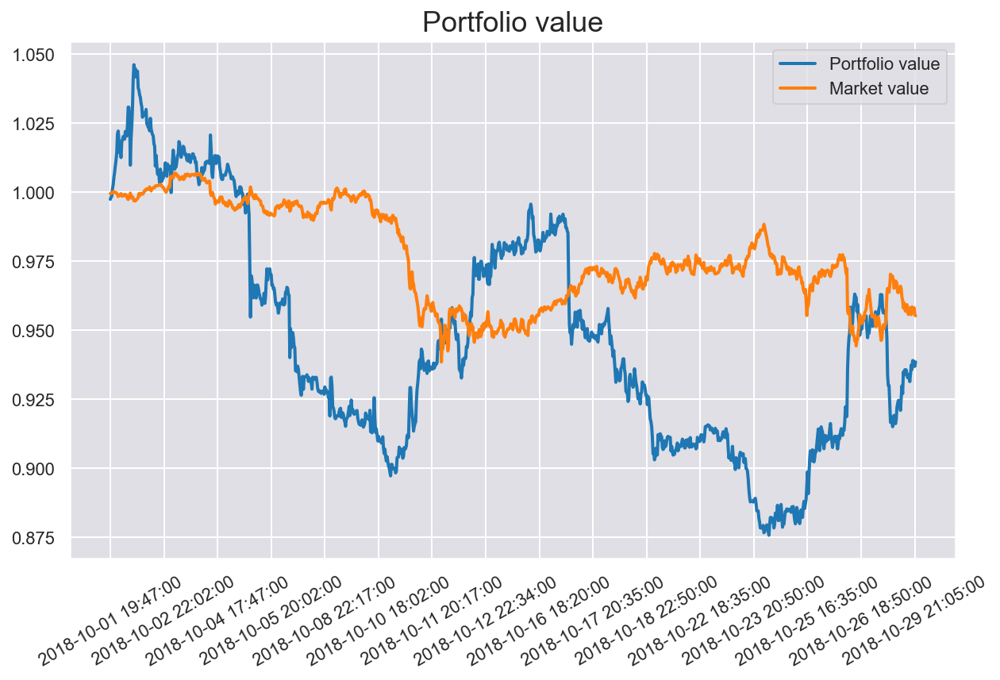

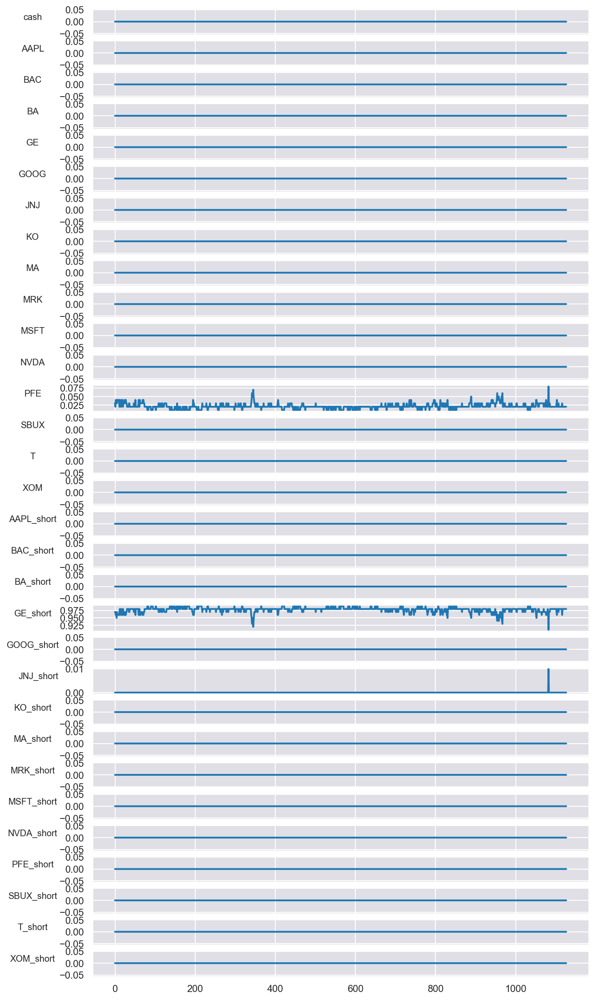

In [83]:
tf.reset_default_graph()
sess = tf.Session()
tflearn.config.init_training_mode()
action_dim = [nb_classes*2 + 1]
state_dim = [nb_classes + 1, window_length, 3]
variable_scope = get_variable_scope(window_length, predictor_type, use_batch_norm)
with tf.variable_scope(variable_scope):
    actor = StockActor(sess, state_dim, action_dim, action_bound, 1e-4, tau, batch_size, predictor_type, 
                       use_batch_norm)
    critic = StockCritic(sess=sess, state_dim=state_dim, action_dim=action_dim, tau=1e-3,
                         learning_rate=1e-3, num_actor_vars=actor.get_num_trainable_vars(), 
                         predictor_type=predictor_type, use_batch_norm=use_batch_norm)
    actor_noise = OrnsteinUhlenbeckActionNoise(mu=np.zeros(action_dim))

    model_save_path = "weights/"
    summary_path = get_result_path(window_length, predictor_type, use_batch_norm)

    ddpg_model = DDPG(environ, sess, actor, critic, actor_noise,param, obs_normalizer=obs_normalizer, model_save_path=model_save_path,
                      summary_path=summary_path)
    ddpg_model.initialize(load_weights=False, verbose=False)
    ddpg_model.train()

env_Oct = PortfolioEnv(history_Oct, abbreviation, steps=history_Oct.shape[1]-200, window_length=window_length,
                   start_idx=data['Oct'].date_index.iloc[0])
test_model(env_Oct, ddpg_model)
plot_weights(env_Oct.infos)

In [52]:
1*env_Feb.infos[-1]['portfolio_value']*env_Mar.infos[-1]['portfolio_value']*env_Apr.infos[-1]['portfolio_value']*env_May.infos[-1]['portfolio_value']*env_Jun.infos[-1]['portfolio_value']*env_Jul.infos[-1]['portfolio_value']*env_Aug.infos[-1]['portfolio_value']*env_Sep.infos[-1]['portfolio_value']*env_Oct.infos[-1]['portfolio_value']

0.8295556552778399

In [82]:
env_Oct.infos[-1]['portfolio_value']

0.8826683274473632

In [64]:
print(env_Feb.infos[-1].keys())

dict_keys(['reward', 'log_return', 'portfolio_value', 'return', 'rate_of_return', 'weights_mean', 'weights_std', 'weights', 'cost', 'long_position', 'short_position', 'price_change', 'market_value', 'date', 'steps', 'next_obs'])


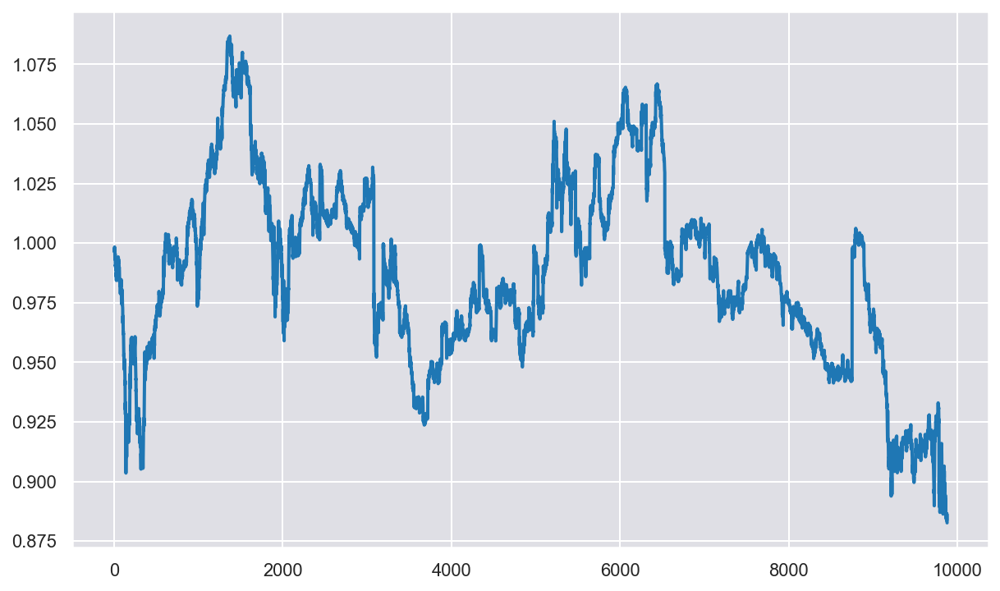

In [80]:
ls = []
base = 1
for j in [env_Feb.infos, env_Mar.infos, env_Apr.infos, env_May.infos, env_Jun.infos, env_Jul.infos, env_Aug.infos, env_Sep.infos, env_Oct.infos]:
    for i in range(len(j)):
        ls.append(base * j[i]['portfolio_value'])
    basee = ls[-1]

plt.plot(range(len(ls)),ls)

In [77]:
env_Feb.infos

[{'reward': -3.669741021485139e-07,
  'log_return': -0.0025031303507550133,
  'portfolio_value': 0.9974999998676951,
  'return': 0.9998313088071613,
  'rate_of_return': -0.0025000001323048915,
  'weights_mean': 0.032258064,
  'weights_std': 0.17589432,
  'weights': array([0.00e+00, 0.00e+00, 2.00e-03, 0.00e+00, 2.00e-04, 0.00e+00,
         4.00e-04, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00,
         9.96e-01, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00,
         1.70e-03, 0.00e+00, 0.00e+00, 1.00e-04, 0.00e+00, 0.00e+00,
         0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00,
         0.00e+00], dtype=float32),
  'cost': 0.0025000001323048603,
  'long_position': 0.9974999998676951,
  'short_position': 0.0,
  'price_change': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]),
  'market_value': 0.9998313088071613,
  'date': 7987,
  'steps': 7,
  'next_obs': array([[[1.00e+0

In [56]:
1*env_Feb.infos[-1]['market_value']*env_Mar.infos[-1]['market_value']*env_Apr.infos[-1]['market_value']*env_May.infos[-1]['market_value']*env_Jun.infos[-1]['market_value']*env_Jul.infos[-1]['market_value']*env_Aug.infos[-1]['market_value']*env_Sep.infos[-1]['market_value']*env_Oct.infos[-1]['market_value']

1.1376167894422449

In [58]:
month = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct']

performance = dict()
for i in month:
    performance[i]=dict()

for j in month:
    for i in abbreviation['symbols']:
        value_change = data[j].loc[:, i+'_close'].iloc[-1]/data[j].loc[:, i+'_open'].iloc[0]
        performance[j][i] = value_change

In [59]:
performance

{'Jan': {'AAPL': 0.9809613350569985,
  'BAC': 1.0711409395973155,
  'BA': 1.1435526404760297,
  'GE': 0.9075654152445962,
  'GOOG': 1.1104635913185719,
  'JNJ': 1.0216394382344511,
  'KO': 1.0336527989544761,
  'MA': 1.1005921052631578,
  'MRK': 1.0740937223695846,
  'MSFT': 1.0773875181422352,
  'NVDA': 1.240461719188927,
  'PFE': 1.0402472527472528,
  'SBUX': 0.9887698686938492,
  'T': 0.9613118114271074,
  'XOM': 1.0366261035552375},
 'Feb': {'AAPL': 1.0695417789757413,
  'BAC': 1.0147243107769424,
  'BA': 1.0790539541759054,
  'GE': 0.909746161078032,
  'GOOG': 0.962603973327834,
  'JNJ': 0.9241829148548183,
  'KO': 0.9207753898019385,
  'MA': 1.0532261438689818,
  'MRK': 0.9018768521567336,
  'MSFT': 1.017782088587132,
  'NVDA': 1.0131714344515332,
  'PFE': 0.9716134143121206,
  'SBUX': 0.9899528219465316,
  'T': 0.9834754797441363,
  'XOM': 0.8943613348676639},
 'Mar': {'AAPL': 0.9411929431531784,
  'BAC': 0.9254284390921723,
  'BA': 0.8986408724721872,
  'GE': 0.9290144727773949

In [132]:
nb_classes = 5

tf.reset_default_graph()
sess = tf.Session()
tflearn.config.init_training_mode()
action_dim = [nb_classes*2 + 1]
state_dim = [nb_classes + 1, window_length, 3]
variable_scope = get_variable_scope(window_length, predictor_type, use_batch_norm)

environ = PortfolioEnv(his, tag)

with tf.variable_scope(variable_scope):
    actor = StockActor(sess, state_dim, action_dim, action_bound, 1e-4, tau, batch_size, predictor_type, 
                       use_batch_norm)
    critic = StockCritic(sess=sess, state_dim=state_dim, action_dim=action_dim, tau=1e-3,
                         learning_rate=1e-3, num_actor_vars=actor.get_num_trainable_vars(), 
                         predictor_type=predictor_type, use_batch_norm=use_batch_norm)
    actor_noise = OrnsteinUhlenbeckActionNoise(mu=np.zeros(action_dim))

    model_save_path = "weights/"
    summary_path = get_result_path(window_length, predictor_type, use_batch_norm)

    ddpg_model = DDPG(environ, sess, actor, critic, actor_noise, param, obs_normalizer=obs_normalizer,
                      model_save_path=model_save_path,
                      summary_path=summary_path)
    ddpg_model.initialize(load_weights=False, verbose=False)
    ddpg_model.train()

Build model from scratch
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
1500
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]


c:\users\lenovo\appdata\local\programs\python\python39\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


Episode: 0, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 1, Reward: 1.00, Qmax: -0.0001
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 2, Reward: 1.00, Qmax: -0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 3, Reward: 1.00, Qmax: 0.0001
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 4, Reward: 1.

Episode: 50, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 51, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 52, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 53, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 54, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 55, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 56, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 

[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 101, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 102, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 103, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 104, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 105, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 106, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.

Episode: 154, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 155, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 156, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 157, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 158, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 159, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 160, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.0

Episode: 204, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 205, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 206, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 207, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 208, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09 0.09]
Episode: 209, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.1  0.09 0.09 0.09 0.09 0.09]
[0.09 0.09 0.09 0.09 0.09 0.1  0.09 0.09 0.09 0.09 0.09]
Episode: 210, Reward: 1.00, Qmax: 0.0000
[0.09 0.09 0.09 0.09 0.09 0.1

Episode: 257, Reward: 1.00, Qmax: 0.0000
[0.1  0.08 0.08 0.1  0.1  0.1  0.1  0.08 0.08 0.08 0.08]
[0.1  0.08 0.08 0.1  0.1  0.1  0.1  0.08 0.08 0.08 0.08]
Episode: 258, Reward: 1.00, Qmax: 0.0000
[0.1  0.08 0.08 0.1  0.1  0.1  0.1  0.08 0.08 0.08 0.08]
[0.1  0.08 0.08 0.1  0.1  0.1  0.1  0.08 0.08 0.08 0.08]
Episode: 259, Reward: 1.00, Qmax: 0.0000
[0.1  0.08 0.08 0.1  0.1  0.1  0.1  0.08 0.08 0.08 0.08]
[0.1  0.08 0.08 0.1  0.1  0.1  0.1  0.08 0.08 0.08 0.08]
Episode: 260, Reward: 1.00, Qmax: 0.0000
[0.1  0.08 0.08 0.1  0.1  0.1  0.1  0.08 0.08 0.08 0.08]
[0.1  0.08 0.08 0.1  0.1  0.1  0.1  0.08 0.08 0.08 0.08]
Episode: 261, Reward: 1.00, Qmax: 0.0000
[0.1  0.08 0.08 0.1  0.1  0.1  0.1  0.08 0.08 0.08 0.08]
[0.1  0.08 0.08 0.1  0.1  0.1  0.1  0.08 0.08 0.08 0.08]
Episode: 262, Reward: 1.00, Qmax: 0.0000
[0.1  0.08 0.08 0.1  0.1  0.1  0.1  0.08 0.08 0.08 0.08]
[0.1  0.08 0.08 0.1  0.1  0.1  0.1  0.08 0.08 0.08 0.08]
Episode: 263, Reward: 1.00, Qmax: 0.0000
[0.1  0.08 0.08 0.1  0.1  0.1

Episode: 307, Reward: 1.00, Qmax: 0.0000
[0.11 0.07 0.07 0.13 0.13 0.13 0.11 0.07 0.06 0.06 0.06]
[0.11 0.07 0.06 0.13 0.13 0.13 0.11 0.07 0.06 0.06 0.06]
Episode: 308, Reward: 1.00, Qmax: 0.0000
[0.11 0.07 0.07 0.13 0.13 0.13 0.11 0.07 0.06 0.06 0.06]
[0.11 0.06 0.06 0.13 0.13 0.13 0.11 0.07 0.06 0.06 0.06]
Episode: 309, Reward: 1.00, Qmax: 0.0000
[0.11 0.06 0.06 0.13 0.13 0.14 0.11 0.07 0.06 0.06 0.06]
[0.11 0.06 0.06 0.13 0.13 0.14 0.11 0.07 0.06 0.06 0.06]
Episode: 310, Reward: 1.00, Qmax: 0.0000
[0.11 0.06 0.06 0.14 0.13 0.14 0.11 0.07 0.06 0.06 0.06]
[0.11 0.06 0.06 0.14 0.14 0.14 0.11 0.07 0.06 0.06 0.06]
Episode: 311, Reward: 1.00, Qmax: 0.0000
[0.11 0.06 0.06 0.14 0.13 0.14 0.11 0.07 0.06 0.06 0.06]
[0.11 0.06 0.06 0.14 0.14 0.14 0.12 0.06 0.05 0.05 0.06]
Episode: 312, Reward: 1.00, Qmax: 0.0000
[0.11 0.06 0.06 0.14 0.14 0.15 0.12 0.06 0.05 0.05 0.05]
[0.11 0.06 0.06 0.14 0.14 0.15 0.12 0.06 0.05 0.05 0.06]
Episode: 313, Reward: 1.00, Qmax: 0.0000
[0.11 0.06 0.06 0.14 0.14 0.1

Episode: 360, Reward: 1.00, Qmax: 0.0000
[0.02 0.   0.   0.3  0.25 0.38 0.05 0.   0.   0.   0.  ]
[0.02 0.   0.   0.3  0.25 0.38 0.05 0.   0.   0.   0.  ]
Episode: 361, Reward: 1.00, Qmax: 0.0000
[0.02 0.   0.   0.3  0.25 0.39 0.05 0.   0.   0.   0.  ]
[0.02 0.   0.   0.3  0.24 0.39 0.05 0.   0.   0.   0.  ]
Episode: 362, Reward: 1.00, Qmax: 0.0000
[0.01 0.   0.   0.29 0.24 0.4  0.04 0.   0.   0.   0.  ]
[0.01 0.   0.   0.3  0.24 0.4  0.04 0.   0.   0.   0.  ]
Episode: 363, Reward: 1.00, Qmax: 0.0000
[0.01 0.   0.   0.29 0.24 0.4  0.04 0.   0.   0.   0.  ]
[0.01 0.   0.   0.29 0.24 0.4  0.04 0.   0.   0.   0.  ]
Episode: 364, Reward: 1.00, Qmax: 0.0000
[0.01 0.   0.   0.29 0.24 0.41 0.04 0.   0.   0.   0.  ]
[0.01 0.   0.   0.29 0.24 0.41 0.04 0.   0.   0.   0.  ]
Episode: 365, Reward: 1.00, Qmax: 0.0000
[0.01 0.   0.   0.29 0.23 0.42 0.04 0.   0.   0.   0.  ]
[0.01 0.   0.   0.29 0.23 0.42 0.04 0.   0.   0.   0.  ]
Episode: 366, Reward: 1.00, Qmax: 0.0000
[0.01 0.   0.   0.29 0.23 0.4

Episode: 397, Reward: 1.00, Qmax: 0.0000
[1.29e-03 5.02e-05 5.44e-05 1.06e-01 6.78e-02 8.20e-01 4.86e-03 7.89e-05
 3.21e-05 3.59e-05 3.79e-05]
[1.25e-03 4.75e-05 5.15e-05 1.05e-01 6.70e-02 8.22e-01 4.72e-03 7.48e-05
 3.03e-05 3.39e-05 3.58e-05]
Episode: 398, Reward: 1.00, Qmax: 0.0000
[1.05e-03 3.75e-05 4.08e-05 9.63e-02 6.03e-02 8.38e-01 4.06e-03 5.97e-05
 2.37e-05 2.66e-05 2.81e-05]
[2.41e-03 1.33e-04 1.43e-04 1.21e-01 8.04e-02 7.88e-01 7.75e-03 1.99e-04
 8.95e-05 9.89e-05 1.04e-04]
Episode: 399, Reward: 1.00, Qmax: 0.0000
[9.44e-04 3.28e-05 3.57e-05 8.97e-02 5.55e-02 8.50e-01 3.67e-03 5.24e-05
 2.06e-05 2.32e-05 2.45e-05]
[9.71e-04 3.42e-05 3.72e-05 9.04e-02 5.61e-02 8.49e-01 3.75e-03 5.46e-05
 2.15e-05 2.42e-05 2.56e-05]
Episode: 400, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the i

Episode: 430, Reward: 1.00, Qmax: 0.0000
[1.16e-04 2.37e-06 2.66e-06 1.60e-02 9.43e-03 9.74e-01 5.25e-04 4.17e-06
 1.37e-06 1.58e-06 1.68e-06]
[1.06e-04 2.07e-06 2.33e-06 1.53e-02 8.99e-03 9.75e-01 4.85e-04 3.67e-06
 1.19e-06 1.37e-06 1.46e-06]
Episode: 431, Reward: 1.00, Qmax: 0.0000
[1.07e-04 2.13e-06 2.40e-06 1.53e-02 8.95e-03 9.75e-01 4.91e-04 3.77e-06
 1.23e-06 1.42e-06 1.51e-06]
[9.89e-05 1.90e-06 2.13e-06 1.47e-02 8.58e-03 9.76e-01 4.58e-04 3.37e-06
 1.09e-06 1.25e-06 1.34e-06]
Episode: 432, Reward: 1.00, Qmax: 0.0000
[1.03e-04 2.04e-06 2.29e-06 1.48e-02 8.67e-03 9.76e-01 4.75e-04 3.60e-06
 1.17e-06 1.35e-06 1.44e-06]
[1.11e-04 2.25e-06 2.52e-06 1.53e-02 8.98e-03 9.75e-01 5.03e-04 3.96e-06
 1.30e-06 1.49e-06 1.59e-06]
Episode: 433, Reward: 1.00, Qmax: 0.0000
[1.05e-04 2.09e-06 2.35e-06 1.48e-02 8.63e-03 9.76e-01 4.79e-04 3.69e-06
 1.20e-06 1.38e-06 1.48e-06]
[1.05e-04 2.08e-06 2.34e-06 1.47e-02 8.61e-03 9.76e-01 4.78e-04 3.67e-06
 1.20e-06 1.38e-06 1.47e-06]
Episode: 434, Reward

Episode: 465, Reward: 1.00, Qmax: 0.0000
[6.56e-05 1.15e-06 1.30e-06 1.05e-02 5.66e-03 9.83e-01 3.14e-04 2.08e-06
 6.51e-07 7.54e-07 8.05e-07]
[7.22e-05 1.32e-06 1.49e-06 1.09e-02 5.95e-03 9.83e-01 3.40e-04 2.37e-06
 7.49e-07 8.67e-07 9.25e-07]
Episode: 466, Reward: 1.00, Qmax: 0.0000
[6.98e-05 1.26e-06 1.42e-06 1.08e-02 5.83e-03 9.83e-01 3.30e-04 2.27e-06
 7.14e-07 8.27e-07 8.83e-07]
[6.77e-05 1.21e-06 1.36e-06 1.06e-02 5.74e-03 9.83e-01 3.22e-04 2.17e-06
 6.82e-07 7.90e-07 8.44e-07]
Episode: 467, Reward: 1.00, Qmax: 0.0000
[7.41e-05 1.37e-06 1.55e-06 1.11e-02 6.00e-03 9.83e-01 3.47e-04 2.46e-06
 7.81e-07 9.03e-07 9.64e-07]
[6.97e-05 1.26e-06 1.42e-06 1.07e-02 5.81e-03 9.83e-01 3.30e-04 2.26e-06
 7.13e-07 8.26e-07 8.81e-07]
Episode: 468, Reward: 1.00, Qmax: 0.0000
[6.73e-05 1.20e-06 1.35e-06 1.06e-02 5.68e-03 9.83e-01 3.20e-04 2.16e-06
 6.78e-07 7.85e-07 8.38e-07]
[6.22e-05 1.07e-06 1.21e-06 1.02e-02 5.45e-03 9.84e-01 3.00e-04 1.94e-06
 6.04e-07 7.01e-07 7.48e-07]
Episode: 469, Reward

Episode: 499, Reward: 1.00, Qmax: 0.0000
[5.64e-05 9.59e-07 1.09e-06 9.60e-03 4.86e-03 9.85e-01 2.73e-04 1.74e-06
 5.38e-07 6.25e-07 6.67e-07]
[5.36e-05 8.93e-07 1.01e-06 9.38e-03 4.73e-03 9.86e-01 2.62e-04 1.63e-06
 5.00e-07 5.80e-07 6.20e-07]
Episode: 500, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[6.17e-05 1.09e-06 1.23e-06 1.00e-02 5.10e-03 9.85e-01 2.94e-04 1.97e-06
 6.15e-07 7.13e-07 7.62e-07]
[5.27e-05 8.71e-07 9.88e-07 9.30e-03 4.68e-03 9.86e-01 2.58e-04 1.59e-06
 4.87e-07 5.66e-07 6.05e-07]
Episode: 501, Reward: 1.00, Qmax: 0.0000
[5.95e-05 1.04e-06 1.17e-06 9.84e-03 4.99e-03 9.85e-01 2.85e-04 1.87e-06
 5.83e-07 6.76e-07 7.22e-07]
[5.

Episode: 531, Reward: 1.00, Qmax: 0.0000
[4.84e-05 7.88e-07 8.95e-07 9.03e-03 4.28e-03 9.86e-01 2.39e-04 1.44e-06
 4.39e-07 5.11e-07 5.46e-07]
[5.71e-05 9.96e-07 1.13e-06 9.76e-03 4.68e-03 9.85e-01 2.74e-04 1.80e-06
 5.61e-07 6.51e-07 6.95e-07]
Episode: 532, Reward: 1.00, Qmax: 0.0000
[5.01e-05 8.28e-07 9.39e-07 9.17e-03 4.36e-03 9.86e-01 2.45e-04 1.51e-06
 4.62e-07 5.37e-07 5.74e-07]
[5.62e-05 9.74e-07 1.10e-06 9.68e-03 4.64e-03 9.85e-01 2.70e-04 1.77e-06
 5.48e-07 6.36e-07 6.79e-07]
Episode: 533, Reward: 1.00, Qmax: 0.0000
[9.35e-05 2.00e-06 2.26e-06 1.23e-02 6.11e-03 9.81e-01 4.14e-04 3.52e-06
 1.16e-06 1.34e-06 1.42e-06]
[5.71e-05 9.98e-07 1.13e-06 9.76e-03 4.68e-03 9.85e-01 2.74e-04 1.81e-06
 5.62e-07 6.52e-07 6.96e-07]
Episode: 534, Reward: 1.00, Qmax: 0.0000
[5.29e-05 8.96e-07 1.02e-06 9.42e-03 4.48e-03 9.86e-01 2.57e-04 1.63e-06
 5.02e-07 5.83e-07 6.23e-07]
[5.69e-05 9.93e-07 1.13e-06 9.75e-03 4.66e-03 9.85e-01 2.73e-04 1.80e-06
 5.59e-07 6.49e-07 6.93e-07]
Episode: 535, Reward

Episode: 565, Reward: 1.00, Qmax: 0.0000
[5.33e-05 9.26e-07 1.05e-06 1.00e-02 4.21e-03 9.85e-01 2.56e-04 1.68e-06
 5.20e-07 6.04e-07 6.45e-07]
[4.50e-05 7.29e-07 8.28e-07 9.25e-03 3.84e-03 9.87e-01 2.22e-04 1.34e-06
 4.06e-07 4.72e-07 5.05e-07]
Episode: 566, Reward: 1.00, Qmax: 0.0000
[4.50e-05 7.30e-07 8.28e-07 9.26e-03 3.83e-03 9.87e-01 2.22e-04 1.34e-06
 4.06e-07 4.72e-07 5.05e-07]
[4.53e-05 7.36e-07 8.35e-07 9.29e-03 3.84e-03 9.87e-01 2.23e-04 1.35e-06
 4.09e-07 4.76e-07 5.09e-07]
Episode: 567, Reward: 1.00, Qmax: 0.0000
[4.90e-05 8.24e-07 9.35e-07 9.66e-03 4.01e-03 9.86e-01 2.39e-04 1.50e-06
 4.61e-07 5.36e-07 5.73e-07]
[4.43e-05 7.14e-07 8.11e-07 9.22e-03 3.79e-03 9.87e-01 2.19e-04 1.31e-06
 3.97e-07 4.62e-07 4.94e-07]
Episode: 568, Reward: 1.00, Qmax: 0.0000
[4.39e-05 7.06e-07 8.02e-07 9.20e-03 3.77e-03 9.87e-01 2.18e-04 1.30e-06
 3.92e-07 4.57e-07 4.88e-07]
[4.77e-05 7.93e-07 8.99e-07 9.55e-03 3.94e-03 9.86e-01 2.33e-04 1.45e-06
 4.42e-07 5.15e-07 5.50e-07]
Episode: 569, Reward

Episode: 599, Reward: 1.00, Qmax: 0.0000
[4.02e-05 6.38e-07 7.25e-07 9.53e-03 3.32e-03 9.87e-01 2.00e-04 1.18e-06
 3.53e-07 4.12e-07 4.41e-07]
[4.12e-05 6.58e-07 7.48e-07 9.63e-03 3.36e-03 9.87e-01 2.04e-04 1.21e-06
 3.65e-07 4.25e-07 4.55e-07]
Episode: 600, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[3.97e-05 6.26e-07 7.11e-07 9.50e-03 3.28e-03 9.87e-01 1.98e-04 1.15e-06
 3.46e-07 4.04e-07 4.32e-07]
[4.27e-05 6.94e-07 7.89e-07 9.83e-03 3.42e-03 9.86e-01 2.11e-04 1.27e-06
 3.86e-07 4.50e-07 4.81e-07]
Episode: 601, Reward: 1.00, Qmax: 0.0000
[4.03e-05 6.40e-07 7.27e-07 9.60e-03 3.30e-03 9.87e-01 2.00e-04 1.18e-06
 3.54e-07 4.13e-07 4.42e-07]
[4.

Episode: 632, Reward: 1.00, Qmax: 0.0000
[3.77e-05 6.01e-07 6.84e-07 9.37e-03 2.98e-03 9.87e-01 1.87e-04 1.11e-06
 3.33e-07 3.88e-07 4.15e-07]
[3.32e-05 5.02e-07 5.73e-07 8.85e-03 2.77e-03 9.88e-01 1.68e-04 9.33e-07
 2.76e-07 3.22e-07 3.45e-07]
Episode: 633, Reward: 1.00, Qmax: 0.0000
[3.33e-05 5.05e-07 5.76e-07 8.82e-03 2.77e-03 9.88e-01 1.68e-04 9.38e-07
 2.78e-07 3.24e-07 3.47e-07]
[3.43e-05 5.28e-07 6.02e-07 8.95e-03 2.82e-03 9.88e-01 1.73e-04 9.80e-07
 2.91e-07 3.40e-07 3.64e-07]
Episode: 634, Reward: 1.00, Qmax: 0.0000
[3.19e-05 4.77e-07 5.44e-07 8.61e-03 2.70e-03 9.88e-01 1.62e-04 8.88e-07
 2.61e-07 3.06e-07 3.27e-07]
[3.38e-05 5.18e-07 5.90e-07 8.84e-03 2.79e-03 9.88e-01 1.71e-04 9.61e-07
 2.85e-07 3.33e-07 3.56e-07]
Episode: 635, Reward: 1.00, Qmax: 0.0000
[3.66e-05 5.80e-07 6.60e-07 9.12e-03 2.91e-03 9.88e-01 1.82e-04 1.07e-06
 3.21e-07 3.74e-07 4.00e-07]
[3.58e-05 5.63e-07 6.41e-07 9.03e-03 2.87e-03 9.88e-01 1.79e-04 1.04e-06
 3.11e-07 3.63e-07 3.88e-07]
Episode: 636, Reward

[2.92e-05 4.43e-07 5.05e-07 7.43e-03 2.34e-03 9.90e-01 1.48e-04 8.24e-07
 2.43e-07 2.84e-07 3.04e-07]
Episode: 666, Reward: 1.00, Qmax: 0.0000
[8.35e-05 1.93e-06 2.18e-06 1.21e-02 4.28e-03 9.83e-01 3.60e-04 3.38e-06
 1.13e-06 1.30e-06 1.38e-06]
[2.88e-05 4.35e-07 4.96e-07 7.39e-03 2.31e-03 9.90e-01 1.47e-04 8.10e-07
 2.38e-07 2.79e-07 2.98e-07]
Episode: 667, Reward: 1.00, Qmax: 0.0000
[4.76e-05 8.79e-07 9.97e-07 9.35e-03 3.09e-03 9.87e-01 2.24e-04 1.59e-06
 4.96e-07 5.76e-07 6.14e-07]
[2.84e-05 4.27e-07 4.87e-07 7.35e-03 2.29e-03 9.90e-01 1.45e-04 7.96e-07
 2.34e-07 2.74e-07 2.93e-07]
Episode: 668, Reward: 1.00, Qmax: 0.0000
[2.76e-05 4.10e-07 4.68e-07 7.25e-03 2.25e-03 9.90e-01 1.41e-04 7.65e-07
 2.24e-07 2.62e-07 2.81e-07]
[2.50e-05 3.57e-07 4.08e-07 6.93e-03 2.12e-03 9.91e-01 1.30e-04 6.70e-07
 1.94e-07 2.27e-07 2.44e-07]
Episode: 669, Reward: 1.00, Qmax: 0.0000
[1.30e-04 3.60e-06 4.03e-06 1.49e-02 5.48e-03 9.79e-01 5.22e-04 6.13e-06
 2.15e-06 2.46e-06 2.61e-06]
[2.66e-05 3.90e-07 4

Episode: 700, Reward: 1.00, Qmax: 0.0000
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[2.38e-05 3.39e-07 3.88e-07 7.20e-03 1.97e-03 9.91e-01 1.24e-04 6.38e-07
 1.84e-07 2.16e-07 2.31e-07]
[2.36e-05 3.36e-07 3.84e-07 7.17e-03 1.96e-03 9.91e-01 1.23e-04 6.32e-07
 1.82e-07 2.14e-07 2.29e-07]
Episode: 701, Reward: 1.00, Qmax: 0.0000
[2.23e-05 3.10e-07 3.55e-07 6.97e-03 1.90e-03 9.91e-01 1.17e-04 5.85e-07
 1.68e-07 1.97e-07 2.11e-07]
[2.48e-05 3.61e-07 4.12e-07 7.33e-03 2.02e-03 9.90e-01 1.29e-04 6.77e-07
 1.96e-07 2.30e-07 2.46e-07]
Episode: 702, Reward: 1.00, Qmax: 0.0000
[2.28e-05 3.20e-07 3.66e-07 7.03e-03 1.92e-03 9.91e-01 1.20e-04 6.03e-07
 1.73e-07 2.03e-07 2.18e-07]
[2.

[1.89e-05 2.55e-07 2.93e-07 5.97e-03 1.63e-03 9.92e-01 1.01e-04 4.85e-07
 1.37e-07 1.61e-07 1.73e-07]
Episode: 733, Reward: 1.00, Qmax: 0.0000
[1.97e-05 2.70e-07 3.10e-07 6.06e-03 1.66e-03 9.92e-01 1.05e-04 5.12e-07
 1.46e-07 1.71e-07 1.83e-07]
[1.66e-05 2.13e-07 2.45e-07 5.59e-03 1.50e-03 9.93e-01 9.07e-05 4.08e-07
 1.14e-07 1.34e-07 1.44e-07]
Episode: 734, Reward: 1.00, Qmax: 0.0000
[8.17e-05 1.98e-06 2.22e-06 1.18e-02 3.83e-03 9.84e-01 3.48e-04 3.44e-06
 1.16e-06 1.33e-06 1.41e-06]
[2.06e-05 2.90e-07 3.32e-07 6.17e-03 1.71e-03 9.92e-01 1.09e-04 5.47e-07
 1.57e-07 1.84e-07 1.97e-07]
Episode: 735, Reward: 1.00, Qmax: 0.0000
[1.88e-05 2.54e-07 2.92e-07 5.88e-03 1.61e-03 9.92e-01 1.01e-04 4.83e-07
 1.37e-07 1.61e-07 1.72e-07]
[1.92e-05 2.62e-07 3.01e-07 5.94e-03 1.63e-03 9.92e-01 1.03e-04 4.98e-07
 1.41e-07 1.66e-07 1.78e-07]
Episode: 736, Reward: 1.00, Qmax: 0.0000
[1.84e-05 2.48e-07 2.84e-07 5.80e-03 1.59e-03 9.92e-01 9.88e-05 4.71e-07
 1.33e-07 1.57e-07 1.68e-07]
[1.89e-05 2.58e-07 2

Episode: 767, Reward: 1.00, Qmax: 0.0000
[1.28e-05 1.58e-07 1.82e-07 4.15e-03 1.16e-03 9.95e-01 7.15e-05 3.05e-07
 8.36e-08 9.88e-08 1.06e-07]
[1.42e-05 1.82e-07 2.09e-07 4.36e-03 1.24e-03 9.94e-01 7.81e-05 3.50e-07
 9.70e-08 1.15e-07 1.23e-07]
Episode: 768, Reward: 1.00, Qmax: 0.0000
[1.40e-05 1.79e-07 2.05e-07 4.33e-03 1.23e-03 9.94e-01 7.71e-05 3.43e-07
 9.50e-08 1.12e-07 1.20e-07]
[1.33e-05 1.67e-07 1.93e-07 4.24e-03 1.19e-03 9.94e-01 7.41e-05 3.23e-07
 8.89e-08 1.05e-07 1.13e-07]
Episode: 769, Reward: 1.00, Qmax: 0.0000
[1.41e-05 1.81e-07 2.08e-07 4.35e-03 1.23e-03 9.94e-01 7.78e-05 3.48e-07
 9.66e-08 1.14e-07 1.22e-07]
[1.39e-05 1.77e-07 2.04e-07 4.32e-03 1.22e-03 9.94e-01 7.68e-05 3.41e-07
 9.45e-08 1.11e-07 1.19e-07]
Episode: 770, Reward: 1.00, Qmax: 0.0000
[1.25e-05 1.53e-07 1.76e-07 4.10e-03 1.14e-03 9.95e-01 7.01e-05 2.96e-07
 8.10e-08 9.57e-08 1.03e-07]
[1.38e-05 1.75e-07 2.02e-07 4.30e-03 1.21e-03 9.94e-01 7.62e-05 3.37e-07
 9.33e-08 1.10e-07 1.18e-07]
Episode: 771, Reward

Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
[1.26e-05 1.56e-07 1.80e-07 4.26e-03 1.11e-03 9.95e-01 7.02e-05 3.02e-07
 8.28e-08 9.79e-08 1.05e-07]
[1.33e-05 1.70e-07 1.95e-07 4.39e-03 1.15e-03 9.94e-01 7.39e-05 3.27e-07
 9.03e-08 1.07e-07 1.14e-07]
Episode: 801, Reward: 1.00, Qmax: 0.0000
[1.40e-05 1.81e-07 2.08e-07 4.48e-03 1.18e-03 9.94e-01 7.68e-05 3.48e-07
 9.66e-08 1.14e-07 1.22e-07]
[1.26e-05 1.57e-07 1.80e-07 4.26e-03 1.11e-03 9.95e-01 7.03e-05 3.02e-07
 8.30e-08 9.81e-08 1.05e-07]
Episode: 802, Reward: 1.00, Qmax: 0.0000
[1.27e-05 1.59e-07 1.83e-07 4.28e-03 1.12e-03 9.95e-01 7.08e-05 3.06e-07
 8.41e-08 9.94e-08 1.06e-07]
[1.30e-05 1.64e-07 1.88e-07 4.33e-03 1.13e-03 9.94e-01 7.22e-05 3.16e-07
 8.69e-08 1.03e-07 1.10e-07]
Episode: 803, Reward: 1.00, Qmax: -0.0000
[1.15e-05 1.38e-07 1.59e-07 4.07e-03 1.05e-03 9.95e-01 6.50e-05 2.68e-07
 7.27e-08

Episode: 833, Reward: 1.00, Qmax: 0.0000
[1.00e-05 1.18e-07 1.37e-07 3.54e-03 9.14e-04 9.95e-01 5.77e-05 2.31e-07
 6.21e-08 7.37e-08 7.90e-08]
[1.07e-05 1.29e-07 1.49e-07 3.65e-03 9.49e-04 9.95e-01 6.07e-05 2.50e-07
 6.79e-08 8.04e-08 8.62e-08]
Episode: 834, Reward: 1.00, Qmax: 0.0000
[9.78e-06 1.14e-07 1.32e-07 3.48e-03 8.99e-04 9.96e-01 5.64e-05 2.23e-07
 5.99e-08 7.10e-08 7.62e-08]
[1.11e-05 1.36e-07 1.57e-07 3.70e-03 9.70e-04 9.95e-01 6.27e-05 2.63e-07
 7.18e-08 8.49e-08 9.10e-08]
Episode: 835, Reward: 1.00, Qmax: 0.0000
[9.69e-06 1.13e-07 1.30e-07 3.45e-03 8.93e-04 9.96e-01 5.59e-05 2.21e-07
 5.92e-08 7.02e-08 7.53e-08]
[1.07e-05 1.29e-07 1.49e-07 3.62e-03 9.47e-04 9.95e-01 6.08e-05 2.51e-07
 6.82e-08 8.08e-08 8.65e-08]
Episode: 836, Reward: 1.00, Qmax: 0.0000
[9.64e-06 1.12e-07 1.30e-07 3.43e-03 8.89e-04 9.96e-01 5.57e-05 2.19e-07
 5.88e-08 6.97e-08 7.48e-08]
[1.06e-05 1.27e-07 1.47e-07 3.59e-03 9.40e-04 9.95e-01 6.02e-05 2.47e-07
 6.71e-08 7.95e-08 8.52e-08]
Episode: 837, Reward

Episode: 868, Reward: 1.00, Qmax: 0.0000
[7.95e-06 8.78e-08 1.02e-07 2.99e-03 7.64e-04 9.96e-01 4.71e-05 1.73e-07
 4.56e-08 5.42e-08 5.82e-08]
[1.04e-05 1.28e-07 1.47e-07 3.42e-03 9.01e-04 9.96e-01 5.93e-05 2.48e-07
 6.74e-08 7.99e-08 8.55e-08]
Episode: 869, Reward: 1.00, Qmax: 0.0000
[8.41e-06 9.50e-08 1.10e-07 3.09e-03 7.91e-04 9.96e-01 4.94e-05 1.87e-07
 4.95e-08 5.88e-08 6.31e-08]
[9.11e-06 1.06e-07 1.22e-07 3.21e-03 8.30e-04 9.96e-01 5.29e-05 2.07e-07
 5.55e-08 6.58e-08 7.06e-08]
Episode: 870, Reward: 1.00, Qmax: 0.0000
[9.92e-06 1.19e-07 1.38e-07 3.36e-03 8.75e-04 9.96e-01 5.69e-05 2.32e-07
 6.28e-08 7.44e-08 7.97e-08]
[9.53e-06 1.13e-07 1.30e-07 3.29e-03 8.53e-04 9.96e-01 5.49e-05 2.20e-07
 5.92e-08 7.02e-08 7.52e-08]
Episode: 871, Reward: 1.00, Qmax: 0.0000
[8.76e-06 1.00e-07 1.16e-07 3.16e-03 8.11e-04 9.96e-01 5.12e-05 1.97e-07
 5.24e-08 6.23e-08 6.68e-08]
[9.18e-06 1.07e-07 1.24e-07 3.24e-03 8.34e-04 9.96e-01 5.32e-05 2.09e-07
 5.61e-08 6.65e-08 7.13e-08]
Episode: 872, Reward

[7.86e-06 8.77e-08 1.01e-07 3.02e-03 7.38e-04 9.96e-01 4.66e-05 1.73e-07
 4.56e-08 5.42e-08 5.81e-08]
[8.39e-06 9.59e-08 1.11e-07 3.12e-03 7.68e-04 9.96e-01 4.93e-05 1.88e-07
 5.00e-08 5.94e-08 6.37e-08]
Episode: 901, Reward: 1.00, Qmax: 0.0000
[1.64e-05 2.41e-07 2.77e-07 4.33e-03 1.15e-03 9.94e-01 8.68e-05 4.56e-07
 1.31e-07 1.54e-07 1.64e-07]
[9.22e-06 1.09e-07 1.26e-07 3.26e-03 8.13e-04 9.96e-01 5.34e-05 2.13e-07
 5.73e-08 6.80e-08 7.29e-08]
Episode: 902, Reward: 1.00, Qmax: 0.0000
[8.53e-06 9.83e-08 1.14e-07 3.13e-03 7.74e-04 9.96e-01 4.99e-05 1.93e-07
 5.13e-08 6.09e-08 6.53e-08]
[8.36e-06 9.56e-08 1.10e-07 3.10e-03 7.64e-04 9.96e-01 4.91e-05 1.88e-07
 4.99e-08 5.92e-08 6.35e-08]
Episode: 903, Reward: 1.00, Qmax: 0.0000
[7.84e-06 8.75e-08 1.01e-07 3.00e-03 7.34e-04 9.96e-01 4.65e-05 1.72e-07
 4.55e-08 5.41e-08 5.80e-08]
[8.79e-06 1.03e-07 1.18e-07 3.18e-03 7.87e-04 9.96e-01 5.12e-05 2.01e-07
 5.36e-08 6.37e-08 6.82e-08]
Episode: 904, Reward: 1.00, Qmax: 0.0000
[8.67e-06 1.01e-07 1

Episode: 934, Reward: 1.00, Qmax: 0.0000
[8.59e-06 1.01e-07 1.17e-07 3.17e-03 7.50e-04 9.96e-01 5.01e-05 1.97e-07
 5.28e-08 6.27e-08 6.72e-08]
[7.40e-06 8.22e-08 9.51e-08 2.94e-03 6.84e-04 9.96e-01 4.42e-05 1.62e-07
 4.26e-08 5.07e-08 5.44e-08]
Episode: 935, Reward: 1.00, Qmax: 0.0000
[7.08e-06 7.74e-08 8.96e-08 2.88e-03 6.64e-04 9.96e-01 4.26e-05 1.53e-07
 4.01e-08 4.77e-08 5.12e-08]
[7.82e-06 8.87e-08 1.03e-07 3.02e-03 7.06e-04 9.96e-01 4.63e-05 1.74e-07
 4.62e-08 5.49e-08 5.88e-08]
Episode: 936, Reward: 1.00, Qmax: 0.0000
[7.41e-06 8.24e-08 9.53e-08 2.94e-03 6.81e-04 9.96e-01 4.42e-05 1.63e-07
 4.28e-08 5.09e-08 5.46e-08]
[8.02e-06 9.20e-08 1.06e-07 3.06e-03 7.16e-04 9.96e-01 4.73e-05 1.81e-07
 4.80e-08 5.70e-08 6.11e-08]
Episode: 937, Reward: 1.00, Qmax: 0.0000
[7.22e-06 7.96e-08 9.21e-08 2.90e-03 6.69e-04 9.96e-01 4.32e-05 1.57e-07
 4.12e-08 4.91e-08 5.26e-08]
[7.54e-06 8.45e-08 9.78e-08 2.96e-03 6.87e-04 9.96e-01 4.49e-05 1.66e-07
 4.39e-08 5.22e-08 5.60e-08]
Episode: 938, Reward

Episode: 969, Reward: 1.00, Qmax: 0.0000
[7.48e-06 8.62e-08 9.96e-08 2.86e-03 6.38e-04 9.96e-01 4.43e-05 1.69e-07
 4.49e-08 5.34e-08 5.71e-08]
[6.71e-06 7.42e-08 8.58e-08 2.71e-03 5.97e-04 9.97e-01 4.04e-05 1.47e-07
 3.84e-08 4.57e-08 4.90e-08]
Episode: 970, Reward: 1.00, Qmax: 0.0000
[6.13e-06 6.55e-08 7.59e-08 2.58e-03 5.62e-04 9.97e-01 3.74e-05 1.30e-07
 3.37e-08 4.02e-08 4.31e-08]
[7.02e-06 7.90e-08 9.14e-08 2.76e-03 6.12e-04 9.97e-01 4.20e-05 1.56e-07
 4.10e-08 4.88e-08 5.23e-08]
Episode: 971, Reward: 1.00, Qmax: 0.0000
[6.34e-06 6.88e-08 7.97e-08 2.62e-03 5.73e-04 9.97e-01 3.85e-05 1.36e-07
 3.55e-08 4.24e-08 4.54e-08]
[6.88e-06 7.70e-08 8.90e-08 2.73e-03 6.03e-04 9.97e-01 4.12e-05 1.52e-07
 3.99e-08 4.75e-08 5.09e-08]
Episode: 972, Reward: 1.00, Qmax: 0.0000
[6.94e-06 7.79e-08 9.01e-08 2.74e-03 6.04e-04 9.97e-01 4.15e-05 1.54e-07
 4.04e-08 4.81e-08 5.15e-08]
[6.26e-06 6.77e-08 7.84e-08 2.60e-03 5.67e-04 9.97e-01 3.81e-05 1.34e-07
 3.49e-08 4.16e-08 4.46e-08]
Episode: 973, Reward

 3.48e-08 4.16e-08 4.45e-08]
[5.80e-06 6.23e-08 7.22e-08 2.44e-03 5.14e-04 9.97e-01 3.55e-05 1.24e-07
 3.21e-08 3.83e-08 4.10e-08]
Episode: 1001, Reward: 1.00, Qmax: 0.0000
[5.60e-06 5.94e-08 6.89e-08 2.40e-03 5.03e-04 9.97e-01 3.45e-05 1.18e-07
 3.05e-08 3.65e-08 3.91e-08]
[5.84e-06 6.30e-08 7.29e-08 2.45e-03 5.16e-04 9.97e-01 3.57e-05 1.25e-07
 3.24e-08 3.87e-08 4.15e-08]
Episode: 1002, Reward: 1.00, Qmax: 0.0000
[5.34e-06 5.57e-08 6.45e-08 2.34e-03 4.87e-04 9.97e-01 3.31e-05 1.11e-07
 2.85e-08 3.41e-08 3.65e-08]
[6.19e-06 6.82e-08 7.90e-08 2.52e-03 5.34e-04 9.97e-01 3.75e-05 1.35e-07
 3.53e-08 4.20e-08 4.50e-08]
Episode: 1003, Reward: 1.00, Qmax: 0.0000
[5.61e-06 5.96e-08 6.90e-08 2.39e-03 5.01e-04 9.97e-01 3.45e-05 1.19e-07
 3.06e-08 3.66e-08 3.92e-08]
[5.74e-06 6.15e-08 7.13e-08 2.42e-03 5.09e-04 9.97e-01 3.52e-05 1.22e-07
 3.17e-08 3.78e-08 4.05e-08]
Episode: 1004, Reward: 1.00, Qmax: 0.0000
[1.33e-05 1.95e-07 2.24e-07 3.68e-03 8.62e-04 9.95e-01 7.19e-05 3.70e-07
 1.05e-07 1.24e-

[4.72e-06 4.82e-08 5.59e-08 2.11e-03 4.30e-04 9.97e-01 2.97e-05 9.66e-08
 2.46e-08 2.94e-08 3.15e-08]
Episode: 1035, Reward: 1.00, Qmax: 0.0000
[4.52e-06 4.54e-08 5.28e-08 2.06e-03 4.18e-04 9.97e-01 2.86e-05 9.13e-08
 2.31e-08 2.77e-08 2.97e-08]
[4.97e-06 5.18e-08 6.01e-08 2.16e-03 4.44e-04 9.97e-01 3.10e-05 1.03e-07
 2.65e-08 3.17e-08 3.40e-08]
Episode: 1036, Reward: 1.00, Qmax: 0.0000
[4.86e-06 5.03e-08 5.83e-08 2.13e-03 4.37e-04 9.97e-01 3.04e-05 1.01e-07
 2.57e-08 3.08e-08 3.30e-08]
[5.26e-06 5.59e-08 6.48e-08 2.21e-03 4.59e-04 9.97e-01 3.25e-05 1.11e-07
 2.87e-08 3.43e-08 3.67e-08]
Episode: 1037, Reward: 1.00, Qmax: 0.0000
[4.98e-06 5.19e-08 6.02e-08 2.15e-03 4.42e-04 9.97e-01 3.10e-05 1.04e-07
 2.66e-08 3.18e-08 3.40e-08]
[4.57e-06 4.63e-08 5.37e-08 2.06e-03 4.20e-04 9.97e-01 2.88e-05 9.28e-08
 2.36e-08 2.82e-08 3.02e-08]
Episode: 1038, Reward: 1.00, Qmax: 0.0000
[4.83e-06 4.99e-08 5.80e-08 2.11e-03 4.34e-04 9.97e-01 3.02e-05 9.99e-08
 2.55e-08 3.05e-08 3.27e-08]
[4.90e-06 5.08e-

Episode: 1068, Reward: 1.00, Qmax: 0.0000
[4.82e-06 5.04e-08 5.85e-08 2.08e-03 4.24e-04 9.97e-01 3.01e-05 1.01e-07
 2.58e-08 3.09e-08 3.31e-08]
[4.83e-06 5.06e-08 5.87e-08 2.08e-03 4.24e-04 9.97e-01 3.01e-05 1.01e-07
 2.59e-08 3.10e-08 3.32e-08]
Episode: 1069, Reward: 1.00, Qmax: 0.0000
[4.53e-06 4.64e-08 5.38e-08 2.02e-03 4.07e-04 9.98e-01 2.86e-05 9.30e-08
 2.37e-08 2.83e-08 3.03e-08]
[5.01e-06 5.31e-08 6.16e-08 2.12e-03 4.34e-04 9.97e-01 3.11e-05 1.06e-07
 2.73e-08 3.26e-08 3.49e-08]
Episode: 1070, Reward: 1.00, Qmax: 0.0000
[5.10e-06 5.44e-08 6.31e-08 2.15e-03 4.39e-04 9.97e-01 3.15e-05 1.08e-07
 2.79e-08 3.34e-08 3.57e-08]
[4.34e-06 4.37e-08 5.07e-08 1.98e-03 3.96e-04 9.98e-01 2.75e-05 8.78e-08
 2.22e-08 2.66e-08 2.85e-08]
Episode: 1071, Reward: 1.00, Qmax: 0.0000
[4.77e-06 4.97e-08 5.76e-08 2.08e-03 4.21e-04 9.97e-01 2.98e-05 9.93e-08
 2.54e-08 3.04e-08 3.26e-08]
[5.14e-06 5.50e-08 6.38e-08 2.16e-03 4.41e-04 9.97e-01 3.18e-05 1.10e-07
 2.83e-08 3.38e-08 3.62e-08]
Episode: 1072, R

[5.46e-06 5.91e-08 6.85e-08 2.52e-03 4.65e-04 9.97e-01 3.36e-05 1.17e-07
 3.04e-08 3.63e-08 3.89e-08]
[4.84e-06 5.01e-08 5.82e-08 2.38e-03 4.31e-04 9.97e-01 3.04e-05 1.00e-07
 2.56e-08 3.06e-08 3.28e-08]
Episode: 1101, Reward: 1.00, Qmax: 0.0000
[4.76e-06 4.89e-08 5.67e-08 2.37e-03 4.27e-04 9.97e-01 2.99e-05 9.79e-08
 2.49e-08 2.98e-08 3.20e-08]
[5.11e-06 5.39e-08 6.25e-08 2.45e-03 4.47e-04 9.97e-01 3.18e-05 1.08e-07
 2.76e-08 3.30e-08 3.53e-08]
Episode: 1102, Reward: 1.00, Qmax: 0.0000
[5.75e-06 6.33e-08 7.33e-08 2.62e-03 4.82e-04 9.97e-01 3.52e-05 1.26e-07
 3.26e-08 3.90e-08 4.17e-08]
[5.51e-06 5.98e-08 6.92e-08 2.56e-03 4.69e-04 9.97e-01 3.39e-05 1.19e-07
 3.07e-08 3.67e-08 3.93e-08]
Episode: 1103, Reward: 1.00, Qmax: 0.0000
[5.50e-06 5.96e-08 6.90e-08 2.57e-03 4.69e-04 9.97e-01 3.39e-05 1.18e-07
 3.07e-08 3.66e-08 3.92e-08]
[5.78e-06 6.38e-08 7.38e-08 2.64e-03 4.84e-04 9.97e-01 3.53e-05 1.26e-07
 3.29e-08 3.92e-08 4.20e-08]
Episode: 1104, Reward: 1.00, Qmax: 0.0000
[5.18e-06 5.47e-

Episode: 1134, Reward: 1.00, Qmax: 0.0000
[5.44e-06 5.85e-08 6.78e-08 2.84e-03 4.64e-04 9.97e-01 3.37e-05 1.16e-07
 3.00e-08 3.59e-08 3.84e-08]
[5.15e-06 5.43e-08 6.29e-08 2.77e-03 4.48e-04 9.97e-01 3.22e-05 1.08e-07
 2.78e-08 3.32e-08 3.56e-08]
Episode: 1135, Reward: 1.00, Qmax: 0.0000
[4.89e-06 5.05e-08 5.85e-08 2.71e-03 4.33e-04 9.97e-01 3.08e-05 1.01e-07
 2.58e-08 3.08e-08 3.30e-08]
[6.47e-06 7.41e-08 8.57e-08 3.10e-03 5.17e-04 9.96e-01 3.90e-05 1.46e-07
 3.84e-08 4.58e-08 4.90e-08]
Episode: 1136, Reward: 1.00, Qmax: 0.0000
[5.64e-06 6.14e-08 7.11e-08 2.91e-03 4.74e-04 9.97e-01 3.48e-05 1.22e-07
 3.16e-08 3.77e-08 4.04e-08]
[5.58e-06 6.05e-08 7.01e-08 2.89e-03 4.70e-04 9.97e-01 3.44e-05 1.20e-07
 3.11e-08 3.72e-08 3.98e-08]
Episode: 1137, Reward: 1.00, Qmax: 0.0000
[4.98e-06 5.19e-08 6.01e-08 2.75e-03 4.38e-04 9.97e-01 3.13e-05 1.04e-07
 2.65e-08 3.17e-08 3.40e-08]
[6.39e-06 7.30e-08 8.44e-08 3.10e-03 5.12e-04 9.96e-01 3.87e-05 1.44e-07
 3.78e-08 4.51e-08 4.82e-08]
Episode: 1138, R

Episode: 1169, Reward: 1.00, Qmax: 0.0000
[6.55e-06 7.48e-08 8.65e-08 3.70e-03 5.16e-04 9.96e-01 3.98e-05 1.48e-07
 3.87e-08 4.62e-08 4.94e-08]
[5.77e-06 6.28e-08 7.27e-08 3.49e-03 4.76e-04 9.96e-01 3.57e-05 1.25e-07
 3.23e-08 3.85e-08 4.13e-08]
Episode: 1170, Reward: 1.00, Qmax: 0.0000
[6.17e-06 6.88e-08 7.96e-08 3.62e-03 4.97e-04 9.96e-01 3.78e-05 1.36e-07
 3.55e-08 4.24e-08 4.54e-08]
[6.89e-06 8.02e-08 9.27e-08 3.82e-03 5.33e-04 9.96e-01 4.15e-05 1.58e-07
 4.16e-08 4.96e-08 5.31e-08]
Episode: 1171, Reward: 1.00, Qmax: 0.0000
[7.75e-06 9.41e-08 1.09e-07 4.06e-03 5.74e-04 9.95e-01 4.59e-05 1.84e-07
 4.92e-08 5.84e-08 6.25e-08]
[5.78e-06 6.30e-08 7.29e-08 3.54e-03 4.77e-04 9.96e-01 3.58e-05 1.25e-07
 3.24e-08 3.87e-08 4.14e-08]
Episode: 1172, Reward: 1.00, Qmax: 0.0000
[5.83e-06 6.37e-08 7.38e-08 3.58e-03 4.79e-04 9.96e-01 3.61e-05 1.27e-07
 3.28e-08 3.91e-08 4.19e-08]
[6.75e-06 7.79e-08 9.01e-08 3.83e-03 5.26e-04 9.96e-01 4.08e-05 1.53e-07
 4.04e-08 4.81e-08 5.15e-08]
Episode: 1173, R

 4.77e-08 5.67e-08 6.07e-08]
[6.72e-06 7.62e-08 8.81e-08 4.67e-03 5.29e-04 9.95e-01 4.11e-05 1.50e-07
 3.94e-08 4.69e-08 5.03e-08]
Episode: 1201, Reward: 1.00, Qmax: 0.0000
[8.06e-06 9.78e-08 1.13e-07 5.10e-03 5.94e-04 9.94e-01 4.79e-05 1.91e-07
 5.10e-08 6.07e-08 6.49e-08]
[6.99e-06 8.04e-08 9.29e-08 4.79e-03 5.43e-04 9.95e-01 4.25e-05 1.58e-07
 4.16e-08 4.96e-08 5.31e-08]
Episode: 1202, Reward: 1.00, Qmax: 0.0000
[7.62e-06 9.04e-08 1.04e-07 5.01e-03 5.73e-04 9.94e-01 4.57e-05 1.77e-07
 4.70e-08 5.60e-08 5.99e-08]
[6.95e-06 7.97e-08 9.21e-08 4.81e-03 5.41e-04 9.95e-01 4.23e-05 1.57e-07
 4.13e-08 4.91e-08 5.26e-08]
Episode: 1203, Reward: 1.00, Qmax: 0.0000
[8.03e-06 9.71e-08 1.12e-07 5.17e-03 5.92e-04 9.94e-01 4.78e-05 1.90e-07
 5.07e-08 6.02e-08 6.44e-08]
[6.94e-06 7.95e-08 9.19e-08 4.84e-03 5.40e-04 9.95e-01 4.23e-05 1.57e-07
 4.12e-08 4.90e-08 5.25e-08]
Episode: 1204, Reward: 1.00, Qmax: 0.0000
[7.08e-06 8.16e-08 9.43e-08 4.92e-03 5.47e-04 9.94e-01 4.30e-05 1.61e-07
 4.23e-08 5.04e-

Episode: 1235, Reward: 1.00, Qmax: 0.0000
[7.93e-06 9.51e-08 1.10e-07 5.96e-03 5.85e-04 9.93e-01 4.78e-05 1.86e-07
 4.95e-08 5.89e-08 6.30e-08]
[7.77e-06 9.25e-08 1.07e-07 5.91e-03 5.78e-04 9.93e-01 4.70e-05 1.81e-07
 4.81e-08 5.72e-08 6.12e-08]
Episode: 1236, Reward: 1.00, Qmax: 0.0000
[7.89e-06 9.45e-08 1.09e-07 5.95e-03 5.83e-04 9.93e-01 4.76e-05 1.85e-07
 4.92e-08 5.85e-08 6.26e-08]
[7.83e-06 9.35e-08 1.08e-07 5.93e-03 5.80e-04 9.93e-01 4.73e-05 1.83e-07
 4.86e-08 5.79e-08 6.19e-08]
Episode: 1237, Reward: 1.00, Qmax: 0.0000
[8.43e-06 1.03e-07 1.19e-07 6.13e-03 6.08e-04 9.93e-01 5.03e-05 2.02e-07
 5.41e-08 6.42e-08 6.87e-08]
[7.00e-06 8.02e-08 9.26e-08 5.66e-03 5.40e-04 9.94e-01 4.30e-05 1.58e-07
 4.15e-08 4.94e-08 5.29e-08]
Episode: 1238, Reward: 1.00, Qmax: 0.0000
[8.65e-06 1.07e-07 1.24e-07 6.22e-03 6.18e-04 9.93e-01 5.15e-05 2.09e-07
 5.62e-08 6.67e-08 7.14e-08]
[7.59e-06 8.97e-08 1.03e-07 5.88e-03 5.69e-04 9.94e-01 4.61e-05 1.76e-07
 4.66e-08 5.55e-08 5.93e-08]
Episode: 1239, R

Episode: 1269, Reward: 1.00, Qmax: 0.0000
[8.54e-06 1.06e-07 1.22e-07 6.41e-03 6.09e-04 9.93e-01 5.12e-05 2.07e-07
 5.56e-08 6.61e-08 7.06e-08]
[7.80e-06 9.40e-08 1.08e-07 6.16e-03 5.75e-04 9.93e-01 4.74e-05 1.84e-07
 4.89e-08 5.82e-08 6.22e-08]
Episode: 1270, Reward: 1.00, Qmax: 0.0000
[8.26e-06 1.02e-07 1.17e-07 6.30e-03 5.95e-04 9.93e-01 4.98e-05 1.98e-07
 5.30e-08 6.31e-08 6.74e-08]
[7.56e-06 9.00e-08 1.04e-07 6.07e-03 5.63e-04 9.93e-01 4.62e-05 1.77e-07
 4.68e-08 5.57e-08 5.95e-08]
Episode: 1271, Reward: 1.00, Qmax: 0.0000
[7.79e-06 9.39e-08 1.08e-07 6.14e-03 5.73e-04 9.93e-01 4.74e-05 1.84e-07
 4.89e-08 5.81e-08 6.22e-08]
[7.92e-06 9.61e-08 1.11e-07 6.18e-03 5.79e-04 9.93e-01 4.81e-05 1.88e-07
 5.00e-08 5.95e-08 6.37e-08]
Episode: 1272, Reward: 1.00, Qmax: 0.0000
[7.38e-06 8.71e-08 1.01e-07 5.99e-03 5.53e-04 9.93e-01 4.52e-05 1.71e-07
 4.52e-08 5.38e-08 5.76e-08]
[7.24e-06 8.49e-08 9.80e-08 5.94e-03 5.47e-04 9.93e-01 4.45e-05 1.67e-07
 4.40e-08 5.24e-08 5.61e-08]
Episode: 1273, R

[5.99e-06 6.78e-08 7.84e-08 4.89e-03 4.62e-04 9.95e-01 3.77e-05 1.34e-07
 3.49e-08 4.17e-08 4.46e-08]
Episode: 1301, Reward: 1.00, Qmax: 0.0000
[6.54e-06 7.66e-08 8.84e-08 5.06e-03 4.87e-04 9.94e-01 4.06e-05 1.51e-07
 3.96e-08 4.72e-08 5.05e-08]
[5.82e-06 6.53e-08 7.55e-08 4.81e-03 4.53e-04 9.95e-01 3.68e-05 1.30e-07
 3.35e-08 4.01e-08 4.29e-08]
Episode: 1302, Reward: 1.00, Qmax: 0.0000
[5.79e-06 6.48e-08 7.50e-08 4.77e-03 4.50e-04 9.95e-01 3.66e-05 1.29e-07
 3.33e-08 3.98e-08 4.26e-08]
[6.07e-06 6.93e-08 8.01e-08 4.88e-03 4.64e-04 9.95e-01 3.82e-05 1.37e-07
 3.57e-08 4.26e-08 4.56e-08]
Episode: 1303, Reward: 1.00, Qmax: 0.0000
[6.53e-06 7.67e-08 8.85e-08 5.01e-03 4.86e-04 9.94e-01 4.06e-05 1.51e-07
 3.97e-08 4.73e-08 5.06e-08]
[6.52e-06 7.64e-08 8.83e-08 5.01e-03 4.85e-04 9.94e-01 4.05e-05 1.51e-07
 3.95e-08 4.71e-08 5.04e-08]
Episode: 1304, Reward: 1.00, Qmax: 0.0000
[6.25e-06 7.23e-08 8.35e-08 4.90e-03 4.71e-04 9.95e-01 3.91e-05 1.43e-07
 3.73e-08 4.45e-08 4.76e-08]
[6.10e-06 6.98e-

Episode: 1335, Reward: 1.00, Qmax: 0.0000
[5.14e-06 5.71e-08 6.61e-08 4.03e-03 3.99e-04 9.96e-01 3.29e-05 1.14e-07
 2.93e-08 3.50e-08 3.75e-08]
[5.63e-06 6.47e-08 7.48e-08 4.20e-03 4.24e-04 9.95e-01 3.56e-05 1.28e-07
 3.33e-08 3.98e-08 4.26e-08]
Episode: 1336, Reward: 1.00, Qmax: 0.0000
[5.49e-06 6.24e-08 7.22e-08 4.15e-03 4.16e-04 9.95e-01 3.48e-05 1.24e-07
 3.21e-08 3.83e-08 4.10e-08]
[4.95e-06 5.42e-08 6.28e-08 3.97e-03 3.90e-04 9.96e-01 3.19e-05 1.08e-07
 2.77e-08 3.32e-08 3.55e-08]
Episode: 1337, Reward: 1.00, Qmax: 0.0000
[8.28e-05 2.55e-06 2.86e-06 1.41e-02 2.37e-03 9.83e-01 3.46e-04 4.34e-06
 1.53e-06 1.75e-06 1.85e-06]
[5.03e-06 5.54e-08 6.41e-08 4.00e-03 3.94e-04 9.96e-01 3.23e-05 1.10e-07
 2.84e-08 3.39e-08 3.63e-08]
Episode: 1338, Reward: 1.00, Qmax: 0.0000
[5.20e-06 5.80e-08 6.72e-08 4.07e-03 4.02e-04 9.95e-01 3.33e-05 1.15e-07
 2.98e-08 3.56e-08 3.81e-08]
[4.84e-06 5.27e-08 6.10e-08 3.94e-03 3.84e-04 9.96e-01 3.13e-05 1.05e-07
 2.69e-08 3.22e-08 3.44e-08]
Episode: 1339, R

Episode: 1369, Reward: 1.00, Qmax: 0.0000
[5.52e-06 6.26e-08 7.24e-08 4.74e-03 4.23e-04 9.95e-01 3.52e-05 1.24e-07
 3.21e-08 3.84e-08 4.11e-08]
[5.40e-06 6.07e-08 7.02e-08 4.69e-03 4.16e-04 9.95e-01 3.46e-05 1.20e-07
 3.11e-08 3.72e-08 3.98e-08]
Episode: 1370, Reward: 1.00, Qmax: 0.0000
[6.29e-06 7.48e-08 8.64e-08 5.04e-03 4.60e-04 9.94e-01 3.94e-05 1.47e-07
 3.87e-08 4.61e-08 4.93e-08]
[6.10e-06 7.17e-08 8.28e-08 4.97e-03 4.50e-04 9.95e-01 3.83e-05 1.41e-07
 3.70e-08 4.41e-08 4.72e-08]
Episode: 1371, Reward: 1.00, Qmax: 0.0000
[5.68e-06 6.50e-08 7.51e-08 4.83e-03 4.31e-04 9.95e-01 3.61e-05 1.29e-07
 3.34e-08 3.99e-08 4.27e-08]
[5.58e-06 6.35e-08 7.34e-08 4.79e-03 4.26e-04 9.95e-01 3.56e-05 1.26e-07
 3.26e-08 3.89e-08 4.17e-08]
Episode: 1372, Reward: 1.00, Qmax: 0.0000
[5.79e-06 6.67e-08 7.71e-08 4.89e-03 4.36e-04 9.95e-01 3.67e-05 1.32e-07
 3.43e-08 4.10e-08 4.38e-08]
[5.86e-06 6.79e-08 7.85e-08 4.91e-03 4.40e-04 9.95e-01 3.71e-05 1.34e-07
 3.50e-08 4.18e-08 4.47e-08]
Episode: 1373, R

[5.67e-06 6.50e-08 7.51e-08 4.93e-03 4.33e-04 9.95e-01 3.61e-05 1.29e-07
 3.34e-08 3.99e-08 4.27e-08]
Episode: 1401, Reward: 1.00, Qmax: 0.0000
[5.72e-06 6.58e-08 7.60e-08 4.95e-03 4.35e-04 9.95e-01 3.64e-05 1.30e-07
 3.38e-08 4.04e-08 4.32e-08]
[5.77e-06 6.66e-08 7.70e-08 4.97e-03 4.38e-04 9.95e-01 3.67e-05 1.32e-07
 3.43e-08 4.09e-08 4.38e-08]
Episode: 1402, Reward: 1.00, Qmax: 0.0000
[6.47e-06 7.80e-08 9.00e-08 5.22e-03 4.71e-04 9.94e-01 4.04e-05 1.53e-07
 4.04e-08 4.82e-08 5.15e-08]
[5.92e-06 6.91e-08 7.98e-08 5.02e-03 4.45e-04 9.94e-01 3.75e-05 1.36e-07
 3.56e-08 4.25e-08 4.54e-08]
Episode: 1403, Reward: 1.00, Qmax: 0.0000
[6.16e-06 7.29e-08 8.42e-08 5.10e-03 4.56e-04 9.94e-01 3.87e-05 1.44e-07
 3.76e-08 4.49e-08 4.80e-08]
[6.46e-06 7.78e-08 8.98e-08 5.21e-03 4.70e-04 9.94e-01 4.03e-05 1.53e-07
 4.03e-08 4.80e-08 5.14e-08]
Episode: 1404, Reward: 1.00, Qmax: 0.0000
[6.38e-06 7.67e-08 8.85e-08 5.17e-03 4.67e-04 9.94e-01 3.99e-05 1.51e-07
 3.97e-08 4.73e-08 5.06e-08]
[5.27e-06 5.90e-

Episode: 1434, Reward: 1.00, Qmax: 0.0000
[5.30e-06 6.14e-08 7.09e-08 4.28e-03 3.99e-04 9.95e-01 3.40e-05 1.22e-07
 3.15e-08 3.77e-08 4.03e-08]
[5.97e-06 7.21e-08 8.32e-08 4.51e-03 4.30e-04 9.95e-01 3.76e-05 1.42e-07
 3.73e-08 4.45e-08 4.75e-08]
Episode: 1435, Reward: 1.00, Qmax: 0.0000
[5.17e-05 1.37e-06 1.55e-06 1.18e-02 1.73e-03 9.86e-01 2.33e-04 2.39e-06
 8.00e-07 9.25e-07 9.77e-07]
[4.67e-06 5.17e-08 5.98e-08 4.05e-03 3.68e-04 9.96e-01 3.05e-05 1.03e-07
 2.64e-08 3.16e-08 3.38e-08]
Episode: 1436, Reward: 1.00, Qmax: 0.0000
[5.19e-06 5.96e-08 6.89e-08 4.25e-03 3.93e-04 9.95e-01 3.34e-05 1.18e-07
 3.06e-08 3.65e-08 3.91e-08]
[4.77e-06 5.31e-08 6.14e-08 4.09e-03 3.72e-04 9.96e-01 3.11e-05 1.06e-07
 2.71e-08 3.24e-08 3.47e-08]
Episode: 1437, Reward: 1.00, Qmax: 0.0000
[5.10e-06 5.82e-08 6.73e-08 4.22e-03 3.89e-04 9.95e-01 3.29e-05 1.16e-07
 2.99e-08 3.57e-08 3.82e-08]
[5.10e-05 1.35e-06 1.52e-06 1.18e-02 1.71e-03 9.86e-01 2.30e-04 2.35e-06
 7.85e-07 9.07e-07 9.59e-07]
Episode: 1438, R

Episode: 1468, Reward: 1.00, Qmax: 0.0000
[5.63e-06 6.67e-08 7.70e-08 4.82e-03 4.11e-04 9.95e-01 3.59e-05 1.32e-07
 3.44e-08 4.10e-08 4.39e-08]
[4.76e-06 5.31e-08 6.14e-08 4.48e-03 3.69e-04 9.95e-01 3.12e-05 1.06e-07
 2.71e-08 3.24e-08 3.47e-08]
Episode: 1469, Reward: 1.00, Qmax: 0.0000
[4.94e-06 5.59e-08 6.46e-08 4.56e-03 3.78e-04 9.95e-01 3.22e-05 1.11e-07
 2.86e-08 3.42e-08 3.66e-08]
[5.28e-06 6.12e-08 7.07e-08 4.70e-03 3.94e-04 9.95e-01 3.40e-05 1.21e-07
 3.14e-08 3.76e-08 4.02e-08]
Episode: 1470, Reward: 1.00, Qmax: 0.0000
[5.19e-06 5.97e-08 6.90e-08 4.67e-03 3.89e-04 9.95e-01 3.35e-05 1.18e-07
 3.06e-08 3.66e-08 3.91e-08]
[5.06e-06 5.77e-08 6.67e-08 4.62e-03 3.83e-04 9.95e-01 3.28e-05 1.15e-07
 2.95e-08 3.53e-08 3.78e-08]
Episode: 1471, Reward: 1.00, Qmax: 0.0000
[4.94e-06 5.58e-08 6.46e-08 4.58e-03 3.77e-04 9.95e-01 3.22e-05 1.11e-07
 2.86e-08 3.42e-08 3.65e-08]
[5.46e-06 6.41e-08 7.41e-08 4.79e-03 4.02e-04 9.95e-01 3.50e-05 1.27e-07
 3.30e-08 3.94e-08 4.21e-08]
Episode: 1472, R

In [133]:
his.shape[1]

501

In [110]:
def test_model(env, model):
  observation, info = env.reset()
  done = False
  while not done:
      action = model.predict_single(observation)
      observation, reward, done, info = env.step(action)
  
  env.render()

In [144]:
def plot_weights(env_infos):
    weights_change = np.empty((nb_classes*2+1,len(env_infos)))
    for i in range(len(env_infos)):
        weights_change[:, i] = env_infos[i]['weights']
    long_position = list(abbreviation.iloc[:, 0])
    short_position = []
    for i in long_position:
        short_position.append(i + '_short')
    ylabel = ['cash'] + long_position + short_position
    plt.figure(figsize=(10,20))
    for i in range(nb_classes*2+1):
        plt.subplot(nb_classes*2+1, 1, i+1)
        plt.plot(np.round(weights_change[i, :], decimals=2))
        h = plt.ylabel(ylabel[i], fontsize = 10, labelpad=30)
        h.set_rotation(0)

In [151]:
his[:,250:]

array([[[1.78e+02, 1.76e+02, 1.79e+02, 1.76e+02, 1.03e+07],
        [1.78e+02, 1.81e+02, 1.82e+02, 1.78e+02, 1.82e+07],
        [1.82e+02, 1.85e+02, 1.85e+02, 1.81e+02, 1.69e+07],
        ...,
        [1.26e+02, 1.34e+02, 1.34e+02, 1.26e+02, 3.97e+07],
        [1.32e+02, 1.35e+02, 1.35e+02, 1.30e+02, 3.12e+07],
        [1.35e+02, 1.33e+02, 1.36e+02, 1.32e+02, 2.26e+07]],

       [[5.91e+01, 5.85e+01, 5.92e+01, 5.84e+01, 5.38e+07],
        [5.86e+01, 5.95e+01, 5.95e+01, 5.85e+01, 5.39e+07],
        [5.94e+01, 6.02e+01, 6.03e+01, 5.94e+01, 6.22e+07],
        ...,
        [6.84e+01, 7.35e+01, 7.37e+01, 6.82e+01, 2.08e+08],
        [7.27e+01, 7.31e+01, 7.34e+01, 6.95e+01, 1.94e+08],
        [7.37e+01, 7.39e+01, 7.57e+01, 7.24e+01, 1.77e+08]],

       [[4.26e+01, 4.23e+01, 4.26e+01, 4.23e+01, 1.04e+08],
        [4.25e+01, 4.31e+01, 4.31e+01, 4.23e+01, 1.02e+08],
        [4.31e+01, 4.31e+01, 4.36e+01, 4.30e+01, 1.18e+08],
        ...,
        [3.71e+01, 3.93e+01, 3.93e+01, 3.67e+01, 2.34e+08

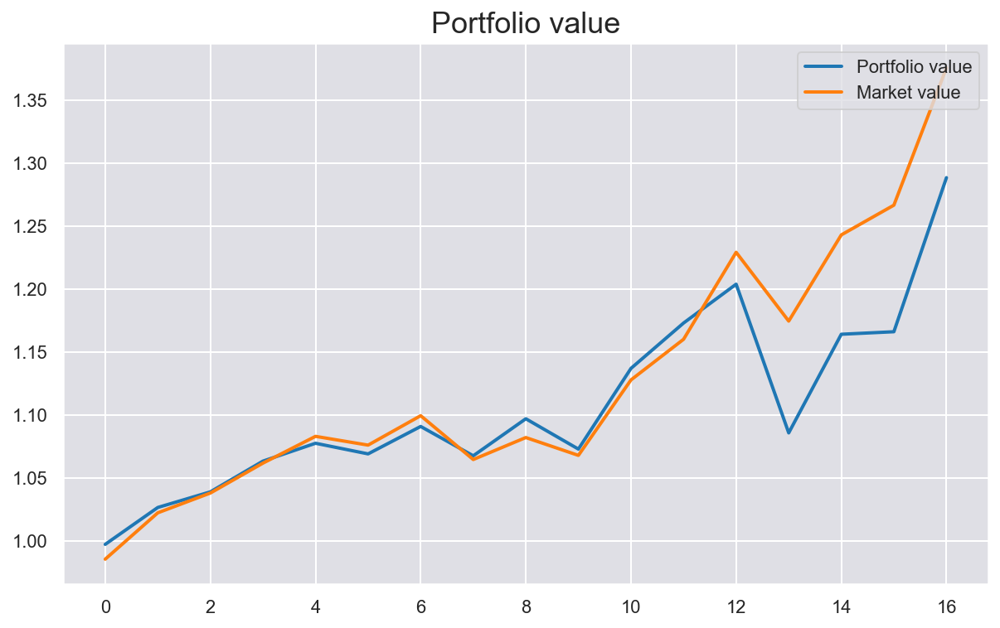

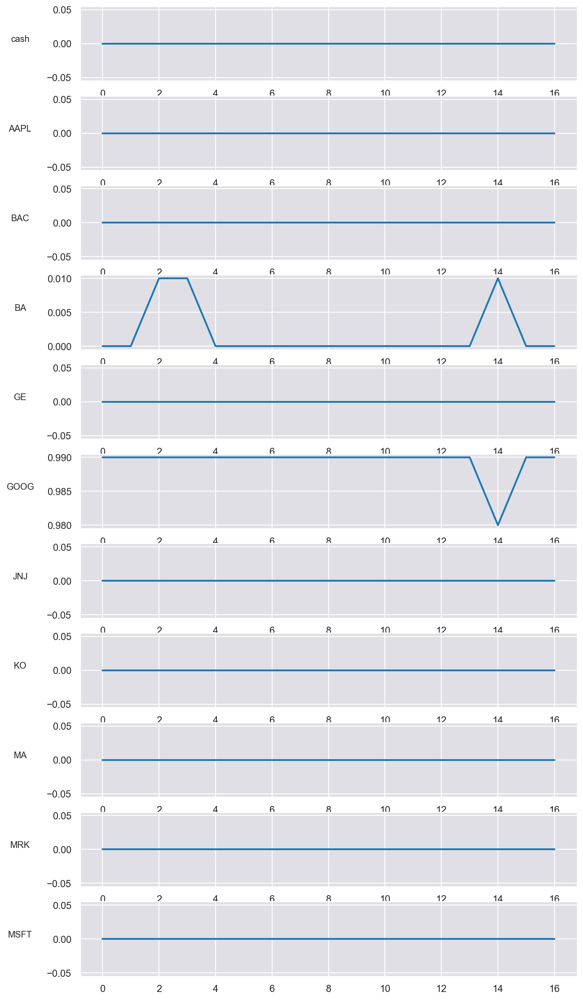

In [165]:
env_2018 = PortfolioEnv(his, tag, window_length=30,
                   start_idx=time_index[0])
test_model(env_2018, ddpg_model)
plot_weights(env_2018.infos)

In [171]:
observation, info = env_2018.reset()
observation

array([[[1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00, 1.00e+00],
        [1.00e+00, 1.00e+00, 1.00e+00, 1

In [143]:
ls = []
for i in range(len(env_2018.infos)):
        ls.append(env_2018.infos[i]['weights'])
ls

[array([0.00e+00, 0.00e+00, 0.00e+00, 4.90e-03, 4.00e-04, 9.95e-01,
        0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00], dtype=float32),
 array([0.00e+00, 0.00e+00, 0.00e+00, 5.10e-03, 4.00e-04, 9.94e-01,
        0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00], dtype=float32),
 array([0.00e+00, 0.00e+00, 0.00e+00, 5.10e-03, 4.00e-04, 9.94e-01,
        0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00], dtype=float32),
 array([0.00e+00, 0.00e+00, 0.00e+00, 4.90e-03, 4.00e-04, 9.95e-01,
        0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00], dtype=float32),
 array([0.00e+00, 0.00e+00, 0.00e+00, 4.90e-03, 4.00e-04, 9.95e-01,
        0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00], dtype=float32),
 array([0.00e+00, 0.00e+00, 0.00e+00, 5.00e-03, 4.00e-04, 9.95e-01,
        0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00], dtype=float32),
 array([0.00e+00, 0.00e+00, 0.00e+00, 4.90e-03, 4.00e-04, 9.95e-01,
        0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00], dtype=float32),

## Base Line